In [1]:
#combine files 
import glob 
import os
#clean 
import string
import pandas as pd
import numpy as np
import emoji
import nltk
import re 
from cleantext import clean
#sleep timer 
import time 
import logging
import threading
#show most common words
from collections import Counter
#word cloud 
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from googletrans import Translator

Since the GPL-licensed package `unidecode` is not installed, using Python's `unicodedata` package which yields worse results.


In [26]:
# pip install googletrans==4.0.0-rc1

In [28]:
# pip install vaderSentiment

In [3]:
files = os.path.join("reviews/*.csv")
files = glob.glob(files)
df = pd.concat(map(pd.read_csv, files), ignore_index=True)
df.to_csv("combined_shopeeID.csv")

In [4]:
df = df.dropna()

In [5]:
df

,username,date,variation,rating,comment
0,d*****h,2022-03-21 10:50:21,HITAM,5,Bagussss bangettt sukakkkk tapi packing nya ku...
1,mukhlis020202,2022-03-14 01:13:29,HITAM,5,Wkwk takjub si sma seller nya pdhal cmn pesan ...
2,wrhzq4th23,2022-03-14 12:15:48,HITAM,5,"kemasannya aman, kaget datengnya cepet hahaha,..."
3,mba_ayu008,2022-03-02 19:20:58,PINK,4,"Paket dah mendarat, cuma packing.an nyaaa kura..."
4,i*****8,2022-02-23 11:11:52,HITAM,5,Imut dan lucu..lumayan dipakai untuk foto self...
...,...,...,...,...,...
255986,aritonangromawati93,2021-06-16 12:25:02,Black,5,Pakaging bagus isinya original mantullllllllll...
255987,anindyafika,2021-07-21 21:29:23,Black,5,Harga:Terjangkau\nKualitas:Bagus\nDesain:Bagus...
255988,nadfada,2021-04-22 21:32:18,Dark Wood,4,Padahal bubblewrap nya udah tebel banget sampe...
255989,i*****a,2021-07-29 19:23:53,Dark Wood,5,Harga:affordable \nKualitas:bagus\nDesain:bagu...


In [6]:
# Add column
df["translated text"] = df["comment"]
df

,username,date,variation,rating,comment,translated text
0,d*****h,2022-03-21 10:50:21,HITAM,5,Bagussss bangettt sukakkkk tapi packing nya ku...,Bagussss bangettt sukakkkk tapi packing nya ku...
1,mukhlis020202,2022-03-14 01:13:29,HITAM,5,Wkwk takjub si sma seller nya pdhal cmn pesan ...,Wkwk takjub si sma seller nya pdhal cmn pesan ...
2,wrhzq4th23,2022-03-14 12:15:48,HITAM,5,"kemasannya aman, kaget datengnya cepet hahaha,...","kemasannya aman, kaget datengnya cepet hahaha,..."
3,mba_ayu008,2022-03-02 19:20:58,PINK,4,"Paket dah mendarat, cuma packing.an nyaaa kura...","Paket dah mendarat, cuma packing.an nyaaa kura..."
4,i*****8,2022-02-23 11:11:52,HITAM,5,Imut dan lucu..lumayan dipakai untuk foto self...,Imut dan lucu..lumayan dipakai untuk foto self...
...,...,...,...,...,...,...
255986,aritonangromawati93,2021-06-16 12:25:02,Black,5,Pakaging bagus isinya original mantullllllllll...,Pakaging bagus isinya original mantullllllllll...
255987,anindyafika,2021-07-21 21:29:23,Black,5,Harga:Terjangkau\nKualitas:Bagus\nDesain:Bagus...,Harga:Terjangkau\nKualitas:Bagus\nDesain:Bagus...
255988,nadfada,2021-04-22 21:32:18,Dark Wood,4,Padahal bubblewrap nya udah tebel banget sampe...,Padahal bubblewrap nya udah tebel banget sampe...
255989,i*****a,2021-07-29 19:23:53,Dark Wood,5,Harga:affordable \nKualitas:bagus\nDesain:bagu...,Harga:affordable \nKualitas:bagus\nDesain:bagu...


### Filter Dataframe to only contain those from keywords

In [7]:
# df['clean'] = df['clean'].str.replace('\n',' ')
# df1 = df[df['comment'].str.contains("pengiriman")]
# pengiriman means delivery
# kurir means courier

search_values = ['pengiriman','kurir']

dfFiltered = df[df['comment'].str.contains('|'.join(search_values ))]

dfFiltered

,username,date,variation,rating,comment,translated text
4,i*****8,2022-02-23 11:11:52,HITAM,5,Imut dan lucu..lumayan dipakai untuk foto self...,Imut dan lucu..lumayan dipakai untuk foto self...
5,n*****o,2022-02-16 21:59:07,HITAM,5,"Produk sesuai pesanan, walaupun cuma dikemas h...","Produk sesuai pesanan, walaupun cuma dikemas h..."
6,ellyspuja21,2022-02-12 18:27:17,HITAM,5,alatnya bagus dan mau berfungsi jugaa👍🏻👍🏻👍🏻👍🏻 ...,alatnya bagus dan mau berfungsi jugaa👍🏻👍🏻👍🏻👍🏻 ...
8,n*****p,2022-02-28 21:52:56,PINK,5,"Paket nya sudah datang dengan baik, respon pen...","Paket nya sudah datang dengan baik, respon pen..."
12,ardhyapramestiregitacahyani,2022-02-15 11:11:45,HITAM,5,"packing rapi, pengiriman cepet, barang bagus b...","packing rapi, pengiriman cepet, barang bagus b..."
...,...,...,...,...,...,...
255980,gizvalea,2021-01-24 10:37:48,Light Wood,5,"Kualitasnya produknya oke, keamanan dan kecepa...","Kualitasnya produknya oke, keamanan dan kecepa..."
255981,v*****_,2021-01-21 19:34:15,Blue,5,Warna nya bagus kualitasnya barangnya juga bag...,Warna nya bagus kualitasnya barangnya juga bag...
255984,a*****a,2021-01-21 14:23:31,Blue,5,"Mantap, pengemasan pengiriman mantap dah pokok...","Mantap, pengemasan pengiriman mantap dah pokok..."
255985,sibuea.hernasri,2021-01-11 19:42:25,Blue,5,"Produk bagus,original dan tidak ada cacat.peng...","Produk bagus,original dan tidak ada cacat.peng..."


In [8]:
dfFiltered = dfFiltered.reset_index()

# Translation

In [9]:
#initialize the Translator
translator = Translator()
source_lan = "id" 
translated_to= "en" 

In [10]:
total_rows = dfFiltered.shape[0] -1
print("Total rows to translate: ", total_rows)

counter = 0
for index, row in dfFiltered.iterrows():  
    try:
        print("Row: ", counter)
        print()
        
        dfFiltered['translated text'][index] = translator.translate(str(row['comment']), src=source_lan, dest = translated_to).text
        print(dfFiltered['translated text'][index])
        
        print()
        counter += 1
        print("Rows Left: ", total_rows - counter)
        
        print("---" * 20)
#         print(counter)
    except Exception as e:
        time.sleep(15)
        continue

Total rows to translate:  39598
Row:  0

Cute and funny..lumayan used for selfie photos.Light and stylish.Just don't know whether it will last long.

Seller response good standard delivery speed.All safe

Thank you seller ............. zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz

Rows Left:  39597
------------------------------------------------------------
Row:  1



<ipython-input-10-b29f7e9b187a>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfFiltered['translated text'][index] = translator.translate(str(row['comment']), src=source_lan, dest = translated_to).text


The product is on order, although only packed only uses bubble wrap but all orders are received safely without defects.The seller response is CPT and friendly, the courier is friendly and polite.Thank you 👍👍👍👍👍

Rows Left:  39596
------------------------------------------------------------
Row:  2

the tool is good and wants to function too, it's just a long time ago

Rows Left:  39595
------------------------------------------------------------
Row:  3

The package has come well, the seller's response is very very friendly, the speed of delivery is very fastttttttttttttt
Thank you

Rows Left:  39594
------------------------------------------------------------
Row:  4

Neat packing, fast delivery, really good items.satisfied buying in this shop.Thank you Seller 😍😍.

Rows Left:  39593
------------------------------------------------------------
Row:  5

shipping is ok bgttt, it's just evening pesen td afternoon udh nyampe👍🏻💯 the rest ok ok 💯

Rows Left:  39592
--------------------------

good quality, shipping pretty fast, hopefully durable the product

Rows Left:  39561
------------------------------------------------------------
Row:  37

The packaging is coated with plastic or bubble wrap, just pke cardboard, so it's gampng.For fast delivery.

Rows Left:  39560
------------------------------------------------------------
Row:  38

It's good to think, if there is a remote that can be photographed from afar, eh just find it in Branda Shope, kmren is fun "Try searching for another promo again, it's still just trying to try the photo, it doesn't need to be complicated for a photo."End hopefully it's durable the item👍❤️Pengimpet 1h smpe

Rows Left:  39559
------------------------------------------------------------
Row:  39

Very helpful once can remote photos really like can be selfie in IG fast delivery

Rows Left:  39558
------------------------------------------------------------
Row:  40

The item finally landed with a fun chat with the seller who was so good at ask

Even though the shipping is old TP GPP.Good, it's been tried and can be used.But unfortunately on my cellphone can't use it, it's usually through another cellphone.

Rows Left:  39526
------------------------------------------------------------
Row:  72

Yipiii, it's been only 2 days of delivery
really good funny also the color !!

Rows Left:  39525
------------------------------------------------------------
Row:  73

Good bngtt, shipping nya also cpet bngtt🥰 you have to buy pokonyaaaa😜

Rows Left:  39524
------------------------------------------------------------
Row:  74

It's really useful for a distant selfi photo on Instagram, really good, really fast delivery, thank you

Rows Left:  39523
------------------------------------------------------------
Row:  75

The item has arrived and there is no damage at all, but only the high school delivery is long for the date of the date of the 9th, it is okay☺️

Rows Left:  39522
------------------------------------------------------------

Good 😊 function.Can make HP and Instagram default cameras.Given the battery too. LG Flash Sale Wkwk.Even though it's not safe to send the box, it's just like it, but it's ok for me as long as I don't know.Thanks:)

Rows Left:  39491
------------------------------------------------------------
Row:  107

Okeee BGTT for selfies, fast delivery, cheap price.Next order LG.Thank's

Rows Left:  39490
------------------------------------------------------------
Row:  108

Packaging and fast delivery, packaging even though it doesn't use bubble wrap but there is a fragile sticker so it's a safe package.The remote shutter works properly, it can be used for the default camera and also Instagram

Rows Left:  39489
------------------------------------------------------------
Row:  109

Bitssssssssssss, fast delivery, fast, quality gausah is doubtful, gapernah nyesel just buy here, the price is also affordable

Rows Left:  39488
------------------------------------------------------------
Row:  110


Here it is the item I'm waiting for hihi, thank God, it works well, can make IG too, so if you want a long distance photo, it can really use this, the shipping is good, the color to order, maybe if the lack is the packaging section, at least therebubble wrap / wrappers ~

Rows Left:  39448
------------------------------------------------------------
Row:  150

Nice really cool cool delivery so good

Rows Left:  39447
------------------------------------------------------------
Row:  151

Product quality is very good, the price of the product is very good, the shipping speed is good, the seller's response is very good

Rows Left:  39446
------------------------------------------------------------
Row:  152

The seller is very friendly I'm really happy with this shop trluvv especially the delivery of the gercep really yesterday pesen now nyampe dong, items function all well

Rows Left:  39445
------------------------------------------------------------
Row:  153

Alhamdulillah, the produ

Alhamdulillah, the package arrived, the delivery was fast and the packing was also good and it was also very functioning

Rows Left:  39406
------------------------------------------------------------
Row:  192

The item has finally used to go to Surabaya, it is too important to do it -_- tp delivery from the shop cpt, how come it's successful?

Rows Left:  39405
------------------------------------------------------------
Row:  193

Good really cheap fast delivery really next time order again thanks

Rows Left:  39404
------------------------------------------------------------
Row:  194

Thank you for the item already coming, neat packing and fast delivery

Rows Left:  39403
------------------------------------------------------------
Row:  195

Product quality is very good original product delivery good

Rows Left:  39402
------------------------------------------------------------
Row:  196

function properly ... the delivery is fast asiiii

Rows Left:  39401
----------------------

the item has arrived, shipping & delivery cptt👍🏻👍🏻

Rows Left:  39363
------------------------------------------------------------
Row:  235

Nice bangat ... the courier is friendly ... the items are safe, free shipping again

Rows Left:  39362
------------------------------------------------------------
Row:  236

Small items, good products, fairly fast delivery.

Rows Left:  39361
------------------------------------------------------------
Row:  237

Funny functions nice and good, fast delivery too.Anyway okay

Rows Left:  39360
------------------------------------------------------------
Row:  238

Worth it bgttt ... the function is well delivery also Cptt Thanks seller🙏

Rows Left:  39359
------------------------------------------------------------
Row:  239

Real pict and functioning, just shipping it for a long time

Rows Left:  39358
------------------------------------------------------------
Row:  240

Nice delivery fast but unfortunately paking is just limited to cardboard



The item is good ... smooth too ,,, fast delivery ,, packaging is also fast ,, next order again ...
Sorry, another photo because the item has been saved

Rows Left:  39318
------------------------------------------------------------
Row:  280

Good functioning very well, standard packaging, fast delivery, safe goods

Rows Left:  39317
------------------------------------------------------------
Row:  281

Good functioning bgt well worth it is good fast delivery

Rows Left:  39316
------------------------------------------------------------
Row:  282

Nice mantapp item ... but the delivery is long enough to arrive ... maybe llama on shipping the time huh

Rows Left:  39315
------------------------------------------------------------
Row:  283

Bagus fit and function properly, but the shipping is old, but it's ok!

Rows Left:  39314
------------------------------------------------------------
Row:  284

According to product orders ... Packaging and delivery is pretty good ... all functio

Nice items, just delivery which is quite long but the GPP, which is important to arrive.It was also tried earlier, okay the item even though the cellphone became a little ngeleg if it was connected.It does not matter.
Thanks bro 🙏

Rows Left:  39279
------------------------------------------------------------
Row:  319

The package has arrived ... good ... thank you seller n courier

Rows Left:  39278
------------------------------------------------------------
Row:  320

Rada is disappointed with the packaging, the package until here you know like that, should be plastic and gave the tape so that the cardboard is not to be open, the courier until it is to explain if the package is already like that, fortunately it doesn't miss, but the items are good, functioning both, thank you.

Rows Left:  39277
------------------------------------------------------------
Row:  321

Pretty good, packaging is also fast, fast delivery👍🏻👍🏻

Rows Left:  39276
-------------------------------------------

It's good, it's easy to make a remote original photo, the courier mksih is also a healthy

Rows Left:  39238
------------------------------------------------------------
Row:  360

Good product quality, affordable prices, fast delivery, very friendly seller response

Rows Left:  39237
------------------------------------------------------------
Row:  361

The product works well, the shipping speed is very good

Rows Left:  39236
------------------------------------------------------------
Row:  362

Alhamdulillah, items completely and survived.Goods are sent according to order and fast delivery.It's quite comfortable when I tried, hopefully it will be durable.Thank you Seller🙏

Rows Left:  39235
------------------------------------------------------------
Row:  363

Cheap price quality okay, until buying 2 yesterday lost 😭😭😭 delivery very fast, the best is the main 👍🏻👍🏻👍🏻

Rows Left:  39234
------------------------------------------------------------
Row:  364

Alhamdulillah, the item 

Really 'really good and really helps wkwk
First bought with a neat packing and the delivery was nice and fast wort it really
And that's really "can make an Android cellphone
Just try it hehe for those of you who like photos are really useful

Rows Left:  39197
------------------------------------------------------------
Row:  401

bnget bnget delivery is also fast the blisters directly in Cobain and function properly, good bnget sihh sukaa🤩🤩

Rows Left:  39196
------------------------------------------------------------
Row:  402

It's good, the shipping is also fast functioning well initially hesitating because the price is cheap ehh ps dateng ga ngecire

Rows Left:  39195
------------------------------------------------------------
Row:  403

Row:  403

Monmaap just gave a judgment now packaging shipping items all okeee

Rows Left:  39194
------------------------------------------------------------
Row:  404

The delivery is fast, I ordered immediately, usually if Cod Lama, but this 

The package has been received and according to the order ... Friendly.
Already tried and functions with good..mantaapp dehh
Thanks seller n shopee may be more successful

Rows Left:  39158
------------------------------------------------------------
Row:  440

Wow it's really good, it works well.Really steady, the delivery is pretty fast

Rows Left:  39157
------------------------------------------------------------
Row:  441

Function properly, thank you
Neat packaging and delivery very fast

Rows Left:  39156
------------------------------------------------------------
Row:  442

Good bangetttt ........ Fast delivery is also fast ...

Rows Left:  39155
------------------------------------------------------------
Row:  443

Items have been received in safe and good conditions, packaging STD, fast delivery, functioning remotes ... hopefully durable ... thanks seller

Rows Left:  39154
------------------------------------------------------------
Row:  444

Good, fast delivery, Alhamduli

Row:  479

Product quality is very good, fast delivery, fast reseller response 👍👍

Rows Left:  39118
------------------------------------------------------------
Row:  480

Packaging Amannn, Price is murahhh, delivery is fast

Rows Left:  39117
------------------------------------------------------------
Row:  481

Fast delivery, unfortunately couriers that deliver slow & don't escort the fourth destination ... useful products ... Sorry Photos & Videos Ga Krn Lsg Hbs

Rows Left:  39116
------------------------------------------------------------
Row:  482

functions with good, thanks and sellerrrrrrrrrr, sorry it doesn't use the product photo huh

Rows Left:  39115
------------------------------------------------------------
Row:  483

Alhamdulillah and thank you for arriving.Packaging and delivery is upgraded again, Sis.Product according to order ...

Rows Left:  39114
------------------------------------------------------------
Row:  484

Goods up to order, free shipping safely conti

The item is okay, just when the delivery of the messenger wrap is rich in open, but the item Alhamdulillah still runs

Rows Left:  39078
------------------------------------------------------------
Row:  520

The packing is neat delivery is also fast, the items are received in good condition and function properly too

Rows Left:  39077
------------------------------------------------------------
Row:  521

Product quality is very good, product original, product price is very good, delivery speed is very good, the seller's response is very good

Rows Left:  39076
------------------------------------------------------------
Row:  522

Only the first time shopping here, a safe packing, items are complete and maybe because the new flash sale shipping is sent H + 2.TP GPP is still standard because of SM2 in Tangerang, but it is fast.Satisfied bgt, thank you seller🤗

Rows Left:  39075
------------------------------------------------------------
Row:  523

ah unboxing it's hard for me to try 

Cheap price
Material: smooth
Good quality

Fast delivery, yesterday paid now arrived this second time bought here well!

Rows Left:  39038
------------------------------------------------------------
Row:  560

Material: Okay
Quality: Okay
Price: cheap fitting there is a promo hihihi
Items according to order order okay
Courier friendly and polite
Neat and safe packing
Cheap prices for cheap yyaa
Next order
Tahamky You

Rows Left:  39037
------------------------------------------------------------
Row:  561

Material: Good
Quality: good
Cheap price

Always subscribe to sii, every time you buy a mask surely hereii.Shipping is also fast, cheap price, very recommended

Rows Left:  39036
------------------------------------------------------------
Row:  562

Material: Pretty soft
Quality: okeee deh
Price: always borong here, friendly price

Thanksss yaaaaaaaaaa delivery is cepetttttt

Rows Left:  39035
------------------------------------------------------------
Row:  563

Good, the deliver

Price: affordable.
Material: really good
Quality: Mantab.

Atituh oath is really good.Packing and delivery are also very fast.Very satisfied.Surely it will be a subscription

Rows Left:  39003
------------------------------------------------------------
Row:  595

Price: pretty affordable
Material: Bagus ...
Quality:

Good the item, the delivery also gets fast, response
The seller is friendly, bro

Rows Left:  39002
------------------------------------------------------------
Row:  596

Cheap price
Material: Good
Good quality

Alhamdulillah finally arrived at the mask ... the packaging is old ... the shipping is standard ... the mask is good, the color is calm .... thanks seller, shopee and akang good and friendly courier 👍👍😍😍😍

Rows Left:  39001
------------------------------------------------------------
Row:  597

Price: Standard
Quality: good

Alhamdulillah packaging fast delivery, color according to all.Good

Rows Left:  39000
------------------------------------------------------

Affordable prices
Material: Bagus ...
Quality: Baguss

product quality is very good, product delivery is very fast, affordable prices,

Rows Left:  38969
------------------------------------------------------------
Row:  629

Price: very cheap
Material: Good
Quality: good quality

The price of the economical material is good and the shipping process is fast

Rows Left:  38968
------------------------------------------------------------
Row:  630

Cheap price
Material: Thickness
Good quality
The color is funny, thanks yaaaa, the village is also fast.

Rows Left:  38967
------------------------------------------------------------
Row:  631

Cheap price
Material: Good

The cheapest price between other stores, complete also all fitting 10 pcs, will repeat order again, packaging the same delivery is also fast

Rows Left:  38966
------------------------------------------------------------
Row:  632

Cheap price
Material: 4 layer mask
Quality: good

Good quality, fast delivery, I definitely b

Material: Standard
Quality: good
Cheap price

Packaging and fast delivery
Standard packaging
The black mask turned out to be only 9 and was already open

Rows Left:  38932
------------------------------------------------------------
Row:  666

Already 2x Buy here the item suits the delivery is also fast, Packing is safe🥰 Thanks Seller ♥ ️

Rows Left:  38931
------------------------------------------------------------
Row:  667

Material: Thickness
Quality: good bgt
Price: right in the bag

For really fast delivery

Rows Left:  38930
------------------------------------------------------------
Row:  668

Material: Good
Quality: good
Price: Cheap

Actually, it's really a subscription to buy a mask in this shop.Selaj is cheap and shipping is still one province.But this yesterday was very disappointed with shipping ID Express.Usually a single day has arrived, it's even almost 5hr just sampek.Regret using ID Express

Rows Left:  38929
--------------------------------------------------------

Really good color recommendation and fast delivery

Rows Left:  38894
------------------------------------------------------------
Row:  704

Goods according to order ... fast delivery a day already arrived.Recommended can make a subscription

Rows Left:  38893
------------------------------------------------------------
Row:  705

Price: Cheap
Material: Alhamdulillah, it's good to use
Quality: Inshaallah good

The new fast delivery process yesterday's message and today has arrived.Thank you

Rows Left:  38892
------------------------------------------------------------
Row:  706

Join shipping 11.11 but the delivery is fast, thank God the items have arrived safely, the packaging is safe and the contents fit 10pcs each packaging, finally find a shop that is close to the free shipping and the packaging is zip, thankyou seller💜

Rows Left:  38891
------------------------------------------------------------
Row:  707

Price: Cheap is actually cm plus it will be standard
Material: Tebel Ba

Cheap price
Material: Good
Quality: Okay

Good product, low price, fast delivery, delicious comfortable use ... Trims seller

Rows Left:  38857
------------------------------------------------------------
Row:  741

Price: OK.
Material: OK.
Quality: OK.

Good bgttttt, cheap too, the delivery is fast too

Rows Left:  38856
------------------------------------------------------------
Row:  742

Price: relatively cheap
Material: Good
Good quality

Shipping is very fast, the packaging is safe, the items are well received, according to the ordered .. Not bad the masks with the price is like that mantapp👍👍

Rows Left:  38855
------------------------------------------------------------
Row:  743

Price: suitable baggage😋
Material: Thickness
Quality: good, thick straps are not easy to break up

Worth it really cheap price dapet nice mask, keep the price & quality
Fill in 10, fast delivery👍

Rows Left:  38854
------------------------------------------------------------
Row:  744

Good for the p

Quality: Original
Affordable prices
Material: Thickness

Thank you, the order according to, always satisfied buying here, the mask is comfortable to wear, packaging and fast delivery, next order ❤️

Rows Left:  38824
------------------------------------------------------------
Row:  774

Material: Good
Good quality
Economical price
Thanks seller..barang and I receive ... Fast submissions are ok ... and this is repeat me again..recommended seller guys .... Thanks also pack courier

Rows Left:  38823
------------------------------------------------------------
Row:  775

Material: Good
Quality: Standard
Price: Standard
The quality of the product is good
Fast delivery
Neat and safe packing
Thanks Seller, Shopee and Brother Courier

Rows Left:  38822
------------------------------------------------------------
Row:  776

Thank you...
The item already comes ...
The original items are good ... no cans can ...
The item also corresponds to the picture ...
The quality of the product is very goo

Material: Okay
Quality: Okay
Price: Standard.

A good seller's response, fast delivery. You think

Rows Left:  38790
------------------------------------------------------------
Row:  808

The color is beautiful, fast delivery, and quality ok.Thank you and success always

Rows Left:  38789
------------------------------------------------------------
Row:  809

Material: Most bad
Quality: decent
Cheap price

Package has arrived, packaging and fast delivery, for a decent mask material

Rows Left:  38788
------------------------------------------------------------
Row:  810

Prime shopping in this shop, TP Service and Delivery OK.Thanks seller and courier

Rows Left:  38787
------------------------------------------------------------
Row:  811

Packaging and good shipping, good items are beautiful and according to the picture

Rows Left:  38786
------------------------------------------------------------
Row:  812

Cheap price
Material: Cotton
Good quality

Cheap baget fast shipping too



Already ordered the umpteenth time here, the item is good and complete, the packaging is safe, the delivery is always really cool to wait for a long time.Thank you

Rows Left:  38749
------------------------------------------------------------
Row:  849

Quality: comfortable to wear
Price: Standard

Excellent delivery speed, good quality, original product

Rows Left:  38748
------------------------------------------------------------
Row:  850

Goods to order, the packing is safe polllll, fast delivery too, top !!

Rows Left:  38747
------------------------------------------------------------
Row:  851

Goods have been received safely, delivery is also fast.Thanks seller

Rows Left:  38746
------------------------------------------------------------
Row:  852

The quality is good, fast delivery and safe pokonya top

Rows Left:  38745
------------------------------------------------------------
Row:  853

Fabric
Good quality
Affordable prices

It's already subscribed to this shop, the s

Material: Good
Quality: good
Affordable prices

Fast delivery Realpict.
Affordable Good Prices

Rows Left:  38710
------------------------------------------------------------
Row:  888

Material: Good
Quality: good
Price: good

Very good with your product fast shipping thank you for your cooperation

Rows Left:  38709
------------------------------------------------------------
Row:  889

Material: Most bad
Quality: decent
Affordable prices

Packaging + shipping is also fast

Rows Left:  38708
------------------------------------------------------------
Row:  890

Masks have been accepted, cheap prices, very good quality, fast courier, responsive seller, choice of many types of toppppp👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍

Rows Left:  38707
------------------------------------------------------------
Row:  891

Material: Mantap.
Quality: Mantap.
Price: Mantap.

mantapppp shipping e cuepet poll

Rows Left:  38706
------------------------------------------------------------
Row:  892

Good, quality acco

The mask is nice design funny and very fast delivery

Rows Left:  38672
------------------------------------------------------------
Row:  926

Cheap price, good quality delivery is also very fast a day to arrive

Rows Left:  38671
------------------------------------------------------------
Row:  927

Row:  927

Quality: decent
Material: soft
Price: Standard
The color is beautiful, thank you seller and pack courier

Rows Left:  38670
------------------------------------------------------------
Row:  928

Cheap price
Material: non medical mask material
Quality: Good 4 ply
Mask Kf 94 Good ingredients, 4 ply, ori & cheap anyway.Warnya.name2.next bli lg here ah..tks seller & courier J & T Express ...

Rows Left:  38669
------------------------------------------------------------
Row:  929

Material: Okay
Quality: Okay
Affordable prices

Okay mask, it's useful when the pandemic is like this ,, very fast delivery

Rows Left:  38668
-----------------------------------------------------------

Good quality
Cheap price
Material: Good

Mask KF 94 We Mask Careon (1 Pack Fill 10) Variation: Mix Woman Careon, Kf Wemask Black Alhamdulillah Sent to Order Good Material Fast Shipping Neat Packing

Rows Left:  38635
------------------------------------------------------------
Row:  963

Ingredients: rather thin but according to the price is still worth buying
Good quality
Price: cheap pwol

For the price, it's worth it, it's really cheap, the delivery is also fast, hehe thx seller

Rows Left:  38634
------------------------------------------------------------
Row:  964

Fast delivery of the color is good as usual already subscribes to love

Rows Left:  38633
------------------------------------------------------------
Row:  965

Fast delivery of the message yesterday today arrived.Like it with the same kf94 mask, but this is when it used there was a smell of stuck smell; (

Rows Left:  38632
------------------------------------------------------------
Row:  966

Packaging and fast del

Cheap prices, safe packaging, fast delivery.Thank you Seller

Rows Left:  38595
------------------------------------------------------------
Row:  1003

Complete according to the order.The delivery is fast.Morning ordered, direct daytone processed shipping.

Rows Left:  38594
------------------------------------------------------------
Row:  1004

Nice guys😍 even though shipping is quite long but gapapa.The material is tebel🤗.

Rows Left:  38593
------------------------------------------------------------
Row:  1005

Good bgt cheap hrga jg.Then delivery can be.Will order D SNI LG

Rows Left:  38592
------------------------------------------------------------
Row:  1006

Material: mask
Quality: Okay
Price: discount

Likes to buy here so many shipping quickly also packing mayanlah

Rows Left:  38591
------------------------------------------------------------
Row:  1007

The mask is nice, ordered, safe packing, fast delivery

Rows Left:  38590
--------------------------------------------

Good good thick
Cpt bgt delivery
Afternoon afternoon message came

Rows Left:  38552
------------------------------------------------------------
Row:  1046

Good quality
Cheap price
Material: Tebel.

Alhamdulillah, the package has come safely and completely, the mask is good, the quality is good, Bine Tebel, and the price is also cheap, thanks seller, thanks for the courier

Rows Left:  38551
------------------------------------------------------------
Row:  1047

Material: Good
Good quality
Price: Good

Good bangetttttttttt, fast deliveryaaaaaaaaaaaaaaaaaaaaaaaaaaa

Rows Left:  38550
------------------------------------------------------------
Row:  1048

Material: thin
Quality: decent
Price: accordingly
Okay good delivery ...

Rows Left:  38549
------------------------------------------------------------
Row:  1049

Ordered items according to delivery are also very quickly not regret orders here, the price is also cheap

Rows Left:  38548
--------------------------------------------

Worth it, delivery is also very fast, recommended ...

Rows Left:  38514
------------------------------------------------------------
Row:  1084

Material: Good
Quality: good, tebel
Price: Cheap, in my opinion

Not SIA "Ngeborony Many. The mask is beautiful in color, can nail like the color of the clothes haha. And the delivery of ituloh, super hardy ❤️

Rows Left:  38513
------------------------------------------------------------
Row:  1085

Material: OK.
Quality: OK.
Price: OK.

Product quality okay, good product, okay product price, comfortable n comfortable material, okay delivery, okethx seller response u

Rows Left:  38512
------------------------------------------------------------
Row:  1086

Material: Good
Good quality
Cheap price
Honestly this is recommended, once it's 7, so the delivery is also cepettt

Rows Left:  38511
------------------------------------------------------------
Row:  1087

Material: Good
Good quality
Affordable prices

Alhamdulillah, the package arrived,

Material: Okay
Quality: Okay
Price: Okay

Fast delivery, neat packing, Worth it to buy, fortunately there is a promo

Rows Left:  38474
------------------------------------------------------------
Row:  1124

The mask uses, the packing is fast, unfortunately the shipping is old.But the mask is well received.Thanks ... 👍👍👍

Rows Left:  38473
------------------------------------------------------------
Row:  1125

Material: really good
Quality: Good according to the writing 4ply
Price: very cheap affordable

It's already repeat the order is really as good as that, I see this mask in the price, the price can be 2x more expensive while here can be under 20K.Recommended really serious packaging is safe, it's pretty fast delivery and the mask as good as that, will be sring to buy again Dsini😍😍😍😍

Rows Left:  38472
------------------------------------------------------------
Row:  1126

Good, it's 2x buy here fast deliveryTtttt

Rows Left:  38471
----------------------------------------------

The package arrived and was well received ..
Always a subscription in this shop because besides the items are okay and good, the seller is also okay ... quick response and packing okay .. items sent to date are always complete and good ... satisfied shopping here ... 😁tengqiu seller and bang courier ..🙏🏻😁

Rows Left:  38439
------------------------------------------------------------
Row:  1159

Material: Like a mask in general
Quality: good
Price: cheap lag
Because the good ingredients delivery fast bet

Rows Left:  38438
------------------------------------------------------------
Row:  1160

Affordable prices
Material: soft
Quality: OK.

Super Fast Shipping, Trusted & Ssuai with Pictures 👌🏻

Rows Left:  38437
------------------------------------------------------------
Row:  1161

Okay really, the price of cheap good goods packaging and delivery is also very fast.Thank you Seller

Rows Left:  38436
------------------------------------------------------------
Row:  1162

Cheap price


Quality: OK.
Price: OK.
Material: OK.

The white mask pesen 2 but the quality is different which is 1 nice one is lacking ... the brand is the same, but the quality is different ..Over is all the delivery wlpn long until 6 days

Rows Left:  38402
------------------------------------------------------------
Row:  1196

Good quality
Affordable prices
Material: soft

Alhamdulillah ,, the product

Rows Left:  38401
------------------------------------------------------------
Row:  1197

Material: Good
Quality: Okay
Affordable prices

very fast delivery, come to order

Rows Left:  38400
------------------------------------------------------------
Row:  1198

Good, it's pretty good, fast delivery and it's okay, so my cucak.Cheap poko mantap

Rows Left:  38399
------------------------------------------------------------
Row:  1199

Material: soft ...
Quality: good, oko
Price: cheap, fast delivery .... Thanks sellerrr

Rows Left:  38398
---------------------------------------------------------

Nice socks, and the price is very cheap, delivery is fast, okay, next order again

Rows Left:  38365
------------------------------------------------------------
Row:  1233

Thank you courier sellers, whose socks are also nice funny funny, good luck using, success always

Rows Left:  38364
------------------------------------------------------------
Row:  1234

Product quality is very good
Original product
Product prices are very affordable
Delivery speed is very good
Very good seller's response

Rows Left:  38363
------------------------------------------------------------
Row:  1235

Good product quality, good seller response, fast delivery, TQ

Rows Left:  38362
------------------------------------------------------------
Row:  1236

Items arrived safely with fast shipping neat packing trustworthy thx u seller shopee courier good job 👍

Rows Left:  38361
------------------------------------------------------------
Row:  1237

items according to the description and fast delivery than

The package has come good material fast shipping shopee thanks for the courier

Rows Left:  38324
------------------------------------------------------------
Row:  1274

The packaging is very long, even though the shipping is only 3 days doang

Rows Left:  38323
------------------------------------------------------------
Row:  1275

Alhamdulillah Already Up to 3 Only 12k Can Vocer 99 Hihhihi
Good item "Everything is suitable to use anakny delivery JG fast
Fix BKL JG Tolo Subscriptions Hihihi Thank you Seller

Rows Left:  38322
------------------------------------------------------------
Row:  1276

Good product quality, fast delivery, thank you .......

Rows Left:  38321
------------------------------------------------------------
Row:  1277

Product quality excellent original product delivery speed is very fast thank you Sis

Rows Left:  38320
------------------------------------------------------------
Row:  1278

Soft material, suitable for use of children2 ... fast delivery and n

Good product quality, price according to quality, good shipping speed, good packaging, ntaps

Rows Left:  38287
------------------------------------------------------------
Row:  1311

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.Thank you.

Rows Left:  38286
------------------------------------------------------------
Row:  1312

Packaging okay.Pretty delivery OK.Maybe because it's a lot of orders because of the 8.8 jdi delivery is quite long ago.But it's ok, it's ok ... my feet is funny and the ingredients are fine ... thanks for the seller

Rows Left:  38285
------------------------------------------------------------
Row:  1313

The item arrived, the quality was good, affordable prices, neat packaging, shipping was also cpt ya👌👌 everything was good

Rows Left:  38284
------------------------------------------------------------
Row:  1314

Thank you Sis Package I have received ,, Shipping Sam

Thank Saller Fast Shipping ... Okeee Packing ............. Thank you

Rows Left:  38250
------------------------------------------------------------
Row:  1348

Good product quality, good product price, good shipping speed, thanks seller, ..........

Rows Left:  38249
------------------------------------------------------------
Row:  1349

The product has not been opened
Hopefully good as usual
Thank you Shopee
Thank you Seller
Thank you Courier

Rows Left:  38248
------------------------------------------------------------
Row:  1350

Very good product quality, neat product packing, good product delivery, thank you ❤️❤️

Rows Left:  38247
------------------------------------------------------------
Row:  1351

Soft, the price is also cheap, shipping is also fast thank you

Rows Left:  38246
------------------------------------------------------------
Row:  1352

It's good for the product even though it's cheap but it's not cheap, plus the delivery is fast, thank you!

Rows Left:  3824

Good quality goods, fast delivery, good seller response

Rows Left:  38205
------------------------------------------------------------
Row:  1393

Funny cute, fast delivery, thanks seller and shopee !!!!!!

Rows Left:  38204
------------------------------------------------------------
Row:  1394

The quality is good.Notable price and fast delivery 👍👍👍👍

Rows Left:  38203
------------------------------------------------------------
Row:  1395

OKE products, delivery are also fast.Seller response is good.OK

Rows Left:  38202
------------------------------------------------------------
Row:  1396

Okay goods shipping standard.The ingredients are all about the harness

Rows Left:  38201
------------------------------------------------------------
Row:  1397

Already nyampe fast packaging sm shipment thank you

Rows Left:  38200
------------------------------------------------------------
Row:  1398

Tengkyu Babyfit .... Best Price, OK Shipping.❤️❤️❤️❤️❤️

Rows Left:  38199
--------------

The product Alhamdulillah Real Pict Well Kaka, It's really sorry I don't really get a photo in the wardrobe out wk
The quality is good comparable to the price, packaging is quite fast, the seller's response is a long time DKIT delivery according to time, the pokonya successful trs for his shop.

Rows Left:  38163
------------------------------------------------------------
Row:  1435

Good product quality, good product price, good product delivery, original product according to description, very good seller's response, just a really thin packing jd on the dent of the item, thanks seller

Rows Left:  38162
------------------------------------------------------------
Row:  1436

Mf bru give value .. land with bauh, fast delivery, good strength, the price is also cheap, hopefully it's durable hehe the courier is friendly ... netx order lg yes ... thank you .. thanks ... thank you .. thanks .. thanks .. thanks.Trimakasih ... thank you ... thank you .. thank you ..

Rows Left:  38161
------

Super fast shipping ... Order Saturday Monday to Hehe .. Thanks, the spabber is the ingredients, it's cheap, the price is cheap ... it's also funny

Rows Left:  38130
------------------------------------------------------------
Row:  1468

The motives are really funny but unfortunately my baby hasn't been born and it's still long.But gapapa at Simpen until he's big.really gemes all the motiv.Please increase the delivery time again.too long shipping

Rows Left:  38129
------------------------------------------------------------
Row:  1469

Alhamdulillah, the item arrived Sis ... Fast Delivery ... Everything ... Thank you Sis, Next time God willing, stop here again Sis

Rows Left:  38128
------------------------------------------------------------
Row:  1470

Good items received, fast delivery of seller response also goodss 👍👍👍

Rows Left:  38127
------------------------------------------------------------
Row:  1471

Goods until timely in good condition.The seller is also responsive and

Everything to order, good quality goods, affordable prices, pretty fast delivery, mkasih seller ..

Rows Left:  38091
------------------------------------------------------------
Row:  1507

Really good fast delivery of packaging safety and neat top it's just recommended let's order now here

Rows Left:  38090
------------------------------------------------------------
Row:  1508

Get a very cheap price compared to other store quality shops even though the same, super duper delivery is really fast.Thanks a lot of smooth sellers continuously 💃🏻💃🏻💃🏻💃🏻💃🏻

Rows Left:  38089
------------------------------------------------------------
Row:  1509

Product quality of good products, delivery fast, packagingnnnnnnnnkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk, recomendeddddddddddddddd onceIIIIIIIIIII

Rows Left:  38088
------------------------------------------------------------
Row:  1510

Product quality is very good.Original product.The product price is very good.Very good deliv

The lyrics of the lyrics, hopefully fit and durable to my culture.The material is good.SELLER Amanah, only the shipments are long 😅🙏 maybe because of the date 4.4.

Rows Left:  38049
------------------------------------------------------------
Row:  1549

Good ingredients, the price is also cheap only the shipping is a bit long.Thanks seller

Rows Left:  38048
------------------------------------------------------------
Row:  1550

The items are good
The price is cheap just shipping from the seller for a long time
Enhanced lg ya kak
Thanks

Rows Left:  38047
------------------------------------------------------------
Row:  1551

Nice real pict, the delivery is fast, thanks a lot of seller🙏❤

Rows Left:  38046
------------------------------------------------------------
Row:  1552

Smooth condition, clean, super fast shipping, neat packing, thank youhhhhh ...

Rows Left:  38045
------------------------------------------------------------
Row:  1553

Really like all the bought.The mater

Items have arrived, funny and fast as well as the subordinates 🙏 thank you

Rows Left:  38005
------------------------------------------------------------
Row:  1593

The shoes are beautiful, realpict, delivery is also fast, the price is really muraahhh, thank you seller ..

Rows Left:  38004
------------------------------------------------------------
Row:  1594

Goods are okay, standard delivery, okay price, hopefully durable, thx seller !!

Rows Left:  38003
------------------------------------------------------------
Row:  1595

Original product product price is very good shipping very fast

Rows Left:  38002
------------------------------------------------------------
Row:  1596

Funny funny bnget socksny kk, shipping cpat and pcking jg good thx kk

Rows Left:  38001
------------------------------------------------------------
Row:  1597

Shipping fast, the packaging is also neat, goods according to order, cheap prices, and good material.Thank you Seller

Rows Left:  38000
-------

The item arrived at the house thanks a lot, bro, the item is good for shipping, the price of the price is cheap, good quality

Rows Left:  37957
------------------------------------------------------------
Row:  1641

Alhamdulillah finally the item has come to delivery the goods quickly, the material is also good, thank you ❤️

Rows Left:  37956
------------------------------------------------------------
Row:  1642

Really well worth it really good .. fast shipping raw materials

Rows Left:  37955
------------------------------------------------------------
Row:  1643

funny and ordered goods.Thank you.OKKK delivery

Rows Left:  37954
------------------------------------------------------------
Row:  1644

Really likes to like bangeettt funnyuuuuuuuuueeelll aaawww ... the delivery is also fast 2 days until I like it ... it's really recommended the main thing
Termakasiihh

Rows Left:  37953
------------------------------------------------------------
Row:  1645

The quality of good goo

Funny items like really fast delivery happy with ingredients and gmbrnynya funny2

Rows Left:  37912
------------------------------------------------------------
Row:  1686

Until the destination safely, delivery is also fast, thank you for a successful seller always ya😍

Rows Left:  37911
------------------------------------------------------------
Row:  1687

Alhamdulillah, it has arrived safely without no one, the delivery is also fast.

Rows Left:  37910
------------------------------------------------------------
Row:  1688

Good product quality.Good product price.Seller response is good.Good shipping speed

Rows Left:  37909
------------------------------------------------------------
Row:  1689

Baguusssss Brang Okay Okay, Pngriman Fast Bngt, Friendly Courier, Funny You Are Gemass Packing Ny Rapihhh Bkal Jd Lngganan Ni

Rows Left:  37908
------------------------------------------------------------
Row:  1690

Good product quality, good product prices, good shipping speeds of goo

It's pretty good and the price is also adequate continuously there are a few obstacles on shipping because the day ago the status was sent to Manado Shrsny to Banjarmasin, it turns out that today it has arrived ...

Rows Left:  37864
------------------------------------------------------------
Row:  1734

Always like shopping here, real pict, cheap, fast delivery ...

Rows Left:  37863
------------------------------------------------------------
Row:  1735

I didn't have a photo but the item was okay, cheap prices, fast delivery, bro

Rows Left:  37862
------------------------------------------------------------
Row:  1736

It's really funny for the shirts, the delivery is also fast Thanks Seller next order again 👍🤩

Rows Left:  37861
------------------------------------------------------------
Row:  1737

His feet is funny, neat packing and fast delivery..thank you

Rows Left:  37860
------------------------------------------------------------
Row:  1738

Cheap Price Meriah Material G

The baby's socks are funny, it's really funny, the ingredients are also delivery, too, can it be bangeet

Rows Left:  37817
------------------------------------------------------------
Row:  1781

the material is good ,, standard delivery, hargamurah ...........

Rows Left:  37816
------------------------------------------------------------
Row:  1782

Bangettt bangettt according to the picture of the shipment ajaa which is pretty long but what's the tengkyuuuu

Rows Left:  37815
------------------------------------------------------------
Row:  1783

The item has arrived, the delivery is quite long, maybe overload.
But everything is complete, like it ...

Rows Left:  37814
------------------------------------------------------------
Row:  1784

Items have arrived at the product according to cheap price fast shipping recommendations

Rows Left:  37813
------------------------------------------------------------
Row:  1785

Product quality Bangus, fast delivery, okay packing.The price i

The packing is safe, the courier is friendly, really dream of having thisII and finally already has it 💗 hopefully it will be durable 🥰 thank you

Rows Left:  37774
------------------------------------------------------------
Row:  1824

The camera is good, the original color is beautiful, beautiful, funny, funny, the delivery to the house is safe because the dus is super thick, the admin response is also fast, it's really fast

Rows Left:  37773
------------------------------------------------------------
Row:  1825

but it's tried and functions with good delivery fast, buy expensive online

Rows Left:  37772
------------------------------------------------------------
Row:  1826

The packaging is safe once +++ shipping quickly likes it!

Rows Left:  37771
------------------------------------------------------------
Row:  1827

Safely all, safe packaging, fast delivery, functioning of the camera is no problem, thank youu

Rows Left:  37770
---------------------------------------------

The camera is good, delivery is also fast, but the seller's response is a long time

Rows Left:  37733
------------------------------------------------------------
Row:  1865

Fast delivery until and the courier runs the procedure by ensuring that the camera receives the customer (cannot be deposited).Goods according to the ones in the photo.Very funny blue color !!Happy to get free paper 2 boxes!Thank You!:)

Rows Left:  37732
------------------------------------------------------------
Row:  1866

Thank you the package arrived at the delivery too

Rows Left:  37731
------------------------------------------------------------
Row:  1867

It's good, it's not yet tried because the FLM doesn't exist, it's hopefully there's no damage to the pokonya durable, shipping explodes fast pisan ketir josssss pokonamah

Rows Left:  37730
------------------------------------------------------------
Row:  1868

The camera is good, it works well.Colors to order and delivery include fast, from the pay 

Bitsss bgt the delivery is fast but I'll claim the paper doesn't have any confirmation :( huhu sad can't be directly used

Rows Left:  37694
------------------------------------------------------------
Row:  1904

Mantep items are shocked with the delivery so fast, just try my thesis to finish as fast as delivery):

Rows Left:  37693
------------------------------------------------------------
Row:  1905

OKE PRODUCT ... I hope you are durable .. fast delivery .. SELLER FRIEND WHICH WAS RIEW SLOW RESP ... Overall UDH Okay👍🏻

Rows Left:  37692
------------------------------------------------------------
Row:  1906

Security is okay the item is also okay just a long time in the shipment of ajaa

Rows Left:  37691
------------------------------------------------------------
Row:  1907

Thank you Sis, the item arrived at Eeee
Like bgt, safe product and delivery fast
Lilac colors are cantikk bgt, the camera works well
Thankyouuuu💜.

Rows Left:  37690
----------------------------------------

Packing neatly fast shipping, the wood is rather rough, huh.

Rows Left:  37656
------------------------------------------------------------
Row:  1942

Price: Standard.
Good quality
Form: good
Thanks for KK.Good and fast shipping, .next Subscriptions again

Rows Left:  37655
------------------------------------------------------------
Row:  1943

Price: Standard.

According to the picture, unfortunately shipping is a long time

Rows Left:  37654
------------------------------------------------------------
Row:  1944

Shape: curved
Price: Friendly in a bag
Quality: TOP

Alhamdulillah, the package has been received, fast delivery of okay kwkitas

Rows Left:  37653
------------------------------------------------------------
Row:  1945

Cheap price
Good quality
Form: good

Product quality is very good, the price of cheap products, delivery speed is very good

Rows Left:  37652
------------------------------------------------------------
Row:  1946

Great items.I like.Next buy again
Packi

Cheap price
Quality: good very
Form: according to expectations

Neat, good, fast delivery

Rows Left:  37616
------------------------------------------------------------
Row:  1982

Good hrg also pretty cheap, fast delivery
 Hopefully last.Thanks.

Rows Left:  37615
------------------------------------------------------------
Row:  1983

Affordable prices
Quality: Okay

Good quality, affordable prices, standard delivery time, safe packing

Rows Left:  37614
------------------------------------------------------------
Row:  1984

Cheap price
Quality: good
Shape: standard standard
Alhamdulillah, the package has been complete to the order ... it's a good packaging neat and safe shipping is also fast ...
Thank you Sis.

Rows Left:  37613
------------------------------------------------------------
Row:  1985

Good quality goods, competitive prices, good packaging, good shipping

Rows Left:  37612
------------------------------------------------------------
Row:  1986

The items are good "o

Cheap price
Quality: good
Shape: yes that's so

Good quality, for shipping please increase again

Rows Left:  37578
------------------------------------------------------------
Row:  2020

Affordable prices

safe delivery and fast
There are a few blisters
Thankyou sellerrr.

Rows Left:  37577
------------------------------------------------------------
Row:  2021

Good quality goods and very fast delivery.

Rows Left:  37576
------------------------------------------------------------
Row:  2022

Affordable prices
Quality: good
Form: good

Thank seller ... the quality of good goods, affordable prices, safe and fast packaging, delivery is also fast.Good luck for the future

Rows Left:  37575
------------------------------------------------------------
Row:  2023

Price: really cheap
Quality: good and strong
Form: aesthetic
Good product and fast delivery

Rows Left:  37574
------------------------------------------------------------
Row:  2024

Cheap price
Quality: really good a
Shape: w

Price: Standard.

Hopefully it can function properly

Rows Left:  37542
------------------------------------------------------------
Row:  2056

Price: okay prices
Quality: really good even though there are those who release the effect of delivery time

The product is recommended Guys
 Just suggest from me if the order is published so it will be safer

Rows Left:  37541
------------------------------------------------------------
Row:  2057

Cheap price
Quality: good
Form: good

Safe shipping, safe packing, no handicapped goods at all

Rows Left:  37540
------------------------------------------------------------
Row:  2058

Price: OK.
Good quality
Shape: OK.

Recommended seller, item ok and fast delivery

Rows Left:  37539
------------------------------------------------------------
Row:  2059

Really good, neat, cheap, fast delivery, good packaging

Rows Left:  37538
------------------------------------------------------------
Row:  2060

Yes, even though the delivery is JNT Sangaaaa

Price: accordingly
Quality: satisfying.
Form: accordingly

Repeat order ... Fast and safe delivery, complete ... Tq Seller

Rows Left:  37500
------------------------------------------------------------
Row:  2098

Good quality, the amount sent according to order, fast delivery👍🏻

Rows Left:  37499
------------------------------------------------------------
Row:  2099

Price: Mantap.
Quality: Mantap.
Form: steady

Fast delivery speed, very good response.

Rows Left:  37498
------------------------------------------------------------
Row:  2100

Cheap price
Good quality
Form: aesthetic
The package has been received until Ksih, it's good to use my knitting, thank you, Shopee, Mas courier

Rows Left:  37497
------------------------------------------------------------
Row:  2101

Fixed prices
Quality: Very good
Form: good

Really good, delivery is also very fast, thank you shopee,
Hopefully it will be ...
👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍🙏

Rows Left:  37496
-

Thank you, safe products, safe packing, shipping is also quite fast ^^

Rows Left:  37466
------------------------------------------------------------
Row:  2132

Price: Not bad
Good quality
Sharpness: sharp bet

The courier brother is also friendly, the material is good, it's good to like the knife

Rows Left:  37465
------------------------------------------------------------
Row:  2133

Price: Cheap
Quality: Good Looks like
Sharpness: sharp

Packaging and fast delivery

Rows Left:  37464
------------------------------------------------------------
Row:  2134

Only this time, the package is not wrapped
Just on the masking tape
The expiration is very much, yes because it's cheap
The knife is also like a patch
There is a price, there is quality
Interested in cheap because of it
But it's ok
Thanks, the seller, delivery is also fast

Rows Left:  37463
------------------------------------------------------------
Row:  2135

Cheap price
Quality: In accordance with it
Sharpness: sharp

It's

Price: FlashSale.
Quality: OK.
Sharpness: OK.

Let's order gaes..toko amanh cpt delivery..thanks seller n shopee

Rows Left:  37428
------------------------------------------------------------
Row:  2170

Price: including cheap
Good quality
Sharpness: sharp

Thank you, the package has arrived, fast delivery, like the items

Rows Left:  37427
------------------------------------------------------------
Row:  2171

Sorry not to photo ... the good item ... good material .. cheap price ... fast delivery ... thanks shopee🙏🙏🙏🙏

Rows Left:  37426
------------------------------------------------------------
Row:  2172

Good items, shipping is also fast.Guest well

Rows Left:  37425
------------------------------------------------------------
Row:  2173

Cheap price
Quality: according to price
Sharpness: according to the price

Goods according to pictures, cheap prices, neat packing, friendly couriers, standard packaging and shipping, thank you seller and sophee

Rows Left:  37424
-------------

Affordable prices
Quality: Baguss
Sharpness: sharpmm

Bagusssss, Tajem Bngetttt Sihhh Shipping is also fasttttt

Rows Left:  37391
------------------------------------------------------------
Row:  2207

I've arrived, it turns out that it turns out that it is smaller than the one in the photo, the knife is also not tried that the knife is really new to the old delivery of the old Aga 🔪👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌👌

Rows Left:  37390
------------------------------------------------------------
Row:  2208

Cheap price
Quality: good
Sharpness: Not yet tried
Packaging and fast delivery once..thans selleer👍😁

Rows Left:  37389
------------------------------------------------------------
Row:  2209

Good for the piso delivery is also fast.Just unfortunately it's not wrapped in straight cardboard

Rows Left:  37388
------------------------------------------------------------
Row:  2210

Price: Cheap
Good quality
Sharpness: really sharp

Syuka ...
fast delivery...

Rows Left:  37387
-----

According to the delivery order it's pretty fast, thank God already arrived

Rows Left:  37358
------------------------------------------------------------
Row:  2240

good items are also cheap fast shipping

Rows Left:  37357
------------------------------------------------------------
Row:  2241

Cheap price, fast delivery, good packing, shocked also because the price is very cheap, it has been tried sharply, recommended anyway, don't be afraid of being bought, Thanks Shopee, seller and mas courier 😄😄😄😄😄

Rows Left:  37356
------------------------------------------------------------
Row:  2242

Original product delivery of goods fast hopefully continuous subscription

Rows Left:  37355
------------------------------------------------------------
Row:  2243

Price: accordingly
Quality: Okay..lumayan.
Sharpness: sharp

Good ... fast delivery ... it's very suitable for gifts.Own use too okay.Unfortunately the packing is only given a duct
Advice ... it's good at plastic outside again so 

Price: Friendly
Good quality
Sharpness: Sharp enough

Order ceramic knife set, make a wife.Friendly price, good items, pretty sharp, neat packing, standard delivery

Rows Left:  37323
------------------------------------------------------------
Row:  2275

MantaaaAppp ... package delivered according to order ... fast delivery ... thankshh

Rows Left:  37322
------------------------------------------------------------
Row:  2276

Response, packaging also delivery from sellers very fast and good also original products

Rows Left:  37321
------------------------------------------------------------
Row:  2277

Not the original photo, the main thing is good. Friendly timer and subscription ....

Rows Left:  37320
------------------------------------------------------------
Row:  2278

Thank you for buying a night, the day of delivery is severely thank you

Rows Left:  37319
------------------------------------------------------------
Row:  2279

Cheap price
Good quality
Sharpness: sharp
Goo

Affordable prices
Good quality
Sharpness: really sharp

The knife is really tired until the sliris ni thumbs up fast delivery is good

Rows Left:  37282
------------------------------------------------------------
Row:  2316

Good product.Affordable prices satisfied shopping here shipping is also fast

Rows Left:  37281
------------------------------------------------------------
Row:  2317

5har long packaging may be due to emergency ppkm, fast delivery a day to.Thank you seller🙏👍

Rows Left:  37280
------------------------------------------------------------
Row:  2318

The package comes nicely and all functioning, cheap prices compared to other stores, the delivery quickly just bought yesterday today arrived

Rows Left:  37279
------------------------------------------------------------
Row:  2319

Dus dent and byk who poured on, pdhl for gifts.but super long shipping ... huhu

Rows Left:  37278
------------------------------------------------------------
Row:  2320

Cheap good, del

Price: accordingly
Quality: accordingly
Sharpness: Not bad

Price accordingly

Rows Left:  37238
------------------------------------------------------------
Row:  2360

My package has arrived ......... Delivery Good Goods ... Good Goods Condition ...

Rows Left:  37237
------------------------------------------------------------
Row:  2361

Price: Murmer.
Good quality
Sharpness: Mantul (exactly)

Thanks for the seller already trust, also mamang courier ...

Rows Left:  37236
------------------------------------------------------------
Row:  2362

Cheap price with good quality items and for fairly long delivery fast

Rows Left:  37235
------------------------------------------------------------
Row:  2363

Good items according to the order, according to the price.And pretty fast delivery.

Rows Left:  37234
------------------------------------------------------------
Row:  2364

Goods to order and delivery.y Cpt BGT Best Seller 👍👍

Rows Left:  37233
------------------------------------

The order has arrived, the quality of the product is very good, the product is original, does not disappoint, yag comes according to the image in the picture, thanks for the courier, thanks shopee

Rows Left:  37198
------------------------------------------------------------
Row:  2400

The item is good, the delivery also really likes to just hope, but it can't try the problem

Rows Left:  37197
------------------------------------------------------------
Row:  2401

Thank you you are very satisfied packaging fast fast shipping good goods

Rows Left:  37196
------------------------------------------------------------
Row:  2402

Thank you the seller package according to the order, the delivery is also very fast, the seller is good.Satisfied shopping at this store👍👍

Rows Left:  37195
------------------------------------------------------------
Row:  2403

Cheap price
Quality: good
Sharpness: very sharp

The item is ok ... but it's a bit late for shipping

Rows Left:  37194
-----------

The quality of the product is very good ... the price of the product is very good ... the speed of delivery is very good ...

Rows Left:  37160
------------------------------------------------------------
Row:  2438

Price: Okay
Quality: Okay
Sharpness: Okay

Thank you for the goods according to the order. Good thing to work
sorry photo vdeo gk according 🤘🏻

Rows Left:  37159
------------------------------------------------------------
Row:  2439

Good product .... fast delivery .... safe and fast packaging ..

Rows Left:  37158
------------------------------------------------------------
Row:  2440

Items accordingly
...
...
...
Shipping is rather fast
Friendly courier

Rows Left:  37157
------------------------------------------------------------
Row:  2441

Price: OK.
Quality: OK.
Sharpness: OK.

Steady..bagus, fast delivery, safe items, hopefully durable ... always seller..gehat always👍

Rows Left:  37156
------------------------------------------------------------
Row:  2442

Pric

Price: pretty affordable
Good quality
Sharpness: sharp

Thank God, the items I ordered, arrived, delivery was also very fast, thank you Shopee, let's get a friend * Buy the household tool 😉

Rows Left:  37123
------------------------------------------------------------
Row:  2475

At first, I was shocked because the box was dented, and it wasn't wrapped in anything else for the packaging, just thank God the knife was safe, the delivery was fast as well worth it the price was that much

Rows Left:  37122
------------------------------------------------------------
Row:  2476

Cheap price
Quality: decent
Sharpness: less sharp

I ordered black which was cramic but the one who came in gold, but gappa.Just the box isn't good again dent ...
Hopefully what I ordered twice this came quickly and fit the same as I chose. If you can send it in a quick response.

Rows Left:  37121
------------------------------------------------------------
Row:  2477

Affordable prices
Good quality
Sharpness: Not

Price: according to price
Quality: pretty good
Sharpness: pretty good

I like the courier because it's friendly .....
GK Lecet

Rows Left:  37088
------------------------------------------------------------
Row:  2510

Good, suitable description, according to order .. shipping fast, thanks seller ...

Rows Left:  37087
------------------------------------------------------------
Row:  2511

Affordable prices
Good quality
Sharpness: sharp right
The items arrived, CPT delivery, good packaging, mksh kk.

Rows Left:  37086
------------------------------------------------------------
Row:  2512

Cheap price
Quality: Very good
Sharpness: nice sharp

Because the item is good, it's good, the price is cheap, it's good, the packing is neat, the progress is fast directly in the response to the seller, thanks, the courier is friendly, Mahiasih

Rows Left:  37085
------------------------------------------------------------
Row:  2513

Items are received according to the order and the delivery is ve

Ok ... it's no matter what it's paccking items like this just use black plastic ... long shipment on the grounds overload 12.12 almost a week even though the location is still the same ... but it's not anything ... it's safe to get to the place ... complete goods ...... just the dent is just a cardboard ... ok thanks a lot of sellers ....

Rows Left:  37053
------------------------------------------------------------
Row:  2545

Order the second time, this part if I think hehe btw thank you seller!My package arrived safely and safely 🙏🏻 fast delivery👍

Rows Left:  37052
------------------------------------------------------------
Row:  2546

According to order all responses okay shipping goods are always successful for the shop

Rows Left:  37051
------------------------------------------------------------
Row:  2547

Products of Bagussssss, items accordingly, standard packaging, pretty fast delivery, safe packaging, and prices include cheap, Thanks Seller.Products of Bagussssss, items

Fast delivery of funny items according to the picture thank you

Rows Left:  37019
------------------------------------------------------------
Row:  2579

good product quality, fast delivery and safe, funny original children I like, thank you, success always

Rows Left:  37018
------------------------------------------------------------
Row:  2580

Alhamdulillah, my child likes, fast shipping toppp

Rows Left:  37017
------------------------------------------------------------
Row:  2581

The bag is good at the price of cheap shipping fast. Just top top

Rows Left:  37016
------------------------------------------------------------
Row:  2582

Its cantianiknya cute, the mother likes especially her child.Very good selling seller's response, there are empty colors directly and replace the readyy color, it's not less good ... No need to hesitate to buy here ... he sent it was very fast, fast too.Seller n courier, bleach.Good job!

Rows Left:  37015
---------------------------------------

So Cutee😍😍 Thank you Sis❤️❤️
product quality is very good, product original, product price is very good, delivery speed is very good, the seller's response is very good

Rows Left:  36980
------------------------------------------------------------
Row:  2618

Pretty good products at cheap prices get free shipping again, shipping is also fast ... thank you

Rows Left:  36979
------------------------------------------------------------
Row:  2619

Product quality okay, okay price, okay shipping, much cheaper than offline stores

Rows Left:  36978
------------------------------------------------------------
Row:  2620

Product quality excellent product price excellent delivery speed is very good

Rows Left:  36977
------------------------------------------------------------
Row:  2621

Good shipping speed ... the seller's response is very good ... thanks for you ...

Rows Left:  36976
------------------------------------------------------------
Row:  2622

My child really likes fast free

The bag is good
Syukaaaa anaku, fast delivery yesterday pesen today come and the price is very affordable
Product quality is very good👍
Success is always for the shop

Rows Left:  36939
------------------------------------------------------------
Row:  2659

Delivery speed is very good
Product quality is very good

Rows Left:  36938
------------------------------------------------------------
Row:  2660

Luamaaaaaaaaaaa is really delivery but the gpp can get a good bag for children

Rows Left:  36937
------------------------------------------------------------
Row:  2661

Tlg check again yes there is a row below huhu dear bgt ...
Messen 2, but the 1 is not smooth, huhu ...
Cepet is shipping and packaging ...
Just less smooth this one is just a good safe

Rows Left:  36936
------------------------------------------------------------
Row:  2662

Alhamdulillah, the item arrived safely.The items are good, fast delivery.May my nephew like the items.Thank you Seller, Success always

Rows Lef

Alhamdulillah, the bag is funny, the item is also appropriate, the realpict delivery is also fast.Thank you Seller

Rows Left:  36900
------------------------------------------------------------
Row:  2698

Thank you very much. Good shipping good prices for good products

Rows Left:  36899
------------------------------------------------------------
Row:  2699

Good material
According to the same picture
Unfortunately the shipping is a long time ago
Eat it I give a 4 star

Rows Left:  36898
------------------------------------------------------------
Row:  2700

The bag is funny ... no one is lacking ... the ingredients are good ... delivery okay ... Thanks

Rows Left:  36897
------------------------------------------------------------
Row:  2701

The bag is funny, bags, according to the picture, fast delivery, children can accept Kasakaaa

Rows Left:  36896
------------------------------------------------------------
Row:  2702

It's really good, the packaging is very neat, fast deliv

It's good that it's pretty thick delivery too okay the packaging is also okay the child is also happy

Rows Left:  36859
------------------------------------------------------------
Row:  2739

Thank you, you like to get a bag for your child, it has arrived, the delivery fast is the price according to quality too

Rows Left:  36858
------------------------------------------------------------
Row:  2740

Package to according to the order, fast delivery, this is the funny parahhhh yes nephew so add the price of the price according to the goods according to expectations too

Rows Left:  36857
------------------------------------------------------------
Row:  2741

Good product .... neat packaging ... fast delivery ... cool it's just good ... thanks seller ... success ...

Rows Left:  36856
------------------------------------------------------------
Row:  2742

The bag turns out to be a very mini, just fit the most money but it's good, it's funny. Shipping too fast and the important thing

The package has arrived at neat shipping, the delivery is really fast, the seller's response is good, it's funny, it's soft, it's a flexible ponak I like
I don't think, I'm giving me a nephew

Rows Left:  36817
------------------------------------------------------------
Row:  2781

The best shop, delivery a day until, the item is okay, it has been "bought here, because of Amanahhhhh

Rows Left:  36816
------------------------------------------------------------
Row:  2782

The bag is good there is no defect, the price is cheap in the appeal of the next shop, the shipping speed is standard.recended to buy this shop. Video & photos are not appropriate

Rows Left:  36815
------------------------------------------------------------
Row:  2783

Good products, original, fairly fast delivery, satisfying overalls, small cute funny items suitable for children and toddlers to save money or just funny fashion for children.Pictures are also funny all hehe

Rows Left:  36814
----------------------

Arrived ... the delivery is very good, my child likes ... the picture is suitable ... thank you very much

Rows Left:  36775
------------------------------------------------------------
Row:  2823

Items come safely.There are no any obstacles.Really like the items of the packaging fast and the delivery is also fast so that it is not long to wait for the pokonya really recommend for those who like shopping for Dishopee ... the goods are already high in high school who have 🙏

Rows Left:  36774
------------------------------------------------------------
Row:  2824

Really good the bag is real pict 😘 the delivery is fast and the courier that is also very friendly, sorry the photo is not in accordance with the product because it has been taken by the customer 🥰

Rows Left:  36773
------------------------------------------------------------
Row:  2825

Really good, cust likes, already a shopping subscription here, fast delivery, neat packing, fast response ...

Rows Left:  36772
----------

The child really likes thanks a lot of his order according to the color and model thank God for all his brother's courier has been subscribed

Rows Left:  36736
------------------------------------------------------------
Row:  2862

Nice bag ... so it's too thick ... safe delivery, according to the order

Rows Left:  36735
------------------------------------------------------------
Row:  2863

Super and safe packaging and shipping, goods also real pic ... beautiful and thick, success always sellers

Rows Left:  36734
------------------------------------------------------------
Row:  2864

The items are good at affordable prices fast shipping thx yaaaaaa

Rows Left:  36733
------------------------------------------------------------
Row:  2865

Complete good items fast delivery.Goods I hope I like

Rows Left:  36732
------------------------------------------------------------
Row:  2866

Sorry there is no video, but this is a good good bag, the ingredients are lemhutsesai cool, the ch

Thank you, the item has come to order and the courier is friendly

Rows Left:  36695
------------------------------------------------------------
Row:  2903

Good bgt bag .... delivery too fast ... thax seller

Rows Left:  36694
------------------------------------------------------------
Row:  2904

Funny and imutt bag.x and sorry yaa kak..untuk delivery.x please increase blaring barries not disappointed ..

Rows Left:  36693
------------------------------------------------------------
Row:  2905

Sorry new comment now makasi ea kak good items fast shipping ..

Rows Left:  36692
------------------------------------------------------------
Row:  2906

Thank you Good Shipping JG Very Fast ... Recommended😍

Rows Left:  36691
------------------------------------------------------------
Row:  2907

Alhmdulilh package has come and quickly shipping, alhmdulilh my child likes really .trmksh

Rows Left:  36690
------------------------------------------------------------
Row:  2908

Real pict d

Thanks ... the order according to and the delivery is also fast, the courier is really friendly, it's really friendly not to regret this shop, my child likes Bangettttt

Rows Left:  36650
------------------------------------------------------------
Row:  2948

good items are good bangettt
Shipping is also fast
funny for my nephew
Gemes BGTTTT

Rows Left:  36649
------------------------------------------------------------
Row:  2949

Alhmdllh .... HARL HRG AFFORDABLE FAST DELE ORDER OF AFFORDABLE SIANAK KOK BANGET 😆

Rows Left:  36648
------------------------------------------------------------
Row:  2950

Good items the price is pretty affordable shipping goods also quite quickly thank God like the seller's items also good subscriptions like

Rows Left:  36647
------------------------------------------------------------
Row:  2951

Bags are nice, funny, fast delivery, affordable prices, okay quality, just a little color selection

Rows Left:  36646
-------------------------------------

Mantaps.Real pict is pretty thick.
My child really likes to use it on.
Mo buy again for my son who is man.
Trims seller shopee and courier that malem2 at 8 o'clock is already mo between

Rows Left:  36607
------------------------------------------------------------
Row:  2991

The items are nice funny🥰
but old shipping 😢

Rows Left:  36606
------------------------------------------------------------
Row:  2992

Cheap price fast shipping material pretty according to price

Rows Left:  36605
------------------------------------------------------------
Row:  2993

Nice bangs bag, funny kids happy to get this gift bag, fast delivery, mkasih seller

Rows Left:  36604
------------------------------------------------------------
Row:  2994

Good Quality Fast Shipping Friendly Courier

Rows Left:  36603
------------------------------------------------------------
Row:  2995

Good packaging, good delivery.can price discs too thank you

Rows Left:  36602
-----------------------------------------

According to the good product, but it's the same as the courier, the price doesn't match the one who is paid clearly, the price is even more.But I like thankting thanksyouuu🥰🥰

Rows Left:  36559
------------------------------------------------------------
Row:  3039

My order has arrived at the photocromic glasses really good, shipping is also safe, nothing is broken

Rows Left:  36558
------------------------------------------------------------
Row:  3040

Hu's sunglasses really really good 🤩😍🥰 according to really fast expiration

Rows Left:  36557
------------------------------------------------------------
Row:  3041

Good Bangeeett glasses Packingnya neat delivery is also fast only 2 days👍👍👍

Rows Left:  36556
------------------------------------------------------------
Row:  3042

Shipping is pretty fast
Realpict glasses, good
Thankyou

Rows Left:  36555
------------------------------------------------------------
Row:  3043

items according to order, the glasses are really the pa

Package to order, safe packing, fast delivery speed, no handicapped items are safe all, but the photocromic is just a little, thanks a lot of sellers🙏🏻

Rows Left:  36516
------------------------------------------------------------
Row:  3082

Nice glasses according to the picture, the delivery was quickly bangett.Excellent

Rows Left:  36515
------------------------------------------------------------
Row:  3083

good product quality, good product price, fast delivery

Rows Left:  36514
------------------------------------------------------------
Row:  3084

Shipping is well delivered to the front door of the house with the courier, good quality, the price of the product is also good for Shopie

Rows Left:  36513
------------------------------------------------------------
Row:  3085

Fast delivery, sunglasses, Hehe Makasih💘💘💘

Rows Left:  36512
------------------------------------------------------------
Row:  3086

The glasses are good to order, the shipping is fast, just like 🥰🤗
Th

The original is this photocromic really 30k is worth it really, the delivery is fast, the seller is also friendly.Moreover, bro, love brother courier

Rows Left:  36473
------------------------------------------------------------
Row:  3125

Goods to order
And good
Cepet also delivery
.

Rows Left:  36472
------------------------------------------------------------
Row:  3126

The product is very good, just as satisfied for high school items, the delivery of the delivery is fast X, the most numenenginnn is given a bonus of 1 glasses 😂😂mksihhh bnyakkk y, definitely subscribe here👍👍👍👍

Rows Left:  36471
------------------------------------------------------------
Row:  3127

Sorry not according to the photo because it doesn't have a photo, the item is good
, the packaging quickly ship its fast courier friendly next order again

Rows Left:  36470
------------------------------------------------------------
Row:  3128

The package has been received, for a safe packing using Bubble Wrap and

nice items fast delivery and packaging too fast

Rows Left:  36435
------------------------------------------------------------
Row:  3163

nice items fast delivery and packaging too fast

Rows Left:  36434
------------------------------------------------------------
Row:  3164

nice items fast delivery and packaging too fast

Rows Left:  36433
------------------------------------------------------------
Row:  3165

nice items fast delivery and packaging too fast

Rows Left:  36432
------------------------------------------------------------
Row:  3166

nice items fast delivery and packaging too fast

Rows Left:  36431
------------------------------------------------------------
Row:  3167

nice items fast delivery and packaging too fast

Rows Left:  36430
------------------------------------------------------------
Row:  3168

nice items fast delivery and packaging too fast

Rows Left:  36429
------------------------------------------------------------
Row:  3169

His glasses are good

Good product quality, affordable prices, fast delivery

Rows Left:  36393
------------------------------------------------------------
Row:  3205

Packing is a safe good item, there is a bonus fabric.Seller response DN fast shipping👍

Rows Left:  36392
------------------------------------------------------------
Row:  3206

Good items, fast delivery, but have not been tried whether it's really photochromic or not.Thank you for the seller and courier

Rows Left:  36391
------------------------------------------------------------
Row:  3207

Product quality is very good, delivery speed is very good

Rows Left:  36390
------------------------------------------------------------
Row:  3208

Good Good Luck for the first one to delivery pretty fast

Rows Left:  36389
------------------------------------------------------------
Row:  3209

Good quality, good packaging, fast delivery, affordable prices

Rows Left:  36388
------------------------------------------------------------
Row:  3210



Realpict until it's fast courier friendly best for shopee and seller thanks for the item without defects anyway when I use it I like

Rows Left:  36349
------------------------------------------------------------
Row:  3249

Good, cheap, fitting quality, delivery speed is very good, the handle of his glasses is rather jammed when opened and slightly slippery when used. BAGUSSSS ......

Rows Left:  36348
------------------------------------------------------------
Row:  3250

Good product quality
Good packaging and shipping
Cheap prices compete

Rows Left:  36347
------------------------------------------------------------
Row:  3251

How come when you got dark sun?
Besides that okay, safe delivery, fast pulak

Rows Left:  36346
------------------------------------------------------------
Row:  3252

Crazy Ye Shipping is fast, pesen 2nd, 3nd dah until just wkwkwk item baguuss makasiiiehhhh

Rows Left:  36345
------------------------------------------------------------
Row:  3253

His gl

Wednesday's message on Thursday it has come, like the delivery quickly, the one is the most okay even though the sale 2.2 xixi the glasses are also good, thx seller🤗

Rows Left:  36310
------------------------------------------------------------
Row:  3288

the item has arrived at the original photocromic but it's not too dark if it has fast sunlight delivery👍

Rows Left:  36309
------------------------------------------------------------
Row:  3289

goods according to order, satisfied with the mandate and fast delivery

Rows Left:  36308
------------------------------------------------------------
Row:  3290

Thank you the items arrived safely, fast delivery

Rows Left:  36307
------------------------------------------------------------
Row:  3291

The package has arrived, according to the order, the glasses are good, initially hesitating to buy, but when it comes according to expectations, but the bubble wrap is thin, the delivery is fast, next will buy here again, thank you Seller 💯

Good all packaging and delivery fast
Thanks seller for a good price really good

Rows Left:  36268
------------------------------------------------------------
Row:  3330

packaging and fast delivery, price accordingly and affordable thank you

Rows Left:  36267
------------------------------------------------------------
Row:  3331

A day delivery ... haven't tried it to the hot sun because it's raining right when I use it ... but this is good at affordable prices

Rows Left:  36266
------------------------------------------------------------
Row:  3332

Okay packing, standard delivery, the glasses are pretty good, it's not too dark in the hot sun, but it's ok it's appropriate with the price 😁 Thanks! 🤗

Rows Left:  36265
------------------------------------------------------------
Row:  3333

Good bangett parahh, neat packing standard delivery 2 days ... the glass of his eyes isn't put on a box but it's skilled first, the box is rather dirty in a little TPI gpp
Hopefully Potocromic i

wahh mantep, it's really fast delivery sip the main thing is mahh

Rows Left:  36229
------------------------------------------------------------
Row:  3369

The item arrived, and the item in accordance with the order, the courier was also Rama

Rows Left:  36228
------------------------------------------------------------
Row:  3370

Good real photocromic free shipping packaging safe arrived safely pkoknya gyesel bli here yoooo bliiii here pkoke bgus tenan

Rows Left:  36227
------------------------------------------------------------
Row:  3371

The items have arrived safely no defects, just ordinary packaging, but still safe because there is a box, delivery is also fast, steady, the point is, photocromic color changes are not yet known, because it hasn't been tested in the hot sun

Rows Left:  36226
------------------------------------------------------------
Row:  3372

Good, the packaging is neat, but the shipping is long, failed to send it to 2 days

Rows Left:  36225
-----------

Oath of Aseli Buagooos.There is a place where the glasses too.So shipping must be safe.The potcromic is also real.

Rows Left:  36190
------------------------------------------------------------
Row:  3408

the item has arrived, fast and safe delivery.thank you

Rows Left:  36189
------------------------------------------------------------
Row:  3409

Really good according to expectations, shipping is also fast thank you seller

Rows Left:  36188
------------------------------------------------------------
Row:  3410

Alhamdulillah, it's arrived, the delivery of the seller is quite a long time, the size is somewhat released in me, hopefully it will be durable, or not color or not, I make an interraciation if it works.Overalls like Sayaaa Deh Makasii

Rows Left:  36187
------------------------------------------------------------
Row:  3411

Good, fast delivery, not deformed goods.

Rows Left:  36186
------------------------------------------------------------
Row:  3412

My compensation

Good Good Goods And Fast Chat Fast Shipping Quickly Replied

Rows Left:  36147
------------------------------------------------------------
Row:  3451

Alhamdulilah, the package arrived, wrna his glasses ssuai with the message, fast delivery, kereeennnnnnnnnnnnnnnnnnnnn !!Thank you ... Will Next Order Nihh

Rows Left:  36146
------------------------------------------------------------
Row:  3452

Bags, teball frames, delivery long

Rows Left:  36145
------------------------------------------------------------
Row:  3453

Really really really real picture continues to delivery it's also fast even though the island difference

Rows Left:  36144
------------------------------------------------------------
Row:  3454

Packaging and fast delivery
His glasses are good, haven't been tried at Panasan Gataau Can Be Changed Black What Is Ndak

Rows Left:  36143
------------------------------------------------------------
Row:  3455

Worth it really the price is also affordable to delivery too fa

Slow responses from the seller, shipping a week more, packing is pretty neat, the product is appropriate.

Rows Left:  36106
------------------------------------------------------------
Row:  3492

Nice Fast Shipping Pokonya Recommended Degh Dape Tap Same Machine Makeyooooooooooossss Sorry Photos and Videos Inevitably

Rows Left:  36105
------------------------------------------------------------
Row:  3493

Thank you for your things to congratulations 🤗Makasih, the courier is a friendly pound kliii

Rows Left:  36104
------------------------------------------------------------
Row:  3494

Good product, delivery is also fast.It's already included where it's fabric.Over all like, Thanks seller.

Rows Left:  36103
------------------------------------------------------------
Row:  3495

Good bgtt I like, packing is also safe, fast delivery ...

Rows Left:  36102
------------------------------------------------------------
Row:  3496

Thank you glasses to order ...
Neat delivery

Rows Left

Good, fast delivery, always recommend shopping here mandate Alhamdulillah never been disappointed, still maintain Sis, success slalu👍😇

Rows Left:  36066
------------------------------------------------------------
Row:  3532

Really good the glasses don't buy it here in accordance with the order ... the shavy is also cheap, the shipping is also fast as fast as it's fast

Rows Left:  36065
------------------------------------------------------------
Row:  3533

The glass is okay fast delivery but less dark when it's getting sun, yes, my high school is priced

Rows Left:  36064
------------------------------------------------------------
Row:  3534

good product but not yet tried, fast delivery, hopefully awett yes sist

Rows Left:  36063
------------------------------------------------------------
Row:  3535

The glasses are good, the delivery is also fast, but a little disappointed because the glasses are rather small, suitable for small children😭😭😭

Rows Left:  36062
----------------

The order has arrived thank you seller bang courier, good luck

Rows Left:  36031
------------------------------------------------------------
Row:  3567

Thank God, it has been well received, well packed, fast seller response, according to requests, the item according to the description of the material is good, thank you seller and courier, hopefully blessing ...

Rows Left:  36030
------------------------------------------------------------
Row:  3568

Very fast shipping packaging.Safe packing goods.Okay items

Rows Left:  36029
------------------------------------------------------------
Row:  3569

His glasses are nice my child likes, packaging and fast delivery though 12 12

Rows Left:  36028
------------------------------------------------------------
Row:  3570

The package has been received in good condition, good shipping speed ... thank you kak🙏🙏

Rows Left:  36027
------------------------------------------------------------
Row:  3571

Really funny, cheap price, fast quality

Neat packing uses a safe bubble wrap, fast delivery, cheap glasses but quality like it's great hehe, thank you for my son's seller on happy

Rows Left:  35988
------------------------------------------------------------
Row:  3610

Good quality, good packaging, fast delivery, affordable prices

Rows Left:  35987
------------------------------------------------------------
Row:  3611

It's really funny, the price, the price and fast delivery.

Rows Left:  35986
------------------------------------------------------------
Row:  3612

Really good, fast delivery.Cheap price of cheap quality.

Rows Left:  35985
------------------------------------------------------------
Row:  3613

Sorry Sis Ga Ga Picture
Good product quality, affordable prices, safe packing, fast delivery.Thank you Sis, success always 🙏

Rows Left:  35984
------------------------------------------------------------
Row:  3614

His glasses are good ... funny ... Fast Delivery ... Affordable Price or Murmer ... hopefully it

The product is in accordance with the price, the shipping is very long past the deadline.
His packaging is good, the bubble wrap is thick

Rows Left:  35945
------------------------------------------------------------
Row:  3653

Fast delivery, the order is appropriate, youtsss😀😀lucu😁😁😁.

Rows Left:  35944
------------------------------------------------------------
Row:  3654

The first time the order but really the items are cute and good, the price is cheap, the seller's seller is very nice and friendly.Really satisfied shopping here, fast delivery, good product, basically good ...
Next must order here again for the collection.

Rows Left:  35943
------------------------------------------------------------
Row:  3655

The glasses are good shipping fast thanks seller

Rows Left:  35942
------------------------------------------------------------
Row:  3656

Nice glasses right when my child's delivery is also fast

Rows Left:  35941
----------------------------------------------------

The obligation of purchased deehhh ,, Baraang has a bangett bangett ku kukaaaaa bangett, the courier is also a ramahhh

Rows Left:  35903
------------------------------------------------------------
Row:  3695

Realpict Fast Shipping Cheap Price Cheap Thanks Seller.

Rows Left:  35902
------------------------------------------------------------
Row:  3696

We're funny, delivery, termakasihhh 🧡🧡🧡🧡

Rows Left:  35901
------------------------------------------------------------
Row:  3697

Packing is safe and neat .... Delivery is also fast items sent something order ... the glasses are good for my child likes ... thank you

Rows Left:  35900
------------------------------------------------------------
Row:  3698

The price is very cheap with good quality.And the shipping is quite fast

Rows Left:  35899
------------------------------------------------------------
Row:  3699

Safe goods, realpict can only deliver a little longer, the same glass is rather loose

Rows Left:  35898
---------

MAKASHIH its items have arrived, good and according to real pict, and the delivery is also cepettt, sorry it doesn't match the picture

Rows Left:  35863
------------------------------------------------------------
Row:  3735

According to the order, the children of the love of the shipment are also fast

Rows Left:  35862
------------------------------------------------------------
Row:  3736

Really kinds of his glasses kak ,, cheap price okay quality ,, fast delivery, real pict, safe packing. Subscriptions

Rows Left:  35861
------------------------------------------------------------
Row:  3737

Good ... shipping is also fast ... sent safely ... use bubble wrap too ... likes ... lerend kids on seneeng thanks seller

Rows Left:  35860
------------------------------------------------------------
Row:  3738

Package arrived, according to order, standard shipping speed

Rows Left:  35859
------------------------------------------------------------
Row:  3739

Alhamdulillah, the item ar

Nice-friendly seller response
Merakyat prices
cheap
Good price
fast delivery

Rows Left:  35822
------------------------------------------------------------
Row:  3776

Fast delivery, good items.according to price but okay.there is still a package that hasn't arrived, hopefully it's also satisfying

Rows Left:  35821
------------------------------------------------------------
Row:  3777

Packet has been received
Good items
Thanks seller shopee and courier
Good luck and trust always

Rows Left:  35820
------------------------------------------------------------
Row:  3778

Good glasses are good .. wort it for the price of 8,000 ... only the shipping is old

Rows Left:  35819
------------------------------------------------------------
Row:  3779

I'm really happy for my nephew, the delivery is also fast.Makasihhhhhh🙏🏻🙏🏻🙏🏻🙏🏻

Rows Left:  35818
------------------------------------------------------------
Row:  3780

Good product color good shipping good goods good material

Rows Left:  3

Bgus bnget, just when I'm in my brother. I am very high school, the delivery is fast, thanks for the seller.

Rows Left:  35778
------------------------------------------------------------
Row:  3820

Good product quality, friendly price, safe packing, ordering orders, fast delivery.

Rows Left:  35777
------------------------------------------------------------
Row:  3821

Good product, standard price, standard delivery.Good DDDD.

Rows Left:  35776
------------------------------------------------------------
Row:  3822

Alhamdulillah, the order has arrived, according to the order, good, cheap, delivery too fast, reccomended, thanks Sis

Rows Left:  35775
------------------------------------------------------------
Row:  3823

The item arrived ............ ... pretty delivery .......... Safely .........

Rows Left:  35774
------------------------------------------------------------
Row:  3824

Very fast delivery SELLER friendly good packing.
Thanks.

Rows Left:  35773
----------------

Items accordingly, the kece child likes, the model is funny and very affordable and nice, fast delivery

Rows Left:  35732
------------------------------------------------------------
Row:  3866

Cool bgt his glasses cute color sweet purple💜 color liveliness😍
thanks kak seler bang kurir🙏🏽🥰

Rows Left:  35731
------------------------------------------------------------
Row:  3867

SDH landing package, neat packaging, fast delivery, friendly seller, courier JG friendly, good items, thank you success always resellers

Rows Left:  35730
------------------------------------------------------------
Row:  3868

Alhamdulillah, according to the order ... Shipping JG fast ... God willing, OTder LG

Rows Left:  35729
------------------------------------------------------------
Row:  3869

Thanks yes ... fast delivery, friendly seller, friendly courier, goods arrived safely, the glasses are really good my child likes

Rows Left:  35728
------------------------------------------------------------
R

The item arrived according to the delivery order was also very fast, please increase it again, the item arrived at the delivery order, it was really fast, please increase it again, so that the customer was always a subscription to the customer, always a subscription

Rows Left:  35688
------------------------------------------------------------
Row:  3910

The item arrived according to the delivery order was also very fast, please increase it again so that the customer always subscribed to the grade, it has arrived at the order of delivery, please get it very fast, please increase it again so that the customer is always a substitute for your subscription

Rows Left:  35687
------------------------------------------------------------
Row:  3911

Maap the photo is not suitable ... the num is good for shipping CPT good

Rows Left:  35686
------------------------------------------------------------
Row:  3912

His glasses are funny and tiny ... Shipping Pretty fast..packing also ok..hank u

Nice funny hopefully suitable for my child the price is quite cheap shipping very fast very fast

Rows Left:  35647
------------------------------------------------------------
Row:  3951

The product has arrived, good, and original, packing is also safe, fast delivery.Thank you

Rows Left:  35646
------------------------------------------------------------
Row:  3952

the package arrived, the shipment was also fast his glasses nice funny

Rows Left:  35645
------------------------------------------------------------
Row:  3953

Gemesh Bangeetttt!All on order, fast delivery and ok packing with bubble wrap, no damaged or very bad defects!Luvvvvv!Thankyou seller!💕

Rows Left:  35644
------------------------------------------------------------
Row:  3954

Original products, good product prices, good shipping speed

Rows Left:  35643
------------------------------------------------------------
Row:  3955

the package has come the good items neat packaging fast delivery thanks seller

Rows 

His glasses are funny, shipping is super duper quickly order kmren today nyampe, jakarta batam

Rows Left:  35606
------------------------------------------------------------
Row:  3992

Orders have arrived, good products, ordered orders, fast delivery, real pict,....................................................

Rows Left:  35605
------------------------------------------------------------
Row:  3993

Thank you for the good shipping reseller items

Rows Left:  35604
------------------------------------------------------------
Row:  3994

Affordable prices, sellers and couriers are very friendly sorry because the photo doesn't match the goods🙏🙏

Rows Left:  35603
------------------------------------------------------------
Row:  3995

Thank you a lot of seller thanks also the courier ... the glasses are directly running out

Rows Left:  35602
------------------------------------------------------------
Row:  3996

Funny cool prices according to quality shipping standard trims seller

The standard delivery of good glasses according to the picture is just a minus of the brush, the picture is a lot of removable from the rubber, how come it's krena shipping or what but still in plastic and lots of dislodged.

Rows Left:  35566
------------------------------------------------------------
Row:  4032

Nice Likeaaa Bangeeet Super Fast Delivery I Love

Rows Left:  35565
------------------------------------------------------------
Row:  4033

Product quality is very good, delivery is very good, the product price is very good

Rows Left:  35564
------------------------------------------------------------
Row:  4034

Quality according to price.The product price is very good.Very good delivery speed.Good for a day for changing changes.

Rows Left:  35563
------------------------------------------------------------
Row:  4035

Funny and unique, fast delivery Thank you Seller

Rows Left:  35562
------------------------------------------------------------
Row:  4036

Alhamdulillah

Cheap price
Quality: Okay

Cheap price, according to picture, soft silicon, fast delivery, safe packaging.Thanks!

Rows Left:  35524
------------------------------------------------------------
Row:  4074

The products are good, original price affordable shipping Lumayam fast

Rows Left:  35523
------------------------------------------------------------
Row:  4075

4 star first, because the problem was caught tried items hehe standard delivery, and no but no one.Thanku.

Rows Left:  35522
------------------------------------------------------------
Row:  4076

Good, nyampe it really night, packing okay, delivery is pretty good

Rows Left:  35521
------------------------------------------------------------
Row:  4077

The price is friendly, shipping is also fast, the rubber ingredients become elastic

Rows Left:  35520
------------------------------------------------------------
Row:  4078

Cheap price
Quality: good
Fast delivery, reg 3 different colors given, thank you seller

Rows Le

Packaging is pretty fast ,, fast expedition delivery, cheap price ,, item right according

Rows Left:  35485
------------------------------------------------------------
Row:  4113

The packaging and delivery of fast prices is also quite affordable that the material is also quite tebel

Rows Left:  35484
------------------------------------------------------------
Row:  4114

Affordable prices
Quality: No cans cans

Good original bgt, cute xx color
Like it, help this basics
Success trs kak❤️🫂.

For the courier, thanks for my anterin package ❤️

Rows Left:  35483
------------------------------------------------------------
Row:  4115

Price: Friendly
Quality: good

Item arrived, fast delivery.Thank you, blessings

Rows Left:  35482
------------------------------------------------------------
Row:  4116

Cheap price
Good quality

According to my brother's order ... thank you ... old shipping ... but it's pretty good ... thank you for the trust

Rows Left:  35481
-------------------------

Cheap price
Quality: Okay

The silicon is soft but it doesn't hurt, it's good.Family likes 🤩
Thanks Seller, Shopee & Courier 🙏

Rows Left:  35443
------------------------------------------------------------
Row:  4155

Affordable prices
Usability: to rub the body when bathing
Quality: good

Standard packaging time, thick plastic packaging, ✖️Sobek, super safe 👍

Product according to ordered, color beautiful skali, mantul 👍

Friendly admin 👍

Standard shipping, friendly courier 👍

Trimakasi Seller, Next Order LG Krn Super Affordable 🙏😇🥰

Rows Left:  35442
------------------------------------------------------------
Row:  4156

Cheap price
Good quality

Not yet tried, hopefully it will be effective in accordance with the benefits.The emergence of a little longer, let alone deliver the old waduhhh.Good seller's response, hopefully selling sellers
......, ....., ..., ... ............., ....., ..., ..........., ....., ..., ... ............., ....., ..., ... ............., ....., ..., ... ..

Affordable prices
Usability: Back Brush
Good quality

Alhamdulillah, the package has arrived well, the packaging is neat and safe, fast delivery, introduction to the friendly package, thank you seller and expedition for its service.

Rows Left:  35414
------------------------------------------------------------
Row:  4184

Price: cheap bangets
Usability: Very useful for cleaning the backs of the hard affordable to clean ...
Quality: OK and good

Just a message yesterday, this day has been smpe, it's fast delivery, thanks ...

Rows Left:  35413
------------------------------------------------------------
Row:  4185

Price is very cheap
Usability: back scouring
Good quality

Alhamdulillah finally my customer order until too.The stuff is pretty fast.Quality according to price.Thank you Shoopee, Selker N Courier ...

Rows Left:  35412
------------------------------------------------------------
Row:  4186

Affordable prices
Usability: Good
Good quality

Product quality is very good, items 

Price: good
Quality: good

The item arrived safely, only for the packing and delivery was quite long, but thank you very much the seller.

Rows Left:  35380
------------------------------------------------------------
Row:  4218

Affordable prices
Usability: Rubbing
Quality: decent

I really like it, it's bgus bget.The delivery is also fast the courier is friendly.

Rows Left:  35379
------------------------------------------------------------
Row:  4219

Price: good
Usability: BATHING
Quality: good

Product quality is good, original products, good product prices, delivery speed is very good and good response ... but when applied, it turns out it's less felt in ..

Rows Left:  35378
------------------------------------------------------------
Row:  4220

Price: good
Usability: Pretty useful
Quality: good

This is a soft silicon suitable for people who want to rub it ga until the items are also okay there is no disabled and courier friendly

Rows Left:  35377
---------------------------

Cheap price
Usability: for back scouring
Quality: Not yet tried

very fast delivery mantulll

Rows Left:  35342
------------------------------------------------------------
Row:  4256

Affordable prices
Good quality

Goods to receive well, delivery is quite fast, thank you seller, hopefully the items will be durable

Rows Left:  35341
------------------------------------------------------------
Row:  4257

Items according to the description, the delivery is also fast just 1 day just but it's a thin thing that is thin that the package is received in a situation, it's already torn, but overall it is ok

Rows Left:  35340
------------------------------------------------------------
Row:  4258

Thank you the package has come, given bubblewrap too delivery ok

Rows Left:  35339
------------------------------------------------------------
Row:  4259

Cheap price
Usability: To clean your back
Good quality
Fast Shipping Good Goods Okee Packaging

Rows Left:  35338
-----------------------------

Cheap price
Quality: pretty good

Rather sleep ... because the packaging is old ... just delivery is fast because it is jnt

Rows Left:  35303
------------------------------------------------------------
Row:  4295

Price: OK.
Quality: OK.

Thank you for the stuff, arrived at the packaging and delivery everything was OK Thankyou 🙏🙏🙏

Rows Left:  35302
------------------------------------------------------------
Row:  4296

Product quality is very good ... original products ... the product price is very good ... the speed of delivery is very good ... the seller's response is very good ....

Rows Left:  35301
------------------------------------------------------------
Row:  4297

Price: OK.
Quality: OK.

The quality of good goods, the color is really fit like, shipping is very fast

Rows Left:  35300
------------------------------------------------------------
Row:  4298

according to order the shipping process is very fast right the color of lilac likes it really

Rows Left:  35299
---

Alhamdulillah, the item arrived, the packaging was safe, delivery also was fast, the goods ori makasih

Rows Left:  35261
------------------------------------------------------------
Row:  4337

The sales response is very good, delivery includes fast.safe goods arrive at home

Rows Left:  35260
------------------------------------------------------------
Row:  4338

Product quality is good, shipping is a bit old siiihh ... complete everything ... thank you ..

Rows Left:  35259
------------------------------------------------------------
Row:  4339

Affordable prices
Usability: For bathing
Quality:

I have received the order ..... Delivery Yes Pretty fast packaging is safe and neat

Rows Left:  35258
------------------------------------------------------------
Row:  4340

Price: good
Quality: good

Product quality Good shipping Good time products are very good

Rows Left:  35257
------------------------------------------------------------
Row:  4341

Cheap price
Good quality
shipping i

Price: good
Usability: Good
Quality: good

According to the order, everything is thank you seller and mas courier

Rows Left:  35217
------------------------------------------------------------
Row:  4381

The product is good according to what is expected then the delivery is also fast

Rows Left:  35216
------------------------------------------------------------
Row:  4382

According to the picture the delivery is also very fast just packing is not neat but gapapalhhh it's okay

Rows Left:  35215
------------------------------------------------------------
Row:  4383

Price: murahhh.
Usability: Not Try
Quality:

Bag ... cheap ... safe delivery ...

Rows Left:  35214
------------------------------------------------------------
Row:  4384

Good items, fast delivery, unfortunately it didn't have a photo because it was already installed, over all items and it was good

Rows Left:  35213
------------------------------------------------------------
Row:  4385

Price: Compared to other stor

Fast nyampe it, thank God
Thanks, the mimin is good, the courier is good, my father is good, my mother is good, my kaka is good, my girlfriend is good

Rows Left:  35177
------------------------------------------------------------
Row:  4421

Price: Cheap Good
Usability: Okay
Good quality

I like it cheap in this shop, but the old syg poll packaging and shipping

Rows Left:  35176
------------------------------------------------------------
Row:  4422

Price: good
Usability: Good.
Quality: good

The packing is good, it's fast, the delivery is also fast items according to the price

Rows Left:  35175
------------------------------------------------------------
Row:  4423

CPET delivery is thank you a lot, even though the random is sent with the color.Good luck for the future

Rows Left:  35174
------------------------------------------------------------
Row:  4424

Cheap price
Usability: back scouring
Good quality

Since there is this tool so it's not difficult anymore, the back, materi

Price: Standard.
Quality: decent

To order, packaging and delivery okey ......... Thanks seller ....................

Rows Left:  35136
------------------------------------------------------------
Row:  4462

Price: very good
Quality: very good

The quality of the product is very good ... the price of the product is very good ... the delivery speed is very good ... thank you ...

Rows Left:  35135
------------------------------------------------------------
Row:  4463

Cheap price
Quality: good

Good items according to expectations, shipping also includes fast and most importantly the price of cheap Bingits❤️

Rows Left:  35134
------------------------------------------------------------
Row:  4464

Cheap price
Quality: decent

The package has until the delivery is quite fast, all complete items 👍

Rows Left:  35133
------------------------------------------------------------
Row:  4465

The product is good, the packaging is good for safe delivery, it's good to buy it in this shop

Row

Cheap price
Good quality

Fast delivery ... items according to the picture

Rows Left:  35095
------------------------------------------------------------
Row:  4503

Price: Mumer.
Good quality

The package arrived, thank you for the seller and for a very friendly and polite courier brother ... for the quality of the item Baguz ... hopefully the shop is always ahead ... Thanks

Rows Left:  35094
------------------------------------------------------------
Row:  4504

Price: Not bad
Good quality

The goods according to shipping, but I don't deliver a long time

Rows Left:  35093
------------------------------------------------------------
Row:  4505

Cheap price

as desired, old packaging, delivery especially, yes this is how it likes grief blnja online,

Rows Left:  35092
------------------------------------------------------------
Row:  4506

Quality: OK.

Thanks for good items and fast delivery

Rows Left:  35091
------------------------------------------------------------
Row:  4507

Package arrived, fast delivery, thanks shopee, 😊👌👌👌

Rows Left:  35054
------------------------------------------------------------
Row:  4544

Affordable prices
Good quality
Very good product quality, original product, good product price, good shipping speed, very good seller response, the admin is good bangetttttttttttttttttttttttttttttttttttttttttttttttt

Rows Left:  35053
------------------------------------------------------------
Row:  4545

Cheap price
Quality: good

Already tried, gently on the skin and flexible, rubbing your back so easy ... Thank you Seller and Courier

Rows Left:  35052
------------------------------------------------------------
Row:  4546

Alhamdulillah, the item arrived ... Peking Rapiiiiiiiii Delivery of Cepaaaaat Item shoulder to order

Rows Left:  35051
------------------------------------------------------------
Row:  4547

Price: cheap
Quality: soft

I like shipping the old Tlong repaired

Rows Left:  35050
-------------------------------------------

Cheap price
Usability: He said, Dispenser Odol
Quality: Standard

The package comes safely fast delivery, there is a defect in the item, the color is appropriate but what is the safe packing box is also smooth, still finding out how to work ....

Rows Left:  35018
------------------------------------------------------------
Row:  4580

Price: 11,350.
Usability: where skates teeth are odol
Quality: OK.

This is really cool, the price of murce shipping is fast quality ok, it has a plastic material, it's not very thin, it's very, for that price.Top competitive prices have made the store

Rows Left:  35017
------------------------------------------------------------
Row:  4581

Affordable prices
Usability: Toothpaste dispenser
Quality: products are very good

Really recomded pokonya
Like it
not disappointed
Cepet delivery
Neat packaging
Original product
as ordered
really good
Thank you to get Tencu 🙏😘😁😍

Rows Left:  35016
------------------------------------------------------------
Row:  4

Price: Pretty cheap
Usability: Toothpaste Dispensers (Odol) and Toothbrush Hangers
Quality: decent

Plastic material, in packaging there are 1 toothpaste dispenser, 1 toothbrush hanger and 2 double tape.The rubber dispenser is torn because it is sandwiched so that pumping must definitely work optimally, please note so that the product delivery forward to be examined first.

Rows Left:  34983
------------------------------------------------------------
Row:  4615

Price: Good
Usability: Good
Good quality

the item arrived safely, the delivery was also fast, the packing was good, the item suited the photographed

Rows Left:  34982
------------------------------------------------------------
Row:  4616

The package has been received according to complete order, fast delivery, packaging is quite good, thank you.

Rows Left:  34981
------------------------------------------------------------
Row:  4617

Affordable prices
Usability: Very useful
Quality: according to price

Alhamdulillah, acc

Cheap price
Usability: Not yet used
Quality: Not yet used

Packaging and fast delivery
neat and safe packing
Goods to order
Hopefully it will be dear

Rows Left:  34952
------------------------------------------------------------
Row:  4646

Packaging and standard delivery, the items are good according to the pict that is coutumin, the NGO is also already in love, nempel nempel smpe2 it's hard to pull it again

Rows Left:  34951
------------------------------------------------------------
Row:  4647

Very good ... the function is good. The teeth don't fall apart anymore kids using neat. Thank you for seller..shopee da bang good courier🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗

Rows Left:  34950
------------------------------------------------------------
Row:  4648

Cheap price
Usability: Useful
Good quality

the product is good at cheap prices, fast delivery

Rows Left:  34949
------------------------------------------------------------
Row:  4649

Packing and packaging is quite fast, packaging is a

Okay all.
thank you
Fast goods up
Okay shipping ..
thanks

Rows Left:  34914
------------------------------------------------------------
Row:  4684

Cheap price
Usability: Good
Good quality

Cheap Price Fast Shipping Safe Packaging

Rows Left:  34913
------------------------------------------------------------
Row:  4685

Complete no one is not at least at the price of cheap shipping fast thank you seller❤️

Rows Left:  34912
------------------------------------------------------------
Row:  4686

Items are really no defects of strong glue prices murmer, and very fast delivery, thanks minnn success continues

Rows Left:  34911
------------------------------------------------------------
Row:  4687

Good, delivery fast thanks yaaa 😊🤭😊🤭🤭😊😊🤭🤭😊😊😊😊

Rows Left:  34910
------------------------------------------------------------
Row:  4688

The items are good.as ordered.fast shipping too thanks

Rows Left:  34909
------------------------------------------------------------
Row:  4689

Good L

Affordable prices
Usability: function properly
Quality: good

Goods have arrived at fast shipping at affordable prices good quality, fortunately, the teeth paste is rather tricky so it can function properly, but overall it's work

Rows Left:  34875
------------------------------------------------------------
Row:  4723

Price: 👍
Usability: 👍
Quality: 👍

Alhamdulillah the item arrived.Pretty fast delivery.Real pict.Thank you Shopee shop and brother Courier 👍🙏

Rows Left:  34874
------------------------------------------------------------
Row:  4724

Usability: Mantap.
Cheap price
Good quality

Items until according to the order, fast delivery, mantapp.

Rows Left:  34873
------------------------------------------------------------
Row:  4725

Very fast delivery of mantapppp, item suits

Rows Left:  34872
------------------------------------------------------------
Row:  4726

Affordable prices
Usability: BLM tried
Quality: decent

Thank you the package until the delivery is also fast th

Competitive price
Quality: pretty good according to price

Goods ok, fast delivery
But unfortunately the item does not match the order
Order 1188 that came 1189

Next check the DLU before sending, fast delivery if not according to useless order ..
The main customer satisfaction.

Rows Left:  34838
------------------------------------------------------------
Row:  4760

Cheap price
Usability: Toothpaste dispenser
Quality: good

Thank you the order arrived, Products according to the picture, fast delivery, neat packing ... Thank you yaaaaa

Rows Left:  34837
------------------------------------------------------------
Row:  4761

Price: good
Usability: function properly
Quality: good

Neat packing, fast delivery

Rows Left:  34836
------------------------------------------------------------
Row:  4762

Cheap price
Usability: Useful
Quality: according to price

Funny, unique and mini items, like it ok, I will try to stick in the bathroom, packaging and delivery ok, very fast.Thank you.

R

The item arrived, the delivery was fast, but I can't open the contents of it, hopefully it will be appropriate ...

Rows Left:  34802
------------------------------------------------------------
Row:  4796

Price: Friendly
Usability: Odol place
Quality: plastic

It's really good where JD is neat to save the same by brush, fast delivery

Rows Left:  34801
------------------------------------------------------------
Row:  4797

the item arrived safely, the delivery was also fast, the packing was good, the item suited the photographed

Rows Left:  34800
------------------------------------------------------------
Row:  4798

Okke items.All safe.And it's easy to fit.Cepar absorbs.Good product quality.Original product.The product price is very good.Good shipping speed.The seller's response is very good.All items come completely.and packaging is also safe.and quickly arrived.Hopefully blessings always.success.

Rows Left:  34799
------------------------------------------------------------
Ro

Product quality is very good, original products, excellent product prices, very fast delivery, very good seller response

Rows Left:  34765
------------------------------------------------------------
Row:  4833

Good so neater murmer again I likeaaaaaaaaaaaaaaaaa ..pengasasan also neat so the price is cheap also super cpt delivery

Rows Left:  34764
------------------------------------------------------------
Row:  4834

The items are good, the delivery is also ok, yes, the seller is friendly, the main thing is like the Likeaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa

Rows Left:  34763
------------------------------------------------------------
Row:  4835

okay items price okay delivery okay mantab seller best ni yaa

Rows Left:  34762
------------------------------------------------------------
Row:  4836

Steady. Fast delivery

Rows Left:  34761
------------------------------------------------------------
Row:  4837

Price: Standard
Usability: Bellum tried
Quality: BLM tried

Still wrapped u

Material: Lumanannn for a good price
Quality: good lahhhh
Price: Cheap Meriahhhh

... the shipment is also fast ............

Rows Left:  34726
------------------------------------------------------------
Row:  4872

Material: Most bad
Quality: OK.
Affordable prices

Packaging and fast delivery, thank you

Rows Left:  34725
------------------------------------------------------------
Row:  4873

Quality: Okay
Price: pretty cheap

Packaging and fast delivery.,...

Rows Left:  34724
------------------------------------------------------------
Row:  4874

Quality: Okay
Affordable prices

According to order, good courier, okeellaaahhhhhh

Rows Left:  34723
------------------------------------------------------------
Row:  4875

The order arrived and quickly delivered it, sorry the picture is not suitable ....

Rows Left:  34722
------------------------------------------------------------
Row:  4876

It's good, the item is right and suitable for the delivery is also fast

Rows Left:  34721


Material: Thin Aga
Good quality
Price: cheap bgt

Good fast shipping safe packing ... good pokonya

Rows Left:  34686
------------------------------------------------------------
Row:  4912

Material: smooth
Good quality
Cheap price

fine material, low price and fast delivery

Rows Left:  34685
------------------------------------------------------------
Row:  4913

Material: OK.
Quality: OK.
Price: OK.

Alhamdulillah package is received in good condition, delivery is fairly fast, sip
Thank you

Rows Left:  34684
------------------------------------------------------------
Row:  4914

Unopened but already repeatedly bought a duckbill mask here, packaging & delivery jg quickly.The quality is JG Mayan, cheap price, thank you

Rows Left:  34683
------------------------------------------------------------
Row:  4915

Unopened but already repeatedly bought a duckbill mask here, packaging & delivery jg quickly.The quality is JG Mayan, cheap price, thank you

Rows Left:  34682
---------------

Material: Good
Quality: good
Affordable prices

Goods to order, very fast delivery 👍👍

Rows Left:  34649
------------------------------------------------------------
Row:  4949

Price:
Material: Good
Good quality

If the black mask is excess 3/4 pcs please in slasin yes if the white color is fitting 50 pcs the image is fast thank you

Rows Left:  34648
------------------------------------------------------------
Row:  4950

Affordable prices
Material: 3 layers
Quality: really good, comfortable,

The point is satisfying, gx ngcwain the courier is really friendly, the friend is friendly to delivery !!🤍

Rows Left:  34647
------------------------------------------------------------
Row:  4951

Good quality
Price: Not bad
Ingredients: Pretty Tebel

pretty little bit, but the delivery is long

Rows Left:  34646
------------------------------------------------------------
Row:  4952

Material: Good
Good quality
Cheap price

Realpict, the quality of the material is good, comfortable to use, t

Material: soft
Quality: Okay
Price: Friendly bagged

Cheap price, friendly courier Alhamdulillah ... original

Rows Left:  34614
------------------------------------------------------------
Row:  4984

Pretty well worth it yes at that price ... thx u delivery is fast

Rows Left:  34613
------------------------------------------------------------
Row:  4985

Good quality
Price: Okay
Material: Good

The mask has just arrived.Even though the courier is a dress a little, but it's okay.Thanks

Rows Left:  34612
------------------------------------------------------------
Row:  4986

Material: Thickness
Quality: very good
Affordable prices

It's been delivery, it's very very CPT once yesterday the message comes, it comes to the quality of it, it's doubtful, the best subscription is the best for the store, the courier is friendly.

Rows Left:  34611
------------------------------------------------------------
Row:  4987

The mask matches the same ordered.With this sight price is worth buying 

Material: Good
Quality: good
Affordable prices

Maskerny Udh Dteng, Bagus Udh To Kaliny Buy, Thanks Ya Saller SM Kurirny

Rows Left:  34579
------------------------------------------------------------
Row:  5019

Material: rather thin
Good quality
Price: Okay

My friend likes good quality and delivery too fast

Rows Left:  34578
------------------------------------------------------------
Row:  5020

Best quality
Price: Very affordable
Material: Thickness
the delivery is fast

Rows Left:  34577
------------------------------------------------------------
Row:  5021

According to Order Neat Packing Shipping Fast Recommended Seller and Thank you for the courier brother

Rows Left:  34576
------------------------------------------------------------
Row:  5022

According to Order Neat Packing Shipping Fast Recommended Seller and Thank you for the courier brother

Rows Left:  34575
------------------------------------------------------------
Row:  5023

Material: Polyster
Good quality
Affor

Material: Good
Quality: good
Cheap price

The mask is good, cheap price, fast delivery

Rows Left:  34541
------------------------------------------------------------
Row:  5057

The item is good, according to the price 👍🏻👍🏻👍🏻 the delivery is also fast

Rows Left:  34540
------------------------------------------------------------
Row:  5058

Material: Duckbill.
Quality: Bgus.
Affordable prices

The movement is not good, but it's a fast delivery, thank you

Rows Left:  34539
------------------------------------------------------------
Row:  5059

Fast delivery, the items are okay, already order 3 times
here

Rows Left:  34538
------------------------------------------------------------
Row:  5060

Material: soft
Quality: Okay
Cheap price

The mask is well received, fast delivery, whole box, Thanks seller

Rows Left:  34537
------------------------------------------------------------
Row:  5061

Material: thin
Quality: decent
Cheap price

Good, the delivery is also cepett, thank you

Ro

Material: Okay
Quality: Okay
Price: Okay

not yet tried, but it's okay, the delivery is also fast

Rows Left:  34505
------------------------------------------------------------
Row:  5093

Material: Good
Quality: Enough
Cheap price

Goods according to order, neat packing and safe, chat response seller fast and friendly, fast delivery
Steady already 4x buy here thanks

Rows Left:  34504
------------------------------------------------------------
Row:  5094

Good quality
Price: Good
Material: Good

Duckbill mask must be 3ply surgical contents 50pcs, wemaze face mask, affordable price, fast delivery

Rows Left:  34503
------------------------------------------------------------
Row:  5095

Items according to the order according to the price, the delivery is fast thank you

Rows Left:  34502
------------------------------------------------------------
Row:  5096

Good quality
Cheap price
Ingredients: Pretty Tebel

Thank you for a long time, the delivery is forgiveness for myself to me

R

Material: Thickness
Quality: Extraordinary
Price: cheap expensive

Steady fast delivery wkwk

Rows Left:  34471
------------------------------------------------------------
Row:  5127

Affordable prices
Material: Good
Quality: Baguss

the shipping is old, but gpp

Rows Left:  34470
------------------------------------------------------------
Row:  5128

Material: thin
Quality: good according to the price
Price: Cheap LUMAGAN

you can just deliver it for a long time

Rows Left:  34469
------------------------------------------------------------
Row:  5129

good, the delivery is fast, when you are still clean, nice, mantapp thank you

Rows Left:  34468
------------------------------------------------------------
Row:  5130

Good I like it can't be disappointed the delivery is really fast

Rows Left:  34467
------------------------------------------------------------
Row:  5131

Material: Good
Good quality
Affordable prices

The material is good, delivery is very fast, the package is wrap

The mask is nk, but the delivery is good koooo
Next time you buy here again

Rows Left:  34436
------------------------------------------------------------
Row:  5162

Material: Good
Good quality
Cheap price

The mask is good, I can't have a photo, fast delivery, good admin, good ingredients

Rows Left:  34435
------------------------------------------------------------
Row:  5163

Packaging and fast delivery, thank you ..........

Rows Left:  34434
------------------------------------------------------------
Row:  5164

Fabric
Quality: pretty good
Price: Enchanted

The item arrived at the neat packing house there was no damage or dent, fast delivery, sorry new value thx huh

Rows Left:  34433
------------------------------------------------------------
Row:  5165

Price: Standard
Material: Standard
Quality: Standard

The item is all realpict & according to all the composite, but disappointed the same shipment is the old guard of the period of 10-02-2022 sent on 15-02-2022 even though 

Material: Nonwoven, Melt Blown Cloth
Quality: OK.
Affordable prices

Alhamdullilah the mask arrived at home also finally, the delivery of super fast ingredients is ok, it's just a bit thin, hehehe according to the price, for packaging it is also neat, it's just unfortunately the cardboard mask is broken but what's the overall of the mask is good
Thank you ✨💕

Rows Left:  34400
------------------------------------------------------------
Row:  5198

Material: Jok.
Quality: OK.
Price: OK.
The mask has arrived safely, good, fast delivery, thank you!

Rows Left:  34399
------------------------------------------------------------
Row:  5199

Material: Good
Good quality
Affordable prices

Already a subscription here, the mask is good at affordable prices for fast packaging delivery too fast.Next will order again

Rows Left:  34398
------------------------------------------------------------
Row:  5200

Steady items arrived safely and safely as well as fast in shipping and process, hopefully 

Material: Good
Quality: good
Cheap price

Good quality, good material, cheap price ... fast delivery

Rows Left:  34362
------------------------------------------------------------
Row:  5236

Material: Good
Good quality
Price: Good

Good, fast delivery, very cheap price, easy to wear

Rows Left:  34361
------------------------------------------------------------
Row:  5237

Material: soft
Quality: OK.
Price: OK.

Cool bgt neat packing, cheap price, very fast delivery.Recomend Bgt.

Rows Left:  34360
------------------------------------------------------------
Row:  5238

Affordable prices
Material: Good

Fast delivery, thank you very much 🤩🙏

Rows Left:  34359
------------------------------------------------------------
Row:  5239

Material: OK.
Quality: decent
Cheap price

the form of a fast packing is safe for the ingredients, thanks for the seller, selling this cheap mask

Rows Left:  34358
------------------------------------------------------------
Row:  5240

Material: Most bad


It's good to like it, for the delivery, it's getting a long time ago, it's a long time ago, the packaging is also safe.Sukses continue to be pokonyaaa!

Rows Left:  34321
------------------------------------------------------------
Row:  5277

Material: OK.
Quality: OK.
Affordable prices

Thank you very much the items arrived well, fast delivery

Rows Left:  34320
------------------------------------------------------------
Row:  5278

Material: Okay
Quality: Okay
Price: Okay

Good items, fast delivery
Thanks Stalls, See U Next Order

Rows Left:  34319
------------------------------------------------------------
Row:  5279

Material: thin
Quality: Standard
Cheap price
Not bad and at this price.
WRN is on demand
make mutually change y uit
thanks seller and brother courier
enthusiasm to be Cuan

Rows Left:  34318
------------------------------------------------------------
Row:  5280

Material: Not bad
Quality: Bigsss.
Affordable prices

good items according to fast shipping cheap prices

Material: smooth
Good quality
Price: Friendly.

This oath is good, the mask is not a mask whose material is rough, it's fine, it's fine, it's not easy to remove the rope, but it's a small part of the cheek, for me, but not bad, the seller is friendly, the delivery is fast, the shipping is fast.

Rows Left:  34283
------------------------------------------------------------
Row:  5315

Material: cool is not rude
Quality: good
Price: Standard
Good product quality ..
The seller's response is good, delivery is also good.
Makasi Seller & Shopee

Rows Left:  34282
------------------------------------------------------------
Row:  5316

Quality: Very good
Price: Affordable Cheap
Material: Good
The purchase of the so that it doesn't have always been good, thank you for delivery fast

Rows Left:  34281
------------------------------------------------------------
Row:  5317

Material: Thick and good
Good quality
Affordable prices

The material is good for the delivery fast and the courier is goo

Material: Good
Quality: Medium
Cheap price

Competitive prices, very cheap..kokoko recommended, fast delivery

Rows Left:  34247
------------------------------------------------------------
Row:  5351

Material: Most bad
Quality: decent
Affordable prices

Affordable prices, delivery okay

Rows Left:  34246
------------------------------------------------------------
Row:  5352

Material: Thickness
Good quality
Cheap price

Cheap price fast shipping, thx seller

Rows Left:  34245
------------------------------------------------------------
Row:  5353

Material: Standard.
Good quality
Cheap price

Thank you, fast delivery and neat packing, good items.Recommended!

Rows Left:  34244
------------------------------------------------------------
Row:  5354

Material: Thickness
Good quality
Cheap price

Cheap price fast shipping, thx seller

Rows Left:  34243
------------------------------------------------------------
Row:  5355

The item is good, it's complete, fast delivery, neat packaging

Design: Okay
Usability: To sleep
Material / material: smooth but rather thin

Brang, it's already in accordance with high school, a picture of SH with a price, it's like that, how come the courier is good, the response is good, the good shop is OK Amanah

Rows Left:  34212
------------------------------------------------------------
Row:  5386

Material / material: OK
Design: funny
Usability: OK.

Delivery is ok, neat packing, the courier is good, the blanket is ok for that price, the stitch is not neat, so far the child likes it

Rows Left:  34211
------------------------------------------------------------
Row:  5387

Material / Material: Polister
Design: Carrot.
Usability: Blankets

The blanket is really fine, affordable prices even though it's rather thin ... the size is right according to the picture, and it turns out that it quickly arrived even though it was said that it was rather late because of the many orders because of Shopee 1212. Thank you the seller & courier.

Rows Left

Products according to ordering and delivery are also fast, great

Rows Left:  34181
------------------------------------------------------------
Row:  5417

Material / material: ordinary

The item accepts with a good neat packaging delivery of fast courier friendly goods

Rows Left:  34180
------------------------------------------------------------
Row:  5418

Material / Material: Not bad
Design: Standard
Usability: For blankets

Alhamdulillah, the item has arrived, the delivery is quite fast, the diarrhea is not so soft, the courier is friendly

Rows Left:  34179
------------------------------------------------------------
Row:  5419

Material / material: ordinary
Design: Ordinary
Usability: Blankets

The seller's response is good, the ingredients are rather thin.
And the shipping is very long ...

Rows Left:  34178
------------------------------------------------------------
Row:  5420

Material / Material: Fine fur
Design: Simple.
Usability: Warm

the color that is ordered is not t

Material / material: soft
Design: Good
Usability: Very helpful

Good product quality
Good product
Price of Mumer Products According to Goods
Good shipping speed

Rows Left:  34148
------------------------------------------------------------
Row:  5450

Thank you the item according to the order only the size is only for 1 person ... Fast delivery too ...

Rows Left:  34147
------------------------------------------------------------
Row:  5451

The ingredients are nice soft fast delivery and real pict like high school Best

Rows Left:  34146
------------------------------------------------------------
Row:  5452

Material / material: thin but soft
Design: Box "
Usability: Blankets

Soften soften fast delivery courier friendly but unfortunately there is a tear in the middle of the blanket but it's gpp

Rows Left:  34145
------------------------------------------------------------
Row:  5453

Material / Material: Feather
Design: OK.
Usability: sleep

The item has been received with a very

Material / Material: Not bad
Design: it's bgus
Usability: Yes, it's easy for Nudha anget on it

Especially the courier bang, it's really good. Thank you for the courier brother

Rows Left:  34112
------------------------------------------------------------
Row:  5486

Material / Material: Dog
Design: Good.
Usability: Good.
Like the blanket❤ the courier is jutek

Rows Left:  34111
------------------------------------------------------------
Row:  5487

Material / Material: Not bad
Design: OK.
Usability: Mantap.

The price according to the goods fast shipping the seller's response is very good thank you very much hopefully dear😇

Rows Left:  34110
------------------------------------------------------------
Row:  5488

Usability: Comfortable
Material / material: good
Design: soft

Besides being nice, fast delivery

Rows Left:  34109
------------------------------------------------------------
Row:  5489

Design: interesting
Usability: Blankets
Material / material: smooth

Affordable pric

Material / material: soft
Design: Good
Usability: provide comfort during sleep

According to order, fast delivery..thank's seller

Rows Left:  34078
------------------------------------------------------------
Row:  5520

Material / material: soft
Usability: Children's blankets

The seller is gercep shipping cpt ..

Rows Left:  34077
------------------------------------------------------------
Row:  5521

The blanket is soft, it's good that the courier expectations are friendly

Rows Left:  34076
------------------------------------------------------------
Row:  5522

Items don't match the description ... small blankets of the origin of the origin.What motif message comes what motif ... enough skali ... even though at that price in the wholesale center c ****** can be able to blanket the quality ok ... if the courier is ok 1 star

Rows Left:  34075
------------------------------------------------------------
Row:  5523

Material / Material: The blanket is soft, the ingredients are good

Price: Rather Mahall
Quality:

Hopefully it is suitable ... and the delivery is fast for the umpteenth time to buy it

Rows Left:  34041
------------------------------------------------------------
Row:  5557

Quality: good
Price: Not bad
Benefits: For MPASI

Alhmdulillah according to the order, the packaging packaging is also safe to be safe for the bubble tebel and neat, get free soy sauce alhmdulillah thank you mother Elijah hopefully the more successful aamiinn

Rows Left:  34040
------------------------------------------------------------
Row:  5558

Hello, thank you, the item I have received well.OK Seller response, standard shipping time.According to the image & description used.Thank you next to order again if there is a need.

Rows Left:  34039
------------------------------------------------------------
Row:  5559

Quality: really good
Price: accordingly
Benefits: Make children more Lahapp

Shipping is pretty fast, the seller's response is also fast, my child uses all product

Quality: OK.
Price: accordingly
Benefits: Babyku likes

The first time shopping here is happy, order is suitable and safe .. Next shopping here again the delivery is also fast, thanks shopee & seller

Rows Left:  34003
------------------------------------------------------------
Row:  5595

Price: The price is equal to 1 kg of chicken
Benefits: Standard alone
Quality: Not too out of food

Not too out of food, the price is equal to 1 kg of chicken, standard only.Oh yes, shipping this shop is always long.

Rows Left:  34002
------------------------------------------------------------
Row:  5596

Good quality
Affordable prices
Benefits: Facilitate Cooking MPASI

The packaging is good for sending lamyanlh sampk rumh tomorrow immediately execute mksih😊

Rows Left:  34001
------------------------------------------------------------
Row:  5597

Quality: Original
Price: Standard
Benefits: Seasoning Cuisine

Packaging is good using bubble wrap even though the shipping is a long time but the ite

Product quality is good, products according to images, affordable product prices, fairly fast delivery, good seller response.

Rows Left:  33970
------------------------------------------------------------
Row:  5628

Cakeepp knows, just like it, the delivery is also fast, then buy more seller

Rows Left:  33969
------------------------------------------------------------
Row:  5629

Price: Standard
Quality: Baguussss.
Benefits: Adding food taste

Really really old because of the detention on shipping.Even though the stock at home is already running out.Already bought here a few times, it's pretty good to add baby food

Rows Left:  33968
------------------------------------------------------------
Row:  5630

Price: Not bad
Quality: Okay
Benefits: For Feelings

Goods according to the product, fairly cheap prices, fast delivery, good packaging

Rows Left:  33967
------------------------------------------------------------
Row:  5631

MakasiII baguuss neat delivery, safe too, like the ma

Price: pretty expensive
Quality: Not yet tried
Benefits: flavoring

What was awaited finally arrived, I can't wait to try the mushroom broth, hopefully the baby boy doesn't eat it.Amen
How many times do you buy here, the packing is always satisfying even though it comes to it a little longer, paid with the package that is safe.Thanks Seller Shopee Courier 👍

Rows Left:  33933
------------------------------------------------------------
Row:  5665

Price: quite expensive
Quality: good
Benefits: Enhancing Baby Flavor

The product according to the description, the packaging is very safe because the coheres of Buble Wrap are very thick, shipping standards, the price is quite expensive because it might be special baby.Thanks seller, success is always his effort

Rows Left:  33932
------------------------------------------------------------
Row:  5666

Cheap price
Quality: good
Benefits: Many

Just want to try the caldly, next, then try another taste if my child likes.For very fast delivery,

Product quality Good real goods Pict has many times here always satisfying, standard delivery, thank you ..

Rows Left:  33902
------------------------------------------------------------
Row:  5696

Yeay until, it's a long time ago, hehe ... but like to make spices

Rows Left:  33901
------------------------------------------------------------
Row:  5697

Affordable prices
Composition: safe
Texture: Baguuss.

Bangrtt's neat packing ... Delivery of Old AGA TP GPP ...

Rows Left:  33900
------------------------------------------------------------
Row:  5698

Original product.The quality of the product when shipping is also maintained because it is packed neatly.Thank you

Rows Left:  33899
------------------------------------------------------------
Row:  5699

Price: Okay
Composition: Okay
Texture: Okay

Packaging is safe, the delivery is fast without obstacles, all products that come according to the mainssss

Rows Left:  33898
---------------------------------------------------------

The product is good. Delivery is also pretty good, huh, buy it 2 x
And BSOK is definitely bli lg
Dahap's son
MKasi BNYK.

Rows Left:  33866
------------------------------------------------------------
Row:  5732

Products according to standard shipping description Packing neat thank you seller

Rows Left:  33865
------------------------------------------------------------
Row:  5733

Not in the opening package of standard shipping hopefully cucoooo thanks

Rows Left:  33864
------------------------------------------------------------
Row:  5734

Economical price
Quality: good
Benefits: Don't know yes because you first buy

The product is received completely according to the order.The packing is a little old but thank you for the delivery fast.Thank you.

Rows Left:  33863
------------------------------------------------------------
Row:  5735

The seller's response is very fast ,,,,,,, chat on reply fasttttttt fast delivery fast ....... item very good original and the price is good ...

Price: competitive prices
Quality: good quality
Benefits: Many Benefits

Good Packing Shipping Good

Rows Left:  33833
------------------------------------------------------------
Row:  5765

The product quality is very good, the product is appropriate, neat packing, fast delivery, fast seller response.Thank You

Rows Left:  33832
------------------------------------------------------------
Row:  5766

Price: OK.
Good quality
Benefits: Very helpful for cooking mpasi
I like her caldly
Its quality is really ok
But just need to fix the shipping timing
Thanks

Rows Left:  33831
------------------------------------------------------------
Row:  5767

Thank you the seller of the item arrived safely for the delivery there was no dent and safe ... Thankyouuu once again

Rows Left:  33830
------------------------------------------------------------
Row:  5768

Double Bubble Wrap Packing So Very Safe Goods Ori Delivery Roubt awhile But Satisfied When Package Dateng Thank you Seeller and Shopee



Products sent according to order.Packaging and fast delivery.

Rows Left:  33796
------------------------------------------------------------
Row:  5802

A safe packing of goods according to order, shipping is also fast.Hopefully the Baby likes 🙏🏻

Rows Left:  33795
------------------------------------------------------------
Row:  5803

Product quality is good according to the description, thank God my child is eager to eat this broth, fast delivery, good seller response.Thank You

Rows Left:  33794
------------------------------------------------------------
Row:  5804

Price: Okay
Composition: Okay
Texture: Okay

OKE products, fast packaging, fast delivery, recommended.Thanks seller!

Rows Left:  33793
------------------------------------------------------------
Row:  5805

Original goods.Goods are sent according to the order.Safe and neat packing.Standard delivery time estimation.Communicative and good chat sellers.Long expiration date.Already subscribed here.Thank You

Rows Left: 

Good quality goods, shipping goods pretty fast, hopefully my child likes

Rows Left:  33754
------------------------------------------------------------
Row:  5844

Thank you, the package has until the item is safe and the delivery is fast

Rows Left:  33753
------------------------------------------------------------
Row:  5845

It's good just in the writing of the expiration, there's no one who was crossed up so confused this EXP DATE KPN YAK? Shipping it luaaaammmmmaaaaaaa Bgt

Rows Left:  33752
------------------------------------------------------------
Row:  5846

Fast delivery.The packaging is good ... courier is friendly because it's already a top poko subscription ..

Rows Left:  33751
------------------------------------------------------------
Row:  5847

The product is very fast packaging is very neat ... very fast delivery

Rows Left:  33750
------------------------------------------------------------
Row:  5848

Hopefully useful, the packaging is super safe, the delivery 

Affordable prices
Good quality

Already the 4 order bottle here, always multiply and delivery is also fastw

Rows Left:  33714
------------------------------------------------------------
Row:  5884

The item arrived, thank you brother courier, and @bumbu Mother by Elijah.Packing is good, pretty neat and safe because it's been deterred.The courier brother is also friendly.Hopefully the mandate continues ... and may my child like and add appetite 😊🙏

Rows Left:  33713
------------------------------------------------------------
Row:  5885

Affordable prices
Benefits: Non MSG Cow broth

Products according to orders, fast delivery and safe with thick bubble wrap, affordable prices, the main subscription is here 😍

Rows Left:  33712
------------------------------------------------------------
Row:  5886

Good products make MPASI taste & delicious.Unfortunately not wrapped in cardboard.The product is only wrapped in a carton beside it, it's bubble wrap .. As a result, there are those who ar

Price: Okay
Quality: Okay
Benefits: Okay

Not been tried, I hope you love you, really safe packing fast shipping Thanks

Rows Left:  33676
------------------------------------------------------------
Row:  5922

Products according to order, fast delivery, okay items.

Rows Left:  33675
------------------------------------------------------------
Row:  5923

Complete product and product quality is very good, delivery is fast

Rows Left:  33674
------------------------------------------------------------
Row:  5924

Cepet delivery.Friendly seller.Quality okay.Top is good

Rows Left:  33673
------------------------------------------------------------
Row:  5925

Original product, delivery speed okay .. hopefully suitable

Rows Left:  33672
------------------------------------------------------------
Row:  5926

Product quality is very good.Delivery speed is very good

Rows Left:  33671
------------------------------------------------------------
Row:  5927

Price: Not bad
Quality: ORI.
Be

fast delivery
suitable and complete orders
Thank you Seller

Rows Left:  33638
------------------------------------------------------------
Row:  5960

Affordable prices
Quality: good
Benefits: Make delicious cuisine
Add Spirit Cook, Fast Shipping Safe Paking

Rows Left:  33637
------------------------------------------------------------
Row:  5961

Recommended yaa, fast delivery, pretty good price, safe packing, in the syaa of Allah nnti order again, thanks seller 🙏

Rows Left:  33636
------------------------------------------------------------
Row:  5962

Price: Not bad
Good quality
Benefits: BLM tried

Fast delivery, okay packing.Didouble Bubble Wrap.BLM tried

Rows Left:  33635
------------------------------------------------------------
Row:  5963

Price: Not bad
Quality: Don't be doubted
Benefits: for MPASI broth

Really the Best Seler broth, it's often running out for her mushroom broth, thank God, too, it's also good, don't doubt, maybe because of the event 10.10 times y, so th

The negligee is cute, beautiful, ayu ... the shipping subscription is also fast until. According to the order ❤️☺️❤️☺️

Rows Left:  33603
------------------------------------------------------------
Row:  5995

Fast delivery Goods Okay Seller Rama Good Good Good

Rows Left:  33602
------------------------------------------------------------
Row:  5996

I have subscribed to me, all the work

Rows Left:  33601
------------------------------------------------------------
Row:  5997

Paketan has come a good real pict courier well already subscribed

Rows Left:  33600
------------------------------------------------------------
Row:  5998

Packaging and fast delivery.From Bali to Tangerang only 4 days using J & T Express.Black plastic packaging.Good product quality.The material is according to the description, even though it is rather thin.I often buy a negligee here because it's cheap and the pattern is interesting.

Rows Left:  33599
-------------------------------------------------------

Real Pict is really good 😍 the goods have arrived, the delivery is super "really fast, the item is okay quality is also okay complete according to the order, will be subscribed to this shop, thank you Sis 😍😍😍😍😍😍

Rows Left:  33564
------------------------------------------------------------
Row:  6034

Good as usual ... hopefully the mandate will continue to be shopping at this store, keep keeping always yes ... I like it with the items, the courier is also a good rama .... Top Deee Pokonya I like Saukaaaaaa ...... 😊😊😊😊😊😊😊😊🖒🖒🖒🖒🖒🖒🖒🖒🖒🖒🖒🖒🖒🖒🖒

Rows Left:  33563
------------------------------------------------------------
Row:  6035

Alhamdulillah seller Amanah, already subscribed to this shop ... Fast delivery, Okee items.Friendly courier ... steady

Rows Left:  33562
------------------------------------------------------------
Row:  6036

Like the clothes in this shop, already subscribed from the past because the items are good, shipping also ordered orders,

Rows Left:  33561
-----------

fast delivery
I asked for black to send it red it was ok gpp ..
neat packing
Friendly courier
Goods according to price

Don't disappoint

Rows Left:  33527
------------------------------------------------------------
Row:  6071

Langganaaan, sis, I have ordered the 2nd time, the ingredients are soft, cool the pool at that price, the fabric is quite thick, it's really thin, it's a long time ago

Rows Left:  33526
------------------------------------------------------------
Row:  6072

Product Quality Delivery Price Seller Response, Packaging Old Bngt

Rows Left:  33525
------------------------------------------------------------
Row:  6073

Thank you very much selling super fast delivery bangett

Rows Left:  33524
------------------------------------------------------------
Row:  6074

good product quality no defects,
good product price,
delivery speed is very good

Rows Left:  33523
------------------------------------------------------------
Row:  6075

Product quality is pretty good.

Fast delivery is really, the courier is friendly to satisfied with the item here ... it can be this understood, hasn't been tried anyway

Rows Left:  33483
------------------------------------------------------------
Row:  6115

The product quality is very good, the delivery speed is very good.

Rows Left:  33482
------------------------------------------------------------
Row:  6116

Alhmdllh items until safely packing neat and fast delivery

Rows Left:  33481
------------------------------------------------------------
Row:  6117

Fast packaging shipping also fast items come to order
Thank you always subscription

Rows Left:  33480
------------------------------------------------------------
Row:  6118

Good according to photos like Next Order again fast delivery.like

Rows Left:  33479
------------------------------------------------------------
Row:  6119

Items have been received according to the delivery order quickly thank you

Rows Left:  33478
---------------------------------

Sorry for the photo seller on crop the problem is in the middle there is a wallet 🙏🙏..terimakahasih for the courier you want anter package I don't congratulations ...

Rows Left:  33444
------------------------------------------------------------
Row:  6154

Nice realpict even though it's far but lightning bnget delivery is thx seller 🥰

Rows Left:  33443
------------------------------------------------------------
Row:  6155

good but the courier why cod 133896 became paid to courier 184 disappointing

Rows Left:  33442
------------------------------------------------------------
Row:  6156

it's really good for the same as being installed, thanks for the response, the delivery is really fast

Rows Left:  33441
------------------------------------------------------------
Row:  6157

The item arrived, the delivery was very fast, the quality of the item was okay, the material was thin but soft and cool, sipp was the main thing

Rows Left:  33440
-----------------------------------------

Good, according to order fast shipping thank you very much

Rows Left:  33409
------------------------------------------------------------
Row:  6189

Super fast shipping, from Bali to Lampung only 3 days😍😍

Rows Left:  33408
------------------------------------------------------------
Row:  6190

According to order cool material is comfortable to use a good seller response and fast delivery

Rows Left:  33407
------------------------------------------------------------
Row:  6191

Nice, fast delivery, like
Subscriptions in this store, the main trust is 🥰🥰🥰🥰👍🏻

Rows Left:  33406
------------------------------------------------------------
Row:  6192

Cool cool ingredients d using fast shipping the seller's response is good already subscribing

Rows Left:  33405
------------------------------------------------------------
Row:  6193

Cool cool ingredients d using fast shipping the seller's response is good already subscribing

Rows Left:  33404
------------------------------------------

Thank you satisfied shopping here the courier is also friendly

Rows Left:  33368
------------------------------------------------------------
Row:  6230

Thank you, the items arrived, fast delivery from Denpasar to Bandung, the item is good for the quality of the neat stitching fabric, the seller's response is also good, the main recommendation is a very recommendation, another time will shopping again here

Rows Left:  33367
------------------------------------------------------------
Row:  6231

Like the same as his clothes ... even though the price is cheap but not cheap, fast delivery 👍👍

Rows Left:  33366
------------------------------------------------------------
Row:  6232

Nice thanks thank you fast delivery thanks thanks lots of delivery of very fast goods

Rows Left:  33365
------------------------------------------------------------
Row:  6233

Goods arrived safely, delivery of goods very quickly, the material is very good, but it's a shame with me too small with a bb 75. 

This time the 2 times shopping here the dastenya is good all the motifs are also pretty all if
The first was a little disappointed because there were no small clothes that could not be sold but could make themselves so it didn't lose very much, the courier was also Rama

Rows Left:  33326
------------------------------------------------------------
Row:  6272

It's really good for the negligee, the ingredients are cool, falling, even though the delivery is a long time from Denpasar to Depok, it is reasonable.Want to order LG.

Rows Left:  33325
------------------------------------------------------------
Row:  6273

The new first order here, fast delivery is good

Rows Left:  33324
------------------------------------------------------------
Row:  6274

Good ingredients are also rebel too, like to be bangat or not
Response and delivery are also fast, Recommended

Rows Left:  33323
------------------------------------------------------------
Row:  6275

Thank you Seller, JNT courier and

Price: Murmer.
Good quality
Form: good

His initial hesitation is buying here because there is a fear of the iron, just the delivery is quite long.Good material, the model is also quite okay for hanging clothes.The price is pretty ok according to the ingredients, hopefully it will be durable, the iron is sturdy but I don't know too.Lv❤

Rows Left:  33289
------------------------------------------------------------
Row:  6309

Cheap price
Quality: good
Shape: shirt shelf

Goods according to orders and good quality materials.Shipping is very fast

Rows Left:  33288
------------------------------------------------------------
Row:  6310

Shape: kayak clothes / open cabinets
Price: Standard
Good quality

Thank you for shopee, seller, and the courier of the items arrived.Hopefully the item is durable and not easily broken.Success and healthy always 🙏

Rows Left:  33287
------------------------------------------------------------
Row:  6311

product quality is very good, fast delivery, origi

Price: Okay
Quality: Okay
Shape: Okay

The items are really good, really fast, thank you very much

Rows Left:  33256
------------------------------------------------------------
Row:  6342

Price: Standard
Quality: sturdy iron
Form: good

The iron is sturdy, there is a guidebook so it can be easier, the packaging is 2 days, the delivery is really fast, it's really satisfied, it's really satisfied 🔥

Rows Left:  33255
------------------------------------------------------------
Row:  6343

Affordable prices
Quality: good
Form: good
the delivery is fast the items are good and according to the picture the price is also affordable

Rows Left:  33254
------------------------------------------------------------
Row:  6344

Economical price
Good quality
Form: good

Alhamdulillah, the shelf arrived, the delivery was fast, the packing was neat

Rows Left:  33253
------------------------------------------------------------
Row:  6345

Price: Cheap
Quality: Okay
Shape: sturdy.
Thank you Seller a

Price: OK.
Quality: very good
Form: interesting

Good product thick material is also black mate (dof) so strong from scratches using baud key l. Fast delivery ... thank you good product

Rows Left:  33227
------------------------------------------------------------
Row:  6371

Price: Standard
Quality: good
Form: Okee.

Like the product, fast delivery, and when the items until there are no defects 👍

Rows Left:  33226
------------------------------------------------------------
Row:  6372

Affordable prices
Good quality
Shape: Okay

Alhamdulillahirobbil'alamain, all praise to Allah SWT, thank God the package has arrived safely, safe there is no less anything, the courier is also good, friendly, and the delivery is fast, hopefully in the future it can be more successful, more blessing and blessings, aamiin aamiin yaa rabbal 'Natural ... 🤲🏻😇

Rows Left:  33225
------------------------------------------------------------
Row:  6373

Cheap price
Good quality
Form: neat

The product is well 

According to Expetation 😍 Thanks a lot of RESELLER brother Courier and Shopee ❤️

Rows Left:  33194
------------------------------------------------------------
Row:  6404

KILATTTTTTT TELEPORT DELIVERY OF CUCIANNNN MANAAPPPP

Rows Left:  33193
------------------------------------------------------------
Row:  6405

It's good, just like it just like the courier 😠😠😠 thanks for the item

Rows Left:  33192
------------------------------------------------------------
Row:  6406

Product quality is very good.Original product.The product price is very good.Very good delivery speed. The seller's response is very good.Don't regret the order and wait for the promotion so you can subscribe to 🙂❤🙏🏻

Rows Left:  33191
------------------------------------------------------------
Row:  6407

Price: OK.
Quality: Okay
Shape: Okay
Good fast delivery

Rows Left:  33190
------------------------------------------------------------
Row:  6408

Bguss bngtt lngsung gercepp deh safe delivery g anyone kurangg 

The item is good, no one is curgging, delivery is also fast.

Rows Left:  33151
------------------------------------------------------------
Row:  6447

The item oh already nyapee earlier when it opened the dong dlm it was in accordance with expsying good lahhh, the courier was also good bangettt

Rows Left:  33150
------------------------------------------------------------
Row:  6448

Cheap price
Good quality
Form: Kren.

really recommend if you want to buy a minimalist cupboard, delivery is also fast safe 👍👍

Rows Left:  33149
------------------------------------------------------------
Row:  6449

Price is very cheap
Quality: Very good
Form: accordingly

Very good, affordable prices, neat packaging, fast delivery.Mercep courier steady pokonya

Rows Left:  33148
------------------------------------------------------------
Row:  6450

Good ... fast delivery is only constrained on his expedition.According to the picture ... Sukaakk

Rows Left:  33147
----------------------------------

Affordable prices
Good quality
Form: good

Thn u seller, the order has arrived safe even though it fails many times in the process of sending in the courier. Hopefully it will be smooth, the blessing is always his business 🙏🏻

Rows Left:  33117
------------------------------------------------------------
Row:  6481

Price: good
Quality: good
Form: good

Good product quality, good shipping speed, tq kk ........

Rows Left:  33116
------------------------------------------------------------
Row:  6482

Price: pretty expensive
Quality: OK.
Form: according to the picture

Sorry, it's just a review, the item is ok strong and a good shape according to the photo. Shipping is also fast. Make a seller and shopee.

Rows Left:  33115
------------------------------------------------------------
Row:  6483

the quality of the product is very good the price is very accurable shipping pretty fast and items are really okay

Rows Left:  33114
------------------------------------------------------------

Price: accordingly
Quality: good
Form: good

Fast Shipping Fast Shipping Easy Installation Get Cheap Discounts Lebay and Discount Shipping JG

Rows Left:  33086
------------------------------------------------------------
Row:  6512

Fast Fast Shipping, Packing Packing, Pricess Cheap Prices, Produce Response Sellers

Rows Left:  33085
------------------------------------------------------------
Row:  6513

Form: good
Price: good
Quality: good

the items are good, sturdy and cheap shipping is also very fast

Rows Left:  33084
------------------------------------------------------------
Row:  6514

Sorry because photos and videos are not suitable .... but for ok space according to the image only LMA is shipping because of LGI 9.9

Rows Left:  33083
------------------------------------------------------------
Row:  6515

Affordable prices
Quality: Very good
Form: good shape

The shelf is according to the order ,, and good ... the delivery is pretty fast ... when the tide is also there is 

The packing is rather damaged in the tip of the two, there are some of the paint parts peeled off, but over all the parts are complete, there is no less, and for me as a girl so that it is confused at the beginning but it's easy to wrote her sendrian, I give a five-star🙏OIA delivery also includes it fast

Rows Left:  33048
------------------------------------------------------------
Row:  6550

Cute, sturdy too, the delivery is fast, the raft is also pretty easy even though the L key is given it doesn't help SAMSEK because it's too small, it's still able to use my strong hands and you've never handed it up

Rows Left:  33047
------------------------------------------------------------
Row:  6551

Alhamdulillah landed safely peacefully, neat packing, fast delivery, this is really the iron that is cool huffft, it doesn't regret this buy, Recommended Bamgett Luvvv, thanks mimin and courier

Rows Left:  33046
------------------------------------------------------------
Row:  6552

Price: M

safe.okay.fast delivery.Hopefully last.in accordance.thank you sister

Rows Left:  33017
------------------------------------------------------------
Row:  6581

Good stuff, fast delivery is easy to install it

Rows Left:  33016
------------------------------------------------------------
Row:  6582

Kokohhh bag products, shipping is also safe & pretty fast too.

Only in the white cantel section, the screw I didn't use the problem was really hard ... so I just used the masking tape 😅
TP Overall is good

Rows Left:  33015
------------------------------------------------------------
Row:  6583

Excellent quality delivery is very good the price of products is also very good thank you.

Rows Left:  33014
------------------------------------------------------------
Row:  6584

Price: 👍👍👍👍
Quality: 👍👍👍👍👍
Form: 👍👍👍👍

Nice and very useful until the house was directly installed, delivery was also fast bgt courier as usual good 👍👍👍👍👍

Rows Left:  33013
-------------------------------------------

Really neat packaging, fast delivery, color to order.Oh yeah, for assembly, it's also easy because it's already included the key L. very satisfied with the item.Thank you.

Rows Left:  32979
------------------------------------------------------------
Row:  6619

Cheap price
Good quality
Form: good

easy to install, fast delivery, safe packaging, pokonya likes😍😍😍

Rows Left:  32978
------------------------------------------------------------
Row:  6620

Goods according to order, delivery of goods fast, thank you

Rows Left:  32977
------------------------------------------------------------
Row:  6621

The item is appropriate, the shipment is also fast.Thaks Seller

Rows Left:  32976
------------------------------------------------------------
Row:  6622

The items are good, recomment for buyers, unfortunately the delivery is late, so I take it yourself in the shipping warehouse.

Rows Left:  32975
------------------------------------------------------------
Row:  6623

Price: good
Qua

Nice good use lightweight only cardboard dent tpi gpp fast delivery

Rows Left:  32940
------------------------------------------------------------
Row:  6658

Likes realpict !! ❤️ only syg I bought it forgowya 🤣 pm 39 jga nyukuppppppppppppppppppph bought it 40 heuu tp gpp deh so that it's good, it's good for the model, it's pretty good, this is arguably there is a price there is a price of the price, it's not cheap.BGT also TPI Quality OK BGTT HAYYY❤️❤️ JGA delivery CPT❤️

Rows Left:  32939
------------------------------------------------------------
Row:  6659

Goods are received in good condition, the product is in accordance with the order, the seller's response is good, the delivery is relatively fast doesn't arrive 3 days already arrived 🏡.
Thank you Seller, AA Courier, and Shopee, of course 🙂

Rows Left:  32938
------------------------------------------------------------
Row:  6660

Realpic if this is, the sandals aren't heavy, hopefully it's durable, afraid of the fat glue to b

sandalny bags, standard shipping speed, great greatness, just advice for those who are small legs, take the right size with your feet, don't go more loose

Rows Left:  32902
------------------------------------------------------------
Row:  6696

The sandals are lightly light, the models are good, the wlw is not neat ... and must be up 1 size, because I used to use size 38, it was rather small.But yeah worth it with a price like that ... shipping 10 days ...

Rows Left:  32901
------------------------------------------------------------
Row:  6697

It's fast until it's not just not yet seen by the sii because it's indeed the delivery of my house and I am working on work

Rows Left:  32900
------------------------------------------------------------
Row:  6698

Pretty can make changing replacement

Thank you fast delivery

Thank you

Rows Left:  32899
------------------------------------------------------------
Row:  6699

The sandals are funny, it's just right.Shipping fast thanks kak😍

The packaging is not neat until the dent is bangted but fortunately the item is not damaged the delivery is fast ... and good items are very light according to the picture ... 👍

Rows Left:  32864
------------------------------------------------------------
Row:  6734

Reallpict, just like this, how come it's cheap, it's cheap, when you get a flashsalle, you're lope, the paraaaaaaaaaaaaaaaaaaaaaaaaaaaaah, the delivery is quickly bing bing but when the item is in the process in the process a little after the packaging process

Rows Left:  32863
------------------------------------------------------------
Row:  6735

Bagus is good light enough neat, fast delivery fast.Thanks.

Rows Left:  32862
------------------------------------------------------------
Row:  6736

Alhamdulill delivery is fast.Goods for light.Hopefully it will be deh.

Rows Left:  32861
------------------------------------------------------------
Row:  6737

Good items ..... good items ...... Quality is safe ...... Pack

really good shipping a day until cool funny too

Rows Left:  32823
------------------------------------------------------------
Row:  6775

Very good product, fitting size.Next order again the delivery is very fast

Rows Left:  32822
------------------------------------------------------------
Row:  6776

The item is good, the delivery is fast, the sandals are lightly comfortable to wear hopefully durable

Rows Left:  32821
------------------------------------------------------------
Row:  6777

The sandals are good, the size is fitting comfortable also used, fast delivery❤️

Rows Left:  32820
------------------------------------------------------------
Row:  6778

funny, it might be heavy apparently light, fast delivery, but the packing is just a box and plastic

Rows Left:  32819
------------------------------------------------------------
Row:  6779

The price of Lmyan is light, it's already used, fast delivery👍👍

Rows Left:  32818
---------------------------------------------------

The quality of the product is very good, the products are also original, but the small ones, they should be more than 1 nomber from the usual, the product price is also very good, the delivery speed is also mantebb.

Rows Left:  32793
------------------------------------------------------------
Row:  6805

Wow, it's pretty, it's used, it's used, it's already got the price of the discount again when I was 11.11, the super duper delivery was fast again and it was good.Although murce but Sabi is the same as the quality and good for the ootd relaxed

Rows Left:  32792
------------------------------------------------------------
Row:  6806

Alhamdulillah, it has arrived at the package of my house safely, there is no blisters there is no damage to the package the delivery is also fast, the admin is really good, everything is okay, it's okay, I don't like shopping here, thank you before🏻🙏🏻

Rows Left:  32791
------------------------------------------------------------
Row:  6807

Really beaut

Thank you 🙏 Bangettt's Song Like Bangettt will be a subscription if this is what you're still for brother Courier J & T Express really hehe

Rows Left:  32760
------------------------------------------------------------
Row:  6838

Good the sandals but smelled of the sandals there are smaller ones :( I can also be done, hopefully it will be more mandiven for the future if it will be a subscription to the delivery of fast, thanks

Rows Left:  32759
------------------------------------------------------------
Row:  6839

Aaaa bangetttt bangettttt right too nyaa nyaa debestt nih the shop wkwk pesen yesterday today dateng gercep actually, the problem of the packing is also the shipping is also poll

Rows Left:  32758
------------------------------------------------------------
Row:  6840

it turns out that Pesen no 38 is very small: ((want to reset later, huhu, thank you for a quick delivery

Rows Left:  32757
------------------------------------------------------------
Row:  6841

Good qu

Glue that is less adhesized by TTTTT: '(PDHL BIKSS BGT. But it's not a problem, this time the delivery time is this time Cepetttttttttttttt

Rows Left:  32726
------------------------------------------------------------
Row:  6872

Already arrived safely, really fast delivery.I don't arrive one day.Thank you, this is the size of the LBI Kcil, I have to choose the above, but this is a pass.OK

Rows Left:  32725
------------------------------------------------------------
Row:  6873

Items until Asianly, the delivery is not good, the realpict is bangeeettttt, the pokonyaaaa is satisfied with the song hereiiiii heheheeheheheehe makasiiiiih selllerrr trs amanaah yaaaaaaaa

Rows Left:  32724
------------------------------------------------------------
Row:  6874

Mantappppppppps according to the price, realpict👍🏻👍🏻👍🏻 fast delivery results satisfate, allhamdulillah next order lagilah tq

Rows Left:  32723
------------------------------------------------------------
Row:  6875

Row:  6875

Ud

Product quality according to the price of delivery is pretty fast cheap price but glue "the sandals are not neat

Rows Left:  32690
------------------------------------------------------------
Row:  6908

It's funny, it's a lightweight, it's really done, it should be too small, it turns out that when the delivery is only a quick 2 day already arrived

Rows Left:  32689
------------------------------------------------------------
Row:  6909

Good product, it's a long time, shipping, maybe the seller prepares the item.Yeah, it's good, how come the items like the items of it

Rows Left:  32688
------------------------------------------------------------
Row:  6910

Items come to order, neat packing, fast delivery

Rows Left:  32687
------------------------------------------------------------
Row:  6911

Good items for that price, delivery also quickly the seller's response is also thank you 😇😊😊😊😊😊

Rows Left:  32686
------------------------------------------------------------
Row:  6912



For what's the sake of what is good when it's really going to think of holitude or not fit but it turns out to be cakepp packaging delivery is also really fast or more of Makasii Pokonya👍😻💔👍😻💔

Rows Left:  32649
------------------------------------------------------------
Row:  6949

Really good, according to expectations.Kirain delivery is old, how come it suddenly arrived.

Rows Left:  32648
------------------------------------------------------------
Row:  6950

Bags, but I haven't tried the problem again at home.Packaging and shipping is quite long.✨✨✨✨✨

Rows Left:  32647
------------------------------------------------------------
Row:  6951

New items arrived pretty quickly just yesterday the process of sending it already arrived thanks for the item bgus realpict likes

Rows Left:  32646
------------------------------------------------------------
Row:  6952

Good product, really likes
Packaging and delivery is very fast

Rows Left:  32645
---------------------------------------

Product quality is very goodkkkkkkkkkk, the delivery speed is really good, youkkkkkkkkk ♥ ️ ♥ ️ ♥ ️

Rows Left:  32606
------------------------------------------------------------
Row:  6992

A good product is really used and according to the expectation of the delivery is also quickly thank you kakk

Rows Left:  32605
------------------------------------------------------------
Row:  6993

Good product quality
Original product
product price is very good
the delivery speed of goods is very good

Rows Left:  32604
------------------------------------------------------------
Row:  6994

It's very fast
No one of the delivery
Good quality
I want to buy everything
😍😍😍😍😍😍

Rows Left:  32603
------------------------------------------------------------
Row:  6995

Really likes the barannya, no damaged delivery is also a safe packing nap.thanks

Rows Left:  32602
------------------------------------------------------------
Row:  6996

The product is good at.According to the image, the sandals f

Realpict Recommend the main thing is that the delivery is also fast

Rows Left:  32563
------------------------------------------------------------
Row:  7035

Like, next will order again, fast delivery, good items

Rows Left:  32562
------------------------------------------------------------
Row:  7036

Alhamdulillah, the order has arrived, the quality is okay, shipping is also fast thank you

Rows Left:  32561
------------------------------------------------------------
Row:  7037

Original products, good, safe packing, shipping is also fast, thank you ...

Rows Left:  32560
------------------------------------------------------------
Row:  7038

Goods to order, fast delivery ........ .......

Rows Left:  32559
------------------------------------------------------------
Row:  7039

the delivery is fast, it's good for this segini price, the shoes are lightly comfortable, it's used, the cardboard is too hard, but I try it hopefully it's hurt

Rows Left:  32558
-----------------------

really good, likes the ingredients
not disappointed with the productaaaaaaa
Can be trusted really
the delivery is fast
Anyway it's Bangetttt

Rows Left:  32518
------------------------------------------------------------
Row:  7080

gemoooi, fast delivery, funny shape, hopefully it's dehyaaaa😋😊😁😍😋😊😁😍

Rows Left:  32517
------------------------------------------------------------
Row:  7081

Severely fast for delivery, the skills of good oath can be wanted to die: ((

Rows Left:  32516
------------------------------------------------------------
Row:  7082

Sorry there is no photo, the delivery is good, the sandals are good at realpict and not heavy don't be slippery !!Worth it worse good jobb !!

Rows Left:  32515
------------------------------------------------------------
Row:  7083

old packaging maybe because of the month of Ramadan, shipping is pretty long because there are obstacles in Surabaya, good items, suitable for young people who want OOTD

Rows Left:  32514
--------------

Bigssssssssss, fast delivery is just the seller's lack of just rspon😍😍😍😍😍😍😍

Rows Left:  32478
------------------------------------------------------------
Row:  7120

Good bad ahhh
Shipping is also fast
good stuff
at 9w9 emm aq kg bkl ort huuh on es guild wkwk 9emm ndek

Rows Left:  32477
------------------------------------------------------------
Row:  7121

The item does not need to package the same delivery, thanks seller🥰

Rows Left:  32476
------------------------------------------------------------
Row:  7122

According to the price, Shipping Cepetbangttt for the admin is also good bangettt❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤.

Rows Left:  32475
------------------------------------------------------------
Row:  7123

The items are kinds of thanks for the delivery, how come it's fast as suuuuuuuukkkkkkaaaaa baageeettttttt

Rows Left:  32474
------------------------------------------------------------
Row:  7124

Bgus the item is light, just when the cardboard delive

Songs are lightweight, the goods according to the price, the size is quite profit, pesennya 1 nomber, fast delivery of friendly sales response

Rows Left:  32433
------------------------------------------------------------
Row:  7165

Very fast shipping, Quality is very OK
Thank you Pluvia👍👍👍🤝

Rows Left:  32432
------------------------------------------------------------
Row:  7166

According to the order, the delivery is quite fast, packing is safe ... but the sandals are not in accordance with expectations, sorry there is no picture because UDH is given to a friend

Rows Left:  32431
------------------------------------------------------------
Row:  7167

items come according to the order ...
Makasi Seller
shipping is also fast ...
Next order again

Rows Left:  32430
------------------------------------------------------------
Row:  7168

The package has arrived according to standard order quality shipping standard according to price

Rows Left:  32429
------------------------------

Quality: hasn't tried
Taste: Blm try
Price: really cheap

The price is really nurah buy when the flash sale but the packaging is the same as the delivery is long huhu but the problem is because the flash sale maybe it's buy

Rows Left:  32400
------------------------------------------------------------
Row:  7198

Steady sis like it finally kesampean, fast delivery is a steady taste next order LG👍😍

Rows Left:  32399
------------------------------------------------------------
Row:  7199

Flavor: Not Try
Affordable prices
Quality: Okay

The order arrived, the best courier was the best, the taste had not been tried to excellent packaging

Rows Left:  32398
------------------------------------------------------------
Row:  7200

Cheap price

Goods according to the picture and description.Weight accordingly.It's good, not hard too.Good packaging and fast delivery

Rows Left:  32397
------------------------------------------------------------
Row:  7201

Taste: Spicy savory
Cheap price
Goo

Alhamdulillah, the goods have arrived at the delivery, they are fast and the wrong ones are wrong, one, thank you, hopefully it will run smoothly 🥰

Rows Left:  32367
------------------------------------------------------------
Row:  7231

Alhamdulillah, the goods have arrived at the delivery, they are fast and the wrong ones are wrong, one, thank you, hopefully it will run smoothly 🥰

Rows Left:  32366
------------------------------------------------------------
Row:  7232

Alhamdulillah, the goods have arrived at the delivery, they are fast and the wrong ones are wrong, one, thank you, hopefully it will run smoothly 🥰

Rows Left:  32365
------------------------------------------------------------
Row:  7233

Taste: pretty good
Cheap price
Good quality
Shipping is pretty good, but it's appropriate

Rows Left:  32364
------------------------------------------------------------
Row:  7234

Even though the delivery time is long
Its aircraft, the Basreng high school is still still good

R

Taste: spicy orange
Price: Cheap for Size Segini
Quality: Okay

packaging pretty long, delivery fast, free shipping

Rows Left:  32328
------------------------------------------------------------
Row:  7270

My order has arrived, everything is complete according to my order, fast delivery 👍🏻

Rows Left:  32327
------------------------------------------------------------
Row:  7271

Taste: delicious
Cheap price
Quality: Okay

Packaging is pretty good, the delivery is pretty time, the 4th time bought here, for Basreng sent completely to order.Thank You

Rows Left:  32326
------------------------------------------------------------
Row:  7272

this is good, but unfortunately the same packaging is the old shipping, maybe because 2.2 yesterday huh

Rows Left:  32325
------------------------------------------------------------
Row:  7273

Taste: super spicy orange
Price: 31,000 already sms ongkir
Quality: tasty banged

Really delicious 2 day fast delivery immediately arrived

Rows Left:  323

Taste: diverse
Affordable prices
Good quality

Affordable prices. But this delivery is old.

Rows Left:  32294
------------------------------------------------------------
Row:  7304

Flavor: okee bgt
Price: okay bgt
Quality: Okay

The delivery is pretty good, the date of the 6th day until Jogja, the second time bought here with a decent number, there is less in the delivery of the item, but the price of the seller is friendly + polite + well, I want to help the solution.Thank you

Rows Left:  32293
------------------------------------------------------------
Row:  7305

Product quality good shipping product good product price good

Rows Left:  32292
------------------------------------------------------------
Row:  7306

Flavor: Tasty savory
Price: Standard
Quality: good good

Neat packing fast shipping

Rows Left:  32291
------------------------------------------------------------
Row:  7307

Flavor: Pedasss.
Affordable prices

Really nice serious huhu, the delivery is also fast❤️

R

Taste: Okay
Price: Okay
Quality: Okay

Thank you for good quality products. Good shipping speed ....
Good seller response

Rows Left:  32257
------------------------------------------------------------
Row:  7341

Goods arrived safely, packaging is safe, short delivery.Spicy already forgot to ngefotein

Rows Left:  32256
------------------------------------------------------------
Row:  7342

already until the item completely, the delivery time is quite long
Problem of feeling pretty good, the quality is also pretty good

Rows Left:  32255
------------------------------------------------------------
Row:  7343

Sakkkkk pokamo puaaaaaassssss is just a long packaging if the delivery is 2 days already smpe

Rows Left:  32254
------------------------------------------------------------
Row:  7344

Taste: spicy ori
Affordable prices
Quality: good

MakasiII packages arrived at prices also affordable shipping and packaging are also quite fast hopefully can repeat order again

Rows Left:  3225

Packaging and fast delivery, complete products, it also feels good to buy the second one

Rows Left:  32221
------------------------------------------------------------
Row:  7377

Cheap price
tasty but old delivery, fear of stale / broken on the way .dah nyampe directly cus eat

Rows Left:  32220
------------------------------------------------------------
Row:  7378

The package has arrived, complete according to order, delivery is also fast 👍🏻

Rows Left:  32219
------------------------------------------------------------
Row:  7379

Affordable prices
Quality: Baek.
Flavor: really really pedes

Mksih shopee shop and brangnya courier until
And no one is not one

Rows Left:  32218
------------------------------------------------------------
Row:  7380

Packaging and delivery very fast, complete products, taste good

Rows Left:  32217
------------------------------------------------------------
Row:  7381

Cheap price
Quality: good
Taste: delicious

Basreng is delicious, the price is a

Price: good
Quality: good
Flavor: Good.

Cheap Price Bangeeet.
It tastes good and pedes
Will be subscribed here again
Thanks seller, courier and all related teams
Success and healthy always!
Semangaaat

Rows Left:  32188
------------------------------------------------------------
Row:  7410

Economical price
Quality: awake
Flavor: savory nyoy

Fast delivery process, packing safety using bubble wrap and the item comes safe.Hatur nuhun kang / eteh ...

Rows Left:  32187
------------------------------------------------------------
Row:  7411

Price: Affordable Cheap
Quality: good
Taste: delicious

Fast delivery, no damage to goods, Worth it at this price Thankyouh🧟✨

Rows Left:  32186
------------------------------------------------------------
Row:  7412

Price: Incidentally only bought 1000 because of Flash Sale Price
Quality: Safe Shipping Cepetpula
Flavor: Sayangk.

It feels pretty good for anaku hehe

Rows Left:  32185
------------------------------------------------------------
Row

Affordable prices
Quality: Mantap.
Flavor: delicious and savory

Often shopping here is never disappointed it feels good and savory the price is very affected by the quality of your good quality and good, hopefully it will always be kanggann

Rows Left:  32154
------------------------------------------------------------
Row:  7444

Alhamdulillah package has been received with a good fast delivery fast response friendly neat packing according to the order, the pedess is nampol makasiii 🤗

Rows Left:  32153
------------------------------------------------------------
Row:  7445

Cheap, according to expectations.For fast delivery, the packing is really safe, plastic continues to bubble plastic wrap again.really safe
For this cheap cheap price.Thanks Seller, Next Will Order Again Hehe❤️❤️

Rows Left:  32152
------------------------------------------------------------
Row:  7446

Price: Mantap.
Quality: Mantap.
Flavor: Mantap.

For the product and its seller's products are very satisfying, 

Really subscriptions in this store really like the food, it's delicious, all the price is also affordable, fast delivery of the seller's response is also friendly, packing is also safe theBest Dehh

Rows Left:  32121
------------------------------------------------------------
Row:  7477

Alhamdulillah already arrived, fast delivery.Thank you I like.

Rows Left:  32120
------------------------------------------------------------
Row:  7478

Thank you package already received, according to order, fast delivery.

Rows Left:  32119
------------------------------------------------------------
Row:  7479

Uda many times the order herei super duperrrrr, sakank bangeet delivery also includes cepeet yaa for you want to order akusaranik here ajaaaa 😇😇😇😇😇🤍🤍🤍🤍🤍🤍🤍🤍🤍

Rows Left:  32118
------------------------------------------------------------
Row:  7480

It's nice to be good for a long time delivery but gpp👍

Rows Left:  32117
------------------------------------------------------------
Row:  74

Thank you the product until the packaging is safe fast shipping

Rows Left:  32080
------------------------------------------------------------
Row:  7518

Thank you the product until the packaging is safe fast shipping

Rows Left:  32079
------------------------------------------------------------
Row:  7519

As usual, it's always good, I also like it too.Safe Packing Shipping is quite fast to Kalimantan.Makasii Yaa Seller🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏

Rows Left:  32078
------------------------------------------------------------
Row:  7520

Thank you the package until the safe packing fast shipping

Rows Left:  32077
------------------------------------------------------------
Row:  7521

Original product quality, excellent product price, excellent delivery speed, very good seller response.It's also good.

Rows Left:  32076
------------------------------------------------------------
Row:  7522

it's good to subscribe to it because it feels like it makes it gantau why
Packaging is pretty good for the

It's delicious, already 2 times the order, delivery is pretty fast, thanks for the seller🙏

Rows Left:  32037
------------------------------------------------------------
Row:  7561

First order here, fast delivery a day until, only in the packaging a bit long because of holidays, neat packaging + bubble wrap, cheap price, for wisdom is not hard, but lacks the spices for the original, and there is a little aftertastya, thank you..

Rows Left:  32036
------------------------------------------------------------
Row:  7562

the item is right.Just when the packing is given a thin bubble wrap just the same plastic packing.A little horrified and then the courier was thrown too.fortunately the items aren't why napa

Rows Left:  32035
------------------------------------------------------------
Row:  7563

Excellent packaging and shipping, excellent product quality

Rows Left:  32034
------------------------------------------------------------
Row:  7564

It's delicious good dear dear shipment

Thanks for a complete package that is lacking at all delivery is pretty fast, but many are destroyed, gapapala

Rows Left:  32002
------------------------------------------------------------
Row:  7596

Packaging and delivery fast, complete all orders

Rows Left:  32001
------------------------------------------------------------
Row:  7597

His Basreng hasn't been tried, hopefully it matches his taste ... Packaging is good and fast ... Shipping is also fast ... Thank you ...

Rows Left:  32000
------------------------------------------------------------
Row:  7598

It's pretty good, it's just the basreng, the bullet "Look for a long picture" ☹️ The courier isn't really cool Tibang doesn't call the phone to say it wants the Kaga package so

Rows Left:  31999
------------------------------------------------------------
Row:  7599

Nice.Basrengnya Gede Gede just lacked a fuss.Maybe the super-finger time just feels pedes.Neat packing.Only a little delivery.

Rows Left:  31998
------------

Shipping is pretty fast, the order that comes to all, thankshhh ❤️❤️❤️
* the marinade is lacking, so it's less sedep :(

Rows Left:  31966
------------------------------------------------------------
Row:  7632

The package has arrived according to the order, the delivery is really fast, the tasty taste of the taste, the marinade is right when it's justice, usually in a place "another marinade is a lot but salty

Rows Left:  31965
------------------------------------------------------------
Row:  7633

Packing okay and pretty good lahhhh delivery also delivery too bangettttt top markotop dehhhhhh

Rows Left:  31964
------------------------------------------------------------
Row:  7634

Product quality is very good Super shipping is really very good product price excellent price

Rows Left:  31963
------------------------------------------------------------
Row:  7635

Price: relatively safe
Quality: safe
Taste: Not yet tried

Fast delivery, good packaging

Rows Left:  31962
----------

Price is very cheap
Quality: Good Packaging Good Like
Flavor: I'm good, I like it

Okee is great like shipping okay, thank you

Rows Left:  31925
------------------------------------------------------------
Row:  7673

Delicious, the price is murce, neat packing, pretty fast delivery👍🏼

Rows Left:  31924
------------------------------------------------------------
Row:  7674

Cheap price
Quality: good
Taste: delicious
It's good to make a quick free shipping shipment too fast

Rows Left:  31923
------------------------------------------------------------
Row:  7675

Price: a.m.
Quality: according to price
Taste: pretty good

It's pretty good for me, it's only a long time ago

Rows Left:  31922
------------------------------------------------------------
Row:  7676

Don't feel like the marinade.Very little.Want to cry disappointed with it.But the service is good because of fast delivery.Super spicy taste eh it's not spicy at all

Rows Left:  31921
----------------------------------------

Price: Standard
Quality: Okay
Flavor: delicious and savory

The speed of delivery is very good, the seller's response is good, it feels pretty good, savory and not hard :)

Rows Left:  31882
------------------------------------------------------------
Row:  7716

just order just the delivery is fast recommend

Rows Left:  31881
------------------------------------------------------------
Row:  7717

Quality: W.

Good items are also trusted shops, hopefully it will be subscribed here, and the delivery is pretty good thank you

Rows Left:  31880
------------------------------------------------------------
Row:  7718

Good product quality shipping a bit long because of the friendly seller overload

Rows Left:  31879
------------------------------------------------------------
Row:  7719

Tasty spices but it's hard, it's hard :( packaging and ordinary delivery.

Rows Left:  31878
------------------------------------------------------------
Row:  7720

Affordable prices
Best quality
Flavor:

Delivery is ok, the item is ok but it turns out that it's small, bro, I think it's rich in the package, but it turns out it's not.Can you use a few x, thanks

Rows Left:  31849
------------------------------------------------------------
Row:  7749

Wangi: yes
Effectiveness: BLM Used
Texture: fine granules

Cepet Packaging and Delivery Lah SURABAYA-JAKARTA, ORI👍

Rows Left:  31848
------------------------------------------------------------
Row:  7750

Texture: powder
Effectiveness: Not yet used
Fragrant: not yet tried

Items come according to request delivery quickly packing neat, Rama courier

Rows Left:  31847
------------------------------------------------------------
Row:  7751

Texture: powder
Effectiveness: Don't know it's not used
Fragrant: fragrant spices

Bro, when you don't know what the result is ...
OK packaging, shipping is rather slow yes but united to sell informative bgt, ngasi know the obstacle shipping n availability of stock..ramah jg seller ... tengkyuu

Rows Left

Row:  7785

Fragrant: really
Effectiveness: not know
Texture: powder

Like Bangetttt, Makasiih Ya Seler and Abang Kurir🥰

Rows Left:  31812
------------------------------------------------------------
Row:  7786

Packaging and fast delivery.Goods according to order.Thank you Seller

Rows Left:  31811
------------------------------------------------------------
Row:  7787

Wangi: Original
Effectiveness: Don't know yet
Texture: soft

Cheap price, kirain big, it turns out small, but no ape, fast delivery, want to try first, who knows you can enlighten, as soon as the future 😭😂

Rows Left:  31810
------------------------------------------------------------
Row:  7788

Wangi: Don't know yet
Effectiveness: Don't know yet
Texture: Don't know

haven't tried good and ori.packaging and fast delivery👍

Rows Left:  31809
------------------------------------------------------------
Row:  7789

Shipping is a bit long, the body scrub is really small, I hope you can safely
Thank you Seler Courier & Sh

Fragrant: Blum try
Effectiveness: Blum Try

As ordered...
Blum Try, Nnti We Love Lg ...
If it matches the next time order ...
ABG courier friendly, thank you Shoppe ...

Rows Left:  31777
------------------------------------------------------------
Row:  7821

Thank you fast delivery fast response

Rows Left:  31776
------------------------------------------------------------
Row:  7822

Good Fast Shipping Real Goods Picture Admin Topp Bngtt Topp Nya💘💘💘💘

Rows Left:  31775
------------------------------------------------------------
Row:  7823

Shipping according to the ordered item.CM shipping a little longer.Amanah seller.The first new order hopefully suitable

Rows Left:  31774
------------------------------------------------------------
Row:  7824

Fragrant: not yet tried

Packing is pretty fast delivery of the items according to hopefully it matches my skin

Rows Left:  31773
------------------------------------------------------------
Row:  7825

Emm realpict ny g according to th

Good quality and according to pictures of courier and friendly sellers

Rows Left:  31741
------------------------------------------------------------
Row:  7857

Texture: soft
Effectiveness: Effectiv.
Fragrant: very fragrant

According to cheap price fast shipping

Rows Left:  31740
------------------------------------------------------------
Row:  7858

Fragrant: rather keh coffee so it smells
Effectiveness: not tried
Texture: powder

Good, delivery of goods ok, there's a deformed item, a friendly seller, friendly courier☺️💗
Mackasih
just want to ask the mixture what y ??
Answered☺️🙏🏻

Rows Left:  31739
------------------------------------------------------------
Row:  7859

Product quality is very good and delivery is very fast ..

Rows Left:  31738
------------------------------------------------------------
Row:  7860

Wangi: I don't know
Effectiveness: NTI tried
Texture: like a normal scrub

Later it will be tried ... Hopefully the results are good and do not disappoint.Order com

Fragrant: the smell of herbal medicine
Effectiveness: New try
Texture: Powder

Just try if there is a result, nexk order ge ... but thax for the sellerx delivery c4 and the courier is also friendly ... 🙏

Rows Left:  31707
------------------------------------------------------------
Row:  7891

I haven't tried the product but the shipping is fast ...

Rows Left:  31706
------------------------------------------------------------
Row:  7892

Wangi: turmeric
Effectiveness:-
Texture: powder

Good products, murmer prices.Fast delivery speed ... thanks

Rows Left:  31705
------------------------------------------------------------
Row:  7893

Not yet used just arrived the delivery was long enough but gppko hopefully the results are satisfactory not black again my armpit

Rows Left:  31704
------------------------------------------------------------
Row:  7894

Finally, my package has come like a large package but when it comes to small, but it doesn't daddy's fast and a good dealer response

Texture: Not yet tried
Effectiveness: Don't know yet
Fragrant: not yet tried

Items to order, fast delivery, thank you

Rows Left:  31671
------------------------------------------------------------
Row:  7927

Not bad, quality according to price, cheap price, shipping a bit slow, ok ..

Rows Left:  31670
------------------------------------------------------------
Row:  7928

Texture: soft
Effectiveness: Never tried it
Wangi: Have people

Nice Shipping Pretty fast good delivery pretty fast Shipping Shipping Pretty fast delivery fast fast

Rows Left:  31669
------------------------------------------------------------
Row:  7929

Texture: soft
Effectiveness: Good
Fragrant: really

Alhamdulillah, it's really fast and the items are good

Rows Left:  31668
------------------------------------------------------------
Row:  7930

Super fast delivery, hope hopefully worth it and brightens the skin, aamiin, thanks ✨ :)

Rows Left:  31667
--------------------------------------------------------

Fragrant: like turmeric extract
Effectiveness: Powder
Texture: Powder
Sorry Not As Picture, Lmyan Pressure Long Shipping Lmayan Fast Trimakasih Shopee

Rows Left:  31630
------------------------------------------------------------
Row:  7968

Wangi: Okay
Effectiveness: Okay
Texture: Okay

Good poll is not lying, the delivery is really fast, it can be a subscription

Rows Left:  31629
------------------------------------------------------------
Row:  7969

the items are appropriate.Pretty long shipping process

Rows Left:  31628
------------------------------------------------------------
Row:  7970

It turns out that emg can brighten & soften the skin, even though shipping is a bit late but msh ttp the best dehhh

Rows Left:  31627
------------------------------------------------------------
Row:  7971

Fragrant: not yet tried
Effectiveness: Delivery is quite a long time but what "
Texture: Don't know

Rows Left:  31626
------------------------------------------------------------
Row: 

Standard delivery, like the same model of the mask, Gabikin or also like the color

Rows Left:  31595
------------------------------------------------------------
Row:  8003

Packaging and old shipping, safe packing with bubble wrap, very thin mask material, goods according to order

Rows Left:  31594
------------------------------------------------------------
Row:  8004

Material: Very good
Quality: very good
Price is very cheap
Already until the package with a packing that is very good shipping ok and the response is also very good

Rows Left:  31593
------------------------------------------------------------
Row:  8005

Good product quality speed shipping good response good

Rows Left:  31592
------------------------------------------------------------
Row:  8006

The mask is good, the shipping is almost a month Yaholooh 😫😫

Rows Left:  31591
------------------------------------------------------------
Row:  8007

Material: Good
Good quality
Affordable prices

Alhamdulillah..maskk

product quality excellent product original product price really cheap speed shipping excellent sales response very good

Rows Left:  31560
------------------------------------------------------------
Row:  8038

Fabric
Quality: pretty thick
Affordable prices
If it has come the mask ,, packaging has been fast delivery, the price is friendly to once using ... Thankiuuu

Rows Left:  31559
------------------------------------------------------------
Row:  8039

Material: soft material
Quality: good for that price
Price: Promo.

According to order, Fast Shipping Thanks Seler 🙏🙏🙏🙏🙏🙏🙏🙏

Rows Left:  31558
------------------------------------------------------------
Row:  8040

Material: Good
Good quality
Price: quite affordable

The product is okay.
Fast store response
Okay shipping service
Thank You

Rows Left:  31557
------------------------------------------------------------
Row:  8041

Material: Good
Quality: good
Cheap price

Response and fast delivery
Good product
Cheap price
Thank You


Material: Good and quite thick
Quality: Good
Price is very cheap

Fast product delivery and neatly packed

Rows Left:  31522
------------------------------------------------------------
Row:  8076

Price: Standard
Material: Don't know
Quality: okeh.

I can't use it, but it looks like it's ok, the ingredients are the same as the principal 👍👍👍👍
And the delivery speed is ok

Rows Left:  31521
------------------------------------------------------------
Row:  8077

Product quality is very good.
The product price is very good.
Very good delivery speed.

Rows Left:  31520
------------------------------------------------------------
Row:  8078

Material: Thickness
Quality: good
Competitive price

Already received in a good condition according to order packing neat standard shipping

Rows Left:  31519
------------------------------------------------------------
Row:  8079

Price: very good
Alhamdulillah, the delivery is really fast thanks for the seller

Rows Left:  31518
---------------------

The price of the product is very good at excellent delivery speed quality products very well thank you Seller

Rows Left:  31485
------------------------------------------------------------
Row:  8113

Material: rather thin
Good quality
Price: Good

It's good, the shipment is also very fast

Rows Left:  31484
------------------------------------------------------------
Row:  8114

Safe package, good shipping speed, affordable prices.

Rows Left:  31483
------------------------------------------------------------
Row:  8115

The item has been received.In packing very neatly and all right.Friendly Courier, Fast Delivery, Recommendation Bnget 👍👌 Hopefully Ageless, Amanah Store

Rows Left:  31482
------------------------------------------------------------
Row:  8116

Not yet tried the si ... hopefully the material is good ... and used it is also comfortable ..
But the delivery is good ... fast until

Rows Left:  31481
------------------------------------------------------------
Row:  8117

Material: Good
Quality: good
Fixed prices

Good packaging using buble, delivery cpt, quality goods okay, complete parts ... Thanks ...

Rows Left:  31452
------------------------------------------------------------
Row:  8146

Price: Rok.
Material: Jok.
Quality: Okay
Including fast packaging and shipping in the 12.12 zone.
Already 2x shopping here disappointing.Thank you.

Rows Left:  31451
------------------------------------------------------------
Row:  8147

Material: fast delivery as fast as lightning .... Thank you Selllerrrr

Rows Left:  31450
------------------------------------------------------------
Row:  8148

Price: murahhhhh
Material: kf94.
Quality: BLM tried

Delivery speed is very good
Product quality hasn't been tried
Okay products
Product price is very good
The enjual response is very good

Rows Left:  31449
------------------------------------------------------------
Row:  8149

Material: Thickness
Quality: Okay
Affordable prices

Have arrived.As per order to respons

Product quality is very good, product price is very good, delivery very fast

Rows Left:  31413
------------------------------------------------------------
Row:  8185

Price: Not bad
Material: Good
Good quality

according to the order, good with that price, fast delivery, thanks yes :)

Rows Left:  31412
------------------------------------------------------------
Row:  8186

Price: murahhh.
Material: Good
Quality: good

Goods have been received properly, fast delivery, packaging is also good ..

Thank you Seller, success always ...

Rows Left:  31411
------------------------------------------------------------
Row:  8187

All complete orders, cheap prices and colors are not wrong
Packaging and fast delivery
Thank You

Rows Left:  31410
------------------------------------------------------------
Row:  8188

Thank you Orders arrived, Safe Packing Shipping is also Cepett

Rows Left:  31409
------------------------------------------------------------
Row:  8189

Economical price
Materia

Price: OK.
Material: OK.
Quality: OK.

Packaging and delivery of fast mskpn use cargo.The item is also neat, there is no defective or broken with skali.Hopefully the subscription can continue.Success and trimakasih seller.

Rows Left:  31377
------------------------------------------------------------
Row:  8221

Cheap price
Material: Thickness
Good quality

Alhamdulillah ...
Udh nyampe the items, good, according to order
Price is quite cheap
Fast delivery
The packing is neat
 Excellent .....

Rows Left:  31376
------------------------------------------------------------
Row:  8222

Cheap price
Material: Thick, rather stiff
Quality: decent

Okay, the delivery is also fast, just a little packaging, but still okay, the right amount, and the gatipis at all !!Good !!

Rows Left:  31375
------------------------------------------------------------
Row:  8223

Price: Cheap
Material: Good
Quality: good

Product quality is very good, original products.The price of cheap products is festive, may

Price: Okay
Material: Most bad
Quality: Okay

The item arrived and kurirny jg friend friend u

Rows Left:  31340
------------------------------------------------------------
Row:  8258

Safe packing, original goods quality, fast delivery

Rows Left:  31339
------------------------------------------------------------
Row:  8259

Pretty good cheap and time delivery uuuu .... sipp

Rows Left:  31338
------------------------------------------------------------
Row:  8260

Good shipping speed, the mask is good, the mask is just 50, good base

Rows Left:  31337
------------------------------------------------------------
Row:  8261

Items arrived, fast delivery of good seller response

Rows Left:  31336
------------------------------------------------------------
Row:  8262

Cheap price
Material: Thickness
Good quality
Goods according to good delivery are also fast

Rows Left:  31335
------------------------------------------------------------
Row:  8263

Price is very cheap
Material: Most b

Material: OK.
Quality: OK.
Price: OK.

Good stuff.Packaging and fast delivery.SELLER OK

Rows Left:  31299
------------------------------------------------------------
Row:  8299

The package has arrived the items according to the next order again the delivery is also fast

Rows Left:  31298
------------------------------------------------------------
Row:  8300

Material: 9/10.
Quality: 9/10.
Price: 10/10 okee murce

Said Mama Overall Good, Murce's price, fast shipping, huh, everything is all good YG

Rows Left:  31297
------------------------------------------------------------
Row:  8301

Material: Good
Quality: pretty good
Cheap price
Good Cheap Fast Shipping Good Lah Already Buy Here Recommended Here

Rows Left:  31296
------------------------------------------------------------
Row:  8302

Sorry, the image is not appropriate.Good product, low price but not cheap.Super fast shipping, friendly seller and very polite courier.Thank you, will order again later

Rows Left:  31295
-----

Comfortable okay material, okay delivery, ordinary packaging.Sofar just okay

Rows Left:  31259
------------------------------------------------------------
Row:  8339

Price: OK.
Material: OK.
Quality: OK.

The price is affordable, the mask is also not thin "very ok, the main courier is also friendly

Rows Left:  31258
------------------------------------------------------------
Row:  8340

Price: Standard
Material: Good
Quality: Okay

Thank you for Sis, neat packaging, realpict, fast delivery.Thank you Seller

Rows Left:  31257
------------------------------------------------------------
Row:  8341

Cheap price
Ingredients: pretty good, but the rope is too loose for those who don't use hijab
Quality: pretty good, but the rope is too loose for those who don't use hijab

Pretty good, but the rope is too loose for those who don't use hijab, cheap prices, original products, good delivery speed, good seller response.

Rows Left:  31256
-----------------------------------------------------

Material: Good
Quality: good
Price: pretty cheap

Dh which goes to 2x buying a standard material like a mask2 other rope that is strong, it's not easy to break up

Rows Left:  31222
------------------------------------------------------------
Row:  8376

Material: Good
Good quality
Price: Okay

the mask is good, the seller is also quickly delivery

Rows Left:  31221
------------------------------------------------------------
Row:  8377

Goods remain okay, like the first message, thanks seller keep the quality, thank you too shopee and also courier, the principal is mantaap

Rows Left:  31220
------------------------------------------------------------
Row:  8378

Quality: good
Cheap price
Material: smooth

Mksh y kak, delivery is cpt n price is also okay ,, 👍🙏

Rows Left:  31219
------------------------------------------------------------
Row:  8379

The mask is good, the packing is good, the delivery is also fast, thank you

Rows Left:  31218
-----------------------------------------

Material: Don't know because it's not tried
Quality: never know because it's not tried
Price: ordinary

The package is received.Cpt package delivery.Hopefully the mask is thick & comfortable when used.Thanks Seller, Courier & Shoppe.

Rows Left:  31185
------------------------------------------------------------
Row:  8413

Material: Don't know because it's not tried
Quality: never know because it's not tried
Price: ordinary AJ.

The package is received.The delivery is Cpt.Hopefully the material is thick & comfortable when I use it.Thanks Seller, Courier & Shoppe.

Rows Left:  31184
------------------------------------------------------------
Row:  8414

Alhamdulillah ... the mask in the message has arrived ... the delivery is fast ... the price is also a bit cheap ... and this is already the third purchase in this store ... only for the mask now coming ... the quality of the product is moreThin from previous purchases ...

Rows Left:  31183
--------------------------------------------

Material: OK.
Quality: OK.
Price: OK.

Items have been received according to the order, the seller's response is good, the delivery speed is very good, thank you

Rows Left:  31149
------------------------------------------------------------
Row:  8449

Material: Good
Quality: Mantap.
Affordable prices

The item is good, neat packaging, fast delivery, good luck always🙏🙏

Rows Left:  31148
------------------------------------------------------------
Row:  8450

Had been constrained by the shipping system ...
But the overall of the mask is good ... 👍

Rows Left:  31147
------------------------------------------------------------
Row:  8451

always steady shopping here fast delivery of good ingredients that good price ... thank you

Rows Left:  31146
------------------------------------------------------------
Row:  8452

Product quality is very good.Affordable product prices.Super duper delivery fast.The bubble wrap safe packing is very much.Thanks seller, brother courier and shopee succ

Price: Not bad
Material: Most bad
Quality: thin

Complete quantity
Seller fast response, delivery too fast, fast courier, neat packing

Rows Left:  31112
------------------------------------------------------------
Row:  8486

SDH 2 bought it in this shop good fixed items, delivery is also fast, Thanks Shoppe seller and also courier

Rows Left:  31111
------------------------------------------------------------
Row:  8487

The item has been received and the shipping is very fast. Thank you

Rows Left:  31110
------------------------------------------------------------
Row:  8488

Complete, fast delivery, no one is lacking too, but the plastic is torn only can still be understood

Rows Left:  31109
------------------------------------------------------------
Row:  8489

Cheap price
Material: Good
Good quality
The price is cheap but items are cheap, and complete all, fast delivery, thanks yes 🥰

Rows Left:  31108
------------------------------------------------------------
Row:  8490

Fa

Good product, fast delivery and JG amount on request.

Rows Left:  31072
------------------------------------------------------------
Row:  8526

Sysaa even though shipping is old ❤

Rows Left:  31071
------------------------------------------------------------
Row:  8527

Never disappointed to buy in this shop, how many times have remained okay and mantaap, the rest of the quality is the seller, the shipment is also fast, once the shopee shopee seller and also courier

Rows Left:  31070
------------------------------------------------------------
Row:  8528

Order accordingly, harg, please, free shipping

Rows Left:  31069
------------------------------------------------------------
Row:  8529

Excellent product quality, original product, excellent product price, excellent delivery speed, very good seller response,

Rows Left:  31068
------------------------------------------------------------
Row:  8530

Material: rather thin
Quality: Not bad okay for this price

the item arrived, th

Safe Packing Goods okay delivery is steady.Basically a subscription.Thanks

Rows Left:  31032
------------------------------------------------------------
Row:  8566

Sampee is also the item.The packing is safe, but the delivery of the old doang :( but gapapaa, makasii kakk! Sukses always!

Rows Left:  31031
------------------------------------------------------------
Row:  8567

packaging and delivery are pretty fast even though there is an event 3.3, buy it has never disappointed several times

Rows Left:  31030
------------------------------------------------------------
Row:  8568

Shipping Good, Packing & Good Courier, Hrg Lmyn Cheap, New Try This Snack Hopefully Kitten I match

Rows Left:  31029
------------------------------------------------------------
Row:  8569

the price of muraaaahh, the delivery was quickly sent, tengkyuuuu

Rows Left:  31028
------------------------------------------------------------
Row:  8570

Always subscribers buy an anabular food here affordable pr

The package has arrived, the delivery is very fast for the food very much in my suming: 3

Rows Left:  30993
------------------------------------------------------------
Row:  8605

Packaging and fast delivery, kmrn order this day until ... safe packing bgt 👍
Bro, I want to try it, hopefully Anabol will like it ... thanks kak 🙏

Rows Left:  30992
------------------------------------------------------------
Row:  8606

Packing a neat product ...
Relative product delivery time ...

Rows Left:  30991
------------------------------------------------------------
Row:  8607

Packing a neat product ..
Relative product delivery time ...

Rows Left:  30990
------------------------------------------------------------
Row:  8608

Cheaper prices from other olshops, steady products, good delivery, neat packing, responsive sellers.Hopefully it will fit in my anabul ... blessings are always seller

Rows Left:  30989
------------------------------------------------------------
Row:  8609

had reached.

As usual, already subscribed, fast delivery, neat packaging, ok quality

Rows Left:  30950
------------------------------------------------------------
Row:  8648

Neat packaging, fast delivery, thanks seller, shopee and bang courier 🙏🏻

Rows Left:  30949
------------------------------------------------------------
Row:  8649

Received with good conditions Fast and safe delivery.Thank you

Rows Left:  30948
------------------------------------------------------------
Row:  8650

As usual, fast delivery, ori goods, anabul likes.Thank you

Rows Left:  30947
------------------------------------------------------------
Row:  8651

Original products at affordable prices fast and safe delivery

Rows Left:  30946
------------------------------------------------------------
Row:  8652

Alhamdulillah, the Toba package is complete, trims seller Mr. Courier 🙏😍

Rows Left:  30945
------------------------------------------------------------
Row:  8653

The price is cheap, the delivery is really fas

Thankyou's item arrived, EXP was still long and fast delivery 👍

Rows Left:  30906
------------------------------------------------------------
Row:  8692

Mackasihhhhhhhhh Shipping Cepettttttt Know

Rows Left:  30905
------------------------------------------------------------
Row:  8693

Already subscribed to buy in the store here, fast shipping neatly safe packaging, Thank Seller 🙏

Rows Left:  30904
------------------------------------------------------------
Row:  8694

Variant according to order.There is the EXP date, the original product, delivery is ok.Thank you

Rows Left:  30903
------------------------------------------------------------
Row:  8695

Worth it likes cheap shipping and good packaging

Rows Left:  30902
------------------------------------------------------------
Row:  8696

Items arrived safely, neat packaging, fast delivery

Rows Left:  30901
------------------------------------------------------------
Row:  8697

Anabul likes to be a high school snack.Always 

The cat's snack has arrived in good condition ... fast delivery ... her cat

Rows Left:  30864
------------------------------------------------------------
Row:  8734

Fast delivery, safe packing, me surely likes ... Thank you 🙏🏻

Rows Left:  30863
------------------------------------------------------------
Row:  8735

Product quality is very good, excellent price trust shop and eamah courier

Rows Left:  30862
------------------------------------------------------------
Row:  8736

thank youuuuuuu kaaa fast delivery which kurangg 🥰🙏🏻

Rows Left:  30861
------------------------------------------------------------
Row:  8737

Goods have been well received, fast delivery, and packaging items are quite good and safe.Thank you.

Rows Left:  30860
------------------------------------------------------------
Row:  8738

I like and subscribe here, Hihu's fast delivery really likes

Rows Left:  30859
------------------------------------------------------------
Row:  8739

I like and subscribe

Goods according to order ... safe packing ... fast delivery ...

Rows Left:  30823
------------------------------------------------------------
Row:  8775

Thank you the item has been received according to the order, delivery is also fast

Rows Left:  30822
------------------------------------------------------------
Row:  8776

Excellent.ORI products, the umpteenth time shopping here.fast delivery.Next time is definitely order again.Sorry the photo doesn't work, because it's already used the same as the goods.Thank you Seller.

Rows Left:  30821
------------------------------------------------------------
Row:  8777

Thank you a lot of Sis.I've been fast, yeah, the packaging and shipping it.The admin is friendly!The price of Murceeee is from the other one .. Next will order again.

Rows Left:  30820
------------------------------------------------------------
Row:  8778

Always buy here, fast delivery ... thank you for ...

Rows Left:  30819
-------------------------------------------

Cheap prices, neat packaging safe, shipping fast, Thanks seller ❤️

Rows Left:  30779
------------------------------------------------------------
Row:  8819

Already definitely like the onjleng, super safe packing, standard delivery time

Rows Left:  30778
------------------------------------------------------------
Row:  8820

Bio Creamy Fill 4 Thank you neatly safe packing and a store response and courier are also friendly ... the spirit continues ...

Rows Left:  30777
------------------------------------------------------------
Row:  8821

Fast packaging ... fast delivery ... safe packing..mdh2an Anabul I like..hanks seller

Rows Left:  30776
------------------------------------------------------------
Row:  8822

Always order here and don't really need to be very good shipping too fast

Rows Left:  30775
------------------------------------------------------------
Row:  8823

Thank you the item arrived!Okay items!Shipping is also okay!Anyway Thankyouuuuu.

Rows Left:  30774
-----

Response, Delivery and Fast Packaging ... Thanks Sis Kuk Ku Like ...
Buy dsni already 3 x

Rows Left:  30738
------------------------------------------------------------
Row:  8860

Never disappointed shopping at the shop here pacing safe, fast delivery is good

Rows Left:  30737
------------------------------------------------------------
Row:  8861

safe packing, fast delivery, very good product price 👍🏻👍🏻👍🏻

Rows Left:  30736
------------------------------------------------------------
Row:  8862

Neat packaging
fast delivery
The cat likes
thank you

Rows Left:  30735
------------------------------------------------------------
Row:  8863

The package has arrived, the shipping and packing is safe, the order is easily "An Katty is suitable for buying the seller again

Rows Left:  30734
------------------------------------------------------------
Row:  8864

Product and good shipping
The quality and response of the seller is also good
Thank you Seller and Shoppe.

Rows Left:  30733
--

Very fast shipping price is also cheap ... Thankyouuuu seller

Rows Left:  30698
------------------------------------------------------------
Row:  8900

Packaging and shipping good ... product quality is good

Rows Left:  30697
------------------------------------------------------------
Row:  8901

Alhamdulillah, the package has arrived, the delivery quickly, safely all the packages ...
Always subscription here ...
God willing, keep this shop ...
Thank you Seller ..😊🙏

Rows Left:  30696
------------------------------------------------------------
Row:  8902

Cat's favorite snack.The price is also cheap, the delivery is fast

Rows Left:  30695
------------------------------------------------------------
Row:  8903

Neat packing plus a complete fast delivery box

Rows Left:  30694
------------------------------------------------------------
Row:  8904

It's already bought here a few times, it's already cheap, fast delivery, for stock in RMH.Even though it didn't run out yesterday.While

Product and good shipping
The quality and response of the seller is also good
Thank you Seller and Shoppe.

Rows Left:  30657
------------------------------------------------------------
Row:  8941

Goods arrived safely, the product also corresponds to the ordered, good, fast delivery.

Rows Left:  30656
------------------------------------------------------------
Row:  8942

Orders have been received in good condition, nice packing neat, good delivery speed, me like this snacking

Rows Left:  30655
------------------------------------------------------------
Row:  8943

According to the message, immediately sent and delivery quickly

Rows Left:  30654
------------------------------------------------------------
Row:  8944

Fast packaging, safe packing, fast delivery, already subscribing to this shop thanks

Rows Left:  30653
------------------------------------------------------------
Row:  8945

Packaging & delivery fast.Packing is safe.The items are on order.Happy stock anabull food

Packaging and fast delivery, products according to images and descriptions, prices are cheaper than the market

Rows Left:  30614
------------------------------------------------------------
Row:  8984

Thank you many, fast delivery, good packaging, complete also the order, it's already subscribed herei

Rows Left:  30613
------------------------------------------------------------
Row:  8985

Thank you many, fast delivery, good packaging, complete also the order, it's already subscribed herei

Rows Left:  30612
------------------------------------------------------------
Row:  8986

Packaging, really fast, delivery is also fast, already subscribed here, the package sent complete

Rows Left:  30611
------------------------------------------------------------
Row:  8987

Thank you order I received, for the price and very good quality, gasket and fast and safe delivery.
Thank you bro
Good Lah.

Rows Left:  30610
------------------------------------------------------------
Row:  8988

Ana

Alhamdulillah, the package has been received well and safely ... according to the order ... the delivery of CPT ... is also happy ... thank you very much seller ....

Rows Left:  30573
------------------------------------------------------------
Row:  9025

Always a subscription ..... Delivery is always fast....... the packing is neat

Rows Left:  30572
------------------------------------------------------------
Row:  9026

Nice, order, fast delivery Thank you seller😁

Rows Left:  30571
------------------------------------------------------------
Row:  9027

Orders have arrived, standard delivery, communicative sellers, goods according to description
thanks

Rows Left:  30570
------------------------------------------------------------
Row:  9028

Always a subscription every month here is here, the packaging is fast fast delivery, md 4 of the products are completed so that it doesn't need to buy it

Rows Left:  30569
------------------------------------------------------------
Row:  9

Delivery is really good, fast.The items are also okay.Anyway thanks sellers!Will Repeat Order

Rows Left:  30531
------------------------------------------------------------
Row:  9067

Always satisfied shopping here, it's already cheap fast shipping.Items are also always rapihh and congratulations to the destination

Rows Left:  30530
------------------------------------------------------------
Row:  9068

Thanks, the order process and very fast delivery.Today's message, tomorrow until.The price is also friendly, and the quality of the product is maintained.Wrapped in very good, so it's safe to get at hand.

Rows Left:  30529
------------------------------------------------------------
Row:  9069

Order the second time, my cat's steady likes shipping is also fast if you will subscribe here

Rows Left:  30528
------------------------------------------------------------
Row:  9070

Goods to order, shipping is also fast
Termakasiaih😻😻😻

Rows Left:  30527
---------------------------------

cats like it, the price is affordable, pretty fast delivery and safe packing

Rows Left:  30486
------------------------------------------------------------
Row:  9112

I really like bio, especially for this chicken tuna variant.Pretty fast delivery, cheap prices.Thank you Seller

Rows Left:  30485
------------------------------------------------------------
Row:  9113

Thank you Seller Shipping Fast of the Goods Packed well and will be a shopping subscription here

Rows Left:  30484
------------------------------------------------------------
Row:  9114

Always a subscription here the packing is safe I never leaked, fast delivery makasihhh

Rows Left:  30483
------------------------------------------------------------
Row:  9115

fast shipping, packaging jg safe, the cheapest price, next order here again

Rows Left:  30482
------------------------------------------------------------
Row:  9116

Bigsss, safe packing, fairly fast delivery, thank you

Rows Left:  30481
------------------

The package was fast until yesterday afternoon the message had arrived at the neat packing of the cat I lonsed once next order again courier friendly

Rows Left:  30444
------------------------------------------------------------
Row:  9154

Package according to complete packaging fast fast shipping top markotop

Rows Left:  30443
------------------------------------------------------------
Row:  9155

Bigss murahhh cat I like shipping is also fast

Rows Left:  30442
------------------------------------------------------------
Row:  9156

Shipping is pretty fast, product quality is good, goes beyond expectations ... because the offline store is usually more expensive

Rows Left:  30441
------------------------------------------------------------
Row:  9157

Complete and correct order siip.Good packaging fast delivery

Rows Left:  30440
------------------------------------------------------------
Row:  9158

Fast delivery of safe packing SELLER FRIENDLY PESEN MALEM The morning the disci

The product quality is very good and the shipping is also fast.
The packaging is safe.

Rows Left:  30400
------------------------------------------------------------
Row:  9198

Product quality is very good.Shipping is very fast, just yesterday's message has come today.the item comes according to the order.

Rows Left:  30399
------------------------------------------------------------
Row:  9199

Alhamdulillah ... the package is received, neat packing, fast delivery

Rows Left:  30398
------------------------------------------------------------
Row:  9200

It's good, the smell isn't too annoyed, the price is cheap, the image is also not long, I like nii

Rows Left:  30397
------------------------------------------------------------
Row:  9201

Cheap prices feel good, the delivery is fast, hopefully I like it.Thank you.

Rows Left:  30396
------------------------------------------------------------
Row:  9202

Fast delivery of me really like Thanks

Rows Left:  30395
-----------------

Worship according to all, nothing is lacking.Friendly courier, fast delivery

Rows Left:  30364
------------------------------------------------------------
Row:  9234

Excellent.ORI products, fast delivery.Next time is definitely order again.Thank you Seller.

Rows Left:  30363
------------------------------------------------------------
Row:  9235

Product quality is very good.The product price is very good.Very good delivery speed.Very good delivery speed.The seller's response is very good.All good, even bad people support good, just the environment and the changing conditions might be not good ...

Rows Left:  30362
------------------------------------------------------------
Row:  9236

Wow ... getting fast to arrive, everything is complete as the order is not lacking, my cat likes ..., fast delivery is on request, when you need to be fast, the order to go to the same time, the service is always OK, recommended by BngtAnyway, thanks yes, success is always the shop.

Rows Left:  30

It's already a kilo of dry food and wet food anabul I bought here wkwkw ... the price is really okey ... the packaging is really good ... the delivery is really okay ... the seller is recommended the point ...

Rows Left:  30333
------------------------------------------------------------
Row:  9265

Safe packaging, fast delivery no damage or defects on the order.Expired is still long.I have often shipped here and never disappoint, the price is also cheaper than other stores, even cheaper than Petshop

Rows Left:  30332
------------------------------------------------------------
Row:  9266

Product quality is very good.Original product.The product price is very good.Product delivery speed is very good.👍🏻

Rows Left:  30331
------------------------------------------------------------
Row:  9267

I often buy it in this petshop because the price is different from the other, especially in the direct Pershop.Packaging is also fast delivery, especially bey, just want to merely, it doesn't w

Good product quality, very fast delivery a day until.Thank you 👌🏻

Rows Left:  30299
------------------------------------------------------------
Row:  9299

Alhamdulillah, the package has been until shipping well sent with good condition of my cat's fav variant 👍

Rows Left:  30298
------------------------------------------------------------
Row:  9300

Good Fast Shipping Packaging Sufficiently, Maybe because 6.6 thanks for Banaykkkk Over All Luka

Rows Left:  30297
------------------------------------------------------------
Row:  9301

Orders have been received in a good condition, good packing is safe, fast delivery, cat I like it

Rows Left:  30296
------------------------------------------------------------
Row:  9302

The product is suitable for super duper delivery bangett thx seller

Rows Left:  30295
------------------------------------------------------------
Row:  9303

Thank you Seller always quickly delivery and the goods arrive safely

Rows Left:  30294
-----------------

Thank you fast delivery and the item arrived home also hopefully Anabul likes

Rows Left:  30259
------------------------------------------------------------
Row:  9339

Packaging Neat Fast Shipping 😍 Thank You Seller ❤️

Rows Left:  30258
------------------------------------------------------------
Row:  9340

Sip .... sip ... always fast, packaging is also neat, courier polite, has become a subscription to this shop ... hope always mandate ... mksh y 🙏🙏

Rows Left:  30257
------------------------------------------------------------
Row:  9341

Already shopping here and indeed good, fast packaging and shipping

Rows Left:  30256
------------------------------------------------------------
Row:  9342

murahh, ppengiriman fast, my cat likes to smile eating teler

Rows Left:  30255
------------------------------------------------------------
Row:  9343

The admin is good, it's also quite fast.The items are cheap.Original product.It's used to buy here.Thank you for Ya💖🥰

Rows Left:  30254

Already subscribed here, always restock food kitten here.Packaging is neat and safe, delivery is very fast, very professional.The seller is very friendly.Recommended seller basically👍🏻

Rows Left:  30221
------------------------------------------------------------
Row:  9377

Good goods ori products fast delivery and prices according to quality

Rows Left:  30220
------------------------------------------------------------
Row:  9378

Already subscribed ... thank God never disappointed 🥰👍🏻 ... always satisfied and fast delivery ... and the price of the cheapest emg

Rows Left:  30219
------------------------------------------------------------
Row:  9379

Fast shipping affordable prices always subscribes here

Rows Left:  30218
------------------------------------------------------------
Row:  9380

Thank you Bio Creamy I have received, prices and quality okay ,, gasket and shipping are also good.
Good .......

Rows Left:  30217
---------------------------------------------------------

Very like, the ingredients are good, like the color, fast delivery, nexttt, will buy again !!!

Rows Left:  30180
------------------------------------------------------------
Row:  9418

It's really good for the bird, the material is also thick, the delivery is really fast like the pokonya

Rows Left:  30179
------------------------------------------------------------
Row:  9419

His clothes are really cool, the ingredients are nice soft & thick .. Affordable prices, fast delivery ... but the courier is not confused

Rows Left:  30178
------------------------------------------------------------
Row:  9420

The delivery is fast, the ingredients of the nua tebel pdhl are cheap bngt🥰🥰🥰bakal order lgi other colors😛

Rows Left:  30177
------------------------------------------------------------
Row:  9421

Alhamdulillah, like the clothes and ingredients.
Amanah too, the response is also good.
Trmksh seller and courier

Rows Left:  30176
------------------------------------------------------

It's good to order but the color of the mocca is connected to his lower connection ... the delivery is long ago, I don't know the kmren.But Gmasalh over all okay all because of the subscription courier.

Rows Left:  30141
------------------------------------------------------------
Row:  9457

The package has arrived
The color is good
As ordered
But it's rather small
Is Ok.
Thanks seller, shopee and bang courier

Rows Left:  30140
------------------------------------------------------------
Row:  9458

Pretty good, the quality of the product is okay, just thin and slightly wander maybe because of color factors, worth it, excellent delivery speed, thanks seller

Rows Left:  30139
------------------------------------------------------------
Row:  9459

Thin guys, but GPP as long as I can use it, it's definitely done, shipping is Cepett

Rows Left:  30138
------------------------------------------------------------
Row:  9460

Bigsss.Packaging delivery is fast, but unfortunately getting a

Bangwttt ingredients, gatebel gatipiss.The delivery may be fast.Thankss

Rows Left:  30101
------------------------------------------------------------
Row:  9497

It's a bit old, but beautiful, like to be able to

Rows Left:  30100
------------------------------------------------------------
Row:  9498

The ingredients are really tebel, maybe it will be thin because the price is cheap shipping is also fast

Rows Left:  30099
------------------------------------------------------------
Row:  9499

Good, the fabric is really cool, the delivery is also fast

Rows Left:  30098
------------------------------------------------------------
Row:  9500

Good thick material, beautiful color, the delivery of affordable valuable bangeett quality ga play "Thank you

Rows Left:  30097
------------------------------------------------------------
Row:  9501

Realpict, I was shocked by the brownie, the color was good, it would be a pucet, just the shoulder of her shoulder was not right in me so her ha

Thank you package arrived, standard delivery, item according to ordered, t-shirt material pretty tebel, it's easy to make it soften y ,, my sofar likes

Rows Left:  30060
------------------------------------------------------------
Row:  9538

Bigss, it's not thin, it's not tebel, it's not nerawang but the delivery is old :(

Rows Left:  30059
------------------------------------------------------------
Row:  9539

the material is good, cool, the delivery is also pretty fast

Rows Left:  30058
------------------------------------------------------------
Row:  9540

Bangettt Bags, Delivery Fattt Fix Will Become a Subscription Shop Nihhh😍🥰❤

Rows Left:  30057
------------------------------------------------------------
Row:  9541

The material is also pretty good at the price that murceee is very fast

Rows Left:  30056
------------------------------------------------------------
Row:  9542

Fast & safe delivery ... the ingredients are good, suitable for this hot area & meral ... can be 

It's good to buy here, it's really fast shipping

Rows Left:  30018
------------------------------------------------------------
Row:  9580

Good bangett has repeatedly bought here kiasya cool and fast delivery

Rows Left:  30017
------------------------------------------------------------
Row:  9581

Thank you for the goods arrived.Packaging and fast delivery once recommended next will order again other colors.Thanks

Rows Left:  30016
------------------------------------------------------------
Row:  9582

Crazy, the clothes are good, bangetttttt, will buy it again, delivery is also fast, and really like the packaging neat, thanks seller

Rows Left:  30015
------------------------------------------------------------
Row:  9583

For very fast delivery, safe packaging, material for his clothes is also comfortable and soft.Affordable prices.

Rows Left:  30014
------------------------------------------------------------
Row:  9584

Soft, the color according to the shipping quickly next 

It's really good, it's really good, you don't buy the product here neat packing and fast delivery of material quality is also really good.

Rows Left:  29976
------------------------------------------------------------
Row:  9622

The item is good ... the delivery is also fast ... it's not in vain, I bought it in this shop ... the ingredients are also fine ...

Rows Left:  29975
------------------------------------------------------------
Row:  9623

It doesn't expect, I like it to buy here.I had never bought a rib shirt trs afraid of the ingredients hot so, uh gatanya gatanya really dongg😭 trs sweat also likes bgtt😭 next i want to buy another color again the problem is this basic item that must be collected 💕 quickly also delivery

Rows Left:  29974
------------------------------------------------------------
Row:  9624

Trmksh bnyk y sis likes sm clothes y cold material fast shipping seller y friendly, success trs y

Rows Left:  29973
-------------------------------------------------

The clothes are good, smooth, nice to use too, fast delivery
Hopefully the clothes will last

Rows Left:  29937
------------------------------------------------------------
Row:  9661

The item is ok with that price, it's pretty good.Comfortable too, delivery too

Rows Left:  29936
------------------------------------------------------------
Row:  9662

Goods arrive to order, old.
TRS Jhitue Factory G. Bgus Tp yd Gpp, Pretty Pake To Moll
Bhan Adem

Rows Left:  29935
------------------------------------------------------------
Row:  9663

I don't buy it wrong here the delivery is fast, the reseller is friendly, okay thanks a lot

Rows Left:  29934
------------------------------------------------------------
Row:  9664

Really good instead of playing cool ingredients fast delivery as fast as lightning will be a subscription to buy here always mandate yes seller lovee big fall in love with high school products

Rows Left:  29933
------------------------------------------------------------

Bahaya is quite thick, soft, shipping is also fast

Rows Left:  29899
------------------------------------------------------------
Row:  9699

Really good t-shirt, shipping is also very fast just 2 days longer

Rows Left:  29898
------------------------------------------------------------
Row:  9700

Always like shopping here, fast shipping neat packing.The quality is also good, it's good, "Worth it, it's also okay BBGG 🤩🥰

Rows Left:  29897
------------------------------------------------------------
Row:  9701

His clothes are rather thin
This is not a rich wafer material.
But Over all good packing and shipping.

Rows Left:  29896
------------------------------------------------------------
Row:  9702

Not bad, the material is thin according to the price, fast delivery

Rows Left:  29895
------------------------------------------------------------
Row:  9703

Items already arrived, good product quality, good price, fast delivery,
Thank You

Rows Left:  29894
-------------------------

Alhamdulillah for the price of this item is worth it
Next will order again hopefully best
For normal delivery not long ago

Rows Left:  29859
------------------------------------------------------------
Row:  9739

Really good shirts thick delivery too fast

Rows Left:  29858
------------------------------------------------------------
Row:  9740

items according to order, good quality, fast delivery

Rows Left:  29857
------------------------------------------------------------
Row:  9741

Alhamdulillah, until the product is good to order CPT delivery.thank you

Rows Left:  29856
------------------------------------------------------------
Row:  9742

Like that it's suitable
According to pict
Murmer prices are suitable for resellers
The seller's response is very good delivery n fast
Thanks, hopefully the subscription continues

Rows Left:  29855
------------------------------------------------------------
Row:  9743

Definitely satisfied shopping here ,,, fast delivery ,,, and udh bbr

The clothes are good, the courier is friendly, good, next time I want to buy it again here, thank you for Shopee.

Rows Left:  29821
------------------------------------------------------------
Row:  9777

The quality of goods according to price, fast shipping next definitely order again ... thanks for the seler

Rows Left:  29820
------------------------------------------------------------
Row:  9778

The price is worth it!The material is good too!The shipping includes fast!Thx u!

Rows Left:  29819
------------------------------------------------------------
Row:  9779

Likeaaaaaa Pokonyama !!!
Cepet Bangettt Delivery a day DANGG 😭🙏

Rows Left:  29818
------------------------------------------------------------
Row:  9780

The material is thick, okay quality, fast delivery, God willing, you want to answer again

Rows Left:  29817
------------------------------------------------------------
Row:  9781

Alhamdulillah, the clothes have arrived Sis, the delivery is pretty fast, the items

The ingredients are rather thin, but quite thick.Well according to the price.Fast shipping, neat packaging.Thx seller

Rows Left:  29778
------------------------------------------------------------
Row:  9820

Thanks Sis.The package is UDH until.Packing and fast delivery.The ingredients are cool and loose it turns out.Hopefully a subscription shop huh

Rows Left:  29777
------------------------------------------------------------
Row:  9821

Shipping Please rather speed up, next order again Deh hehehe🥰🥰🥰🥰🥰

Rows Left:  29776
------------------------------------------------------------
Row:  9822

NH Material H Good Shipping Jugo CPET Nice Real Pick Color..thx

Rows Left:  29775
------------------------------------------------------------
Row:  9823

Alhamdulillah package up quickly and safely.
Thank you for Shopee.
Thank you courier.
Thank you the seller.

Rows Left:  29774
------------------------------------------------------------
Row:  9824

The product has arrived, thank the selle

Effectiveness: not know
Absorption: BLM Try
Comfort: BELM TAU

Not try shipping it fast cheap prices, hopefully good and suitable

Rows Left:  29747
------------------------------------------------------------
Row:  9851

Comfort: OK.
Effectiveness: OK.
Absorption: Good

Satisfied Shopping at Shopee Cheap Goods Safe Items Only Shipping Sometimes it's Over a long time we are confused when you sell it "DTNG the buyer runs away, please increase it for the shipment

Rows Left:  29746
------------------------------------------------------------
Row:  9852

Absorption: Turbappp
Effectiveness: Soft
Comfort: Lumayann.

Let's don't miss where again the quality is bguss if you're a shop that is really happy and the courier is friendly, successful

Rows Left:  29745
------------------------------------------------------------
Row:  9853

Comfort: good
Effectiveness: Good
Absorption: Mantul

It's pretty time too, the process is ... 6 days ago until ... but the gpp ttep kantul ... thanks for the pa

Effectiveness: Not Try
Absorption: Don't know
Comfort: Don't know

Finally until you sheetmask dear
The speed of shipping goods is not too long
Good seller response

Rows Left:  29713
------------------------------------------------------------
Row:  9885

Good good ... delivery is very slow with J & T .. it really is very lazy to send J & T ...Jabodetabek until 8 days

Rows Left:  29712
------------------------------------------------------------
Row:  9886

Absorption: Okay
Effectiveness: Okay
Comfort: Okay

Packaging and fast delivery, okay products

Rows Left:  29711
------------------------------------------------------------
Row:  9887

Nothing is not there is no better shipping, the product is also good

Rows Left:  29710
------------------------------------------------------------
Row:  9888

Absorption: Very fast on the face & relax
Effectiveness: Very easy to use
Comfort: fresh & glowing instantly

The items are very okay to make the face clean and the skin of the face is smo

Comfort: comfortable to wear

Delivery time is very fast and safe, when can you buy here again: D

Rows Left:  29676
------------------------------------------------------------
Row:  9922

Effectiveness: Okay
Absorption: Okay
Comfort: comfortable

Choose regular shipping JNT, fast delivery and courier is always good

Rows Left:  29675
------------------------------------------------------------
Row:  9923

Effectiveness: Bgs.
Absorption: Bgs Bgs
Comfort: Bgs.

The package has arrived thanks for the friendly courier

Rows Left:  29674
------------------------------------------------------------
Row:  9924

The SheetMask for Life 🤣 Fast Delivery, Products to Order, Fitting Number

Rows Left:  29673
------------------------------------------------------------
Row:  9925

As per order, sent the brand Hchana.The liquid in the sheet mask is a lot, it's comfortable to use, cold.Yesterday bought the event time 3.3 so the delivery was long because of overloading ... but overall 👍🏻

Rows Left: 

Absorption: Not yet tried

Products up to order seller trmksi, friendly courier

Rows Left:  29640
------------------------------------------------------------
Row:  9958

Effectiveness: Adem.
Absorption: Very delicious
Comfort: Very comfortable

Steady Products Make Fresh Face Clean Thanks Seller Courier Always The Best You

Rows Left:  29639
------------------------------------------------------------
Row:  9959

The item suits shipping is also fast, next time order again

Rows Left:  29638
------------------------------------------------------------
Row:  9960

Real pict, I haven't tried fast delivery, there's no defective at all

Rows Left:  29637
------------------------------------------------------------
Row:  9961

Effectiveness: Good
Absorption: Fast

Already buying the umpteenth time here, because it's really good, fast delivery, comfortable to use, it's guaranteed Gaa regret with a price like that

Rows Left:  29636
-----------------------------------------------------------

Effectiveness: Okay
Absorption: Okay
Comfort: Okay

Fast delivery of the packaging subscription courier okay

Rows Left:  29603
------------------------------------------------------------
Row:  9995

it's really cheap, please get it fast, haha, I just buy it, it's pretty good

Rows Left:  29602
------------------------------------------------------------
Row:  9996

Effectiveness: Good
Absorption: Good
Comfort: Enough

Thank you goods come to order, product quality is good at affordable prices, shipping speed is also good

Rows Left:  29601
------------------------------------------------------------
Row:  9997

Absorption: Fast
Comfort: comfortable
Effectiveness: Good

Items come to order and match photos, packaging is quite fast, fairly fast delivery, and fast response chat, farmer farmer.
Success always makes a seller ny 👍
Thank you 👍

Rows Left:  29600
------------------------------------------------------------
Row:  9998

Standard shipping, the item is also safe, there is no dis

Product quality is good, the price is affordable dam delivery on time.

Rows Left:  29566
------------------------------------------------------------
Row:  10032

Absorption: Fast
Comfort: comfortable bngt
Effectiveness: eliminates a face problem

Thank you cheap price of very good quality delivery very quickly I like nothing wrong all right according to what I ordered thanks and smoothly then sell it hopefully it's best selling when whenever I order again if this matches it has been just like it's really more thank you, bro.

Rows Left:  29565
------------------------------------------------------------
Row:  10033

Already used many times and fit in front of me, thank you for sending the fast.The product is good

Rows Left:  29564
------------------------------------------------------------
Row:  10034

Effectiveness: Good
Absorption: Sgt absorbs
Comfort: Sgt Comfortable

Rorec mask dtg according to order variations of 5 honey, 5 blueberries, 5 pomegranate, 5 yogurt, can be used, es

Effectiveness: Moisturize
Absorption: Easy to absorb
Comfort: OK.

Alhamdulillah, the composite has arrived, fast delivery, the price is also OK

Rows Left:  29529
------------------------------------------------------------
Row:  10069

Really good, cheap and the delivery really hurts

Rows Left:  29528
------------------------------------------------------------
Row:  10070

Thank you Goods received well and fast delivery

Rows Left:  29527
------------------------------------------------------------
Row:  10071

Effectiveness: ngefek it in me
Absorption: a little old
Comfort: just comfortable

I have used this and the effect is quite long, it looks pretty time but it's good to relaxin your face, then if you use malem before, the next morning the skin is peeled off a lot of just being rubbed (the effect that I rasain gttu gatau if the other), the shipping is standardyes..

Rows Left:  29526
------------------------------------------------------------
Row:  10072

Effectiveness: Good


Product quality excellent speed shipping good price product excellent seller response good mantapppppp

Rows Left:  29493
------------------------------------------------------------
Row:  10105

Absorption: Not Try
Effectiveness: Not Try
Comfort: OK.

Alhamdulillah, I arrived, the delivery was fast thanks for the reseller

Rows Left:  29492
------------------------------------------------------------
Row:  10106

Absorption: Pretty Fast Si
Effectiveness: Moisture
Comfort: 👍

As per order, really cheap, shipping is pretty fast

Rows Left:  29491
------------------------------------------------------------
Row:  10107

Absorption: Okay
Effectiveness: Okay
Comfort: Okay

It's been a long time, it's been a long time, I've been waiting for a long time, it's an empty stock, it wants to be cancel, so there is 🤣🤣 nyampe 2 weeks, but the item is safe as Thanks🤗

Rows Left:  29490
------------------------------------------------------------
Row:  10108

The delivery is fast, the packing is real

Absorption: Good
Effectiveness: really satisfied
Comfort: Satisfied

Really kinds of the product, shipping is fast

Rows Left:  29457
------------------------------------------------------------
Row:  10141

Absorption: BLM tried
Effectiveness: not tried
Comfort: BLM tried

Just try it, hopefully it's good to use and match.But the packaging is a bit long.When he rubbed it quickly.Thank you Seller

Rows Left:  29456
------------------------------------------------------------
Row:  10142

Absorption: BLM Try
Effectiveness: BLM Try
Comfort: Blm Try

Yes, hopefully it is suitable for a long time, but it's not "the packing is super duper safenn

Rows Left:  29455
------------------------------------------------------------
Row:  10143

Absorption: Good
Effectiveness: Good
Comfort: Good

The masks have arrived, don't regret it to shopping here.Shipping JG Cpt.

Rows Left:  29454
------------------------------------------------------------
Row:  10144

Absorption: OK
Effectiveness: not know


Absorption: Good
Effectiveness: Good
Comfort: Good

Just try the first time it's easy to fit, so you can buy here again, fast delivery, packing is also okay, recomend.Mantul👍👍👍.

Rows Left:  29418
------------------------------------------------------------
Row:  10180

Absorption: Good
Effectiveness: Good
Comfort: Good

the packaging is a bit old ... fast delivery ..., the courier is also good, sorry the picture is not in accordance because it has a sister

Rows Left:  29417
------------------------------------------------------------
Row:  10181

Effectiveness: less know
Absorption: Not yet tried
Comfort: Not yet tried

The package has arrived, according to the order, the shipping is very long possible because of Shopee 3.3 ordered a lot ... yeah hopefully the mask is suitable, thnkyu👍

Rows Left:  29416
------------------------------------------------------------
Row:  10182

shipping is pretty good

Rows Left:  29415
------------------------------------------------------------
Row:

Top really hehe, shipping okay, the seller's response is pretty good

Rows Left:  29382
------------------------------------------------------------
Row:  10216

The package has arrived, the shipping is fast, the packing is also safe

Rows Left:  29381
------------------------------------------------------------
Row:  10217

Nice original ... I also tried the Pomegranate, the delivery also only 4 days arrived

Rows Left:  29380
------------------------------------------------------------
Row:  10218

The second order to buy a mask here is really good, the original delivery is fast, thank you Admin

Rows Left:  29379
------------------------------------------------------------
Row:  10219

Effectiveness: really good
Absorption: Good
Comfort: Very good

Mantep the item is suitable, the delivery is also fast

Rows Left:  29378
------------------------------------------------------------
Row:  10220

Products OK Quality Shipping is also quite fast
Apologize photos and videos are not approp

Comfort: good
Effectiveness: Good
Absorption: good

Items accordingly, the delivery is fast, the mask is good to use

Rows Left:  29345
------------------------------------------------------------
Row:  10253

Absorption: Nyerep
Comfort: good
Effectiveness: Good

Thank you, Sis, the package has arrived well, the packaging is old, the standard, the shipping is also long.

Rows Left:  29344
------------------------------------------------------------
Row:  10254

Effectiveness: Very good
Absorption: Very good
Comfort: Tasty and comfortable to use

Thank you very much, always fun shopping here.The store is trustworthy and fast delivery.Next will order again and again ...

Rows Left:  29343
------------------------------------------------------------
Row:  10255

The items are good, the delivery is also fast.Problem quality may be in accordance with the price.Thank You

Rows Left:  29342
------------------------------------------------------------
Row:  10256

The product is good, murahh.J

Absorption: Bgus
Effectiveness: Good
Comfort: Good

Alhamdullillah, the first time the order in this store does not disappoint. Shipping is quite fast

Rows Left:  29309
------------------------------------------------------------
Row:  10289

Absorption: good
Effectiveness: Good
Comfort: good

Good product price, good shipping speed

Rows Left:  29308
------------------------------------------------------------
Row:  10290

Material: Okeh
Quality: Okay
Cheap price

I subscribe
Just a really old shipping
Seller also lacks garcep

Rows Left:  29307
------------------------------------------------------------
Row:  10291

Cheap price
Material: rather thin
Quality: decent

The mask is rather thin, hopefully it is not fast to break up XLO using the price of quite cheap shipping rather long

Rows Left:  29306
------------------------------------------------------------
Row:  10292

Quality: Baguss
Price: Okay
Material: pretty good good

the mask is not thin and not too thick the color is so

Material: soft, rather thin
Good quality
Price: really cheap

The mask has arrived safely, the delivery is fast and the price is cheap.It's a bit thin but it's worth it, how come it's used at the point +++

Rows Left:  29278
------------------------------------------------------------
Row:  10320

Material: Tebel.
Good quality
Cheap price

Thanks kak, the item has arrived neatly packing the delivery of the new cptt yesterday byr, the mask is really good n tebel,

Rows Left:  29277
------------------------------------------------------------
Row:  10321

Material: Good
Quality: Mantap.
Affordable prices

His courier is friendly, the shop is also friendly n delivery cpt

Rows Left:  29276
------------------------------------------------------------
Row:  10322

Material: Pretty thick
Good quality
Cheap price

With a good price, the delivery is also very fast.

Rows Left:  29275
------------------------------------------------------------
Row:  10323

Material: Not too thick but not too t

Quality: ugly.
Expensive price
Material: Please see my video !!!

I used to order still expensive prices and good quality orders were 20box, okay, the price is expensive, the price is okay, it's skrang !!!!!!Expensive price of bad quality, where is it only 40 !!!Everything I ordered 27box !!! tipiiiiiis bgt, black all damaged conditions, can't be used, used gatel, shipping 2mgu

Rows Left:  29246
------------------------------------------------------------
Row:  10352

The product has arrived fast delivery just just had a good product review according to the gratitude order

Rows Left:  29245
------------------------------------------------------------
Row:  10353

Quality: good
Price: good
Material: Tebel is not too thin

The package has arrived, the mask is good, comfortable to wear, the ingredients are also pretty good too thin too, for shipping Sihh Oke Standards, so make up for sellers and couriers 🙏🏻

Rows Left:  29244
------------------------------------------------------------


Material: OK.
Good quality
Price: Murmer.

hmmmmp ... the product is ok
Good to order
But please repair the way PEROS Packaging to - shipping Supeeer Olda ...

Rows Left:  29213
------------------------------------------------------------
Row:  10385

The color that is in accordance with the right order.Boxes are also complete.Tp super old shipping, maybe 12.12 kmrn yes.Pdhal the first purchase is quite CPT.Tp gpp sii.

Rows Left:  29212
------------------------------------------------------------
Row:  10386

Bags, cheap, pretty tebel jugakk, right, delivery is a bit late, maybe because of the event 25.
Good, the main thing is thxxxx

Rows Left:  29211
------------------------------------------------------------
Row:  10387

Material: 3 layer mask
Good quality
Affordable prices

packaging and fast delivery not long Thanks seller

Rows Left:  29210
------------------------------------------------------------
Row:  10388

Affordable prices
Material: Good
Good quality

Alhamdulillah, tha

Cheap price
Material: Good
Quality: decent

Good.Cheap too but unfortunately the shipping of his kerdus is less than 1 pcs.So there's a cardboard pcs ... please check out again, you want to send it again

Rows Left:  29178
------------------------------------------------------------
Row:  10420

Material: Okay
Quality: Okay
Price: Okay

Alhamdulillah, the package has arrived ... the item is okay ... but the delivery is quite long ... it's not as usual ...
But it's okay

Rows Left:  29177
------------------------------------------------------------
Row:  10421

Material: thin
Quality: Not bad Lahh
Cheap price

The product is good at quite a very cheap price but fast delivery is only the packaging of old ones

Rows Left:  29176
------------------------------------------------------------
Row:  10422

Material: OK.
Quality: OK.
Price: OK.

Thank you Goods have been received well, fast delivery, friendly courier

Rows Left:  29175
-----------------------------------------------------------

Material: Ok
Quality: according to price
Price: Economical BGT

Fast seller response, neat and safe packing, super expresss shipping

Rows Left:  29144
------------------------------------------------------------
Row:  10454

Sent according to order, the packaging and shipping is also not long

Rows Left:  29143
------------------------------------------------------------
Row:  10455

Material: Thickness
Quality: good
Price: Buy Pas LG Promo

Hopefully trs mandate yes, maintain the quality of goods and normal delivery.

Rows Left:  29142
------------------------------------------------------------
Row:  10456

Material: Okay
Quality: Okay
Cheap price
Goods by shipping by pacing ok, hopefully useful, items according to the price

Rows Left:  29141
------------------------------------------------------------
Row:  10457

Material: Bgus.
Quality: OK.
Price: OK.

Cheap, for dust barriers to the nose, apleti dusty area .trmksih courier and good shop

Rows Left:  29140
----------------------

Price: Pas
Ingredients: Bagus Suka Bangettt will Next Order herei again Sii even though the shipping is long
Good quality

Rows Left:  29104
------------------------------------------------------------
Row:  10494

Quality: good
Affordable prices
Material: Thickness

Thick materials are almost similar to the brands of softies, shipping for old affordable prices

Rows Left:  29103
------------------------------------------------------------
Row:  10495

Material: Most bad
Quality: decent
Cheap price

The products are pretty good dear drawing the careion brand TP that comes not the careion cheap price shipping speeds a bit long

Rows Left:  29102
------------------------------------------------------------
Row:  10496

Expensive price
Material: ugly
Quality: thin

packaging and delivery very long

Rows Left:  29101
------------------------------------------------------------
Row:  10497

Fast delivery, cheap price, although rather stiff but still worth it laaa

Rows Left:  29100
--------

Material: Good
Quality: Mantap.
Cheap price
Thank you very much, very like ... Thank God, there is no defect, delivery is also fast, 👍☺

Rows Left:  29065
------------------------------------------------------------
Row:  10533

Good stuff, original, top quality, fast delivery.Thnx seller

Rows Left:  29064
------------------------------------------------------------
Row:  10534

Neat packing, Bangett's fast delivery, checkout afternoon tomorrow until.Thank you for love Shopee & Seller.

Rows Left:  29063
------------------------------------------------------------
Row:  10535

Material: OK.
Quality: OK OK
Price: OK.

Items okay really fast shipping, so just don't hesitate

Rows Left:  29062
------------------------------------------------------------
Row:  10536

the goods arrived safely and the shipment was also fast

Rows Left:  29061
------------------------------------------------------------
Row:  10537

Thank you, the item arrived safely, hehe.Fast shipping Packing is also safe!

Good quality
Price: OK.
Material: OK.

Thick mask ,, good ,, mksh seller ,, mksh courier 😘😅😂

Rows Left:  29030
------------------------------------------------------------
Row:  10568

Material: really thin
Quality: less
Normal price

Really thin, it turns out that it also smells like the delivery for a long time

Rows Left:  29029
------------------------------------------------------------
Row:  10569

Material: Good
Good quality
Cheap price

Good good items cheap price shipping a bit old but it's okay what matters survived to the destination ...

Rows Left:  29028
------------------------------------------------------------
Row:  10570

Buy the first time here, the items are thick, but the delivery and formation are pretty long ...

Rows Left:  29027
------------------------------------------------------------
Row:  10571

The ingredients are okay with fast delivery like the next time buy again here ...

Rows Left:  29026
------------------------------------------------------------

Not bad, huh.Keep the shipping of the cardboard is separated, gapapa avoids the problem.hihi thank you seller

Rows Left:  28991
------------------------------------------------------------
Row:  10607

Material: Pretty thick
Quality: Okay
Cheap price

Sorry late gave a judgment.The mask is good cheap, the seller is also friendly, fast delivery
Thank you for Sis

Rows Left:  28990
------------------------------------------------------------
Row:  10608

Material: Alus.
Good quality
Price: pretty cheap

The item arrived, it was disappointed because the packaging was a long time, but because of the delivery, it was fast, OK OK Z, thanks for the seler

Rows Left:  28989
------------------------------------------------------------
Row:  10609

Material: mask
Quality: Okay
Affordable prices
Thanks seller I received the product with good conditions, affordable prices fast delivery, thank you shopee ..

Rows Left:  28988
------------------------------------------------------------
Row:  10610

Good items, fast delivery, recommended ............

Rows Left:  28952
------------------------------------------------------------
Row:  10646

Material: accordingly
Quality: accordingly
Price: accordingly

Thank you, Sis ... the package has arrived ... fast delivery

Rows Left:  28951
------------------------------------------------------------
Row:  10647

Material: Goods okay, shipping is also fast, the courier is also friendly

Rows Left:  28950
------------------------------------------------------------
Row:  10648

Material: 3d
Quality: Okay
Affordable prices

Alhamdulillah, the item arrived, fast delivery.The courier was good, I thought I wanted to be escorted tomorrow morning, it was delivered after today after Maghrib.Thank You

Rows Left:  28949
------------------------------------------------------------
Row:  10649

Material: rather thin
Quality: comparable to Price
Price: Not bad

The amount is right 50, worth it at that price, a safe packing, the delivery is quickly, gi

The delivery is quickly bangettt, anak and ori, thank you

Rows Left:  28910
------------------------------------------------------------
Row:  10688

Mrsan, Baguss, Fast Delivery, Bagus Material, Not Rate Such Price Really Okay

Rows Left:  28909
------------------------------------------------------------
Row:  10689

Goods to order ... Fast delivery .. Safe packaging ... It's often repeated in this shop.

Rows Left:  28908
------------------------------------------------------------
Row:  10690

Material: pretty good
Good quality
Price: Standard

The mask has grabbed a good bangedd courier also frequenthhhhhhhhhhhhh

Rows Left:  28907
------------------------------------------------------------
Row:  10691

Material: and
Quality: Bag.
Price: Ga.
The neighbor who accepts, is not in place
Tq seller n courier

Rows Left:  28906
------------------------------------------------------------
Row:  10692

Quality: thin
Cheap price
Material: mask

Thin items, the old delivery arrived until a

Nice order according to safe shipping okay laa no any obstacles

Rows Left:  28872
------------------------------------------------------------
Row:  10726

Cheap price
Material: Good
Quality: Okay

Safe Packing, Safe Packaging, Delivery Old and Mantapp Dehh This Store

Rows Left:  28871
------------------------------------------------------------
Row:  10727

Quality: Okay
Price: Okay
Material: Okay

Packaging is okay, delivery is really fast, the item comes in good condition, the mask is thin, but it's okeyyy, tengkyuu !! <3

Rows Left:  28870
------------------------------------------------------------
Row:  10728

Material: OK.
Quality: OK.
Price: OK.

Its acrylic, there is a remove the seller, it is well given a shooting glue, it can be smaller.Suggestion for sellers so that they are more quickly decryed that if the remote shipping doesn't dislodge

Rows Left:  28869
------------------------------------------------------------
Row:  10729

Material: Pretty thick
Quality: Okay
Pric

Material: Okeee.
Quality: Okay
Price: Okay
Thank you Seller and Faithful Courier Shipping Goods Very Fast

Rows Left:  28834
------------------------------------------------------------
Row:  10764

Only the 3-star love time the seller, the packaging of God can be 4 days.It's been like PHP, say it's been shocked but the receipt is not updated.It's the turn to be canceled just sent, the price of Murce but if the service is rich, yeah, it's disappointed.

Rows Left:  28833
------------------------------------------------------------
Row:  10765

Material: Good
Quality: good
Price: good

According to the one, neat packing, fast delivery.

Rows Left:  28832
------------------------------------------------------------
Row:  10766

Material: Good
Quality: Bagys.
Price: Good

nice bangettt thick delivery too fast💕

Rows Left:  28831
------------------------------------------------------------
Row:  10767

Material: Good
Quality: OK.
Cheap price

Nice mask cheap price quality okk seller its tr

Material: Good
Good quality
Affordable prices

The items are good, shipping is also fast

Rows Left:  28798
------------------------------------------------------------
Row:  10800

Thank you the item has been received ...
It's just overloaded D courier events 1212
Thank You

Rows Left:  28797
------------------------------------------------------------
Row:  10801

Quality: Standard.
Price: Cheap
Material: Standard.

The product is real pict 🖤, according to the image 🥰 and according to the description, the material is standard like a mask in general, safe delivery, no torn, damaged defects, and no shortages, the number of masks sent as well as subscribing to this store, receiveKasiih 🖤❤️🥰❤️❤️❤️❤️❤️❤️❤️❤️❤️

Rows Left:  28796
------------------------------------------------------------
Row:  10802

The safe packaging product using Bubble Wrap, Tebel Bangeet continues to shipping standards, thank you seller.

Rows Left:  28795
------------------------------------------------------------

Cheap price
Material: Good
Good quality
Buy a free pass, but the germirnga geratis if the delivery cod is quite long because actually urgent the mask has really been really

Rows Left:  28761
------------------------------------------------------------
Row:  10837

Price: Murce.
Material: Good
Good quality

Luamaaaaaaa's delivery packaging ..... ku ma'lumin karna 12.12 👍

Rows Left:  28760
------------------------------------------------------------
Row:  10838

The item arrived until the fast delivery of the price mantul but thin even though 3 plays according to the price thx u

Rows Left:  28759
------------------------------------------------------------
Row:  10839

Affordable prices
Material: mask
Quality: OK.

Thanks seller I received the product with good condition, affordable prices, fast delivery, thank you shopee ...

Rows Left:  28758
------------------------------------------------------------
Row:  10840

For the product it's good, you just want to review the expedition.De

Cheap price
Material: Good
Good quality

Cheap bangettt mask delivery ok

Rows Left:  28726
------------------------------------------------------------
Row:  10872

Price: Good
Material: Good
Good quality

Good, it's not thin, it's also shipment, including fast, the price is cheap but the quality of GA Cheap SuperR recommendation of the bnget pokonya❤️❤️❤️

Rows Left:  28725
------------------------------------------------------------
Row:  10873

Cheap price
Material: Not bad at that price
Quality: decent

Prices include cheap but the quality is not too cheap.packaging and delivery fast

Rows Left:  28724
------------------------------------------------------------
Row:  10874

Material: Pretty thick
Quality: Okay
Cheap price

The mask is pretty fast, shipping is pretty fast

Rows Left:  28723
------------------------------------------------------------
Row:  10875

Price: accordingly
Material: soft
Quality: decent

Orders have arrived and appropriate.
Good shipping speed
Thank You



Cheap price
Material: rather thin
Quality: pretty good

Shipping is a bit long, then the ingredients are rather thin but according to the price, it's good

Rows Left:  28690
------------------------------------------------------------
Row:  10908

Price: Cheap
Material: Thickness
Quality: Very satisfying
More quickly quickly send the quality of quality is okay

Rows Left:  28689
------------------------------------------------------------
Row:  10909

Price: cheap bangett
Material: Standard
Quality: according to price

The delivery is really fast

Rows Left:  28688
------------------------------------------------------------
Row:  10910

Price: Enough for the items that exist manshhshhajnagaysbdjf the next day for shipping.usually
Quality: Not bad according to the price given Jshhsjakkmabshbs.delivery not that day, but on ha
Size: size is quite appropriate for the explanation of the seller of mmamasjdnamshsjmmnbusshh Halans d D Delivery on the day

Rows Left:  28687
-------------------

Disabled items.After I checked the review it turned out that there were also many who were the same as this rich.So the seller is honest.This is not a courier error but the seller's dream.Or is it deliberately the reject item is then sold ???Parahhh.

Rows Left:  28657
------------------------------------------------------------
Row:  10941

Most satisfied with the same shipment, but the trouble in the middle of the middle must watch yutup first, it can only be, the Ook Lahh Kamsahamida is most satisfied, but the trouble in the middle must watch yutup first, it can only be, the Ook Lahh Kamsahamida is the most satisfied with the shipment

Rows Left:  28656
------------------------------------------------------------
Row:  10942

Good sis according to the order of goods all basically recommended the shopso that it can continue to be in the future. Grat you, thank you for Shoppe

Rows Left:  28655
------------------------------------------------------------
Row:  10943

Good sis accordin

Price: good
Quality: good
Form: good

The shipping service is not satisfactory, the courier has been given a share location, it is still said to be an incomplete address even though the address is complete, it is not a part of the shipment, many reasons and goods are not sent.After new complaints are sent again.

Rows Left:  28627
------------------------------------------------------------
Row:  10971

Good product, fast delivery.SELLER is friendly and fast.Thank you seller

Rows Left:  28626
------------------------------------------------------------
Row:  10972

Price: Cheap
Quality: Okay
Form: according to order
Always satisfied shopping here
Cheap bngaet..cakep ... delivery okay really

Rows Left:  28625
------------------------------------------------------------
Row:  10973

Alhamdulillah, we arrived safely ... hanger, it's good for clothesline, if you know ... it's also fast ...

Rows Left:  28624
------------------------------------------------------------
Row:  10974

Fast d

Price: Not bad
Good quality
Form: good

Thank you, bro
Douphn is neat
no one is deformed
Friendly courier
Anyway okay 👍

Rows Left:  28590
------------------------------------------------------------
Row:  11008

Bigss is pretty good, the shipping is also fast and packing is safe to buy here.Can make a dry shirt chakepppp !!!!!!!!!!!!!!!!!!!!!!!!

Rows Left:  28589
------------------------------------------------------------
Row:  11009

The package has been received safely .. SELLER RESPONSE & FAST DELIVERY ... The material is lightweight plastic is not a heavy iron pad, hopefully strong & durable ..

Rows Left:  28588
------------------------------------------------------------
Row:  11010

Alhamdulillah, the package has arrived, the item is ok, the packaging is neat delivery, the courier is friendly, gx to be shopping in this shop, success and continue to make the seler ...

Rows Left:  28587
------------------------------------------------------------
Row:  11011

Very good product

Thank you a lot ... satisfied that shopping here is very fast delivery ... the product is appropriate

Rows Left:  28555
------------------------------------------------------------
Row:  11043

Good product quality, good price, good shipping speed

Rows Left:  28554
------------------------------------------------------------
Row:  11044

The product quality is good, even though there is a bit of a bent on a bent but it doesn't affect it, it's even if you are delivery, super fast shipping, the overalls are gratitude to the sellerr

Rows Left:  28553
------------------------------------------------------------
Row:  11045

The shelf has arrived, it's really good the shelf is really useful, only the shipping is a long time than the courier but the important thing is that it has been important until the shelf, thank you

Rows Left:  28552
------------------------------------------------------------
Row:  11046

Until it had time, the delivery was fast, the courier was okay.Just use the s

Thank you Seller product excellent shipping Good packaging.Thank you seller and sophee

Rows Left:  28518
------------------------------------------------------------
Row:  11080

Good product quality
Good package
A good seller response
Even though shipping from the old expedition is really used 😂

Rows Left:  28517
------------------------------------------------------------
Row:  11081

The goods have arrived at the good condition of the price affordable and the delivery of goods is fast thank you

Rows Left:  28516
------------------------------------------------------------
Row:  11082

Good product quality, good shipping speed, safe packing

Rows Left:  28515
------------------------------------------------------------
Row:  11083

it hasn't been used, hopefully nothing is broken, thank you
Fast delivery of Lumanannnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnn

Product Quality Excellent Products Original Product Prices Excellent Speed Shipping Standard Rapih Recommended Packing

Rows Left:  28477
------------------------------------------------------------
Row:  11121

Nicely fit orders and fast delivery uhhhh

Rows Left:  28476
------------------------------------------------------------
Row:  11122

good product quality, good product price, fast delivery

Rows Left:  28475
------------------------------------------------------------
Row:  11123

Product quality Good products Original delivery of fast goods 👍👍👍👍

Rows Left:  28474
------------------------------------------------------------
Row:  11124

Good items to order.will shop at this shop again.fast delivery.Thank you Seller and Courier ...

Rows Left:  28473
------------------------------------------------------------
Row:  11125

The package has arrived, it's pretty fast of delivery, I hope the item is durable, it doesn't get damaged.The original product is really good, next time I 

Price: Not bad Ngab
Quality: already definitely okeeee
Form: cool

Shipping is fast, the courier is also baeekkk

Rows Left:  28433
------------------------------------------------------------
Row:  11165

Item arrived
Good product
fast delivery
Overall Goodlaa.

Rows Left:  28432
------------------------------------------------------------
Row:  11166

Thank you for good items, good goods, and fast delivery

Rows Left:  28431
------------------------------------------------------------
Row:  11167

It's really good like the delivery is also fast ga nyesel the buy this

Rows Left:  28430
------------------------------------------------------------
Row:  11168

Good product.Just yesterday's old delivery.Because of the courier.

Rows Left:  28429
------------------------------------------------------------
Row:  11169

Bigsss really really funnyuuuuuuuuuuuuuuu sms fast sippppp

Rows Left:  28428
------------------------------------------------------------
Row:  11170

The second time it 

Alhamdulillah ... the item arrived safely
Young²Han Durable
Thx Shop Ayu.
Thx for the friendly and soopan courier

Rows Left:  28389
------------------------------------------------------------
Row:  11209

Alhamdulillah, I arrived and the item was in the picture, the delivery was quite good

Rows Left:  28388
------------------------------------------------------------
Row:  11210

Good items according to expectations

Rows Left:  28387
------------------------------------------------------------
Row:  11211

Price: Mumer.
Quality: good
Form: good

Thank you and fast delivery

Rows Left:  28386
------------------------------------------------------------
Row:  11212

Price: Standard
Quality: good
Form: Pas.

Easy items installed, fast delivery,

Rows Left:  28385
------------------------------------------------------------
Row:  11213

Price: Affordable
Good quality
Size: according to the picture

The item is good, the delivery is also very fast

Rows Left:  28384
--------------------

Really fast delivery, like it

Rows Left:  28348
------------------------------------------------------------
Row:  11250

The product is good fast delivery

Rows Left:  28347
------------------------------------------------------------
Row:  11251

a day until it's getting a quick shipment ... Lumyan for a buffer thanks Shopee and seller

Rows Left:  28346
------------------------------------------------------------
Row:  11252

Quality: Okay
Price: 95,900.
Goods have been received well, neat packing, free shipping, okay products, thick material, sturdy.Thanks seller n shopee ...

Rows Left:  28345
------------------------------------------------------------
Row:  11253

Really mantul packing and shipping super quickly thank you seller

Rows Left:  28344
------------------------------------------------------------
Row:  11254

sorry the picture doesn't fit the item nice real pict fast shipping

Rows Left:  28343
------------------------------------------------------------
Row:  11255


Price: pretty cheap cheap
Quality: Good, easy durable
Form: It turns out that the high front pole is the same parallel

Product quality according to price, pretty fast delivery ... hopefully durable y ...

Rows Left:  28310
------------------------------------------------------------
Row:  11288

Affordable prices
Good quality

The delivery is fast and safe, it's really good

Rows Left:  28309
------------------------------------------------------------
Row:  11289

The items are good ...... fast delivery ... the price is also cheap .... Next time shopping here again ....... hopefully it's durable ... the delivery is also fast

Rows Left:  28308
------------------------------------------------------------
Row:  11290

Price: Okay
Quality: Okay
Size: Okay

All okay reasonable delivery is slow because it takes the free voucher, but the kuncian for the iron is less than 1 unfortunate

Rows Left:  28307
------------------------------------------------------------
Row:  11291

I haven't ins

items come according to the estimated shipping ... neat packaging ... the product is ok ... the price is in accordance with the quality ... there is a little defect but can still be used

Rows Left:  28273
------------------------------------------------------------
Row:  11325

Good ... according to what there is a picture .. Shipping is fast a day directly until ...

Rows Left:  28272
------------------------------------------------------------
Row:  11326

Goods Response Seller Good Delivery Fast👍👍👍👍👍👍Mantappppp

Rows Left:  28271
------------------------------------------------------------
Row:  11327

Size: normal
Good quality
Price: Standard.

Original and good items, delivery is also fast

Rows Left:  28270
------------------------------------------------------------
Row:  11328

The shipping is very long, but it's okay, the important thing is to ...
complete iron, even though there are those who are tender, but they can still be used ...
Thank you for the seller ... thank you, 

Price: quite affordable
Quality: Not bad for prices
Size: not too big

For delivery is classified as CPT, only for the packing should be a bit more safety, the rest is good.
It turns out that a week of just use it feels rather sturdy in the controlling pole 😢

Rows Left:  28242
------------------------------------------------------------
Row:  11356

Makeh, UD subscribes here and always OK the items, delivery is OK

Rows Left:  28241
------------------------------------------------------------
Row:  11357

Alhamdulillah, there are no less parts, they can be assembled perfectly.Fast delivery, today the order tomorrow immediately arrived.There are only a few inputs, shipping should be coated with plastic or duct tape, because my box is torn in the middle, I am sanction once there is a missing part ☺️

Rows Left:  28240
------------------------------------------------------------
Row:  11358

Real Pick Items According to Expectation, Delivery is also a quick brother of the courier already

Price: Friendly, Thanks Alot Seller Fast Shipping Good Packing, Easy to Include, Hopefully it's Durable ..
Good quality
Size: accordingly

Rows Left:  28212
------------------------------------------------------------
Row:  11386

The seller's response is fast. Shipping is also fast and the goods arrive well.

Rows Left:  28211
------------------------------------------------------------
Row:  11387

The seller's response is fast. Shipping is also fast and the goods arrive well.

Rows Left:  28210
------------------------------------------------------------
Row:  11388

Good shipping speed
Packing using the cardboard origin
less sturdy yes, the top
shake, the bottom is really strong
this must be iron glue it seems sturdy
but thank you seller

Rows Left:  28209
------------------------------------------------------------
Row:  11389

Shipping for a long time 2 weeks, the item is okay, when you arrive directly on the raft and quite easy to install it, just less than the bullet to tip a l

Product quality is very good.The product price is very good.Very good delivery speed.Very good delivery speed.The seller's response is very good.All good, even the original people originally good, it's just possible for the environment and the condition that changes them to be not good ...

Rows Left:  28181
------------------------------------------------------------
Row:  11417

Overall good items, the handle is soft soft and hopefully strong.Only the shipping is more than a week.

Rows Left:  28180
------------------------------------------------------------
Row:  11418

Nice penjuql friendly fast shipping trimakasihhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhh

Rows Left:  28179
------------------------------------------------------------
Row:  11419

Eventually, you also arrived, shipping about 3 days.mantaaapppp hopefully durtt.Thank you Seller !!

Rows Left:  28178
------------------------------------------------------------
R

Alhamdulillah, the items are realpict fast delivery
Thank you seller and courier

Rows Left:  28143
------------------------------------------------------------
Row:  11455

The package has arrived, the jump rope is good, the shipping is getting fast, thanks seller✨

Rows Left:  28142
------------------------------------------------------------
Row:  11456

Quality products, fast delivery, mantep, the main thing is that the item is also durable

Rows Left:  28141
------------------------------------------------------------
Row:  11457

Thank you Seller, Shopee, and Courier ... the item arrived safely

Rows Left:  28140
------------------------------------------------------------
Row:  11458

Nice, light, strong rope, flexible strap, fast delivery, suitable

Rows Left:  28139
------------------------------------------------------------
Row:  11459

The item is okay ... fast delivery makasihseller thanks courier

Rows Left:  28138
---------------------------------------------------------

Package until safely
In accordance with the delivery price of fast goods Friday night buy Sunday afternoon already arrived 👌

Rows Left:  28097
------------------------------------------------------------
Row:  11501

The item arrived, according to estimation, steady mainly, delivery was very fast

Rows Left:  28096
------------------------------------------------------------
Row:  11502

Bangetttttt's fast delivery, co yesterday today arrived, a day until

Rows Left:  28095
------------------------------------------------------------
Row:  11503

Fast delivery, and this is a good good plis 😩
Thank you Seller 😻.

Rows Left:  28094
------------------------------------------------------------
Row:  11504

Product quality is very good, the price is affected, fast delivery

Rows Left:  28093
------------------------------------------------------------
Row:  11505

BBL BBL BBL is really good, delivery is also fast again 1 1 gini, like it

Rows Left:  28092
----------------------------------

orders have been received, fast delivery, safe packing, thank you

Rows Left:  28052
------------------------------------------------------------
Row:  11546

Yeay .. Order comes, the items are nice neat packaging and fast delivery.The quality of the product is very good.Like Bangett, thank you :)

Rows Left:  28051
------------------------------------------------------------
Row:  11547

the item is good there is no defect, the delivery is also fast thank you

Rows Left:  28050
------------------------------------------------------------
Row:  11548

Shipping is pretty fast, good is 👍👍👍👍
Shipping is pretty fast, good is 👍👍👍👍
Shipping is pretty fast, good is 👍👍👍👍
Shipping is pretty fast, good is 👍👍👍👍

Rows Left:  28049
------------------------------------------------------------
Row:  11549

Good items according to delivery orders also quickly do not disappoint according to the price of the steady basics, sorry, it can't be a photo 🥰

Rows Left:  28048
---------------------------------

Good product ... Fast delivery..Mantap..success

Rows Left:  28011
------------------------------------------------------------
Row:  11587

The material is good, affordable prices, and delivery fast

Rows Left:  28010
------------------------------------------------------------
Row:  11588

Affordable prices, quality according to price, fast delivery, which is the best ... thank you

Rows Left:  28009
------------------------------------------------------------
Row:  11589

Very recommended for those who are looking for the tool for jumping rope hehe ... mantaap .. goods according to order, affordable prices, fast delivery, trimakasi seller

Rows Left:  28008
------------------------------------------------------------
Row:  11590

Quality ok ,, delivery speed ok ,,
Hopefully the item will be durable

Rows Left:  28007
------------------------------------------------------------
Row:  11591

Thank you for the goods according to the order and the delivery are also quite fast, according

Bigssss bngetttttttttt fast deliveryTTTTTTTTTTTTTT

Rows Left:  27967
------------------------------------------------------------
Row:  11631

Steady fast delivery really a day I immediately got it and it was easy to play it, recomend it had been here the best

Rows Left:  27966
------------------------------------------------------------
Row:  11632

The skipping is good, the rope is long, it is also easy, the delivery is pretty fast, the packaging is also neat

Rows Left:  27965
------------------------------------------------------------
Row:  11633

As per order, the delivery is also fast, it's the best for this store ...

Rows Left:  27964
------------------------------------------------------------
Row:  11634

Good stuff.Cheap price, fast delivery.Don't disappoint it

Rows Left:  27963
------------------------------------------------------------
Row:  11635

Good Good Goods ... Fast Delivery ... Thank you

Rows Left:  27962
------------------------------------------------------

The product quality is very good products original products the price of the product is very good, the delivery speed is very good, the seller's response is quite good

Rows Left:  27929
------------------------------------------------------------
Row:  11669

The blue circuit is the same as rich in this photo but it's different from the photo, the delivery speed is good

Rows Left:  27928
------------------------------------------------------------
Row:  11670

Good items and fast delivery.Recommended for sellermya

Rows Left:  27927
------------------------------------------------------------
Row:  11671

Products Shipping Bags are also fast recommended, continuous success and the quality of the quality of the fixed goods

Rows Left:  27926
------------------------------------------------------------
Row:  11672

The items are good.Fast and safe delivery.Thanks for the seller

Rows Left:  27925
------------------------------------------------------------
Row:  11673

thank you for co

Products according to shipping order fast enough packing ok..thanks

Rows Left:  27885
------------------------------------------------------------
Row:  11713

Cheap Price Quality Goods Good Goods Shipping Also Fast

Rows Left:  27884
------------------------------------------------------------
Row:  11714

With the price of suggestation, it's okay, it's delivery, the delivery is okay to overall satisfied shopping for Trmksi👍🏻

Rows Left:  27883
------------------------------------------------------------
Row:  11715

good product, the delivery is fast, but the end is missing one, so I ilangin two seconds hahahaha

Rows Left:  27882
------------------------------------------------------------
Row:  11716

Alhamdulillah, the item is in accordance with expectations, the courier is friendly
Alhamdulillah, the item is in accordance with expectations, the courier is friendly

Rows Left:  27881
------------------------------------------------------------
Row:  11717

The delivery is quickly

Fast delivery, according to the order too, the main success

Rows Left:  27841
------------------------------------------------------------
Row:  11757

Goods for shipping CPET Long Rope Suitable for Sports Moga Durable and Durable Yaaaaa Mantappp

Zznskskskskkskskdkekkrkslekkrrkrmr.

Rows Left:  27840
------------------------------------------------------------
Row:  11758

For the price that's pretty good, it's good, the delivery is also really the message yesterday afternoon this afternoon has arrived, packing is also neat

Rows Left:  27839
------------------------------------------------------------
Row:  11759

Good fast delivery, just the shortcomings of the smell of the cable really: "hopefully it will be durable

Rows Left:  27838
------------------------------------------------------------
Row:  11760

According to the price ... Delivery. Cuepet ... Sedino Wes Press Rek ... Maturnuwun

Rows Left:  27837
------------------------------------------------------------
Row:  11761


Until finally what was waiting for, Alhamdulillah.Thank you ... hopefully it's durable.as usual the courier has been subscribed to 😁

Rows Left:  27792
------------------------------------------------------------
Row:  11806

Really good shipping and packaging is also bleach

Rows Left:  27791
------------------------------------------------------------
Row:  11807

Good, shipping is also fast 👍👍

Rows Left:  27790
------------------------------------------------------------
Row:  11808

Good, safe delivery and congratulations to the destination

Rows Left:  27789
------------------------------------------------------------
Row:  11809

Good items fast delivery matches with affordable prices ... the top pokonya is not disappointed to buy here free shipping again

Rows Left:  27788
------------------------------------------------------------
Row:  11810

Good, too, long too pass, it's also comfortable to use it 🥺❤️mantul deh pokonya
But the delivery is quite long, maybe because of the p

Thank you for the shipping process that is quite fast, safe packaging.Hopefully it will be used by routine exercise.

Rows Left:  27750
------------------------------------------------------------
Row:  11848

top bngt pokonya, good goods, cheap price, fast delivery 👍🏻

Rows Left:  27749
------------------------------------------------------------
Row:  11849

The product quality is very good, original products, product prices are very good, good shipping speed.

Rows Left:  27748
------------------------------------------------------------
Row:  11850

The product price is very good.Delivery speed is very good

Rows Left:  27747
------------------------------------------------------------
Row:  11851

Goods according to order, fast packaging, shipping according to time,

Rows Left:  27746
------------------------------------------------------------
Row:  11852

Products according to price.Skipping handles are coated with foam, flexible skipping rope, must be careful so that it does no

It's better than guess, it's pretty sturdy but it's not tried, hopefully it will be durable.Good product quality, delivery very fast, thank you seller 🙏

Rows Left:  27708
------------------------------------------------------------
Row:  11890

Very good product quality, product original, excellent product price, excellent delivery speed, excellent seller response, excellent product quality, product original, excellent product price, very good shipping speed, very good seller response. Product quality is very good, Kebali.

Rows Left:  27707
------------------------------------------------------------
Row:  11891

The item is good, but the rouit right when you use if it fails to get sick legs hehee
But all Okay Thank Shoppe and Mr. Courier

Rows Left:  27706
------------------------------------------------------------
Row:  11892

The item is good, delivery is also fast the best 😋

Rows Left:  27705
------------------------------------------------------------
Row:  11893

Very good, f

The package has arrived, a bit of a slightness of his handle but it can still be used because the ingredients are not stiff hehe.The admin is good, delivery is also fast.Thank you Seller

Rows Left:  27666
------------------------------------------------------------
Row:  11932

Thank you Seller X Shopee .. Admin friendly, fast delivery, good product quality.Can subscribe here 😀

Rows Left:  27665
------------------------------------------------------------
Row:  11933

Real Pict Items, Super Fast Shipping Even though Free Ongkir

Rows Left:  27664
------------------------------------------------------------
Row:  11934

Anyway it doesn't disappoint, quality according to price, friendly courier, thank you 🙏

Rows Left:  27663
------------------------------------------------------------
Row:  11935

It's cool, it's fast, it's pretty cool

Rows Left:  27662
------------------------------------------------------------
Row:  11936

Good, the goods fit and the rope also fit.But the old ship

Price: cheap price and fast delivery up
Material: good ... not too thin and not too thick
Quality: good

Good

Rows Left:  27630
------------------------------------------------------------
Row:  11968

Price: cheap polll
Material: Bagus ...
Quality: Good BGTT😭😭

semalem co, it can be immediately sent, please packing the same shipping, fill up 10 only 10rb, it's cheap, the color of the matcha is lovee pollll

Rows Left:  27629
------------------------------------------------------------
Row:  11969

The item is in accordance with the message RAN shipping is also fast

Rows Left:  27628
------------------------------------------------------------
Row:  11970

Affordable prices
Material: Thickness
Quality: decent
Elegant if it's used with cute colors, delivery also getting fast even though it is relatively far.Thank you 🥰

Rows Left:  27627
------------------------------------------------------------
Row:  11971

Cheap price
Material: Good
Good quality

Realpict Yes, Packaging and Delive

Very affordable prices ... though 12:12 the delivery is very fast ...

Rows Left:  27600
------------------------------------------------------------
Row:  11998

The material and quality of goods according to the price

Rows Left:  27599
------------------------------------------------------------
Row:  11999

Price: Murce.
Material: soft, thick
Quality: Okay

Buy 3 Colors Masks, Color Color Pastel, Soft, Okay Masks Okay, Packing Neat, Shipping Fast Cheap Prices, Masks Are Companse, So Neat And Clean, Likeaaaa, Next Will Order Again AHHHH ...

Rows Left:  27598
------------------------------------------------------------
Row:  12000

Price: Standard
Material: Thickness
Good quality

The mask is good, fast delivery

Rows Left:  27597
------------------------------------------------------------
Row:  12001

Affordable prices
Material: Good
Quality: good

Cepettt bangetttt delivery ... the quality of the product is also good ... hars affordable and the quality of the product can be ... i

Good quality
Affordable prices
Material: Good

Very like a good material okay😍😍😍😍kualitas okay😍😍😍😍suka, delivery also fast😍😍😍😍😍😍trimakasih shopee😍😍😍😍

Rows Left:  27564
------------------------------------------------------------
Row:  12034

The mask is pretty good according to the price, the delivery is also fast and the items are not lacking.Mantappp👍🏻.

Rows Left:  27563
------------------------------------------------------------
Row:  12035

Price: Cheap Bngett
Material: Bagus ...
Quality:

Good quality delivery too fast too

Rows Left:  27562
------------------------------------------------------------
Row:  12036

Material: OK.
Quality: OK.
Price: OK.

Thank you the package until it's safe.Product quality is good real pict as usual.Packaging and fast delivery.Responsive seller.Successful blessings.Thx Seller Shopee.Ready silvery yes seller 😊

Rows Left:  27561
------------------------------------------------------------
Row:  12037

Fast delivery to order good quality seller fr

Price: Murcee.
Material: Thickness
Good quality

This is good, tebel, the color is beautiful because it's hit, just getting rich, but it's original, the delivery is fast, thanks you💗💗

Rows Left:  27531
------------------------------------------------------------
Row:  12067

Good package
Product according to description
Good seller response
Good shipping speed
👍👍👍👍👍

Rows Left:  27530
------------------------------------------------------------
Row:  12068

Price: Not bad
Ingredient:-
Quality: decent

The mask is in accordance with the quality, it's good, the NY courier is also good.Next time will order again 💚

Rows Left:  27529
------------------------------------------------------------
Row:  12069

Price: Okay
Material: mask
Quality: Enough

The color of the mask is really beautiful I like it.Packing neat fast delivery.It's a bit of a sides, but the color is really cute I like it.

Rows Left:  27528
------------------------------------------------------------
Row:  12070

Affordab

Material: Thickness
Good quality
Cheap price

Already subscribed here ... it's never been disappointed because the service is good (packing and shipping)

Rows Left:  27495
------------------------------------------------------------
Row:  12103

Fast delivery, really good products don't regret buying this store, it will definitely be a subscription.Thank you Seller, good friendly courier already become a subscription.

Rows Left:  27494
------------------------------------------------------------
Row:  12104

Quality: OK.
Cheap price

Thank God, the item arrived with a congratulations on the courier neat packing, thanks

Rows Left:  27493
------------------------------------------------------------
Row:  12105

Affordable prices
Material: Thickness
Quality: good
Thank God, the mask arrived, the delivery was fast, BHN mask was also thick.Thankyou kak :)

Rows Left:  27492
------------------------------------------------------------
Row:  12106

The package arrived.fast delivery .and ch

Material: 4ply
Quality: Premium
Cheap price

Original products, fast packaging, neat packing, fast delivery, Thanks seller

Rows Left:  27456
------------------------------------------------------------
Row:  12142

Material: soft
Good quality
Affordable prices

Good items and fast delivery

Rows Left:  27455
------------------------------------------------------------
Row:  12143

The product quality is very good, very fast packaging, excellent delivery speed.

Rows Left:  27454
------------------------------------------------------------
Row:  12144

Fine material, good quality, cheap price, fast delivery, safe packaging

Rows Left:  27453
------------------------------------------------------------
Row:  12145

Quality: good
Affordable prices

Good product quality, affordable prices, good shipping speed.

Rows Left:  27452
------------------------------------------------------------
Row:  12146

Material: Most bad
Quality: decent
Cheap price

cheap price, fast delivery, decent quali

Material: Thickness
Best quality
Cheap price

The package has been received well, fast delivery and according to the order, thick mask material according to expectations

Rows Left:  27418
------------------------------------------------------------
Row:  12180

Thank you for being sent according to the order ... it doesn't bored the subscription here, delivery of goods on time ,, smg selling sweet !!Success Terooosss ...

Rows Left:  27417
------------------------------------------------------------
Row:  12181

Material: Good
Good quality
Affordable prices

Ingredients, fast delivery I like

Rows Left:  27416
------------------------------------------------------------
Row:  12182

Material: Thickness
Quality: good
Price: Standard.

Thick mask, color to order, fast delivery

Rows Left:  27415
------------------------------------------------------------
Row:  12183

Material: Good
Good quality
Affordable prices
Goods have been received and congratulations, colors according to those DP

really good according to delivery expectations, it's really fast, thank you

Rows Left:  27384
------------------------------------------------------------
Row:  12214

Material: Pretty thick
Quality: Okay
Price: affordable and cheap

The delivery speed is fast and the seller's response is also good ... thanks

Rows Left:  27383
------------------------------------------------------------
Row:  12215

Good product quality 👍 product price is very good 💚 excellent delivery speed 💚

Rows Left:  27382
------------------------------------------------------------
Row:  12216

Price: good
Material: Good
Quality: good

Packing good, good quality, fast delivery.

Rows Left:  27381
------------------------------------------------------------
Row:  12217

Material: Tebel.
Good quality
Affordable prices

Fast delivery, safe packaging, good luck

Rows Left:  27380
------------------------------------------------------------
Row:  12218

Quality: good
Price: good
Material: Good

Already Purchase to 

My order arrived, standard delivery, good packaging, good product, thank you

Rows Left:  27344
------------------------------------------------------------
Row:  12254

Material: OK.
Quality: OK.
Price: OK.

Price More Trjangka Packaging Also Good Neat Fast Shipping ... mksh

Rows Left:  27343
------------------------------------------------------------
Row:  12255

Material: soft
Good quality
Affordable prices

The product has arrived, fast delivery, the seller fast response
The price is also affordable recommended shopping here
 Thank you Shopee🥰

Rows Left:  27342
------------------------------------------------------------
Row:  12256

Brang. it's up to kk ... bro

Rows Left:  27341
------------------------------------------------------------
Row:  12257

For the mask the delivery is good too, it is also safe and safe.For the rope of each different mask and the color isn't as bright as the original faded mybe?Or fade.The rest is OK.Murceeeee prices once !!

Rows Left:  27340
-----

Price: Okay
Material: Okay
Quality: Okay

Don't regret buying a mask here
According to the packaging order quickly delivery
Next will order here again
The color is realpict.

Rows Left:  27304
------------------------------------------------------------
Row:  12294

Orders have arrived, neat packaging ... fast delivery ...

Rows Left:  27303
------------------------------------------------------------
Row:  12295

Material: smooth
Quality: pretty good okay
Price: pretty cheap

ORI products and according to the picture ... it's good to use ... the color is cute2 ... the packaging is pretty fast ... delivery is pretty good for CPT.Good luck for the future...

Rows Left:  27302
------------------------------------------------------------
Row:  12296

Fast packaging fairly long delivery, ordinary product quality, thin material ... mercy seller

Rows Left:  27301
------------------------------------------------------------
Row:  12297

Funny the color likes dehhh 🥰🥰🥰, delivery cpt again
New

Material: Good
Good quality
Cheap price

The recommendation is packaging and delivery is also very fast, only a day has come.

Rows Left:  27271
------------------------------------------------------------
Row:  12327

Material: I don't know
Good quality
Cheap price

Good, which is sent according to all orders, the color is not wrong, send it, the delivery is quite fast.Thanks Seller and Shopee.

Rows Left:  27270
------------------------------------------------------------
Row:  12328

Alhamdulillah, CPT packing SM shipping ... Thank you

Rows Left:  27269
------------------------------------------------------------
Row:  12329

Cheap price
Material: smooth
Good quality

Items have come according to the order. Fast shipping

Rows Left:  27268
------------------------------------------------------------
Row:  12330

Products according to orders are received with good shipping products, thank you

Rows Left:  27267
------------------------------------------------------------
Row:  12331

Safe packaging and fast delivery.Thanks for the seller

Rows Left:  27233
------------------------------------------------------------
Row:  12365

As per order, the color is beautiful and then it's pretty good.CMAN unfortunately the longer delivery may be due to 12.12

Rows Left:  27232
------------------------------------------------------------
Row:  12366

Material: Okay
Quality: Okay
Price: Okay

The product quality is very good ..... original product ..... the product price is very good ..... delivery speed is very good ..... the seller's response is very good .....

Rows Left:  27231
------------------------------------------------------------
Row:  12367

Material: Good
Quality: good
Affordable prices

With that price, it can get good items, fast delivery and trust.Thank you.

Rows Left:  27230
------------------------------------------------------------
Row:  12368

Affordable prices
Material: medical mask
Quality: good

order accordingly, fast delivery, fortunately buy it bef

Thank you fast delivery ... Cheap Goods Quality Okay ... according to ... Thank you

Rows Left:  27195
------------------------------------------------------------
Row:  12403

Good products according to cheap prices, shipping is also fast

Rows Left:  27194
------------------------------------------------------------
Row:  12404

Cheap price
Material: Good
Good quality

Goods arrived safely, but the courier was the courier earned, the rain.Not told to be VERTEDUH first but it didn't want to.Wes Mandar Smooth Ae Yo Mr. Courier ...

Rows Left:  27193
------------------------------------------------------------
Row:  12405

Really good masks. Shipping is also fast.Safe items

Rows Left:  27192
------------------------------------------------------------
Row:  12406

Affordable prices
Material: Not bad is rather thick
Quality: Okay
Thank you the package until ... Fast Delivery ...

Rows Left:  27191
------------------------------------------------------------
Row:  12407

Price: Murce.
Ma

Good items, according to expectations of packaging and shipping are also fast.

Rows Left:  27154
------------------------------------------------------------
Row:  12444

Price: Standard
Material: Good
Quality: good

just recommended the main thing is to be in accordance with our wishes 😍 it's really just a really good mantep 👍👍👍 thanks a lot of the courier can also

Rows Left:  27153
------------------------------------------------------------
Row:  12445

Affordable prices
Material: OK.
Quality: OK.

The item arrived in good condition, goods according to order, packaging and fast delivery

Rows Left:  27152
------------------------------------------------------------
Row:  12446

Price: good
Material: Good
Quality: good

The item is ok according to the order ... it comes together ... the shipping is delivery even though the event is 11.11

Rows Left:  27151
------------------------------------------------------------
Row:  12447

Price: quite affordable
Material: pretty good
Quality

Price: Cheap
Material: Good
Good quality

Fast delivery of good quality good quality

Rows Left:  27116
------------------------------------------------------------
Row:  12482

Price: Standard
Material: mask
Quality: good bgt
The message several times here is very lost and disappointed ... the delivery is very ... the color choices are also suitable for what you have sent

Rows Left:  27115
------------------------------------------------------------
Row:  12483

The response and delivery quickly the good items are nice next order more thanks 🙏

Rows Left:  27114
------------------------------------------------------------
Row:  12484

Product quality is very good, the price of the product is very good, the speed of delivery is very good, the seller's response is very good

Rows Left:  27113
------------------------------------------------------------
Row:  12485

Price: Not bad
Material: Good
Quality: decent

The color is good good ...
Even though the delivery is quite long ... maybe

Good quality delivery pretty packaging pretty macanasiiiiiih

Rows Left:  27079
------------------------------------------------------------
Row:  12519

Tebelll Bangett, Shipping is also Cepett, Thank Kakkkk

Rows Left:  27078
------------------------------------------------------------
Row:  12520

Cheap prices, guaranteed quality doesn't make disappointed, fast delivery.Excellent

Rows Left:  27077
------------------------------------------------------------
Row:  12521

Cheap price
Material: Good
Good quality

Alhamdulillah, the mask has been made by the order to 2x, the fast delivery of the seller is very friendly..next definitely order again ..

Rows Left:  27076
------------------------------------------------------------
Row:  12522

Cheap price
Material: really ssiiippppp
Quality: Okay okay

Alhamdulillah ... the package is already in hand ... packaging and shipping okay and fast ... Ori items, good .. good de .. satisfied de shopping here gaess ... the mask is kupake ... it's

Price: OK.
Material: OK.
Quality: OK.

Quality okay, unfortunately delivery was delayed, shg hrs extended the sending period
.But..its are ok.Trimksh Selleer

Rows Left:  27041
------------------------------------------------------------
Row:  12557

Product quality is very good
Original product
Product price is very good
Delivery speed is very good
Very good seller's response
Thanks a lot

Rows Left:  27040
------------------------------------------------------------
Row:  12558

Affordable prices
Material: Good
Good quality

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.

Rows Left:  27039
------------------------------------------------------------
Row:  12559

Price: Friendly
Material: Good
Quality: thick

The mask is good, thick, the color is also beautiful according to the picture, fast delivery.Don't regret the order, it's not yet ... next order again, huh

Rows Left:  27038
--------------

Price: good
Electricity: Light
Quality: good

I like it but there are some who are burnt so they are dim lights but it's okay the delivery is pretty long's estimination yesterday but just came this afternoon

Rows Left:  27008
------------------------------------------------------------
Row:  12590

Likaaaaaaa bgtttttt.Pengasanasan and fast delivery

Rows Left:  27007
------------------------------------------------------------
Row:  12591

Good quality
Cheap price
Electricity: Low

The items are good, cheap, light bright lights fast delivery👍🏻👍🏻

Rows Left:  27006
------------------------------------------------------------
Row:  12592

Price: Murce Asii Asikkkkkk
Electricity: Mantab Polll
Quality: MATEBBBBB.

Take the price of murce quality okay delivery is also a very fast 2 days directly Sat Set Wat Wet Asekkkkk.Anyway the ends of everywhere might be possible in the matter or how much :(

Rows Left:  27005
------------------------------------------------------------
Row:  12593

Qu

Price: cheap
Electric power: sorrow
Good quality

Alhamdulillah, the package is coming to the package, yeah, I think, yeah, it's really happy, delivery, it's fast

Rows Left:  26973
------------------------------------------------------------
Row:  12625

Quality: Goods. It's good, fast delivery.thanks yes for Seler.

Rows Left:  26972
------------------------------------------------------------
Row:  12626

Product quality is very good and delivery of goods until safely and the price is very good thank you

Rows Left:  26971
------------------------------------------------------------
Row:  12627

Cheap price
Electric power: Not tried
Good quality

Sorry, the only value of Thanks Sleller and Mas Courier

Rows Left:  26970
------------------------------------------------------------
Row:  12628

Price: Standard
Electric power: 5 watts
Quality: Standard
According to my order all complete ... and delivery is fast..order the second 2th otw

Rows Left:  26969
------------------------------

It's arrived at trying to use the Standard Express Shopee, I arrived at 8 o'clock at 8 nights, he said the new courier

Rows Left:  26936
------------------------------------------------------------
Row:  12662

Price: very affordable and quality
Electricity: Very durable
Quality: good and functioning

Thank you, bro, the item arrived safely and completely according to the order and fast delivery, bro.

Rows Left:  26935
------------------------------------------------------------
Row:  12663

The item has arrived ... Shipping is pretty fast ... it's already tested on ... Thank you

Rows Left:  26934
------------------------------------------------------------
Row:  12664

The item has been received with good
This is the umpteenth purchase time,
But there are 1 order that lacks it
Info for sending on the next order
But there is no feedback yet
Hopefully it can be a correction again about shipping and complaints from buyers,
In order to increase the ratting well

Rows Left:  26933
-----

Product quality is very good, original products, product prices are very good, pretty good shipping, good seller response, products to good condition

Rows Left:  26903
------------------------------------------------------------
Row:  12695

Price: OK.
Electric power: OK
Quality: OK.

Items have been received the quality of goods okay shipping goods fast up

Rows Left:  26902
------------------------------------------------------------
Row:  12696

Really good lights according to an affordable price order, the delivery is really fast top it doesn't regret the main thing

Rows Left:  26901
------------------------------------------------------------
Row:  12697

The product quality is very good original product price excellent product speed delivery is very good the seller's response is very good

Rows Left:  26900
------------------------------------------------------------
Row:  12698

Thank you, bro, the package has arrived safely and works well 👍😁 Fast Delivery Thank you 👍 Next Buy

Product quality is good, the seller is also friendly, shipping is also fast,

Rows Left:  26861
------------------------------------------------------------
Row:  12737

Okay price packaging and delivery really fast recomend

Rows Left:  26860
------------------------------------------------------------
Row:  12738

Bangss Bangettt Delivering Very Cepetttt Packet Rapihhh So Bakalann Safe Price Segituu Cheap Quality Bags

Rows Left:  26859
------------------------------------------------------------
Row:  12739

Always subscribers here shipping and fast packaging makasi

Rows Left:  26858
------------------------------------------------------------
Row:  12740

Product quality is very good
Original product
Product price is very good
Delivery speed is very good
Very good seller's response

Rows Left:  26857
------------------------------------------------------------
Row:  12741

Always Fast Sih Delivery Buble Wrap Tebel Severe Like

Rows Left:  26856
------------------------------------

fast delivery
Neatly safe packing
cheap price
Thank you

Rows Left:  26820
------------------------------------------------------------
Row:  12778

Items according to photos, fast and safe delivery arrive here, good and I like .....

Rows Left:  26819
------------------------------------------------------------
Row:  12779

Items according to photos, fast and safe delivery arrive here, good and I like .....

Rows Left:  26818
------------------------------------------------------------
Row:  12780

Product quality is very good.Original product.Very friendly price.Very good delivery speed.The seller's response is very good.

Rows Left:  26817
------------------------------------------------------------
Row:  12781

Steady, jos gandos, good items, real pict ,,, gk disappointed .... cheap price good quality ... packaging and delivery very fast

Rows Left:  26816
------------------------------------------------------------
Row:  12782

packing packing and okay, delivery can be good and th

Neat packing, fast delivery ... good items, not yet tried all ... hopefully all life ... 👍🏻👍🏻👍🏻

Rows Left:  26782
------------------------------------------------------------
Row:  12816

Finally, meeting the seller's response was also very friendly.Thank you Seller Shopee and the courier.It's really good for this.Hopefully it will be dear

Rows Left:  26781
------------------------------------------------------------
Row:  12817

Goods according to description, cheaper prices, fast delivery ....

Rows Left:  26780
------------------------------------------------------------
Row:  12818

The shipping packing process is calculated.Alhamdulillah, the courier is also fast.Good items are disabled or broken.On all the lights.The led strip has been installed with the store and just stay plug.

Rows Left:  26779
------------------------------------------------------------
Row:  12819

Steady, very fast delivery, neatly safe packing, thank you seller, thank you shopee.Hopefully the success an

Affordable prices
Electricity: Don't know yet installed yet
Quality: good
Fast delivery, quality blom know blom installed ,,,, fast delivery

Rows Left:  26739
------------------------------------------------------------
Row:  12859

really satisfied shopping here the rooms are nice aesthetics too thanks huh, seller ... pretty fast delivery.Products are also good Bangett

Rows Left:  26738
------------------------------------------------------------
Row:  12860

Good, according to order, nothing less, delivery is also fast

Rows Left:  26737
------------------------------------------------------------
Row:  12861

Good product quality
Original product
Delivery speed is quite good
Good hug

Rows Left:  26736
------------------------------------------------------------
Row:  12862

Price: Low budget.affordable
Electricity: Bagusss
Quality: very good.

Who wants to ornamently the pleac room is worth it to buy here.Fast delivery and quality is gabisa compared to the others.

Rows Left:  26

Price: accordingly
Electric power: 30 watts
Quality: Alhamdulillah Good, Good Goods to Destination

Because fast and appropriate delivery

Rows Left:  26697
------------------------------------------------------------
Row:  12901

Muantap Goods have been received with good delivery very fast

Rows Left:  26696
------------------------------------------------------------
Row:  12902

Arrived safely ... long shipment may be overloaded

Rows Left:  26695
------------------------------------------------------------
Row:  12903

Really good as expected

Rows Left:  26694
------------------------------------------------------------
Row:  12904

Cheap price
Electricity: Low
Good quality

Good product according to the price, shipping is also quite fast

Rows Left:  26693
------------------------------------------------------------
Row:  12905

Thank you for the house already arrived home well and according to the order, the shipping is quite fast ...

Rows Left:  26692
------------------------

Alhamdulillah the item arrived
Really recommended prices
Low electricity ......

Thank you for various electricity and trimakasih shoppe and trimakasih also for a kind of courier brother who is kind

Rows Left:  26654
------------------------------------------------------------
Row:  12944

The second order. Garang and shipping remain OK.

Rows Left:  26653
------------------------------------------------------------
Row:  12945

Mantul ... what to expect

Order to 13x in this shop.
Packaging and shipping always really use it.

Rows Left:  26652
------------------------------------------------------------
Row:  12946

Good ,, function ...
But the packaging is a long time ... the delivery is also long ... Dr. 20 package an aq order, this is the last package that comes ...

Rows Left:  26651
------------------------------------------------------------
Row:  12947

The new item was taken ... the courier didn't want the house I should have the first 1st it was received.This alone takes dir

Quality: good

The product is very good and hopefully the use is long, the shipping process is also very fast ...

Rows Left:  26618
------------------------------------------------------------
Row:  12980

Quality: good

The product is very good and hopefully the use is long, the shipping process is also very fast ...

Rows Left:  26617
------------------------------------------------------------
Row:  12981

Cheap price
Electricity: Savings:
Quality: Okay

Given the lights cap for flexible LED (oversized size) instead of LED strip.


Express shipping process, cheap price, good items.I bought items wrong, but I was disappointed once the seller was very difficult to get a request for cancellation could not.As a result, Mubadzir.

Rows Left:  26616
------------------------------------------------------------
Row:  12982

Cheap price
Electricity: economical
Good quality
Products Baguussss ..... Shipping Cepaaaatttt ..... Packing RapiII .....

Rows Left:  26615
---------------------------

Affordable prices
Electrical power:-
Best quality

Items ordered accordingly and really recommendation ... the price of the price is also cheap ... the seller is responsible and very good ... it's just that you don't take a long time to prepare shipping ..
😁 Thank you

Rows Left:  26585
------------------------------------------------------------
Row:  13013

Good quality items .... Shipping Pretty fast .... Packaging nice and safe ... Seller Recommended

Rows Left:  26584
------------------------------------------------------------
Row:  13014

Affordable prices
Quality: very good

Thank you the item is already, for the 3rd time the message is in this shop, the quality of the goods is good and the delivery is fast 👍👍

Rows Left:  26583
------------------------------------------------------------
Row:  13015

Price: cheap price
Electricity: Small electrical power
Quality: for good quality goods

The item is good the quality of the good it is okay just I still haven't tried
For sending 

Sorry new assessment, packaging and fast delivery, safe packing, sturdy material, the admin is also friendly, thx.

Rows Left:  26549
------------------------------------------------------------
Row:  13049

fast delivery
conditions of good goods accordingly
Overall Okay
thank you.

Rows Left:  26548
------------------------------------------------------------
Row:  13050

It has arrived at the point ... according to the photo. It's good ... thanks for the seller. And the courier.
Tap.
Mantappp.

Rows Left:  26547
------------------------------------------------------------
Row:  13051

Cheapest fast shipping safe packing hopefully durable

Rows Left:  26546
------------------------------------------------------------
Row:  13052

Package according to order ... packing ok .. delivery jg fast ... tengkyuu seller ..

Rows Left:  26545
------------------------------------------------------------
Row:  13053

Cheap and very good quality delivery speed is also very good and complete

Rows L

The item is ori, the packing is neat, and the most like the delivery is also fast.Sorry it's not realpict the items are taken by sodara🙏

Rows Left:  26509
------------------------------------------------------------
Row:  13089

Steady Bosqu Shipping is really fast recommended to thank you

Rows Left:  26508
------------------------------------------------------------
Row:  13090

Goods to order, fast delivery, already installed too

Rows Left:  26507
------------------------------------------------------------
Row:  13091

Alhamdulillah, the package arrived safely, the delivery was fast, the seller was trusted.Thank you 👍🏻👍🏻

Rows Left:  26506
------------------------------------------------------------
Row:  13092

Good quality products, original products, excellent product prices, top steady markotopes, good, good shipping.

Rows Left:  26505
------------------------------------------------------------
Row:  13093

Product quality is very good and the shipping is also fast

Rows Le

It has arrived quickly ... it has been installed to the TV

Rows Left:  26465
------------------------------------------------------------
Row:  13133

Not yet installed ... hope is suitable ... the delivery is fast..mksih seller..🤗

Rows Left:  26464
------------------------------------------------------------
Row:  13134

Good, delivery too fast
It's just a pity, I'm wrong to buy it, it shouldn't even choose Samsung.
As a result, it doesn't work

Rows Left:  26463
------------------------------------------------------------
Row:  13135

Not yet tried Nihh.I give a four star first, heheheh.Goodbye everything.Thanks for the seler fast delivery

Rows Left:  26462
------------------------------------------------------------
Row:  13136

Good, just delivery and quite safe, just lack there is no manual book / guidebook for installation, so it's quite confused to install it.

Rows Left:  26461
------------------------------------------------------------
Row:  13137

Alhamdulillah finally un

The goods are realpic, shipping is also quickly thank you Sis

Rows Left:  26425
------------------------------------------------------------
Row:  13173

The item has not been opened but the chat response is good, the packaging is also neat, fast delivery

Rows Left:  26424
------------------------------------------------------------
Row:  13174

Cheap Price Quality Decent OK, Fast Delivery, Macahanhhhhhh

Rows Left:  26423
------------------------------------------------------------
Row:  13175

Neat packing fast delivery.According to the description, it has been installed with rapi.Mantappp.

Rows Left:  26422
------------------------------------------------------------
Row:  13176

steady.All complete.Friendly admin.fast delivery.
Thank you.

Rows Left:  26421
------------------------------------------------------------
Row:  13177

The item arrived Sis ... Thank you ... Shipping is also very fast ...

Rows Left:  26420
------------------------------------------------------------
R

Bangsssssssssssss bangett trusted thanks sellers + brother courier is polite thanks

Rows Left:  26382
------------------------------------------------------------
Row:  13216

Original product.Affordable prices and delivery also Cepett

Rows Left:  26381
------------------------------------------------------------
Row:  13217

The item has just been applyed, hopefully it is suitable and right for the delivery according to how it will match.

Rows Left:  26380
------------------------------------------------------------
Row:  13218

Satisfying the point, delivery is only a day ... Hopefully the product is also good ...

Rows Left:  26379
------------------------------------------------------------
Row:  13219

Neat packing, fast delivery, strong steady iron 👍👍👍 Hopefully it is installed perfectly 👍👍👍👍

Rows Left:  26378
------------------------------------------------------------
Row:  13220

the items are appropriate, fast delivery, thx u

Rows Left:  26377
---------------------------

Good product .. responsive seller .... packaging and delivery ok ........

Rows Left:  26347
------------------------------------------------------------
Row:  13251

It's installed ... the shipment is very fast, the quality of the product is also very good ... for the bolt it is rather extended for the Android Polytrn TV jdi must be cut first ... but Itsokey

Rows Left:  26346
------------------------------------------------------------
Row:  13252

Row:  13252

Goods according to orders bro, shipping goods are also steady, the response is very good, the best is the best, maaaaaaaaaaaa nnnnnnnnnn nnnnnnnnnnn aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa pppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppp, according to expectations

Rows Left:  26345
------------------------------------------------------------
Row:  13253

The packing is not safe because it is not covered with bubble wrap, fast delivery is only 1 day from the order

Rows Left:  26344
-----------------------------------

Good items to order delivery are also fast, do not disappoint the main steady

Rows Left:  26311
------------------------------------------------------------
Row:  13287

Alhamdulillah..Wall the bracket has come ... a quick delivery ... the items are siiiiip & a trustee shop 👍
Thank you Shopee Team and Polite Courier

Rows Left:  26310
------------------------------------------------------------
Row:  13288

Twice Buy Here Alhamdulillah Fast and Safe Shipping 😊

Rows Left:  26309
------------------------------------------------------------
Row:  13289

Safe packaging, good, fast delivery, good product quality, competitive prices, this packing doesn't use plastic anymore, Gaes, but it's safe to 👍
Makasii Seller

Rows Left:  26308
------------------------------------------------------------
Row:  13290

What is certain is that I like the delivery fast, the price is cheap, I also installed the bracket.It's cool

Rows Left:  26307
-----------------------------------------------------------

The seller's response is very good, the delivery can be 2 hr smp even though regular to Lampung, it has not been installed, the seller is still a trust, always successful

Rows Left:  26268
------------------------------------------------------------
Row:  13330

Not yet installed.But the admin response is good.Packaging and delivery are also fast.

Rows Left:  26267
------------------------------------------------------------
Row:  13331

Recommended this sii, fast shipping, responsive seller, mantul

Rows Left:  26266
------------------------------------------------------------
Row:  13332

Thank you Seller, the bracket has arrived

Rows Left:  26265
------------------------------------------------------------
Row:  13333

Thank you, the goods have been received quickly the process and delivery, this one's importance but it hasn't been installed later if I'm upgrading a star, successful for the seller

Rows Left:  26264
------------------------------------------------------------
Row

The product is very good, the delivery is really fast, the main thing is that it doesn't arrive at 1 hour, it's sent from business hours.Really recommended, the ingredients can also

Rows Left:  26225
------------------------------------------------------------
Row:  13373

Bigsss Cheap Quality Okay, Friendly Courier Thank you Shoopeeee ❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️❤️✔️✔️✔️✔️✔️✔️✔️✔️✔️✔️✔️✔️✔️✔️ ✔ ✔✔️✔️

Rows Left:  26224
------------------------------------------------------------
Row:  13374

Nyampe yesterday morning.

Rows Left:  26223
------------------------------------------------------------
Row:  13375

Very neat packing the seller's response is very friendly even though it's a bit slower, but what's it, trm kak🙏🏻

Rows Left:  26222
------------------------------------------------------------
Row:  13376

Goods up to safe, fast delivery comes

Rows Left:  26221
------------------------------------------------------------
Row:  13377

Items accordingly, prices are a

Items have come safely, fast delivery seler is also friendly, thank you.but I haven't had the chance to install it there have been no tools 😁

Rows Left:  26181
------------------------------------------------------------
Row:  13417

Not yet installed but the quality is okay and quickly delivery 👍🏻🙏🏻

Rows Left:  26180
------------------------------------------------------------
Row:  13418

Good items and fast delivery 👍

Rows Left:  26179
------------------------------------------------------------
Row:  13419

Good items, jg delivery fast 👍

Rows Left:  26178
------------------------------------------------------------
Row:  13420

Thank you ... it has been received well ... fast delivery ...

Rows Left:  26177
------------------------------------------------------------
Row:  13421

This is the delivery of the gercep really pesen morning tomorrow it comes to omg🥰 Its a recommended quality really good !!!!

Rows Left:  26176
---------------------------------------------------------

The order has been received, well..blum in try ...
Hopefully it will be suitable ... the delivery is very fast ...

Rows Left:  26133
------------------------------------------------------------
Row:  13465

The delivery is really fast for a day, the packing is good for the dent dent

Rows Left:  26132
------------------------------------------------------------
Row:  13466

Psnan sdh d trm well, brg ok, tv q 43 inc lg, packaging ok, delivery ok, tq bosque

Rows Left:  26131
------------------------------------------------------------
Row:  13467

Good ... according to the price ... the delivery is very well fast until

Rows Left:  26130
------------------------------------------------------------
Row:  13468

To order, delivery really fast, thank you 🙏🙏🙏

Rows Left:  26129
------------------------------------------------------------
Row:  13469

MantaaApp items have arrived also okay, original quality.
Thank you Seler Success always.

Rows Left:  26128
--------------------------------

OK, fast delivery, fast response, and friendly .. Recommended.

Rows Left:  26092
------------------------------------------------------------
Row:  13506

This Selsai Masang Bru is doank, the seller is the gercep chat, it knows how to do it, it's not, but it can't be patient with the way ...
the packing is really neat, delivery is fast a day doank, if there is a 10 star, it's already done, it's already ...
edit ,, bru d pit 😆

Rows Left:  26091
------------------------------------------------------------
Row:  13507

Nice items, fitting bolts, delivery and fast packaging, good seller responses, stores Recommended

Rows Left:  26090
------------------------------------------------------------
Row:  13508

Alhamdulillah, the item has arrived, the top is also fast, the main one is recommended selling seller

Rows Left:  26089
------------------------------------------------------------
Row:  13509

Good stuff, safe packing and pretty fast delivery.Thanks seller

Rows Left:  26088
-------

Easy to install strong items good fast delivery

Rows Left:  26055
------------------------------------------------------------
Row:  13543

already installed, the delivery is fast, the brackets are also good, strong, cheap again

Rows Left:  26054
------------------------------------------------------------
Row:  13544

How come ...

Good and the packaging is okay, it's pretty good, it's safe ...
Quickly delivery

Rows Left:  26053
------------------------------------------------------------
Row:  13545

Alhamdulillah Already Until Item In Accordance With Order Friendly Services Super Shipping Cpt Thank you

Rows Left:  26052
------------------------------------------------------------
Row:  13546

Brg dah sampek ,, make courier, shop and shopee steady ...

Rows Left:  26051
------------------------------------------------------------
Row:  13547

The package has been received safely ... hopefully it's complete.

Rows Left:  26050
------------------------------------------------------

Good items, fast delivery, large bolts of choice, steady basically.

Rows Left:  26011
------------------------------------------------------------
Row:  13587

The item is good according to the complete order too ... the delivery is also fast ... sorry the photo is not appropriate ...

Rows Left:  26010
------------------------------------------------------------
Row:  13588

Good items ... fast delivery ... the pokonya okay bgt dehh

Rows Left:  26009
------------------------------------------------------------
Row:  13589

Fast delivery, the message yesterday afternoon until it arrived

Rows Left:  26008
------------------------------------------------------------
Row:  13590

Bagus Suitable, Fast Shipping Safe Packing 👍👍👍👍👍

Rows Left:  26007
------------------------------------------------------------
Row:  13591

The package has been received fast shipping neat packing has not been installed, hopefully there are no obstacles ... thank you

Rows Left:  26006
----------------------

Neat packing and good fast delivery Only there is a little obstacle there is something that doesn't work like that, but it can be done so it can.Sorry, no photo of the bracekt, because it was installed directly.

Rows Left:  25969
------------------------------------------------------------
Row:  13629

In the estimated 27th ... the 26 date is the package ...
Cepet bgt ..
salute the courier ... it's raining again on sending the package too ...
Thanks Courier, Seller & Shopee🙏

Rows Left:  25968
------------------------------------------------------------
Row:  13630

The items are nice, strong and quality.Special TV Sharp 24 inch has no obstacles.
I don't use Betok nails for the wall.
Fast delivery, neat wrapper

Rows Left:  25967
------------------------------------------------------------
Row:  13631

The item arrived, delivery was really fast
Thank you

Rows Left:  25966
------------------------------------------------------------
Row:  13632

fast packaging, shipping is also fast, 

Good installed, fast shipping
Mkasih shopee

Rows Left:  25929
------------------------------------------------------------
Row:  13669

Alhamdulillah, the item arrived quickly, Top Courier.Thank you Seller and Shopee

Rows Left:  25928
------------------------------------------------------------
Row:  13670

Package is well received, neat packing and fast delivery.Thank you Seller and Shopee.,

Rows Left:  25927
------------------------------------------------------------
Row:  13671

Kereeeeeeeeen, right, can install it yourself, shipping is only 1 day fast.

Rows Left:  25926
------------------------------------------------------------
Row:  13672

The package has arrived the standard shipping item is ok thank you

Rows Left:  25925
------------------------------------------------------------
Row:  13673

Function properly, fast delivery, neat and safe packing, the quality is okay

Rows Left:  25924
------------------------------------------------------------
Row:  13674

Apologize 

Alhamdulillah, it has come to the order of Qu, hasn't opened the SI, hopefully it looks like my TV, delivery is fast, the seller's response is getting fast, it's friendly to answer ... hopefully the store is getting a shop, and the more successful.Amen

Rows Left:  25889
------------------------------------------------------------
Row:  13709

Over all good for the courier, tqpi please make a shopee scolded with the expedition, anterin samoe my house, don't want to be stored, it's already given the address with the neighbor, but it's even naked with people

Rows Left:  25888
------------------------------------------------------------
Row:  13710

the item arrived safely, the delivery was quickly as fast as yesterday, yesterday it was already coming
Thanks many hopefully dear🥰

Rows Left:  25887
------------------------------------------------------------
Row:  13711

Good product but blm installed hopefully it works with a good fast shipping thx seller

Rows Left:  25886
-------------

Absorption: hopefully it matches aj
Effectiveness: Udh used once a creamy coffee👍👍
Comfort: Comfortable, nice fragrant coffee is very thick

Don't think it will be as small as this or yes Overgood for that price still likes Gemoyy "aj so hehe😂
Depend bonus jg👍 not disappointed, buy this shop is really fast delivery ... always thanks thanks slerrr😉🤩

Rows Left:  25860
------------------------------------------------------------
Row:  13738

Effectiveness: Not Try
Absorption: Not Try
Comfort: Not Try

Thanksss Seller, Shopee, and Courier
And people who pay right



The item until I immediately oplod directly
Packaging 😍 Ori Goods
Blablabla Blabla Blablabla.

Kirain Aga is big, it turns out tiny bet hahahah
Okay

Rows Left:  25859
------------------------------------------------------------
Row:  13739

Effectiveness: 🥰
Absorption: 👍
Comfort: 😍

Hi sis, my mask package has arrived safely yes .. thanks a lot for free mask nya ❤️🥰 fast delivery and very safe very safe dong😍 very satisfied .

Effectiveness: Enlighten
Absorption: Very absorbing
Comfort: comfortable

the delivery can be bgt.

Rows Left:  25828
------------------------------------------------------------
Row:  13770

Effectiveness: Not yet tried
Absorption: Not Try
Comfort: Later, try it later.

Happy New Year Mimin .... The package landed perfectly ... nnti tried min.

Next I order again



Oh yeah for Abang Muhammad Rizki Abang Kurir Nya Maaciiw yaa.❤️🥰

Rows Left:  25827
------------------------------------------------------------
Row:  13771

Absorption: Fast
Effectiveness: Okay
Comfort: Standard

Thank you for the good and the shipment is also standard, the price of the goods is very affordable, the quality of the product is okay :)

Rows Left:  25826
------------------------------------------------------------
Row:  13772

Thank you, the item has arrived, the confirmation is also used, it's also good
Don't know yet it hasn't seen the change, hopefully it's just a suitable cute but the contents of the sam

Not yet tried, hopefully it matches Thank you shipping fast, can be free gift JG🤸

Rows Left:  25798
------------------------------------------------------------
Row:  13800

Absorption: Good
Effectiveness: Good
Comfort: BLM tried



Rows Left:  25797
------------------------------------------------------------
Row:  13801

Absorption: Good
Effectiveness: Good
Comfort: Standard

Goods to order, cheap price, safe packing, fast delivery 👍👍💓

Rows Left:  25796
------------------------------------------------------------
Row:  13802

Absorption: Good
Effectiveness: Good
Comfort: Good

The mask is cool, really good, fragrant, free brushes too, delivery is also very fast

Rows Left:  25795
------------------------------------------------------------
Row:  13803

Absorption: Not yet tried
Effectiveness: Not yet tried
Comfort: Not yet tried

The size of the Travel Size is really funny, hopefully it is suitable for my facial skin because this is the first time using it.delivery is also very fas

Effectiveness: 👍
Absorption: 👍
Comfort: 👍

This pokonya is ordered to the few times, it's good to mask, thanks for your friends who are willing to go to the package 🙏🙏🙏🙏🙏

Rows Left:  25761
------------------------------------------------------------
Row:  13837

Effectiveness: Good
Absorption: Fast
Comfort: good

Cheap, shipping is fast, the item is the same as selected and also the seller's response quickly.Thank You

Rows Left:  25760
------------------------------------------------------------
Row:  13838

Effectiveness: Effective
Absorption: Absorb
Comfort: Very comfortable

The sweetness seems to be CMN Blom in trying Sii, the courier is also friendly

Rows Left:  25759
------------------------------------------------------------
Row:  13839

Effectiveness: rich face mask in general
Absorption: Not bad
Comfort: Enk.

The shipping is a bit long because of the po ...
he said, buying 1 face mask got 1 Frabies ..., I bought 5 facial masks, I got 1 Frabies

Rows Left:  25758
---------

Effectiveness:.
Absorption:.
Comfort: Not yet used

The item arrived, the good item is just now starting from what age, friendly courier, thank you shopee, seller and courier

Rows Left:  25725
------------------------------------------------------------
Row:  13873

Good, according to what I ordered, the mouth was pretty fast

Rows Left:  25724
------------------------------------------------------------
Row:  13874

Effectiveness: Good
Absorption: Good
Comfort: Good

Fast delivery of the seller's response too fast, cheap prices real pict too, the main thing is that it doesn't buy it in this shop, God willing, will buy in this shop again

Rows Left:  25723
------------------------------------------------------------
Row:  13875

Effectiveness: Not Try
Absorption: Not Try
Comfort: Not Try

Fast delivery and a farmer, sorry photos and videos are not suitable

Rows Left:  25722
------------------------------------------------------------
Row:  13876

the item already arrived with a congr

the package arrived safely, only the shipping was long, but gapapaa😍💞💞💞

Rows Left:  25691
------------------------------------------------------------
Row:  13907

Effectiveness: Good
Absorption: good
Comfort: good

Good product quality
Good product prices
Good shipping speed

Rows Left:  25690
------------------------------------------------------------
Row:  13908

Absorption: Good
Comfort: good
Effectiveness: Fast

The packaging mask is really good, the delivery is fast and the items are safe to go

Rows Left:  25689
------------------------------------------------------------
Row:  13909

Good Goods Delivery Goods Fast Sorry No photo because the item has been taken by someone who is perved

Rows Left:  25688
------------------------------------------------------------
Row:  13910

The quality is very good, the product price is very good, the delivery is very good.

Rows Left:  25687
------------------------------------------------------------
Row:  13911

Product quality is very g

Absorption: Good
Comfort: Good
Effectiveness: Good

Goods until fast according to courier farmhhh termakasiiiiiii

Rows Left:  25654
------------------------------------------------------------
Row:  13944

Very good delivery really thank you a lot, you can get gifts, thanks

Rows Left:  25653
------------------------------------------------------------
Row:  13945

Effectiveness: Not yet tried
Absorption: Not yet tried
Comfort: Not yet tried

Thanks, thanks, the packaging is funny, always, thank you very much, the delivery is fast, keep the shop

Rows Left:  25652
------------------------------------------------------------
Row:  13946

Absorption: hasn't tried
Comfort: haven't tried
Effectiveness: hasn't tried

Very old packaging huhu😭😭, just 1 day delivery Bekasi-Bogor.Makasi Bonus Milk Mask Nya🥛🙏🏻😍.
Hopefully it matches upfront, and affects it according to the description so that the XIXI subscription is.

Rows Left:  25651
----------------------------------------------------------

The item has arrived, the delivery is only a few packaging a day which is quite long as possible because 12.12 will be long.I just want to try, hopefully it's suitable.Oiya Free Gift 4 Seeds, Thank You Seller🤗
Thank you kurir🤗.

Rows Left:  25618
------------------------------------------------------------
Row:  13980

Absorption:.
Effectiveness:.
Convenience:.

Good, packaging and shipping is pretty fast, thanks 👍☺

Rows Left:  25617
------------------------------------------------------------
Row:  13981

According to order, cheap, pretty delivery, items according to the price
According to order, cheap, pretty delivery, items according to the price
According to order, cheap, pretty delivery, items according to the price

Rows Left:  25616
------------------------------------------------------------
Row:  13982

Good product fast shipping and likely to try to buy again

Rows Left:  25615
------------------------------------------------------------
Row:  13983

Absorption: Quickly abso

Absorption: Blom Tao
Effectiveness: New try
Comfort: New try

Mksh seller shopee & mksh courier ny

Rows Left:  25582
------------------------------------------------------------
Row:  14016

Absorption: Good
Effectiveness: Good
Comfort: Good

The item has arrived slow shipping once 7 days newer sent

Rows Left:  25581
------------------------------------------------------------
Row:  14017

Good products given a lot of bonus thanks seller nnti definitely shopping again here packaging good fast shipping ...

Rows Left:  25580
------------------------------------------------------------
Row:  14018

Absorption: Bagus
Effectiveness: Make white skin
Convenience: really good when applied

Thanks seller and courier
Overlead packaging but Its okey he said the order of good goods according to expectation and already shopping here (subscription) and there has never been left behind.The packing is equipped with buble wrap

Rows Left:  25579
------------------------------------------------------

The package arrived safely there was no less only there was a slight delay of delivery but it's okay hopefully the mandate continues huh

Rows Left:  25552
------------------------------------------------------------
Row:  14046

Thankyou, the item arrived, the delivery was fast and the price was cheap Bangettt

Rows Left:  25551
------------------------------------------------------------
Row:  14047

Absorption: Quickly absorb
Effectiveness: Effective
Comfort: comfortable

The mask has arrived, all right without shortcomings, packaging and delivery pretty fast 👍👍

Rows Left:  25550
------------------------------------------------------------
Row:  14048

Honestly the items are good and never disappoint even though I bought one or two must have gotten give seneg really shopping here and the delivery is also fast bangett

Rows Left:  25549
------------------------------------------------------------
Row:  14049

Good color items according to the picture of delivery of goods fast and

R

good quality products, original products, fast delivery

Rows Left:  25515
------------------------------------------------------------
Row:  14083

Complete no less, variants according to orders, fair delivery fast

Rows Left:  25514
------------------------------------------------------------
Row:  14084

The package has come ... fast delivery ... according to the order ... can the bonus of the spatula too ... hopefully it matches ... Next order lgi ... Thanks Avender

Rows Left:  25513
------------------------------------------------------------
Row:  14085

Absorption: Not Try
Effectiveness: Blum Try hehe
Comfort: Blum Try

Good, Blum Try Use Packaging Delivery Prasse Fast, given a free bles of small masks

Rows Left:  25512
------------------------------------------------------------
Row:  14086

The item is ok, the price is ok, neat and safe packing ,, bangett fast delivery ,, fast response and kind ,, thankyou

Rows Left:  25511
--------------------------------------------------

Absorption: Very good
Effectiveness: Very effective for brightening the face
Comfort: nice to be applied on the face

Product quality is very good, original product, product price is very good, delivery speed is very good

Rows Left:  25478
------------------------------------------------------------
Row:  14120

The product has arrived and can be used, fast delivery and complete order,

Rows Left:  25477
------------------------------------------------------------
Row:  14121

Absorption: Bagus
Effectiveness: Good
Comfort: really comfortable

Affordable prices, good items, fast delivery top

Rows Left:  25476
------------------------------------------------------------
Row:  14122

Absorption: Not Try
Effectiveness: Not Try
Comfort: Not Try

Thank you the same seller, the package, the package arrived 😄

Rows Left:  25475
------------------------------------------------------------
Row:  14123

Absorption: OK
Effectiveness: Received Delivery in Bonosin LG Already 2 times Pesen Here GK 

Fast packaging, fast delivery
Good mask ori and bpom
Nothing less
And can always be bonusss
Tengkyuuu

Rows Left:  25440
------------------------------------------------------------
Row:  14158

Absorption: Don't know
Effectiveness: Don't know yet
Comfort: Don't know

it turns out the item is tiny "so I might like a mask" the usual whose size is so, but what's wrong, but there is a bonus dikasi dengasi dri kaka seller hehe thx kaka, the packaging of the delivery mayan quickly just 3 days, good overall ... Sysaka

Rows Left:  25439
------------------------------------------------------------
Row:  14159

Even though the shipment was a bit long but the item arrived safely

Rows Left:  25438
------------------------------------------------------------
Row:  14160

Sorry I'm a seller + courier, because I ordered only 2k ,, + can coin 1k from the seller 🙈😭 ,, the teacher gets free spatula anymore ,, bubble wrap again or what is the seller untung what loss🙈, sorry yeah 🥺

Rows Left:  25437
-

Absorption: Good
Effectiveness: Bagus
Comfort: Good

Super fast packaging and shipping

Rows Left:  25404
------------------------------------------------------------
Row:  14194

Steady, good response fast delivery and complete my order.Recommended bgt.

Rows Left:  25403
------------------------------------------------------------
Row:  14195

Really happy finally until the delivery was pretty good 4 days then thanks for the bonus too hopefully "smooth and a new subscription until it arrived

Rows Left:  25402
------------------------------------------------------------
Row:  14196

Absorption: Good
Effectiveness: Good
Comfort: Good

Good, the delivery is fast, the reseller is also a good mandate getting freenya 1 but it's already used

Rows Left:  25401
------------------------------------------------------------
Row:  14197

Fast delivery, cheap price, never disappointing, can also mask too ❤️❤️❤️

Rows Left:  25400
------------------------------------------------------------
Row: 

Product quality is very good, delivery speed is very good

Rows Left:  25370
------------------------------------------------------------
Row:  14228

Delicious ingredients, fast delivery, ga nyesel pesen here, recommended deh

Rows Left:  25369
------------------------------------------------------------
Row:  14229

As per the price, sending SGT CPT even though the week, Very satisfied with the speed of shipping and this store service.

Rows Left:  25368
------------------------------------------------------------
Row:  14230

Fast delivery, goods according to order, safe packaging

Rows Left:  25367
------------------------------------------------------------
Row:  14231

Price: murahhhh.
Quality: Guttt Bettt
Sharpness: hasn't been tried, hopefully sharp and durable

Really sukakk, packaging and fast delivery.Yesterday's new message, today arrived.

Rows Left:  25366
------------------------------------------------------------
Row:  14232

Yaampun gemes bangettatt grated, even thoug

Cheap price
Quality: Okeee.
Form: length

Good items according to the same pict delivery also fast neat paking, tengkyuuuu🥰

Rows Left:  25334
------------------------------------------------------------
Row:  14264

Price: Standard.
Quality: Decent (recycled plastic)
Form: good

Tksh seller, the package is received well according to the order ... the plasyik material is reset, because it is appropriate ... mdh "I easily broken / damaged.
Tksh courier who is trustworthy, success for shopee

Rows Left:  25333
------------------------------------------------------------
Row:  14265

Alhamdulillah, the package has been until the packaging is neat, the overall fast delivery is okay there is no damaged or steady Rijek thank you, brother smoothly continues

Rows Left:  25332
------------------------------------------------------------
Row:  14266

Price: Ol.
Quality: OK.
Shape: OK.

UD package until the neat packing of shipping CPT orders according to the pict successful is always made by th

Good quality products good price good shipping fast up

Rows Left:  25300
------------------------------------------------------------
Row:  14298

Price: OK.
Quality: OK.
Shape: OK.

Advantages: Fast delivery, reasonably priced prices.
Disadvantages: Packing is very insecure / at risk, most boxes are dents and like old / ancient goods.

But my overall is not too disappointed because the condition of the goods matches the price is not too expensive.

Rows Left:  25299
------------------------------------------------------------
Row:  14299

Cheap price
Quality: less so ok
Form: decent
Cheap price, fast delivery, color that doesn't like

Rows Left:  25298
------------------------------------------------------------
Row:  14300

Cheap price
Quality: ordinary
Shape: OK.

The price is cheap, steady, safe delivery

Rows Left:  25297
------------------------------------------------------------
Row:  14301

It's really good at cheap prices but it's not cheap for a long time

Rows Left:  25296

Alhamdulillah Already Until Good Good Goods Really Like Shipping Okay Steady

Rows Left:  25263
------------------------------------------------------------
Row:  14335

Price: Not bad
Quality: OK.
Form: ordinary

Quite friendly courier, pretty good items are a steady pack

Rows Left:  25262
------------------------------------------------------------
Row:  14336

Number, condition, time until, courier, everything is aamannn tq🙏

Rows Left:  25261
------------------------------------------------------------
Row:  14337

Price: Good
Good quality
Form: good
Good items, fast delivery, sellers too fast responnn, brg according to d ftooo, product quality bgssss

Rows Left:  25260
------------------------------------------------------------
Row:  14338

Alhamdulillah, the item is in accordance with the wishes, response and delivery are also okay, just like it to be satisfied ... you buy lgi🤗

Rows Left:  25259
------------------------------------------------------------
Row:  14339

Cheap pr

Product quality is very good.Very good price.Very good delivery speed.Very good seller's response

Rows Left:  25223
------------------------------------------------------------
Row:  14375

Alhamdulillah, the umpteenth package has never been stunned starting from the packaging of the delivery jg 😍

Rows Left:  25222
------------------------------------------------------------
Row:  14376

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.

Rows Left:  25221
------------------------------------------------------------
Row:  14377

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.

Rows Left:  25220
------------------------------------------------------------
Row:  14378

Thank you Seller, the item in accordance with the expected, hopefully durable ... Fast packaging, low price and fast delivery. And thank you for 

Alhamdulillah, the items have arrived athamdulillah like shopping here, you don't want to deliver it, it's also fast printing, it's also kinda, it also kindly likes pokonya perfec like likes to like likes likes likes likes likes

Rows Left:  25191
------------------------------------------------------------
Row:  14407

The product quality is very good, the price of the product is very good, the speed of delivery is very good, the items sent are all according to the order.Thank you Seller!

Rows Left:  25190
------------------------------------------------------------
Row:  14408

Cheap price
Quality: Very good
Form: According to the photo

given a safe packing cardboard n bubble wrap wrap, the seller is very good at fast, it's done, it's good ...... Thank you Seller + Shopee + Mr. Courier

Rows Left:  25189
------------------------------------------------------------
Row:  14409

Good quality good price packaging less secure fast delivery

Rows Left:  25188
---------------------------

Real pict items, the color is also good, how come it's just a long time ago

Rows Left:  25155
------------------------------------------------------------
Row:  14443

Once my order arrived too, the delivery was pretty long, it turned out that the pastel mold was very small, it didn't match my expectations

Rows Left:  25154
------------------------------------------------------------
Row:  14444

Alhamdulillah never disappointed shopping in this shop, starting from the always friendly seller, the item is funny² real pict, and the special delivery is only one day ... success continues ... makasiiih ❤️

Rows Left:  25153
------------------------------------------------------------
Row:  14445

Alhamdulillah, items arrived safely, everything was sent well packed well, good product quality, original product, good product price, good shipping speed .. Thanks seller

Rows Left:  25152
------------------------------------------------------------
Row:  14446

Good items according to the deli

Price: Very very cheap
Good quality
Shape: funny and cute

I think this mushroom lights are very funny and cute suitable for sleeping our night the lights are really good to make our sleep comfortably ... delivery jg quickly nights the night message so ... thank you shopee and the lamp shop ... sThen yeah

Rows Left:  25117
------------------------------------------------------------
Row:  14481

Ship orders according to all there is nothing less standard shipping maybe because of the free shipping 9.9 hehe tp gpp okay how come the price is cheap all cucooo

Rows Left:  25116
------------------------------------------------------------
Row:  14482

Cheap price
Quality: good
Shape: hangers

Goods arrived safely, items according to the order, there is a price there is quality, friendly courier, friendly seller.Thank You

Rows Left:  25115
------------------------------------------------------------
Row:  14483

Thankshhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhh

Just like a review, the item is okay .. standard delivery 5 days until ... the items are okay, practical, neat, really versatile ...

Rows Left:  25076
------------------------------------------------------------
Row:  14522

Price: OK.
Quality: OK.
Shape: OK.

Okay items delivery okay okay prices really deh recommend the seller

Rows Left:  25075
------------------------------------------------------------
Row:  14523

Good product quality.Original products, good product prices, good delivery speed, good seller response and thank you

Rows Left:  25074
------------------------------------------------------------
Row:  14524

Cheap price
Quality: decent
Form: according to the picture

Alhamdulillah Already Until Ka Delivery to South Sumatra Fast ... BTW Hangers Which Is Already taken with my grandmother one 😭💔

Rows Left:  25073
------------------------------------------------------------
Row:  14525

Product quality is very good
Product price is very good
Delivery speed is very good
O

The color matches the same thing, the ingredients are also strong, the delivery is really fast

Rows Left:  25037
------------------------------------------------------------
Row:  14561

A safe packing bbt bubble wrap double, fast jg delivery.Okay items are all complete

Rows Left:  25036
------------------------------------------------------------
Row:  14562

JBSuYah is good, fast delivery, new MMF give up the assessment and not have time to photograph the product

Rows Left:  25035
------------------------------------------------------------
Row:  14563

The items are good to order, nothing is lacking.Standard shipping speed.

Rows Left:  25034
------------------------------------------------------------
Row:  14564

Good, just broken, maybe the courier isn't careful times, thanks seller

Rows Left:  25033
------------------------------------------------------------
Row:  14565

good product quality, shipping goods fairly fast, good items, thank you

Rows Left:  25032
-------------

Excellent delivery speed, quality goods according to price

Rows Left:  24988
------------------------------------------------------------
Row:  14610

Shape: Yoo
Okay items, fast delivery, goods also do not have fewer, complete smua'y

Rows Left:  24987
------------------------------------------------------------
Row:  14611

Price: Good product quality, fast delivery, safe packaging

Rows Left:  24986
------------------------------------------------------------
Row:  14612

Really like shopping here because the price is cheap, it's really cheap, it's also very fast until you survived all the orders

Rows Left:  24985
------------------------------------------------------------
Row:  14613

The product is useful, sorry not the original photo :) shipping cpt ori products

Rows Left:  24984
------------------------------------------------------------
Row:  14614

Product According to Price, Super Fast Delivery, in Shopee Still Jkt, Cmn Udh Until 🤩

Rows Left:  24983
--------------------

Product quality is very good original product delivery is very good

Rows Left:  24943
------------------------------------------------------------
Row:  14655

Affordable prices
Quality: decent
Form: according to the picture

Okay for a cheap price, well functioning, fast delivery, estimation until June 1, but 30 May turned out to arrive.OK

Rows Left:  24942
------------------------------------------------------------
Row:  14656

Good product quality, very useful, deletion relatic fast

Rows Left:  24941
------------------------------------------------------------
Row:  14657

It's pretty good, but it can't be rich in this model or change when shipping.Because the shape is rather crooked like that

Rows Left:  24940
------------------------------------------------------------
Row:  14658

Cheap price
Quality: plastic
Shape: hang an

Buy 3 all the same colors and the price of cheap trials, for shipping Aga is quite long

Rows Left:  24939
---------------------------------------------

Cheap price
Good quality
Form: safe

Realfick Safe Shipping and Fast Thick Material

Rows Left:  24901
------------------------------------------------------------
Row:  14697

Goods according to the order, very complete, certainly, the delivery of expres.

Rows Left:  24900
------------------------------------------------------------
Row:  14698

Form: good
Cheap price
Quality: good

Good product, friendly courier, thank you shopee

Rows Left:  24899
------------------------------------------------------------
Row:  14699

Cheap price
Quality: good
Form: good

Alhamdulillah order arrived
Sesuia orders
Original product
Good product quality
Good shipping speed
Good product prices
Thank you

Rows Left:  24898
------------------------------------------------------------
Row:  14700

It's really good for the product, it really likes, delivery is also very fast

Rows Left:  24897
------------------------------------------------------------
Row:  14701

the hanger is good, it's just a long t

Affordable prices
Good quality
Shape: nice and unique

The items are good fast delivery, friendly courier

Rows Left:  24860
------------------------------------------------------------
Row:  14738

Cheap price
Quality: ugly.

Another kl kl broken items didn't be sent.Do you know, buy only 1 & the price isn't how it doesn't work the reject items are sent to the buyer.UDH Old Delivery Now DTG REJECT

Rows Left:  24859
------------------------------------------------------------
Row:  14739

Price: Compete once
Quality: Awat q JG Udh Pny Mky Buy LG
Shape: just look in funny photos

Hopefully Awat yes .ini smw packing is good safe pke bubleewarp thanks seller shopee n babang courier

Rows Left:  24858
------------------------------------------------------------
Row:  14740

Alhamdulillah until also good courier, the subscription is also gratitude for resellers 🙏

Rows Left:  24857
------------------------------------------------------------
Row:  14741

Cheap price
Good quality
Form: funn

Clear bngt the results of the photos are not frosted with paper thick packing safe fast shipping thx

Rows Left:  24823
------------------------------------------------------------
Row:  14775

Good bangettt, rapiii delivery of CEPAAT, I'm like.Glossy too💗💗💗💖💗💗💗💖.

Rows Left:  24822
------------------------------------------------------------
Row:  14776

the owner of the fastrespon fast delivery just the picture I think is a bit darker and a bit bureen but according to the price is good for this

Rows Left:  24821
------------------------------------------------------------
Row:  14777

Bagus, the color color is there a box "it turns out there is no, the delivery is fast, thankkks seller👍🏻👍🏻

Rows Left:  24820
------------------------------------------------------------
Row:  14778

Good quality, suitable, fast up, safe delivery, good

Rows Left:  24819
------------------------------------------------------------
Row:  14779

The items 👍 shipping is also quite fast

Rows Left:  24818


For that price according to the good quality power, fairly fast delivery, friendly seller Renspon, a friendly seller response

Rows Left:  24790
------------------------------------------------------------
Row:  14808

Baguuuussss, fast delivery, very good response, very good product

Rows Left:  24789
------------------------------------------------------------
Row:  14809

The process was just two days, the delivery was also very fast Tuesday afternoon sent, Wednesday morning arrived.The result is also good good

Rows Left:  24788
------------------------------------------------------------
Row:  14810

How many times have you bought here.The results are satisfactory continuously.The seller is also friendly.Fast delivery, just the old courier arrived home 😂 because of stray but not calling.Alhamdulillah, but I arrived safely.

Rows Left:  24787
------------------------------------------------------------
Row:  14811

Likes to shopping here the process is fast and shipping is fast

Ro

Product quality is good, but there are 1 photo that landscape is even in the porch printing, the friendly sales response, packaging and delivery of goods fast

Rows Left:  24750
------------------------------------------------------------
Row:  14848

The product is really good, shipping is also quite quick to send the process of the process.It's just that the polaroid some is rather dark and make the original photo of the low quality picture.But cmn 1 or 2 pieces.He also neatly neat, he's glossy but I really arrived

Rows Left:  24749
------------------------------------------------------------
Row:  14849

Clear photo and good quality okay, fast delivery even though PO, the main thing is mantep next, God willing, order again

Rows Left:  24748
------------------------------------------------------------
Row:  14850

Really likes fast delivery, the admin friendly, thankshhh

Rows Left:  24747
------------------------------------------------------------
Row:  14851

The quality of the 

Really good, according to expectations, shipping cpt, cpt process, going to paste it, clean, the photo is best, the service is best

Rows Left:  24710
------------------------------------------------------------
Row:  14888

The photo is really good, the seller is friendly, fast delivery, neat packing

Rows Left:  24709
------------------------------------------------------------
Row:  14889

Very good product, fast shipping Very good seller response👍👍👍👍

Rows Left:  24708
------------------------------------------------------------
Row:  14890

Product quality is good, the work is quite fast, the results are satisfactory, the delivery is also fast, thank you you sellerr🥰

Rows Left:  24707
------------------------------------------------------------
Row:  14891

Funny, delivery is fairly fast, I always order in this shop from the past it's never disappointed as the results are always satisfying

Rows Left:  24706
------------------------------------------------------------
Row:  14892

the shipping is very neat and the photo quality is also good

Rows Left:  24670
------------------------------------------------------------
Row:  14928

Fast delivery, right when it's a lot of photos, it's not less like to be sold again, thank you !!

Rows Left:  24669
------------------------------------------------------------
Row:  14929

Really like the ingredients thick shiny doesn't break even though there are some double photos but whatever they like, the delivery can be done, hopefully it can be a subscription 😍

Rows Left:  24668
------------------------------------------------------------
Row:  14930

Alhamdulillah, the quality of the goods is really good for the delivery ...........

Rows Left:  24667
------------------------------------------------------------
Row:  14931

Orders accepted safely, the delivery is quite fast, thanks seller, the picture is pretty appropriate

Rows Left:  24666
------------------------------------------------------------
Row:  14932

The resul

According to the order, the seller responds to a very fast chat, the friendly courier🙏next order again

Rows Left:  24631
------------------------------------------------------------
Row:  14967

The shipping process is rather slow, hoping before the 22nd, but when it's just 22 it just arrived because it was needed to date 22

Rows Left:  24630
------------------------------------------------------------
Row:  14968

Yeaay dah until also because the road is not waiting for 5 days if for delivery very quickly only 2 days.For the item is good, it's not right when I'm all hehee ... Thx u kk

Rows Left:  24629
------------------------------------------------------------
Row:  14969

Print the photo is less than 1 kak🙂, yes it's gapapa because the shipment doesn't nyampee a week the quality is also good, the seller's response is also friendly✨ next order again

Rows Left:  24628
------------------------------------------------------------
Row:  14970

Yeayy udhh dtengengahahahahahahahahahah

Items are packed safely and neatly, the delivery is also very fast, the seller is friendly, the point is not to use :)

Rows Left:  24598
------------------------------------------------------------
Row:  15000

All well received, super fast shipping, hopefully this store will continue, bless his taste, thank you

Rows Left:  24597
------------------------------------------------------------
Row:  15001

Thank God what is awaited "until also, the delivery is quite fast. According to the order, hopefully it is always trusted, brother

Rows Left:  24596
------------------------------------------------------------
Row:  15002

Good don't need to wait a long time.Safe Packing Packaging fast BGTT delivery is also okay 👍🏻

Rows Left:  24595
------------------------------------------------------------
Row:  15003

thanks kak goods until Thursday pesen Monday mantull dehh

Rows Left:  24594
------------------------------------------------------------
Row:  15004

Good, the seller is friendly.T

The product is okay, the delivery is quickly only in the packaging process for a long time because the clash of the shop is holiday but after being chat the shop response well and the photo is immediately sent next to the next day, Okee Bangeettt

Rows Left:  24561
------------------------------------------------------------
Row:  15037

Good Fast Shipping Thank you Sis ...............

Rows Left:  24560
------------------------------------------------------------
Row:  15038

Thanks for the photo until it's just been clear, but the photo is complete all there are no less, and long enough delivery

Rows Left:  24559
------------------------------------------------------------
Row:  15039

Seller response to the friendly shipping goods fast quality products

Rows Left:  24558
------------------------------------------------------------
Row:  15040

Cucokk, Alhamdulillah already arrived and good results, prices are also OK, the seller is friendly, fast delivery.Good luck for the future.T

Mantullll.Some are already long.Even though it's packed for a long time almost a week but shipping is super fast !!!!!!!!!!!Anyway likes.Next order here LG.The admin is fast response toi.IIIIIIIIIIIIIIIIIIIIIIII

Rows Left:  24522
------------------------------------------------------------
Row:  15076

Goods Baguuuus Fast Shipping Safe and Peaceful Basicsaaaaa Baguuuuus Bangeeeet Baguuuuus Bangeeeet Baguuuuus Bangeeeet

Rows Left:  24521
------------------------------------------------------------
Row:  15077

Good, really fast, delivery is also fast in thnx
Next print again: v

Rows Left:  24520
------------------------------------------------------------
Row:  15078

All good
Complete, pretty fast delivery
Good seller response

Rows Left:  24519
------------------------------------------------------------
Row:  15079

Product quality is very good and the shipping speed is very good

Rows Left:  24518
------------------------------------------------------------
Row:  15080

The item 

Thanks, Sis, the helmet of the bent can be paired by the glass may be fertoated in the image.and old arrived ...

Rows Left:  24484
------------------------------------------------------------
Row:  15114

The packing is not neat, so the helmet is scratched.Then for the rubber, the glass is also torn, and it can't be hooked on the helmet ...
 Once bought the dsini really "disappointed. Sory in love 1 for the courier because of the estimation before 6. this is passing 🙏

Rows Left:  24483
------------------------------------------------------------
Row:  15115

Alhamdulillah, the item has been safe and trust, the items are not minus all clean neat, the packing is neat safe shipping fast recommendation This shop next to buy here again thank you for a lot of Sis for the service that is Rama and MANAH, hopefully in the future it will be more successful and smoothly🏻🙏

Rows Left:  24482
------------------------------------------------------------
Row:  15116

Top Markotop Boskuh Fast and OK

Helmet is good.But disappointed with the shop, the delivery has been sent for a long time and sent it, it doesn't matter anymore.If one wrote the wrong color doesn't dad to be plotted.This is two two two colors

Rows Left:  24454
------------------------------------------------------------
Row:  15144

His peking was not neat but the item was satisfactory and then the courier was also friendly

Rows Left:  24453
------------------------------------------------------------
Row:  15145

Good like the helmet when it's on the point in the main thing, the bess is, it's been waiting for the packaging for the old time, it's a long time ago, but the gpp, it's good, the seller

Rows Left:  24452
------------------------------------------------------------
Row:  15146

The helmet is good not blisters, the product price is very good, the color is good, the delivery is fast

Rows Left:  24451
------------------------------------------------------------
Row:  15147

My advice is going to be given a

Sorry, not the original picture, the main thing is that the delivery is still overloaded, it might still be the beginning of the year

Rows Left:  24418
------------------------------------------------------------
Row:  15180

To order, delivery okay, nice, cheap, thanks seller

Rows Left:  24417
------------------------------------------------------------
Row:  15181

The quality of the product is very good, the delivery is fast.Mon, how come it's not appropriate, I'll take the costumer because

Rows Left:  24416
------------------------------------------------------------
Row:  15182

It's pretty good, just according to the price but there are some parts that blisters then it's rather average, the delivery is not good.

Rows Left:  24415
------------------------------------------------------------
Row:  15183

The helmet is good, the delivery is also fast ... it's just really thin ... if it says according to the price, the standard is ...

Rows Left:  24414
--------------------------

Product quality is very good, delivery speed is very good

Rows Left:  24378
------------------------------------------------------------
Row:  15220

Product quality good shipping speed is very good

Rows Left:  24377
------------------------------------------------------------
Row:  15221

The helmet arrived, the seller was good at the beginning of his empty color and chat to change the color.Alhamdulillah, the helmet is good for safe delivery even though you don't use Babylon, just the glass is rather difficult to install, hopefully it's durable, the helmet is thankful the seller

Rows Left:  24376
------------------------------------------------------------
Row:  15222

Fast delivery, good product but no scratches maybe delivery time

Rows Left:  24375
------------------------------------------------------------
Row:  15223

The product is good, no defects, fast delivery.Thanks

Rows Left:  24374
------------------------------------------------------------
Row:  15224

Just datng e

The awaited alhmdllh comes too,
Muanteeeep it's an item according to the order, the character is trustworthy, hopefully it is going forward and successful, the shoppe is a courier

Rows Left:  24340
------------------------------------------------------------
Row:  15258

Goods to order, fast delivery and very affordable prices, thank you

Rows Left:  24339
------------------------------------------------------------
Row:  15259

Good product quality ..
Hrga good product ...
Seller's response and kcptan delivery jg well..tq ..

Rows Left:  24338
------------------------------------------------------------
Row:  15260

Product quality is very good, product original, product price is very good, delivery speed is very good, the seller's response is very good

Rows Left:  24337
------------------------------------------------------------
Row:  15261

the delivery is really fast, the helmet is also suitable for the photo, soon buy here again deh🤩

Rows Left:  24336
-------------------------

The items have arrived at the foot ... complete neat packing, delivery of fast goods, can be tebel cheap quality good quality thank you success success always

Rows Left:  24301
------------------------------------------------------------
Row:  15297

Good quality according to price, shipping is also quite fast ..

Rows Left:  24300
------------------------------------------------------------
Row:  15298

For the delivery okay until safely.Well but it's wrong even though the cream is sent for gray huhu; (tp isykey deh because the helmet is worth it at this price. This helmet is lightweight yeah guys and the busy is thin JD you don't expect more trs the glass is rather difficult to install. But thankyou!

Rows Left:  24299
------------------------------------------------------------
Row:  15299

Mantaaaaaaaaaaap, mantulllllllllllll, come safely and there is no blisters, delivery is very fast ..... later buy again here, mantul

Rows Left:  24298
------------------------------------------

Thanks for the helmet already until the delivery is pretty fast just a helmet a lot of scratches jdi sad deh🥺

Rows Left:  24271
------------------------------------------------------------
Row:  15327

Good stuff, but a unfortunate defective item behind.
Please check it before shipping.
Kasian if you want to sell again

Rows Left:  24270
------------------------------------------------------------
Row:  15328

It's good at that price, the dalem of tebel is not thin, delivery is fast, then right, it doesn't get broken, get a gift mask and the mask necklace is already mantapp.Hopefully customers like

Rows Left:  24269
------------------------------------------------------------
Row:  15329

The ingredients are good but the packaging is ugly not given a karduss, on all blisters.Shipping is pretty fast sorry, the picture uses flash so it's like that.and one more me pesen black sent by gray², what's the way it doesn't carefully what, how come it's wrong, the helmet is blisted everyone

Ro

The product quality is very good, original products, product prices are very good, the speed of delivery is very good, the seller's response is very good.

Rows Left:  24238
------------------------------------------------------------
Row:  15360

The product quality is very good, original products, product prices are very good, the speed of delivery is very good, the seller's response is very good.

Rows Left:  24237
------------------------------------------------------------
Row:  15361

The product quality is very good, original products, product prices are very good, the speed of delivery is very good, the seller's response is very good.

Rows Left:  24236
------------------------------------------------------------
Row:  15362

The product quality is very good, original products, product prices are very good, the speed of delivery is very good, the seller's response is very good.

Rows Left:  24235
------------------------------------------------------------
Row:  15363

Product 

Actured price, good quality, fast delivery.Thanks very much.Only on the installation of the hard glass is difficult so that it hasn't been used because it has been installed

Rows Left:  24201
------------------------------------------------------------
Row:  15397

Good items but next to the plug, there is no but for Gpp, fortunately the customer I don't complain hihi
Cheap price good quality fast delivery BGTTTT

Rows Left:  24200
------------------------------------------------------------
Row:  15398

I haven't had a photo already taken.As per order. Fast delivery. Thanks

Rows Left:  24199
------------------------------------------------------------
Row:  15399

The item is good, the delivery is fast, the reseller is also friendly, next order again

Rows Left:  24198
------------------------------------------------------------
Row:  15400

Yes, it's really easy to deliver CEFATTT, you want to get a lazy coin typing, wksjgzyiakabgdidkmabgjskbzgduskamvagzizksnvzusnvzusnsbzhsnvzusnsb

Alhamdulillah, the package arrived even though there was a line in the middle but it didn't work according to the cheap price of fast packing, hopefully the blessings and succeeds are always aminnnnnnnnn

Rows Left:  24164
------------------------------------------------------------
Row:  15434

Good stuff, fast delivery, okay price., Quality okay.

Rows Left:  24163
------------------------------------------------------------
Row:  15435

Cakep BGT !!!!!!!Seamless Goods Fast Delivery Admin Friendly Mainly Recommend !!!Those who see this comment are hard to hesitate to buy.Realpict!It's just that the sdkit kurgetean tp gapapa ....

Rows Left:  24162
------------------------------------------------------------
Row:  15436

Original products,
Product quality is very good,
Product price is very good,
Good shipping speed,
The seller's response is very good,
Repeated orders and never been disappointed ❤

Rows Left:  24161
------------------------------------------------------------
Row:  15

According to expectations, low prices, safe packing, shipping also includes CPT.Good is satisfied

Rows Left:  24129
------------------------------------------------------------
Row:  15469

Yaaampunn fast delivery Bangettt even though the color salutttt doesn't need the pink nyaaa bgtt

Rows Left:  24128
------------------------------------------------------------
Row:  15470

In accordance with expectations, it's really cool, and really murce.Thank you for Shopee, Seller, Courier.Good luck for the future

Rows Left:  24127
------------------------------------------------------------
Row:  15471

Nice helmet and thick, according to the picture, subplator as fast, thanks min good quality neat packing too

Rows Left:  24126
------------------------------------------------------------
Row:  15472

Fast packing, fast delivery, yesterday order today arrived.Pretty quality hrg murmer

Rows Left:  24125
------------------------------------------------------------
Row:  15473

The item is goo

Good items ... cool ... mantabek .. according to the price, comfortable to use it is not great, it's not too small, the delivery is a long time ... it's good to overall Sushsssss

Rows Left:  24092
------------------------------------------------------------
Row:  15506

Fast delivery, affordable prices, even though there is a beret but Overall Okee

Rows Left:  24091
------------------------------------------------------------
Row:  15507

Goods received well without defects, according to order, fast delivery. Shopee seller

Rows Left:  24090
------------------------------------------------------------
Row:  15508

The price matches the quality ... confused about the glass :( it's not right because ... there's a little scratch, but the gpp ... the packaging and delivery are really fast ...

Rows Left:  24089
------------------------------------------------------------
Row:  15509

Very good product response Very good seller for shipping goods very quickly

Rows Left:  24088
----------

In accordance with BGT expectations, delivery of Cevvatt, G DA, which, bro, Disabled, Arigatoo〃 ゚ 3 ゚ 〃

Rows Left:  24053
------------------------------------------------------------
Row:  15545

Bagus, but it's hard to install the glass, it's caught when delivery, fortunately, right when you want to use it

Rows Left:  24052
------------------------------------------------------------
Row:  15546

Realpict, fast delivery, fast packaging, fast seller response.Recommended Seller🤟🏼🤟🏼🤟🏼

Rows Left:  24051
------------------------------------------------------------
Row:  15547

According to Order Seller Trustworthy Courier Friendly Fast Shipping Gaada Who Blisters Thank God

Rows Left:  24050
------------------------------------------------------------
Row:  15548

Funny bgttttt good fast delivery, not disappointed

Rows Left:  24049
------------------------------------------------------------
Row:  15549

For a good price, it's good, there's no blisters at all, the delivery is quickly j

His helmet is good, Shipping is pretty good, Thankss SELLER😍😍

Rows Left:  24012
------------------------------------------------------------
Row:  15586

Helmets have blisters beret2👍 courier 👍.Fast delivery 3 days until.The glass that can be able to be able to be a kenceng ddi

Rows Left:  24011
------------------------------------------------------------
Row:  15587

Kerennn dehhh mantappp dah mainnya kurirrr friendly

Rows Left:  24010
------------------------------------------------------------
Row:  15588

Not bad at that price.Product quality is good but gauze in helem is less neat, super fast shipping.

Rows Left:  24009
------------------------------------------------------------
Row:  15589

Thank you fast delivery 💜💜 her helmet when you get free masks also thank you 🧡🧡 success always huh

Rows Left:  24008
------------------------------------------------------------
Row:  15590

Quality Goods / Helmets Bogonya is good to order and the delivery is very cepaiaat.

Rows Left:  

Good Sihh..packing is also safe in Susinn Shipping pretty fast

Rows Left:  23969
------------------------------------------------------------
Row:  15629

Alhamdulillah, it has arrived at the item okay at an affordable price of packaging and fast delivery no handicapped

Rows Left:  23968
------------------------------------------------------------
Row:  15630

Real pict bgttt helmet, delivery is also fast, the principal is good

Rows Left:  23967
------------------------------------------------------------
Row:  15631

Neat packaging of delivery is only 1 fairly very satisfied

Rows Left:  23966
------------------------------------------------------------
Row:  15632

The glass gabisa opened lid.Some are blisters too.But the delivery is fast

Rows Left:  23965
------------------------------------------------------------
Row:  15633

Good bangeeettt, the delivery is also fast too, very satisfying, very recommended Si😍❤

Rows Left:  23964
-----------------------------------------------

Serusion cool goods ... fast delivery and mantaps, affordable prices, I tried pulling up can ... it's just like

Rows Left:  23928
------------------------------------------------------------
Row:  15670

The products are well received and directly brought with nephews, good overalls all okay packing, friendly courier speed send well, thanks for always blessing sellers, sorry, just still a review

Rows Left:  23927
------------------------------------------------------------
Row:  15671

the quality of the goods is good for delivery of the items quickly

Rows Left:  23926
------------------------------------------------------------
Row:  15672

Alhamdulillah package until safely
Just sale cheap price
Bigs
Immediately tried the child really likes
Practically high on the door
Mksh Seler.
Mksh Shopee
Mksh jg mlm courier jg jg
Good luck

Rows Left:  23925
------------------------------------------------------------
Row:  15673

Items come to order, the delivery is also fast.

Rows Left:  2

The product is very good, the price is very good, delivery is very good

Rows Left:  23883
------------------------------------------------------------
Row:  15715

Items arrived safely, real pict and delivery also quickly the seller's response

Rows Left:  23882
------------------------------------------------------------
Row:  15716

Already tried.It's really good.Anyway sip.
Thanks yes ... the ordinary courier.Sampe memorized the house package.
Recommend it in my shop in this shop 👍

Rows Left:  23881
------------------------------------------------------------
Row:  15717

the product is okay, good, worth it, shipping is also pretty fast, nice main

Rows Left:  23880
------------------------------------------------------------
Row:  15718

Good product quality, fast delivery okay okay thank you

Rows Left:  23879
------------------------------------------------------------
Row:  15719

It's really fast until it's far away, it's good for the item, the price is just that, just postpo

Product quality excellent original product speed delivery excellent seller response very well Thank you Thanks

Rows Left:  23844
------------------------------------------------------------
Row:  15754

Fast packaging, standard delivery (overload), receipt of the package has been updated ... but today the item has been thankful for the seller

Rows Left:  23843
------------------------------------------------------------
Row:  15755

the items are good sturdy shipping pretty fast seller's good response
thank you very much
Hopefully the stall is always endowed with buyer buyers
Amen...

Rows Left:  23842
------------------------------------------------------------
Row:  15756

Mantab ... strong material, pretty delivery, friendly courier ... Over all mantul ... matur suwon 🙏🙏🙏

Rows Left:  23841
------------------------------------------------------------
Row:  15757

Good product, strong ..... fast shipping ... good seller response ..

Rows Left:  23840
-------------------------------

The item is ordered to order and even if it passes from the shipping estimate, maybe because there are obstacles to travel, but all it is safe.Thank you

Rows Left:  23801
------------------------------------------------------------
Row:  15797

Good quality products, strong items, real pict, affordable prices, friendly service, fast chat response, fast delivery, muantappppp lahhhhhhhhhhhh

Rows Left:  23800
------------------------------------------------------------
Row:  15798

Steady items already until the iron look strong later try fast delivery

Rows Left:  23799
------------------------------------------------------------
Row:  15799

product quality is very good, the product price is very good, the shipping speed is very good

Rows Left:  23798
------------------------------------------------------------
Row:  15800

Good items, good seller response + responsive, but the delivery melon is long and the packaging is not safe lahh .. advice in packaging is better to give bubble w

Goods according to photos and delivery are pretty fast, the quality is also okay, the price is also muraaaaah mantaaap

Rows Left:  23757
------------------------------------------------------------
Row:  15841

Good product quality, good shipping speed.ABCD EFGH

Rows Left:  23756
------------------------------------------------------------
Row:  15842

The item is good and the shipping is also fast, the seller's response is also fast

Rows Left:  23755
------------------------------------------------------------
Row:  15843

Cheap products but not cheap ...
Only shipping is not fast ...

Rows Left:  23754
------------------------------------------------------------
Row:  15844

Come on Buruann Order Bray.Product according to the picture, it can be exercise in this use, my weight is 63 but can resist the Bray dependence ... Shipping JG quickly☺ Thx RESS and Shoppe

Rows Left:  23753
------------------------------------------------------------
Row:  15845

The items are good, and quick

fast delivery and until whole is also a real pic
thank you

Rows Left:  23714
------------------------------------------------------------
Row:  15884

The quality of the product is good ... and the delivery speed is also very fast

Rows Left:  23713
------------------------------------------------------------
Row:  15885

It's good, the seller is okay, it can make the principal muscle stretch top Markotop mandate the course of the courier is fast friendly

Rows Left:  23712
------------------------------------------------------------
Row:  15886

The item is good, oh really the delivery is fast, it's good to thank you ...........

Rows Left:  23711
------------------------------------------------------------
Row:  15887

Product quality is very good, the delivery speed is very good

Rows Left:  23710
------------------------------------------------------------
Row:  15888

Good Goods Shipping Fast Goods Courier Friendly Good Seller Response

Rows Left:  23709
-------------------------

Original Speeds products are really good, shipping according to order

Rows Left:  23670
------------------------------------------------------------
Row:  15928

the item is appropriate ... good ... hopefully sturdy and durable ... thank you too for the courier

Rows Left:  23669
------------------------------------------------------------
Row:  15929

Good, trust, according to the photo of anaku like, peking is safe, how come the shopee and brother of the courier

Rows Left:  23668
------------------------------------------------------------
Row:  15930

Steady, the item is appropriate, functioning properly and safely, the delivery is very fast, hopefully durable, thank you

Rows Left:  23667
------------------------------------------------------------
Row:  15931

Very strong, without bolts, mantapppp, bb 56, cumn shipping old bnget, send it to shopee stand standard, lelatt, 6 new days until

Rows Left:  23666
------------------------------------------------------------
Row:  15932


Alhamdulillah, the package arrived safely, but it hasn't opened the problem, it's not yet ...
The shipping process includes fast, the problem is far, from Surabaya to South Tangerang
Thank you

Rows Left:  23631
------------------------------------------------------------
Row:  15967

Products according to description, convenient to use, easy installation, fast delivery.

Rows Left:  23630
------------------------------------------------------------
Row:  15968

Paketan landed safely ... Shipping and really fast response ... the quality of good items of sturdy material hopefully durable ... mantab ... 👍👍👍

Rows Left:  23629
------------------------------------------------------------
Row:  15969

Goods for order. Packing and fast delivery. Thank you byk.

Rows Left:  23628
------------------------------------------------------------
Row:  15970

The product is very good and looks sturdy, right for pull up training at home.But unfortunately the delivery was a bit long, even though one c

The first is disappointed because the delivery is slow .elet -_-
But the main thing is Joss👍.
It's not arrogant. Hopefully it will continue to be successful.
Thank you very much

Rows Left:  23589
------------------------------------------------------------
Row:  16009

The items are good, the price is also good, but the delivery is quite long

Rows Left:  23588
------------------------------------------------------------
Row:  16010

good quality, response and shipping
termakasiiii 🙌🏻🙌🏻🙌🏻🙌🏻

Rows Left:  23587
------------------------------------------------------------
Row:  16011

Good items are well received, fast delivery and the appropriate item.Okay basically

Rows Left:  23586
------------------------------------------------------------
Row:  16012

It's very strong, hopefully it will last the first day of Jos 👍🏼👍🏼 (slow courier from Surabaya 4 days usually just 1 night in the courier than it is not doubted the item no doubtful courier issues 👍🏼👍🏼👍🏼

Rows Left:  23585
----------

For the delivery of old Aga, but the condition of the item Alhamdulillah is safe
, Hopefully it can last long

Rows Left:  23542
------------------------------------------------------------
Row:  16056

The items are good, function properly, the delivery is very fast just 1 day

Rows Left:  23541
------------------------------------------------------------
Row:  16057

Steady mazeh, the same tool and delivery cwepet pesen Monday comes on Thursday mantaffffd

Rows Left:  23540
------------------------------------------------------------
Row:  16058

Steady, the delivery is a bit long but even though 1 city

Rows Left:  23539
------------------------------------------------------------
Row:  16059

Good Goods Fast Shipping Quality Looks Looks Good Thank you ... hopefully it will be used on the way you are selling well ........

Rows Left:  23538
------------------------------------------------------------
Row:  16060

Thank you for goods according to shipping orders okay

Rows Left:  235

Goods according to photos, good seller response, Mantab delivery

Rows Left:  23502
------------------------------------------------------------
Row:  16096

Nice, strong, delivery too fast

Rows Left:  23501
------------------------------------------------------------
Row:  16097

The umpteenth order is really not disappointed at all as good and as cheap as the delivery is fast, bgt seler top

Rows Left:  23500
------------------------------------------------------------
Row:  16098

The ingredients are nice soft, easy to arrange, colors according to expectations, their packaging and delivery are fast bangeett, just disabled dikiiiittt really white stains.

Rows Left:  23499
------------------------------------------------------------
Row:  16099

Waaaaaooooohh kreennn I like, pkoknya g disappointing, original product, going to subscribe to this shop, makasi shopee n makasi bang courier jnt

Rows Left:  23498
------------------------------------------------------------
Row:  16100

Pr

The ingredients are really good cool, the color is good according to the real pic, going to be more important, the ingredients really are quality with very good prices. Fast delivery and friendly courier

Rows Left:  23464
------------------------------------------------------------
Row:  16134

The veil has arrived at a good base, it's nice to use.But fairly long delivery.maybe garage "12.12

Rows Left:  23463
------------------------------------------------------------
Row:  16135

Sorry yes aq love 3 aq message 4pcs, cman black wrna just different, like rough, the 3 it's nice soft aq likes, on the level again yeah min 😊, and for his career lacking, really rude, time yes reasons orngI don't have it, I don't want to be bliced even though he's already done, upset the courier

Rows Left:  23462
------------------------------------------------------------
Row:  16136

Alhamdulillah, the package has arrived, it was rather disappointed in the application the shipping status was between the

The product is appropriate, affordable prices, the ingredients are also good, it's not thin, hopefully it's easy to form upfront.basically it's really fast delivery

Rows Left:  23429
------------------------------------------------------------
Row:  16169

Alhamdulillah order arrived, delivery very fast,
Krudung is very nice to be discounted too, thanks

Rows Left:  23428
------------------------------------------------------------
Row:  16170

I arrived at the customer's neat packaging according to Makasi Seler Abang courier JG Shoopee

Rows Left:  23427
------------------------------------------------------------
Row:  16171

Alhamdulillah, the package has been trimakasih, it has been fast, the response is fast to send it and the courier is good and friendly, thank you for trimakasih🙏🙏🙏🙏🙏🙏🙏🙏

Rows Left:  23426
------------------------------------------------------------
Row:  16172

His hijab has arrived
As ordered
Thank you Seller
Thank you Courier
Thank you Shopee
Next will order 

Thank you fast delivery
Fine items according to order

Rows Left:  23387
------------------------------------------------------------
Row:  16211

The material is nice soft thick ... the delivery is also fast thanks brother

Rows Left:  23386
------------------------------------------------------------
Row:  16212

Goods according to order of material are quite thick, okay packing, okay courier ... Thx olshop ...

Rows Left:  23385
------------------------------------------------------------
Row:  16213

Products sent by order, cheap prices, fast delivery, safe packing 👍

Rows Left:  23384
------------------------------------------------------------
Row:  16214

The material is good color according to the delivery fast recommendation

Rows Left:  23383
------------------------------------------------------------
Row:  16215

Orders arrived at.OK product.Real pict.Neat packing.fast delivery.
Thank you.

Rows Left:  23382
------------------------------------------------------------
Row: 

Good product, very fast delivery, just a less neat transparent packaging.Please improve again ☺

Rows Left:  23346
------------------------------------------------------------
Row:  16252

Thanks seller I received the product with good condition, affordable prices, fast delivery, thank you shopee ...

Rows Left:  23345
------------------------------------------------------------
Row:  16253

Alhamdulillah, nice, the person likes shipping is a long time to it is okay gk problem

Rows Left:  23344
------------------------------------------------------------
Row:  16254

Good, fast delivery.It's amazing ... already a few x orders here have never been disappointed.Thank you

Rows Left:  23343
------------------------------------------------------------
Row:  16255

the ingredients are good, smooth too, beautiful beautiful colors are neat stitches, fast delivery, safe packing, according to order, have subscribed here Alhamdulillah no disappointing, thank you seller

Rows Left:  23342
------

Packaging and delivery Super Duper Cepeet Bangeet, Kmaren Check Out Today Nyampe Doong Halong Nine Morning ... Thank you Selleer

Rows Left:  23306
------------------------------------------------------------
Row:  16292

Product quality according to description and photos, delivery is very fast, packaging is good and safe.The price is SGT compete Mantaaap!This is the second purchase that is good.The seller is very trusted and Fast response.Thank you.

Rows Left:  23305
------------------------------------------------------------
Row:  16293

The color won't denim color.Packaging and delivery of Cpt JG.Quality is ok.Udh often bought DSNI JG.Thankyou

Rows Left:  23304
------------------------------------------------------------
Row:  16294

The cute veil the color is right ... it's used ... the top is top
God willing, buy again, thanks for the seller, bro, the courier has been subscribed

Rows Left:  23303
------------------------------------------------------------
Row:  16295

Alhamd

Good fabric material, fast delivery, color is also good, cheap prices, God willing, next order here again.Thx seller

Rows Left:  23267
------------------------------------------------------------
Row:  16331

It's really good, it's really fast, thank you, sorry for the photo with the video, it's not appropriate

Rows Left:  23266
------------------------------------------------------------
Row:  16332

Bhan good fast delivery and price cheap quality is steady

Rows Left:  23265
------------------------------------------------------------
Row:  16333

There are no other words besides being good, UDH 2 klges the order and brngnya bgus² a little bit to buy another color, thanks for a seller courier.And for the delivery of fast 1 day doang kmrin kmrin pesng lgsng dtng heheh, maybe 1 area.

Rows Left:  23264
------------------------------------------------------------
Row:  16334

The veil fabric is fine soft fan, packaging and delivery very fast, thank you

Rows Left:  23263
-------------

Alhamdulillah items arrive according to estimates, friendly couriers, cool ingredients

Rows Left:  23226
------------------------------------------------------------
Row:  16372

The ingredients are soft, fast delivery, lots of stock, very satisfied

Rows Left:  23225
------------------------------------------------------------
Row:  16373

Good quality, fast shipping price is also affordable

Rows Left:  23224
------------------------------------------------------------
Row:  16374

Good ... good ... baguuuuussssssd bangeeeettttt ... the price is very affordable ... the quality is also very good ... and the courier is very friendly

Rows Left:  23223
------------------------------------------------------------
Row:  16375

The item is good to order the delivery order is also fast don't forget to buy it here, and don't be in a hipe

Rows Left:  23222
------------------------------------------------------------
Row:  16376

The price is cheap, good quality, fast seller response, fast d

Packaging and fast delivery, material is smooth, the price is affordable

Rows Left:  23183
------------------------------------------------------------
Row:  16415

Good and really fast delivery.Just a different maroon its own cutting out somehow

Rows Left:  23182
------------------------------------------------------------
Row:  16416

Really good to order, next order here again 😍💗 packaging and delivery jg quickly !!

Rows Left:  23181
------------------------------------------------------------
Row:  16417

His veil is good, for soft softness okay it's not nerawang.Packaging and fast delivery.Thank you ...

Rows Left:  23180
------------------------------------------------------------
Row:  16418

Shipping and packaging quickly, have bought the third time here and always satisfying 👍

Rows Left:  23179
------------------------------------------------------------
Row:  16419

Good bangett, cheap price, order accordingly, fast delivery.thanks very much

Rows Left:  23178
-----------

Product quality is very good, fast delivery, free seller.Realpict.

Rows Left:  23139
------------------------------------------------------------
Row:  16459

His quadrilateral headscarf is good, the laser cut is also neat.Cool and cheap material.Packing is also neat and delivery quickly arrived.Thanks kak.

Rows Left:  23138
------------------------------------------------------------
Row:  16460

Recommended for those of you who are looking for a daily headscarf.Admin fast response, fast delivery, hijab material is also delicious, easy to form, and color according to the description.Thanks seller!

Rows Left:  23137
------------------------------------------------------------
Row:  16461

Good product quality, good seller response, fast delivery fast

Rows Left:  23136
------------------------------------------------------------
Row:  16462

Baramg good ingredients are rather slippery so but I'm likely for brighter colors than those in the example of fast delivery makasii seller

Ro

The hijab is good and the delivery is also fast but the color is more to Mocca what Milo is ...

Rows Left:  23102
------------------------------------------------------------
Row:  16496

Alright quickly the delivery and process
Alright quickly the delivery and process
Alright quickly the delivery and process
Alright quickly the delivery and process

Rows Left:  23101
------------------------------------------------------------
Row:  16497

Trmksih Ka Package has been received with SLMT Sorry late for His Rating
Alhamdulillah, it's good for shipping, it's super fast, it's always a successful success

Rows Left:  23100
------------------------------------------------------------
Row:  16498

Good products and according to the price and delivery quickly products are good and in accordance with the price and delivery of a fast product and according to the price and delivery of a fast product and according to the price and delivery of the fast product and according to prices and p

Rows L

Very fast delivery that is the most I like shipping very fast. It can be for cooperation to make money

Rows Left:  23072
------------------------------------------------------------
Row:  16526

Steady, standard delivery, goods according to order, good material, cool, subscription, cheap price steady quality, mantapppp

Rows Left:  23071
------------------------------------------------------------
Row:  16527

The item arrived, it was the thin ingredient turned out to be pretty tebel, the cheap price of delivery was also fast 🥰 the ciput material was also soft bgt 🥰

Rows Left:  23070
------------------------------------------------------------
Row:  16528

Product Quality Good Shipping Fast Response Seller Friendly Speed Fast Delivery Response Seller Friendly Speed Fast Shipping Seller Response Friendly Speed Fast Shipping Neat and Clean Packing

Rows Left:  23069
------------------------------------------------------------
Row:  16529

Thank you Sis Package has been received safely 

QUALITE products good
Good shipping speed
Good product prices
Original
QUALITE products good
Delivery of good shipping
Good product prices
Orginal

Rows Left:  23039
------------------------------------------------------------
Row:  16559

Alhamdulillah, the package has been nyampeeeeeeee
Thank you Shoopee, Selller, the courier too
Always satisfied shopping hereiiiiii ......
Good Goods Okay Quality Is Friendly ..... Soo Orderrrr Terooosssssssss

Rows Left:  23038
------------------------------------------------------------
Row:  16560

The item arrived according to order
CPET packaging, Shipping JG CPET
Color selection items according to order,
Trimksh seller
Can make a subscription

Rows Left:  23037
------------------------------------------------------------
Row:  16561

Alhamdulillah, the package reaches all order
For the future, please speed it up again in his packaging, for the delivery of the standard of Lahh

Rows Left:  23036
---------------------------------------------------

Sorry if the picture is not suitable but everything is good the items according to the description of the packaging are also neat, fast delivery,

Rows Left:  23004
------------------------------------------------------------
Row:  16594

Satisfy this to 2xxxxxxxxxxxxxx is shopping in this shop. The trick is smooth. The delivery is fast

Rows Left:  23003
------------------------------------------------------------
Row:  16595

Alhamdulillah the product landed safely, delivery is also fast, it's really a subscription to this shop, cheap prices but not cheap.Thank you Seller Thank you Shopee 😍😍😍

Rows Left:  23002
------------------------------------------------------------
Row:  16596

Alhamdulillah, the package arrived until yesterday afternoon but it was only now a judgment because it was busy, good realpic, the packaging was old, the shipping was old
Thanks Shopee n Thanks Seller

Rows Left:  23001
------------------------------------------------------------
Row:  16597

Bagusssssss

Youtssss ,,,,,,,,,, really .......... items come all, delivery is also very fast ..............

Rows Left:  22966
------------------------------------------------------------
Row:  16632

The material is good, color suits packaging order fast fast delivery okay Thanks seller 👍

Rows Left:  22965
------------------------------------------------------------
Row:  16633

The ingredients are always good and delivery fast thx seller

Rows Left:  22964
------------------------------------------------------------
Row:  16634

Goooooooooooooooooooo Shipping Cepettttttttt Bangetttttttttttttt Gooloooooooooooooooooooooooooooooooooooooooo

Rows Left:  22963
------------------------------------------------------------
Row:  16635

This first time buying hijab in this seller, the delivery is pretty fast, the hijab is satisfying, the seller's response is also very good ... the packaging is safe ... it's a really recommendation of shopping in this seller ... it's also a subscription because the color

really good to order fast shipping very good quality thank you kaka

Rows Left:  22926
------------------------------------------------------------
Row:  16672

Seller packing quickly neat and safe, complete orders, good items according to the picture and description, delivery jg quickly..trimakasih

Rows Left:  22925
------------------------------------------------------------
Row:  16673

The item is really good, super fast shipping even though Mesen is right 1.1, Murmer too.

Rows Left:  22924
------------------------------------------------------------
Row:  16674

Original items, affordable prices, fast delivery, friendly sellers.Thnx Shopee ....

Rows Left:  22923
------------------------------------------------------------
Row:  16675

Good products .... Affordable Prices ... Good Shipping .....

Rows Left:  22922
------------------------------------------------------------
Row:  16676

The package has landed with a quick delivery of items ok thank you very much

Rows Left:  229

Very fast shipping packaging, the third time bought here
Thank you Seller

Rows Left:  22885
------------------------------------------------------------
Row:  16713

Good, fast delivery bangettt 🙏
Later shopping at this store again 🙂🙂

Rows Left:  22884
------------------------------------------------------------
Row:  16714

Good, fast delivery bangettt 🙏
Later shopping at this store again 🙂🙂

Rows Left:  22883
------------------------------------------------------------
Row:  16715

Really good hijab ... width and not nerawang at all ... packaging and delivery was really fast ... like the point

Rows Left:  22882
------------------------------------------------------------
Row:  16716

Alhamdulillah ... the package has arrived at CPT.Packing is neat. According to the order

Rows Left:  22881
------------------------------------------------------------
Row:  16717

Already repeatedly order here ... steady
Complete color, fast delivery, Lahh subscription ......

Rows Left:  22880
----

Packaging fast delivery, the hijab is really good for that price, already 2x buy here
Thank you Seller

Rows Left:  22840
------------------------------------------------------------
Row:  16758

Good shipping super fastttttttttttttttttttttttttttttt

Rows Left:  22839
------------------------------------------------------------
Row:  16759

Product Quality Kkkkkkkuttttttkkkkkkk
Products Kkkkkkkkkkkkkkkkkkkkkkkkkkku
Product Price Kkkkkkkkk Virtenntttttttttttkkkkkkkk
Very good delivery speedkkkkkkkkk
Responnn the seller is very good, all of them

Rows Left:  22838
------------------------------------------------------------
Row:  16760

Already many times bought a headscarf here ... the product is always good, cheap prices too .. the original delivery was fast, buying Friday afternoon Saturday afternoon arrived even though the island difference ...

Rows Left:  22837
------------------------------------------------------------
Row:  16761

Alhamdulilah the package comes JG for fast deliv

Thickness: accordingly
Tenderness: accordingly
Absorption: Good

The 2nd order is really suitable for inventory.
According to the price in a grocery store.
Free postage too, happy.So the more happy shopping at Shoppe Heehee.

Shipping packaging okay tengkuuu seller abang courier shoppe syukaaaaaaa

Rows Left:  22805
------------------------------------------------------------
Row:  16793

Tenderness: soft
Absorption: Maximum
Thickness: thickness

Masya Allah this shop is sending fast and trustworthy good products.Ok if it's 😎👍

Rows Left:  22804
------------------------------------------------------------
Row:  16794

Thickness: ordinary
Tenderness: ordinary
Absoral absorption:

Product quality is very good.Original product.The product price is very good.Shipping speed is pretty good.But unfortunate is a packy.Item is rich in rich, it's easy to get a darr, when I was received to teeth until the tissue pack was torn.Well hope for that price.Thx

Rows Left:  22803
-----------------------

Tenderness: OK
Absorption: OK
Thickness: ckup.

Alhamdulillah, the package has arrived according to the order, delivery is very fast, has subscribed to this shop, hopefully it will continue yes, thanks for shopee, seller, & courier

Rows Left:  22776
------------------------------------------------------------
Row:  16822

Tenderness: good
Absorption: good
Thickness: good

Our family likes and often wears plenty tissue and see-u because it's good.
Like shopping in this shop because the seller is bleached, and shipping is quite fast.
Recommended, 👍

Rows Left:  22775
------------------------------------------------------------
Row:  16823

Tenderness: Enough
Absorption: good
Thickness: Pas.

Several times buy here and always satisfying.Arrive safely, good courier.Thanks seller n shopee.

Rows Left:  22774
------------------------------------------------------------
Row:  16824

Tenderness: good
Absorption: Good
Thickness: good

Shipping and packaging very fast ... Thank you Seller ... T

Absorption: Standard
Thickness: Standard
Softness: Standard

There is a torn plastic.It seems like the result of the delivery time.So until it breaks the plastic.

Rows Left:  22747
------------------------------------------------------------
Row:  16851

Maybe the packing doesn't use plastic just use it ... as a result right until the black crackle is torn, tissue has looked like it ...
The packing is more corrected again.
Overall fast shipping, item accordingly, thank you

Rows Left:  22746
------------------------------------------------------------
Row:  16852

Tenderness: soft
Absorption: High
Thickness: thickness

Mksiih shopee n seller, can be cheap tissue, but it's not cheap ... what can you get a discount promo ... the delivery is very good .👍

Rows Left:  22745
------------------------------------------------------------
Row:  16853

Thickness: thickness
Tenderness: very soft
Absorption: Absorb

Thank you the package arrived, fast packing fast delivery

Rows Left:  22744
----

Thickness: OK
Tenderness: OK
Absorption: OK

Every 1 or 2 months always order here, the umpteenth time the order, the price rises a little but still ok, this time it's a long time until the gpp is still not even through the limit.It's a bit like the plastic might be a little because of the courier times ... gpp kok ... tks shopee ... success always huh

Rows Left:  22715
------------------------------------------------------------
Row:  16883

Thickness: OK
Tenderness: OK
Absorption: OK

Alhamdulillah package arrived.Response, packing, and delivery OK & safe.If you buy a tissue, it's always here.Thank you Seller, Shopee, Mr. Courier who led 🙏🏻🙏🏻

Rows Left:  22714
------------------------------------------------------------
Row:  16884

The quality of the product is certainly good, because how many times have you bought here the packaging of delivery is all Okkkk.Thank you Reseller and Shopee

Rows Left:  22713
------------------------------------------------------------
Row:  16885

T

Thickness: very
Tenderness: soft times
Absorption: Very

Thank you Shopy Thank you Seller Thank you the courier of the item arrived Super Fast Shipping Thank you a lot

Rows Left:  22681
------------------------------------------------------------
Row:  16917

Thickness: good
Tenderness: good
Absorption: good

It's safe ... the number is right ...
Safe packaging ..
Wkt Packaging Cpt N Wkt Shipping JG CPT
Thank you a lot, sis 😊😊😊😊😊😊

Rows Left:  22680
------------------------------------------------------------
Row:  16918

Fast response and delivery, neat packing, goods according to order.Friendly courier
 Thanks Seller and Shopee

Rows Left:  22679
------------------------------------------------------------
Row:  16919

Tenderness: OK
Absorption: OK
Thickness: OK

Alhamdulillah package arrived.Always like order tissue here, Thank you Seller, Shopee, Mr. Courier who led 🙏🏻🙏🏻

Rows Left:  22678
------------------------------------------------------------
Row:  16920

Absorption: good
T

Tenderness: according to price
Absorption: According to Price
Thickness: according to the price

Instead of buying neighboring 10 thousand 1 bal.😂🤣 Mending Buy here cheap, free shipping too.Thank you, the respond seller is quite delivery, it is also quite good.Thanks very much !!

Rows Left:  22648
------------------------------------------------------------
Row:  16950

Softness: Okay
Absorption: Okay
Thickness: Okay

The item is already dtg ... according to the order mksh seller mksh shopee..mba the courier is good

Rows Left:  22647
------------------------------------------------------------
Row:  16951

Tenderness: good
Absorption: OK
Thickness: Tebsl

Good product, OK shipping, Amanah shop.Plus free postage 10.10 .. mksh seller & shoper

Rows Left:  22646
------------------------------------------------------------
Row:  16952

Tenderness: soft
Absorption: Steady

Mantull, the umpteenth order, always satisfied shopping here 😍 fast delivery is praisedhhhhhh

Rows Left:  22645
----

Thanks for the item already received according to the order, cheap price, packaging and fast delivery already often orders here are always good

Rows Left:  22617
------------------------------------------------------------
Row:  16981

The packaging is fast and for the shipping standard hihi makasii❤❤❤

Rows Left:  22616
------------------------------------------------------------
Row:  16982

Goods to order, packaging and fast delivery, good packing ..

Rows Left:  22615
------------------------------------------------------------
Row:  16983

Softness: Okay
Absorption: Okay
Thickness: Okay
product quality is very good, original product, product price is very good, delivery speed is very good

Rows Left:  22614
------------------------------------------------------------
Row:  16984

Goods to order, packaging and fast delivery, good packing ..

Rows Left:  22613
------------------------------------------------------------
Row:  16985

Tenderness: OK
Absorption: Steady
Thickness: Pas.

Thickness: Not Try
Gentitude: Not Try
Absorption: Not Try

Alhamdulillah, the package has come super duper quickly, yesterday order and today until.Neat packing even though it's wrapped in coins but the product is safe and nothing is broken.
Thanks Saller, Shopee and Courier 😀👍👍👍

Rows Left:  22583
------------------------------------------------------------
Row:  17015

Already shopping here often.
Cepet packaging and shipping.
The packing is really safe.
Josss Gandos👌

Rows Left:  22582
------------------------------------------------------------
Row:  17016

Alhamdulillah already until the seller's response is good fast delivery hopefully it will be useful

Rows Left:  22581
------------------------------------------------------------
Row:  17017

Smooth and soft products, low prices and fast delivery.Thanks seller

Rows Left:  22580
------------------------------------------------------------
Row:  17018

Thickness: good
Tenderness: soft
Absorption: good

I have received Tisiu See-

Thank you for the seller, the delivery quickly I love the courier is also good ...
Standard price

Rows Left:  22553
------------------------------------------------------------
Row:  17045

Thickness: it's pretty good
Tenderness: decent
Absorption: Good

Sorry, it was only a value.Buy more than 1 and the amount to fit, neat packaging, fast delivery.if it's been abis, then buy again 😁

Rows Left:  22552
------------------------------------------------------------
Row:  17046

For the second time the order here the packaging fast delivery is also fast

Rows Left:  22551
------------------------------------------------------------
Row:  17047

For the second time the order here the packaging fast delivery is also fast

Rows Left:  22550
------------------------------------------------------------
Row:  17048

Thickness: OK
Tenderness: OK
Absorption: OK

Alhamdulillah, the item has been well received and according to the product description of the mantaf ethane shopping here thank you Sop

Packaging to Super Fast Delivery, okay prices, have allergica tissue in this shop.Only if you can suggest, the expedition is added, JD has more choices and comes too faster.Over all well.thank you very much

Rows Left:  22520
------------------------------------------------------------
Row:  17078

Thickness: good
Tenderness: good
Absorption: Good

Neat packing ... the item comes to order ... fast until .. fast delivery ...
Thank you Seller ..

Rows Left:  22519
------------------------------------------------------------
Row:  17079

It has been received according to the order of good product packing HNY crackle 1 layer, smp rmh teeth hit again again in courier lucky tissue is safe ... be better next time ...

Rows Left:  22518
------------------------------------------------------------
Row:  17080

Cheap price, short delivery of old AGK (3 new days to), neat packing, good quality

Rows Left:  22517
------------------------------------------------------------
Row:  17081

Thickness: 

Thickness: thickness
Tenderness: soft
Absorption: Good
Sorry new love for the complete order of the order of the courier ...

Rows Left:  22487
------------------------------------------------------------
Row:  17111

Thickness: Standard
Tenderness: good
Absorption: OK

Safe packing, good speed, good response, friendly courier, hrg lumyn lh for those who like to disconnect 😁

Rows Left:  22486
------------------------------------------------------------
Row:  17112

Absorption: OK
Thickness: thick for tissue size
Tenderness: soft

Good product quality👍👍
Good shipping speed👍👍

Rows Left:  22485
------------------------------------------------------------
Row:  17113

Absorption: Good
Thickness: good
Tenderness: good

Cheap from other stores, fast delivery.Neat packing ... thankyou ...

Rows Left:  22484
------------------------------------------------------------
Row:  17114

Thickness: good
Tenderness: good
Absorption: good

Goods according to orders Packing neat and safe shipping also

Packaging and fast delivery, happy to be cheap prices rather than buying in more expensive minimarkets😁

Rows Left:  22451
------------------------------------------------------------
Row:  17147

Thickness: thickness
Tenderness: soft
Absorption: Absorbing

already subscribed to buy here fast delivery

Rows Left:  22450
------------------------------------------------------------
Row:  17148

Alhand the item landed safely, the packing is neat, the delivery is fast thanks

Rows Left:  22449
------------------------------------------------------------
Row:  17149

Orders have arrived at affordable prices of good product quality fast delivery and subscriptions

Rows Left:  22448
------------------------------------------------------------
Row:  17150

Thickness: 250 sheets
Tenderness: guaranteed
Absorption: High

The cheapest fast delivery okay

Rows Left:  22447
------------------------------------------------------------
Row:  17151

Photos with pictures are very suitable, already subsc

Arrived according to the order, packing and fast delivery, thx seller

Rows Left:  22414
------------------------------------------------------------
Row:  17184

Thickness: Standard
Softness: Standard
Absorption: Standard

Cheap prices and delivery.Hopefully the price is stable so that it is subscribed

Rows Left:  22413
------------------------------------------------------------
Row:  17185

Order accordingly and delivery very fast, really safe packing, accordingly

Rows Left:  22412
------------------------------------------------------------
Row:  17186

Absorption: Okay,
Thickness: it's pretty good
Tenderness: decent

Cheap and decent.Quality according to price ... Thank you delivery too

Rows Left:  22411
------------------------------------------------------------
Row:  17187

Thickness: thickness
Tenderness: soft
Absorption: Okay
Alhamdulillah, the item is fast, the courier is also a friendly, the top markotop is already 👍👍👍👍👍

Rows Left:  22410
-------------------------------

Thickness: thickness
Tenderness: soft
Absorption: Fast

Packaging and super duper delivery fast, buy a lot at once to stick so I don't buy it again, Next Repeat Order Lgi Hehe Thankyou

Rows Left:  22372
------------------------------------------------------------
Row:  17226

Absorption: good
Thickness: good
Tenderness: good

It's 2x buy here, the price is cheap and fast delivery.Excellent

Rows Left:  22371
------------------------------------------------------------
Row:  17227

The package has arrived at home and according to the order.Thank you seller shopee and my brother of my package is safe

Rows Left:  22370
------------------------------------------------------------
Row:  17228

Goods according to order packing safe and fast delivery.👍

Rows Left:  22369
------------------------------------------------------------
Row:  17229

Thickness: Standard
Tenderness: soft
Absorption: OK

As per order ... safe and good delivery..overall good..thanks all ..

Rows Left:  22368
--------

Goods arrived safely nothing wrong or damaged, thank you.Pretty fast until, friendly courier, plastic packaging only

Rows Left:  22333
------------------------------------------------------------
Row:  17265

Packaging and fast delivery ... cheap but good quality and original quality

Rows Left:  22332
------------------------------------------------------------
Row:  17266

Cheap prices are good ... super fast delivery.Next order again !!!

Rows Left:  22331
------------------------------------------------------------
Row:  17267

Product quality is very good.The product price is very good.delivery speed is very good

Rows Left:  22330
------------------------------------------------------------
Row:  17268

Thank you new sorry for a review ... all siiippp safe shipping also cepeet, 🙏🙏🙏

Rows Left:  22329
------------------------------------------------------------
Row:  17269

The subscription to buy tissue here for stock a month the price is saving and the delivery is fast

Rows Le

Thank you for packing the order well and shipping is quite fast ... just packing is not good ...

Rows Left:  22289
------------------------------------------------------------
Row:  17309

Good shipping speed, good product quality, low price too.

Rows Left:  22288
------------------------------------------------------------
Row:  17310

complete package shipping good price when thank you hahaaaa

Rows Left:  22287
------------------------------------------------------------
Row:  17311

Orders have arrived well, fast delivery, thank you

Rows Left:  22286
------------------------------------------------------------
Row:  17312

Orders have arrived well, fast delivery, thank you

Rows Left:  22285
------------------------------------------------------------
Row:  17313

Thickness: Tips
Tenderness: rugged
Absorption: Not bad

the tissue arrived at the cheap price of GAA delivery too long

Rows Left:  22284
------------------------------------------------------------
Row:  17314

Absorp

Item arrived
Packaging and delivery pretty fast
Complete
Thank You

Rows Left:  22246
------------------------------------------------------------
Row:  17352

Thickness: Top.
Tenderness: TOP.
Absorption: Top

Always happy Balanan here cheap already subscribing to the delivery of goods AGA old has hit Saturday Sunday, packing to be considered so that the tissue is not tangled because I made selling again so as not to be tangled

Rows Left:  22245
------------------------------------------------------------
Row:  17353

According to order, fast delivery, selling is also very responsive.Recommended!

Rows Left:  22244
------------------------------------------------------------
Row:  17354

Thickness: thickness
Tenderness: soft as usual
Absorption: Steady

Steady, shipping is also fast ...
Packaging is pretty good ... Thank you

Rows Left:  22243
------------------------------------------------------------
Row:  17355

Real pict products, affordable prices, fast delivery.Hope it's best s

Thickness: thickness
Tenderness: soft
Absorption: good

Seller response good, original product, good shipping speed, thank you

Rows Left:  22205
------------------------------------------------------------
Row:  17393

Thickness: thickness
Tenderness: soft
Absorption: good

Original product shipping speed free seller response good, thank you

Rows Left:  22204
------------------------------------------------------------
Row:  17394

To order, good items, okay quality, fast delivery.recommended seller.

Rows Left:  22203
------------------------------------------------------------
Row:  17395

Good items, delivery are also quite fast.Good pokonya 👍

Rows Left:  22202
------------------------------------------------------------
Row:  17396

I recommend buying here ...
Affordable and fast shipping ...
Hopefully the reseller is always a mandate, so that customers remain loyal to this store😁😁

Rows Left:  22201
------------------------------------------------------------
Row:  17397

Fast 

Thickness: 2Ply
Tenderness: decent
Absorption: OK

Cheap Shipping Not Too Fast Thanks Seller

Rows Left:  22166
------------------------------------------------------------
Row:  17432

The material is thick, the price of cheap delivery of goods is still thank you thank you thank you thank you

Rows Left:  22165
------------------------------------------------------------
Row:  17433

Packaging of shipping goods okay old items on the expedition .....

Rows Left:  22164
------------------------------------------------------------
Row:  17434

Softness: Okay
Absorption: Okay
Thickness: Okay

Affordable prices, okay qualias ... thanks seller, courier n shopee

Rows Left:  22163
------------------------------------------------------------
Row:  17435

Thickness: OK
Tenderness: OK
Absorption: OK

The item lands perfectly with a good pack, plus lightning shipping, thank you.🙏

Rows Left:  22162
------------------------------------------------------------
Row:  17436

Thickness: pretty good t

Good items to order & drawings + shipping processes also cpt!

Rows Left:  22124
------------------------------------------------------------
Row:  17474

Alhamdulillah, my order arrived.Thanks seller. Thanks shopee.thanks courier

Rows Left:  22123
------------------------------------------------------------
Row:  17475

Thickness: good
Tenderness: good
Absorption: Good

Sorry late review and not suitable for photos and videos because of forgetting photos but good products, fast delivery and cheap prices ..
Thanks Seller 💜

Rows Left:  22122
------------------------------------------------------------
Row:  17476

Goods arrived safely and safely, no damage, complete goods, no shortages, good items, real pict, affordable prices, safe packaging, neat, and fast, fast delivery

Rows Left:  22121
------------------------------------------------------------
Row:  17477

Thickness: Standard
Tenderness: soft
Absorption: good

Standard packaging, okay shipping.Good items, always subscriptions 

Alhamdulillah, fast delivery, yesterday the message came today

Rows Left:  22084
------------------------------------------------------------
Row:  17514

Absorption: STD
Thickness: Standard
Tenderness: std.

Thank you 🙏🙏👍

The package has been well received, delivery is quite fast, ordinary packaging.

Rows Left:  22083
------------------------------------------------------------
Row:  17515

Good quality products excellent and fast delivery

Rows Left:  22082
------------------------------------------------------------
Row:  17516

Thickness: Standard.
Tenderness: smooth
Absorption: High

The tissue is smooth., It's not easily destroyed, safe skin tuk, fast delivery ... thanks

Rows Left:  22081
------------------------------------------------------------
Row:  17517

Thickness: Standard
Tenderness: good
Absorption: good

The process of delivery is fast, so it's fast until.Thank you Seller

Rows Left:  22080
------------------------------------------------------------
Row:  17518

N

Cheap ... fast delivery ..
The quality is very good and thick ...

Rows Left:  22048
------------------------------------------------------------
Row:  17550

Lady long, shipping fellow Jakarta how come 5 days.regret buy here

Rows Left:  22047
------------------------------------------------------------
Row:  17551

Thickness: Standard
Softness: Standard
Absorption: Good

Cheaphh ... fast delivery
Packing is also neat & safe
thank you

Rows Left:  22046
------------------------------------------------------------
Row:  17552

Thickness: 2 ply ...
Tenderness: ok ...
Absorption: good ....

The message has arrived ...... the product is ok ...... free shipping items .......

Rows Left:  22045
------------------------------------------------------------
Row:  17553

As per order ... neat. Neat ... fast delivery .. Trimssssss 🙏

Rows Left:  22044
------------------------------------------------------------
Row:  17554

Thank you, the product has arrived, fast delivery👍🏻👍🏻

Rows Left:  22043

Absorption: Still Not Used
Effectiveness: Still not used
Comfort: Still not used

The price is cheap, fast delivery, but not yet tried

Rows Left:  22017
------------------------------------------------------------
Row:  17581

Alhamdulillah, according to the order, only the shipments are only 12 new days until. Thank you for the store that has been trusted, already a few times a subscription here

Rows Left:  22016
------------------------------------------------------------
Row:  17582

Effectiveness: Not bad
Absorption: Not yet tried
Comfort: Not yet tried

It was quite a long time, even though it used to be fast, the courier was also long, a week just arrived home even though it was usually the three days it was home, but it was tetep debes because it served many people.

Rows Left:  22015
------------------------------------------------------------
Row:  17583

Effectiveness: Effective
Absorption: good
Comfort: good

Original products, the delivery is fast, and complete the compos

Packages have arrived, fast delivery, always like and subscribe to this store.The packing is rapi, it's really safe to bubble wrap.The quality is good, the price is right.Thank you 🥰🥰 Dapet Bonusss again

Rows Left:  21986
------------------------------------------------------------
Row:  17612

Comfort: Not yet tried
Effectiveness: Not yet tried
Absorption: Not yet tried

Never disappointed with the young shop, the delivery of the neat packaging, the seller was friendly, the bonus mask was also funny, for this price, it was really worth it 💗💗 Thanksss

Rows Left:  21985
------------------------------------------------------------
Row:  17613

Comfort: It's really good when using it is cold
Effectiveness: It's really good to make a bribe + brapus a little reduced
Absorption: Pretty fast dry

the package arrived safely at home
Maskerny really cool cold time using and rather rioted time rinsed, next time will order again 💐
and for the courier bang so much💗

Rows Left:  21984
------------

Ori items, fast delivery, safe packing👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻

Rows Left:  21958
------------------------------------------------------------
Row:  17640

Price is quite affordable for teenagers ..
Safe packing, packaging and delivery are also fast ... there is a free gift too ...
Can be used for the poko.Thx seller ..

Rows Left:  21957
------------------------------------------------------------
Row:  17641

Good stuff, original.Not deformed and not reject.
Shipping and fast packaging.Recommended Bgt in this shop !!

Rows Left:  21956
------------------------------------------------------------
Row:  17642

Effectiveness: soft cold
Absorption: Not bad
Comfort: Smooth

Affordable price fast delivery

Rows Left:  21955
------------------------------------------------------------
Row:  17643

The store Alhamdulillah is trust and the delivery is very fast.Will be subscribed to this shop and this shop is pretty well kumplit for its products in other stores, in the young cosmetics there are 👍

Product accordingly and good delivery too fast
The goods arrived safely

Rows Left:  21927
------------------------------------------------------------
Row:  17671

Thank you the cheapest price of the others
Safe packaging fast shipping
Next time order again

Rows Left:  21926
------------------------------------------------------------
Row:  17672

Effectiveness: Not yet tried
Absorption: Not yet tried
Comfort: Not yet tried

Alhamdulillah already arrived at the package, good good good, always subscription in this shop, dikash bonus mask, hehe.Packaging & fast delivery, Thanks seller and courier.

Rows Left:  21925
------------------------------------------------------------
Row:  17673

Effectiveness: Good
Absorption: Good
Comfort: Good

Good Shipping Fast SDH Safe Packing Subscriptions

Rows Left:  21924
------------------------------------------------------------
Row:  17674

Effectiveness: really good, enlightening
Absorption: Good
Comfort: Good

Packaging and fast delivery, as us

Package until congratulations and fast delivery

Rows Left:  21894
------------------------------------------------------------
Row:  17704

The quality of the product is very good, the original product, the expired date is still a long time, fast delivery, neat and safe packaging, the bubble wrap is tebel and plated-layer

Rows Left:  21893
------------------------------------------------------------
Row:  17705

Effectiveness: Don't know yet
Absorption: yes
Comfort: Don't know

Packaging nice, bubble wrap is also thick, fast delivery,

Rows Left:  21892
------------------------------------------------------------
Row:  17706

Effectiveness: Good
Absorption: good
Comfort: sticky Aga

I bought this product for me to sell again, fast delivery, but there was 1 saset that was leaked

Rows Left:  21891
------------------------------------------------------------
Row:  17707

Effectiveness: Good
Absorption: I don't know
Comfort: 🐱👍

The seller is friendly, good, trustworthy, the package del

Absorption: Not Try
Effectiveness: SIP
Comfort: 👍

Fast delivery courier good order
Hopefully my customers like and match

Rows Left:  21862
------------------------------------------------------------
Row:  17736

Absorption: Good
Effectiveness: Good
Comfort: Good

Suits Pict Bags Ka Makasihh Married Quickly Cepett Si Shipping Pokonya Topppppp😊❤️😍

Rows Left:  21861
------------------------------------------------------------
Row:  17737

Absorption: Not bad
Effectiveness: Reducing excess oil, lifting blackheads
Comfort: comfortable

Items have arrived, good to order, fast response, shipping goods also fast 🤗.
Thank you 🤗

Rows Left:  21860
------------------------------------------------------------
Row:  17738

Absorption: good
Effectiveness: Good
Comfort: Construction

already arrived at the package, fast delivery, friendly courier, the price also competes, the best poko mah hihi maacii

Rows Left:  21859
------------------------------------------------------------
Row:  17739

Abs

Goods and prices are very affordable, fast delivery, good seller response. Really used🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰🥰

Rows Left:  21829
------------------------------------------------------------
Row:  17769

Absorption: Good
Effectiveness: Good
Comfort: Good

The bubbleness is not stingy.But the courier is not hanging on the house.

Rows Left:  21828
------------------------------------------------------------
Row:  17770

Effectiveness: BLM Try
Absorption: Blm know
Comfort: Blm know

Very fast of the preacher, cheap price, guaranteed its characteristics, and the best packing, hopefully it remains the best seller

Rows Left:  21827
------------------------------------------------------------
Row:  17771

Effectiveness: Not yet tried
Absorption: Not yet tried
Comfort: Not yet tried

Goods up to order, the packaging is really safe. Shipping JG fast.

Rows Left:  21826
------------------------------------------------------------
Row:  17772

Effectiveness: Good
Absorpti

Effectiveness: Good
Absorption: Good
Comfort: Good

Really like shopping here ... fast delivery, bubble warp tebel really, safe senosa😂😂uda subscription package here aja dehhh ..thankyou kaka 👍

Rows Left:  21798
------------------------------------------------------------
Row:  17800

Effectiveness: Good
Absorption: good
Comfort: good

Neat and safe packaging, fast delivery, goods d krm according to order, friendly price, smoga aweet, thanks seller :)

Rows Left:  21797
------------------------------------------------------------
Row:  17801

Effectiveness: Effective
Absorption: Fast
Comfort: comfortable

Good quality goods, neat packaging, fast delivery

Rows Left:  21796
------------------------------------------------------------
Row:  17802

Effectiveness: not tried
Absorption: BLM tried
Comfort: BLM tried

Hopefully it will match, first try, thanks for the seller, delivery is also okay quite accordingly.Selling well a seller

Rows Left:  21795
------------------------------------

Effectiveness: Very effective
Absorption: awesome
Comfort: Mantap.

Alhamdulillah ... my order has landed with a safe packing safely fast shipping ... Hopefully it fits on the face ... Thank you SELLER SHOPEE SUCCESS.

Rows Left:  21763
------------------------------------------------------------
Row:  17835

Convenience: pretty good
Effectiveness: Not yet visible
Absorption: Not bad

good shipping speed, safe packing, item according 👍🏻

Rows Left:  21762
------------------------------------------------------------
Row:  17836

Effectiveness:-
Absorption:-
Comfort: comfortable

Packaging and delivery really hurry up, the packaging is also neat, the product is ori

Rows Left:  21761
------------------------------------------------------------
Row:  17837

Effectiveness: Bgus.
Absorption: Don't know

Good shipping always fast
Wholesale price
Packaging always using buble wrap
Ok fine
Thanks

Rows Left:  21760
------------------------------------------------------------
Row:  17838

There 

Fast delivery, the packing is also safe using bubble wrap, original product

Rows Left:  21726
------------------------------------------------------------
Row:  17872

Effectiveness: the effect is good
Absorption: Fast
Comfort: comfortable

Packing okay, fast delivery thanks

Rows Left:  21725
------------------------------------------------------------
Row:  17873

Effectiveness: 🤷🏻♀️🤷🏻♀️
Absorption: 🤷🏻♀️🤷🏻♀️
Comfort: 👍🏻👍🏻👍🏻👍🏻

Thanks seller the number when the delivery is fast.but anyway that the taste of gold is the fragrance of the orange stella, happy dizzy

Rows Left:  21724
------------------------------------------------------------
Row:  17874

Effectiveness: or I'm Sis
Absorption: Not yet used
Comfort: Tell tahay

Packaging and delivery of goods fast, this is free from salsa🤣

Rows Left:  21723
------------------------------------------------------------
Row:  17875

Alhamdulillah items arrived safely, and delivery very quickly.
Thanks for Banyakk Sis
MakasiII also gifts

Ro

Good product quality.Original product.Good shipping speed.Safe packaging

Rows Left:  21686
------------------------------------------------------------
Row:  17912

Orders have been received, packaging is very safe, delivery is also fast, thank you

Rows Left:  21685
------------------------------------------------------------
Row:  17913

Original items, fast delivery, recommended anyway !!🥰🥰

Rows Left:  21684
------------------------------------------------------------
Row:  17914

Absorption: BLM D Try
Convenience: how come you know

Not yet Try, hopefully it is suitable ... Delivery on 15th date on the 18th

Rows Left:  21683
------------------------------------------------------------
Row:  17915

Effectiveness: moisturizes and brightens
Absorption: Not yet tried
Convenience: surely it's comfortable

Thank you for the bonus😍
Shipping services that are a little longer, gpp. I am patient people

Rows Left:  21682
------------------------------------------------------------
Row:  1

Right with pesnaaaannn just shipping a little old ...

Rows Left:  21647
------------------------------------------------------------
Row:  17951

Absorption: Good
Comfort: OK.

Fast delivery neat packing courier friendly toko trust ... subscription d this shop ...

Rows Left:  21646
------------------------------------------------------------
Row:  17952

Effectiveness: Enlighten
Absorption: Good
Comfort: good

Thank you Seller Fast Shipping Original Items Will Be Subscriptions at this Store Makasihhhhhhh

Rows Left:  21645
------------------------------------------------------------
Row:  17953

Goods according to orders, affordable prices, shipping is pretty good ... others want to order again thank you

Rows Left:  21644
------------------------------------------------------------
Row:  17954

the item arrived and quickly delivered it ...
basically really like shopping here ..
And hopefully it matches the smw ...
Thank you

Rows Left:  21643
----------------------------------------

Convenience:-
Effectiveness:-
Absorption:-

Items have been received, for good handling couriers, the seller is also friendly, the product according to the price, thank you, hopefully always mandate, and hopefully the fortune is always surprising, a good product thank you very much.

Rows Left:  21610
------------------------------------------------------------
Row:  17988

BRG comes according to the order, there is no less EXP, it is still a long time, the free gift ,,, packing is safe ,, shipping cpt ... will be subscribed to it, thankxx ..

Rows Left:  21609
------------------------------------------------------------
Row:  17989

Effectiveness: Good

The mask hasn't been tried, cheap mask ... and the delivery is fast

Rows Left:  21608
------------------------------------------------------------
Row:  17990

Effectiveness: Okay
Absorption: Fast
Comfort: comfortable

Fast delivery, many times orders here

Rows Left:  21607
------------------------------------------------------------

the packaging is really gemes, neat, only the shipment is a bit long as possible because of the 3.3 event but it's important that it's really safe

Rows Left:  21575
------------------------------------------------------------
Row:  18023

Thanks for the gift, just sending now how old is it usually 3-4 days until now the new week comes ...

Rows Left:  21574
------------------------------------------------------------
Row:  18024

Absorption: 👍
Comfort: Very comfortable

The package has landed well and safely, the courier is also friendly, .jazakumullahi Khaira

Rows Left:  21573
------------------------------------------------------------
Row:  18025

yeayyyy given bonus mask thanks seller❤️❤️ thanks brother courier

Rows Left:  21572
------------------------------------------------------------
Row:  18026

Effectiveness: Effective
Absorption: Maximum
Comfort: Comfort Bingittt

Makasii Bonus Seller 😍😍 Pretty CPT on shipping.Like it

Rows Left:  21571
----------------------------------

Product quality is very good fast delivery of complete goods packaging neatly and the good items are not damaged

Rows Left:  21536
------------------------------------------------------------
Row:  18062

Product quality is very good fast delivery of complete goods packaging neatly and the good items are not damaged

Rows Left:  21535
------------------------------------------------------------
Row:  18063

Product quality is very good.Original product.Good shipping speed

Rows Left:  21534
------------------------------------------------------------
Row:  18064

Effectiveness: Good
Absorption: Good
Comfort: safe

Thanks ... even though it's long, but it's not dad

Rows Left:  21533
------------------------------------------------------------
Row:  18065

Effectiveness: Still untested
Absorption: Hopefully good
Comfort: Good Hopefully

Standard shipping speed, excellent product packaging
Accept Kasiiiih.

Rows Left:  21532
------------------------------------------------------------
R

Cool watch, fast delivery, safe bubble wrap packing plus kerdus 👍👍👍

Rows Left:  21499
------------------------------------------------------------
Row:  18099

Goods received well without defects and delivery are quite fast

Rows Left:  21498
------------------------------------------------------------
Row:  18100

fast delivery ..... neat packing ..... okay products ..... hopefully durable ... thanks huawei .....

Rows Left:  21497
------------------------------------------------------------
Row:  18101

The product is original ... the price can be promoted prices ... almost I cancel because the delivery is a bit long because it coincides with a beautiful date 2.2

Rows Left:  21496
------------------------------------------------------------
Row:  18102

Product quality is very good
Original product
Product price is very good
Delivery speed is very good
Very good seller's response

Rows Left:  21495
------------------------------------------------------------
Row:  18103

Goods arri

good.safe product .. bubble wrap thick.fast delivery..

Rows Left:  21458
------------------------------------------------------------
Row:  18140

Goods arrive according to orders and fast delivery.Thank you.

Rows Left:  21457
------------------------------------------------------------
Row:  18141

Packaging and shipping on the same day, even though LG Event 12.12.Good quality, it's almost 2 weeks of use, a normal functioning smartband.

Rows Left:  21456
------------------------------------------------------------
Row:  18142

Paketan is accepted, a safe packing, quickly arrived ... Thank you Seller, Shopee and courier who is always friendly ...

Rows Left:  21455
------------------------------------------------------------
Row:  18143

Packaging and delivery very fast, safe packing.The product is also good, complete, and functions with good.Charging is also speeding, steady 👌

Rows Left:  21454
------------------------------------------------------------
Row:  18144

Good items ar

Thank you Huawei!Goods arrived safely, the courier also trust! ❤❤❤

Rows Left:  21422
------------------------------------------------------------
Row:  18176

Okay goods packaging and delivery are also okeee, quality is okay because this is for gifto my girlfriend, huh, how come you like it, thank you, the admin response is OKEE OKEE CEPETT

Rows Left:  21421
------------------------------------------------------------
Row:  18177

The 2nd purchase ... for shipping outside the island is very fast.Good Product.
Thanks Shopee & Sicatik.

Rows Left:  21420
------------------------------------------------------------
Row:  18178

Crazy is really good, delivery doesn't use a long time directly to Bandung and the unit is Joss Gandoss Ori No Minus.Top!

Rows Left:  21419
------------------------------------------------------------
Row:  18179

The gasket is okay, when it's opened it's still a sip sip fast shipping, the item as expected thanks

Rows Left:  21418
------------------------------

Neat packaging neat, fast shipping, original product, everything works well, nice product ...

Rows Left:  21385
------------------------------------------------------------
Row:  18213

Packaging is very good.
The delivery speed is also very good.
Not until 24 hours until.
New quality.
Works fine

Rows Left:  21384
------------------------------------------------------------
Row:  18214

The item arrived so cepeeeetttr ... checkout malem, the morning until at home .. the best courier .. huawei mall is also good, gercep buyer's responseThanks Seller 🙏🏼

Rows Left:  21383
------------------------------------------------------------
Row:  18215

The item landed with a slm, thank you Kash Mas Courier.Sdh checked, there is no less.Original products, color accordingly, SDH Try Dicharger, functioning.Then the product is trying to set up, it functions everything. Good.Can price promo JG.Hopefully the product is durable.Tks also the seller's response ...

Rows Left:  21382
--------------------

The clock is really good, it's not great for my hands, the delivery is really fast, it's just a day until the destination
Thankyou Thankyou

Rows Left:  21349
------------------------------------------------------------
Row:  18249

Good like the model, the price is standard according to the quality, the color is cute and the delivery is fast .. overall g likes seh👍🏽

Rows Left:  21348
------------------------------------------------------------
Row:  18250

Smartband budget that is good, full-featured, shipping is also fast enough

Rows Left:  21347
------------------------------------------------------------
Row:  18251

New products want to try it easy as expectations.Maybe it's just shipping that is quite long.If you can expeditate the choice of choice let it be fast.Trmkasii ..

Rows Left:  21346
------------------------------------------------------------
Row:  18252

Good and safe goods are received
midnight fast delivery to buy a few minutes immediately sent steady 😁👍🏻
For safe

Alhamdulillah thank you huwawei.id, the item gets as expected, fast delivery, and my wife is really happy because it's good for the goods ☺️😊

Rows Left:  21313
------------------------------------------------------------
Row:  18285

Really mantul seller, delivery is very fast and the price is also really fit to get good prices and free shipping, the chair is also friendly, thank you everyone thank you shopee

Rows Left:  21312
------------------------------------------------------------
Row:  18286

Product quality is very good.
Original products and official warranty.
Packing is safe using boxes and bubble.
Delivery speed is according to estimation.

Rows Left:  21311
------------------------------------------------------------
Row:  18287

Shipping fast, good courier, safe packing.Good product, still charged.no blisters 👍🏼 hopefully function properly and durably

Rows Left:  21310
------------------------------------------------------------
Row:  18288

Goods are received in good c

Kerennn likes really, the delivery is also good, it's not time hehehe, it's so !!!

Rows Left:  21277
------------------------------------------------------------
Row:  18321

Really cool cooler fast and neat shipping ... hopefully it's durable and can help my sport .........

Rows Left:  21276
------------------------------------------------------------
Row:  18322

Already well received.Excellent packaging and delivery.Thank You

Rows Left:  21275
------------------------------------------------------------
Row:  18323

Alhamdulillah, the items arrived safely ... hopefully it can function properly ... super fast delivery ... happy bnget ... it's good.

Rows Left:  21274
------------------------------------------------------------
Row:  18324

Good goods, fast delivery.Hopefully last.Thanks seller

Rows Left:  21273
------------------------------------------------------------
Row:  18325

Goods have been received safely and congratulations. Pretty good packing

Rows Left:  21272
-----

Thank you, Sis, the good item I have used 1 day, satisfying. And the probes are fast. The price is also in accordance with the goods and original and according to my wishes. Then Jaya

Rows Left:  21239
------------------------------------------------------------
Row:  18359

Original product.Good product price.Precise and shipping Good

Rows Left:  21238
------------------------------------------------------------
Row:  18360

Packing is neat, use bubble wrap too well.For shipping jg cpt

Rows Left:  21237
------------------------------------------------------------
Row:  18361

Steady ... I've n't broken good, it's just that the courier throws the package ... I'm afraid it's broken hiksss

Rows Left:  21236
------------------------------------------------------------
Row:  18362

The item arrived safely, can't break up because of a gift, but unfortunately the courier

Rows Left:  21235
------------------------------------------------------------
Row:  18363

Alhamdulillah, finally it

The color is cool I like, all the features function well, super fast delivery, quite a lot of flash sale discount

Rows Left:  21204
------------------------------------------------------------
Row:  18394

Product quality is very good original product price excellent fast shipping

Rows Left:  21203
------------------------------------------------------------
Row:  18395

Orders have arrived, super fast shipping only a day, packing well using bubble wrap, good original Huawei products, the second purchase after orange, hopefully durable and thank you.

Rows Left:  21202
------------------------------------------------------------
Row:  18396

Thanks .. lightning shipping .. first difficult pairing ... after restarting the cellphone can immediately hehe ... top 👍

Rows Left:  21201
------------------------------------------------------------
Row:  18397

It's arrived, it's so fast ... the clock is simple and really elegant you know ... it's not different from my long hours.

Rows Left:

It's really like the features, especially the SP02, this is the best smart band this year, the battery is also very durable and the price is also quite affordable plus the delivery is really fast buying Friday afternoon Saturday morning already sent Saturday afternoon arrived.Best Main Huawei Band 6.

Rows Left:  21167
------------------------------------------------------------
Row:  18431

Even though shipping for me is long, maybe because of the emergency ppkm, but this is really good really nice guys.The good at cheap guys.
Steady Huawei Band 6.
Who wants to buy buy here, it's guaranteed to 100% ori.

Rows Left:  21166
------------------------------------------------------------
Row:  18432

The product is very good for the main thing with the price that is very affordable ... just delirious long ago.Thanks Seller 👍👍

Rows Left:  21165
------------------------------------------------------------
Row:  18433

Ok reviwe honestly ya friend onlen after make for 2 weeks
1. Packaging and

Huawei Band 6 has arrived with neat and safe packaging conditions, delivery according to the estimated time specified.Thank you.

Rows Left:  21132
------------------------------------------------------------
Row:  18466

Huawei Band 6 package has been received with good and safe packing conditions, good quality goods, shipping according to the estimated determined.

Rows Left:  21131
------------------------------------------------------------
Row:  18467

The Huawei Band 6 package has arrived and received with a safe and good packing commission, shipping according to the estimated time specified.

Rows Left:  21130
------------------------------------------------------------
Row:  18468

safe packing
packaging and fast delivery
works fine
Hopefully it will be dear

Rows Left:  21129
------------------------------------------------------------
Row:  18469

Huawei Band 6 package has been received with the condition of the packing and good content, shipping according to schedule, thank 

Good stuff..
according to the description ...
It's good ...
Super fast shipping ..
fast seller response ..
Thank you for much ...

Rows Left:  21094
------------------------------------------------------------
Row:  18504

The packing is neat and safe to get bubble wrap and double box ..... Delivery quickly arrived ... I bought 2 items just unfortunately the 1st it still hadn't come stopped in the shipping service

Rows Left:  21093
------------------------------------------------------------
Row:  18505

Goods received well, fast delivery, cheap price, really okay quality, thank you huawei, thank you shopee

Rows Left:  21092
------------------------------------------------------------
Row:  18506

Western Original, function according to the description, delivery is quite fast, packaging is quite neat ......................................................................

Rows Left:  21091
------------------------------------------------------------
Row:  18507

Order during the day, 

The cardboard packaging is all, but fortunately it's not damaged.Conditions of safe goods.Standard shipping speed.Thanks!

Rows Left:  21057
------------------------------------------------------------
Row:  18541

Product quality is very good and delivery is very fast, packaging is also safe, prices are also affordable with its features.

Rows Left:  21056
------------------------------------------------------------
Row:  18542

Good delivery fast original goods originally satisfied

Rows Left:  21055
------------------------------------------------------------
Row:  18543

The seller good response, BRG was sent directly.But the process of sending its expedition is a while ... so far good is.Have you stayed

Rows Left:  21054
------------------------------------------------------------
Row:  18544

Zinc is opponent Dech.Mantaph bgt.The packing process gets to the shipping of the storm.OKOY NO PROBLEMO unit.Get Flash Sale Disc 100k Dr. Normal.Plus Disc 40k Dr. Vocer Promo.Muwantaph Hua

Shipping is rather slow, the product works, it has not been able to ensure the quality and durability of goods

Rows Left:  21018
------------------------------------------------------------
Row:  18580

Bangett bangett I like bangetttt, delivery is also fast ❤️

Rows Left:  21017
------------------------------------------------------------
Row:  18581

Mantab ...... the product matches the description ..... the test is all normal, but hasn't tried pairing to your cellphone, hopefully there is no obstacle ...... Packing is super safe, cardboard plus bubble wrap thick ..... Shipping is very fast ...... Thank you very much bro and pack courier .......

Rows Left:  21016
------------------------------------------------------------
Row:  18582

Soft material.Good product quality.Prices are suitable for now.Fast delivery speed

Rows Left:  21015
------------------------------------------------------------
Row:  18583

Laya packaging, Delivery of Laya Bingit.Even though it's already using th

The quality of goods according to pictures and bgs, original items, fast delivery and safe packing, the price is standard

Rows Left:  20979
------------------------------------------------------------
Row:  18619

Fast delivery ... safe packing .... Thankyou seller ....

Rows Left:  20978
------------------------------------------------------------
Row:  18620

Original product
Delivery speed OK

Rows Left:  20977
------------------------------------------------------------
Row:  18621

Good product quality, original products, good product prices, old shipping

Rows Left:  20976
------------------------------------------------------------
Row:  18622

Mantab items, good quality, fast delivery

Rows Left:  20975
------------------------------------------------------------
Row:  18623

Quality according to description, safe shipping packing, thank you.

Rows Left:  20974
------------------------------------------------------------
Row:  18624

Good bgt, fast delivery, sports mode a lot 

Goods according to the picture, good, very fast delivery, thank you seller

Rows Left:  20934
------------------------------------------------------------
Row:  18664

Good.Goods arrive on time, fast delivery.Affordable prices, new products, are still sealed and functioning properly.Thanks seller.

Rows Left:  20933
------------------------------------------------------------
Row:  18665

The product quality is very good original product price excellent product speed delivery is very good the seller's response is very good

Rows Left:  20932
------------------------------------------------------------
Row:  18666

Very fast delivery, super safe packaging, thanks seller, thanks for the courier brother ..

Rows Left:  20931
------------------------------------------------------------
Row:  18667

Response and fast delivery, color to order.Honey, it can't get tempered glys the band 😀

Rows Left:  20930
------------------------------------------------------------
Row:  18668

Products sent

Packaging is a bit old, shipping 2 days even though city but gpp paid very delicious.Right when he came immediately tried it was pretty good there was a friend watching :)

Rows Left:  20896
------------------------------------------------------------
Row:  18702

Flavor: Extra Spicy
Cheap price
Quality: Wenak, Kriuk Kabeh

Seller, fast response, delivery is also fast, please buy it

Rows Left:  20895
------------------------------------------------------------
Row:  18703

Taste: delicious
Price: Super affordable
Quality: five stars

Tasty savory, really kriuk❤️ Super duper neat and safe packing, fast delivery 🥳 hatur nuhun thank you brother❤️

Rows Left:  20894
------------------------------------------------------------
Row:  18704

Flavor: It's pretty good but it's less medok, it's a spice, it's hard to bite it hard
Price: Mayanlaah.
Quality: crispy

Really fast delivery ... thank you 🙏

Rows Left:  20893
------------------------------------------------------------
Row:  18705

The

It feels pretty good worth it with a price of a good delivery of 3 daily

Rows Left:  20859
------------------------------------------------------------
Row:  18739

Quality: Standard
Taste: pretty good
Price: Murha.

Braang my.New nymapes ... old on the shipment ... Basreng is pretty appropriate for the hrrga nyaaa .... mkasih

Rows Left:  20858
------------------------------------------------------------
Row:  18740

Price: Cheap does not mean cheap
Good quality
Taste: good bangettttt
Thank you for the gratitude of the item already coming, even though the length of the delivery is not according to the photo

Rows Left:  20857
------------------------------------------------------------
Row:  18741

Packaging a bit old, fast delivery.How cheap and good prices are great.But dear the banana aroma is a bit threatened

Rows Left:  20856
------------------------------------------------------------
Row:  18742

Like the savory taste, the price is also very cheap but slow shipping

Rows Left

Flavor: Mantap.
Cheap price
Best quality

I've ordered the two x the taste of the Mntul Shipping Standard Affordable Prices Recommended

Rows Left:  20824
------------------------------------------------------------
Row:  18774

Recommended really shopping here, I sell it to me and all like it, next order here again, the delivery is fast too

Rows Left:  20823
------------------------------------------------------------
Row:  18775

Fixed prices
Good quality
Taste: delicious

Recommended really shopping here, I sell it to me and all like it, next order here again, the delivery is fast too

Rows Left:  20822
------------------------------------------------------------
Row:  18776

Fixed prices
Quality: Mantap.
Taste: delicious

Recommended really shopping here, I sell it to me and all like it, next order here again, the delivery is fast too

Rows Left:  20821
------------------------------------------------------------
Row:  18777

Taste: delicious
Cheap price
Quality: good

I never reg

Nice product seler very friendly and fast delivery very recommendations

Rows Left:  20788
------------------------------------------------------------
Row:  18810

Affordable prices
Quality: good
Taste: delicious

Alhamdullilah item according to order, fast delivery, price also affordable too much

Rows Left:  20787
------------------------------------------------------------
Row:  18811

stay the rest of this, everything has been widely eaten, steak the main ... fast delivery

Rows Left:  20786
------------------------------------------------------------
Row:  18812

Syuka the item is good the seller is also friendly fast ...

Rows Left:  20785
------------------------------------------------------------
Row:  18813

Affordable prices
Good quality
Taste: delicious, savory, and quite spicy

Good reasonably priced and it feels like it's too good, it doesn't work too much, according to me, the delivery is really fast 4 days, it really likes the best la🥰👍

Rows Left:  20784
-------------

Cheap price
Good quality
Flavor: Delicious, the marinade feels, but Basreng is hard

Cheap, decent contents, fast delivery, good seller, delicious Basreng.Excellent

Rows Left:  20752
------------------------------------------------------------
Row:  18846

Affordable prices
Good quality
Flavor: Mantap.

Fast until good shipping according to good response order

Rows Left:  20751
------------------------------------------------------------
Row:  18847

Packaging time 20 hours
Fast delivery time
Safe packing
Goods arrived safely 🥳
Alhamdulillah taste to mantul gaess 🥰
Thank you 🥳

Rows Left:  20750
------------------------------------------------------------
Row:  18848

Price: cheap, quality
Quality: ueeeeeenak tenan,🤤 the steady nagih continues
Flavor: mantaaaaap, the violence language, 🤤 maik taste (delicious) 💕💕

neat packaging, fast delivery,
Delicious taste (all variant) 🤤💕 reseller is trustworthy, courier especially.🤭🙏🏽 Healthy and success continues for all of us.🤲🏽

Rows Left:  

The packaging and delivery is really old huhu sedii but gapapa, crispy just taste rather bitter gttu yes yes and the marinade is less taste

Rows Left:  20717
------------------------------------------------------------
Row:  18881

Affordable prices
Quality: good
Taste: delicious

Really recommended, the first time you bought here, Alhamdulillah is safe, delivery is also really fast, makasii yaa

Rows Left:  20716
------------------------------------------------------------
Row:  18882

Cheap price
Quality: okay really
Taste: Tasty spicy orange leaves

Really good, crunchy, pedes orange leaves, cheap, okay quality, delivery is also fast bangett 💯💯💯

Rows Left:  20715
------------------------------------------------------------
Row:  18883

Price: Worth it
Quality: neat packing
Taste: delicious
Delicious, fast delivery, but less pedose, but sakkk kukaaaa👍🏻

Rows Left:  20714
------------------------------------------------------------
Row:  18884

Cheap price
Good quality
Taste: delici

Alhamdulillah, the package has arrived at the 3rd day, the order is twice in this shop.It feels good, it's just that the seller's response is more upgraded, the rest is ok.Txu Shopee Jg Abgkurir

Rows Left:  20682
------------------------------------------------------------
Row:  18916

Cheap price
Quality: less
Taste: delicious

yesterday I came 1 package, today comes 3 packages, packaging and fast delivery, packing neat, message the 25th and now on the 28th of the day until, unfortunately the small packaging is not like in the picture and it's also hard but the marinade is good if I think it's pretty goodya kasi 5 star gpp

Rows Left:  20681
------------------------------------------------------------
Row:  18917

the package has been received, fast delivery, it feels really good, make it a nagih, so want to add again and again, it can't stop, regret just buy a little, know so buy much, packing is also neat, hopefully the more successful, thanks seller 🙏🏻

Rows Left:  20680
---------

Fixed prices
Quality: good
Taste: really good

The spicy crispy Basreng makes it a fuck, fast delivery

Rows Left:  20652
------------------------------------------------------------
Row:  18946

Masya Allah this taste is really good for the original product still fres, timely packing, delivery is also fast from the Bandung area to Bogor Mah👍👍🥺
Thank you for the train, keep going.Next order .....

Rows Left:  20651
------------------------------------------------------------
Row:  18947

Items come completely, fast delivery, cheap price of good quality, really my subscription never regrets shopping here, really like the main order again

Rows Left:  20650
------------------------------------------------------------
Row:  18948

Affordable prices
Good quality
Taste: delicious

Delivery is a bit late because id Express has a problem. So shipping using the fastnext will order again

Rows Left:  20649
------------------------------------------------------------
Row:  18949

Price: 5 rb
Qua

Price: Property of BGG Student Prices
Quality: nice and neat
Taste: really good

the delivery is fast, the packing is neat, using the box again, it feels good, the best of the Best

Rows Left:  20616
------------------------------------------------------------
Row:  18982

Price: WORTH (MURCEE)
Quality: mantapp👍.
Flavor: Matull Delicious Bangettttt

Safe Packing, Fast Delivery, Delicious Bangettt Basrengaaaaa, Next Will Order Again Deh.Lumayan Can Nemenin Nethers While Snacking, Non-Waying Movies Also Xixi.
Anyway, Bestttt Bangetttt, the pedestal is mantappp👍👍 hopefully it's selling sweet, sisss xixi

Rows Left:  20615
------------------------------------------------------------
Row:  18983

Complete product to order, there are empty money returned, seller trust.Packaging and fast delivery.Thank you Seller 🙏.

Rows Left:  20614
------------------------------------------------------------
Row:  18984

Price: Ordinary.
Quality: ordinary
Taste: ordinary

Packaging is pretty fast delivery 

Affordable prices
Quality: okay lh
Taste: delicious

Alhamdulillah, until it arrives, it's been delivered for a long time, it's shopping for the 4th time in a short time the next order you want to skali2, how come the problem is that it has been shopping for many businesses and this is for a business and certainly subscribe to

Rows Left:  20582
------------------------------------------------------------
Row:  19016

Cheap price
Good quality
Taste: delicious

Fast and safe delivery, it feels pretty good, the price is also cheap

Rows Left:  20581
------------------------------------------------------------
Row:  19017

Price: Not bad
Quality: decent
Taste: pretty good

Goods according to prices, although Again apart.Maybe when shipping falls.

Rows Left:  20580
------------------------------------------------------------
Row:  19018

Delicious, delivery is also fast, size according to the price

Rows Left:  20579
------------------------------------------------------------
Row:  19019

Thickness: good
Wangi: Sedapy.
Price: Good

Good items, okay prices, just unfortunately, packaging is just an ordinary plastic bag.Thank you for the courier brother

Rows Left:  20546
------------------------------------------------------------
Row:  19052

Affordable prices
Thickness: Okay
Wangi: Okay

The delivery of his fast courier is a friendly packaging neat, the main thing is satisfied

Rows Left:  20545
------------------------------------------------------------
Row:  19053

Cheap price
Thickness: pretty thick
Fragrant: fresh

Cheap price, shipping a bit long maybe because of the ppkm yes, the packing is thick until it's torn the hole, but thankful it's still safe in it

Rows Left:  20544
------------------------------------------------------------
Row:  19054

Ok thank you, items have been received.
Safe packing, fast delivery of lg, cheap price too, very mobilized for mother2 d rmh, it doesn't need any lg
thank you

Hope to be trust, yes, blessings & healthy always

Rows Lef

Price: OK.
Thickness: OK
Wangi: OK.

Okk gada less ... fast delivery

Rows Left:  20512
------------------------------------------------------------
Row:  19086

Fast delivery, neat packing but less thick.In the future, please be coated again afraid of torn.quick response

Rows Left:  20511
------------------------------------------------------------
Row:  19087

The cheapest it seems like you buy pampers mamy poko in this shop ... the delivery is also fast, besides pampers there are many other cheap baby needs too ... thank you

Rows Left:  20510
------------------------------------------------------------
Row:  19088

Thickness: Standard.
Fragrant: fresh flowers
Cheap price

Very good delivery speed.The seller's response is very good, items according to the ordered, with neat packing.Product quality is very good.Original product.Product prices are very good, cheaper than other places.Want the blue variant but run out ...

Rows Left:  20509
--------------------------------------------

Packaging and fast delivery, TQ Seller Next Order again

Rows Left:  20474
------------------------------------------------------------
Row:  19124

Complete product quality of good products and delivery is pretty good

Rows Left:  20473
------------------------------------------------------------
Row:  19125

The seller is friendly, the shipping is fast, the original product, hopefully the subscription will continue in the store here, one more cheap price ...

Rows Left:  20472
------------------------------------------------------------
Row:  19126

Hello ka ardimart, has been received tissue.direct delivery ... thanks
thanks also my brother courier shopeexpres

Rows Left:  20471
------------------------------------------------------------
Row:  19127

Wangi: Sweet Rose
Price: Murce.
Thickness: OK

Order accordingly, delivery cpt bgt ..

Rows Left:  20470
------------------------------------------------------------
Row:  19128

Goods to order fast delivery.Thank you

Rows Left:  2046

Affordable prices
Thickness: thickness
Fragrant: good fragrant

Be told the subscription sister always buys here.This is the first time order.Wanginya is delicious, fast delivery.Prices are also compared to others, here cheaper.Thank you seller, Next Repeat Order LG.

Rows Left:  20435
------------------------------------------------------------
Row:  19163

Sorry, not a photo of the item ... the item has been used, fast delivery ... Thanks seller

Rows Left:  20434
------------------------------------------------------------
Row:  19164

Wangi: Wangii.
Cheap price
Thickness: it's pretty good

The price is termurce and hopefully it can be subscribed here because the delivery is very fast.

Rows Left:  20433
------------------------------------------------------------
Row:  19165

Wangi: OK
Cheap price
Thickness: 50 sets

Original product quality, fast delivery, the umpteenth x yes buy in this shop ...

Rows Left:  20432
------------------------------------------------------------
Row: 

Fragrant: good fragrance
Cheap price
Thickness: Tebel.

Original product price tilted friendly fitting in the delivery bag very quickly the seller's response very well likes shopping at this shop amanah good

Rows Left:  20397
------------------------------------------------------------
Row:  19201

Wangi: Okay
Price: Okay
Thickness: Okay

Goods in accordance with orders from cheap prices Meriahhhh, shipping and packaging are also fast bangetttt, thank you shopeeeeee

Rows Left:  20396
------------------------------------------------------------
Row:  19202

Wangi: Wangii.
Price: bbaik.
Thickness: good

Shipping speed and good packing.Thank Sis

Rows Left:  20395
------------------------------------------------------------
Row:  19203

Wangi: Wangii.
Affordable prices
Thickness: good

Fast packaging, timely delivery, good stem thank you seller🥰

Rows Left:  20394
------------------------------------------------------------
Row:  19204

Orders arrived at.Neat packing.fast delivery.
Than

Wangi: good
Cheap price
Thickness: Okee.

Packaging and delivery are pretty fast ...

Rows Left:  20359
------------------------------------------------------------
Row:  19239

Wangi: Likes
Price: Suk.
Thickness: like

Good product, good packing, good shipping, good price, thank you

Rows Left:  20358
------------------------------------------------------------
Row:  19240

Fragrant: the fragrance likes
Affordable prices
Thickness: Pas.

The packing is safe and neat goods good shipping goods

Rows Left:  20357
------------------------------------------------------------
Row:  19241

Standard packing, old shipping prices pretty cheap from others

Rows Left:  20356
------------------------------------------------------------
Row:  19242

Wangi: fragrant
Affordable prices
Thickness: it's pretty good

Products according to delivery are also fast

Rows Left:  20355
------------------------------------------------------------
Row:  19243

Thickness: Standard
Wangi: fragrant flower
Cheap pri

.good product quality, original product, safe packing, fast delivery, mkasih kkak

Rows Left:  20318
------------------------------------------------------------
Row:  19280

Wangi: fragrant
Price: Enough
Thickness: good
Alhamdulillah, the items arrived safely and quite well ... Thx seller ... Thx courier ... Thx Shopee ... Gud Jab ..

Rows Left:  20317
------------------------------------------------------------
Row:  19281

Wangi: good
Cheap price
Thickness: good

Neat packing fast delivery courier is friendly thanks

Rows Left:  20316
------------------------------------------------------------
Row:  19282

Wangi: Wangian
Cheap price
Thickness: yes so deh
Shipping very fast, thank you seller

Rows Left:  20315
------------------------------------------------------------
Row:  19283

Wangi: Bngt.
Cheap price
Thickness: OK

The item arrived from yesterday yak sis .. fast delivery is just sorry for the loving star yeah ... sllu subscribe to ...

Rows Left:  20314
----------------------

Wangi: Wangii.
Affordable prices
Thickness: thickness

Product quality excellent cheap price and affordable fast delivery of good seller response

Rows Left:  20279
------------------------------------------------------------
Row:  19319

Already arrived, haargaaa muraaahhhhh, delivery of cepaattt, trimakaasiiihhhh ..... 😊

Rows Left:  20278
------------------------------------------------------------
Row:  19320

This very good product delivery is very fast packaging very neat, even though it's just buy 1 but it's still served well

Rows Left:  20277
------------------------------------------------------------
Row:  19321

Wangi: yes
Price: Mumer.
Thickness: good

Product quality is good ... original product ... the price of the product is good ... the delivery speed is very good ...

Rows Left:  20276
------------------------------------------------------------
Row:  19322

Wangi: Gently Don't Make Enek
Affordable prices
Thickness: Standard

The first order in this shop, product qual

Alhamdulillah, it was received by the package ... thank you a seller and the courier

Rows Left:  20239
------------------------------------------------------------
Row:  19359

Fragrant: soft
Price: Cheap Dr. Other stores
Thickness: Pas.

Fast delivery ... just an overnight message uh tomorrow afternoon arrived, buy 5 d kasi bonus 1 jd dpt 6 pack .. exp masi until dec 2023, makasii lot y seller 👍🏻 success always ✨

Rows Left:  20238
------------------------------------------------------------
Row:  19360

Fragrant: fragrant bgtt
Price: Cheap
Thickness: it's pretty good

The quality of the product is very good, the speed of delivery is very good, the price is very good and the packaging is also very good thank you for reseler and brother kurir🙏🏻

Rows Left:  20237
------------------------------------------------------------
Row:  19361

Cheap price
Thickness: thickness
Wangi: Wangii.

Thank you the item arrived 🙏🏻 Packaging & Fast Delivery Pdhl Red Date 😁👍🏻

Rows Left:  20236
---------

Thanks seller fast shipping .. and affordable prices, this second time purchase 👍

Rows Left:  20201
------------------------------------------------------------
Row:  19397

Wangi: Harun
Price: Murih.
Thickness: accordingly

Okay packing, okay courier, quality goods too okay ... subscription continues ....

Rows Left:  20200
------------------------------------------------------------
Row:  19398

Fragrant: fresh and quite durable
Cheap price
Thickness: not too thin, not too thick

The price is cheap compared to other stores.Packing is nice and neat, two day delivery to Bandung

Rows Left:  20199
------------------------------------------------------------
Row:  19399

Price: OK.
Thickness: OK
Wangi: OK.

Item landed safely, the second time order tissue dtoko cheap price cheap dbanding stores other shipping processes also quickly thank you seller

Rows Left:  20198
------------------------------------------------------------
Row:  19400

Likes the same fragrance and the price is affor

Cheap price
Thickness: thickness
Wangi: Sweet Rose

Neat packing and safe fast shipping products according to Original Order cheap prices

Rows Left:  20162
------------------------------------------------------------
Row:  19436

Thank you Seller package to order, good shipping, good price,

Rows Left:  20161
------------------------------------------------------------
Row:  19437

The product is good, the delivery is fast, thank you seller.

Rows Left:  20160
------------------------------------------------------------
Row:  19438

According to the description, delivery of fast seller goods friendly .. cheap price

Rows Left:  20159
------------------------------------------------------------
Row:  19439

For stock so it's not complicated if it runs out of goods okay packaging okay delivery okay

Rows Left:  20158
------------------------------------------------------------
Row:  19440

Price: OK.
Thickness: OK
Wangi: OK

Sorry photos and videos differently ,, people's ordering goods

Alhamdulillah, the package has arrived.According to order thanklow and brother courier 😀

Rows Left:  20122
------------------------------------------------------------
Row:  19476

Price is very cheap
Thickness: good
Wangi: really fragrant

The package has arrived again, even though yesterday's new pesen, the courier is also friendly, it's really fast, fragrant tissue, it's cheap, thank you.

Rows Left:  20121
------------------------------------------------------------
Row:  19477

Safe Packing, Fast Delivery, Seler Friendly, Cheap Price Bgt

Rows Left:  20120
------------------------------------------------------------
Row:  19478

The order has arrived according to the order, the courier is also friendly thanks for the shop also trust, the top dech successful always

Rows Left:  20119
------------------------------------------------------------
Row:  19479

Price: muraaaahhhhh.
Thickness: good
Wangi: fragrant

The quality of goods according to what is drawn which can be a promo aga

Affordable prices
Thickness: accordingly
Fragrant: durable

Items complete, color variations accordingly, delivery speed is very good ....

Rows Left:  20086
------------------------------------------------------------
Row:  19512

Packaging and delivery quickly packing neat safe products good

Rows Left:  20085
------------------------------------------------------------
Row:  19513

Price: really cheap
Thickness: good
Wangi: really fragrant

The quality is really good, the delivery is fast ... the pokonya doesn't hesitate to buy it in this shop
Thank you Shopi.

Rows Left:  20084
------------------------------------------------------------
Row:  19514

Affordable prices
Thickness: Standard
Fragrant: fragrant soft

The wet tissue is affordable, standard packaging, standard delivery.

Rows Left:  20083
------------------------------------------------------------
Row:  19515

Original item .... according to description and photo ... delivery very quickly with a safe packing thanks

Rows

Bagus, fast delivery, the wangii is cheap, bro

Rows Left:  20050
------------------------------------------------------------
Row:  19548

Thanks, next order again .. delivery fast ...............

Rows Left:  20049
------------------------------------------------------------
Row:  19549

standard packaging and shipping but strange, how come it's not wrapped as usual..Hhee

Rows Left:  20048
------------------------------------------------------------
Row:  19550

The price is the cheapest compared to the others ,, fast packaging, delivery is also fast bgt
Get free shipping too

Rows Left:  20047
------------------------------------------------------------
Row:  19551

Price: CHEAPEST said
Thickness: Okay
Wangi: Wangii.
okay the delivery is fast the packaging is safe ori and murceuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuu Jadinya, Banget Helpful High School Free Ongkir

Rows Left:  20046
----------------------------------------

Affordable prices
Thickness: not too thick not too thin
Fragrant: fresh

Thank you very fast delivery

Rows Left:  20010
------------------------------------------------------------
Row:  19588

Thank you the package I received.Order accordingly.Packaging and fast delivery.Mumer prices.Thx

Rows Left:  20009
------------------------------------------------------------
Row:  19589

Price: Cheap OK
Thickness: OK
Wangi: OK.

Mksih Sis .. Original items .. Shipping 3hri Dr Order ... Yes Pretty Fast ... Hope you can HD Subscriptions ...

Rows Left:  20008
------------------------------------------------------------
Row:  19590

Cheap price
Thickness: it's pretty good
Wangi: fragrant

Alhamdulillah, the package has arrived ... the price includes cheap ... it's easy to shop here ... Fast Delivery ... Sllu ...

Rows Left:  20007
------------------------------------------------------------
Row:  19591

Good product quality, excellent product price, excellent delivery speed, good seller response

Cheap, packaging and fast delivery, recommended seller, thx.

Rows Left:  19973
------------------------------------------------------------
Row:  19625

The package has landed safely.Thanks a lot.Packing OK.Shipping is also fast.

Rows Left:  19972
------------------------------------------------------------
Row:  19626

Price: Cheap Standards
Thickness: Enough
Wangi: fragrant bgt
Nice Packaging Fast 24 Hour Fast Delivery Already Until MantaaaApppbdieJiddjd

Rows Left:  19971
------------------------------------------------------------
Row:  19627

Price: OK.
Thickness: OK
Wangi: OK.
Item arrived, fast delivery likes ...

Rows Left:  19970
------------------------------------------------------------
Row:  19628

Packaging and fast delivery, neat packing and safe, second purchase in this shop, the cheapest price of shopee.Shopping recommendation here.

Rows Left:  19969
------------------------------------------------------------
Row:  19629

The problem of delivery is undoubtedly, the

Price: Okay
Thickness: Okay
Wangi: Okay

The package has arrived safely, the delivery is pretty good, the packaging is quite neat too.Thank you yaaa kakkk🙏

Rows Left:  19935
------------------------------------------------------------
Row:  19663

Price: Murmer.
Thickness: it's pretty good
Fragrant: really

Already subscribing, the delivery is also very fast, the price is also murmer

Rows Left:  19934
------------------------------------------------------------
Row:  19664

Fast delivery and fast delivery, cheap prices are great

Rows Left:  19933
------------------------------------------------------------
Row:  19665

I received the item but the delivery status was not updated

Rows Left:  19932
------------------------------------------------------------
Row:  19666

Cheap price
Thickness: Standard
Wangi: Vanila

OKE products, standard delivery, seller no response.Okeeeeee ...... okay ........................

Rows Left:  19931
-----------------------------------------------------

Cheap price
Thickness: normal
Fragrant: soft

Happy to be a soft fragrance of soft delivery

Rows Left:  19895
------------------------------------------------------------
Row:  19703

Price: pretty cheap
Thickness: just
Wangi: Wangii.

Original product quality ,, packaging and good shipping

Rows Left:  19894
------------------------------------------------------------
Row:  19704

Hrg is cheap, the exp dateness is also far away, it's also nice to dry.Just unfortunately the shipment is a long time ago.

Rows Left:  19893
------------------------------------------------------------
Row:  19705

Cheap price
Thickness: 50sheet
Fragrant: flowers and fresh

Thank you the package already arrived, the old shipping process was bangat, the price was cheaper than other stores, the original product, not broken and fragrant ...

Rows Left:  19892
------------------------------------------------------------
Row:  19706

Price: OK.
Thickness: OK
Wangi: OK.

According to the order ... cheap ... fast

Low price ... Short packaging.But the delivery was long so the problem was on his expedition was not the shop.His shop is good.Luka Thanks Cheap Meriah ☺️☺️☺️☺️👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍

Rows Left:  19859
------------------------------------------------------------
Row:  19739

Price: cheaper than other stores
Thickness: mayan
Fragrant: really good

Satisfied with shopping in this shop, the new night ordered ... ehh, it was immediately sent ... it was very fast ... extraordinary
There is a bonus again ... less try ...
Thank you Mr. Courier
Thank you Seller

Rows Left:  19858
------------------------------------------------------------
Row:  19740

Price: good
Thickness: good
Wangi: good

Fast delivery, neat packing, complete product, cheap price, all is good..terimakasih seller, courier n shopee..sering2 promo ya kak, so that it becomes a subscription👍👍👍👍👍👍good job

Rows Left:  19857
------------------------------------------------------------
R

Cheap price

Until we can safely ... there is free too ... Packaging is fast ... Delivery a bit LG overload ...
Thanks..

Rows Left:  19827
------------------------------------------------------------
Row:  19771

Product quality is very good Original Products
The price of the product is very good crampe shipping excellent seller's response is very good

Rows Left:  19826
------------------------------------------------------------
Row:  19772

Cheap price
Thickness: good
Wangi: OK

Fast delivery courier friendly, items come to order free shipping again ...

Rows Left:  19825
------------------------------------------------------------
Row:  19773

Goods have been well received, delivery and fast packaging, can price murce compared to others

Rows Left:  19824
------------------------------------------------------------
Row:  19774

Cheap price
Thickness: Okay
Fragrant: soft

The second time buying this shop doesn't disappoint, fast delivery, okay really, thanks

Rows Left:  19823
----

Price: 10/10.
Thickness: 9/10.
Wangi: 9/10.

Items come to order, packaging is quite safe, fast delivery, relatively cheap price.

SBNRnya prefers the old version of the wrote that wrap the writing replace the diaper.Chamomile variant if it's not wrong.But it's already discontinued.Sebel.

Rows Left:  19788
------------------------------------------------------------
Row:  19810

Cheap price
Thickness: OK
Wangi: good

Standard packaging, very fast delivery, cheap and good items, thank you

Rows Left:  19787
------------------------------------------------------------
Row:  19811

Delivery okay, okay packing, cheap price Lebay, fragrant tissue really, good quality

Rows Left:  19786
------------------------------------------------------------
Row:  19812

Delivery okay, okay packing, cheap price Lebay, fragrant tissue really, good quality

Rows Left:  19785
------------------------------------------------------------
Row:  19813

Delivery okay, okay packing, cheap price Lebay, fragrant 

It has been fully received and according to orders properly, cheap prices, can also bonuses, packing and fast safe delivery.Thanks.

Rows Left:  19747
------------------------------------------------------------
Row:  19851

Price: Murce.
Thickness: Tebel Bingit
Fragrant: fragrant bingit

Fast packaging, fast delivery, ok, sorry not using the appropriate photos and videos

Rows Left:  19746
------------------------------------------------------------
Row:  19852

Affordable prices
Thickness: Not opened
Fragrant: unopened

The packing is the same shipment, the item is only wrapped in a red crackle plastic 😅 fortunately it's just a tisue.Thank you the items are fully received.

Rows Left:  19745
------------------------------------------------------------
Row:  19853

Price: cheap get 1pcs
Thickness: Medium
Wangi: fragrant

Buy 1 Get 1 Pretty Make Stock, Standard Delivery According to Estimates, Safe Packing, Thank you SELLER SHOPE and NYAAAA, Next Order Again, if it's already after wkwk

The quality of the product is very good, the original product, delivery of goods is very good, the product price is very cheap, the seller's response is very fast, courier friendly.

Rows Left:  19711
------------------------------------------------------------
Row:  19887

It's good, I have ordered 2 times, it doesn't work, the shipment is also fast. 1 day has arrived <33

Rows Left:  19710
------------------------------------------------------------
Row:  19888

The items have arrived, the hair rubber can be a lot of prices very affordable, the items are fast arriving, resellers of trust, mandate couriers even though it is in the description of the item until it is not in accordance with the address listed but the item is not strayed, thank you very much🏻🙏🏻🙏🏻🙏🏻🙏🏻🙏🏻

Rows Left:  19709
------------------------------------------------------------
Row:  19889

The contents are really barekkkkkkkkkkk ... thanks seller, okay price delivery okay

Rows Left:  19708
--------------------------

Alhamdulillah, the package has arrived, it's funny, it's a small funny, your little one's loves, the delivery is also quickly thank you thank you thank you thank you thank you thank you thank you thank you thank you

Rows Left:  19668
------------------------------------------------------------
Row:  19930

Goods according to the order.Shipping is very fast.very satisfied thanks

Rows Left:  19667
------------------------------------------------------------
Row:  19931

the item arrived according to the order there was nothing less .... fast packing ... delivery is also fast ......

Rows Left:  19666
------------------------------------------------------------
Row:  19932

The rubber is good, cheap again .. delivery is also really fast thank you very much hopefully best-selling amiin

Rows Left:  19665
------------------------------------------------------------
Row:  19933

Product quality excellent seller response very fast product original product price excellent seller response ver

Bags Suitable Same Baby Hair .... Cheap Fast Shipping Price

Rows Left:  19626
------------------------------------------------------------
Row:  19972

Fill in many, fast delivery ... the seller is also responsive ... Ok is the order again

Rows Left:  19625
------------------------------------------------------------
Row:  19973

Prices are cheaper, good quality items, contents many good colors, fast delivery, good courier.Unfortunately yesterday just bought a little 🤭🤭🙏🙏 because I had 2 girls so it took a neat hair

Rows Left:  19624
------------------------------------------------------------
Row:  19974

Cheap bingittttttt items arrived according to the packaging message okay fast delivery 👍👍👍👍👍👍👍

Rows Left:  19623
------------------------------------------------------------
Row:  19975

Fast response in shipping
The seller is friendly and according to expectations ..
Recommend for Buy Again

Rows Left:  19622
------------------------------------------------------------
Row:  199

Really good delivery is also fast packed too good.

Rows Left:  19582
------------------------------------------------------------
Row:  20016

The delivery is good for the good ingredients I have tried to stretch "in also GPP.I bought this contents 150.Maybe because "it's better quality.If 1500 can get 1000 fear that it doesn't work, it's not used to be taken down by breaking up.keep up the good work seller

Rows Left:  19581
------------------------------------------------------------
Row:  20017

Thank you for the shop always mandate even if only 2 pice messages are always served goods according to the courier order also friendly but unfortunately this is easy to break up.

Rows Left:  19580
------------------------------------------------------------
Row:  20018

Fast delivery, good quality ingredients, for a price that is very cheap, the seller is friendly, teachersjannanjzjxjjxnznsnsnnsjsjsjsjsjxj💖

Rows Left:  19579
------------------------------------------------------------
Ro

The rubber is cheap the quality of the rubber is good just breaking up the delivery fast

Rows Left:  19545
------------------------------------------------------------
Row:  20053

Thank you, good items, fast delivery, safe packaging, friendly seller, thank you

Rows Left:  19544
------------------------------------------------------------
Row:  20054

Muraaaahh, delivery is also fast KMRIN PESEN HR this until ... the goods are also received complete, thanks

Rows Left:  19543
------------------------------------------------------------
Row:  20055

Standard items like rubber in general, cheap prices.The important thing is to send it fast.Safe packing

Rows Left:  19542
------------------------------------------------------------
Row:  20056

According to ordered.Fast deliveryTTTTTTTT TIIIIIIIII

Rows Left:  19541
------------------------------------------------------------
Row:  20057

Good, just the price of 1, according to expectations, shipping is also fast

Rows Left:  19540
----

The packing is rapid, original product, medium shipping ..

Rows Left:  19498
------------------------------------------------------------
Row:  20100

Thank you the delivery is super fast .. cheap prices.Friendly response.Product according to picture

Rows Left:  19497
------------------------------------------------------------
Row:  20101

To order, good shipping, safe packing
Thank you

Rows Left:  19496
------------------------------------------------------------
Row:  20102

Passer response fast fast delivery bg good terimaka recommendet

Rows Left:  19495
------------------------------------------------------------
Row:  20103

Good..bagus .. likes ... packing and fast delivery, according to order ... thx u seller

Rows Left:  19494
------------------------------------------------------------
Row:  20104

The item has landed smoothly and congratulations ... delivery is also fast .... Thank you Seller and Shopee and Id Express ... Matur thank you ... Top Jos Baga Goods

Rows Left

Standard product quality
Standard product price
Standard shipping speed
Standard seller response

Rows Left:  19454
------------------------------------------------------------
Row:  20144

Good. Fast delivery. Love shopping here. Cheap price

Rows Left:  19453
------------------------------------------------------------
Row:  20145

Disappointed, the contents of them are less than 169 ... but the delivery is not too long like that ... but it's calculated again the number is less

Rows Left:  19452
------------------------------------------------------------
Row:  20146

Sorry kak pict ny not ssuai tp neat packing n neat bnget pdhal cm rubber prayer delivery jg complete thanks kak best seller hopefully more lncar jualanny😇

Rows Left:  19451
------------------------------------------------------------
Row:  20147

The rubber is nice and beautiful UK is also the contents of many also fast delivery bnget

Rows Left:  19450
------------------------------------------------------------
Row:

Thank you, Sis, the item, I trm. Shipping is pretty small, the slope is a bit small, the size is from the usual one. Like the usual

Rows Left:  19412
------------------------------------------------------------
Row:  20186

Good items ... Fast Packaging ... Shipping fast ...

Rows Left:  19411
------------------------------------------------------------
Row:  20187

Thank you ... the cheapest price, fast delivery and okay ... sorry pictures are incorrect.

Rows Left:  19410
------------------------------------------------------------
Row:  20188

The item has arrived at good quality the seller response is well recommended thanks for the shopee seller and bang courier

Rows Left:  19409
------------------------------------------------------------
Row:  20189

Sorry, I didn't have a photo ... fast delivery ... safe packing

Rows Left:  19408
------------------------------------------------------------
Row:  20190

Neat packaging, fast delivery.Cheap price, thank you.

Rows Left:  19407


Very good. Fast delivery. Quick response. And the first first buy directly like

Rows Left:  19372
------------------------------------------------------------
Row:  20226

Package I received the item according to the order fast delivery of the courier is very friendly, akn, it will take this shop this shop seller 👍👍👍👍

Rows Left:  19371
------------------------------------------------------------
Row:  20227

Alhamdulillah, the items should be cheap, the courier is friendly, the seller is trustworthy

Rows Left:  19370
------------------------------------------------------------
Row:  20228

Suitable order, appropriate color, standard delivery.Thankyou.

Rows Left:  19369
------------------------------------------------------------
Row:  20229

The rubber is okay, fast delivery ... always recommend for buying here

Rows Left:  19368
------------------------------------------------------------
Row:  20230

Like shopping in this shop, fast delivery, good quality, okay really, funny use 

According to the full item order no one is lacking, delivery is also quickly thank you 👍👍👍

Rows Left:  19329
------------------------------------------------------------
Row:  20269

Bigsss funny delivery is fast cheap again the price ... the wrap is sippp

Rows Left:  19328
------------------------------------------------------------
Row:  20270

Goods according to order.Packaging fast delivery is also fast

Rows Left:  19327
------------------------------------------------------------
Row:  20271

Nice to order and delivery quickly banget👍🏻next order again

Rows Left:  19326
------------------------------------------------------------
Row:  20272

Sorry photos only sweeteners .. delivery fast order courier friendly..tks .shoope🙏🏿

Rows Left:  19325
------------------------------------------------------------
Row:  20273

Alhamdulillah, the package is also good, the delivery is also quickly thank you ♥ ️ ♥ ️ ♥ ️

Rows Left:  19324
-----------------------------------------------------

Good shipping can be quickly believed

Rows Left:  19284
------------------------------------------------------------
Row:  20314

Thank you
Packing safe and neat
Good shipping speed
Cheap too
Functioning well

Rows Left:  19283
------------------------------------------------------------
Row:  20315

Thankz the item arrived fast delivery

Rows Left:  19282
------------------------------------------------------------
Row:  20316

In accordance with the order and delivery of Cpt bgt ..

Rows Left:  19281
------------------------------------------------------------
Row:  20317

Good 👍👍👍Thanks KK & BG KURIR🚴📦

Rows Left:  19280
------------------------------------------------------------
Row:  20318

Sorry the photo is not suitable because the rubber is used in the malemmmmmmmmmmmmmmmm kliatan .... sioooppp rapiktttt kurirrrr it has been ahhhhh akkkkk laaaaa

Rows Left:  19279
------------------------------------------------------------
Row:  20319

Steady according to the order ... the d

Sorry new love review, just sempet.Sorry also the picture doesn't match goods🙏
For pretty fast delivery packaging is good.And hopefully can subscribe to continue
Anyway Gooddd goooddddddddd.

Rows Left:  19237
------------------------------------------------------------
Row:  20361

The item is good and delivery is also fast nyampe thanks for shopee

Rows Left:  19236
------------------------------------------------------------
Row:  20362

Pretty good shipping.
Sorry, you can give you a review now.
Again busy too.
I hope the shop remains a mandate, bro, success continues to be a subscription to me ...
Hopefully the same as success
Anyway Sysaaa Deh❤❤ has so far been a problem 😍😍🥰🥰🥰🙏🙏🙏🙏

Rows Left:  19235
------------------------------------------------------------
Row:  20363

The package has been well received when it fits according to the order there is no defect, the price is very cheap, the bag is good, my child likes, the delivery is fast the courier is friendly. Thank you Seller

The item arrived, alhmdllh according to the order, delivery was also fast, thanks seller and shopee ...

Rows Left:  19200
------------------------------------------------------------
Row:  20398

Items come according to the order.The quality of good goods (according to price), fairly fast delivery + good seller response.
Thanks Seller 👍🏼

Rows Left:  19199
------------------------------------------------------------
Row:  20399

Good product quality.Good product price.Good shipping speed.Seller response is good.Thank you.

Rows Left:  19198
------------------------------------------------------------
Row:  20400

The product is well received, fast delivery ... the ingredients are appropriate

Rows Left:  19197
------------------------------------------------------------
Row:  20401

I love the color of it
Good once
Thank you for sending fast and the goods are good ...

Rows Left:  19196
------------------------------------------------------------
Row:  20402

Photos and items accordin

Really good, real picture 98% similar & okay, according to black order, fast delivery.

Rows Left:  19163
------------------------------------------------------------
Row:  20435

Everything suits the delivery order quickly arrived, there was no case for whatever Makasihhh

Rows Left:  19162
------------------------------------------------------------
Row:  20436

Really good
Alahmdulillah Nysing items, fast delivery, fast and neat packaging

Rows Left:  19161
------------------------------------------------------------
Row:  20437

The item is really good at an oath.quality goods delivery very fast it's really good good good good good ga nyesel gw buy here

Rows Left:  19160
------------------------------------------------------------
Row:  20438

Alhamdulillah, the item arrived at good condition ...
The quality of goods according to the price ...
Fast delivery..
Thank you for sellers ...
Thank you to Shopee ...
Thank you for the courier brother ...

Rows Left:  19159
----------------

Thank you, items arrived, packaging and fast delivery, safe packing items accordingly

Rows Left:  19125
------------------------------------------------------------
Row:  20473

packaging and delivery quickly items okay for a price so much ... it's already the second or always satisfied ... the subscription continues

Rows Left:  19124
------------------------------------------------------------
Row:  20474

I give 5 stars because I like the bag is good, with that price I have got a bag that is like this ... thanks for the Saller, thanks to Shopee, mkasih courier

Rows Left:  19123
------------------------------------------------------------
Row:  20475

Bigss according to the picture, okay quality, fast packing, fast delivery ❤️

Rows Left:  19122
------------------------------------------------------------
Row:  20476

Good bangett-!Already 3 times Pesen in Online Shop Morymony GA never regret, Packing is safe even though the package delivery is a long time because 12.12 yesterday h

Good product delivery fast passed and peach iku sek ndi new mbk last year ago which I just pressed enter your email address to follow the leader at nggo

Rows Left:  19082
------------------------------------------------------------
Row:  20516

Hi, the package is already thanked, yes, the courier is friendly

Rows Left:  19081
------------------------------------------------------------
Row:  20517

Cheap price but it doesn't look cheap shipping just 3 days nyampe seller friendly next order again

Rows Left:  19080
------------------------------------------------------------
Row:  20518

The quality of the product is good, there is no defective, according to the ordered, the resemblance of the DFN is 90%.

Rows Left:  19079
------------------------------------------------------------
Row:  20519

Alhamdulillah, the item has arrived, the ingredients are good, it is not disappointed that the PKK is in accordance with the image, recomment to buy this LG mAh and delivery also CPT.Mksh 😊



the delivery is really fast like, the items are also good, according to the price too, it's already a subsidiary of this shop ... aLuplup

Rows Left:  19040
------------------------------------------------------------
Row:  20558

product quality according to price, friendly and good courier, packing is ok, hopefully always mandate

Rows Left:  19039
------------------------------------------------------------
Row:  20559

good product, neat packaging, friendly courier, really betseller, hopefully always mandate ...

Rows Left:  19038
------------------------------------------------------------
Row:  20560

Alhamdulillah, the item has arrived last week, then it's pretty good in price

Rows Left:  19037
------------------------------------------------------------
Row:  20561

good, it's fast until it's, thanks for the courier
the point is like aaaaaaaaaaaaa bgt

Rows Left:  19036
------------------------------------------------------------
Row:  20562

The item has arrived quickly.Produ

Bigss ......., fast delivery.

Rows Left:  18998
------------------------------------------------------------
Row:  20600

Thank you for sending fast

Rows Left:  18997
------------------------------------------------------------
Row:  20601

The bag matches the same price, it's worth it.The packaging and delivery are fast.Thank you yaaa, continue success

Rows Left:  18996
------------------------------------------------------------
Row:  20602

Good items according to the affordable price of shipping is also pretty good

Rows Left:  18995
------------------------------------------------------------
Row:  20603

Already 2x orders here are always satisfied, even though the shipment is rather long because it is far away.

Rows Left:  18994
------------------------------------------------------------
Row:  20604

The items are good, the delivery is also very fast and real pict must be successful in the future for the price of the bag, but it's good, hopefully it will be used for school .

Each bags have arrived, the quality of the product is good according to the price, fast delivery, very good seller response. Thanks .....

Rows Left:  18956
------------------------------------------------------------
Row:  20642

Makasii KK Tasaaa Souhah Danang This is the 5th order and always delivery quickly🥰next later order again KK🤗

Rows Left:  18955
------------------------------------------------------------
Row:  20643

Goods according to orders have no defects. Delivery is also fast, courier is also friendly. Thank you

Rows Left:  18954
------------------------------------------------------------
Row:  20644

The item has arrived, the delivery of the bag is good for Bangett😍

Rows Left:  18953
------------------------------------------------------------
Row:  20645

Alhamdulillah, the package has arrived, the full item is good, the price is very affordable, the delivery is quite fast, please service again Thank you

Rows Left:  18952
-----------------------------------------

Very good products. Good spasm.

Rows Left:  18923
------------------------------------------------------------
Row:  20675

Really this is the best seller, the order yesterday hr, it's still good, it's always a mainstay, the cheapest quality isn't cheap, yes, according to high school, the price of the speed of delivery is undifferished in doubt on the pokonyaaa

Rows Left:  18922
------------------------------------------------------------
Row:  20676

Fast delivery only for his courier was a little disappointed because when the item arrived there was a really coarse, the seller was both affordable ...

Rows Left:  18921
------------------------------------------------------------
Row:  20677

* Free Ongkir via JNT (Shopee Promo Check)
* Payment only by transfer to the PT.Shopee account (you can also pay in Indomaret)
* Payment before 18.00 entered the shipments that day too, (Sunday Off.Senin-Saturday delivery)

Rows Left:  18920
------------------------------------------------------

Alhamdulillah, the package has arrived at a nice and neat packing, the clothes that come complete with good quality, good delivery, fast packing, it's a fast, it's a pkok

Rows Left:  18892
------------------------------------------------------------
Row:  20706

Alhamdulillah, the package has arrived, the full item is good, the price is very affordable, the delivery is quite fast, please service again Thank you

Rows Left:  18891
------------------------------------------------------------
Row:  20707

Alhamdulillah, the package has arrived, the full item is good, the price is very affordable, the delivery is quite fast, please service again Thank you

Rows Left:  18890
------------------------------------------------------------
Row:  20708

It's really good, I hope the subscription is not disappointing, it's just a picture of a really good, it's really good, the fabric is really good, it's delicious, it doesn't disappoint next order again.The admin is also very friendly 😊

Rows Left

Alhamdulillah Super Fast Delivery, Goods According to Picture and Good, May My Customers Love Aamiin Always Maintain Quality And Don't Disappear Buyers Yes Sis 😊

Rows Left:  18860
------------------------------------------------------------
Row:  20738

Ok sip really cool delivery also cepettttttttttttttttttttttttttttttttttttt good seller's response 😍😍😍 let alone pay in place

Just in my opinion the laptop slot is in a little bit like it, so it's ok it's ok

But everything is really ok, bro, bro, let the subscription 😍😍

Rows Left:  18859
------------------------------------------------------------
Row:  20739

Very good product original product price excellent product delivery excellent product quality is very good

Rows Left:  18858
------------------------------------------------------------
Row:  20740

Ordered items arrived.
Good and satisfying items.
fast delivery.
Price of Affeated BGTT.
God willing, subscription

Rows Left:  18857
----------------------------------------------

Good bgt😍😍😍😍 delivery is also very fast.The item is good, it's disappointed ... the price is that much gapet bag as beautiful as this 😁next order again Sis

Rows Left:  18825
------------------------------------------------------------
Row:  20773

The package has arrived home ...
Goods satisfactory
Shipping is pretty fast
Trjangkou price ..

Rows Left:  18824
------------------------------------------------------------
Row:  20774

Good product quality.Products according to price.Good product price.Good shipping speed.Seller response is good.

Rows Left:  18823
------------------------------------------------------------
Row:  20775

Anyway this store has subscribed, the item is okay, safe packing, jnt delivery is really fast, fast packaging
Sory there is no real photo because it has been taken

Rows Left:  18822
------------------------------------------------------------
Row:  20776

the quality of the product is good but the most annoying the delivery period is old, it's a mistake 

Good product quality.Good product price.Very good delivery speed.

Rows Left:  18786
------------------------------------------------------------
Row:  20812

The product quality is very good delivery very fast just yesterday tf afternoon tdi nyampe nyampe it never disappointed
Thank you

Rows Left:  18785
------------------------------------------------------------
Row:  20813

Product quality is very good, product original, product price is very good, delivery speed is very good, the seller's response is very good

Rows Left:  18784
------------------------------------------------------------
Row:  20814

Good product quality.Good product price.Good shipping speed.Seller response is good.

Rows Left:  18783
------------------------------------------------------------
Row:  20815

Product quality is good ... packaging and good shipping ... complete goods 👍

Rows Left:  18782
------------------------------------------------------------
Row:  20816

Gapernah regretted the order here pac

Good product quality delivery of goods okay bangettttt ddhhh

Rows Left:  18744
------------------------------------------------------------
Row:  20854

Original product fast delivery, not regret BLANY here

Rows Left:  18743
------------------------------------------------------------
Row:  20855

Up to the congratulations fast delivery of my customer sukaaa

Rows Left:  18742
------------------------------------------------------------
Row:  20856

Quality according to price, pretty delivery fast

Rows Left:  18741
------------------------------------------------------------
Row:  20857

Alhamdulillah, according to the standard delivery order

Rows Left:  18740
------------------------------------------------------------
Row:  20858

New first order Mantul Bangettt landed with a very fast delivery of fast packing packaging too quickly Alhamdulillah satisfied shopping there Okay Bangeeetttt 🤩

Rows Left:  18739
------------------------------------------------------------
Row:  20859


Really sysa, brang real pict, delivery very fast, kmrin pesen directly sent kmrin days too, thank God the items are smpe today
Maaksih Ka Will Order LGY
always successful ka😍😍😍😍😍😍.

Rows Left:  18704
------------------------------------------------------------
Row:  20894

Really good kak.
Like, fast delivery again. 3 days until
Subscription from first here

Rows Left:  18703
------------------------------------------------------------
Row:  20895

Very good quality products and cheap products are highly recommended for friends who want to shop, hopefully in the future the product is provided more so that the product you want to go out doesn't run out. The courier is also very friendly because of the subscription courier from J & T and CPT delivery

Rows Left:  18702
------------------------------------------------------------
Row:  20896

The quality of the products is quite a pretty good product fast shipping

Rows Left:  18701
--------------------------------------------------------

The quality of the product is good, the price of the product is good, the speed of shipping is good. What is the pompom it turns out.Gapappa is sip.

Rows Left:  18667
------------------------------------------------------------
Row:  20931

Very good shipping speed.Cheap price.The quality of the goods is very good. The seller's very friendly response always subscribes to this store has never been disappointed.Thanks......

Rows Left:  18666
------------------------------------------------------------
Row:  20932

Really realpict and delivery fast bangettt 😍😍😍😍😍😍😍

Rows Left:  18665
------------------------------------------------------------
Row:  20933

Good product quality👍 delivery also cepeeeet banged🤗🤗🤗

Rows Left:  18664
------------------------------------------------------------
Row:  20934

The toska stitches are less rapet to be a little bit, but everything is neat as desired and the delivery really hurts a long time, the courier is good, thanks.

Rows Left:  18663
---------

Very worth it for that price, the bag is also quite big.And most importantly RealPict.There is a price of quality.Very fast packaging, shipping is also very fast.Goods until safely without minus.

Rows Left:  18633
------------------------------------------------------------
Row:  20965

The bag is funny, the size is medium, it's not too small and it's not big, but the ingredients are somewhat appropriate with expectations, it's rather thin, but it's gapapa, it can be used and pretty good, delivery is also cpet and neat, thnk you :))

Rows Left:  18632
------------------------------------------------------------
Row:  20966

Thank you excellent product quality, fast seller response and very friendly, excellent product price, fast delivery .. recommended 👌👌👌

Rows Left:  18631
------------------------------------------------------------
Row:  20967

Good product quality, good product, good product price, good shipping speed, good seller response,

Rows Left:  18630
---------------------

Thanks, bro
Already often ordered this store
Anyway
Likeaaaaaaaaaaaaaaaaaaa the delivery is fast bangetttt

Rows Left:  18600
------------------------------------------------------------
Row:  20998

Alhmdulillah realpictttttt, satisfying no less, fast delivery bangett

Rows Left:  18599
------------------------------------------------------------
Row:  20999

I have received the package
For pretty free shipping
For price quality
In accordance with Barangg.
Already subscribing too

Rows Left:  18598
------------------------------------------------------------
Row:  21000

Quality products, friendly sellers, fast delivery, prices accordingly

Rows Left:  18597
------------------------------------------------------------
Row:  21001

Good product quality
Original product
Product price is very good
Delivery speed is very good
Very good seller's response
Thanks....

Rows Left:  18596
------------------------------------------------------------
Row:  21002

The price is murag but the qualit

The item arrived safely, he just remembered that it was necessary that the mat was really good, then the delivery was pretty fast, I was okay

Rows Left:  18565
------------------------------------------------------------
Row:  21033

Like it, according to the desired ... the perfect item no damage is equal to all, there is no robe ... the admin is good and the delivery includes fast from JKT-Manado😍thankyou seller

Rows Left:  18564
------------------------------------------------------------
Row:  21034

Good, but tebel gadampe 10mm yes, only 9mm wkwk gapapa is 1m different.His blue color is good.
Fast delivery and friendly courier.Okay everything

Rows Left:  18563
------------------------------------------------------------
Row:  21035

Original items, fast delivery, nothing smallpox at all,.Alhamdhulillas Syuka Bgt Brand Goto has never heard at all syuka once thanks next to the order again ...?The length of the width of the pass is all.Tebel too

Rows Left:  18562
----------------

packaging and delivery is very fast 😻😻😻 haven't tried it ... hopefully good 🙇🏻♀️🙇🏻♀️🙇🏻♀️

Rows Left:  18529
------------------------------------------------------------
Row:  21069

Good ingredients according to expected, there is only a little defect of the bottom edge, a little knitting.It looks like PD when the shipping section.

Rows Left:  18528
------------------------------------------------------------
Row:  21070

Thick and very long, yes, it turns out, fast delivery and packing, it doesn't work

Rows Left:  18527
------------------------------------------------------------
Row:  21071

Items come safely, the delivery is also fast, the mattress is thick,

Rows Left:  18526
------------------------------------------------------------
Row:  21072

Very good quality, delivery very fast, the seller's response is very good.thank you

Rows Left:  18525
------------------------------------------------------------
Row:  21073

Thick material, fast delivery though weekend.The seller is

His peapaanan arrived safely delivery fairly fast ingredients Tebel received kassihhhh

Rows Left:  18489
------------------------------------------------------------
Row:  21109

Alhamdulillah, hurry up to 👍🏻
New order in this store 💚 but delivery fast 👍🏻 goods according to kak 🙏🏻 thanks 💕
Not yet tried ....... MDH2 AN AGENT.

Rows Left:  18488
------------------------------------------------------------
Row:  21110

The item is really good, the delivery arrives fast and really safe, so you have to buy here
Because it won't regret if you buy it in this shop, the original item is the same as exactly the exactly so it's hard to fear zonk
Cheap prices but quality is not cheap
Seller response is also fast and friendly, 5 stars

Rows Left:  18487
------------------------------------------------------------
Row:  21111

Good items, good quality, decelry, and recommended

Rows Left:  18486
------------------------------------------------------------
Row:  21112

cheap, delivery and packaging

Product quality is very good, fast delivery, safe packing

Rows Left:  18450
------------------------------------------------------------
Row:  21148

Product quality is very good, the product price is very good, the delivery speed is also good.The matrass is tender and the surface is fine

Rows Left:  18449
------------------------------------------------------------
Row:  21149

Nice padded color to order, thick thickness shipping rather long Thanks seller

Rows Left:  18448
------------------------------------------------------------
Row:  21150

The items are good, can free mask too neat packing, only the courier is not good for a long shipment

Rows Left:  18447
------------------------------------------------------------
Row:  21151

Bangett original 👍👍👍
Cumn delivery is quite long
Sorry, you don't use the original photo

Rows Left:  18446
------------------------------------------------------------
Row:  21152

The delivery is fast.10mm thick but the price is cheap because it's 

Gede bgt soft, thanks many shipping also cpet bgt

Rows Left:  18407
------------------------------------------------------------
Row:  21191

Overall okay, good items, packaging is pretty long, but the delivery is fast

Rows Left:  18406
------------------------------------------------------------
Row:  21192

The mattress is tebel, make the knee not sick, the delivery is safe until the address, thank you a lot, even though there are a little fold marks on the mat, but it's not a problem

Rows Left:  18405
------------------------------------------------------------
Row:  21193

Good shipping and packaging okay, thick tender, using comfortable, I sysaa💕💕💕 so the more sports spirit

Rows Left:  18404
------------------------------------------------------------
Row:  21194

Good according to the description, table and hopefully it's durable, the delivery is a little longer because it's 12.12

Rows Left:  18403
------------------------------------------------------------
Row:  21195

ORI

Goods have been received well.Thank you Seller, thank you courier.

Rows Left:  18367
------------------------------------------------------------
Row:  21231

Ingredients according to the wanted, really fast delivery.Hopefully it will be dear

Rows Left:  18366
------------------------------------------------------------
Row:  21232

Finally arrived & complete the items.Even though there are few constraints on shipping products that are lacking, but that day it's also directly chat seller and ask the solution.It turned out that the seller was fast response and was very friendly & really helpful, so that day it was also not directly taken to be sent back ❤️👍

Rows Left:  18365
------------------------------------------------------------
Row:  21233

Good good items
The packaging is not neat, but it's really good
Thankss Seller

Rows Left:  18364
------------------------------------------------------------
Row:  21234

the delivery is fast, the items are nice, soft, thick too

Rows Left

Shipping is fast, until safely, the material is thick and tender

Rows Left:  18325
------------------------------------------------------------
Row:  21273

Good thick, even though shipping using JTR, the goods are maintained.There is no disabled, Matt is still neat.

Rows Left:  18324
------------------------------------------------------------
Row:  21274

the delivery was fast, the item suits the same what I ordered, too, too, thanks

Rows Left:  18323
------------------------------------------------------------
Row:  21275

good, fast delivery ,, soft thick soft, but the smell of rubber ,, faca seep😁😁

Rows Left:  18322
------------------------------------------------------------
Row:  21276

I give a 3 star because the super duper delivery is old, on the grounds of overload orders even though all olshop is so but it can minimize.
Then items okay, tebel

Rows Left:  18321
------------------------------------------------------------
Row:  21277

Good stuff, shipping a bit old, affo

Products have been received, fast delivery, good packing, goods according to orders.Thank you ... 👍👍👍👍👍👍👍👍👍👍👍👍👍👍👍

Rows Left:  18291
------------------------------------------------------------
Row:  21307

Really good, fast delivery.I bought it in another eCommerce but the packing was old

Rows Left:  18290
------------------------------------------------------------
Row:  21308

Original products, premium qualiti, very cheap price, shipping according to orders, products to good, for courier Thank you Goods to good, Very good seller's response, often often discounted and then shopping in this shop and the goods are really good, thank you..

Rows Left:  18289
------------------------------------------------------------
Row:  21309

The mattress is delicious, it's not too thick, it's not slippery too, for the packing it is also safe to be given bubus and bubble wrap, shipping is also fast, thank you a lot

Rows Left:  18288
------------------------------------------------------------
Ro

The seller is good, the product is ok, according to order, good shipping, bubble wrap a lot so it's safe until the destination, the shipping is also fast, recommend it.continued success!!!

Rows Left:  18259
------------------------------------------------------------
Row:  21339

Tebelll bangettt, ga lici, tender, really long, the color is good, it's good, the delivery is also fast topp dehhh 👍🏻👍🏻👍🏻👍🏻

Rows Left:  18258
------------------------------------------------------------
Row:  21340

Wowowowowow ... many bonuses are really soft .....orth it once ... for standard shipping Lahh

Rows Left:  18257
------------------------------------------------------------
Row:  21341

Cheap yoga Mat can be flash sale, tebel and tender.It's already a bag and the string of the binder again.Super safe packaging and shipping and super fast.Thanks.

Rows Left:  18256
------------------------------------------------------------
Row:  21342

The order to 2x ... the point is really good, the green col

The seller is good and really friendly, fast delivery, packaging processes are also fast, satisfied shopping in this shop, hopefully success continues well, everything is ok. Thank you 😊🙏

Rows Left:  18226
------------------------------------------------------------
Row:  21372

Yay Alhamdulillah, the goods have been well received, this delivery is also very fast rich using a jet, even though the new order yesterday eh today it's been able to come, hahahahaha, just thank you very much, the seller is very very good

Rows Left:  18225
------------------------------------------------------------
Row:  21373

The item is good, just a little delivery but worth to buy because it's tender

Rows Left:  18224
------------------------------------------------------------
Row:  21374

the item arrived and there was no disability at all, it was good, hopefully it was durable the item, the delivery was also fast ... Mantep became more diligent sports Thanks Seller 👍

Rows Left:  18223
-------------

The ingredients are soft soft for push up so it doesn't hurt
Goto NBR Yoga Mat 10mm Pedestal Anti Slip Thick Green Color Very Cool
Cheap price Packing Bagus Shipping Nice Good Dehitnye

Rows Left:  18193
------------------------------------------------------------
Row:  21405

Mantab bgt, fast delivery.The packaging is no bubble wrap.Little in the paddle of the base.But gapapaa.Safe bgt koo.Can still be used.The color of the purple lilac

Rows Left:  18192
------------------------------------------------------------
Row:  21406

Sorry, it's just a value, the delivery is just a day very fast

Rows Left:  18191
------------------------------------------------------------
Row:  21407

Empukk Bgt and Really Tebel, Fast Delivery JG Admin Friendly, Tencu Seller🤗🤗

Rows Left:  18190
------------------------------------------------------------
Row:  21408

The product quality is very good, original, the product price is very good, the speed of delivery is very fast.The response from the seller

Thanks for a photo of the item arrived.the delivery is fast and safe

Rows Left:  18158
------------------------------------------------------------
Row:  21440

The quality of the product is good, the product is original, according to the image, and the price of the product is very good and affordable ... the speed of delivery is pretty good ... Hopefully old and comfortable to use ... Thank you

Rows Left:  18157
------------------------------------------------------------
Row:  21441

It's really fast.Fast packaging, delivery too fast.It's not even doubtful, the quality is really anti-slip, soft.Empukkk, Thankyouuuu

Rows Left:  18156
------------------------------------------------------------
Row:  21442

Good stuff, soft and empuuk 😊😊😊 let alone the delivery of woww bangedh deeh, newly ordered in the morning, late afternoon has been received.
Thank you Seller 😘😘😘😘

Rows Left:  18155
------------------------------------------------------------
Row:  21443

Good product, the item i

Thank you, it's arrived and good according to expectations ... shipping cargo but quite quickly.Before Eid already arrived.Thankyou seller👍🏻👍🏻👍🏻

Rows Left:  18121
------------------------------------------------------------
Row:  21477

The item arrived, fast delivery, just unfortunately the edge was not neat.But what else will you do.Next maybe the packing can be safer.

Rows Left:  18120
------------------------------------------------------------
Row:  21478

H + 1 packaging just sent
Fast shipping using J & T
Thank you cheap but good
hopefully it is blessed
Hopefully the sports are getting diligent

Rows Left:  18119
------------------------------------------------------------
Row:  21479

Goods are okay, fast delivery, price is also ok, thanksso seller👍🏻

Rows Left:  18118
------------------------------------------------------------
Row:  21480

It's really fast, it's really fast, the bubble wrap is a lot and it's safe, it's not a defective or damaged item.Sukakkk !! 😩💜✨

Rows Le

The quality is ok ... packing is ok .. shipping is a little long ... but so far so good ... for the right size, don't make it ❤️

Rows Left:  18085
------------------------------------------------------------
Row:  21513

Product quality is very good, and bonus key chain, standard packing, good shipping speed

Rows Left:  18084
------------------------------------------------------------
Row:  21514

Packaging and super duper delivery fast, a day until the items, the packing is really safe

Rows Left:  18083
------------------------------------------------------------
Row:  21515

Original items, sent according to the choice, for a thickness of 10 mm at affordable prices, the ingredients are good, can the bag the net too, standard delivery, hopefully durable.

Rows Left:  18082
------------------------------------------------------------
Row:  21516

Products according to the description, delivery of goods fast and safe, product quality is also good, thank you

Rows Left:  18081
------

Sukakkkk bangettttttt the item is good n delivery is fast bgt gilssss just a day tengkyuu seller

Rows Left:  18047
------------------------------------------------------------
Row:  21551

Tebel padded ingredients ...
But the side has a lot of indentation so it's not neat ...
Maybe because of the far shipment hehe
But it's pretty good ...

Rows Left:  18046
------------------------------------------------------------
Row:  21552

Good good items really tender, the mattress of the packaging is good delivery is also fast, it doesn't regret it to get the bag too, it's easy to take?

Rows Left:  18045
------------------------------------------------------------
Row:  21553

Never disappointed shopping at go to
Mantapsssss
Must be patient waiting for shipping according to line

Rows Left:  18044
------------------------------------------------------------
Row:  21554

Package delivery is pretty fast, the price of goods is very good, the authenticity of the product is good, the packaging is

Items according to expectations of cheap prices seller good fast shipping hopefully the items are durable

Rows Left:  18007
------------------------------------------------------------
Row:  21591

Good packaging .. fast delivery .. products according to description ... thank you

Rows Left:  18006
------------------------------------------------------------
Row:  21592

Safe and fast packing, fast delivery, goods according to order.Thanks

Rows Left:  18005
------------------------------------------------------------
Row:  21593

Thank you for the order until fast shipping quality according to the picture

Rows Left:  18004
------------------------------------------------------------
Row:  21594

Product quality is very good.
Original product.
The product price is very good.
Very good delivery speed.
The seller's response is very good.

Rows Left:  18003
------------------------------------------------------------
Row:  21595

Packaging and fast delivery. Good and thick items, but ha

The awaited "already arrived, fast delivery just packaging was a bit long, but it was paid for a good product ...
Thank U Seller, Shopee and Brother Courier 🙏🙏🙏

Rows Left:  17965
------------------------------------------------------------
Row:  21633

Shipping is pretty fast can bag for its concerts too 👍🏻👍🏻

Rows Left:  17964
------------------------------------------------------------
Row:  21634

Good ingredients are soft, although there are some defects but they can understand because of shipping and others, the purple is funny, just the packing is not safe because the plastic but the overalls

Rows Left:  17963
------------------------------------------------------------
Row:  21635

Fast delivery and order according to thanks
Bhshshs HHDHS.

Rows Left:  17962
------------------------------------------------------------
Row:  21636

Nice, soft, likes, gpp shipping a bit long, but good items

Rows Left:  17961
------------------------------------------------------------
Row:  216

Original product ... cheap price ... delirious fast..okee okayaaa ... mksii seller n shopee ........................

Rows Left:  17921
------------------------------------------------------------
Row:  21677

Good product quality, delivery fast enough, ori items.

Rows Left:  17920
------------------------------------------------------------
Row:  21678

The mattress is soft and tebel.Comfortable to wear so will be happy with sports at home 😘
Neat packaging and quality ok 👌
But it's a long time for sending it.

Rows Left:  17919
------------------------------------------------------------
Row:  21679

Original product
neat packing
fast delivery
competitive price

Rows Left:  17918
------------------------------------------------------------
Row:  21680

product quality is very good, the price of cheap products, okey packaging, fast delivery, thanks for being durable ...

Rows Left:  17917
------------------------------------------------------------
Row:  21681

Suites, good delivery, 

Like to do, the ingredients are soft and not thin, so I want to buy it again, and delivery the items quickly again

Rows Left:  17882
------------------------------------------------------------
Row:  21716

Alhamdulillah, the item arrived, the delivery was very fast, the packaging was neat, the hijab was thick, it was easily formed ... it was really recommended that it was really good for you to buy it in this shop

Rows Left:  17881
------------------------------------------------------------
Row:  21717

The ingredients are really good, affordable prices, okay quality, thank you as seller couriers.

Rows Left:  17880
------------------------------------------------------------
Row:  21718

The hijab product is really pict.The price is cheap.Good quality ingredients are good not cheap.Gyesel, the hijab order is in this shop, the other one to buy it will regret it.Fast delivery bnget.The response is good. The door is good and friendly.

Rows Left:  17879
------------------------------

Good bangettt can be able to price sloping LG.Super CPT packaging and shipping Walopun 15.3
Thank you Mimin Beautiful

Rows Left:  17846
------------------------------------------------------------
Row:  21752

OKE PRODUCTS, OKE MATERIALS, FAST DELIVERY FAST PRICES CHEAP PRICES Thank you

Rows Left:  17845
------------------------------------------------------------
Row:  21753

Alhamdulillah, the veil has come with a good good ingredient, the price is also cheap, it's also cheap, the courier is also a good customer, good good bangetttt

Rows Left:  17844
------------------------------------------------------------
Row:  21754

Alhamdulillah, the product is in accordance with the order.As usual fast and safe delivery.Neat packaging.Thank you Sis 😊🙏.

Rows Left:  17843
------------------------------------------------------------
Row:  21755

Items according to good don't disappoint the main markotop for the cheapest price. Shipping is also fast. I want to buy it again

Rows Left:  17842

Thank God, thank you for the package until the package quickly and neatly said and quickly the seller's response to the courier trimakasih 🙏 which was already good and friendly ... thank you for trimakasih🙏🙏🙏🙏

Rows Left:  17805
------------------------------------------------------------
Row:  21793

Order 2 times ... Thx Seller Shipping is very fast, the product is also good ... Easy to form

Rows Left:  17804
------------------------------------------------------------
Row:  21794

Thank you, Sis, the item arrived, he quickly delivered ... the item also fits what I want.Thank you

Rows Left:  17803
------------------------------------------------------------
Row:  21795

The product is good, fast delivery, the packaging is also neat, next to buy again in this shop ... Top Bangettt, maintain the quality of the product, bro ..

Rows Left:  17802
------------------------------------------------------------
Row:  21796

The items are ordered.Packaging and fast delivery even though fitti

The good items are thick but it's not hot, it's really black, quickly arrived, good courier

Rows Left:  17768
------------------------------------------------------------
Row:  21830

The ingredients are cool, delicious use, color to order, fast delivery, thanks seller

Rows Left:  17767
------------------------------------------------------------
Row:  21831

The quality of the goods is good, the color is appropriate, shipping is rather slow, hopefully always mandate yaaa,

Rows Left:  17766
------------------------------------------------------------
Row:  21832

Brg according to the order, it doesn't fit the concern, the fabric is soft, fast, fast delivery, thank you, it's still too

Rows Left:  17765
------------------------------------------------------------
Row:  21833

The item has arrived, the packaging is very pretty good, the veil is soft, the image is fast, it can be a subscription, Mksh Shopee

Rows Left:  17764
------------------------------------------------------------

3 days fast delivery has come, ✨ according to the picture

Rows Left:  17731
------------------------------------------------------------
Row:  21867

Already comes ... ... Toppp👍👍 Fast Delivery ............

Rows Left:  17730
------------------------------------------------------------
Row:  21868

Product quality is good .. original product .. product price is very good and fast delivery until ...

Rows Left:  17729
------------------------------------------------------------
Row:  21869

Good delivery also quickly trimakasih seller, get a greeting card too

Rows Left:  17728
------------------------------------------------------------
Row:  21870

Even if you buy just 12 12, the delivery is fast, the packaging is also safe
The seller is gercep, the courier is friendly

Rows Left:  17727
------------------------------------------------------------
Row:  21871

Already bought here twice, it's really fast delivery of good goods

Rows Left:  17726
---------------------------------------

Products according to fast packaging drawings fast delivery

Rows Left:  17688
------------------------------------------------------------
Row:  21910

Real pick yes the veil, weigh the price with such a price, the delivery is pretty good when it's just 11.11 so it's busy as possible ,, it's like

Rows Left:  17687
------------------------------------------------------------
Row:  21911

Good product quality, fast response, delivery very fast

Rows Left:  17686
------------------------------------------------------------
Row:  21912

Good product quality, fast delivery, cheap price.Thank you

Rows Left:  17685
------------------------------------------------------------
Row:  21913

Sorry, you just give up the assessment ,,, for the quality of the material for the material to youuuuuuuuuuuuuuuuus for that price.For packaging and shipping it is quite fast.Already bought several times in this shop.For a fast seller response.Thank you Seller and Shopee.Success is always yaaaaaaaaaaaaaaaa

Alhamdulillah, the veil has arrived safely, the material is good I like it, fast delivery 👍.Thank you Seller, Thank you Shopee🙏🙏🙏

Rows Left:  17646
------------------------------------------------------------
Row:  21952

good product quality packaging very neat fast delivery

Rows Left:  17645
------------------------------------------------------------
Row:  21953

Nice veil.Don't work.
And the delivery is fast.
Good Seller Response

Rows Left:  17644
------------------------------------------------------------
Row:  21954

Real pict ... the ingredients are good, it's not slippery or thin ... the delivery is fast ... but the apricot turns brighter 😭⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐⭐

Rows Left:  17643
------------------------------------------------------------
Row:  21955

The items are good and the packaging is very neat and the shipping process is also fast

Rows Left:  17642
------------------------------------------------------------
Row:  21956

Items are very very recommended real

Thank you, good hijabya don't regret buying here, it's always good, it's already subscribed to a recommended shop here, so don't hesitate to buy here😍❤ it's already fast shipping, the packing is also good, it's not a disabled always satisfied

Rows Left:  17605
------------------------------------------------------------
Row:  21993

The packaging is quite long until 2 days, the shipping standard 3 new days arrived.The veil corresponds to the color I ordered, the seller is really good, once he once bought only 1 was also served with good.Recommended this shop.

Rows Left:  17604
------------------------------------------------------------
Row:  21994

The packing is very neat, delivery is very fast and the seller is very friendly and will confirm the order before in Krm.So it doesn't make buyers disappointed.And the hijab is a neighbor on likes.And already bought several times.Thank you Seller.

Rows Left:  17603
------------------------------------------------------------
Row:  21995


Will be a subscription.Packing neat fast delivery.Cheap price.May always prioritize consumers.Thank you for many Sis.Next time you bought again in this shop.Really recommended.

Rows Left:  17577
------------------------------------------------------------
Row:  22021

ツ Fast response & shipping ..
ツ Good & guaranteed quality of the product ...
ツ Affordable Price ...
ツ Smireee I Like
you are pretty :
C-WHEN SHOULD
A-nical items
N-Yemen is done
Really t-arik all products
ツ Fast response & shipping ..
ツ good & guaranteed quality of its products
Like

Rows Left:  17576
------------------------------------------------------------
Row:  22022

Original product delivery speed excellent good product price

Rows Left:  17575
------------------------------------------------------------
Row:  22023

Alhamdulillah package already DataAaang.
It's really fast even though outside the city shipping.The courier is really really good.Despite the rain, still delivered tonight too.Barakallah for couriers

The material is good ... the color to order, delivery fast.

Rows Left:  17542
------------------------------------------------------------
Row:  22056

Bigss, to order, real pict, packaging + delivery quickly BGTTT

Rows Left:  17541
------------------------------------------------------------
Row:  22057

Good, color according to the material ga nerawang ... fast delivery, use

Rows Left:  17540
------------------------------------------------------------
Row:  22058

the price is very cheap, it hasn't been opened because for a friend, I hope he likes. Shipping is pretty good here Banjarnegara 2 days

Rows Left:  17539
------------------------------------------------------------
Row:  22059

Nice veil, soft material ngga nerawang, neat packaging and delivery too fast, color accordingly, thank you, hopefully always mandate.Don't hesitate to buy it in this shop.

Rows Left:  17538
------------------------------------------------------------
Row:  22060

Wowwwww it's just a message of t

Good items, affordable prices, fast delivery, success always seller 😍😍😍

Rows Left:  17507
------------------------------------------------------------
Row:  22091

The original price of the price is also affordable, the delivery is also CEPAAT.Top, I hope it will continue to be trust and succeed for the shop.Amen

Rows Left:  17506
------------------------------------------------------------
Row:  22092

Thank you for Sis, the item arrived.Packaging and delivery very fast, satisfied shopping here.Recommended basically 😊😊😊

Rows Left:  17505
------------------------------------------------------------
Row:  22093

Alhamdulillah, the item has arrived and the delivery is fast ... it's also good ... what do you give you the best ... In the future, go to buy again from this shop ... really.

Rows Left:  17504
------------------------------------------------------------
Row:  22094

Goods arrived safely ... Fast delivery ... Neat packing ... The hijab material is also nice thick and cold ..

Original items, neat packing, fast delivery, cheap price, top deh, recommended

Rows Left:  17470
------------------------------------------------------------
Row:  22128

Product quality is very good
Original product
Product price is very good
Delivery speed is very good

Rows Left:  17469
------------------------------------------------------------
Row:  22129

The item arrived just delivered by the courier, the item was good according to this order for sale, hopefully it would be launched by Amiin ... thank you

Rows Left:  17468
------------------------------------------------------------
Row:  22130

Thank you, sis, items to fit the order, delivery okay ..

Rows Left:  17467
------------------------------------------------------------
Row:  22131

Alhamdulillah, it has been until the item likes BGT, TKS SELLER and PERIEA

Rows Left:  17466
------------------------------------------------------------
Row:  22132

The goods have arrived at bangettt bitss as well as this order is als

The item ok shipping is fast and safe it is fast and safe for

Rows Left:  17430
------------------------------------------------------------
Row:  22168

Neat packaging, fast delivery, material is really good soft, satisfied with blnja here

Rows Left:  17429
------------------------------------------------------------
Row:  22169

Product quality is very good.The product price is very good.Very good delivery speed.

Rows Left:  17428
------------------------------------------------------------
Row:  22170

Very friendly seller, really good items, very fast delivery.Pokonya sukaaaaaaaa makasi 🥰

Rows Left:  17427
------------------------------------------------------------
Row:  22171

Easy to form ... it's nice to wear it ... Macasie seller ... Macasie Shopee ... Makasea brother of the courier

Rows Left:  17426
------------------------------------------------------------
Row:  22172

Fast delivery, material accordingly, good, and original, the price is also worth it even though it's

The material is good for the delivery very fast recomended

Rows Left:  17384
------------------------------------------------------------
Row:  22214

Yeey has arrived.Order kmren even though.Cepet bnget delivery.Next will buy it here.

Rows Left:  17383
------------------------------------------------------------
Row:  22215

Good Quality🥰, SELLER A Very Friendly ... The Takes Out Directly to Know First New Send, Fast Delivery Once Yesterday ... Last afternoon Dateng, Friendly Courier, Good Lah Sample Recommend

Rows Left:  17382
------------------------------------------------------------
Row:  22216

QWERTYUIOPASDFGHJKLZXCVBNM1234567890 + × ÷ = / _ € £ ¥ ₩! @ # $% ^ & * ()
Good, even though the shipping is long because the nude pink color that is asked is still blm ready, but overall is good.Tencuu

Rows Left:  17381
------------------------------------------------------------
Row:  22217

The hijab is good .... color according to ... fast delivery ...

Rows Left:  17380
----------

Really like it !! 🥺❤️ Good from the quality of the product to the shop!The seller is friendly then the delivery is also fast maxii🥰🥺❤️

Rows Left:  17342
------------------------------------------------------------
Row:  22256

Goods according to fast shipping expectations ... hopefully stay mandate ya💖🤗🤗💖🤗💖🤗💖🤗💖🤗💖🤗💖🤗💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖💖❤️❤️❤️❤️❤️😍😍😍😍😍😍

Rows Left:  17341
------------------------------------------------------------
Row:  22257

the hijab is good, delivery is also pretty good, the price is also affordable

Rows Left:  17340
------------------------------------------------------------
Row:  22258

Bangss Bangettttt veil ... the price is good for the ingredients, it's easy to form ... shipping and packaging is also fast bangett

Rows Left:  17339
------------------------------------------------------------
Row:  22259

Really fast packaging the same deliveryaaaaa, skaaaa ..........

Rows Left:  17338
------------------------------------------------------------
Row:  22260

It'

Products received by Bags and ORI, fast delivery.Sorry I can't give the picture because it's being washed

Rows Left:  17300
------------------------------------------------------------
Row:  22298

it turns out that the material is rather stiff and thin, according to the price, shipping is also fast, thanks seller

Rows Left:  17299
------------------------------------------------------------
Row:  22299

The hijab has arrived ... the delivery is fast ... then buy another one

Rows Left:  17298
------------------------------------------------------------
Row:  22300

The first time shopping in this shop is satisfied with the service of neat packaging, a good seller's response, the courier is also friendly .. Like the veil, thank you Sis

Rows Left:  17297
------------------------------------------------------------
Row:  22301

According to the order, the delivery is also fast
Thank you Sis

Rows Left:  17296
------------------------------------------------------------
Row:  22302

Go

Price: Cheap
Quality: really good busy poked
Comfort: soft & comfortable

Super Fast Selleer & Courier Friendly Real Items Real Pict Foam Comfortable & Opty Only Hard Dann Super Thick Busaaa Very Good

Rows Left:  17269
------------------------------------------------------------
Row:  22329

Price: Friendly
Best quality
Convenience: tender even though the full blm expands just for just jajal

It's cool for chat friendly, patient and good courier too ...
Inshaallah there is a fortune to buy again min ... just just Amiiin YRA.

Rows Left:  17268
------------------------------------------------------------
Row:  22330

Thank you, not disappointed to buy inthebox, the mattress is really very comfortable and cool, delivery is fast, the courier is also friendly always confirming, so you regret yesterday you can buy an ordinary foam mattress, because after being compared to much more comfortable Inhebox, hopefully there is a fortune to buy Inhebox againFor Mom

Rows Left:  17267
------------

The quality of the Sangaaaaaaat is good, the shipment must be patient and the packaging is very neat.Thank you Seller Ngga Disappointed to Buy this Mattress

Rows Left:  17244
------------------------------------------------------------
Row:  22354

Price: according to the goods
Quality: nice thick
Comfort: Comfortable to wear

Success once in.The.box

Rows Left:  17243
------------------------------------------------------------
Row:  22355

Price: Affordable BGTTTT
Quality: Good BGTT
Comfort: comfortable mas courier friendly

BGTT fast delivery was initially afraid of old time Alhamdulillah it was comfortable to use.Thanks in the Box ✨

Rows Left:  17242
------------------------------------------------------------
Row:  22356

Price: cheap fitting
Good quality
Comfort: Okay

I'm really shocked to be fast when it's just 3 days of delivery to Sumatra, it will be 1 week more, the courier is good, the house is easy to meet, the mattress is really good, the quality is really good

Rows Le

Price: Not bad
Quality: very good
Comfort: comfortable

the mattress has arrived, it must be patient waiting for the delivery of it a long time, but satisfied with the item, no defect, tender, according to expectation, recommended ,,

Rows Left:  17218
------------------------------------------------------------
Row:  22380

Quality: Don't be doubted anymore, the pokonya
Comfort: very comfortable, tender, 2 pillow bonus, good again
Price: For quality like this, the price is fairly cheap

For those who are looking for a mattress, maybe I recommend this one, the admin is fast response, be patient again, just a little disappointed with shipping that is quite long, but treated, and very satisfied ..

Rows Left:  17217
------------------------------------------------------------
Row:  22381

Economical price
Quality: 5 stars
Comfort: Allows EveryIiIIII

Ternyaaaaaaaaaaaaaaaaaaaaan kasuur I've ever bought, delivery also quickly fit the front of the house ... if you want to buy a foam mattres

Price: Worth it
Quality: Very good
Comfort: comfortable

Thank you mamah I like it, the mattress came safely, it was also panicking as well as shipping a little long even though the Bandung area, but the GPP was very satisfied with the goods and the courier service was very friendly, the pokonya recommended this mattress and wanted to buy again for Kossan

Rows Left:  17195
------------------------------------------------------------
Row:  22403

Price: Muraahh.
Quality: Baguuuuss.
Comfort: Empuuk.

I think it's over 5 days of delivery to Cikarang trnyata 3 days.Gemeshhh.I was afraid that there was a comment that didn't develop but Alhamdulillah, I got the one.And in wa also the same one sending.Guuud Lahh.Thankyouuuu ~

Rows Left:  17194
------------------------------------------------------------
Row:  22404

Nice, soft bgd ... delivery jg fast ...
I hope you will be durable
Thank you Inthebox😍😍😍

Rows Left:  17193
------------------------------------------------------------
Row:  22

Alhamdulillah, come according to estimation
Thank you In.The.box.
for the courier, it is really salute

always successful to be involved
Barchallah

Rows Left:  17170
------------------------------------------------------------
Row:  22428

Price: affordable.
Good quality
Comfort: comfortable, soft accordingly

I really like the mattress directly using all and sending it to East Java just 4 days.Foamnya Stay Bnget Like it

Rows Left:  17169
------------------------------------------------------------
Row:  22429

Price: Worth it the same
Quality: good baget

The price is worth it baget as well as the quality, the delivery quickly ordered Friday Wednesday already came from Bandung to Surabaya, outside the estimation in his estimation came on Friday, it turned out that Wednesday was already coming

Rows Left:  17168
------------------------------------------------------------
Row:  22430

Price: Friendly
Quality: Very good, hopefully it holds more than 10 years
Comfort: Very comfortable


Prices determine the quality ... the mattress is soft, soft, not hot ... It's just shipping using your own fleet, so it can't be displayed ... but the delivery speed is pretty good

Rows Left:  17141
------------------------------------------------------------
Row:  22457

Price: Okay
Quality: Okay
Comfort: Okay

This to 2 times my PSEN in this store, if the shipping is only 3 days of delivery may be because the PSEN is only the same time so it's different 2hri but the quality is good, the quality doesn't disappoint, the pillows are different from the pertima but okay don't matter,pokonya for those who want you to don't hesitate ☺️

Rows Left:  17140
------------------------------------------------------------
Row:  22458

Sempet Deg2an Karna First Times Order Mattresses Via Online 🤭
The results according to the expectations of the quality of the quality okay have ... the courier is also friendly, thank God, I want to quarantine the house at home, my house is a big road, it's a way awa

Price: accordingly
Good quality
Comfort: comfortable
Alhamdulillah finally came the one who was waiting for his delivery for quite a long time but it wasn't good, the mattress was good, I like to thank you Indhebox

Rows Left:  17118
------------------------------------------------------------
Row:  22480

Thank you the mattress has arrived. Good and thick.Thank you seller and courier

Rows Left:  17117
------------------------------------------------------------
Row:  22481

Original products, fast delivery and fast response, hopefully the mattress is comfortable and durable

Rows Left:  17116
------------------------------------------------------------
Row:  22482

Price: TOP
Good quality
Comfort: soft and comfortable

Good quality very fast delivery only 3 days already until Padhal again ivent 12.12 thanks

Rows Left:  17115
------------------------------------------------------------
Row:  22483

Affordable prices
Quality: reallysssss really
Comfort: Comfortable pooolll

Alhamdulil

Price: good
Quality: good, hopefully durable
Comfort: good

The good mattress expands perfect when removed from the box.It's just that you can't choose the shipping courier.And the courier that works with the delivery long enough, finally I finally initiative to take its own items to the logistics warehouse and the only delivery is scheduled and will be sent around a week

Rows Left:  17092
------------------------------------------------------------
Row:  22506

Price: AFFARDable
Quality: good ❤️❤️❤️
Comfort: soft, the pillow is also mantul

The busy foos is very comfortable, the price is also quite affordable for this quality, the same as the courier is also friendly to be patient with my chat, it doesn't buy it, buy here a little longer to wait for 10 days, but the important thing is that the items are not defective.

Rows Left:  17091
------------------------------------------------------------
Row:  22507

Price: 1.7 million
Quality: good, nice & comfortable
Comfort: OK, very comf

Price: very friendly, cheap compared to direct stores with other brands
Good quality
Comfort: thick, soft

The cheat is very nice, tasty, thick too tender.The price is a lot of promos, JD is friendly in Kntong Buibu.This is 2x pesen.1 Springbed one of these foam mattresses.Hopefully this foam mattress is durable, no kempes2 yes.But unfortunately the delivery is not good.Udh 2x Pesen, the shipping is slow.

Rows Left:  17067
------------------------------------------------------------
Row:  22531

Price: Affordable Prices
Good quality
Comfort: super comfortable

It's up to the mattress, good quality, comfortable, mpukk, for shipping 5 days, fast ko, get a pillow 1 pcs, thank you, expand well

Rows Left:  17066
------------------------------------------------------------
Row:  22532

Affordable prices
Good quality
Comfort: Paddy.
It's very comfortable, the mattress was tender, it was delicious to use, only the delivery of Ajanyg long after all.
Tp gppa which is a pnting item to be ordere

Just buy it first.Nice mattress, fast delivery.Hopefully it will be dear

Rows Left:  17040
------------------------------------------------------------
Row:  22558

This crazy, really like the product, super fast shipping, process only 3 days.Really free shipping.The seller cooperative can give noresa.and complete contents, the warranty card also exists.Thak You, Next will order again.Oiya, mang the courier also patience beud 😅

Rows Left:  17039
------------------------------------------------------------
Row:  22559

Cheap price
Good quality
Comfort: Very comfortable

The friendly seller and fast respond, neat and safe packing, cheap prices for good quality, the mattress is very soft and comfortable, shipping is also fast just 2 days from Bandung to Jakarta.

Rows Left:  17038
------------------------------------------------------------
Row:  22560

The item is okay.Quality okay.ButIIII, the service is very unsatisfactory.We can't tracing shipping.And the customer service is very un

Price: Good
Good quality
Comfort: Good

Good items
Can bonus 2 pillows
Size can be custom
Too bad the beautiful shipping cargo is very very old
Hopefully it can be replaced by shipping services

Rows Left:  17014
------------------------------------------------------------
Row:  22584

Yeaayy Alhamdulillah arrived.Gilakkk delivery can be bgt, the item arrived safely.It was also not long, the mattress was soft, the Pulakkk pillow could.Hopefully it will be durable, thank you Inthebox

Rows Left:  17013
------------------------------------------------------------
Row:  22585

Price: The Best
Quality: super good
Comfort: comfortable bgt

Alhamdulillah, it was only able to want because it could only be able to liatin in the ad, finally I could have you in the box hihi the delivery was also a day I immediately got the best pokonya smpe :))

Rows Left:  17012
------------------------------------------------------------
Row:  22586

Price: Murce.
Quality: good
Convenience: comfortable new I t

Price: Cheap Shame
Quality: Best Of The Best
Comfort: really comfortable ,, empukk

Meuu Galauu waited a long time ... finally my turmoil changed sumringah when I saw me coming ... only SJ delivery via in *** old cargo 8 days guys .. Bandung - Palembang usually cma 2 days ... but it's important that I'm important I'm satisfied with the product ❤️❤️❤️

Rows Left:  16986
------------------------------------------------------------
Row:  22612

Price: as stated
Good quality
Comfort: comfortable

The items are good, comfortable, soft, who purchased the ibuk, thank God he likes, hopefully it will be durable, the courier is also friendly, success is always for those who read this and in the box.

Rows Left:  16985
------------------------------------------------------------
Row:  22613

Affordable prices
Quality: Original

2 day delivery arrived, the courier was friendly

Rows Left:  16984
------------------------------------------------------------
Row:  22614

Price: Very Very Worth It Ban

Fixed prices
Quality: Bgus.
Convenience: pretty good

Kirain will be long for the delivery but thank God only 3-4 daily.

Rows Left:  16956
------------------------------------------------------------
Row:  22642

Price: Not bad
Quality: OK.
Comfort: OK.

5 stars for the courier brother, Kasian Ujan2an the car entered the rice field until he was shocked ... Maaaciw Abang Kurir👍Mantap

Rows Left:  16955
------------------------------------------------------------
Row:  22643

Price: Standard
Quality: Okay
Comfort: Very comfortable

Quality okay according to price, good packaging, 2 day delivery bdg-jkt.Hopefully durable to the bachelor's child

Rows Left:  16954
------------------------------------------------------------
Row:  22644

Price: 945,000.
Good quality
Comfort: Very comfortable

Good product, it seems like it's durable, you don't buy the springbed, because I think buying the foam really doesn't work according to the expectation, it's really fitting, it's really good .. TPI de

Price: right in the bag
Quality: ok bgt
Comfort: Satisfied Sleep Sleep

Good quality, affordable prices, sleep well, delivery fast enough, Thanks seller

Rows Left:  16928
------------------------------------------------------------
Row:  22670

Price: Standard
Quality: TOP
Comfort: Good
Can't give a photo, coz for parents on JKT, let the waistx not hurt anymore
God willing, suitable
Kirain delivery will long turn out fast too

Rows Left:  16927
------------------------------------------------------------
Row:  22671

Good according to expectation of fast shipping Thank you, hopefully it's comfortable to wear

Rows Left:  16926
------------------------------------------------------------
Row:  22672

Affordable prices
Good quality
Comfort: Top

Just checkout yesterday Hariini arrived, really in the box really good service, the kurirr is bangettttttt
Alhamdulillah very very satisfied

Rows Left:  16925
------------------------------------------------------------
Row:  22673

Comfort: Fo

Good quality
Comfort: Very comfortable
Price: LUMAYAB.

The mattress is very comfortable, the delivery is very fast ... ,,

Rows Left:  16896
------------------------------------------------------------
Row:  22702

The complete package has arrived, neat packing, fast delivery.Sorry photos are not suitable because they have entered the room.

Rows Left:  16895
------------------------------------------------------------
Row:  22703

Price: Pretty cheap
Quality: Very good
Comfort: Very comfortable

The first time to buy a mattress online, really gave a good buying experience, it didn't disappoint.The mattress immediately expanded after the plastic opened, the seller's response when the chat was also very responsive, and the delivery was fast.The main thing is top.

Rows Left:  16894
------------------------------------------------------------
Row:  22704

Price: Okay
Quality: Okay
Comfort: good

Good product quality, okay price, good seller response, good delivery, and safe, thanks in.t

Finally the accompanied to buy his Inthebox mattress ... super comfortable at affordable prices, delivery is also relatively fast, good, quality items, g you to buy it, it's really recommended

Rows Left:  16864
------------------------------------------------------------
Row:  22734

Price: according to quality
Quality: okay really
Comfort: Unopened, good luck

Finally the kebu also the mattress in the box, dapet discount prices also fit 12.12, the delivery is also super fast, estimated 5-14 days, but 1 day delivery arrived, it's really good.Hopefully it's comfortable to use.Thank You

Rows Left:  16863
------------------------------------------------------------
Row:  22735

Price: Affected
Quality: Good BGTT
Comfort: comfortable bgt

The package is still until the mattress is good.The delivery is also pretty fast, the courier is also friendly.

Rows Left:  16862
------------------------------------------------------------
Row:  22736

Affordable prices
Quality: Toop.
Comfort: really

Price: Not bad
Good quality
Comfort: Sayangk.

The mattress is not Maenn, it's really good at an oath, even though the shipments are long but very satisfying.Thank you to all of you.

Rows Left:  16835
------------------------------------------------------------
Row:  22763

Affordable prices
Good quality

The item has arrived well and satisfied the delivery is pretty good, hopefully it will be successful in the future amiiinnn

Rows Left:  16834
------------------------------------------------------------
Row:  22764

Affordable prices
Good quality
Comfort: comfortable

Thank you accordingly. Quality is soft, soft shipping

Rows Left:  16833
------------------------------------------------------------
Row:  22765

Affordable prices
Good quality
Comfort: comfortable

Mantul landed safely ori not insufficient dehhh basically toppppppppppppppp for shopeeeeeeee neat packaging fast delivery

Rows Left:  16832
------------------------------------------------------------
Row:  22766

Price: 

Price: accordingly
Quality: OK.
Comfort: OK.

the item is good for shipping it is also fast but it doesn't like the introductory courier, it's not friendly, the sacration of the person says far away, it's already mutered, it's also a house in the village, there is no one on the edge of Jaln

Rows Left:  16802
------------------------------------------------------------
Row:  22796

Price: accordingly
Quality: good
Comfort: comfortable

Alhamdulillah thank you in the box Indonesia delivery quickly 1 day confirmation tomorrow immediately until thank you

Rows Left:  16801
------------------------------------------------------------
Row:  22797

Nice, comfortable, soft ... old on shipping.10 new days to -_-

Rows Left:  16800
------------------------------------------------------------
Row:  22798

Price: Price of Good Products
Quality: good product quality
Comfort: Good Product Comfort

Good product prices, good product quality, good product comfort.If you occupied or palidurin, it doesn

Price: Cheapest
Quality: soft
Comfort: Comfortable

Really fast shipping cheap price good courier poko doesn't regret it

Rows Left:  16771
------------------------------------------------------------
Row:  22827

Price: including cheap
Quality: Good BGT Padded
Comfort: Follow the body shape

The delivery is fast, it will be like a week.Really it's really good for this mattress even though the foam mattress.Ga Nyesell Decides to Buy In The Box🥰🥰🥰🥰🥰🥰🥰🥰

Rows Left:  16770
------------------------------------------------------------
Row:  22828

Price: Standard
Quality: good
Comfort: Very good

After going through the drama of stray stray stray, Muluu finally arrived safely.The courier is friendly, just ask for ice money, it's already gpp aq aq, even though it can't give money to the courier but it returns to their respective keylashes.

Rows Left:  16769
------------------------------------------------------------
Row:  22829

Price: according to goods
Quality: Okay ,, good, delivery spe

Price: Friendly
Quality: Baguuss.
Comfort: Newly tried

Until the awaited one is awaited ... the good and big, it turns outThe seller ...

Rows Left:  16741
------------------------------------------------------------
Row:  22857

Price: AGA Mahal Sich Bwt Foam Mattress
Quality: good, according to it is expensive
Comfort: really comfortable really tender, hopefully it's durable

The delivery is old even though the same in bdg, kt courier, the order is again a lot of times.

Rows Left:  16740
------------------------------------------------------------
Row:  22858

Affordable prices
Good quality
Comfort: really comfortable

Thank you process and fast delivery only 4 days have been received.Anyway Best Lah.

Rows Left:  16739
------------------------------------------------------------
Row:  22859

Price: Okay
Good quality
Comfort: really comfortable

I ordered 2nd and very satisfied because the delivery was safe then helped bring up with the father who sent the main recommended bgt

Row

Price: Standard
Good quality
Comfort: quite comfortable, rather hard

Original products, fast and good packaging packaging shipping

Rows Left:  16711
------------------------------------------------------------
Row:  22887

Price: price according to quality
Quality: quality okay really
Comfort: soft, and not lepek
Already 2x Pesen The mattress is always satisfied, delivery is fast

Rows Left:  16710
------------------------------------------------------------
Row:  22888

Price: Not bad
Quality: good
Comfort: Not Try

Alhamdulillah finally arrived too
Brother courier already muter moving road there is a repair of the road makasi bang courier
Makasi Seler N Shopee

Hope the road is durable 👍

Rows Left:  16709
------------------------------------------------------------
Row:  22889

Price: -Worth it
Quality: -Good.
Comfort: Good

Thankyou, even though there are obstacles in shipping that ckup lma bgt, but the mattress arrived safely🥰

Rows Left:  16708
---------------------------------

Affordable prices
Quality: No less with the brand next door
Comfort: Busykkk Bus

product quality okay.price is very cheap.But shipping a bit old ...

Rows Left:  16682
------------------------------------------------------------
Row:  22916

Price: 1.315060.
Quality: very good
Comfort: Very good

Alhamdulillah, it's already arrived, super fast delivery, it really doesn't regret the bonus of the pillow, it's also thankful, hopefully you're selling well, then you're also shopee

Rows Left:  16681
------------------------------------------------------------
Row:  22917

Price: Standard
Good quality
Comfort: Paddy.

Like the bed, the shipping is only 2 days
Sempet was asked to be sharelok but it didn't get a position in JKT but it was already nympe, the bed was 😁maaf, bro, the courier

Rows Left:  16680
------------------------------------------------------------
Row:  22918

Check out Saturday morning, the item arrived on Tuesday afternoon.Maybe because the check-out weekend becomes a lo

Price: STD.
Quality: good
Comfort: Good

Hopefully it will be durable ... Quality Product Packing Response Seller Speed Overall Shipping Good ... Thanks Seller N Shopee

Rows Left:  16652
------------------------------------------------------------
Row:  22946

Affordable prices
Quality: good
Comfort: comfortable

Good ... the courier who converges friendly and keeps the mattress sinking so ... can you compete with the hybrid mattress of the brand next to ... sipp ... hopefully it's durable

Rows Left:  16651
------------------------------------------------------------
Row:  22947

Good items, fast delivery, okay quality with a price, there are only few stitches

Rows Left:  16650
------------------------------------------------------------
Row:  22948

Items have arrived, quality okay, cinthy, bonus pillow + cutter to nyobek plastic, there is a warranty book too, basically recommended bgt, price according to quality, fast delivery, admin sm this courier is friendly, communicative ... 

Price: Not bad
Good quality
Comfort: comfortable

The mattress is nice and very comfortable, the best seller's response, my delivery quickly pesen Monday Wednesday was sent immediately.Thank you 🙂

Rows Left:  16622
------------------------------------------------------------
Row:  22976

Price: Cheap
Good quality
Comfort: Very comfortable

very cheap prices, very fast delivery, really like shopping here, basically, will regret buying this mattress, cheap prices festive fit the bag

Rows Left:  16621
------------------------------------------------------------
Row:  22977

Allhamdulilah comes too ... after a full moon, for the item okay and delivery of Bandung-Madiun Naturally, but why when it's fitted in the house, send * to the house is more than the estimated delivery, AGK is disappointed in the expedition, Overall Okay

Rows Left:  16620
------------------------------------------------------------
Row:  22978

Price: muraahh bangetttt
Quality: Sangattt Okkeee
Comfort: comfortable B

Affordable prices
Quality: good
Comfort: good

WOWwww Bangett Bangett Shipping Mantappp Pokonyaaaa Sippppp Lahhhhh Hatur Nhunn ❤️❤️❤️

Rows Left:  16592
------------------------------------------------------------
Row:  23006

Price: Okay affordable
Quality: okay really, udh buy an inthebox mattress for the second time
Comfort: Okay Dongs, so buy the second time.

Very good quality & comfort, CM Delivery is a long time ago overload.The problem is that it knows the comfort of having an Inthebox mattress has 2. Mantaaaaps!

Rows Left:  16591
------------------------------------------------------------
Row:  23007

Cheap price
Good quality
Comfort: Good

Really fast delivery, thank God no one who is Rijek, the seller is friendly, the courier is also good, hopefully awett, thanks

Rows Left:  16590
------------------------------------------------------------
Row:  23008

Price: Okay
Quality: Okay
Comfort: Okay

Packaging and fast delivery of the Dabest pokonya

Rows Left:  16589
----------

In terms of delivery, it's really fast in my way, I don't think it's 27 until the 30th Admind is patient, it's also a balesin chat, I'm friendly, the courier is also a lot of friendly who says the delivery is old but alhmdulilah I get it with a fast wakti

Rows Left:  16563
------------------------------------------------------------
Row:  23035

Price: ✔️
Quality: ✔️
Comfort: ✔️

Thank you the goods have arrived according to the order.Packaging and delivery is pretty long, but the seller's response is good

Rows Left:  16562
------------------------------------------------------------
Row:  23036

Price: Good
Quality: Very good
Comfort: Very comfortable

Fine and comfortable material, the courier is friendly

Rows Left:  16561
------------------------------------------------------------
Row:  23037

Affordable prices
Good quality
Comfort: Yemen bgt

Goods according to order, delivery is also fast 3 days until ... the courier is also ok it doesn't use stray, the price is also quite che

Price: accordingly
Quality: Okay BGTTT
Comfort: 95%

This is okay it's okay, the delivery is just yesterday's new PSEN, today it's arrived, 🥰 Makasiih Shopee, thanks for the courier, thanks for the gercep seller bgtttttt

Rows Left:  16531
------------------------------------------------------------
Row:  23067

Price: Cheap with such quality
Quality: Mantap.
Comfort: really comfortable
It's great, this is a mattress, comfortable, soft, size accordingly, really fast delivery, next to order LG UK 180, thanks yaaa

Rows Left:  16530
------------------------------------------------------------
Row:  23068

Price: good
Quality: good
Comfort: good

Shipping by Courier in the Box
Free postage, a new week until Sidoarjo and must be patient

Rows Left:  16529
------------------------------------------------------------
Row:  23069

Price: Not bad
Good quality
Comfort: comfortable, soft

Alhamdulillah, the mattress expands perfectly, the courier asks for voluntary tips (rather shocked ... becau

It's really satisfied with this inthebox mattress, it doesn't regret buying Inthebox's mattress, the delivery is also pretty fast, order 5 & date 8 it's arrived ...

Rows Left:  16500
------------------------------------------------------------
Row:  23098

Affordable prices
Quality: No doubt
Comfort: really

I was so happy that the item came immediately opened and it turned out to be really nice comfortable.Until nephew bolsters 😂.Next buy again for another room.Shipping Pretty Friendly Courier👍 Recommended

Rows Left:  16499
------------------------------------------------------------
Row:  23099

Cheap price
Quality: Top really
Comfort: Comfortable soft

Packaging good shipping according to estimation and good quality comfortable to wear

Rows Left:  16498
------------------------------------------------------------
Row:  23100

Orders according to description, safe packing, fast delivery.
Really free shipping ... the mattress expands perfect, even though it's not 1x24 hours ..
Than

Cheap price
Quality: GA Cheap
Comfort: comfortable

Hopefully it will be durable ... Thank you the father is good. Shipping is pretty good 😊

Rows Left:  16468
------------------------------------------------------------
Row:  23130

New package to thank you for Kaka ...
Walpun delivery NY SNGTA Old ...
Very BAIJ seller's response

Rows Left:  16467
------------------------------------------------------------
Row:  23131

Affordable prices
Quality: good and good
Comfort: Comfortable and excellent delivery just a new message yesterday today arrived

Rows Left:  16466
------------------------------------------------------------
Row:  23132

Outside the estimates are shipping, super duper fast.Approximately 5 daily to my friend's house.The items are good for Bangeeeett

Rows Left:  16465
------------------------------------------------------------
Row:  23133

Bigss, but the shipping is a bit long, because the PPKM is also possible but ORYEE Overall !!!Makasiihh.

Rows Left:  16464
------

Price: cheaper
Quality: Baguuuus.
Comfort: Empuuuk

Good products, prices are also cheaper than other places, packaging is pretty fast, unfortunately the shipping is quite long

Rows Left:  16433
------------------------------------------------------------
Row:  23165

Price: cheap for super king size
Good quality
Comfort: God willing

Quite a long time of delivery, the statin does not progress to where, it makes panic, thank God until even though the cardboard is already torn thank God the product is safe, the stitches on the pillow are less neat there are remaining many threads, overalls recommended this price

Rows Left:  16432
------------------------------------------------------------
Row:  23166

Expensive price
Quality: same rich others at that price
Comfort: comfortable.if you sleep it must be merem

If you want to want to be springing, it's like it's like.3 cm higher.Different prices 300. Courier delivery 3 days after process.

Rows Left:  16431
------------------------------

Good suitable photos, fast delivery, color "ny too good 👍🏻

Rows Left:  16398
------------------------------------------------------------
Row:  23200

funny you package packaging and shipping including quickly thank you

Rows Left:  16397
------------------------------------------------------------
Row:  23201

Itssssss, the delivery is really fast, how come the rubber is tight, it looks like it won't be a miss

Rows Left:  16396
------------------------------------------------------------
Row:  23202

Very very nice and the delivery is very very fast

Rows Left:  16395
------------------------------------------------------------
Row:  23203

Alhamdulillah, the order arrived safely without no matter what mantaaaaApp packing was pretty fast delivery ok .....

Rows Left:  16394
------------------------------------------------------------
Row:  23204

The funny color, the shipment is also completely complete all the nickname 🤗❤🖤

Rows Left:  16393
----------------------------------------

Hello, the package has arrived, the packaging is fast, the delivery is fast, neat packing, Thanks seller

Rows Left:  16357
------------------------------------------------------------
Row:  23241

Alhamdulillah y elastic rubber dh until, delivery jg cpat goods according to the message ... 👍

Rows Left:  16356
------------------------------------------------------------
Row:  23242

Nice realpict according to fast delivery courier friendly ..... makasih🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥

Rows Left:  16355
------------------------------------------------------------
Row:  23243

The ingredients are good, elastic. It hurts when you use it in the hair

Rows Left:  16354
------------------------------------------------------------
Row:  23244

cheap and lots of contents
the delivery is pretty fast

Rows Left:  16353
------------------------------------------------------------
Row:  23245

Good bangett !!According to pict, fast and good delivery, the item comes in congratulations ... hopefully the blessys 😩😩💗💗

Ro

Good product quality Shipping pretty fast cheap price

Rows Left:  16315
------------------------------------------------------------
Row:  23283

Good, the condition of the goods was also good, the delivery was also very fast even though it was new yesterday yesterday the next day was immediately arrived

Rows Left:  16314
------------------------------------------------------------
Row:  23284

The rubber comes according to the order ... the picture of the picture is corresponding to the problem, it has been randomized, bro ... thank you seller. Friendly

Rows Left:  16313
------------------------------------------------------------
Row:  23285

you might be satisfied buying here, the delivery speed is also good

Rows Left:  16312
------------------------------------------------------------
Row:  23286

The packing and delivery are fast, the barng is also the Bum.Thank you Seller!

Rows Left:  16311
------------------------------------------------------------
Row:  23287

The deliver

Byk, it's good, the wife sy likes, next order, thank you byk seller, shopee n courier, hopefully it's getting successful

Rows Left:  16269
------------------------------------------------------------
Row:  23329

Wei, even though it's gapakeee, it's delivered, it's fast, taose it too rapihhh too appropriate

Rows Left:  16268
------------------------------------------------------------
Row:  23330

Original product according to the order, the correct amount [25 pcs], neat packaging, fast delivery, very recommended !!

Rows Left:  16267
------------------------------------------------------------
Row:  23331

it's really fast shipping, the contents are fit when it's not less mandate

Rows Left:  16266
------------------------------------------------------------
Row:  23332

Not bad get a lot .. Shipping Standard Good Goods OK Conditions

Rows Left:  16265
------------------------------------------------------------
Row:  23333

Overall Okay, Thx Seller and Friendly Courier Success

Row

Bagussss, comfortable kloo in the package, pretty fast delivery

Rows Left:  16226
------------------------------------------------------------
Row:  23372

Cheap, realpict, shipping jg cpt, thx seller ...........

Rows Left:  16225
------------------------------------------------------------
Row:  23373

Quality Goods 👍🏻
Shipping speed 👍🏻
Packaging of goods 👍🏻
The accuracy of goods 👍🏻
Price of Goods 👍🏻
Seller response 👍🏻
The main thing is really recommended here, next time definitely order again & always healthy ^^

Rows Left:  16224
------------------------------------------------------------
Row:  23374

Shipping goods very fast, good product quality ...

Rows Left:  16223
------------------------------------------------------------
Row:  23375

Elastic rubber, ingredients ok shipment very thank you shopee

Rows Left:  16222
------------------------------------------------------------
Row:  23376

Mantapppp cheap price shipping good service is good

Rows Left:  16221
---------------

huhu really like, the wallet is cute, the delivery is also fast, quality and the price is friendly

Rows Left:  16180
------------------------------------------------------------
Row:  23418

Cheap, good, the delivery is pretty fast, because yesterday lgi 1212, Tengkyuu

Rows Left:  16179
------------------------------------------------------------
Row:  23419

Pretty delivery, okay price, friendly courier, okay quality ..

Rows Left:  16178
------------------------------------------------------------
Row:  23420

Goods according to order, cheap price, fast delivery

Rows Left:  16177
------------------------------------------------------------
Row:  23421

Baguuuuss really, fast delivery, TPI zipper bag is rather tangled, gapalah.Price is very friendly

Rows Left:  16176
------------------------------------------------------------
Row:  23422

Cheap no.Poan delivery is pretty old kuriir. DKND ddmdmdmd dmn

Rows Left:  16175
------------------------------------------------------------


Cheap price ,, but unfortunately the delivery is slow once almost a week just sent

Rows Left:  16135
------------------------------------------------------------
Row:  23463

The rubber is thin so it must use 2 at once, delivery is also fast.

Rows Left:  16134
------------------------------------------------------------
Row:  23464

Thankyou the item arrived safely, quickly delivery, thank you

Rows Left:  16133
------------------------------------------------------------
Row:  23465

Nice loveeeee dehhh delivery fasttttt, cheap too can get lotskkka ahahhh

Rows Left:  16132
------------------------------------------------------------
Row:  23466

Cheap price, shipping to order, fast, packaging okay.

Rows Left:  16131
------------------------------------------------------------
Row:  23467

BUTS BUT THESS BANGETTTT CEPET GAPET GAPAPA LA FOR THE PRICE OF THE PRICE OF THE DELIVERY

Rows Left:  16130
------------------------------------------------------------
Row:  23468

Product qual

Order accordingly, fast delivery, packaging well thank you

Rows Left:  16093
------------------------------------------------------------
Row:  23505

Really cheap good shipping delivery too quickly don't come to buy here

Rows Left:  16092
------------------------------------------------------------
Row:  23506

Items accordingly, neat delivery, prices accordingly.But some rubber is broken and not sticking perfectly.Fix the quality again

Rows Left:  16091
------------------------------------------------------------
Row:  23507

Alhamdulillah new package until☺️
For the item according to the picture
For the delivery it was very very long, yeah I know the length of delivery because it was PPKM but this was very long, but gapapalah
Anyway mah according to the picture
Just disappointed on shipping 😌

Rows Left:  16090
------------------------------------------------------------
Row:  23508

Good product quality
Good product prices
Good shipping speed.

Rows Left:  16089
----------------

The package is already sampee ,, see it bngt bngt bngt bngt bngt nihh for kids young era seketang sekarang lose iket hair, nahh now there is this contents nihh ,, the delivery is also cepett ,, thanks seller ,, basically it must have ....

Rows Left:  16050
------------------------------------------------------------
Row:  23548

Cheap prices, good products, fast delivery, mantappp

Rows Left:  16049
------------------------------------------------------------
Row:  23549

Good items, very affordable prices, delivery very quickly. Ceren

Rows Left:  16048
------------------------------------------------------------
Row:  23550

Rubber material, delivery is fast, just thank you selling 🤩🤗👍

Rows Left:  16047
------------------------------------------------------------
Row:  23551

The quality of goods is very good, the delivery is also fast and safe.The packaging is also safe even though it's thin.I am very satisfied with the product and shop.I really recommend it.Steady 👌🏽👌🏽

Rows Left

Realpict Severe Thanks SELLER Nice Bracelet for FreeGift Glasses Hihii, Delivery is also really fast 2 daily, the realpict's realpict you must buy here, if you want to buy glasses, you can also go to me, hihii a lot of freegift it is also Loh Wa Me: 083102047253 Sorry, MIN Numpang PromoHahaha

Rows Left:  16013
------------------------------------------------------------
Row:  23585

In accordance with the expertness of the banettttt get the pouch too even though the ppuvh there is a bolong, but the problem is confused about what the shipment and packaging is really long, it's really a long time ago, it's really not to buy if you want to buy it here, it's funny, it's funny to be on the dalem.

Rows Left:  16012
------------------------------------------------------------
Row:  23586

Thank you for the item already coming, the delivery is fast, the goods according to the price, the quality is also good, next time will order again here, once ordered and never disappointed the main love w

Good according to the order of the shipping items is also fast thank you

Rows Left:  15978
------------------------------------------------------------
Row:  23620

The complete item that lacks its delivery is a long time ago

Rows Left:  15977
------------------------------------------------------------
Row:  23621

Ordered order, delivery okay, funny bgt, thanks seller recomended

Rows Left:  15976
------------------------------------------------------------
Row:  23622

Goods to order to order, fast delivery packaging, the cheapest price among the others, the response is very good, hopefully the more success and more quality increases, thank you

Rows Left:  15975
------------------------------------------------------------
Row:  23623

The items are good safe packaging fast shipment thanks a lot

Rows Left:  15974
------------------------------------------------------------
Row:  23624

The items are good safe packaging fast shipment thanks a lot

Rows Left:  15973
---------------

good, but the contents are only 96 :)))) bits are good, it's not thin, ga gamoang breaks up even though the admin response and shipping is almost a month

Rows Left:  15940
------------------------------------------------------------
Row:  23658

Alhamdulillah.Nice, fast delivery, friendly courier, cheap price, good quality

Rows Left:  15939
------------------------------------------------------------
Row:  23659

Bigss According to Price, Packaging is pretty long, only the delivery is fast.Or there is a real number there are 100 or not, but it's really a lot, the point is the hair of his hair, success on the seller, it's recommended for you whose hair is tebel, so it's hard so it's hard

Rows Left:  15938
------------------------------------------------------------
Row:  23660

Shipping fast, the packing is also distilled.Next will order here again !! ❤️

Rows Left:  15937
------------------------------------------------------------
Row:  23661

Product quality is very good
Very fast

Goods arrive, fast delivery, nothing is lacking, all right goods, the cheapest price, already subscribed to this store, complete goods, yukkk hunting directly chekout no doubt, thanks seller

Rows Left:  15905
------------------------------------------------------------
Row:  23693

Beautiful bngt hair tie, the contents of the price is a lot of cheap cute delivery of standard packing neat banabhakstnsvhajanajjanaanj

Rows Left:  15904
------------------------------------------------------------
Row:  23694

The product is good, it's not lacking, the packaging cmn is just a long time ago, he said, the Overloadd TPI GPP was delivered, it was not, mksh🙏🏼

Rows Left:  15903
------------------------------------------------------------
Row:  23695

Kirain the place of his big pencil turned out to be a small rubber bracelet, it was great, it turned out that it was sold for me, but the shipping was fast, cheap prices

Rows Left:  15902
----------------------------------------------------------

Alhamdulillah, the item arrived, the shipping was rather rather, neat packing, economical price

Rows Left:  15865
------------------------------------------------------------
Row:  23733

Thank you for orders already received, neat packing, shipping is also on time

Rows Left:  15864
------------------------------------------------------------
Row:  23734

I really like the same hair, if my hair tie it doesn't break even though it's small, fast delivery, keep the pouch too, I like it, it's really happy, thanks seller

Rows Left:  15863
------------------------------------------------------------
Row:  23735

Thank you, I received the order with good condition and according to the ordered, success always made, seller, shoppe and gantang the courier

Rows Left:  15862
------------------------------------------------------------
Row:  23736

The color is pretty beautiful, the best delivery is the best is pokonya

Rows Left:  15861
---------------------------------------------------------

Colors are funny real pict fast shipping makasi ka

Rows Left:  15821
------------------------------------------------------------
Row:  23777

The package has arrived ,, packaging and delivery fastttttt

Rows Left:  15820
------------------------------------------------------------
Row:  23778

Bags, Shipping Cepettttt, Mix colors are good for funnyuuu

Rows Left:  15819
------------------------------------------------------------
Row:  23779

cheap good also according to the shipping price is also very fast

Rows Left:  15818
------------------------------------------------------------
Row:  23780

ok for mumbling hair replaces ,,, for baby fuuun ok ... the price of murce once, delivery is cepaaat

Rows Left:  15817
------------------------------------------------------------
Row:  23781

The products are good, the seller's resin is good, standard delivery.

Rows Left:  15816
------------------------------------------------------------
Row:  23782

Neat packing, speed delivery of fas

Good Goods Fast Delivery Prices according to Good Job Goods, Good Loking.Like it

Rows Left:  15777
------------------------------------------------------------
Row:  23821

Shipping and Fast Packaging, Good Overall Thank U Seller

Rows Left:  15776
------------------------------------------------------------
Row:  23822

The items are suitable, very funny, cheap skli.Shipping is fast.Good service.Thank you for Shopee.

Rows Left:  15775
------------------------------------------------------------
Row:  23823

the item is good, I really like it, really original, the delivery is also fast

Rows Left:  15774
------------------------------------------------------------
Row:  23824

good goods and according to the contents there are 100pcs the delivery is also really good

Rows Left:  15773
------------------------------------------------------------
Row:  23825

Good product quality, good shipping speed, original items

Rows Left:  15772
---------------------------------------------------

Products according to what is ordered, delivery is very good, the price is very good

Rows Left:  15728
------------------------------------------------------------
Row:  23870

Good.The shipping is also fast.Packaging is good ...

Rows Left:  15727
------------------------------------------------------------
Row:  23871

Bigssssssss Shipping too Cepettttttttt 👍👍👍👍👍👍👍🥰🥰

Rows Left:  15726
------------------------------------------------------------
Row:  23872

The color is good ...... fast delivery ................

Rows Left:  15725
------------------------------------------------------------
Row:  23873

Items come according to order, fast delivery ...

Rows Left:  15724
------------------------------------------------------------
Row:  23874

The price of shipping is standard shipping.Good products bangettt.gada who blisted the product makasihhh ... nice to shop here

Rows Left:  15723
------------------------------------------------------------
Row:  23875

The rubber is right, th

Cheap price
Quality: good
Comfort: empukkk bngt

Huhuhu sounds tp alhamdulillah package until congratulations 🥰❤️❤️❤️ no defects even though delivery can be late 1-2 days 🥺😂 hopefully it will be able to buy it again later 🥰💝 dussation dents because the rain is raining too, the contents are safe, packing is safe 💝the courier lifts 2 cm itself ksian

Rows Left:  15686
------------------------------------------------------------
Row:  23912

Price: cheap get discounted price
Quality: nice soft soft
Comfort: Tasty to sleep

Shipping 4 days because of the holidays, cheap prices because the discount is good, the admin is friendly it is using the car, get free pocket pillows don't regret buying here the best

Rows Left:  15685
------------------------------------------------------------
Row:  23913

Quality: very good
Comfort: comfortable to wear, empukkk, according to expectations
Price: The price is affordable with high quality items

Alhamdulillah, the package has arrived safely, the deliv

Price: pretty bad
Quality: good
Comfort: really

Good quality, good comfortable products comfortable fitting in my old divan, it was woused because of the old delivery of the estimation, and even then it had to be a cod of courier because of the Lod area ... thanks for a very friendly seller ,, get free pillow jg

Rows Left:  15661
------------------------------------------------------------
Row:  23937

Price: Not bad
Good quality
Comfort: comfortable

Alhamdulillah just arrived ... the delivery was a bit long for 2 weeks less ... it didn't regret it ... steady quality
Alhamdulillah, the model that opened the package was too sexy ...

Rows Left:  15660
------------------------------------------------------------
Row:  23938

Price: Not bad
Quality: good
Comfort: good

It's pretty good, delivery is also fast, finally has a mattress too

Rows Left:  15659
------------------------------------------------------------
Row:  23939

Affordable prices
Good quality
Comfort: comfortable

Neat p

Affordable prices
Good quality
Comfort: comfortable bgt
The mattress is soft, it's comfortable, it's just like that, the delivery is pretty fast too, how come it's already trusted

Rows Left:  15631
------------------------------------------------------------
Row:  23967

Affordable prices
Quality: good

Can't wait for your own unboxing unboxing without the help of people, good fast and safe shipping prices are also affordable

Rows Left:  15630
------------------------------------------------------------
Row:  23968

Pretty good for that price, delivery from Bandung until Cianjur is quite a long time

Rows Left:  15629
------------------------------------------------------------
Row:  23969

The shipping is old and gabisa track itself hrs patience waiting.The obstacle of the obstacle was the anter, bro, because it would be antered until the courier house.For good, cm per rather discomfort, I also gadow the warranty card jd hrs list of your own manual.Please enhance LG about Trsbt, Sis

Price: Okay
Quality: Mantap.
Comfort: Mantul.

The item is really good, the delivery is long, sent to the house.Thank you seller, Recommended!

Rows Left:  15598
------------------------------------------------------------
Row:  24000

Nice original product, bgt friendly courier, short delivery but gpp

Rows Left:  15597
------------------------------------------------------------
Row:  24001

Price: affordable.
Quality: okay, good bgt
Comfort: So far so good

Shipping is fast, the coordination of courier is good, the defense is right.Worth to buy anyway, it's not a quality canned can.Thank you hihi.

Rows Left:  15596
------------------------------------------------------------
Row:  24002

Cheap price
Quality: decent
Convenience: pretty good

According to the photo, but there is yellow "a little, the delivery fast, thankshhhhhhhhhh

Rows Left:  15595
------------------------------------------------------------
Row:  24003

Fixed prices
Quality: Not good
Comfort: Good

The item is alr

Buy when it's 10.10 so shipping Aga old ............
But it's satisfied it's okay
Sorry, I've given a mattress

Rows Left:  15567
------------------------------------------------------------
Row:  24031

Price: pretty cheap
Quality: good bangeeet
Comfort: Paddy.

The items come according to the picture, according to the name in the shipment box in vacuum.Really good soft & comfortable, it's not disappointed just like.Sorry there is no video fitting unboxing, but really good

Rows Left:  15566
------------------------------------------------------------
Row:  24032

Price: OK.
Quality: OK.
Comfort: OK.

Happy, including the quick delivery from Bandung to Central Java which was quite remote in the area

Rows Left:  15565
------------------------------------------------------------
Row:  24033

Price: Flash Sale Jd Cheap
Quality: good
Comfort: Good

Good use bgt hwa crying soft bgt bgt bgt friendly courier tqu

Rows Left:  15564
------------------------------------------------------------

Affordable prices
Quality: good good
Comfort: Not tried

Message 5 nyampe nyampe 10 cardboard cardboard rada dent, but in it safe, sysaaa bgt 😍😍 wishyaaaaaaAa awett friendly fast-friendly courier response 👍👍👍👍 is also good topp deh pokonya

Rows Left:  15536
------------------------------------------------------------
Row:  24062

Price: according to goods
Quality: Good Good Good
Comfort: really comfortable

Rather confused the same delivery time, because it doesn't use the shopee, but there is a cargo itself.But, the admin response is fast, so I can calm down.Thank you for the messenger who has sent to the house ...

Rows Left:  15535
------------------------------------------------------------
Row:  24063

Price: Promo 11.11
Quality:
Comfort: really tender

Good quality is good, soft and comfortable.The size is wide, it turns out it turns out yes 120 ... the shipping is a long time but gpp ... the items are good

Rows Left:  15534
-----------------------------------------------------

Price: Standard.
Good quality
Comfort: comfortable

Orders arrived, very fast delivery, 4 days arrived, fast response and friendly, the courier is also good.Hopefully the mattress is last.Makasih🙏😊 sorry the picture is already a co-bed linen ...

Rows Left:  15505
------------------------------------------------------------
Row:  24093

Price: Awaited Discount
Quality: Mantap.
Comfort: Paddy.

I swear from the wkt I want to buy this mattress, finally you also bought at the time of discount Alhamdulillah ... the end of the year I want to buy but the discount promo is really good luck now there is a promo now there is a promo.

Rows Left:  15504
------------------------------------------------------------
Row:  24094

Affordable prices
Quality: really good
Comfort: Very comfortable

The first time you first bought and immediately liked inthebox because it was really a nice mattress, soft, padded sm gapanas🥰🥰 delivery also cepettttt🥰

Rows Left:  15503
------------------------------------

Alhamdulillah ... it has been received, Makations for sellers and brother couriers that are already home.Hopefully the mattress

Rows Left:  15478
------------------------------------------------------------
Row:  24120

Crazy, the admin is really good at it.

Rows Left:  15477
------------------------------------------------------------
Row:  24121

Price: Good
Good quality
Comfort: really good

This product is very good and good
Really likes the mattress ☺️☺️
Just shipping from Bandung to Banten 10 days

Rows Left:  15476
------------------------------------------------------------
Row:  24122

Price: Standard
Quality: no 1
Comfort: really comfortable

Before it was briefed, it was checked, because the delivery to Sumatra was long, but all of them paid off with the quality of satisfying items, it didn't wait for a long time, free 2 pillows too

Rows Left:  15475
------------------------------------------------------------
Row:  24123

Good bgttttt mantappp delivery jg cepaattt.Top 👍🏻

Price: Okay
Quality: okay really
Comfort: Okay really

Thank God, the achievement of buying the mattress in the box is also opened but sure the quality is not canned, it's really fast, the courier is also friendly poll ... thanks in the box, thanks for the courier ...

Rows Left:  15447
------------------------------------------------------------
Row:  24151

Good quality
Comfort: The mattress is tender comfortable to sleep
Affordable prices

Good items, fast delivery

Rows Left:  15446
------------------------------------------------------------
Row:  24152

Convenience: shipping a bit long

Rows Left:  15445
------------------------------------------------------------
Row:  24153

Alhamdulillah already arrived.Excellent delivery, cooperative courier, product accordingly.

Rows Left:  15444
------------------------------------------------------------
Row:  24154

Price: Worth it
Quality: BGS BGT
Comfort: Okay

The mattress is good and safe delivery jg

Rows Left:  15443
--------------

Alhamdulillah ,,,, the package already arrived home. The place of kwatir sich ,,,,,, afraid of the items for a long time but only 3 days suddenly there is a courier phone, he wants to quote an inthebox mattress. Make the seller shopee n also for brother courierHis friendly.

Rows Left:  15415
------------------------------------------------------------
Row:  24183

Bagusss ... fast delivery, friendly courier, affordable prices, thank you very much 🙏🙏

Rows Left:  15414
------------------------------------------------------------
Row:  24184

Price: Okke.
Good quality
Comfort: comfortable
Products accordingly, Fast Delivery, Satisfaction Agent High School In The Box 👌❤️

Rows Left:  15413
------------------------------------------------------------
Row:  24185

Price: affordable.
Quality: Excellent.
Comfort: SuperRr.

Comfortable and tender, it doesn't feel rich using spring bed in general, it's shocked because it is shocked and I think negatively if it won't turn out, it turns out that

Price: Not bad
Quality: decent
Convenience: pretty good

Good items, ethane prices, delivery also okeeee doesn't disappoint

Rows Left:  15384
------------------------------------------------------------
Row:  24214

Price: Not bad
Quality: decent
Convenience: pretty good

Pretty soft, packaging was fast but the delivery was long from Bandung to Palembang 7 days.Seller Fast response

Rows Left:  15383
------------------------------------------------------------
Row:  24215

Price: accordingly
Good quality
Comfort: really comfortable

Very nice amazing, but unfortunately the delivery of oldaaaa bangettttttt, the sleep is delicious

Rows Left:  15382
------------------------------------------------------------
Row:  24216

Thank you, even though it's quite a long time in the process of sending but thanks, oiia sdkit disappointed because it turns out I still have shipping costs

Rows Left:  15381
------------------------------------------------------------
Row:  24217

The package in the 

Cheap price
Material / Material: Thick plastic
Absorption: Good

Alhamdulillah, the order has arrived at the fast seller response to fast delivery thanks for the seller

Rows Left:  15350
------------------------------------------------------------
Row:  24248

Absorption: OK
Cheap price
Material / material: good

Neat packing. Fast shipping

Rows Left:  15349
------------------------------------------------------------
Row:  24249

nice items fast delivery is very good, thank you love to shop back

Rows Left:  15348
------------------------------------------------------------
Row:  24250

Bagus, okay, the delivery is long enough, hehe but it's okay, it's really good

Rows Left:  15347
------------------------------------------------------------
Row:  24251

The carpet is good to use a safe cage base.Easy formed. Fast delivery. Very good quality.Thank you for Sis Seller.Success with selling.

Rows Left:  15346
------------------------------------------------------------
Row:  24252

Pr

Very good, fast delivery, original items, original

Rows Left:  15315
------------------------------------------------------------
Row:  24283

Affordable prices
Absorption: Good
Material / material: plastic

This is the second purchase, despite the old packaging but fast delivery ...
Thank you

Rows Left:  15314
------------------------------------------------------------
Row:  24284

Goods arrived safely, even the product is not defective, the material is rather hard but it is quite suitable for the price, fast packaging, delivery is also fast, cheap price

Rows Left:  15313
------------------------------------------------------------
Row:  24285

Good hopefully durable fast shipping packing that is safe n 👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻

Rows Left:  15312
------------------------------------------------------------
Row:  24286

Cheap price
Absorption: good
Material / material: okay

The product is good, just the one who is unfortunate is a long time, but it's okay items like any obstacles🙏😊thnk uuuu❤️

Cheap price
Absorption: BLM Try
Material / material: good

Items come real pic, cheap hrga and fast seller response and super fast shipping, next will shopping again in this store, even though the payment of COD can be free of charge because the DPR Vouch is pretty good

Rows Left:  15282
------------------------------------------------------------
Row:  24316

Nice mace who is disabled, the delivery is a little long, unfortunately it can be stuck in lante there is rich in the ultle, it turns out that it turns out that it turns out, so far the color is like the color matching

Rows Left:  15281
------------------------------------------------------------
Row:  24317

Cheap price
Absorption: GA
Material / material: plastic

TKS seller and courier

Rows Left:  15280
------------------------------------------------------------
Row:  24318

Murce is yes fast and complete delivery no less

Rows Left:  15279
------------------------------------------------------------
Row:  24319

Bigs.Cheap

Don't regret orders here, good items, lightning shipping 😍😍

Rows Left:  15247
------------------------------------------------------------
Row:  24351

Cheap price
Material / Material: Thick plastic
Absorption: Absorb

Alhamdulillah good quality products ... Fast delivery ... Satisfied ... hope you are

Rows Left:  15246
------------------------------------------------------------
Row:  24352

Price: NGNGKAU.
Absorption: Soft
Material / material: soft

It's good, the ingredients are the delivery ... the success is to make the shop

Rows Left:  15245
------------------------------------------------------------
Row:  24353

Absorption: OK
Price: OK.
Material / material: OK

Don't hesitate to buy this product ... soale ok bgtt ... 👍👍
Thank you seller ,, mas courier also shopee ...

Rows Left:  15244
------------------------------------------------------------
Row:  24354

Price: Save
Absorption: Safe
Material / material: plastic

Mantabb all the right number, delivery is fast, thank you 

It's small but the color is good even though it's not rich in the photo.The stitches are just neat just thin.Fast packaging delivery is also fast packing safe and neat

Rows Left:  15209
------------------------------------------------------------
Row:  24389

It's small but the color is good lilac.The stitches are just neat just thin.Fast packaging delivery is also fast packing safe and neat

Rows Left:  15208
------------------------------------------------------------
Row:  24390

Good and fast finishing courier, nimble at a cheap price

Rows Left:  15207
------------------------------------------------------------
Row:  24391

Packaging is a bit old, fast delivery.Ingredients according to the price, stitches are less neat and thin, especially at the fingertips.His finger until it looked like.Complete goods

Rows Left:  15206
------------------------------------------------------------
Row:  24392

Socks Price 3000 Good Wort IT
The size of the pink color is smaller than the other co

Alhamdulillah, my package is mpe, it's really funny I like, thanks for shopee thanks seller thanks

Rows Left:  15168
------------------------------------------------------------
Row:  24430

Really really cheap prices bangett, the ingredients are very comfortable using, super duper delivery is good

Rows Left:  15167
------------------------------------------------------------
Row:  24431

Packaging and delivery very fast ..
Goods accordingly ...

Thank you

Rows Left:  15166
------------------------------------------------------------
Row:  24432

The price of the product is very good, delivery is also fast, the shirts are also not thin, too, are also

Rows Left:  15165
------------------------------------------------------------
Row:  24433

Affordable prices, quality according to price, friendly seller, fast delivery.

Rows Left:  15164
------------------------------------------------------------
Row:  24434

Good thyar thya tp pretty delivery and packaging is also fast thanks

Row

Previously, sorry the same picture of the video was not in accordance with the problem, it was already given a friend.

Rows Left:  15123
------------------------------------------------------------
Row:  24475

Good, the random color is ok no one is the same ... thanks seller, thanks for the courier, thanks for shopee

Rows Left:  15122
------------------------------------------------------------
Row:  24476

There is a price of quality.
Goods according to the price ...
Hopefully successful for seller, shopee n brother courier ...

Rows Left:  15121
------------------------------------------------------------
Row:  24477

Standard product quality ... fast packaging, shipping is also fast .... Thank you ......

Rows Left:  15120
------------------------------------------------------------
Row:  24478

Fast delivery✅
safe packing✅
Number of suits
Next order again🙏🏻
❤️🔥❤️🔥❤️🔥

Rows Left:  15119
------------------------------------------------------------
Row:  24479

Beautiful, the color

The item arrived, the delivery was super fast, the item was good cheap, sip makasi

Rows Left:  15084
------------------------------------------------------------
Row:  24514

Original products fast shipping safe packaging products good

Rows Left:  15083
------------------------------------------------------------
Row:  24515

Goooddddddd bgttt murceeee euyyy.Cman Rada Slow Shipping But Overall It's worth it because of Jeongmall kiyowoooooooooooooooo <3

Rows Left:  15082
------------------------------------------------------------
Row:  24516

Good product quality There are no defects, socks that come according to the picture don't expect at such a price of funny, cute socks.
The package is delivered to the front of the courier house either.Next time you want to order again ah 🤩

Rows Left:  15081
------------------------------------------------------------
Row:  24517

Alhamdulillah, the product reaches a safe state, no one is damaged or disabled, Bangettt's fast delivery, Sukakk De

First time order here, the item is real pict, according to the ankuuu 🤗 delivery & packaging order is pretty fast
Next order again yes ka 😍

Rows Left:  15043
------------------------------------------------------------
Row:  24555

Alhamdulillah, the goods have arrived and well received the price affordable good quality fast delivery of neat packaging, the point is not going to buy here

Rows Left:  15042
------------------------------------------------------------
Row:  24556

Bagus, the delivery is only a long time packaging until 3 days hehehe

Rows Left:  15041
------------------------------------------------------------
Row:  24557

SELLER friendly and fast delivery, OK products with such a price

Rows Left:  15040
------------------------------------------------------------
Row:  24558

Okeee's socks are cute thick ingredients .. Adek likes the beautiful pink color, free shipping fast n congratulations

Rows Left:  15039
----------------------------------------------------------

Safe packing.Packaging and fast shipping.His feet is pretty good for changing.I like.Thank you Seller, continue success

Rows Left:  15003
------------------------------------------------------------
Row:  24595

It turned out that it was small ,, enough in my child who was 8 years old ... the price of Murce, was pretty good for everyday, just to sleep too.
For fairly long delivery ,, because it uses the service sh ** p * ex *** s ...

Rows Left:  15002
------------------------------------------------------------
Row:  24596

Items have arrived safely, good product quality ,, original product ,, good product price ,, good shipping speed ... kamsahamnida ,, anyeong

Rows Left:  15001
------------------------------------------------------------
Row:  24597

Thank you the item has reached the order, fast delivery, good packing, affordable prices, good quality

Rows Left:  15000
------------------------------------------------------------
Row:  24598

Standard packaging and delivery.Afford

Alhamdulillah, the item arrived safely, then the delivery was also very fast, the price was quite affordable

Rows Left:  14960
------------------------------------------------------------
Row:  24638

The order is appropriate, the delivery is fast and the items are safe but there is a little handicapped indeed at the end of his socks

Rows Left:  14959
------------------------------------------------------------
Row:  24639

The product quality is very good original product price excellent product delivery of goods is very good

Rows Left:  14958
------------------------------------------------------------
Row:  24640

According to the fast shipping price of thin material, complete order accordingly,

Rows Left:  14957
------------------------------------------------------------
Row:  24641

Thankyou sis the item is suitable, safe until here, but it's a shame the courier is a long time

Rows Left:  14956
------------------------------------------------------------
Row:  24642

His soc

Ok thanks, the package has arrived, it's really good for the courier, I don't know if you want to send a package.
Playing on the side of the building next door

Rows Left:  14913
------------------------------------------------------------
Row:  24685

Thanks ... the delivery is pretty fast ... the price is also quite affordable ...

Rows Left:  14912
------------------------------------------------------------
Row:  24686

thick fabric products good price very affordable fast delivery

Rows Left:  14911
------------------------------------------------------------
Row:  24687

The quality of the product is good, according to the price, the seller is also friendly, the shipping is also fast, the packaging is good, next time will buy here again

Rows Left:  14910
------------------------------------------------------------
Row:  24688

The items are nice realpict, the packing is neat, the price is affordable, the delivery is fast, and the courier is also friendly, don't you buy here

Row

Alhamdulilah also also paker even though the delivery time tp its ok the item ku ku likes

Rows Left:  14873
------------------------------------------------------------
Row:  24725

Thank you for shipping the package.Decent material and affordable prices.Happy Shopping 💃🏻

Rows Left:  14872
------------------------------------------------------------
Row:  24726

I can't match the one
Cheap price
Pretty long shipping
Yellow message with white

Rows Left:  14871
------------------------------------------------------------
Row:  24727

2 times buy here Alhamdulillah always according to delivery so fast

Rows Left:  14870
------------------------------------------------------------
Row:  24728

Good, hopefully it will be durable and can repeat the order again, hopefully it is suitable for delivery, it is also fast, the price is affordable, it is a pretty pollll,

Rows Left:  14869
------------------------------------------------------------
Row:  24729

Fast delivery, the size for small 

The realpict material is good, I like it, the price is Murmer, it's funny.Imutt.the shipping is fast ...

Rows Left:  14831
------------------------------------------------------------
Row:  24767

The item is okay, shipping is pretty good

Rows Left:  14830
------------------------------------------------------------
Row:  24768

It's really good for the ingredients in accordance with the expectation of the delivery, the delivery is also a ceet

Rows Left:  14829
------------------------------------------------------------
Row:  24769

Good bgt according to the order funny, the delivery isn't it fast thanks

Rows Left:  14828
------------------------------------------------------------
Row:  24770

Very good products, cheap, good sales response, fast delivery👍👍👍👍👍👍

Rows Left:  14827
------------------------------------------------------------
Row:  24771

Good product quality, good product price, good shipping speed

Rows Left:  14826
-------------------------------------------------

The material is good but maybe less big little, delivery of fast goods

Rows Left:  14788
------------------------------------------------------------
Row:  24810

The item is the same as in the delivery photo also ceper tks

Rows Left:  14787
------------------------------------------------------------
Row:  24811

It's until the delivery is a bit long, maybe because of 9.9 times so long, from the ingredients, it's pretty thick, it's also funny, it's also in color according to the picture, just okay, it's good too !!

Rows Left:  14786
------------------------------------------------------------
Row:  24812

The package has arrived at cheap socks, good shipping a little longer

Rows Left:  14785
------------------------------------------------------------
Row:  24813

Good quality delivery is also fast, but there are those who don't fit the same order, I order salmon but white

Rows Left:  14784
------------------------------------------------------------
Row:  24814

the order has ar

Realpict, fast delivery, friendly courier.

Rows Left:  14747
------------------------------------------------------------
Row:  24851

Affordable prices
Quality: good bangettt
Comfort: so comfy

Sent estimation a week pretty fast, the courier is also friendly.Ga Expext will really flush hihi eateun to the body also aw.Thankyou seller🥰

Rows Left:  14746
------------------------------------------------------------
Row:  24852

Price: Not bad
Good quality
Comfort: Good

The quality is good soft mattress, unfortunately it's been sending 10 days from Bandung to Cikampek, but the mattress is cool

Rows Left:  14745
------------------------------------------------------------
Row:  24853

Good quality
Comfort: Medium
Price: Medium

Bagusens according to expectations expected, it's just a broken cardboard because it seeps when you want to get home to the kasian cargo courier just yourself😂, a friendly seller, good chat response, thank you

Rows Left:  14744
----------------------------------

Thank God my item has arrived very fast delivery

Rows Left:  14722
------------------------------------------------------------
Row:  24876

Price: Can you don't work at 12.12 🥳
Quality: pretty good
Comfort: comfortable

Alhamdulilah smpe jga mattress ny even though the address of the gang and there is a drama with the courier, it's really good at 12.12 just 1,953,000 + pieces of vocer 20k .. from normal 23 jt mattresses ..

Rows Left:  14721
------------------------------------------------------------
Row:  24877

Quality: Standard.
Comfort: Standard
Price: Standard.

It hasn't opened until the house of the blades of ancooorrr the effect of rain, the delivery is inadequate and unsatisfactory, the rain effect should be the shipping in the quality of the tarpaulin / tool for covering the item in the car KL indeed the position of the car open 😓 Please improve again for shipping

Rows Left:  14720
------------------------------------------------------------
Row:  24878

Quality: really g

Price: Get a pretty good flashsale
Quality: Looks like
Comfort: Paddy.

Thank you the items have arrived safely, Bandung 2Harian more is more pretty fast, so it's a lot of reviews about the duration of delivery, the courier is also friendly even though it's just a wrong address, it's still smiling 😁

Rows Left:  14696
------------------------------------------------------------
Row:  24902

Affordable prices
Good quality
Comfort: comfortable

It's really fast packing and shipping, the admin is also fast response Comfortable soft mattress hopefully durable and long-lasting the mattress Thank you Seller👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻

Rows Left:  14695
------------------------------------------------------------
Row:  24903

Price: tilt a little
Good quality
Comfort: Tasty tender

It's good for rest, fast delivery, the seller is mistull

Rows Left:  14694
------------------------------------------------------------
Row:  24904

Price: there is a price there is quality
Quality: Tebel and really tender, slee

Price: Worth to buy
Quality: competing
Comfort: Not Try Tp Tp Already sure definitely comfortable BGTTTTT 🥰

Sent directly by courier in the box, it was quick to just 2 days from the checkout arrived.Ask for help with the courier, Ihsan & Dimas, take it to the 2nd Lt in the Friendly Pisan Keep.Thank you in the box, thanks for Mamang courier!Hopefully smooth to the destination.Success always in the box!Good Job 👍👍

Rows Left:  14668
------------------------------------------------------------
Row:  24930

Price: accordingly
Quality: OK.
Comfort: soft sleep must be deep

the price is ok get a discount. Shipping around 6 days Alhamdulillah comes safely without any defects

Rows Left:  14667
------------------------------------------------------------
Row:  24931

Price: Very good
Quality: mantapp.
Comfort: Padded Bags

Really good quality .. fast delivery

Rows Left:  14666
------------------------------------------------------------
Row:  24932

Price: Affordable DPT HRGA Discount Pas 10

Affordable prices
Quality: good
Comfort: good

It's arrived at the mattress in the box, it's cool, really quality doesn't regret buying a mattress in the box, just send it for a long time, the week.Thank you Seller.

Rows Left:  14643
------------------------------------------------------------
Row:  24955

Quality: Okay
Comfort: Paddy.
Alhamdulillah, I arrived safely, shipping was only 4 days.The quality of the okee mattress is tender, hopefully Awettt.Friendly Seller Response, Pokonya Thank U

Rows Left:  14642
------------------------------------------------------------
Row:  24956

Nice high tender mattress delivery fast too satisfied

Rows Left:  14641
------------------------------------------------------------
Row:  24957

Competitive price
Quality: Okay
Convenience: too soft, maybe I likes a little hard so that it's the morning of the body of the body

Fast delivery JD until fast.
maybe the scribe is lbh d right so that gx expands when it's in cardboard

Rows Left:  14640
-----

Good quality

Fast and safe delivery brother Baiik courier

Rows Left:  14612
------------------------------------------------------------
Row:  24986

Quality: good, foam immediately expands
Comfort: comfortable
Price: quite affordable

Shipping is less than a week, friendly courier and fast response ... hopefully it will be

Rows Left:  14611
------------------------------------------------------------
Row:  24987

Price: Get a 2,500K price for 200x200 variations
Quality: okay really
Convenience: really my mother likes my mother ... thinking expensive

Thank you Inthebox ... Paka Kasih Kasih Mirir Objection Bake it alone ... Thank you Mas Jnt

Rows Left:  14610
------------------------------------------------------------
Row:  24988

The package has been received, thank God, congratulations without less than anything and the courier is also friendly, thank you Seller, hopefully it's durable,

Rows Left:  14609
------------------------------------------------------------
Row:  24989



Price: Mantap.
Good quality
Comfort: Super comfortable and tender

Don't regret buying spring bed mattresses in the box .... steady and delivery is also fast ...... the mattress is comfortable and tender ...

Rows Left:  14580
------------------------------------------------------------
Row:  25018

The mattress is really soft, delivery is also fast even though to Bali.And most likely Free Ongkirrr

Rows Left:  14579
------------------------------------------------------------
Row:  25019

Comfort: Okay
Price: Best
Quality: Okay

The mattress baguses according to the obstacle in the delivery of the courier friendly is a pretty pokonya 👍👍👍

Rows Left:  14578
------------------------------------------------------------
Row:  25020

Price: Standard
Quality: good
Comfort: good

Fast delivery, pesen Friday Saturday arrived, the size accordingly, the courier is also good, already pesen the second time, thanks

Rows Left:  14577
------------------------------------------------------------
Row

Quality: Very good
Comfort: Soft too comfortable
Price: just buy the price rather cheap because the promo is

The quality is good ,, spring bed mattress is also very soft.Unfortunately the delivery is very long 1 week more likely because it was sent to the city of Magelang !!!Fixed Mattress In The Box The Best Basp E!So if you want to buy a mattress, it's just a box

Rows Left:  14548
------------------------------------------------------------
Row:  25050

Good quality
Convenience: pretty good
Price: accordingly

Pretty fast shipping his friendly courier

Rows Left:  14547
------------------------------------------------------------
Row:  25051

This order mattress to 2x with different types ... good baguusss, shipping is also fast and expands perfectly ...

Rows Left:  14546
------------------------------------------------------------
Row:  25052

Enyoy's mattress really (tender, following pressure) for me.This one who likes this superpukkk super mattress is suitable, shipping using 

Price: good
Quality: good
Comfort: Good

Good, standard delivery speed because it is fairly close to Bandung to Garut TP it is quite time consuming, because it adjusts the route first possible or according to the order queue number.Thank you very much, good base 🥰

Rows Left:  14518
------------------------------------------------------------
Row:  25080

Affordable prices
Quality: SuperRrr.
Comfort: Comfortable, getting better at Kamarrr

I really like the mattress.It turns out really hard.For that price with super gini mattress quality.Okay ... it's really easy the mattress is tender.Unfortunately the couch is size 160. Sustainable the mattress is 180. So the mattress 😫 ... 4 days of delivery.Thanks in the Box.

Rows Left:  14517
------------------------------------------------------------
Row:  25081

really good, tender, the delivery is also fast to madiun 3 days, this is an excited unboxing video really ehehhe, thanks in the box bobok comfortable deh😍😍😇

Rows Left:  14516
--------

the item arrived .... thank you ...... the seller is friendly .... fast delivery .....

Rows Left:  14486
------------------------------------------------------------
Row:  25112

Price: good
Good quality
Comfort: good

Aesai Products Competitive Price Shipping Good Seller.Bagus

Rows Left:  14485
------------------------------------------------------------
Row:  25113

Price: accordingly
Quality: OK.
Comfort: OK.

Fast shipping process
Soft and comfortable mattress

Rows Left:  14484
------------------------------------------------------------
Row:  25114

Affordable prices
Good quality
Comfort: super comfortable

Really really satisfied buying a mattress in this shop, the delivery is really fast and the mattress is really soft, it's really comfortable to sleep

Rows Left:  14483
------------------------------------------------------------
Row:  25115

Cheap price
Quality: Okay
Comfort: comfortable

The second time buying it, and always good cheap shipping is also fast, comfortable

R

Price: quite affordable
Quality: Very good
Comfort: so good

The mattress padded according to the height and delivery was quite fast

Rows Left:  14453
------------------------------------------------------------
Row:  25145

Items have landed safely at Jayapura Papua.Thx for Mimin has responded to the shipping speed so on time.Thx also for Kurirx who responds when confirmed.
Hopefully it will be durable.
Next time if you can have direct delivery to Papua.

Rows Left:  14452
------------------------------------------------------------
Row:  25146

Affordable prices
Quality: really good
Comfort: very

Good and so thick items, the mattress is also very soft, neat and very fast delivery.
Thanks .

Rows Left:  14451
------------------------------------------------------------
Row:  25147

Price: Standard
Quality: OK.
Comfort: comfortable

Overall okay, just suggestion the delivery can be faster again

Rows Left:  14450
------------------------------------------------------------
Row:  2514

Kereeennnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnn 3 days sampee makasihhhh in the box and bang kurirrr who struggled to lift the house😃😃😃

Rows Left:  14424
------------------------------------------------------------
Row:  25174

Price: Not bad
Quality:
Comfort: Paddy.

Delivery Cpt 2 days UDH smpe k cikaranggang ,, courier-friendly, steady pokony for those who look for spring beds 👍🏻👍🏻👍🏻👍🏻👍🏻Semoga durable 😁😁😁

Rows Left:  14423
------------------------------------------------------------
Row:  25175

Price: cheap, because there is a discount
Quality: Okay, hopefully it's durable
Convenience: soft ... fast delivery

Rows Left:  14422
------------------------------------------------------------
Row:  25176

Price: DPAT HRGA Promo Plus 200K LGI.
Quality: mantapp.
Comfort: Mantapp.

Empukk.Height.Sleep feels flying 😁
Sngat delivery fast.Bru Confirm Ongramn 2 Hri Sdh.

Rows Left:  14421
---------------------------------------------

Price: accordingly
Quality: OK.
Comfort: OK.

Alhamdulillah, the item has arrived and very satisfying, the delivery is very fast now 🙏 Sorry is not the original photo of the Stairs Stairs Blom open

Rows Left:  14393
------------------------------------------------------------
Row:  25205

Like it, the main is super comfortable, comfortable for Bobok, the delivery is also fast, thanks in the box 😍😍😍 it doesn't regret the main thing to buy a mattress in the box 😉

Rows Left:  14392
------------------------------------------------------------
Row:  25206

Price: Standard
Good quality
Comfort: Okay

Thank you for being delivered until my hometown.After the first courier, it doesn't come back, it's possible because the road is muddled, it is scheduled to be sent by a different courier ... this once the ploksokk tp arrived.Thank you, Mother in Kampung Like❤️🥰

Rows Left:  14391
------------------------------------------------------------
Row:  25207

Price: OK.
Quality: OK.
Comfort: Mantap.

Price: Not bad
Good quality
Comfort: comfortable

Shipping Lmyan Hihi, but it's good

Rows Left:  14365
------------------------------------------------------------
Row:  25233

Alhamdulillah, it's good, the mattress is delivered, it's easy to use the 6 hours now ...

Rows Left:  14364
------------------------------------------------------------
Row:  25234

Affordable prices
Quality: good
Comfort: Comfortable soft

The delivery is really fast, 2 days until the house, the courier is friendly, sorry the video is the case so it can't be uploaded, it will be another video

Rows Left:  14363
------------------------------------------------------------
Row:  25235

Material: rubber and plastic
Size: Standard.
Form: U.

Thank you for the items up to, I can't try soaking with warm water so that sterile bt kids should be suitable for my child, fast delivery even though Sunday courier ttp send items ... Thx yes seller, shopee n Babang courier keeps the service

Rows Left:  14362
---------------

Packing is neat, timely delivery, cheap prices, the colors are fast dry after swatch, hopefully the product variations are increasing.Thank you

Rows Left:  14332
------------------------------------------------------------
Row:  25266

Material: soft plastic
Size: Enough
Shape: nice funny

Very useful with an affordable price of delivery, it's pretty fast, it's really soft, it's suitable for ank ank or baby

Rows Left:  14331
------------------------------------------------------------
Row:  25267

Original products, complete and suitable orders, fast delivery, neat packing, thank you seller

Rows Left:  14330
------------------------------------------------------------
Row:  25268

Material: skirt
Size: PAS.
Shape: OK.
Thanks yes my child likes ... hopefully a blessing ,, delivery is ok

Rows Left:  14329
------------------------------------------------------------
Row:  25269

Material: Good
Size: accordingly
Form: accordingly

Thank you Sis ,,, item according to expectations, compl

Ingredients: Good goods kumplit couriers are also friendly pokonya, hopefully children are often diligent in brushing their teeth

Rows Left:  14293
------------------------------------------------------------
Row:  25305

Material: plastic
Size: Standard
Form: funny

His teeth paste is rich in foam ... funny and fragrant ...
The glass is also a funny form of duck, enough for children "
Fast delivery, get free shipping 3: 3 😁

Rows Left:  14292
------------------------------------------------------------
Row:  25306

Material: Suitable for children
Size: according to children
Form: like a jaw arch, so it makes it easier to brush your teeth

Good Packaging, Shipping Expedition 5 Day to Bekasi, Good Good Goods SE Shopee

Rows Left:  14291
------------------------------------------------------------
Row:  25307

Funny my child is happy fast shipping and good response

Rows Left:  14290
------------------------------------------------------------
Row:  25308

Form: funny
Material: Good
Siz

Material: Good

Goods until safely 👍 fast packaging 👍 delivery is also fast 👍

Rows Left:  14255
------------------------------------------------------------
Row:  25343

Material: Good
Small size
Form: good

The delivery speed is pretty good, right until the item comes out from cardboard, maybe from the expedition, hopefully it's comfortable.

Rows Left:  14254
------------------------------------------------------------
Row:  25344

Material: silicone.
Size: 2-6 years
Form: U.

Delivery okay, pesen skrg tomorrow I've arrived, thx seller, may the child want to brush your teeth continuously, the response is fast, the ordinary nye courier anter the house package ...

Rows Left:  14253
------------------------------------------------------------
Row:  25345

Material: Good
Size: Good
Form: Bagua.

Product quality is very good, the product price is very good and delivery is very good

Rows Left:  14252
------------------------------------------------------------
Row:  25346

Material: acc

Packing neat items and delivery of neat goods and delivery of goods including quickly to the destination

Rows Left:  14220
------------------------------------------------------------
Row:  25378

Material: silicone
Medium size
Form: U.

Product quality excellent product original product price excellent speed shipping Good seller response both neat packaging

Rows Left:  14219
------------------------------------------------------------
Row:  25379

Good product packaging and delivery are also fast thanx seller

Rows Left:  14218
------------------------------------------------------------
Row:  25380

Items according to the picture packing is safe but unfortunately the messy courier is slow and non-response

Rows Left:  14217
------------------------------------------------------------
Row:  25381

Material: silicone.
Size: 2-6.
Form: Brush the letter form

Alhamdulillah package already arrived.According to order, Real picture, seller trust ...
Thank you Seller, Shopee and Brother Co

Good product quality, delivery is also good, original products

Rows Left:  14185
------------------------------------------------------------
Row:  25413

Packaging and fast delivery, safe packing, material okay, soft silicone, hopefully suitable

Rows Left:  14184
------------------------------------------------------------
Row:  25414

Good product quality, super cheap price, excellent shipping speed packing is pretty good ... 👍👍 👍

Rows Left:  14183
------------------------------------------------------------
Row:  25415

Fast delivery, neat and safe packing.Good product.Thanks seller, Courier, and Shoppee ❤❤

Rows Left:  14182
------------------------------------------------------------
Row:  25416

Material: Silicon.
Size: 2-6.
Form: U.

the item arrived safely, fast packing fast shipping, good courier, mksih seller hopefully success always

Rows Left:  14181
------------------------------------------------------------
Row:  25417

Material: silicone
Medium size
Order up, fast de

Material: rubber
Size: Enough
Form: U.

The toothbrush is good, shipping can be said pretty fast

Rows Left:  14145
------------------------------------------------------------
Row:  25453

Material: Good
Size: Pass.
Form: accordingly
according to the delivery pict jg cepett

Rows Left:  14144
------------------------------------------------------------
Row:  25454

Material: skirt
Size: skirt.
Shape: A.
All orders are complete with neat peking ... fast response ... quality of goods mantaf .... cheap price ... recoment blanja dsini ....
TQ seller ... shopee n courier ...

Rows Left:  14143
------------------------------------------------------------
Row:  25455

Good product prices
Good shape
Pas size
Good package
Good shipping speed
Thanks

Rows Left:  14142
------------------------------------------------------------
Row:  25456

Material: soft silicon
Size: really right
Form: good

Soft fit in kids teeth what else toddler😍, really cheap price shipping goods fast ❤️

Rows Left:  1414

Good, the quality is okay fast delivery and worth it can be bought

Rows Left:  14110
------------------------------------------------------------
Row:  25488

As description and request, affordable prices, good product quality, good shipping speed, thanks.

Rows Left:  14109
------------------------------------------------------------
Row:  25489

Material: okehh
Size: okehh
Form: Uu.

delivery.Fast packing neat sorry, don't work according to the pot

Rows Left:  14108
------------------------------------------------------------
Row:  25490

Material: Odol and toothbrush
Medium size
Form: U.

Good product, fast delivery ............... 👍👍👍

Rows Left:  14107
------------------------------------------------------------
Row:  25491

cheap, good, fast delivery, worth buying here, thanks huh

Rows Left:  14106
------------------------------------------------------------
Row:  25492

good
Neat packaging
Affordable prices
but it's really old shipping ...
But gapapa
Thank you Seller

Rows Le

Thank you seller ... the product is good, delivery and fast packaging ... hopefully useful

Rows Left:  14070
------------------------------------------------------------
Row:  25528

Size: PAS for children
Form: interesting
Material: rubber

Just arrived at the package, my son liked.Thank you Seller and Mr. Courier

Rows Left:  14069
------------------------------------------------------------
Row:  25529

Material: silicone
Size: Children
Form: funny
Goods are accepted safely, packaging and fast delivery, thanks

Rows Left:  14068
------------------------------------------------------------
Row:  25530

Alhamdulillah, it has arrived the item according to the description, apologize the image does not match the original, the item is okay, thank you, bro, fast delivery

Rows Left:  14067
------------------------------------------------------------
Row:  25531

Because buying as seucil and right 12.12 so the delivery is for a long time almost one week

Rows Left:  14066
-----------------

Material: Good
Size: PAS.
Form: good

Goods according to order, seller response and fast delivery ... thanks

Rows Left:  14033
------------------------------------------------------------
Row:  25565

Material: rubber
Size: PAS.
Form: good

The item is okay the child sy likes cmn syg the courier lm baget ganter huh

Rows Left:  14032
------------------------------------------------------------
Row:  25566

Material: plastic
Medium size
Form: Love.

Good quality quality
Original goods
Cheap goods prices
fast shipping process
Rapih Packing

Rows Left:  14031
------------------------------------------------------------
Row:  25567

Neat packaging, fast delivery, children on sukaa ..

Rows Left:  14030
------------------------------------------------------------
Row:  25568

Material: Good
Size: accordingly
Shape: rubber

According to order, CPT until, bgt friendly courier
Mandate can shop'y ...

Rows Left:  14029
------------------------------------------------------------
Row:  25569

S

Material: flexure
Size: small suitable for children learning toothbrushes
Shape: funny May his child likes 🤗

the price is cheap again thank you the seller and the courier 👍👍👍

Rows Left:  13996
------------------------------------------------------------
Row:  25602

Good to order, may my child want to brush your teeth toothbrush this gemoy, standard delivery 👍👍👍❤️❤️❤️❤️❤️

Rows Left:  13995
------------------------------------------------------------
Row:  25603

Material: Quality OK
Size: according to size
Shape: OK.

Hopefully useful, fast delivery & tksh also for the store 🙏

Rows Left:  13994
------------------------------------------------------------
Row:  25604

Already until fast delivery but unfortunately the toothbrush that doesn't enter into the box instead it separates the box

Rows Left:  13993
------------------------------------------------------------
Row:  25605

Form: U.
Material: silicone plastic

Alhamdulillaah, real Pict Pict Shipping items, Thank you Seller and 

Packing is pretty good, the item is appropriate, cmn shipping a little old

Rows Left:  13958
------------------------------------------------------------
Row:  25640

soft good, my child likes ,, deliberately buy a lot of sale 🤭 ,, thanks seller ,, the courier beik poll thanks for the courier

Rows Left:  13957
------------------------------------------------------------
Row:  25641

Ingredients: Realpict, the price of murmer but the item is not good, it's good, it's so good, the courier is also friendly

Rows Left:  13956
------------------------------------------------------------
Row:  25642

Form: U.
Material: Silicon.
Small size

According to order fast shipping sellers good ... sorry there is no original gmbar who psi according to the picture ...

Rows Left:  13955
------------------------------------------------------------
Row:  25643

Bagusssss According to Expektasi😁Makasih Ka Fast Shipping Gaessssss

Rows Left:  13954
--------------------------------------------------------

Good products, affordable prices, very safe packaging, standard delivery, thank you.

Rows Left:  13921
------------------------------------------------------------
Row:  25677

Material: soft
Size: PAS.
Form: nice n funny

All okay cm of old life.Thax Seler

Rows Left:  13920
------------------------------------------------------------
Row:  25678

The item has arrived very good my child likes fast delivery

Rows Left:  13919
------------------------------------------------------------
Row:  25679

Goods needssss, my child is like, neat packung, fast until it, courier is also friendly

Rows Left:  13918
------------------------------------------------------------
Row:  25680

Material: elastic
Size: fit for children
Form: ergonomic
Good, response, packaging and fast delivery.Thank you.

Rows Left:  13917
------------------------------------------------------------
Row:  25681

sorry the picture is not in accordance because the child can't escape his hand.Inirekomen Create Moms Who Hav

the packing is really really pretty, it's really safe, the shipment is really really fast

Rows Left:  13880
------------------------------------------------------------
Row:  25718

It really likes the color ... and the delivery is safe, it's not to relax

Rows Left:  13879
------------------------------------------------------------
Row:  25719

Standard shipping speed.A safe packing, so it's a safe.Anti Lecek2 Club.The quantity of goods sent is ordered.

Rows Left:  13878
------------------------------------------------------------
Row:  25720

Bigs.Neat packing delivery is pretty fast.thanks.

Rows Left:  13877
------------------------------------------------------------
Row:  25721

Really good, shipping is pretty fast, the packaging is safe 👍🏻

Rows Left:  13876
------------------------------------------------------------
Row:  25722

It was seriously chounded by the package, the price was as cheap as it could be a good product, plus the packing was also very safe and neatly plus

The product is appropriate and complete.Safe packing.Cpt packaging and delivery.Thxx seller!

Rows Left:  13838
------------------------------------------------------------
Row:  25760

Wrapping is good ... according to the order.Packaging one day delivery one day ... Packing rapihhh ... always wearing a neat kerdus ... it's really good ... it doesn't regret ... always subscribed here ... let's want to be pesen bouquet can check on the Instagram @ twentynine_29_ 🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏🙏🤗🤗🤗🤗🤗

Rows Left:  13837
------------------------------------------------------------
Row:  25761

Good product quality, products according to description, affordable prices, fast delivery, safe and neat packing.thank you

Rows Left:  13836
------------------------------------------------------------
Row:  25762

TKS seller, topbgt, fast delivery, fast and neat work

Rows Left:  13835
------------------------------------------------------------
Row:  25763

Thank you fast shipping already subscribed to buy 3x alwa

The delivery is really neat, the goods according to the order, the color is also appropriate, beautiful, the delivery is also very fast

Rows Left:  13796
------------------------------------------------------------
Row:  25802

Good according to cheap expectations of packaging and fast delivery

Rows Left:  13795
------------------------------------------------------------
Row:  25803

The packaging is fast, the packing is neat, the delivery is fast, thank you seller

Rows Left:  13794
------------------------------------------------------------
Row:  25804

Very satisfied with the item, delivery is also fast, the seller's response is also friendly, the point is selling well, sis, smoothly the shop

Rows Left:  13793
------------------------------------------------------------
Row:  25805

For those who want to order the Snack Bouquet can contact me IG: Cindyclarestan20.Murceeee Just, Trimsssss SELLER DELIVERY DAEBAKKKKKKKK

Rows Left:  13792
------------------------------------------

the delivery is very fastt ku suaha the items are good thank you seller 🙏🙏

Rows Left:  13755
------------------------------------------------------------
Row:  25843

Good poll product, the item arrives also according to the ordered, the delivery is fast too, making the banyak

Rows Left:  13754
------------------------------------------------------------
Row:  25844

Complete package and safe packing, fast delivery, Thanks seller

Rows Left:  13753
------------------------------------------------------------
Row:  25845

Thank you fast delivery, neat, safe, very useful

Rows Left:  13752
------------------------------------------------------------
Row:  25846

Really good, cheap luxury quality very good shipping is also very fast ya bunda😍💝

Rows Left:  13751
------------------------------------------------------------
Row:  25847

The items are good safe packing fast delivery of the SELER also fast response Next Order certainly

Rows Left:  13750
------------------------------------

Baguussuuuuuuuuuuusssssssssss items is sent complete, delivery is also very fast.Thank you seller next will order again 😊

Rows Left:  13716
------------------------------------------------------------
Row:  25882

Complete product packing safe seller friendly free shipping

Rows Left:  13715
------------------------------------------------------------
Row:  25883

Fast response, fast delivery, good quality goods, thank you

Rows Left:  13714
------------------------------------------------------------
Row:  25884

Yeyyyy thanks the item arrived, the price was cheap and secure SIII, next order hereiiiiii jga cepettt donggg,

Rows Left:  13713
------------------------------------------------------------
Row:  25885

It's really good, the safe shipping packing is also very Cepar.Really recommended dehhh price also ok 👍🏻👍🏻👍🏻🧔

Rows Left:  13712
------------------------------------------------------------
Row:  25886

Good product quality, very fast delivery, product prices are also steady

The delivery is fast
Goods received in good condition
cheap price
Thank you 🙏🏻

Rows Left:  13674
------------------------------------------------------------
Row:  25924

Bigss BGTT delivery is also Cepett BGTTT, I CERPETNN

Rows Left:  13673
------------------------------------------------------------
Row:  25925

Complete product, delivery very fast.Thank you, Next Repeat Order again

Rows Left:  13672
------------------------------------------------------------
Row:  25926

Alhamdulillah, the order arrived ... Maasayaallah was very fast.Always like the products in this store, Alhamdulillah always satisfied. The seller's response is always friendly ...
Thank you for a lot ...
Tabararah ...

Rows Left:  13671
------------------------------------------------------------
Row:  25927

It's already the second x he bought here sll satisfied..Hhamdulillah like that the service is good ... fast delivery, the packaging of double amn, boxes and plastic items there is nothing nasty..ok bgt

Ro

Sorry forgetting video.I think it's the size of a gift paper.Fortunately, I just bought 3. plans to get 3 bouquets, eehh it's not enough.It's enough for just 2 bouquets and it's sacripped too, how to go to it.I was worried that I didn't know the old ones because of the delivery of CMN Monday-Friday.But luckily it can be chaos

Rows Left:  13643
------------------------------------------------------------
Row:  25955

The measure is pretty good than others, for the motives are really beautiful I like it, especially the price is also murce, ok for recommended for those who want to make a bouquet of flower bouquets for a friend's graduation gift or girlfriend's prize.Mnatul ... the mouth is very fast.It's not disappointing at all.Like

Rows Left:  13642
------------------------------------------------------------
Row:  25956

It's often ordered here just the condition of the paper is smooth, but 2 times the last order of the paper condition like this keeps huhu really love.OK shipping, th

Thank you, the item is good, the delivery is also fast, thanks, thanks

Rows Left:  13610
------------------------------------------------------------
Row:  25988

Thank you, the item is good, the delivery is also fast, thanks, thanks

Rows Left:  13609
------------------------------------------------------------
Row:  25989

Product quality is very good.Original product.The product price is very good.Very good delivery speed.Very good seller's response

Rows Left:  13608
------------------------------------------------------------
Row:  25990

I have bought here a few times, the goods are good, how come the packaging is quite long, when you send it, thank God, please send it.

Rows Left:  13607
------------------------------------------------------------
Row:  25991

Okay, it's the delivery of fast next next Next Orderr Pasyi

Rows Left:  13606
------------------------------------------------------------
Row:  25992

Just made it and the result was as beautiful as this..real pict and 

Really real pict nii ....
Really recommended the main thing ...
Fast, bro ...
Thank you ...

Rows Left:  13569
------------------------------------------------------------
Row:  26029

Sad ... even though the items are good, but because "dicket on the shipment becomes lying ... the color is rather high school in the picture.

Rows Left:  13568
------------------------------------------------------------
Row:  26030

Fast delivery, friendly courier, the amount of goods and the right color, affordable prices

Rows Left:  13567
------------------------------------------------------------
Row:  26031

Good packaging, good shipping speed, good product quality, good product price.

Rows Left:  13566
------------------------------------------------------------
Row:  26032

The quality is really fast delivery fast packing also napiiiiiih really, the seller is friendly ,, hopefully always mandate ,, just a lot of coins get a lot of coins too

Rows Left:  13565
----------------------------------

Thank you the package already until the full standard delivery of all Thanksss

Rows Left:  13531
------------------------------------------------------------
Row:  26067

Thank you Seller, Very fast shipping Packing Very Amann Besttt👏👏👏👏

Rows Left:  13530
------------------------------------------------------------
Row:  26068

Affordable prices, good quality, packaging is also good, delivery is also fast

Rows Left:  13529
------------------------------------------------------------
Row:  26069

Really good never disappointed to buy here, the quality is always number one and delivery that is really fast thanyou seller ❤bbsjakkaowodofijsbdnsnsnmakaowoifjdnskwkw

Rows Left:  13528
------------------------------------------------------------
Row:  26070

Good product quality, affordable prices, fast delivery, thank you

Rows Left:  13527
------------------------------------------------------------
Row:  26071

It's already bought here, always fasting, hopefully it's still a mandate, br

Packaging SM shipping standard.The seller is good as well as the color is pretty BGTT.Likes shopping for thanks huh

Rows Left:  13488
------------------------------------------------------------
Row:  26110

The color is beautiful, the shipping is fast, the price is quite good

Rows Left:  13487
------------------------------------------------------------
Row:  26111

Good product ... the shipping is ... thanks kak yes

Rows Left:  13486
------------------------------------------------------------
Row:  26112

Have not checked the contents hopefully
Old in packaging but fast delivery

Rows Left:  13485
------------------------------------------------------------
Row:  26113

The color is beautiful.Complete items.Packaging is very fast, delivery is very fast.The pokog is always satisfied shopping here.Worth five stars🙏

Rows Left:  13484
------------------------------------------------------------
Row:  26114

Goods according to the order.And it smells good.Neat packing, and fast deliv

The product is very good, fast delivery and very safely put into a cardboard card is not misguided at all

Rows Left:  13448
------------------------------------------------------------
Row:  26150

Good product quality, product ori, product prices are also good. Delivery speed is also good.A friendly seller's response

Rows Left:  13447
------------------------------------------------------------
Row:  26151

Product quality is very good, standard product prices, good shipping speed

Rows Left:  13446
------------------------------------------------------------
Row:  26152

Mantab Kaliiiiiiii.
I think the length of delivery is also fast 😅😅😅
because there is an order that has not been resolved, it will be Parno if it comes to the long time 🙏
Everything is cute, good, cheapest 😍😍😍😍😍
The second purchase is sure
hopefully and continue to buy here, always restock 💕

Rows Left:  13445
------------------------------------------------------------
Row:  26153

For the sake of this good, it's g

Luuuuuuuuuuuvvvvvvvvvvvvv really 💞 delivery is really fast.And this is really good good good good
Nanjdhakhiahdgkwhzjkvdmdhhbajsjz💞💞💞💞💞💞.

Rows Left:  13407
------------------------------------------------------------
Row:  26191

Packaging of goods is very fast.Very good delivery speed.Products that come to order.The color is cute😍😍 will repurchase again here.

Rows Left:  13406
------------------------------------------------------------
Row:  26192

good ingredients of cheap prices, delivery also packaging is also good, it's safe to use the box, how come you don't buy the packing but it's thank you

Rows Left:  13405
------------------------------------------------------------
Row:  26193

rather lungset..It should be rolled up on the box.so there is a former plug

Rows Left:  13404
------------------------------------------------------------
Row:  26194

Already bought the box, maybe the delivery process is not a good view, as a result the cardboard is not too thick dent and the pa

Nice bagett paper, safe shipping using cardboard, very useful can be used again.It's a bouquet using cardboard packing.Thank you.Recommendations for those who want to buy.

Rows Left:  13375
------------------------------------------------------------
Row:  26223

The item is good, the delivery is really fast, packaging is also neat and certainly safe safe 👍

Rows Left:  13374
------------------------------------------------------------
Row:  26224

Product quality is very good !!!Beautiful bgt collection color !!!! 🥺💖💞
The price of the product is crazy for this good !!!!
The lightning speed of lightning suddenly arrived.Min👌👍 success

Rows Left:  13373
------------------------------------------------------------
Row:  26225

Goods are okay, good, but there is one that has plusetnya which is not in its place.There is already a divideo.But Gpp.Overall okay from neat packing, fast delivery.Hopefully it can be increased again the process of selecting the goods as possible?Thank you..

Row

The items are goodssss, delivery is fast, packingaaaa too bagaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaas

Rows Left:  13340
------------------------------------------------------------
Row:  26258

Really good, complete too, and fast delivery.
Next time if you run out here again, hopefully many are like the bouquet

Rows Left:  13339
------------------------------------------------------------
Row:  26259

Thanks for the item already received, fast packaging, fast delivery, okay items complete, if you want to be safe you have to use cardboard

Rows Left:  13338
------------------------------------------------------------
Row:  26260

Thank you very much Sis, the delivery is really fast, safe packing, the items are complete, the material is also good ❤️

Rows Left:  13337
------------------------------------------

Goods arrived safely and packed very neatly.The goods accordingly are not less, delivery is very fast, the main thing is really good.

Rows Left:  13303
------------------------------------------------------------
Row:  26295

The Good Goods Okay Cheap Prices Tp High Quality Are Really Affordable Shipping Really Entelles As long as I check out the morning check out the morning at 10 Nyampe 2 noon is great thankyou sellerr

Rows Left:  13302
------------------------------------------------------------
Row:  26296

Really good ... even though in shipping there is a problem but gpp ... recommended seller ... thank you

Rows Left:  13301
------------------------------------------------------------
Row:  26297

Products and colors suit orders. Neat packing but not dikasi cardboard. Fast shipping

Rows Left:  13300
------------------------------------------------------------
Row:  26298

Bangettttt ... the item is the most cake ... neat packing but unfortunately

Rows Left:  13299
----------

This trust is the second order❤️❤️❤️Bagus bgt🥰🥰 fast delivery bangett🤩🤩🤩 keep kak🙏🏻🙏🏻👏🏻👏🏻

Rows Left:  13262
------------------------------------------------------------
Row:  26336

Real pict fast delivery, the admin is friendly, good color recomend is the point

Rows Left:  13261
------------------------------------------------------------
Row:  26337

Fast delivery, neat packaging BGTT, this package was good, SELLER FRIENDLY, GAADA Full Goods Less, Ori Anyway Good

Rows Left:  13260
------------------------------------------------------------
Row:  26338

Items until it's very good, the shipping speed is also undoubted.Admin also fast response to chat even though it has been above 9pm.Thank you.hopefully the better service and product quality

Rows Left:  13259
------------------------------------------------------------
Row:  26339

The first time the package came to MLM MLM
Where is the rainy week as well as the courier brother
And I didn't think it turned out to be a long package

The original ingredient is good, delivery is also fast, the results of the bouquet are not good because it's not in the hands of the professional maap ...

Rows Left:  13222
------------------------------------------------------------
Row:  26376

Well, only there are few blisters maybe from the shipment, the packing is safe and there is a steady sign of fragile

Rows Left:  13221
------------------------------------------------------------
Row:  26377

Birds have been landed with congratulations on the amount of delivery according to good product quality orders really like it
Thanks next order

Rows Left:  13220
------------------------------------------------------------
Row:  26378

Good goods shipping and fast packaging prices are also pretty cheap material also good maybe nnt can repeat order again

Rows Left:  13219
------------------------------------------------------------
Row:  26379

Really good ... color accordingly.The product is also good ... very safe packaging DN fast d

The items are very good, my sister is very happy ✨✨✨ the quality of the product is very good, the response of the seller's very good courier is very friendly

Rows Left:  13181
------------------------------------------------------------
Row:  26417

kereennnn, when opening the package dag dig dug it "😰", afraid of doing according to expectations / images, gatalynya right when opened "wahhh😱", don't expect bangetttttt- ... !!
The color is soft, how come it is, funny
The courier is friendly, but that's the zipper is not sewing until the tip, hubborn is so, hopefully it's better!

Rows Left:  13180
------------------------------------------------------------
Row:  26418

Originaliiii kak is nice and funny bngt.Price of 10k But Bhan Sebagus? !!!I hmpir g believe but just when the package is too happy.and also delivery quickly, I want it to 4 o'clock in the afternoon, but it's not yet at 12 o'clock.

Rows Left:  13179
------------------------------------------------------------
Row:  26419

Alhamdulillah, my order has arrived at the quality of the good product to order fast shipping, God willing, the message is again thank you ........

Rows Left:  13147
------------------------------------------------------------
Row:  26451

Baguuuuss!Real pict, super duper delivery really fast sukakkkkk!Thanks seller.Will shopping here again later.Puaassss 😍😍😍😍😍😍😍

Rows Left:  13146
------------------------------------------------------------
Row:  26452

The item is good and according to the price, the stitches too, but, the delivery is Cpt.Basically

Rows Left:  13145
------------------------------------------------------------
Row:  26453

Really good bags, and I'm a new user so just pay 5 thousand cod too, you just buy 1, delivery is also fast and the seller's response is good, the main thing is really good

Rows Left:  13144
------------------------------------------------------------
Row:  26454

Real pict 😍 Alhamdulillah.according to price too, fast delivery

Rows Left:  13143
-

Fast packaging, fast delivery, thin ny bag yes Bundd according to price.But it's pretty good.Thanks😘

Rows Left:  13104
------------------------------------------------------------
Row:  26494

Bigsss According to Price, Shipping is fast 🥰 Thank you, the item is received in good condition and complete

Rows Left:  13103
------------------------------------------------------------
Row:  26495

really good according to the picture, the delivery is also fast

Rows Left:  13102
------------------------------------------------------------
Row:  26496

Product quality is very good
Very good seller's response
Neat and safe packaging
Product price is very good
Delivery speed is very good

Rows Left:  13101
------------------------------------------------------------
Row:  26497

Bagus, the delivery is also fast, nice kokk💯 when you don't

Rows Left:  13100
------------------------------------------------------------
Row:  26498

Super Duper Packaging Fast Delivery Alhamdulillah GA Overload.Alr

The items are good according to the price.The courier friendly delivery was fast

Rows Left:  13062
------------------------------------------------------------
Row:  26536

Thank you mom, already bought the second time.Cheap and very fast delivery.Thanks Miminnn.

Rows Left:  13061
------------------------------------------------------------
Row:  26537

Good items according to the wishes Thank you for the trustworthy seller
The courier brother is already subscribed
Thank you Shopee

Rows Left:  13060
------------------------------------------------------------
Row:  26538

cheap prices, suitable for parties or to church, the seller's response is very friendly, very fast courier

Rows Left:  13059
------------------------------------------------------------
Row:  26539

Worth it bangett haha huhaahaahahahanya funny bag like this❤❤ the delivery is also delivery, it's thin but according to the price, yeah ... just like it, you really like it, the color of the item is, hihiii, I hope the

Fast delivery despite Pesen Pas Event 11.11, Real Pict Items Worth it at a price of 10k👍🏻

Rows Left:  13022
------------------------------------------------------------
Row:  26576

Bangsss bangeeett, cheap jugas ,, Fast delivery ,, Best base

Rows Left:  13021
------------------------------------------------------------
Row:  26577

Realpict BGTTTTT PLISSSSS :) Delivery is also fast, which doesn't buy you regret you.

Rows Left:  13020
------------------------------------------------------------
Row:  26578

Shipping is fast, it's thin according to the price, Luka, good, no damage.Thankyou!

Rows Left:  13019
------------------------------------------------------------
Row:  26579

In accordance with the shipping gathering, it is fast, thank you

Rows Left:  13018
------------------------------------------------------------
Row:  26580

Good product, good packaging, packaging and fast delivery.Recommended.

Rows Left:  13017
-----------------------------------------------------------

The items are really good
Thank you fast delivery and a friendly seller

Rows Left:  12980
------------------------------------------------------------
Row:  26618

Kerenn, according to expectations, prices match the same quality, shipping is also fast 👍🏻

Rows Left:  12979
------------------------------------------------------------
Row:  26619

Thank you for the seller, the item has arrived at the delivery of Bangeett 🥰 two days until 👍🏻

Rows Left:  12978
------------------------------------------------------------
Row:  26620

Packaging and fast delivery, items come to order

Rows Left:  12977
------------------------------------------------------------
Row:  26621

The item is appropriate, the packaging is also neat, the delivery is fast

Rows Left:  12976
------------------------------------------------------------
Row:  26622

Really good. With that price already get a bag as beautiful as this ... the delivery is also fast

Rows Left:  12975
-------------------------------------

The quality of the product is in accordance with the price of but overalls like and super duper delivery, just a day until SBY.Buy right 11.11 n 12.11 dah dateng hehe.Express can.Suitable match if for OOTD N Turning it.Want to give AJ suggestion so that the bag is filled with paper so it doesn't get ketecuk.Recommended seller.TQ 😊

Rows Left:  12938
------------------------------------------------------------
Row:  26660

Bngt old shipping.Pesen pas 12.12 until the quality of 20. Quality according to the price, it doesn't believe if this is the price of hundreds of rich which is scribbled in his statement.The bag is not filled with paper or plastic for her grade.It's good to just send it, maybe because of the time.But makasi.

Rows Left:  12937
------------------------------------------------------------
Row:  26661

The bag is really realpict and worth it and the delivery is also fast
Sorry there is no photo of his bag
The bag is really realpict and worth it and the delivery is also f

for this price, this is really good ,, price is affordable ,, good quality fast delivery
..., the best-friendly seller

Rows Left:  12912
------------------------------------------------------------
Row:  26686

The product quality is very good, the fastest shipping quality, excellent product price, product quality is indeed the originalllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllll.

Rows Left:  12911
------------------------------------------------------------
Row:  26687

For a lot of good prices really the same as the price that 50k is very satisfied whether here is hesitant for those who want to be baldan here quick delivery for peking etc. I don't have a standard problem, how come the Peking is still safe

Rows Left:  12910
------------------------------------------------------------
Row:  26688

The item arrived to order thank you seller fast delivery courier friendly 😙

Rows Left:  12909
---------------------------

Items have arrived, complete, neat packingan, fast sending, packaging, will be able to subscribe to this store because of the cheap price good quality the friendly admin thanks Sis success always 🥰

Rows Left:  12884
------------------------------------------------------------
Row:  26714

Bangett you really love, thank God, the good, no disabled, delivery is pretty fast.Good quality items are quite good for the price thank you seller will be subscribed to this shop Maacii💖

Rows Left:  12883
------------------------------------------------------------
Row:  26715

To the 8 times order here.Good quality doesn't change and complete orders.Packaging and delivery is also fast 👍👍.

Rows Left:  12882
------------------------------------------------------------
Row:  26716

Excellent product quality trimakasih seller Hope remains a mandate 🥰 Packing is also safe delivery of good items according to the wishes of trimakasih seller hopefully still trustworthy 🥰

Rows Left:  12881
--------------

Rapii Packing, Fast Delivery Bangett, Affordable Prices, Always Subscribe to this Store GVERE SI
Sukakkkkk🥰🥰

Rows Left:  12855
------------------------------------------------------------
Row:  26743

Realpict Sukakkk is really the main shopping in this store, next to be a subscription
Shipping is also fast Kuririt's okay already ordinary packing is safe okay ...

Rows Left:  12854
------------------------------------------------------------
Row:  26744

Product quality is very good ..............
Original product .............
The price of the product is very good .........
Good shipping speed ...........
Good seller's response .......................

Rows Left:  12853
------------------------------------------------------------
Row:  26745

Loyal subscription stores with various products and very affordable prices. The delivery is fast and the packing is neat.

Rows Left:  12852
------------------------------------------------------------
Row:  26746

Cepet delivery, very affordabl

Package until, the packaging is pretty good, the delivery is pretty fast, the seller and courier is friendly, the package matches the order, the bag is really good it turns out !!Okay material!Okay stitches!Even though it's cheap but the quality isn't cheap!Can be used for the Dong🤪poko's order order here !!Thankyou😁.

Rows Left:  12821
------------------------------------------------------------
Row:  26777

The quality of the products sold is very good.The product is original.The price of the product is also very good.The speed when shipping is very very good.The seller's response is very good and amazingly satisfying.For those who want to order.Don't hesitate.This is a very satisfying product selling store.Thank you.

Rows Left:  12820
------------------------------------------------------------
Row:  26778

Thank God, I have arrived quickly, the packaging likes to shopping here, there is no complete fast delivery, there is no one who doesn't like it, just increase it, kaka

Rows Le

Only the first time shopping here, the shipping is rather fast, the product is according to the composite, low price, the main thing is to continue to make this store

Rows Left:  12789
------------------------------------------------------------
Row:  26809

Good quality ... fast delivery ... good courier ... always fast response .. next order again👌👌👌
Good quality ... fast delivery ... good courier ... always fast response .. next order again👌👌👌

Rows Left:  12788
------------------------------------------------------------
Row:  26810

Thanks to seller and mas courier that has been well nereconted and quickly

Rows Left:  12787
------------------------------------------------------------
Row:  26811

Bgussss, the bag is real pic, if it is maintained, the quality and quantity of the delivery is very fast, so it's delicious to order a disene

Rows Left:  12786
------------------------------------------------------------
Row:  26812

Product quality is very good.Very good delivery spee

The product is really good and the delivery is always fast, the point is happy, shopping here doesn't check at all and satisfying because it is in accordance with prices and expectations

Rows Left:  12752
------------------------------------------------------------
Row:  26846

Good cheap price ... quality according to price🤩 ,, standard delivery ,, use free shipping cheaper 😂

Rows Left:  12751
------------------------------------------------------------
Row:  26847

Fast packaging, fast delivery ... good ingredients according to the picture and the price is really cheap ... thanks

Rows Left:  12750
------------------------------------------------------------
Row:  26848

Good cheap price ... quality according to price🤩 ,, standard delivery ,, use free shipping cheaper 😂

Rows Left:  12749
------------------------------------------------------------
Row:  26849

Good material, delivery ok, no defects
Hopefully my customer to like, success is always made this shop 🤗

Rows Left:  1274

Product quality is very good.
Original product.
The product price is very good.
Very good delivery speed.
The seller's response is very good.
Real pict👍
Order
Packing is very neat
Friendly seller
Satisfied order here
Always improve quality
Always mandate
Thank you very much 🙏

Rows Left:  12714
------------------------------------------------------------
Row:  26884

Goods according to orders have no shortage.Millions of orders also don't disappoint.

Good, cheap and shipping according to estimates.

Thank you.

Rows Left:  12713
------------------------------------------------------------
Row:  26885

It's funny, it's the bag, the bag is also possible, it's really strong, it's pretty strong, the delivery is fast, it's easy to go to the pairya😍😍😍❤️❤️❤️ "Semoga always maintained yaa sellerr🥰💯💯thankssss

Rows Left:  12712
------------------------------------------------------------
Row:  26886

It's really good for the price of 10 thousand, packaging and delivery fast, but in the corner 

Original product
Product price is very good
Very good delivery speed❤️❤️❤️

Rows Left:  12675
------------------------------------------------------------
Row:  26923

Original product
Product price is very good
Very good delivery speed❤️❤️❤️

Rows Left:  12674
------------------------------------------------------------
Row:  26924

MANTEP POKO is good now MH delivery is also a fast seller response

Rows Left:  12673
------------------------------------------------------------
Row:  26925

Original items, good quality and as desired & fast delivery

Rows Left:  12672
------------------------------------------------------------
Row:  26926

if from far, it doesn't look at cheap WKWKW, delivery counted fast, the inside is too much, so paciweuh sist

Rows Left:  12671
------------------------------------------------------------
Row:  26927

steady, cheap price but the quality is not cheap 🔥 fast delivery

Rows Left:  12670
------------------------------------------------------------
Row:

Neat stitch, delivery okay, according to expectations, the results are super nice

Rows Left:  12632
------------------------------------------------------------
Row:  26966

The items are good.Good shipping.how come it's a long time because of 12.12

Rows Left:  12631
------------------------------------------------------------
Row:  26967

Good likes, the delivery is also fast quality items, top

Rows Left:  12630
------------------------------------------------------------
Row:  26968

items according to the message, fast delivery, friendly response

Rows Left:  12629
------------------------------------------------------------
Row:  26969

Don't know this ori or not try it first, hopefully it's really the original delivery is also a bit old sting out of the country

Rows Left:  12628
------------------------------------------------------------
Row:  26970

Good and real pict items.For that reason, the ingredients are pretty good and the color is white there is no stain.This is the 

Thank you Seller, fast delivery.tackle

Rows Left:  12587
------------------------------------------------------------
Row:  27011

Product quality is very good the speed of delivery is very good

Rows Left:  12586
------------------------------------------------------------
Row:  27012

Product quality is very good the speed of delivery is very good

Rows Left:  12585
------------------------------------------------------------
Row:  27013

Product quality is very good the speed of delivery is very good

Rows Left:  12584
------------------------------------------------------------
Row:  27014

The product at this price is really really worth it from Gaboong, let alone the delivery is also possible and subscriptions

Rows Left:  12583
------------------------------------------------------------
Row:  27015

Worth it or not, the price is like that ... the delivery is fast no damage too .. mantapp👍🏻

Rows Left:  12582
------------------------------------------------------------
Row:  27

Shipping is pretty fast, the bag is according to the picture of the description, with that price it turns out it's pretty good, the quality of the bag, it's cool, it's olshop, keep it !!sturdy GT but the rather thin, just stay durable, worth it to buy, next to order another color

Rows Left:  12544
------------------------------------------------------------
Row:  27054

Goods received well, fast delivery.Quality as expected.Thank you for subscribing

Rows Left:  12543
------------------------------------------------------------
Row:  27055

Good cool quality good original price suits, very fast shipping, hatur nuhun morymony is cool

Rows Left:  12542
------------------------------------------------------------
Row:  27056

Delates and fast delivery
Chat response is also fast
ADM is really friendly
Thanks seller

Rows Left:  12541
------------------------------------------------------------
Row:  27057

Very neat packaging hhhhhhhh, very fast delivery, already subscribing to the shopp

The item arrived safely, fast delivery, packing also fast, trust, the main thing ... next order again this dehhh😜❤❤❤

Rows Left:  12514
------------------------------------------------------------
Row:  27084

Packaging: neat
Resilience: I haven't tried it yet
Fragrant: really, light

Bubble thick wrap, affordable price, neat packaging, very fast shipping

Rows Left:  12513
------------------------------------------------------------
Row:  27085

The item arrived, according to the same one who was searched, the delivery was fast.Like the goods.It smells good
Thank you

Rows Left:  12512
------------------------------------------------------------
Row:  27086

Fragrant: durable
Resilience: 2-3 hours
Packaging: 35ml

Uda until Sis ... thanks for shipping only 2 days ajha so it's not waiting for a long time, I like the variant of the baccarat the smell is good and durable ... Thx seller❤😍😍😍😍🙏🙏🙏

Rows Left:  12511
------------------------------------------------------------
Row:  27087

Pa

Packaging: funny
Wangi: Wangii.
Resilience: durable maybe

Delicious perfume fragrance, maybe durable too.Only delivery for a long time, yesterday was arrived in the city of the destination in the morning but it was not sent "then when it was sent the writing instead failed

Rows Left:  12484
------------------------------------------------------------
Row:  27114

Really fragrant I'll order here again really fragrant, packaging also no one broke and fast delivery mainly the best 😍😘

Rows Left:  12483
------------------------------------------------------------
Row:  27115

Fragrant: pretty good
Resilience: Not bad
Packaging: Not bad

All OK, Hny Sja Delivery is a little longer and there are 1 bottle that is rather abrasion pdhl sdh pocketed pke tmbhn

Rows Left:  12482
------------------------------------------------------------
Row:  27116

Fragrant: the fragrance is durable
Resilience: durable
Packaging: Safe neat

Goods according to price, fast delivery, recommendation

Rows Left: 

Fragrant: pretty good
Resilience: somewhat
Packaging: Glass

The item is appropriate, the packaging is neatly safe, the detention of the fragrance is quite good, it is also cheap, for the delivery it is quite fast.Thank you :)

Rows Left:  12451
------------------------------------------------------------
Row:  27147

Packaging: medium btol
Fragrant: satisfying.
Resilience: old

Items according to hrga ,, cheap hrga ,, tko trust..kurir friendly..mksih for shopee

Rows Left:  12450
------------------------------------------------------------
Row:  27148

Resilience: a little longer
Packaging: Bottles of glass
Wangi: good

Thank you for the perfume until the item arrived safely there was no less and no one broke out, just delivery the same packaging Bangeet OK GPP Thanks you🤩🤩🤩

Rows Left:  12449
------------------------------------------------------------
Row:  27149

Packaging: Good packaging
Resilience: Only Sadrort, SCHACTING 1 - 2 HOURS
Fragrant: it's pretty good for the romantic wi

Resilience: 19jam.
Packaging: Bubble Wrap is thick
Wangi: fragrant bngt

Nice neat strength, courier farming fast shipping

Rows Left:  12419
------------------------------------------------------------
Row:  27179

Wangi: OK
Resilience: OK.
Packaging: OK.

perfume fragrance cheap price festive fast shipping Thankssss

Rows Left:  12418
------------------------------------------------------------
Row:  27180

As per order sent to my courier is friendly and kind.Thank you

Rows Left:  12417
------------------------------------------------------------
Row:  27181

Already up to order, fast shipping fast packing thank you

Rows Left:  12416
------------------------------------------------------------
Row:  27182

really really wear shopping in this shop.The seller is really friendly the results of the good, the delivery is very fast today today co tomorrow I'm in DIIM.The items are nice not to disappoint this seller.The shipping is also very fast.Soon order here again

Rows Left:  12415
-

Items arrived until sent according to full orders neat packaging and fast delivery

Rows Left:  12386
------------------------------------------------------------
Row:  27212

Items arrived until sent according to full orders neat packaging and fast delivery

Rows Left:  12385
------------------------------------------------------------
Row:  27213

Wangi: Wani
Resilience: Not bad
Packaging: safe

Goods to order, fast delivery, okay the main thing is fragrant 👍

Rows Left:  12384
------------------------------------------------------------
Row:  27214

Wangi: fragrant bgt
Resilience: Not bad
Packaging: Very good

The items are good at this price.Cepet also shipping.Anyway Best.Makasi kak.

Rows Left:  12383
------------------------------------------------------------
Row:  27215

Resilience: BLM Try it
Packaging: 100% Safety
Wangi: really good

the shipping is pretty good, just paid the fragrance is good, it's good to buy it

Rows Left:  12382
------------------------------------------

Thank you for the congratulations, you can also send it, the price is ok, the price is pretty sold again hehe😁Penjaran friendly too, the seller😍 ..

Rows Left:  12349
------------------------------------------------------------
Row:  27249

Wangi: OK.
Resilience: OK.
Packaging: OK.

Product quality is very good original products. Good product price speed delivery is very good the seller's response is very good

Rows Left:  12348
------------------------------------------------------------
Row:  27250

Wangi: yes
Resilience: Mayan.

Fast delivery, really fast delivery

Rows Left:  12347
------------------------------------------------------------
Row:  27251

Wangi: Okay
Resilience: Okay
Packaging: Okay

price is very cheap.fast delivery.

Rows Left:  12346
------------------------------------------------------------
Row:  27252

Wangi: OK
Resilience: OK.
Packaging: OK.

Product quality is very good original products. Good product price speed delivery is very good the seller's response 

Wangi: good
Resilience: old
Packaging: good

Shipping is very fast, safe packing .....

Rows Left:  12316
------------------------------------------------------------
Row:  27282

Wangi: Mayan
Resilience: -
Packaging: Good

Suitable shipping order standard seller fast response and friendly

Rows Left:  12315
------------------------------------------------------------
Row:  27283

Medium shipping speed, seller mandate. Acceleration of medium shipping, seller mandate

Rows Left:  12314
------------------------------------------------------------
Row:  27284

Packaging: glass bottle look elegant
Fragrant: the fragrance is really suitable for me
Resilience: Not how long

Superr packing is safe with superbell bubblewrap that is super tebell, and it doesn't spill at all, for the fragrant it's more fragrant that the original fragrance is really sweet, thanks seller maybe shipping is rather slow but really really good

Rows Left:  12313
--------------------------------------------------------

fragrant, fast delivery, really safe packing bubble wrap super tebel, thanks kak❤️😍

Rows Left:  12283
------------------------------------------------------------
Row:  27315

Products like access to affordable prices 😍😍😍 delivery of goods very quickly

Rows Left:  12282
------------------------------------------------------------
Row:  27316

Fragrant: the fragrance is good
Resilience: pretty good lasting
Packaging: safe

The perfume is delicious, delivery is also fast, already buy here ... and don't disappoint

Rows Left:  12281
------------------------------------------------------------
Row:  27317

Wangi: Sedapppp.
Resilience: where do I know
Packaging: Bubble wrap is good

Kesellll is the same as the delivery

Rows Left:  12280
------------------------------------------------------------
Row:  27318

Wangi: Okay
Resilience: Okay
Packaging: Okay

How come items ok delivery okay packaging okay thanks

Rows Left:  12279
------------------------------------------------------------
R

Packaging: Good
Wangi: good
Resilience: Good
Fast delivery ', price, cheap and, quality courier environmentally friendly and quality bagsus sihhhhjj okrfrrr

Rows Left:  12249
------------------------------------------------------------
Row:  27349

Wangi: Bubble Gum, Nagita Slavina
Resilience: durable
Packaging: good
Orders have arrived and appropriate, delivery and packaging fast fast, 3 times buy is always trusted, thank you.

Rows Left:  12248
------------------------------------------------------------
Row:  27350

The package arrived safely.Neat packing items according to photo.Cheap price.Old shipping ... please increase the driver again and the image so that it is fast ... please cover it to be sprinkled so it doesn't spill ... there are some who spill in the lid are not hard

Rows Left:  12247
------------------------------------------------------------
Row:  27351

Fragrant: really ngena nagita
Resilience: durable hmm
Packaging: ok poll

Pack.Really mantul in the love of bubb

Wangi: really fragrant
Resilience: Not bad
Packaging: safe

Packing safe congratulations to the destination even though it's a long time shipping 🙏🙏🙏

Rows Left:  12214
------------------------------------------------------------
Row:  27384

Resilience: Pretty resistant ... .....
Packaging: Bag .......
Fragrant: the fragrance is good ...

But shipping is slow

Rows Left:  12213
------------------------------------------------------------
Row:  27385

Wangi: Pas.
Resilience: 6 hours
Packaging: Neat & Safe

Packaging and fast delivery 👍 Neat and safepacking 👍 Items come to order and without defects.Thank you SELLER Hopefully always mandate 🤗 Sorry instead of the original photo because I sell it again

Rows Left:  12212
------------------------------------------------------------
Row:  27386

Wow, thank you, the scent is steady, fast delivery, fast chat,
Tomorrow 10biji has run out, can order again

Rows Left:  12211
------------------------------------------------------------
Row:  2738

Packaging: Cute.
Fragrant: really
Resilience: all day.

Fragrance of the baby peach recommended the sweet suweger the fruit is so happy even though it's long shipping but the packaging is safe poll to be a subscription

Rows Left:  12181
------------------------------------------------------------
Row:  27417

Resilience: very long resistance
Packaging: good neat safe

Very good products, durable fragrance cheap prices fast shipping

Rows Left:  12180
------------------------------------------------------------
Row:  27418

Wangi: fragrant
Resilience: old
Packaging: Baguss

Thank you Seller fast delivery

Rows Left:  12179
------------------------------------------------------------
Row:  27419

Friendly courier items okay, but the shipping is a bit long maybe because of 12 12

Rows Left:  12178
------------------------------------------------------------
Row:  27420

Packaging: 35ml
Resilience: really fast ilang
Wangi: Wangii.

Alhamdulillah, the package has arrived safely.Already 3 b

Wangi: Baccarat
Resilience: Not bad
Packaging: 35ml
Steady cheap siii nampol ..
Wanginya delicious.But fairly long delivery

Rows Left:  12144
------------------------------------------------------------
Row:  27454

Packaging: Safe, Neat
Fragrant: pretty fragrant
Resilience: 2-5 hours

Thank you Package has come to order Sorry New Fast Delivery Order Love Review of fragrant perfume Gaada who broke safe packaging

Rows Left:  12143
------------------------------------------------------------
Row:  27455

Resilience: Not bad
Packaging: elegant
Wangi: fragrant
Items come according to the order, the courier is also good.BLI Parfum Subscribe to Dsni

Rows Left:  12142
------------------------------------------------------------
Row:  27456

Packaging: neat
Wangi: Wangii.
Resilience: Not bad

Items have been safe even though the delivery is quite long but it's okay, the seller nex psti order again

Rows Left:  12141
------------------------------------------------------------
Row:  27457

F

Packaging: 35ml
Resilience: Briefly
Wangi: Wangii.

The package has arrived safely, pretty fast delivery.Fragrant but it doesn't durable, according to the price.Thanks min👍👍.

Rows Left:  12113
------------------------------------------------------------
Row:  27485

Items until packaging neat delivery is rather late because there are 12.12
..mksih seller

Rows Left:  12112
------------------------------------------------------------
Row:  27486

Packaging: 35ml
Resilience: Not bad
Wangi: Black Oponium

Cheaph bangettt fragrance fast shipping neat packing safe quality decent 🥰
Next buy again, it's really suitable for sale again

Rows Left:  12111
------------------------------------------------------------
Row:  27487

Packaging: Good
Resilience: One day
Fragrant: very

Already buy here Fast Shipping Safe Packaging

Rows Left:  12110
------------------------------------------------------------
Row:  27488

Packaging: OK.
Resilience: OK.
Wangi: OK.

Many more shopping in this shop
1 in 

Safe Bosquuuu ... Thx SELLER Packaging Cepettt Shipping takes 2 days, usually SBY-BLT 1 HR nyampe ... but the perfume gpp beuhh is good for the fragrance 😂👍🏿

Rows Left:  12081
------------------------------------------------------------
Row:  27517

Thank you very much the order arrived with good condition and fast delivery

Rows Left:  12080
------------------------------------------------------------
Row:  27518

Goods until safely and complete, delivery and fast packaging, okay packing, always subscribers here thanks

Rows Left:  12079
------------------------------------------------------------
Row:  27519

order according to fast delivery, the perfume is fragrant durable

Rows Left:  12078
------------------------------------------------------------
Row:  27520

Packaging: safe
Resilience: 3-5 hours
Fragrant: really

Alhamdullilah, packing full bublewrapp products, perfume fragrance is also delicious, delivery speed is also fast

Rows Left:  12077
--------------------------------

Packaging: Good
Resilience: Not bad
Fragrant: pretty good

For resistance not too durable fragrance but neat and safe packing, fast delivery, thank you

Rows Left:  12046
------------------------------------------------------------
Row:  27552

Packaging: good
Resilience: durable
Wangi: good

good product quality, neat packaging, fast delivery, thanks seller

Rows Left:  12045
------------------------------------------------------------
Row:  27553

Packaging: Okay
Resilience: Okay
Wangi: Okay
Fast delivery, hopefully can be subscribed herei

Rows Left:  12044
------------------------------------------------------------
Row:  27554

Goods to order, delivery is quite fast, items okay okay okay👍👍👍

Rows Left:  12043
------------------------------------------------------------
Row:  27555

Resilience: E.

Bigssss, but the delivery is very old, but it's okay "

Rows Left:  12042
------------------------------------------------------------
Row:  27556

Packaging: Very neat and safe
Resilien

Buy to 2 x in this shop is always good and delivery fast bangettt, the original color of my cute bgt

Rows Left:  12014
------------------------------------------------------------
Row:  27584

Excellent delivery, the product also matches the price, the absorption of good hopefully hasn't had time to try, thank you sister seller.

Rows Left:  12013
------------------------------------------------------------
Row:  27585

Color: Navy.
Material / Material: Bamboo Cotton
Absorption: Don't know yet, haven't been tried

It's easy for high absorption, original products, standard product prices, good shipping speed ..

Rows Left:  12012
------------------------------------------------------------
Row:  27586

Color: less bright
Material / Material: Not bad
Absorption: Blum know ...

The product has arrived, TQ has come according to the order.packaging and fast delivery TQ

Rows Left:  12011
------------------------------------------------------------
Row:  27587

Color: Good Good
Absorption: 

Goods have been received in good condition, the towel is good, thick, delivery very fast, Thanks seller

Rows Left:  11982
------------------------------------------------------------
Row:  27616

Color: beautiful💕.
Material / Material: Premium Bamboo Cotton
Absorption: Don't know yet

The towel isn't thick but it's also not thin, the ingredients are soft and the motif is beautiful
thanks seller and courier

Rows Left:  11981
------------------------------------------------------------
Row:  27617

Absorption: Not Try
Color: beautifulkk according to expectations
Material / material: soft though not too thick

Thank you super fast response and fast delivery just daily

Rows Left:  11980
------------------------------------------------------------
Row:  27618

It's good, this likes it yet, it's not used for the ingredients, it will absorb water ... the delivery is also super fast thank you 🥰

Rows Left:  11979
------------------------------------------------------------
Row:  27619

Colo

Thank you for the items arrived, it's really fast delivery, Mantullah 👍👍👍👍
The material is like

Rows Left:  11947
------------------------------------------------------------
Row:  27651

Color: Good
Absorption: Blom tried
Material / material: soft thick

really fast delivery a day arrived at Padhl if using another expedition 2-3 daily

Rows Left:  11946
------------------------------------------------------------
Row:  27652

Color: Good
Material / material: delicious
Absorption: Mantaps

Good ingredient, neat packing, fast delivery, likes ... mantaps poko

Rows Left:  11945
------------------------------------------------------------
Row:  27653

Blue
Absorption: Good
Material / material: good

The quality of the product is very good, and delivery is also very fast.Thank you 🙏

Rows Left:  11944
------------------------------------------------------------
Row:  27654

Color: Kalem.
Absorption: BLM tried
Material / Material: Cotton

Alhamdulillah, it can arrive, bro ,, good courier ,

Color: Good Banageeeetttt Burgundy Navy
Absorption: hopefully okay
Material / material: light, it's not thin, it's not, medium, but lightly like lons

Gwokil is the delivery of fast Tangerang to Bantul City, 23 hours stgh 12 pay, 24 hours 18:13 nyampe

Rows Left:  11914
------------------------------------------------------------
Row:  27684

Color: according to order
Absorption: Maximum
Material / material: soft

Neat packing, fast delivery, thank you

Rows Left:  11913
------------------------------------------------------------
Row:  27685

Color: burgundy.
Absorption: OK
Material / material: bamboo

Thanks for the package.Nice towel has 2x order here fast delivery

Rows Left:  11912
------------------------------------------------------------
Row:  27686

Color: according to pink, blue
Absorption: Not yet Hopefully
Material / material: good

Neat packing, fast delivery

Rows Left:  11911
------------------------------------------------------------
Row:  27687

Goods according to or

Alhamdulillah, the towel is good and soft delivery too fast

Rows Left:  11883
------------------------------------------------------------
Row:  27715

Color: Good.
Absorption: Good
Material / material: not too thick

Good quality goods, good delivery.Size according to the description.All arrived safely without defects.

Rows Left:  11882
------------------------------------------------------------
Row:  27716

Color: Good
Absorption: Good
Material / material: good

Product quality is very good.
Original product.
The product price is very good.
Very good delivery speed.
The seller's response is very good.
Thank you for the fabric mask.

Rows Left:  11881
------------------------------------------------------------
Row:  27717

Color: Best.
Absorption: Beat
Material / Material: Best

Ah, just like my best, the delivery is also fast, the main thing is

Rows Left:  11880
------------------------------------------------------------
Row:  27718

Purple
Absorption: hasn't been tried ... was

Color: Navy.

OK products, can be free mask.The speed of delivery of goods is ok.

Rows Left:  11849
------------------------------------------------------------
Row:  27749

HRGA ORI products tilted shipping CPT friendly courier will be subscribed to this shop MKSH seller

Rows Left:  11848
------------------------------------------------------------
Row:  27750

Blue
Absorption: good
Material / Material: whistle bamboo

The material is quite thick but soft.
So hurt water quickly after bathing.
Packaging and shipping is also super fast.
Excellent.
Prices are also quite affordable

Rows Left:  11847
------------------------------------------------------------
Row:  27751

Sorry, I give a 3 star first, yes. Long packaging, old delivery and sellers are unfriendly.

Rows Left:  11846
------------------------------------------------------------
Row:  27752

Color: Good
Absorption: Not yet tried
Material / Material: Lembuuut

Not bad, it can be a cheap price of thin ingredients, maybe becau

Color: according to the description
Absorption: Not yet tried
Material / material: soft smooth and cool

Soft and cool towels, the color and the model also gorgeous packaging neatly fast shipping ... sippp

Rows Left:  11821
------------------------------------------------------------
Row:  27777

Color: accordingly
Absorption: Good
Material / material: soft

Original items according to description, package and fast delivery.
Plus get fabric mask ...
Thanks seller

Rows Left:  11820
------------------------------------------------------------
Row:  27778

Color: Good
Absorption: I don't know yet, I hope that it is hoped that
Material / material: GA is not as cleared

Tebel is not as expected, not rich towel2 the hotel that is tebel is soft.Hopefully the absorption high because it hasn't been tried.For fast delivery

Rows Left:  11819
------------------------------------------------------------
Row:  27779

Overall okay, fast delivery and according to the order.It's easy to repeat the o

Color: according to order
Absorption: hasn't been tried, for gifts
Material / material: rather rough

But I'm sure this towel is really good, especially the brand Terry Palmer has a good quality.
Next buy for yourself ah ...
btw, get a free mask
thx seller, shopee and pack courier
Success for everything ...

Rows Left:  11793
------------------------------------------------------------
Row:  27805

Color: Bag ...
Absorption: by
Material / Material: Thickness
thanks
Shipping Cepett.
Barangke

Rows Left:  11792
------------------------------------------------------------
Row:  27806

Thanks, kayakx nyerep, cpt jg shipping, there is a bonus mask..love it💙

Rows Left:  11791
------------------------------------------------------------
Row:  27807

Crazy ...
CPET BGT Shipping NY
ORI ingredients TP.
Dpet bonus mask fabric jg
Thank you seller
Success always 🙏

Rows Left:  11790
------------------------------------------------------------
Row:  27808

Color: OK.
Absorption: BLM tried
Material 

Color: accordingly
Absorption: Not yet tried
Material / material: good

Alhamdulillah, the item arrived, even though it was old, and the status of the delivery was late updated.Friendly seller response, thank you🙏🙏

Rows Left:  11760
------------------------------------------------------------
Row:  27838

The delivery is fast.Tebel material, soft, high absorption.really like.The packing is safe

Rows Left:  11759
------------------------------------------------------------
Row:  27839

Nice towel, fast shipping thank you seller

Rows Left:  11758
------------------------------------------------------------
Row:  27840

Color: As per image
Absorption: BLM Try
Material / Material: Lembuut

Packaging and delivery is CEPAAT, ORIGINAL PRODUCTS, FORMANT CHEAP PRICES TRS DEST DEVE DISCOUNT 10RB DR VOUCHER CHEAP LEBAAYYY ... JD TAMBH MURAAH ...

Rows Left:  11757
------------------------------------------------------------
Row:  27841

Color: really like calm colors
Absorption: Tinggi
Materia

Color: Ivory.
Absorption: High
Material / material: towel

Goods according to order, fast delivery.Next order LG.Thanks kak ..

Rows Left:  11727
------------------------------------------------------------
Row:  27871

Good items, fast delivery, quality according to price, fast process, recommendment items

Rows Left:  11726
------------------------------------------------------------
Row:  27872

Product quality good, q original products, fast delivery, good seller response, good product quality, original product, fast delivery, good seller response, good product quality, original product, fast shipping, good seller response,

Rows Left:  11725
------------------------------------------------------------
Row:  27873

A nice beautiful color towel and there is a bonus .. Mksh y ... packaging and delivery of CPT.Mksh jg jne courier heheee

Rows Left:  11724
------------------------------------------------------------
Row:  27874

Gray
Absorption: High Absorption
Material / Material: Pro

Color: according to order
Absorption: Not yet
Material / material: good & dusty

Good material fast delivery
As ordered
Insyaalloh Other Want to Order Again 😊
Hopefully it's increasingly selling y kak🤲🤲🤲

Rows Left:  11698
------------------------------------------------------------
Row:  27900

Color: Okay
Absorption: Okay
Material / material: okay

Products according to order, quality according to price.Original product.Shipping speed is very good out of town, fast.Okay packing.Thank you.

Rows Left:  11697
------------------------------------------------------------
Row:  27901

Color: Good, but kayak dull
Absorption: Not yet tried
Material / material: good

Packaging and fast delivery.The admin is also friendly.Thank you.Hopefully last.If you are durable later for you.

Rows Left:  11696
------------------------------------------------------------
Row:  27902

Color: Ivory.

Goods according to order, fast delivery.Next order LG Sis, Makasiiihhh ...

Rows Left:  11695
--------------

Color: Soft
Absorption: Good
Material / material: good

Very recomed bought this shop .... fast delivery .... price according ... soft n smooth ... Pokony really likes dech

Rows Left:  11666
------------------------------------------------------------
Row:  27932

Color: Good and on order
Absorption: Good
Material / material: soft

The towel is soft Alhamdulillah can gift mask also packaging good fast delivery

Rows Left:  11665
------------------------------------------------------------
Row:  27933

Brown
Absorption: Rich Ny Mantappp
Material / material: soft soft ...

If the item is ok ... lift the thumb ... well ... please please send me ... in the level of lgi ...

Rows Left:  11664
------------------------------------------------------------
Row:  27934

Brown
Absorption: Not bad
Material / material: smooth

old packaging but fast delivery and okay bget mkasih y shoppe and seller thanbuuuuu

Rows Left:  11663
------------------------------------------------------------
Row:  279

Color: Navy.
Absorption: Maximal

Alhamdulillah landed safely, fast delivery, friendly prices may be useful

Rows Left:  11632
------------------------------------------------------------
Row:  27966

Rather disappointed with the material
But delivery is okay very fast
Seller response JG fast

Rows Left:  11631
------------------------------------------------------------
Row:  27967

Green color
Material / material: good

Fast delivery fast material according to the price of Thank youHhhhhhh mantapppp

Rows Left:  11630
------------------------------------------------------------
Row:  27968

Good material, packaging and delivery very fast.Thank You

Rows Left:  11629
------------------------------------------------------------
Row:  27969

Color: Rose, Navy
Absorption: Good
Material / material: good

Packing good n fast, delivery is also fast, like the ingredients softly

Rows Left:  11628
------------------------------------------------------------
Row:  27970

Color: soft even thoug

Product quality is very good, product original, product price is very good, the speed of delivery is very good, the seller's response is very good, thank you, success always sellers.

Rows Left:  11595
------------------------------------------------------------
Row:  28003

The items are made richly drawn, the ingredients are also good like the same as the motives for the white are not too white to bw but bgt bgt, the delivery is fast too

Rows Left:  11594
------------------------------------------------------------
Row:  28004

Color: cute
Material / material: smooth

really gemess.There is a mask gift.The delivery is fast.The material is pretty good for color as well as appropriate.

Rows Left:  11593
------------------------------------------------------------
Row:  28005

Color: Good
Absorption: good
Material / material: good

The absorption is good, the delivery is fast, affordable prices

Rows Left:  11592
------------------------------------------------------------
Row:  28006

The package has come Sis, complete all.Shipping is pretty fast, the product is okay and there is no one.thanks seller, hopefully bless his shop

Rows Left:  11559
------------------------------------------------------------
Row:  28039

Color: Green and Gray
Absorption: Bagusss
Material / Material: Cotton

It's really fast delivery then get a free mask again.Thanks.

Rows Left:  11558
------------------------------------------------------------
Row:  28040

Alhamdulillah, the towel has been delivered by JF fast yesterday, pesen this HR has arrived

Rows Left:  11557
------------------------------------------------------------
Row:  28041

Color: accordingly
Absorption: Good
Material / material: good

Good product, standard thickness, reasonable price, good shipping

Rows Left:  11556
------------------------------------------------------------
Row:  28042

Color: nice rather dark color rosenya jdi gk cpt dirty
Absorption: Good
Material / material: soft

Packaging and delivery of ori an

Color: according to Gbar
Absorption: Good
Material / material: good

Really like fast delivery and goods according to the order thank you

Rows Left:  11521
------------------------------------------------------------
Row:  28077

Color: Realpict.
Absorption: Pretty fast
Material / material: smooth, overtime

Fast delivery and neat packing, so it's a safe item

Rows Left:  11520
------------------------------------------------------------
Row:  28078

The item arrived .. fast delivery ... cheap price.

Rows Left:  11519
------------------------------------------------------------
Row:  28079

Okay good according to the price, shipping is also fast, thank you seller

Rows Left:  11518
------------------------------------------------------------
Row:  28080

Color: Navy.
Absorption: Steady

Items are mantapppppppppppppppppppppp free shipping

Rows Left:  11517
------------------------------------------------------------
Row:  28081

Product quality is very good and delivery is very fast 

The towel is good, just a narrow win or because it hasn't been washed, delivery is also fast, okay

Rows Left:  11479
------------------------------------------------------------
Row:  28119

Product quality is very good, fast delivery, neat packaging, can bonus mask

Rows Left:  11478
------------------------------------------------------------
Row:  28120

Shipping speed is pretty good, the item comes accordingly
Steady absorption, the younger color from the example

Rows Left:  11477
------------------------------------------------------------
Row:  28121

The ingredients are smooth and worth it very sii, fast delivery and safe🥰 Terimakasihh❤️❤️❤️❤️

Rows Left:  11476
------------------------------------------------------------
Row:  28122

Color: blue, brown, green
Absorption: Don't know
Material / Material: Not bad

Very capable of delivery, and also mask, thanks seller

Rows Left:  11475
------------------------------------------------------------
Row:  28123

Sakep ,, like the s

Color: white bone seems like
Absorption: Not Try
Material / material: pretty good according to the price

Fast delivery of goods okay according to the description thank you seller courier h shopee .... 😍😍😍

Rows Left:  11437
------------------------------------------------------------
Row:  28161

Color: Good
Absorption: Good
Material / material: good

Mksh shopee, mksh seller even though shipping is rather slow

Rows Left:  11436
------------------------------------------------------------
Row:  28162

The packing is very neat, good items are not too thick, fast color delivery also appropriate

Rows Left:  11435
------------------------------------------------------------
Row:  28163

Goods according to the picture, fast delivery, can be free mask too!

Rows Left:  11434
------------------------------------------------------------
Row:  28164

Color: according to the same photo
Absorption: Don't know
Material / material: good

Product quality excellent product price good speed shippin

Good good, delivery is also fast, steady.Thanks, hopefully the mandate continues

Rows Left:  11398
------------------------------------------------------------
Row:  28200

Good, just a little delivery.
I hope I can discipline the money ☺️

Rows Left:  11397
------------------------------------------------------------
Row:  28201

it's okay lahdi like that price but good quality ... the motif is good ... fast delivery ... sbtu afternoon psen snin until..thanks seller

Rows Left:  11396
------------------------------------------------------------
Row:  28202

Real really pict prayers good for the price of this product packaging, good delivery, it's really good

Rows Left:  11395
------------------------------------------------------------
Row:  28203

The process of fast delivery, neat packing and goods according to prices.Pretty good at economical prices.

Rows Left:  11394
------------------------------------------------------------
Row:  28204

Quality okay, affordable prices, fast 

According to the picture, good quality even though the price is cheap, a trustope seller, friendly courier and fast delivery

Rows Left:  11357
------------------------------------------------------------
Row:  28241

The packaging is fast, send lightning until the house, see his wallet satisfied because it's thick, the original is good and it's really cheap, the courier is also good, thanks.

Rows Left:  11356
------------------------------------------------------------
Row:  28242

Worth it to buy
The packaging was very fast, the delivery was fast

Rows Left:  11355
------------------------------------------------------------
Row:  28243

The shipping of the delivery was really fast liking the wallet too

Rows Left:  11354
------------------------------------------------------------
Row:  28244

Bangus products are the same as cheap and quality fast quality photos ❤️

Rows Left:  11353
------------------------------------------------------------
Row:  28245

the wallet is good, the b

good bangwt quickly delivery ... the recommendation is really siii ... spirit ...

Rows Left:  11316
------------------------------------------------------------
Row:  28282

Alhamdulillah, the wallet has arrived, the item suits the order, according to the shadow and according to the image, simple and neat packing, delivery is also fast, thank you 😊👍🏻

Rows Left:  11315
------------------------------------------------------------
Row:  28283

Good Fast Shipping Old Thanks Seller Top Pppppppppppp

Rows Left:  11314
------------------------------------------------------------
Row:  28284

Good items, goods according to order, and shipping are also good

Rows Left:  11313
------------------------------------------------------------
Row:  28285

Realpict, mandate shop, fast delivery, subjectly sukaa bangett🥰🥰🥰

Rows Left:  11312
------------------------------------------------------------
Row:  28286

It's really cool until the courier is friendly, thank you a lot

Rows Left:  11311
------

Good.As ordered.And fast delivery ... thank you ..

Rows Left:  11273
------------------------------------------------------------
Row:  28325

Really good, fast delivery, safe, cheap nexus buy again

Rows Left:  11272
------------------------------------------------------------
Row:  28326

Already arrived ... good ... worth it for that price ... thank you seller shopee and pack courier

Rows Left:  11271
------------------------------------------------------------
Row:  28327

The package has arrived safely thank you seller and pack the courier Peking neatly and according to the picture thank you too for the courier already subscribed
Hopefully the customer I like

Rows Left:  11270
------------------------------------------------------------
Row:  28328

Cheap but not cheap ... packaging and fast delivery..hanks seller ... hopefully it can be subscribed

Rows Left:  11269
------------------------------------------------------------
Row:  28329

Subscriptions For Sale Again Packaging

Cool bgt, fast delivery, super intentions can be worth it

Rows Left:  11229
------------------------------------------------------------
Row:  28369

Until without any lack of any thank you very much for the seller and courier Muachh I LOVE SHOPIE I Kecamduan Shopie said Husband boss Balanja continued 🤣🤣🤣🤣🤣🤣🤣🤣

Rows Left:  11228
------------------------------------------------------------
Row:  28370

Trimaksihhh ..... products are pretty ... fast delivery

Rows Left:  11227
------------------------------------------------------------
Row:  28371

According to the delivery order fast thanks kak

Rows Left:  11226
------------------------------------------------------------
Row:  28372

Good, fast delivery bnget

Rows Left:  11225
------------------------------------------------------------
Row:  28373

the item has arrived with a fast, delivery fast

Rows Left:  11224
------------------------------------------------------------
Row:  28374

Alhamdulillah, the package has arrived at th

Super delivery is fast the items are good monmaap not according to the things are not the same as me

Rows Left:  11187
------------------------------------------------------------
Row:  28411

old delivery, may he be in accordance with the price, hopefully it will be durable

Rows Left:  11186
------------------------------------------------------------
Row:  28412

Good items price according to fast free shipping pict g regretted shopping here thanks kaka

Rows Left:  11185
------------------------------------------------------------
Row:  28413

Goods have been well received, okay prices, fast delivery, thank you bro

Rows Left:  11184
------------------------------------------------------------
Row:  28414

Goods according to the same price, delivery is quite fast.Thankyou

Rows Left:  11183
------------------------------------------------------------
Row:  28415

The wallet is good according to the image, the delivery is fast, low price.But unfortunately there is no calendar

Rows

Realpict items, fast delivery, good product quality.

Rows Left:  11144
------------------------------------------------------------
Row:  28454

Good product quality. Fast delivery. Friendly Modurir .....

Rows Left:  11143
------------------------------------------------------------
Row:  28455

A good wallet, the ingredients are also thick, it's not easy to tear as well as the courier, the anter is also friendly, it's good, I don't want to buy a wallet here

Rows Left:  11142
------------------------------------------------------------
Row:  28456

Alhamdulillah, the item is appropriate but the delivery is long

Rows Left:  11141
------------------------------------------------------------
Row:  28457

Safe packing, fast items to, mandate courier, thank God, hopefully always mandate, aamiin

Rows Left:  11140
------------------------------------------------------------
Row:  28458

Alhamdulillah, the package has come safely and quickly, the items are good, olshop is friendly and tru

Affordable prices, fast delivery, friendly sellers, pretty quality, lots of pockets and plastic are quite thick

Rows Left:  11102
------------------------------------------------------------
Row:  28496

The time of delivery is quite old but when the items are good, it's really cheap but okay the recommendation 👍

Rows Left:  11101
------------------------------------------------------------
Row:  28497

Item is a thick price, shipping is usually a day until this two and a half new day I might be the effect of shipping overload.Thank you seller

Rows Left:  11100
------------------------------------------------------------
Row:  28498

Fast delivery ... the wallet is also pretty good ... can make finance ... sorry bro, review from out of town ...

Rows Left:  11099
------------------------------------------------------------
Row:  28499

Alhamdulillah, the order has been received, the shipping quickly quickly, I love it..pokoke sipp..

Rows Left:  11098
-------------------------------

Goods to order, delivery is also fast satisfied ...

Rows Left:  11056
------------------------------------------------------------
Row:  28542

Good quality according to price ... fast delivery ... mksih ..

Rows Left:  11055
------------------------------------------------------------
Row:  28543

Good items according to delivery photos are also fast sipp 😁

Rows Left:  11054
------------------------------------------------------------
Row:  28544

Product quality is very good
Original product
Product price is very good
Delivery speed is very good

Rows Left:  11053
------------------------------------------------------------
Row:  28545

MFF late confirmation will be accepted ,, brag okay, thick, fast delivery.mksih

Rows Left:  11052
------------------------------------------------------------
Row:  28546

Sorry, just talk now the item is good and cheap shipping is also fast.

Rows Left:  11051
------------------------------------------------------------
Row:  28547

Sorry not usin

Really nice funny funny also fast shipping items accordingly

Rows Left:  11008
------------------------------------------------------------
Row:  28590

Bagus, it's really funny according to expectations, but it's a bit thin, according to their harsh.Worth it, jg delivery is fast

Rows Left:  11007
------------------------------------------------------------
Row:  28591

Complete, according to order
There's nothing less.
Good product good fast delivery
Thanks seller

Rows Left:  11006
------------------------------------------------------------
Row:  28592

Worth to buyyyy, Laha, the delivery is fast, the packing is neat, many variants, good overall ... thankshath

Rows Left:  11005
------------------------------------------------------------
Row:  28593

Good ingredients according to the price, it's nice to use, no thread "Never neat, funny, funny motifs Aesthetic is suitable for women, it's pretty good for everyday use to travel to school or want to walk".Pretty fast delivery approx

Thanks, the item is received. Fast delivery. Quality ok.next want to order again.

Rows Left:  10969
------------------------------------------------------------
Row:  28629

The material is soft and cool, the price is cheaphhh, complete shipping.Thanks seller

Rows Left:  10968
------------------------------------------------------------
Row:  28630

Package up to survivors, good shipping speed, good product price, good product packaging ... 👍👍

Rows Left:  10967
------------------------------------------------------------
Row:  28631

products that are appropriate, standard packaging, fast delivery 👍🏻

Rows Left:  10966
------------------------------------------------------------
Row:  28632

Funny cute baangett t-shirts quickly shipping no disabled none

Rows Left:  10965
------------------------------------------------------------
Row:  28633

Thanks seller and the package, thanks also shopee & mas courier

Rows Left:  10964
---------------------------------------------------------

Okay products are good and worth wearing ...
Comfortable and delivery is pretty good

Rows Left:  10924
------------------------------------------------------------
Row:  28674

good, just according to the price, yeah ... it's really a thin part, so you want holely :(
But huhu gemes, dilemma.it's a bit longer, maybe because 2.2

Rows Left:  10923
------------------------------------------------------------
Row:  28675

Quality products are decent, fast delivery, color according to all orders. Cheap prices are cheap. Thank you

Rows Left:  10922
------------------------------------------------------------
Row:  28676

The product is very well received, only the process of the prayers is old, it's really euyy I think it will be automatically canceled

Rows Left:  10921
------------------------------------------------------------
Row:  28677

the delivery is a little longer, but the items don't need it, bro, hehehe

Rows Left:  10920
-------------------------------------------------------

good bangett, funny "picture, the ingredients are pretty much for the price, the order accordingly, the image is also fast, termakasiii

Rows Left:  10881
------------------------------------------------------------
Row:  28717

Sumpah funny really worth it to buy !!Pengunganana and packing quickly, fine material but it's pretty thin.Thanks seller

Rows Left:  10880
------------------------------------------------------------
Row:  28718

Good, material according to price, funny, thank you fast shipping

Rows Left:  10879
------------------------------------------------------------
Row:  28719

Kumplit all according to the order, the material is comfortable, the shipping is a bit old but gapapaa.Thanks.

Rows Left:  10878
------------------------------------------------------------
Row:  28720

Thank you Seller Package arrived safely, shipping okay, good product quality and affordable prices

Rows Left:  10877
------------------------------------------------------------
Row:  28721

Al

The product is good, the delivery is also fast, only the packaging is only given a rubber and plastic packing

Rows Left:  10842
------------------------------------------------------------
Row:  28756

The price of the product is very good, the speed of shipping is good, the quality of the product is good, it's funny, it's a socks 🤩👍👍👍

Rows Left:  10841
------------------------------------------------------------
Row:  28757

Funny funny picture huh
Product quality is very good
Very very fast shipping speed

Rows Left:  10840
------------------------------------------------------------
Row:  28758

Product quality excellent shipping standard packaging products well affordable prices

Rows Left:  10839
------------------------------------------------------------
Row:  28759

According to the picture, fast delivery, a rather thin shirt according to the price

Rows Left:  10838
------------------------------------------------------------
Row:  28760

The material is good, the price is c

fast delivery.Cheaper price.The motif is really beautiful.Sukakk Deh.

Rows Left:  10800
------------------------------------------------------------
Row:  28798

Good material ,, cool, neat gasket, fast delivery ... very cheap too

Rows Left:  10799
------------------------------------------------------------
Row:  28799

Items are cute, fast delivery, thick material like dehh makasii

Rows Left:  10798
------------------------------------------------------------
Row:  28800

The package has been received properly.His socks are good, not thick according to the price.Suitable for every day.Thank you Seller, Shopee and Mr. Courier

Rows Left:  10797
------------------------------------------------------------
Row:  28801

Nice really gemes even though it's thin but likes delivery is also fast

Rows Left:  10796
------------------------------------------------------------
Row:  28802

Items accordingly ............ fast delivery ... thx seller and shopee ......

Rows Left:  10795
-------

Goods arrive safely, quickly shipping, the item according to the price

Rows Left:  10753
------------------------------------------------------------
Row:  28845

Seller Thanks Good Good Goods Fast Shipping Success

Rows Left:  10752
------------------------------------------------------------
Row:  28846

Aaaa really happy who was fast delivery, her clothes wangii again, already like the seller yeah well ngadepin I'm the one just like succeration kis kak 👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻👍🏻

Rows Left:  10751
------------------------------------------------------------
Row:  28847

Thank you Sis for the product according to the order, Bagusss Sis.No rijek slightly ...
For standard delivery, see.
Hopefully it will be more successful and forward, sis for the shop.Amiinnn.
Big Thanks

Rows Left:  10750
------------------------------------------------------------
Row:  28848

Thank you the product arrived safely and survived.Products according to selected variations.Safe packaging and fast delivery.

Rows

Gadipakein plastic even though you want to sell again, packaging and old shipping

Rows Left:  10714
------------------------------------------------------------
Row:  28884

The dalem titled, there are many threads according to the price but okay, how come the quality of the product is very good, excellent delivery speed, the price of the product is very good, the delivery speed is very good thanks brother

Rows Left:  10713
------------------------------------------------------------
Row:  28885

Product quality is very good, affordable prices, fast delivery, excellent seller response, original product

Rows Left:  10712
------------------------------------------------------------
Row:  28886

Original product.Good shipping speed.Good product quality.

Rows Left:  10711
------------------------------------------------------------
Row:  28887

The package has come safely ... the delivery is fast

Rows Left:  10710
------------------------------------------------------------
Row:  2888

gemes bgt aaa masyaallah want to buy again, murce this, according to the same photo, delivery fast enough, packaging yaa lahh standard, thank u

Rows Left:  10670
------------------------------------------------------------
Row:  28928

Prices fit items, good quality goods, very neat packaging, very fast delivery, friendly sellers.

Rows Left:  10669
------------------------------------------------------------
Row:  28929

The order is good, the items are not defective, fast delivery

Rows Left:  10668
------------------------------------------------------------
Row:  28930

Original products, cheap and affordable prices, standard shipping, packaging safe and neat, recommended and trusted seller

Rows Left:  10667
------------------------------------------------------------
Row:  28931

Product quality is very good shipping 2 days very fast

Rows Left:  10666
------------------------------------------------------------
Row:  28932

The quality of goods according to the budget, but the 

Items don't order the order Thanks Seler and courier

Rows Left:  10627
------------------------------------------------------------
Row:  28971

The shirt is really good even though it's a little thin, but according to the harbor, the courier is really friendly, the best is the best shopping herei

Rows Left:  10626
------------------------------------------------------------
Row:  28972

Alhamdulillah, I have received it well and hopefully it will be used, the courier is friendly and good

Rows Left:  10625
------------------------------------------------------------
Row:  28973

Products are sent according to the order.Very good delivery speed.The price of the product is also very good.The seller is very trusted, hopefully always mandate.Blessings are selling Kakaa.Next buy socks here again.

Rows Left:  10624
------------------------------------------------------------
Row:  28974

Bangss really like the delivery is also fast thank you

Rows Left:  10623
---------------------------

Mantab .... Thanks seller ... smoothly ...
Thanks ab courier ... ...

Rows Left:  10589
------------------------------------------------------------
Row:  29009

Package until survivors without no one, fast delivery, the pump works, hopefully it will be the one who has this brand 🤲

Rows Left:  10588
------------------------------------------------------------
Row:  29010

The gallon pump is really really good for realpict according to the picture 🤗 the gasket is really safe, there's no defective at all the delivery is also fast, just a day

Rows Left:  10587
------------------------------------------------------------
Row:  29011

This is the same as the two times Alhamdulillah, the store is trustworthy, the obstacle is the delivery that is a long time ago

Rows Left:  10586
------------------------------------------------------------
Row:  29012

According to the order, complete completeness, there is a hose, shower, andro charger, can be used, the color is white there is black black

product quality is very good, easy installation, goods comes with good conditions without any defects, items can function properly, the sound of water when it comes out is not hard, the original product, good product price, excellent packaging speed, excellent delivery speed, very good sales responsegood

Rows Left:  10553
------------------------------------------------------------
Row:  29045

The item is good, the delivery is fast, it's easy to stay, thank you

Rows Left:  10552
------------------------------------------------------------
Row:  29046

Steady items according to orders for the Amanah Shop Shipping

Rows Left:  10551
------------------------------------------------------------
Row:  29047

Goods up to good conditions, packaging uses bubble wrap.According to purple color req, the seller is friendly even though I am bawel🥰🥰.Keep the quality of the goods and service, next time will buy other products in this shop!Standard and responsive shipping.Thank You Seller, Shopee, 

Alhamdulillah, the item arrived safely, a long time the process of sending it, the packaging was neat packing, it could turn on the device but it was leaked, huh, see the last seconds, the interview and the charger cable was a little short, and this could not know that the rope didn't want to be denied.

Rows Left:  10515
------------------------------------------------------------
Row:  29083

Alhamdulillah, the item arrived, the packaging was fast, only ordinary shipping.Packaging well using bubble wrap safe items, given the free strap conector mask jg thank you, the gallon pump is good life, not yet try again in charger, thank you

Rows Left:  10514
------------------------------------------------------------
Row:  29084

Good items, ori products.Don't regret it.Shipping is also fast, the courier is also friendly.Thanks shopee, thanks also seller and courier

Rows Left:  10513
------------------------------------------------------------
Row:  29085

Packaging neat, fast delivery is 

The item is according to the order, good hopefully it's durable, standard shipping, neat and safe packaging

Rows Left:  10479
------------------------------------------------------------
Row:  29119

Goods land well, packaging is good for only the shipping length, thank you seller

Rows Left:  10478
------------------------------------------------------------
Row:  29120

Okay items have, find the favorite color of Dong Auto Co. 🥰
Today's message tomorrow is just sending huhu, use it for a long time using the fast, ordinary order for any day until this using the fast use the event back to the fast again even though it's already in the hands of the courier atmon ...
Intention to order 1 again, I want to send it at the order

Rows Left:  10477
------------------------------------------------------------
Row:  29121

Function properly but huhuhu the longest delivery ever experienced.Fortunately this functions of goods

Rows Left:  10476
---------------------------------------------------

Alhamdulillah already arrived.Packaging is fast and safe, delivery is also quite fast for outside Java.I haven't tried it yet, because I don't have a gallon, and this is for preparation later.Thank you for Sis, success always

Rows Left:  10440
------------------------------------------------------------
Row:  29158

The products are well received, original items, friendly sellers and response, product quality is very good.
Thank you Seller, Courier and JG Shopee, of course.
Stay keep the quality of service.

Rows Left:  10439
------------------------------------------------------------
Row:  29159

Bangettttt Bag, Fast Delivery Bangettttt Likeaaaaa

Rows Left:  10438
------------------------------------------------------------
Row:  29160

Product quality is very good, original products.The product price is very good.Very good delivery speed.It's good.Goooooood

Rows Left:  10437
------------------------------------------------------------
Row:  29161

Delivery 2 days .. Goods Okay ..

Delivery of CEPAAT once, according to the order ... the norry. Packing is safe ... complete..lg D Charge, hopefully durable, tengkiyu seller, sir, shopee

Rows Left:  10401
------------------------------------------------------------
Row:  29197

Good product, real pict, functioning well shipping only two days has arrived

Rows Left:  10400
------------------------------------------------------------
Row:  29198

The package is well received ... the contents are complete.
Packing bubblewrap coated.
Ori goods ... according to the description..realpict.
Goods function properly.
Can be the price of flash sale ... thanks seller, thanks for shopee, thanks also brother courier.
The seller response is also good.
Thanks......

Rows Left:  10399
------------------------------------------------------------
Row:  29199

Good, fast delivery and functioning with good

Rows Left:  10398
------------------------------------------------------------
Row:  29200

Alhamdulillah, the package is well recei

Shipping and fast packaging.At first I gatau, how did the electric dispenser was wkwk but there was a clue.But until now it's a small white function, so it's not using WKWK.The dispenser is good !!it sounds like it's not used

Rows Left:  10362
------------------------------------------------------------
Row:  29236

Alhamdulillah, arrive safely without defects as expected has not been tried, hopefully it works properly and durable to get cable 2 Thank you Seller Shopee courier, hopefully it will be more successful

Rows Left:  10361
------------------------------------------------------------
Row:  29237

Used in gallons of water when pressed by water dripping out of the edge 🧐 why is it?Or less strict or gnimna yaa 😅 delivery also long ...

Rows Left:  10360
------------------------------------------------------------
Row:  29238

Nice items okay delivery fast booking 2 days directly dateng functions properly

Rows Left:  10359
--------------------------------------------------------

Good good items, very useful, easier to refill water, shipping goods are also fast, the point is really like it ... ,, !!

Rows Left:  10325
------------------------------------------------------------
Row:  29273

The best price is the best, cut discounts from Shopee, delivery okay lah💯💯

Rows Left:  10324
------------------------------------------------------------
Row:  29274

Safe and Neat Packaging, Super Fast Delivery, Goods According to the Picture I hope Aweettt

Rows Left:  10323
------------------------------------------------------------
Row:  29275

Good fast shipping seller's response is also good
Good items according to the description

Rows Left:  10322
------------------------------------------------------------
Row:  29276

Real pict bgt, neat packing received safely, delivery is also fast 😘

Rows Left:  10321
------------------------------------------------------------
Row:  29277

Products according to orders, packaging and delivery are also fast.

Rows Left:  10320


Already tried, functioning properly, cm msh summoned rubber smell, hopefully durable ... thank you seller, shopee, brother courier

Rows Left:  10285
------------------------------------------------------------
Row:  29313

fast delivery
Okay items
neat packing
I've tried it to turn on, Gaperlu is charged first
can free fabric mask

Rows Left:  10284
------------------------------------------------------------
Row:  29314

Good product quality.Original product.Good product price.The speed is good shipping.Recommended items.Thank you :)

Rows Left:  10283
------------------------------------------------------------
Row:  29315

Thank you Seller Fast Response, Shipping Fast.Hopefully durable and success always make a seller

Rows Left:  10282
------------------------------------------------------------
Row:  29316

Thank you the package has come
Complete items, fast delivery
Friendly courier, hopefully durable

Rows Left:  10281
-----------------------------------------------------------

Mantab smoothly, really tight, safe delivery bubble wrap

Rows Left:  10243
------------------------------------------------------------
Row:  29355

The item arrived, fast delivery, packing too but.The product works well, the price is very affordable and according to quality.Thank you very much seller 🙏

Rows Left:  10242
------------------------------------------------------------
Row:  29356

Function properly, according to orders, packaging and fast delivery.Thank you Sis

Rows Left:  10241
------------------------------------------------------------
Row:  29357

The color is just noisy voice, thx delivery cpt ,,

Rows Left:  10240
------------------------------------------------------------
Row:  29358

Sturdy material, and the delivery is fast.So this is trusted !!!Nyalaa Loh.

Rows Left:  10239
------------------------------------------------------------
Row:  29359

Affordable prices, fast delivery,
Safe packing.
Works fine.

Rows Left:  10238
----------------------------------

The item is okay, fast delivery a day until ...
Really good

Rows Left:  10201
------------------------------------------------------------
Row:  29397

Thank you ... it has been received, the courier is fast and friendly ...
Success continues, bro ...

Rows Left:  10200
------------------------------------------------------------
Row:  29398

Suitable suitable cool prices affordable fast delivery

Rows Left:  10199
------------------------------------------------------------
Row:  29399

Thank you the item arrived, good, ordered order, packaging and delivery very fast

Rows Left:  10198
------------------------------------------------------------
Row:  29400

Order accordingly, delivery okay. Don't use it for a long time.
Still want to try it first. Thank you

Rows Left:  10197
------------------------------------------------------------
Row:  29401

According to what is not driven, but it should be able to deliver it, but it's safe and safe thanks

Rows Left:  10196
-----------------

good, according to the price, hopefully it's durable, the delivery isn't it fast enough

Rows Left:  10158
------------------------------------------------------------
Row:  29440

This is the second purchase, the first one for, durable, hopefully this is the same.
Only the same shipment, it's still a bit slow, but items according to the order.

Rows Left:  10157
------------------------------------------------------------
Row:  29441

Items have been received but have not had time to open it and delivery according to estimates

Rows Left:  10156
------------------------------------------------------------
Row:  29442

Yeezy ... like the color of his purple, fast delivery, bubble wrap packing, real pict, thx seller n shopee ..

Rows Left:  10155
------------------------------------------------------------
Row:  29443

Bigss but I haven't tried, Thankss SELLER AND BANG KURIR

Rows Left:  10154
------------------------------------------------------------
Row:  29444

Good product quality

Nice items I like the brand of the courier photo is friendly

Rows Left:  10116
------------------------------------------------------------
Row:  29482

Alhamdulillah, the items are perfect, hopefully it will be durable ... thanks for the courier

Rows Left:  10115
------------------------------------------------------------
Row:  29483

Goods arrive safely and according to my order, shipping is also fast

Rows Left:  10114
------------------------------------------------------------
Row:  29484

Goods to order, good no obstacles.The packing is safe, delivery is pretty fast

Rows Left:  10113
------------------------------------------------------------
Row:  29485

Alhamdulillah, it works well ... the color is good ... the delivery is pretty long

Rows Left:  10112
------------------------------------------------------------
Row:  29486

steady varies only when sending tbtb how come it fails to report after the new report is taken care of correctly

Rows Left:  10111
-----------------

The items are good ,, fast shipping, affordable prices ..

Rows Left:  10074
------------------------------------------------------------
Row:  29524

The product lands safely.Good shipping speed.Product received

Rows Left:  10073
------------------------------------------------------------
Row:  29525

Bigs.Product function normally, delivery jg fast 🙏🏻🙏🏻🙏🏻🙏🏻🙏🏻

Rows Left:  10072
------------------------------------------------------------
Row:  29526

Alhamdulillah ... the item arrived, the product ori, real pict too, was bought, seller ... mlsh seller, shopee, mksh courier, hopefully the blessing and success of his business 🤲🏻

Rows Left:  10071
------------------------------------------------------------
Row:  29527

The product is good, trusted because of the ori and the packing is safe to Sentosa, then the delivery is also delivery (as long as it beats when it is used to the usual day) it's already bought this 3x.Thank you

Rows Left:  10070
-------------------------------------

The package is well received with a nice packing and a well-functioning tool, Thanks Selleer Thanks Shopee Thanks Courier 👍👍

Rows Left:  10035
------------------------------------------------------------
Row:  29563

Original, useful products, shipping and packaging quickly

Rows Left:  10034
------------------------------------------------------------
Row:  29564

the packaging is a little longer but the delivery is fast, it's good to be durable

Rows Left:  10033
------------------------------------------------------------
Row:  29565

Goods have been given to Grandma, so use another image.Good quality goods and fast delivery, thank you seller

Rows Left:  10032
------------------------------------------------------------
Row:  29566

Neat packing, fast delivery, ok items to order.

Rows Left:  10031
------------------------------------------------------------
Row:  29567

Good product ... good packaging ,, fast delivery ... well functioning 👍

Rows Left:  10030
--------------------

Complete product, hopefully useful.Packed well.Thank you Seller, thank you Sicepat, the courier is friendly, polite and steady

Rows Left:  9994
------------------------------------------------------------
Row:  29604

Very safe packing, fast quality delivery okay cheap price festive ahhhhhhh

Rows Left:  9993
------------------------------------------------------------
Row:  29605

Okay fast delivery, good items, of course, safe packing 👍

Rows Left:  9992
------------------------------------------------------------
Row:  29606

Packing origin.The top down is not patched.Just open like that.Even though cargo delivery.Hope it can be more attention.The test for a moment functions the tool.I hope you don't have problems.

Rows Left:  9991
------------------------------------------------------------
Row:  29607

Alhamdulillah, the item arrived safely, thanks for the courier, and thanks for the seller and shopee, hopefully Aweet, next order again

Rows Left:  9990
-------------------------

Good quality
Products' Kreen Kreen.
Price is pretty cheap
The point of delivery of shopee is usually fast but now it's been a long time ... ??What's the free shipping ??
The seller's response is well friendly.
Hopefully it will be smooth?

Rows Left:  9950
------------------------------------------------------------
Row:  29648

Alhamdulillah, it's already fast shipping, really fast and safe packing thanks

Rows Left:  9949
------------------------------------------------------------
Row:  29649

The item arrived, quickly delivery, cheap, good, according to expectation, thanks

Rows Left:  9948
------------------------------------------------------------
Row:  29650

Good items, safe packing, delivery of ceper.The item works well capable of sucking water quickly as a shower wusss kenceng

Rows Left:  9947
------------------------------------------------------------
Row:  29651

Thank you Reseller Shopee and courier.The items are functioned well

Rows Left:  9946
-----------------------

Alhamdulillah, the package arrived, the delivery was quite fast, the courier was also friendly, thanks

Rows Left:  9913
------------------------------------------------------------
Row:  29685

Packaging a little longer don't know why the delivery is also old, the color isn't on order there is no confirmation again playing send ajah, kapokmu kpn, fortunately the expedition is lightning

Rows Left:  9912
------------------------------------------------------------
Row:  29686

Packaging: neat
Cheap price
Good quality

The package has until the shipping is a long time, the packing is safe using bubble wrap thanks for the seller thanks for shopee

Rows Left:  9911
------------------------------------------------------------
Row:  29687

Price: It's really cheap, only about 2,300
Packaging: Guaranteed really safe
Good quality

Really recommended shopping in this shop.The item is in accordance with what has been ordered, the packaging and shipping is really safe.Will be subscribed here.Tha

Good quality
Packaging: Neat Safe
Affordable prices

the delivery is fast, the packing is also safe, this is really good anyway❤😣😣

Rows Left:  9876
------------------------------------------------------------
Row:  29722

Packaging: safe
Affordable prices
Good quality
Packaging and fast delivery, affordable prices good products, thanks seller success always

Rows Left:  9875
------------------------------------------------------------
Row:  29723

Buy the umpteenth time is always satisfied, the price is also cheap 🥰 the delivery is also fast, the PKO is satisfied with continuing subscriptions

Rows Left:  9874
------------------------------------------------------------
Row:  29724

Cheap price
Good quality
Packaging: good

Cheap prices, pretty fast delivery, good quality, don't know especially the but please stream jikjin - treasure on youtube

Rows Left:  9873
------------------------------------------------------------
Row:  29725

it's really good the color of the color you like, 

The items are good.According to expectations.
Cheap price.Packaging time and fast delivery.

Rows Left:  9840
------------------------------------------------------------
Row:  29758

Price: Cheap Bingitsss
Quality: Wheels Alus
Packaging: good

Good Bangettt Fast Shipping Thx Seller

Rows Left:  9839
------------------------------------------------------------
Row:  29759

Quality: good
Packaging: good
Price: good

Quality, product, price, shipping and seller's response

Rows Left:  9838
------------------------------------------------------------
Row:  29760

Packaging and fast delivery, ok packing, safe goods and ordering orders.Makasih👍🏻👍🏻👍🏻

Rows Left:  9837
------------------------------------------------------------
Row:  29761

Price: Cheap
Quality: Very good
Packaging: Very good

Fast delivery, product quality is very good, the packing is safe, the admin is very friendly

Rows Left:  9836
------------------------------------------------------------
Row:  29762

Price: OK.
Quali

good items, just when they arrived at tangled, delivery was also quite old, but whatever it was in peace

Rows Left:  9801
------------------------------------------------------------
Row:  29797

Fast delivery, but because the paper is not coated with a carton protector just in the rubber tie, it becomes a lot of paper that lungset because of ketecuk and depressed

Rows Left:  9800
------------------------------------------------------------
Row:  29798

Price: OK.
Quality: OK.
Packaging: OK.

The good items are also okay just okay the delivery is also fast according to the expectation of the good overalls the packing is really neat, the seller is also friendly

Rows Left:  9799
------------------------------------------------------------
Row:  29799

Product quality is very good, product original, product price is very good, delivery speed is very good, the seller's response is very good

Rows Left:  9798
------------------------------------------------------------
Row:  29800

Cheap

Price: Budgetbanget.
Packaging: neat bangettt
Quality: Bangettt

I really hurt, fast delivery, basics

Rows Left:  9765
------------------------------------------------------------
Row:  29833

Good Fast Delivery According to Order Bangeetttttttttttt

Rows Left:  9764
------------------------------------------------------------
Row:  29834

Okay according to the order.Affordable prices fast delivery.Thank you.

Rows Left:  9763
------------------------------------------------------------
Row:  29835

Price: Okay
Packaging: Okay
Quality: Okay
Fast delivery 3 days nyampe products according to order okay good real pict packaging also neat safe

Rows Left:  9762
------------------------------------------------------------
Row:  29836

WarnaaaaaauuuuuuuuuuuuuuuaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaAiiiIIIIIIIIIIIIIIIII

Rows Left:  9761
------------------------------------------------------------
Row:  29837

Cheap price
Packaging: neat
Good quality

Good items, fast delive

Price: The price is affordable for beginners, can be used again
Quality: Good, quite size 50cm
Packaging: Neat and guaranteed security is not damaged when shipping.

Rows Left:  9726
------------------------------------------------------------
Row:  29872

Suitable order, fast deliveryTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT

Rows Left:  9725
------------------------------------------------------------
Row:  29873

Affordable prices
Good quality
Packaging: Good - Safe

There are some whose tipples are little.Number of orders in accordance with the total delivery amount of 11Item / color @ 3Lembar = 33 sheets
Cros check color There is 1 color (lavender) no, but there are other colors / different colors. The monk is not less dark with the one in the product photo.
By the way ... it is okay.

Rows Left:  9724
------------------------------------------------------------
Row:  29874

Price: Murmer.
Quality: OK.
Packaging: good

Good items are cheaper than other stores, okay qu

Packaging is really good for the original, fast delivery, good items accordingly, thank you

Rows Left:  9691
------------------------------------------------------------
Row:  29907

Fast shipping, complete according to order

Rows Left:  9690
------------------------------------------------------------
Row:  29908

Quality: Okay
Packaging: safe
Fixed prices

Quality okay, beautiful color, okay price, friendly admin, fast delivery ...
The main thing is good ...

Rows Left:  9689
------------------------------------------------------------
Row:  29909

Delivery of old AGA, at the end of the paper on tangle, but what's thank you

Rows Left:  9688
------------------------------------------------------------
Row:  29910

Good shipping goods for very long
According to orderNnnnmmmmmmmmm

Rows Left:  9687
------------------------------------------------------------
Row:  29911

Packaging neat, safe, very long delivery even though it's still in one city

Rows Left:  9686
--------------------

Price: Enough
Quality: Enough
Packaging: Enough

Rapih Packing
The super fast shipping process and the product sent is quite satisfying it would be nice later in the future it was checked first ... thank you brother

Rows Left:  9655
------------------------------------------------------------
Row:  29943

Cheap price
Good quality
Packaging: Good

Very satisfied shopping here.And shipping is also fast.Thank you to all of you.

Rows Left:  9654
------------------------------------------------------------
Row:  29944

Packaging: Okay
Price: Okay
Quality: Okay

Goods have been received well fast shipping neat packing

Rows Left:  9653
------------------------------------------------------------
Row:  29945

Price: Not bad
Quality: good
Packaging: Decent

Landing safely, packing is safe, neat, although only using bamboo.Thank you for the courier, shop and shoppee, good job ....

Rows Left:  9652
------------------------------------------------------------
Row:  29946

Cheap price
Good qual

Packaging: nice neat
Cheap price
Quality: good

Good stuff, cheap price courier is also friendly thank you ..

Rows Left:  9617
------------------------------------------------------------
Row:  29981

Kereeeeennnn.Not defective.But the item muttered.Luckily the courier was friendly, so it didn't sulky

Rows Left:  9616
------------------------------------------------------------
Row:  29982

Affordable prices
Quality: good

Neat n quick shipping

Rows Left:  9615
------------------------------------------------------------
Row:  29983

Packaging: Hmm Not bad
Affordable prices
Quality: No doubt LG

Good Job Shipping Speed

Rows Left:  9614
------------------------------------------------------------
Row:  29984

Cheap price
Quality: Okay
Packaging: Okay

Alhamdulillah, the 3rd time bought here ... Always satisfied, the delivery is also fast ... Thank you Seller 😊

Rows Left:  9613
------------------------------------------------------------
Row:  29985

His yellow color is beautiful, r

Price: good
Quality: good
Packaging: good

Product quality good price good response good shipping good
Thank you.

Rows Left:  9578
------------------------------------------------------------
Row:  30020

Price: Not bad
Good quality
Packaging: neat

Rather long packaging Shipping Good.

Rows Left:  9577
------------------------------------------------------------
Row:  30021

Cheap prices, good items, fast delivery, well packed, neat packing, safe items are not tangled, just recommended really

Rows Left:  9576
------------------------------------------------------------
Row:  30022

Long dahaaaaa coy delivery, it was made to give a bouquet of friends as a result it hadn't come to dateng be gajadi gave the gatot cuyy

Rows Left:  9575
------------------------------------------------------------
Row:  30023

Cheap price
Packaging: Safe, but the shipping is very old
Good quality

Rows Left:  9574
------------------------------------------------------------
Row:  30024

Good TPI Order on

Packaging: OK.
Price: OK.
Quality: OK.

Original product quality according to image, neat packing and fast delivery

Rows Left:  9537
------------------------------------------------------------
Row:  30061

Cheap price
Good quality
Packaging: neat

Items arrived at home .... neat packaging and fast delivery .... thenasiiiih

Rows Left:  9536
------------------------------------------------------------
Row:  30062

Price: Mantap.
Quality: Mantap.
Packaging: 8/10.

It's good, the color is also out, even though the paper's tip is rather cracked a little possible because of the delivery in throwing throw, but this is really worth it for the sellers, next will order again, thank you❤️✨

Rows Left:  9535
------------------------------------------------------------
Row:  30063

Very good product, good material, fast delivery, good packing using bubble wrap, good seller response.Thank you.

Rows Left:  9534
------------------------------------------------------------
Row:  30064

Price: Okay


Products accordingly, fast delivery, cheap price, good quality

Rows Left:  9499
------------------------------------------------------------
Row:  30099

Quality: Baguuuus.
Packaging: Sangaaaaat
Price: muraaah.

Thanks for the delivery seller

Rows Left:  9498
------------------------------------------------------------
Row:  30100

Affordable prices
Good quality
Packaging: neat

Good product quality, price according to quality, good packaging, fast delivery, just love the color of the pucet pray

Rows Left:  9497
------------------------------------------------------------
Row:  30101

Price: OK.
Packaging: Good
Quality: Okay
Thank you very fast delivery of good products.

Rows Left:  9496
------------------------------------------------------------
Row:  30102

Price: OK.
Packaging: OK.
Quality: OK.

The delivery ori goods are also not too long just 3hr ... good courier, the store is very recommended, hopefully, hopefully you can continue to subscribe, bro ... blesses all ...

Rows 

Affordable prices
Quality: good

The price is, good quality, fast delivery, just packaging is horrified "Serem. Suggestions for Next Packaging in Cardboard / in Cardboard Wrap Carton Baru Bubble Wrap. Spirit Seler ✊✊✊✊👍👍👍👍👍👍🤗

Rows Left:  9461
------------------------------------------------------------
Row:  30137

Price: pretty cheap
Electric power: 2200

The item is good, the packaging is also neat but the lights are not tried, hopefully it's easy, the courier is also friendly

Rows Left:  9460
------------------------------------------------------------
Row:  30138

Quality: Light, hopefully durable.
Price: Cheapest
Electricity: Sekaya is economical.

Alhamdulillah, the order is DTG.Super neat packing.CARGO LBH FAST ESTIMATION.An order may be empty, if it can be replaced with another discount price.TRM Ksh Seller, Shopee & Courier.

Rows Left:  9459
------------------------------------------------------------
Row:  30139

Good quality
Cheap price
Electric power: 20W

The appropriat

Price: Cheap little

Package already smp thank you seller thank you courier 😊

Rows Left:  9429
------------------------------------------------------------
Row:  30169

Quality: good bright bgt
Price: Not bad

Landing smoothly the good quality of the poko is good for delivery of goods too fast

Rows Left:  9428
------------------------------------------------------------
Row:  30170

Quality: good
Cheap price
Electricity: Low

Alhamdulillah all works well and lit all, thanks for the reseller and shopee 👍 courier too 😊 May this store always mandate yes and success always 🤲🤲🤲

Rows Left:  9427
------------------------------------------------------------
Row:  30171

Good product packaging with congratulations, standard shipping time

Rows Left:  9426
------------------------------------------------------------
Row:  30172

Quality: Okay
Price: really cheap
Electricity: Savings:

Alhamdulillah, the package has arrived, the lights are good, I have already been to the 3x shopping here Alha

The quality of the product is very good. The products are original. The product price is very good. The speed of the delivery is very good. The seller is very good.

Rows Left:  9394
------------------------------------------------------------
Row:  30204

The product is well and the quality is okay the delivery is also quite fast

Rows Left:  9393
------------------------------------------------------------
Row:  30205

Product ok ... fast shipping ... safe packing ... steady
Have you stayed

Rows Left:  9392
------------------------------------------------------------
Row:  30206

Just delivery, the items are in accordance with the order 🙏

Rows Left:  9391
------------------------------------------------------------
Row:  30207

Thanks, the product has arrived, shipping a few days, but after it opened from the item box damaged, and messy,
Not in line with hope, very disappointed ...

Rows Left:  9390
------------------------------------------------------------
Row:  30208

Packing i

Quality: Not yet tried
Cheap price
Electric power: 25W

Product quality is very good, product original, product price is very good, delivery speed is very good, the seller's response is very good

Rows Left:  9359
------------------------------------------------------------
Row:  30239

Quality: decent
Price: Minimalism
Electric power: 25W

Realpict items, fasting fast response, but unfortunately the old shipping is once overall is okay

Rows Left:  9358
------------------------------------------------------------
Row:  30240

Quality: good
Affordable prices
Electric power: 15 W

Thank you, Sis, it's safely according to the request for the order desired by the buyer for the Very good seller's response to packing items Still Seamless Safe Shipping Goods Including Fast Quality Good Goods Basically this Shop The Best Recommended Seller Dah Mantul

Rows Left:  9357
------------------------------------------------------------
Row:  30241

Quality: good
Affordable prices
The jumbo bulb led l

Packaging and fast delivery only a day, light lights.Thanks

Rows Left:  9328
------------------------------------------------------------
Row:  30270

Quality: BLM Try
Price: Not bad

Fast delivery ... but unfortunately the packing is not good ... the dus is hard ... I hope there is no obstacle to the lights

Rows Left:  9327
------------------------------------------------------------
Row:  30271

Good quality
Cheap price
Electricity: Medium

Not bad okay wlpn shipping a little slow

Rows Left:  9326
------------------------------------------------------------
Row:  30272

Price: to complete the good price shop
Electric power: OK
Quality: Overall Goods Good

For mutually beneficial resellers but the delivery time is repaired huh

Rows Left:  9325
------------------------------------------------------------
Row:  30273

Original product fast delivery is really recommended

Rows Left:  9324
------------------------------------------------------------
Row:  30274

Good quality
Price: ve

Good product ... the lights are perfect and bright and bright ... the shipping is slow ...

Rows Left:  9289
------------------------------------------------------------
Row:  30309

Price: really cheap
Electricity: Low
Good quality

The delivery is really fast, cheap price, good quality, basically recommended really, seller and courier friendly

Rows Left:  9288
------------------------------------------------------------
Row:  30310

Greatly bright and fast delivery

Rows Left:  9287
------------------------------------------------------------
Row:  30311

Alhmdllh ... the package of smp, the lamp is pretty good, the packaging is very nice, it is very neat using babel plastic☺ it is durable, trmksh, the courier is the courier, the package is the package, there is a successe SLL.

Rows Left:  9286
------------------------------------------------------------
Row:  30312

Already until the shipment is good and on time ... the courier is also friendly and has hafall hahaha, thank you a l

Peking neatly delivery ok ... the light is very bright ...

Rows Left:  9257
------------------------------------------------------------
Row:  30341

Items according to the order even though the shipping process is long
but I'm satisfied with a very economical price
 Sdh dcoba is light.
Thanks seller, I hope it's always successful
Thanks jg bwt shopee added jaya continues
MmmmmmaaaaannnnntttttaaaaApppp.
🙏🙏🙏🙏🙏👌👌👌👌👍👍👍👍👍👍👍

Rows Left:  9256
------------------------------------------------------------
Row:  30342

Items have been received, the product according to the super fast delivery order of the light is all very bright easy-2 durable thank you.

Rows Left:  9255
------------------------------------------------------------
Row:  30343

Already come, fast shipping the quality of goods is ok, it really likes it

Rows Left:  9254
------------------------------------------------------------
Row:  30344

Product quality excellent product original product price excellent delivery speed 👍👍 

Quality: cheap but not cheap
Price: Murcebanget 😘
Electricity: Save 💯%

It's really fast shipping 4 days already arrived 😍
Sorry I didn't have a photo because it was immediately installed

Rows Left:  9216
------------------------------------------------------------
Row:  30382

Just long shipping, tp gpp item ok, sender friendly

Rows Left:  9215
------------------------------------------------------------
Row:  30383

I didn't have time to go to the important photo of the item according to the order of pko friendly courier JOS brightly lit
Next message LG.

Rows Left:  9214
------------------------------------------------------------
Row:  30384

Quality: Mantap.
Price: Very very murmer
Electric power: hemattttt

Goods accordingly. Thekurir is good ... the bright is extraordinary. Continue continued

Rows Left:  9213
------------------------------------------------------------
Row:  30385

Quality: decent
Affordable prices
Electricity: I don't know because it doesn't check

The produ

Not yet tried, specifically the order of this lamp when I open the packing, it's dislodged,
Mungking because of the shipping process
which is inconsiderate.

Rows Left:  9178
------------------------------------------------------------
Row:  30420

Mksih Eller, Mksih Courier, Mksih Shopee

Rows Left:  9177
------------------------------------------------------------
Row:  30421

The packing is really intention to make Safety products until acceptable customers function properly, light up very bright with 80% power saving mode, shipping and reapon sellers are also fast, thank you very much 🙏

Rows Left:  9176
------------------------------------------------------------
Row:  30422

Alhamdulilah has arrived thanks for free shipping, hopefully many customers

Rows Left:  9175
------------------------------------------------------------
Row:  30423

Quality: satisfying.

I received the item, and the courier was also polite

Rows Left:  9174
-------------------------------------------------

The material is good, it's cool, shipping okay, friendly courier, good luck

Rows Left:  9136
------------------------------------------------------------
Row:  30462

The clothes are really bad, it doesn't matter, it's really really cool, the Fiks will be a subscription here🤩🤩🤩 already, it's already delivery, really fast 😇

Rows Left:  9135
------------------------------------------------------------
Row:  30463

the ingredients are good!Worth to buy, I'm already done for my father and abgku too wkwkw.Thankshof Seller & Courier!

Rows Left:  9134
------------------------------------------------------------
Row:  30464

the ingredients are good!Worth to buy, I'm already done for my father and abgku too wkwkw.Thankshof Seller & Courier!

Rows Left:  9133
------------------------------------------------------------
Row:  30465

The order is suitable, the ingredients are nice but thin, absorb sweat, packaging and delivery very fast

Rows Left:  9132
---------------------------------------

The speed of delivery is okay, there is no damage to the clothes and it's already often buying the shirt 🧡🧡

Rows Left:  9094
------------------------------------------------------------
Row:  30504

good ingredients, not thin not tebel, not so nerawang kok, fast delivery, one day, in height 156, bb 50 oversize

Rows Left:  9093
------------------------------------------------------------
Row:  30505

Product quality is very good.Original product.The product price is very good.Very good delivery speed.

Rows Left:  9092
------------------------------------------------------------
Row:  30506

nice, thick material, not stiff, soft material fast delivery, good mainnyaaa 👍🏻👍🏻👍🏻

Rows Left:  9091
------------------------------------------------------------
Row:  30507

Alhamdulillah, the item arrived until the delivery of the item quickly packed the neat item was good according to the expectations of cheap prices.Good quality, thick fabric is not glazed, often shopping in this shop, the re

I've buly buy here, I never regret it, it's cold, it's also delivery, it's easy to get soft, comfortable at the price of Murmer

Rows Left:  9055
------------------------------------------------------------
Row:  30543

Fast respine, delivery too fast, cheap price quality according to price

Rows Left:  9054
------------------------------------------------------------
Row:  30544

the bag is good the ingredients are also good shipping too

Rows Left:  9053
------------------------------------------------------------
Row:  30545

good material, neat stitches, fitting size, fast shipping safe packing

Rows Left:  9052
------------------------------------------------------------
Row:  30546

The item has arrived, thanks for the 3rd grade still ttp mandamah, sllu jdi shop that is a mandate yes, suhkes then shop dn shopee, maxh for the courier bang for a long time

Rows Left:  9051
------------------------------------------------------------
Row:  30547

Good quality, original products, qui

The items are fast up, according to order, fast delivery, the material is quite thick, thank you

Rows Left:  9013
------------------------------------------------------------
Row:  30585

his shirt material is pretty good for the price where the packaging is just the delivery fast thank you

Rows Left:  9012
------------------------------------------------------------
Row:  30586

Alhmdllh delivery long enough because the welding order 02.02 may be crowded with orders ... but the ingredients are comfortable to use worth it for that price
Trmakasiiiihhh.

Rows Left:  9011
------------------------------------------------------------
Row:  30587

Not yet tried using it, but it seems like the packaging delivery is getting fast! 👍 Tkyouuu✨

Rows Left:  9010
------------------------------------------------------------
Row:  30588

Good Goods Fast Shipping Neat Packing and Safe Seller Friendly Thank you very much

Rows Left:  9009
------------------------------------------------------------


Fast delivery, good material, Worth it price
Good Product

Rows Left:  8976
------------------------------------------------------------
Row:  30622

It's a serious shirt, it's cheap but it's not cheap ... delivery is also very fast ... the main recommendation is ... it will be a subscription.
Mantappins

Rows Left:  8975
------------------------------------------------------------
Row:  30623

The products have been well received, the product according to the description, product quality is good according to the price, good product price, good & safe packing, good shipping process, hopefully it will be durable

Rows Left:  8974
------------------------------------------------------------
Row:  30624

Gc in vain buy in shopee good ingredients tebel dah mainnya steady delivery very fast

Rows Left:  8973
------------------------------------------------------------
Row:  30625

The item comes the brother of the courier is good the package comes according to the good picture, it's really 

The ingredients are good there is no dirty or slightly damaged but the packaging is torn but gapapa the product is still safe, the delivery is also fast

Rows Left:  8937
------------------------------------------------------------
Row:  30661

Not yet unboxing because this is my friend's order thanks for the seller delivery fast

Rows Left:  8936
------------------------------------------------------------
Row:  30662

Thank you, the fabric is not thin, it's good to use it, it's not hot too, the delivery is fast, thank you, it's already kabulin, the request is Bangett's recommendation

Rows Left:  8935
------------------------------------------------------------
Row:  30663

Okok good fast delivery, just order gays don't need to think

Rows Left:  8934
------------------------------------------------------------
Row:  30664

Thankyou, fast delivery
Safe Packing, Next Will Order Back💞💞💞💞

Rows Left:  8933
------------------------------------------------------------
Row:  30665

The ing

Cool ingredients like, standard thickness, packaging and good shipping

Rows Left:  8897
------------------------------------------------------------
Row:  30701

OK items. Fast delivery, affordable prices, Thanks seller

Rows Left:  8896
------------------------------------------------------------
Row:  30702

Packaging and delivery cpt, sorry photos & videos not the same because it's washed ,, it's 2x buy ,, mantul 👍👍👍

Rows Left:  8895
------------------------------------------------------------
Row:  30703

Even though there was a problem with the courier, finally until it was also sip, the really package was really going to order again

Rows Left:  8894
------------------------------------------------------------
Row:  30704

The shirt is good, cool can also thank you a lot 🙏 brother courier, too thank you for Shopee 🙏

Rows Left:  8893
------------------------------------------------------------
Row:  30705

Nice plain shirts original basically the delivery is also safe and fast


The ingredient turns out to be good, it's really hot, it's really cheap for that price, the delivery is fast, the terens of Burgundy is like the color of Maroon hehe just know but Okee SH everyone

Rows Left:  8860
------------------------------------------------------------
Row:  30738

It's already the second time shopping here, always satisfied because fast delivery just wait a day, good clothes, cool, and smooth, for standard fabric thickness, thanks seller

Rows Left:  8859
------------------------------------------------------------
Row:  30739

Package is well received, neat packaging & fast delivery.The product is ordered to order ... the color really likes & sewing is neat.U / Prices are quite competitive ... the quality is okay 👍🏻👍🏻.Thanks seller .. next order awaited the promo ya.🤣🤣🙏🏻🙏🏻

Rows Left:  8858
------------------------------------------------------------
Row:  30740

Alhamdulillah, the item arrived at home, the delivery quickly material is soft and finely smooth cu

Packaging good, fast delivery, her clothes also good to use ... Lonsone ... 👍👍👍

Rows Left:  8822
------------------------------------------------------------
Row:  30776

It's really good, it's cool but it's not thin, the packaging is also fast delivery, cheap prices

Rows Left:  8821
------------------------------------------------------------
Row:  30777

Good product quality, fast delivery, color and size according to order, Thanks seller

Rows Left:  8820
------------------------------------------------------------
Row:  30778

Okay good 👍 the packing is also quite fast, it's good, it's good, it's good to use it, it's useful, the item is the same as the shipping, the shipping is also okay, okay, if you want to buy, please order ...... Thank Ksih

Rows Left:  8819
------------------------------------------------------------
Row:  30779

The shirt is really cool, it's soft, it's cheap, delivery, sorry, the picture isn't appropriate because it was sent in the camp.

Rows Left:  8818


The clothes are very good satisfying I really like it but the delivery is old.

Rows Left:  8781
------------------------------------------------------------
Row:  30817

Really good, the ingredients are thick, the shipping is really fast

Rows Left:  8780
------------------------------------------------------------
Row:  30818

Good product quality
Good product prices
Good shipping speed

Rows Left:  8779
------------------------------------------------------------
Row:  30819

The package has been until the delivery is quite ingredients ...

Rows Left:  8778
------------------------------------------------------------
Row:  30820

good clothes material, cool, soft size l bb: 50 TB: 157 it's no small to worry.the shipping is still thank you, the shop is always a trustworthy, then the other color order too

Rows Left:  8777
------------------------------------------------------------
Row:  30821

Alhamdulillah, the item arrived, the item was also good according to the price, the delive

Thank you, the item arrived safely, the item was nice real pict, fast delivery, friendly courier, sorry photos and videos inappropriate, thank you

Rows Left:  8746
------------------------------------------------------------
Row:  30852

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.Product quality is very good.

Rows Left:  8745
------------------------------------------------------------
Row:  30853

Buyers buy t-shirts here for the junaz kitchen team to cook the celebration 😊 happy shirt is good, thick, smooth material, not hot, the size is also big fitting, super fast shipping, message day, tomorrow afternoon until also. SELLER SELLER
Thank you Seller

Rows Left:  8744
------------------------------------------------------------
Row:  30854

It doesn't work

Good product fast shipping next will order again TQ seller

Rows Left:  8710
------------------------------------------------------------
Row:  30888

The package has arrived, the delivery is fast, the clothes are right on the body, it is only quite thin, when you make a nerawang, but it's soft

Rows Left:  8709
------------------------------------------------------------
Row:  30889

Xixixixi Thanks Shipping Cpt TRS Ingredients Nice FineSsssss

Rows Left:  8708
------------------------------------------------------------
Row:  30890

His clothes have arrived fast delivery thanks ahhhhhhhhhhhhhhhhh

Rows Left:  8707
------------------------------------------------------------
Row:  30891

Very good right when the price is delivery fasttttttt bangttt

Rows Left:  8706
------------------------------------------------------------
Row:  30892

The material is cool, fast delivery, the admin fast response doesn't regret buying plain clothes always here🤍🤍🤍🤍🤍🤍

Rows Left:  8705
---------------

good material, cool, fast delivery, very good quality, thank you

Rows Left:  8670
------------------------------------------------------------
Row:  30928

Alhamdulillah the product has arrived, the product quality is very good and the delivery is fast.Recommended Bgt Shopping at this Store😍💯

Rows Left:  8669
------------------------------------------------------------
Row:  30929

The package has arrived safely, the packing is also neat and the delivery is fast, sorry not according to the picture.

Rows Left:  8668
------------------------------------------------------------
Row:  30930

The delivery speed is very good and the materialstssssssssss and soft

Rows Left:  8667
------------------------------------------------------------
Row:  30931

Cheap shirt, good color, soft cool material, fast shipping, just okay the seller

Rows Left:  8666
------------------------------------------------------------
Row:  30932

It's really good again.According to order thanksgear seller shippin

Both only obstacles on the shopee courier delivery are not clear.If seller is trustworthy 🙏 thx

Rows Left:  8633
------------------------------------------------------------
Row:  30965

Price: OK.
Quality: decent
Size: OK

The unit landed well ... so far so good, simple unloading, quality according to price, TQ seller TQ courier ............. 👍👍👍

Rows Left:  8632
------------------------------------------------------------
Row:  30966

Price: cheap bgt
Quality: OK.
Size: GX TW

Finally arrived too.Even though it pgnnya black but the remaining blue gpp dehh ttep good too and it's funny, about this price is worth it bgt yaa yaa and very cheap packaging is ok using buble wrap and fast shipping once thanks seller ...

Rows Left:  8631
------------------------------------------------------------
Row:  30967

The delivery time is, but it can still be understood, the item is pretty good

Rows Left:  8630
------------------------------------------------------------
Row:  30968

Price: Murce

Really likes the items, delivery is also fast, makasi min

Rows Left:  8598
------------------------------------------------------------
Row:  31000

Okeee blm open sameday delivery it's easy to stay tengkyuu .... seller 👍👍👍👍👍👍👍👍👍👍👍👍👍

Rows Left:  8597
------------------------------------------------------------
Row:  31001

Alhamdulillah ... Shopee is good, the seller is good, good price, good courier ... thank you, hopefully it will continue to be more good blessings to buy ❤️

Rows Left:  8596
------------------------------------------------------------
Row:  31002

Good, the delivery is quite fast.Goods to order, hopefully durable.Thank you 😉

Rows Left:  8595
------------------------------------------------------------
Row:  31003

Cheap price
Medium size
Good quality

Very useful, cheap but not cheap, fast delivery, no no one thanks seller

Rows Left:  8594
------------------------------------------------------------
Row:  31004

Price: accordingly
Quality: Not good because the p

Price: Lumyan.
Quality: decent
Size: Standard

Fast packaging, delivery is also fast, from fast courier too, good quality, affordable prices, quite the point.Increase the quality of the product response and shipping

Rows Left:  8563
------------------------------------------------------------
Row:  31035

Price: Cheap
Size / Capacity: fitting
Quality: OK.

Really really, according to the picture, it's big enough to fit a few shoes, thanks for the shop, the courier is really good

Rows Left:  8562
------------------------------------------------------------
Row:  31036

Price: good
Size / Capacity: good
Quality: good

Original and good quality goods.Product quality is very good.Original product.The product price is very good.Very good delivery speed.Packaging is very fast and neat.The seller's response is also good.Hopefully it will be better in the future and always success.

Rows Left:  8561
------------------------------------------------------------
Row:  31037

Cheap price
Size / 

Original products, okay products, fast delivery, okay seller response, murce price

Rows Left:  8531
------------------------------------------------------------
Row:  31067

thank you for arriving..the shipping is old but the items are good

Rows Left:  8530
------------------------------------------------------------
Row:  31068

Price: Love
Quality: decent
Size: The size according to color etc. is also appropriate ... and the courier is good to arrive at only a day

Rows Left:  8529
------------------------------------------------------------
Row:  31069

Wow really realpict ... according to the order even though shipping is old but paid with satisfying results ...

Rows Left:  8528
------------------------------------------------------------
Row:  31070

The product has been installed, there is one clip that is less powerful but pipted "in again finally BS, even though the old one is delivery, but it's not" because the product can be used, thanks.

Rows Left:  8527
----------------

Size: Sedeng

Alhamdulillah already arrived, according to order
Fast delivery, okay items
Less size / less wide
Hopefully it will be dear
Thank you

Rows Left:  8494
------------------------------------------------------------
Row:  31104

Price: OK.
Quality: OK.
Size: Sedeng

Okay size according to what is wanted, delivery fastttttt, thanks sellerrrrrrrrrrrrrr

Rows Left:  8493
------------------------------------------------------------
Row:  31105

Price: Cheap Meriah Say
Quality:
Size: Passs.
Good fast shipping mantepp deh

Rows Left:  8492
------------------------------------------------------------
Row:  31106

Alhamdulillah, the package has received fast delivery 👍 courier friendly recommendation for you who want to order

Rows Left:  8491
------------------------------------------------------------
Row:  31107

Affordable prices
Good quality
Size: right yes

Thanks for shopee and brother courier the items arrived home

Rows Left:  8490
------------------------------------------

Size: PAS.
Quality: OK.
Price: Numayan.

Goods according to the good delivery order, how come it's good ..the beside ...

Rows Left:  8456
------------------------------------------------------------
Row:  31142

Medium size
Quality: Standard
Price: pretty cheap
The item comes according to the message and in the photo, good ..
Packaging and delivery is pretty fast ...

Rows Left:  8455
------------------------------------------------------------
Row:  31143

Price: according to goods
Medium size
Quality: OK.

Thank God, the item arrived, the Rama Packaging Courier was neat, no handicapped good goods y

Rows Left:  8454
------------------------------------------------------------
Row:  31144

Size: decent
Good quality
Cheap price

Good price.Good product quality, pretty delivery

Rows Left:  8453
------------------------------------------------------------
Row:  31145

Size: Pass.
Quality: Bagiss
Price: cheap

Good Products Shipping CEPAATT

Rows Left:  8452
----------------------------

Quality: good quality products and delivery are also very fast, cheap but not cheap prices

Rows Left:  8421
------------------------------------------------------------
Row:  31177

Price: Murmer.
Quality: according to price
Size: according to the description

blm installed sii, smg just durated gx doyong, for neat packaging, delivery'y also cpt, thank you

Rows Left:  8420
------------------------------------------------------------
Row:  31178

Alhamdulillah, I also arrived at the shelf, there's no less and safe ,, packaging and shipping CPT ...

Rows Left:  8419
------------------------------------------------------------
Row:  31179

Broke a little in the bottom elbow section, maybe due to shipping, what wants to order you should add a cardboard, it's pretty good according to the price of 21 rebu

Rows Left:  8418
------------------------------------------------------------
Row:  31180

Price: Wor it is
Quality: OK.
Medium size

I received the shoe shelf and good, hopefully it wil

Foot shoe rack broken middle, maybe on the shipping expedition, but it's ok with a price that you can get a shoe rack, it's pretty good ...

Rows Left:  8387
------------------------------------------------------------
Row:  31211

Cheap price
Quality: good
Size: Standard.

It's good, even though it's old, hopefully it's durable.Thanks for a healthy seller always

Rows Left:  8386
------------------------------------------------------------
Row:  31212

Products according to description, safe packing, fairly fast delivery

Rows Left:  8385
------------------------------------------------------------
Row:  31213

Alhamdulillah, until I arrived at TP ... TQ SELLER TQ Shopee TQ Mas Courier

Rows Left:  8384
------------------------------------------------------------
Row:  31214

Fast delivery of standard items according to fast shipping price courier friendly versatile friendly hopefully durable and functioning well

Rows Left:  8383
------------------------------------------------------

Quality: OK.
Price: OK.
for that price
Quality Goods okay
spy is not 'loose / loose' iron2
I use Fox glue> JD is more sturdy
fast and good response seller
Okay shipping

Rows Left:  8344
------------------------------------------------------------
Row:  31254

Size: Pass.
Quality: KERNNN.
Price: cheap tp not cheap

The item is okay bgt tp from the shipping service (shopee express) busett 3 times sent by courier but even failed to be surprised to be wonder the cave -_- please increase the lg of the performance

Rows Left:  8343
------------------------------------------------------------
Row:  31255

Cheap price
Medium size
Good quality

Sorry the item broke until the house, please be more careful for packaging and also for the courier

Rows Left:  8342
------------------------------------------------------------
Row:  31256

the items are good, but it's a shipment of just shipping it

Rows Left:  8341
------------------------------------------------------------
Row:  31257

Good but no

The package has been received ... items are well packed and safe ... delivery is very good ... the seller's response is extraordinary, the night order that day is also direct process and send ,, successful successful sucsekexex that will be automatically shown here

Rows Left:  8304
------------------------------------------------------------
Row:  31294

Fixed prices
Material / material: good thick
Design: OK.

Thank you ... just a little disappointed on the sending of the middle of the wrinkles, even though it's been announced.Yes maybe it's hard to brother

Rows Left:  8303
------------------------------------------------------------
Row:  31295

Responsive seller, very fast delivery, thick material, just have to order again because of lack, which is minus because on the expedition of lipet lipet, it has been traced, thank you for shopee

Rows Left:  8302
------------------------------------------------------------
Row:  31296

The package has been received ... items are well packed

it's good, the motif and color is also the image too quickly ... the packing is not neat so it's on the carpet wrinkling lots of lepitances, please repair it, bro ...

Rows Left:  8272
------------------------------------------------------------
Row:  31326

Good, the color is also the motive according to the picture

Rows Left:  8271
------------------------------------------------------------
Row:  31327

Good ,, according to the ordered, delivery fast, thank you

Rows Left:  8270
------------------------------------------------------------
Row:  31328

Good ,, according to the ordered, delivery fast, thank you

Rows Left:  8269
------------------------------------------------------------
Row:  31329

Good ,, according to the ordered, delivery fast, thank you

Rows Left:  8268
------------------------------------------------------------
Row:  31330

Good according to the same ordered, the delivery is fast, thank you

Rows Left:  8267
--------------------------------------------------

Excellent delivery speed products are very good thank you

Rows Left:  8231
------------------------------------------------------------
Row:  31367

BGT fast delivery.Goods according to the photo.Cheap products are really cheap but unlike cheap.thanks sis, not disappointed shopping here

Rows Left:  8230
------------------------------------------------------------
Row:  31368

Goods to order, complete, fast delivery, packaging also neat, good according to price

Rows Left:  8229
------------------------------------------------------------
Row:  31369

Quality: good, there is a key Juha
Usability: function properly
Price: Affordable Prices

Thank you for the shipment, just love for almost 2 weeks, the new items are arrived,
But it's safe items have arrived with VB congratulations.
Thank you.

Rows Left:  8228
------------------------------------------------------------
Row:  31370

The item arrived according to fast shipping order, item functions properly

Rows Left:  8227
------------

Price: Murmer.
Quality: Sultan.
Usability: Soap Container

Fast delivery of goods according to the product gool ... maybe because 12.12 so it's a bit of a little lma ... but thanks it's good luck, it's not a disabled

Rows Left:  8197
------------------------------------------------------------
Row:  31401

Cheap price
Quality: good
Usability: For liquid soap

Good, fast delivery

Rows Left:  8196
------------------------------------------------------------
Row:  31402

Bangett's cheap price, fast delivery, hopefully it will be durable

Rows Left:  8195
------------------------------------------------------------
Row:  31403

Price: Okay
Quality: Okay
Usability: Okay

All of them are on order, good good, neat packaging, and shipping it fast, success continues seller ..

Rows Left:  8194
------------------------------------------------------------
Row:  31404

Cheap price
Usability: Save Soap
Good quality

The item has arrived according to the order of the packaging neat and fast until 

Product quality and excellent delivery.Affordable prices.

Rows Left:  8163
------------------------------------------------------------
Row:  31435

The right item ... according to
Fast delivery ... neat packing thanks for shopee .. Salller and courier 😍👍🙏🤗 Recommended olshop

Rows Left:  8162
------------------------------------------------------------
Row:  31436

TKS Seller Fast Response, Over All Sngt Satisfying ... Tks Pak Courier, Mantappp Expedition

Rows Left:  8161
------------------------------------------------------------
Row:  31437

Cheap price
Usability: Create easy liquid soap
Quality: not tried good luck

cheap price, there is a key, material so far good, shipping safely use bubblewrap so until it breaks and safely, ... thanks

Rows Left:  8160
------------------------------------------------------------
Row:  31438

Price: good
Usability: Useful
Quality: good

Product packaging and good product delivery

Rows Left:  8159
----------------------------------------------

Thanks kak, fast delivery bangeeet, good ingredients, cheap prices, thank you thanks, fast delivery, good ingredients, cheap prices, thank you thank you, fast delivery, the material is good, the price is cheap, the price is cheap, acceptlove thanks kak, fast delivery ba

Rows Left:  8127
------------------------------------------------------------
Row:  31471

Good packaging.Okay shipping.Completeness of products okay.It's just that the box is the dent

Rows Left:  8126
------------------------------------------------------------
Row:  31472

Good packaging.Okay shipping.Completeness of products okay.It's just that the box is the dent

Rows Left:  8125
------------------------------------------------------------
Row:  31473

The quality of the product is very good, shipping is very fast, thank you ..

Rows Left:  8124
------------------------------------------------------------
Row:  31474

Price: cheap
Usability: can glue immediately paste
Quality: good can be used

Fast packaging, fa

Price: OK.
Usability: OK.
Quality: Oo.

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.

Rows Left:  8092
------------------------------------------------------------
Row:  31506

Packet has been received.Good product.According to the description.Good packaging and shipping.Thanks seller

Rows Left:  8091
------------------------------------------------------------
Row:  31507

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.

Rows Left:  8090
------------------------------------------------------------
Row:  31508

Alhamdulillah, the item arrived
Safely
Although he was delayed
Because there are obstacles of the SM courier
Good items are easy to stay

Rows Left:  8089
------------------------------------------------------------
Row:  31509

Cheap price
Usability: soap place
Quality: good

Real Pict Good Items 

Price: affordable.
Usability: Liquid soap place
Good quality

Very good shipping speed, very good product

Rows Left:  8054
------------------------------------------------------------
Row:  31544

really steady ... the fast delivery of the courier is really friendly success always everything

Rows Left:  8053
------------------------------------------------------------
Row:  31545

Neat packing, fast delivery and come to order.
Thanks

Rows Left:  8052
------------------------------------------------------------
Row:  31546

The package has arrived ... the delivery is fast ... the packing is neat ... thank you

Rows Left:  8051
------------------------------------------------------------
Row:  31547

Cheap price
Usability: Good
Good quality

Affordable prices fast delivery.the order yesterday today arrived

Rows Left:  8050
------------------------------------------------------------
Row:  31548

Price: good
Usability: Good Alhamdulillah
Quality: good

Alhamdulillah, it's really been 

Price: Murmer.
Usability: For liquid soap
Quality: Okay
Thanks seller thanks for a mandate courier 😍😍😍😍😍😍

Rows Left:  8010
------------------------------------------------------------
Row:  31588

Cheap price
Usability: soap place
Quality: Good function

Packaging process & fast delivery.

Rows Left:  8009
------------------------------------------------------------
Row:  31589

Product quality is okay, the seller's response is good, the delivery speed is okay..pokok likes dech ...

Rows Left:  8008
------------------------------------------------------------
Row:  31590

Bagus ... according to the pict '... the price is cheap, yeah ... the delivery isn't getting fast..poknya okay..👌🏼

Rows Left:  8007
------------------------------------------------------------
Row:  31591

The product is very good, packaging and delivery are also very good.Thanks seller, always success!

Rows Left:  8006
------------------------------------------------------------
Row:  31592

Product quality is ver

Product quality is very good, fast delivery, thank you seller

Rows Left:  7967
------------------------------------------------------------
Row:  31631

fast delivery
Good items
Hopefully it will be dear
Thank you Seller

Rows Left:  7966
------------------------------------------------------------
Row:  31632

Quality: Good product quality Original products, fast delivery until it will be a substitute for thank you.

Rows Left:  7965
------------------------------------------------------------
Row:  31633

Price: Enough
Usability: Hopefully useful
Quality: Enough

Try using fragile stickers or easily broken items in shipping packing.

Rows Left:  7964
------------------------------------------------------------
Row:  31634

Price: Shjs.
Usability: HSJA.
Quality: HSJS.

Nsjdnksmskd nice bangett, delivery is fast and safe items👍

Rows Left:  7963
------------------------------------------------------------
Row:  31635

Fixed prices
Usability: Pas.
Quality: PAS.

The goods according to 

Good bagt according to the price, hopefully it will be strong, hopefully it will not happen what the courier is good for Bagt

Rows Left:  7926
------------------------------------------------------------
Row:  31672

Goods to order fast shipping free shipping also the main steady gan top markotop

Rows Left:  7925
------------------------------------------------------------
Row:  31673

Price: OK.
Usability: OK.
Quality: OK.

Good useful seller trust shipping okay fast

Rows Left:  7924
------------------------------------------------------------
Row:  31674

Affordable prices
Usability: For liquid soap
Quality: Enough
Thank you the package until delivery ny also quickly respond to seller ny too fast and thank you for courier J & T rainy

Rows Left:  7923
------------------------------------------------------------
Row:  31675

Very good delivery speed.The product works well.Competitive price

Rows Left:  7922
------------------------------------------------------------
Row:  31676

C

Cheap price
Good quality
Usability: Multi Pussy

The items are ok friendly courier, affordable prices, good poko, good siiiiiiiiiiiiiiiiiiiiiiiuuuuuuuuuuuuuuuuuu

Rows Left:  7890
------------------------------------------------------------
Row:  31708

Affordable prices
Usability: Soap dispenser
Quality: good

Good product quality, affordable prices, short but safe shipping.Thank you..

Rows Left:  7889
------------------------------------------------------------
Row:  31709

Price: OK.
Quality: OK.

Sipp is ... steady (MSKI BLM installed & tried) 🤭
Selller response to BGS.
Trm ksh seller, shopee n courier

Rows Left:  7888
------------------------------------------------------------
Row:  31710

Cheap price
Useful: usefull
Good quality

Cheap, the item also turns out.fast delivery

Rows Left:  7887
------------------------------------------------------------
Row:  31711

baranggg baguuussss mantappp delivery jg reallytttt .......

Rows Left:  7886
------------------------------------

Thank you, real pict items, worth it at this price.my mother likes, skli lgi thanks seller💕 delivery is pretty fast, neat packaging has bubblewarp even though it's not too bad but it's safe

Rows Left:  7852
------------------------------------------------------------
Row:  31746

Like shopping at this shop, the item comes to order, good quality at a cheap price and the delivery is also fast, it feels like shopping here continues 😁

Rows Left:  7851
------------------------------------------------------------
Row:  31747

Baguuusssss.According to the picture .. the delivery is fast ... neat packaging ... the items are well functioned ... everything complete the key is also a bolt ... the item is firmly and the liquid soap comes out to function properly .. this price is cheap, bangeettt ... luv .. nnti insaneGod bought again.Thank you.

Rows Left:  7850
------------------------------------------------------------
Row:  31748

Glad shopping at this shop, items come to order, good quality

Product quality is very good.Very good delivery speed.Thank you

Rows Left:  7818
------------------------------------------------------------
Row:  31780

Real Picture items and according to the order, all of the delivery, sorry, I didn't have a photo of just being brought in the problem

Rows Left:  7817
------------------------------------------------------------
Row:  31781

The items are still not all good, delivery is also fast only one day.The admin response is also good

Rows Left:  7816
------------------------------------------------------------
Row:  31782

Complete Order Good Goods Good Quality Okay Affordable Prices Packaging and Fast Delivery Thank you

Rows Left:  7815
------------------------------------------------------------
Row:  31783

Economical price
Usability: Bathroom
Good quality

Okay items have economical prices, fast delivery, rarely some silver at economical prices.Thank you Saller

Rows Left:  7814
---------------------------------------------------------

The item matches the color cm long dipembenginyanya..thanx u seller n shopee.

Rows Left:  7776
------------------------------------------------------------
Row:  31822

SELLER Amanah.Real pict.Shipping quickly because of my own courier.Eaaaaaaaaaaaaa.

Rows Left:  7775
------------------------------------------------------------
Row:  31823

Cheap price
Usability: Useful
Quality: super.

Really fast shipping

Rows Left:  7774
------------------------------------------------------------
Row:  31824

The item is appropriate ... good quality but the shipping is a long time

Rows Left:  7773
------------------------------------------------------------
Row:  31825

Broken when shipping it seems, hmm ... very unfortunate

Rows Left:  7772
------------------------------------------------------------
Row:  31826

Kereeenn good should be delivery too fast niceanya basically

Rows Left:  7771
------------------------------------------------------------
Row:  31827

The item is good, packing is 

The quality is good, the color is also according to the photo thank you seller and courier 😊😊

Rows Left:  7735
------------------------------------------------------------
Row:  31863

Packaging and lightning delivery

Rows Left:  7734
------------------------------------------------------------
Row:  31864

Good quality and no disabled when received.For fairly fast shipping for standard free shipping.Who wants to know the reviews of drinking bottles and our collection of boxes, please visit our Youtube Channel Nikea Family.#NikeAfamily.

Rows Left:  7733
------------------------------------------------------------
Row:  31865

Good quality according to expectations, there are only a few riject parts
Prices are very affordable especially with the quality of a decent plastic material
Shipping a little longer no more than a week maybe because you want to maximize shipping according to buyer's order, so that the buyer is satisfied with the order

Rows Left:  7732
------------------------

Alhamdulilah is good according to what is wanted to deliver super fast the original original bottle doesn't regret buying here like the shipping is also super fast

Rows Left:  7695
------------------------------------------------------------
Row:  31903

Steady atuh, according to description, thick, fast delivery, good seller response, basically manntul.
Thank you.

Rows Left:  7694
------------------------------------------------------------
Row:  31904

Overall Good Packing Rapih..Pemasan and Super Fast Delivery ... JG MURCE QUALITY OK Thanks Seller

Rows Left:  7693
------------------------------------------------------------
Row:  31905

Really good, but it turns out really big setremoss.Want to order again 1 liter.Huhu, but the delivery was long, it turned out that the long time was waiting for a long time.Ga pp deh I order again kak

Rows Left:  7692
------------------------------------------------------------
Row:  31906

Good at the price of delivery is also fast

Rows Left:  

Honestly the bottle is good according to the picture but disappointed the problem the handle is broken, either the error of the service of the expedition or courier, the seller's seller has been thick, sad oath.If you have money, I want to buy it, please don't have a broken smpe, the handle is, so it can bring it because it's like this 😢😢😢

Rows Left:  7654
------------------------------------------------------------
Row:  31944

Nice, funny, gercep delivery really thank you selling shopee

Rows Left:  7653
------------------------------------------------------------
Row:  31945

Thank you, the item suits the order ... kakakak is happy for the order until ... it's very happy to be diligent ... hopefully it's durable..kurir mandate, well ... success continues boskuh ... 🙏🙏🙏👌👌👌👌

Rows Left:  7652
------------------------------------------------------------
Row:  31946

Thanks seller, funny realpict 😁 it's a sticker until the smile yourself because it's funny, it's just a success for the 

Resilience: 8 hours even more
Color: Delicate 225

Maybelline lipstick is indeed a long durable jago
The store is also a trust
So hurry up the one who hasn't ordered the Maybelline lipstick, it's not ordered before it runs out
I just have the third time
For the omburir thanks you've wanted anter up to 3 times

Rows Left:  7615
------------------------------------------------------------
Row:  31983

Resilience: old
Texture: soft
Color: Good
Thank you the package arrived ... always satisfied shopping in this shop ... the courier is friendly too ...

Rows Left:  7614
------------------------------------------------------------
Row:  31984

Resilience: Not yet tried
Texture: Belm Tau
Color: dark red

Just want to try this lipcream, he said the durability of the lipcream is okay, to eat it doesn't have it, it's tried, and when there is a discount, directly buy, if the standard is standard, 2 days of Surabaya-mojokerto, Packing Safe Poll ❤️❤️expAlso still long ❤️❤️

Rows Left:  7613
-------

Color: cute
Texture: really soft
Resilience: 12 hours

as much as the same as this lipstick, initially see friends wear and the price is really frugal because when the order again promo 12.12 uh the next day the promotion is more auto order again
Thank Kaish Maybine😍
Thank you courier, the night of the beaok order in the afternoon

Rows Left:  7588
------------------------------------------------------------
Row:  32010

The lipstick is durable, safe delivery, pretty good, don't transfer, just the color orange less chocolate for me, thanks

Rows Left:  7587
------------------------------------------------------------
Row:  32011

Color: Chocolate More to Brick
Texture: Delicious not sticky
Resilience: Even though you are still durable

I really like the color, I don't want to buy here, the product is very fast, it's really easy to arrive

Rows Left:  7586
------------------------------------------------------------
Row:  32012

Resilience: Luasaa Hold
Texture: Creamy.

one of the lipst

Color: nude and real
Texture: creamy tetep matte
Resilience: original durable

From the beginning of knowing the love, it was taken away, it was taken away, brought okay, was taken maen okay, my lips were enampered, the pokonya lipstick a million people y mybelline, using a drink still stay, using eat still stay.Moreover, I got it when I was a promo to buy 1, Makasi MyBelline, Thanks Shopee, Thanks Kang Kangir🥰

Rows Left:  7561
------------------------------------------------------------
Row:  32037

Color: Versatile.
Texture: soft
Resilience: Long enough

Product quality is very good
Original product
Product price is very good
Good shipping speed
Good seller response
Thank you 🙏🙏🙏🙏🙏🙏🙏

Rows Left:  7560
------------------------------------------------------------
Row:  32038

The color isaaaaaaaaaaa good bangettttttttttttttttttt, fast delivery, product originaaaaalllllllllll, dapeettttttnnnnnnnnnnnnnnnnyiiiiiiii

Rows Left:  7559
-------------------------------------------------------

Alhamdulillah Fast Delivery, Seller Response is also OK

Rows Left:  7532
------------------------------------------------------------
Row:  32066

Resilience: Pretty durable for Ombre
Texture: Creamy matte

Shipping is very fast admin responsive, the color is pretty too!this is a comparison of the same shaker amazonian hopefully it looks <3

Rows Left:  7531
------------------------------------------------------------
Row:  32067

Color: rather nude.Msh is suitable for my skin ...
Resilience: Not bad.but try testing on the back of the transfer hand.
Texture: soft smell sweet candy

Overall good.The shipping is also fast.TQ seller and courier

Rows Left:  7530
------------------------------------------------------------
Row:  32068

Delivery of CPT, just disappointed when the package arrived at the cardboard, it was torn, OK GPP might be the courier, I wanted to squeeze it in what the lipstick was 1 BJI, the cardboard was as big as the gaban, but the lipstick was also already sealed ak

Color: beautiful
Texture: Soft Mate
Resilience: old

The delivery quickly arrived now hihi
The color is beautiful, it's really like

Rows Left:  7506
------------------------------------------------------------
Row:  32092

Color: brown lbh to natural so if it's been in my dibbird
Texture: fragrant and non-thickened tllu
Resilience: durable

Like this high school lipcream, bay fragrant and durable.in BBIRKU Warnany Jd Natural Brown is good.Fast delivery🥰

Rows Left:  7505
------------------------------------------------------------
Row:  32093

Color: 170 Initiator
Texture: a little sticky
Resilience: old

Really good the color is pink nude, old resistance 🥰 new about 2 minutes an co, it's out of the statin number even though you want to change the expedition 🙃 the packing is safe and fast✨ in the description is sent from Surabaya it turns out from Jakarta to be long, so the item comes when it comes outCity 🙃.

Rows Left:  7504
----------------------------------------------------------

Resilience: durable
Texture: a little sticky
Color: Okay

Alhamdullh's 2x order ... all okay can only be handled and sempet stuck in courier 3 days ... but the rest of Okkkeeeee

Rows Left:  7478
------------------------------------------------------------
Row:  32120

Durability: Durable
Texture: soft
Bright colour

Orders according to description, good packaging, friendly courier, fast delivery, durable and useful, amiin yra

Rows Left:  7477
------------------------------------------------------------
Row:  32121

Resilience: durable
Texture: Creamy.
Pink

The color is pink in purple soft, it is certainly long lasting using this above 6 hours, it is still okay, using meatballs etc. Also there is still a footsteps, buying the price of sale 55k, the subject of the delivery mall is classified as fast for the island.Ex.10 / 2024.

Rows Left:  7476
------------------------------------------------------------
Row:  32122

Resilience: Hold 16 hours
Texture: soft
Color: Good.

Mandate the s

Color: Good.Ke Orenan Gituh
Resilience: long ago ... from the morning arrived at the afternoon still still ok
Texture: soft

Maybelline EMG Top Markotop ... Delivery NY is also fast.Udh gituh lgi discount again.Recommended the main point.Next order this mah👍👍👍👍👍😍

Rows Left:  7450
------------------------------------------------------------
Row:  32148

Texture: soft
Color: Good
Resilience: quite a long time

Fast delivery have already bought here a few times very satisfying 🥰🙏

Rows Left:  7449
------------------------------------------------------------
Row:  32149

Resilience: 24 hours
Texture: thick
Color: 225 Delicate

The color likes, not too red, original products, delivery is also fast, thank you seller

Rows Left:  7448
------------------------------------------------------------
Row:  32150

Resilience: durable
Texture: Creamy.
Color: 210.

The second time in this shop,
It's good for the liptix. Shipping it too.
Recommended that it's just like 👍👍

Rows Left:  7447
-----------

Resilience: Lumyan durable
Texture: Creamy.
Color: Delicate.

Vanilla fragrant, the delivery is really fast okay, just buy one product ampe in a pack of guaranteed safely, makaciw😍

Rows Left:  7421
------------------------------------------------------------
Row:  32177

Color: Okay
Texture: soft fragrant
Resilience: Okay

Standard packaging fast shipping ...
Thank you for complete orders 👍🏻🤗

Rows Left:  7420
------------------------------------------------------------
Row:  32178

Resilience: durable
Texture: soft
Color: according to ordered

Thank you Seler ... everything is satisfying and fast packaging is very safe, hopefully it will always be subscribed here ...

Rows Left:  7419
------------------------------------------------------------
Row:  32179

Resilience: can be up to a day
Texture: Cream.
Color: 205.

Thank you goods come okay ... it turns out the courier neighbor sndiri🤣🤣

Rows Left:  7418
------------------------------------------------------------
Row:  32180

Textu

Resilience: OK.
Texture: OK.
Color: HK.
Alhamdulillah, the package arrived safely, Sahaa Bangeeet with the product.Mkasih seller babang courier 🙏

Rows Left:  7393
------------------------------------------------------------
Row:  32205

Color: Pink Mauve is rather orange a little ... it's really similar to the color sm enthusiast
Texture: Creamy sticky fragrance
Resilience: Durable Bangeeeet Apalg Plus Powder Little.

Thanks, the delivery is really fast.It's happy to get cheap prices again discounts .. really likes to be durable n fragrant .. trnyata this color is similar to bgt enthusiast.Kirain Coral.Really rather pink Mauve Orange little.

Rows Left:  7392
------------------------------------------------------------
Row:  32206

Color: Good Bangeett
Texture: soft
Resilience: durable lipstick

As wide as the color, EXP Date is still a long time, neat packaging n fast shipping ...
Thanks very much

Rows Left:  7391
------------------------------------------------------------
Row:  32

What is waiting for waiting finally come too, this is the second order of fast delivery only 3 days, the color is beautiful, Likeaaaaa ..

Rows Left:  7365
------------------------------------------------------------
Row:  32233

Color: accordingly
Texture: good
Resilience: good

Original items, neat packing, friendly admin, fast delivery, recommended seller.

Rows Left:  7364
------------------------------------------------------------
Row:  32234

Color: Good
Texture: Good
Resilience: Bagus ...

Fast delivery, the courier is good walou rarely smile, the lipstick is good and durable I try it

Rows Left:  7363
------------------------------------------------------------
Row:  32235

Color: orange a little red
Texture: Matte.
Resilience: durable durable

Always like the long-lasting Maybelline durable, packaging and fast delivery once

Rows Left:  7362
------------------------------------------------------------
Row:  32236

The package has arrived .... and shipping is safe.Use bubble w

Color: Good
Texture: Good
Resilience: Good

Really good, fast delivery, friendly seller,
really good lipstick according to the price and when it comes the color is also right

Rows Left:  7332
------------------------------------------------------------
Row:  32266

good really likes the color, delivery is also very safety the smell is delicious so I want to eat but on the lips I dry it may not fit yes the lips tend to dry

Rows Left:  7331
------------------------------------------------------------
Row:  32267

Color: Good 👍
Texture: soft 💋
Resilience: steady 👍

Very nice soft durable, delivery is pretty fast, mksh reseller mksh kurier, hopefully Suxez 👍

Rows Left:  7330
------------------------------------------------------------
Row:  32268

Color: soft
Texture: soft
Resilience: Not yet tried

Since the Discount Lgi Primo, 😁, is very satisfied, the courier is good, the drain is fast.Jakarta to Medan is only 3hri ... then subscribed,

Rows Left:  7329
------------------------------

Original lipstick, get fitting flashsale prices so cheap, neat packaging, free shipping.Thx seller;)

Rows Left:  7305
------------------------------------------------------------
Row:  32293

Resilience: all day.
Texture: Creamy.
Color: Versatile.

Shukkkaaaa ... fast shirts.Goods are received in good condition.Thanks seller and courier.
Syukkkaaaa and durable unless you eat the rest of the edge of wkwkwk
 BTW is my favorite color.

Rows Left:  7304
------------------------------------------------------------
Row:  32294

Packaging and fast delivery, packing doesn't use rich cardboard normally but use bubble wrap with plastic.The important thing is to be safe.The color is also good, confused.Thank you ~

Rows Left:  7303
------------------------------------------------------------
Row:  32295

Texture: creamy soft rather heavy on the lips before set
Color: 130, self-starter
Resilience: very resistant, transferproof, not lost to eat.But you have to wait for a new set of Super Stay.

Th

Resilience: durable
Texture: Cream.
Pink
Sorry, don't have time to video
The quality of the product is really good for recommendations
But shipping goods via jnt really old bangettttttttt

Rows Left:  7275
------------------------------------------------------------
Row:  32323

Resilience: Not bad
Texture: Creamy.
Color: seductress, seeker

Super fast packaging and shipping

Rows Left:  7274
------------------------------------------------------------
Row:  32324

Resilience: Hold all day
Texture: Creamy.
Brown

Ori items, already to buy here, Super Fast Delivery, Mybine Emang The Best Next Order LG later

Rows Left:  7273
------------------------------------------------------------
Row:  32325

Resilience: really resistant.
Texture: thick
Color: Overseer.

Luckily get no.370 this.
Oath turned out that the color was really suitable.
Likeaaa.
Oia.For the delivery it's really good.A day nyampe new pesen kmrn afternoon an.

Rows Left:  7272
-----------------------------------------------

Resilience: Aweeettt until night, bro
Texture: Liquid.
Color: Maroon.

Like using this matte ink lipstick baguuss and hold longer until it's hard to clean it.Can the price of promo also again, how come the jahaa, thank you, the seler is thank you, my courier is already between my order

Rows Left:  7243
------------------------------------------------------------
Row:  32355

Resilience: Mantapp.
Texture: OK.
Color: 355,245.

Cepet shipping packaging
Get at the price of 50 thousand
The color is much different but this is pretty all
The 355 aroma is brown good
Regret buying only two, other colors
Durable and g transfers are tried to eat and stay stay
Good pkoknya
Mantep
Thanks

Rows Left:  7242
------------------------------------------------------------
Row:  32356

Durability: Durable
Texture: soft
Color: a little incorrect with pictures

The item is safe ... it's so long for the delivery, the 6 items have arrived at the city for the city today .. maybe overload because 2.2 .. The cou

Resilience: old
Texture: Okay
Color: Okay

Suited order, fast delivery, okee packaging

Rows Left:  7215
------------------------------------------------------------
Row:  32383

Texture: rather sticky
Pink
Resilience: old

Thank you for being arrived, the delivery of fast courier is friendly at the price of affordable because when you get a flash sale ... finally have a long-lasting lipstick ... where fragrant is again ..plus can get a bonus ok..thank you seller ..

Rows Left:  7214
------------------------------------------------------------
Row:  32384

Resilience: very good
Texture: Matte.
Color: Versatile.

Thanks for the item already sampek, the delivery is also fast and safe, good for ombre base

Rows Left:  7213
------------------------------------------------------------
Row:  32385

The delivery of the shade was also suitable and ed was also old.for Gimmick ED 10/22
Thank you and success always

Rows Left:  7212
------------------------------------------------------------
Row

Safe, not yet opened still in the delivery seal is also fast ok

Rows Left:  7186
------------------------------------------------------------
Row:  32412

Quality: really good
Affordable prices

The material is good ... the color is really likes and accordingly ... yet the application is right, fast delivery ... just the packing is not thick with the cardboard but the overall is all good and the items aren't less and not damaged 👍 thank you ..

Rows Left:  7185
------------------------------------------------------------
Row:  32413

Kewrenn🤩.
The seller also responds to Gercep !!!
delivery is fast

Rows Left:  7184
------------------------------------------------------------
Row:  32414

Cheap price
Good quality
Design: Good

I really quickly delivered a day until it was steady ... the price was also fitted

Rows Left:  7183
------------------------------------------------------------
Row:  32415

Cheap price
Quality: good
Design: Elegant

This is complete, just wait for the seller's

Affordable prices
Quality: best best
Design: Souussss really kayak native wood

Product qualitykkkkk baguussss, even though the price is that good but the product is good, fast delivery, packed with good, no defects

Rows Left:  7149
------------------------------------------------------------
Row:  32449

Ok is delivery too fast

Rows Left:  7148
------------------------------------------------------------
Row:  32450

Good quality
Price: Worth it to buy
Good material, cheap too fast delivery

Rows Left:  7147
------------------------------------------------------------
Row:  32451

Cheap price
Good quality
Design: Good

Really the vinyl is good, it's the cheapest price of the others, where the delivery is fast again the champion 🥰

Rows Left:  7146
------------------------------------------------------------
Row:  32452

Cheap price
Good quality

Cool, SELLER Amanah, just tried, hopefully the trustment can be a subscription.Thanks mas courier, until night remains delivered 👍🏻👍🏻

Rows

Price: Very standard
Quality: really good

The barng is really delivery, it's also really fast next to the order again

Rows Left:  7113
------------------------------------------------------------
Row:  32485

Price: Standard
Quality: Okay

The item is very okay and the shipment is very fast ... really satisfied shopping hereh🤗🤗🤗

Rows Left:  7112
------------------------------------------------------------
Row:  32486

Price: Okay
Quality: Okay

The shipping is old.Mkn because it's heavy

Rows Left:  7111
------------------------------------------------------------
Row:  32487

Good overall..aq likes cm aq gtw this is a mistake from the courier ... or the packing is ... or my child ... it really knows it has been opened with my child and broken this child ... when my child is still fare ... it's still bsdipake ... hope another time can't get it like this ... thank you

Rows Left:  7110
------------------------------------------------------------
Row:  32488

The quality is very good,

The quality is good, the color is also appropriate, fast delivery.But the packaging is only plastic and right until it has been torn.It becomes a vinyl pepperk2 maybe on the road and AD who is a little damaged by the edges.Tp overall okay.Thank you.

Rows Left:  7082
------------------------------------------------------------
Row:  32516

Cheap price
Quality: good bngt
Design: Good

Satisfied with buying here has never been disappointed this, buy it here, here, the delivery is also fast 🥰🥰

Rows Left:  7081
------------------------------------------------------------
Row:  32517

Price: Standard
Good quality

Good material .. likes ... courier too friendly ... thank you

Rows Left:  7080
------------------------------------------------------------
Row:  32518

Price: Okay
Quality: Okay
Design: Okay

Safe packing, fast delivery, Likeaaaaaaaaaa Thank you SELLER Hopefully the blessing is always an authority of Amin YRA

Rows Left:  7079
---------------------------------------------------

To order, delivery jg fast, good job👌

Rows Left:  7041
------------------------------------------------------------
Row:  32557

2nd purchase, fast delivery

Rows Left:  7040
------------------------------------------------------------
Row:  32558

thank you fast shipping items ok

Rows Left:  7039
------------------------------------------------------------
Row:  32559

Cheap price
Good quality

Good items don't too thin fast delivery
Nex Order LGI is still lacking

Rows Left:  7038
------------------------------------------------------------
Row:  32560

good, masangnya easy, safe packaging, fast delivery too ,, 👍👍👍

Rows Left:  7037
------------------------------------------------------------
Row:  32561

product quality is very good
Standard shipping
safe packing

Rows Left:  7036
------------------------------------------------------------
Row:  32562

product quality is very good
Standard shipping
safe packing

Rows Left:  7035
---------------------------------------------------

Alhamdulillah, the order has arrived, Super Fast Express shipping, affordable prices, good quality, hopefully the meong likes, thanks om Kulir and Shopee.Surely will order again.👍👍👍👍👍👍👍👍👍👍👍👍👍👍

Rows Left:  7002
------------------------------------------------------------
Row:  32596

The packanging is really safe, the delivery is fast, the product is also good, thank you ka

Rows Left:  7001
------------------------------------------------------------
Row:  32597

Steady already subscribed to fast delivery even though it comes the important dent is not leaked 👍

Rows Left:  7000
------------------------------------------------------------
Row:  32598

The trusted and trusted shop for my brother will order again and the courier sgt friendly 😍

Rows Left:  6999
------------------------------------------------------------
Row:  32599

Cheap price, delivery ok ...
Stock WF for Anabol ...
Thanks seller ,,,,,,
Thanks Shopee ...

Rows Left:  6998
----------------------------------------------

Good product.Comes complete according to the order.There is nothing broken.Packaging and fast delivery.Thanks.God willing be a subscription later ♥ ️

Rows Left:  6967
------------------------------------------------------------
Row:  32631

My cue in likes to be the umpteenth message, the delivery is fast, direct message process, the main one has been subscribed to this shop the best is the main thing

Rows Left:  6966
------------------------------------------------------------
Row:  32632

Original product, good product price, good shipping speed, product price accordingly

Rows Left:  6965
------------------------------------------------------------
Row:  32633

Fast delivery, safe packing, order, exp date safe, thank you u seller

Rows Left:  6964
------------------------------------------------------------
Row:  32634

Alhamdulillah wet food that has landed.Packaging but just less safe, delivery is also quite fast, and the price is also affordable.Thanks kak.

Rows Left:  6963
--

Good shipping, good packing & courier, cheap Lmyn prices

Rows Left:  6932
------------------------------------------------------------
Row:  32666

It's always the umpteenth always order in this shop.Already a subscription doesn't want to move on.The courier brother also already knows.Thanks seller, mkaaih sopee and thanks for the courier brother ...

Rows Left:  6931
------------------------------------------------------------
Row:  32667

Hopefully Meongku matches the side of the Samponya for fast delivery, the courier is friendly, it's pretty good.Thank you

Rows Left:  6930
------------------------------------------------------------
Row:  32668

the shipping is fast, it's often buy here, the cat really likes lifecat, so please make me a lot of Ba Lc aow

Rows Left:  6929
------------------------------------------------------------
Row:  32669

The packing is safe, the delivery is quick and according to the image.Thank you Admin

Rows Left:  6928
----------------------------------

Thank you.SPT ordinary CPT seller response & delivery CPT.Anabular favorites in RMH.Thx again.

Rows Left:  6892
------------------------------------------------------------
Row:  32706

Product quality is very good .. original products ... the product price is very good ... the delivery speed is very good ... the seller's response is very good .. siipppppp daaahh

Rows Left:  6891
------------------------------------------------------------
Row:  32707

the shipping is standard and the item also knows 😡🤩🤩🙏 cheap also compared to other stores Huuu

Rows Left:  6890
------------------------------------------------------------
Row:  32708

Already subscribing to the delivery ny fast message overnight tomorrow it's arrived

Rows Left:  6889
------------------------------------------------------------
Row:  32709

Very fast delivery, yesterday's message.Today it's coming!Okay products, good, original, the contents are really fresh, really shopping here 😸.Thank U Seller 🤩💫

Rows Left:  6888

The main thing is the super duper delivery is very fast as soon as you are immediately escorted, it's cool, I don't lack it, it's exhausted by the direct, but the shop is really a trust, already a subscription also in this shop

Rows Left:  6854
------------------------------------------------------------
Row:  32744

Everything is OK.Cat likes, cheap prices, good quality, fast delivery.Recommended

Rows Left:  6853
------------------------------------------------------------
Row:  32745

The package is fast until only 2 days
Hopefully my cat is increasingly lumped and sehaaattt
Terimakassiihh Seller
Thank you Shopeee
Terimkasih bang courier

Rows Left:  6852
------------------------------------------------------------
Row:  32746

Alhamdulillah always subscribe here.I have never experienced.Cepet delivery, affordable prices, seller fast response and friendly.Anyway is top.Always blessings.Thank you Seller, Shopee and Courier

Rows Left:  6851
------------------------------------------

Thank you Seller Goods received well, delivery is also fast 🙏

Rows Left:  6819
------------------------------------------------------------
Row:  32779

Recommended seller⭐, very fast delivery, safe packaging, ga denters, sellers are also friendly

Rows Left:  6818
------------------------------------------------------------
Row:  32780

Ok siplah good likes for shopee seller and courier

Rows Left:  6817
------------------------------------------------------------
Row:  32781

a little disappointed because when the item arrived the can dent but fortunately there was no problem with the contents, the delivery would be accelerated

Rows Left:  6816
------------------------------------------------------------
Row:  32782

Safe shipping packing is pretty fast and it feels like it's still good

Rows Left:  6815
------------------------------------------------------------
Row:  32783

the price is affordable and the delivery is fast bangeett😭 Thankss SELLER SELLER I also like it hopefully 

Alhamdulillah good stuff, friendly courier, fast delivery.I hope I can have a large shop and successful aamiin yes robbal alamin

Rows Left:  6783
------------------------------------------------------------
Row:  32815

Already subscribed to buy cat food here the price of the cheapest shrimp packaging and fast delivery

Rows Left:  6782
------------------------------------------------------------
Row:  32816

Fast delivery, competitive prices, expars are still long, Syahaah Repeat Order😊😊😊
Thanks seller☺ Thanks Abang Courier 😊

Rows Left:  6781
------------------------------------------------------------
Row:  32817

Original product quality, friendly price, neat packaging and relatively fast shipping, Top Overall BGT, Thanks Seler.Success always ...

Rows Left:  6780
------------------------------------------------------------
Row:  32818

Photographed and just record the mpus ...
The package has been received well, according to the order, the courier is also good, thank you very muc

Lifecat can, LG promo hehe, just can't answer much.... the limit of cm one, the seller's response is ok, fast delivery ... ok

Rows Left:  6743
------------------------------------------------------------
Row:  32855

Always a subscription in this shop ... the packing is safe fast shipping ..

Rows Left:  6742
------------------------------------------------------------
Row:  32856

Good shipping speed
Good product prices
Good product quality

Rows Left:  6741
------------------------------------------------------------
Row:  32857

Even though the packaging has already used the fragile sticker "Don't be slammed" but just dent when shipping this expedition.But the contents are still safe

Rows Left:  6740
------------------------------------------------------------
Row:  32858

To order fast shipping safe paking thank you ga kapok shopping here satisfying never had a problem

Rows Left:  6739
------------------------------------------------------------
Row:  32859

To order fast shippi

Neat packaging, fast delivery, thanks seller, shopee and bang courier 🙏🏻

Rows Left:  6703
------------------------------------------------------------
Row:  32895

Okay packing, shipping according to estimation.Anabulku is happy allhehehe

Rows Left:  6702
------------------------------------------------------------
Row:  32896

Product, price and good shipping.Recommended seller ... Thanks ...

Rows Left:  6701
------------------------------------------------------------
Row:  32897

Packaging and fast delivery.Cans are rather crooked but still safe.Thx

Rows Left:  6700
------------------------------------------------------------
Row:  32898

Customer
Always according to Alhamdulillah
Exp.2024 length
Fast shipping it
Best Lah.

Rows Left:  6699
------------------------------------------------------------
Row:  32899

Customer
Always according to Alhamdulillah
Exp.2024 length
Fast shipping it
Best Lah.

Rows Left:  6698
------------------------------------------------------------
Row

We have received packages, LumayCepat, the courier is friendly, thank you

Rows Left:  6657
------------------------------------------------------------
Row:  32941

Products arrive safely and delivery is decent.Safe packing, hopefully it matches

Rows Left:  6656
------------------------------------------------------------
Row:  32942

Orders according to all cheap prices BGT shipping is a bit long because 3.3 thankyou

Rows Left:  6655
------------------------------------------------------------
Row:  32943

Eat my cat's favorite ... really like lifecat ..toko trust already subscribed to this shop ... it can buy it in this store ... even though shipping is rather slow yes but the gpp is still ok ..trimakasihh ... the picture is not suitable

Rows Left:  6654
------------------------------------------------------------
Row:  32944

Finally arrived at the order 1 package again

The courier is strange, I ordered 2 packets on the same day but the package is 1LOWER ON THE OTHER Courier

Y

Overall Okay ... thanks for the reseller, shopee and mas courier na .. 🙏🙏😊

Rows Left:  6614
------------------------------------------------------------
Row:  32984

Very recommendation, packing is very safe, shipping is also a very Sat set fast until, success is always for all

Rows Left:  6613
------------------------------------------------------------
Row:  32985

Already until the order ... neat and safe.

Rows Left:  6612
------------------------------------------------------------
Row:  32986

According to order, fast delivery.Thank you yes seller.Really sorry my cat is hooked

Rows Left:  6611
------------------------------------------------------------
Row:  32987

Complete, if you are a subscription but the length of the delivery is hmm

Rows Left:  6610
------------------------------------------------------------
Row:  32988

Thank you seller, a friendly seller, safe packaging, fast delivery, mumer prices

Rows Left:  6609
---------------------------------------------------

Kitten likes, fast delivery, neat packing, will repeat

Rows Left:  6567
------------------------------------------------------------
Row:  33031

Good, the delivery is fast, the packaging is pretty good, thanks

Rows Left:  6566
------------------------------------------------------------
Row:  33032

It's really a subscription to buy cat food in this shop because the shipping is fast.For my cat food stock slalu from this shop

Rows Left:  6565
------------------------------------------------------------
Row:  33033

Always a subscription in this shop.shipping accelerated suggestion yes thank Kasjh

Rows Left:  6564
------------------------------------------------------------
Row:  33034

Goods are received in a good state of delivery of fast goods fast sales response good quality good goods

Rows Left:  6563
------------------------------------------------------------
Row:  33035

Likes my anabular bnget everything in love hooked for his packaging a little delivery quickly

Rows Left

Product quality is very good .. original products ... the product price is very good ... the delivery speed is very good ... the seller's response is very good .. siipppppp daaahh

Rows Left:  6525
------------------------------------------------------------
Row:  33073

It's steady, the umpteen order is satisfied again.
Friendly seller response, very fast packaging, lightning shipping, quality goods according to expectations, low prices but not cheap.Recommended seller

Rows Left:  6524
------------------------------------------------------------
Row:  33074

It's steady, the umpteen order is satisfied again.
Friendly seller response, very fast packaging, lightning shipping, quality goods according to expectations, low prices but not cheap.Recommended seller

Rows Left:  6523
------------------------------------------------------------
Row:  33075

It's steady, the umpteen order is satisfied again.
Friendly seller response, very fast packaging, lightning shipping, quality goods accord

very good in delivery and arrived safely Alhamdulillah always repeat orders continue here .... i like it

Rows Left:  6486
------------------------------------------------------------
Row:  33112

Alhamdulillah, the employer likes to poll, the delivery is also quite fast

Rows Left:  6485
------------------------------------------------------------
Row:  33113

Mandatory read and understood yes kk☺️🙏


the number is very must be sent in the chat column so that the shipping process can be fast
not suggested sent on the note


> Regular pulses are pulses that increase the active period of the card

> Transfer pulses are pulses that do not increase the active period, the use is the same as

Rows Left:  6484
------------------------------------------------------------
Row:  33114

Thank you the package arrived, have already bought for the umpteenth time, the packing is neat, the delivery is very fast.

Rows Left:  6483
------------------------------------------------------------
Row:  3311

good packaging, standard delivery, cans there are bent tpi ok

Rows Left:  6447
------------------------------------------------------------
Row:  33151

Goods are okay, delivery is okay, hopefully always matches, because it's often bought here, MakasiII

Rows Left:  6446
------------------------------------------------------------
Row:  33152

Fast delivery, it is also fast, the price is quite cheap .............

Rows Left:  6445
------------------------------------------------------------
Row:  33153

Okay Okay, Okee Goods, Sekoga Fits Krn Krn Udh Subscribe to Also Makasii

Rows Left:  6444
------------------------------------------------------------
Row:  33154

Fast delivery, cheap prices, and have often bought here

Rows Left:  6443
------------------------------------------------------------
Row:  33155

Shipping is pretty good but the item finally arrived, thank you.

Rows Left:  6442
------------------------------------------------------------
Row:  33156

Fast packaging, ship

The product is Okeee, fast delivery, cheap price.Already subscribed to buy Anabul's need here

Rows Left:  6401
------------------------------------------------------------
Row:  33197

Fast delivery Cheap Price RECOMENDED BANGET😍😍😍🥰🥰☺

Rows Left:  6400
------------------------------------------------------------
Row:  33198

The package has arrived, fast delivery, safe package does not dent.Thanks

Rows Left:  6399
------------------------------------------------------------
Row:  33199

Good product, maybe heading very well.Speed in providing packages to shipping expeditions is very fast, no required packaging time of up to 2 or 3 days.If the product completeness is certainly very true in the accuracy of the seller, it is expected that in the future it can be found with the quality of the store

Rows Left:  6398
------------------------------------------------------------
Row:  33200

I like and subscribe here, Hihu's fast delivery really likes

Rows Left:  6397
---------------------

Alhamdulillah, it has been received safely and on time.Thank you Shopee, seller and courier.Move on.

Rows Left:  6359
------------------------------------------------------------
Row:  33239

The food is good at the Anabol's favorite, the delivery is a long time but it's not what a nice overall thank you

Rows Left:  6358
------------------------------------------------------------
Row:  33240

packaging the delivery is fast
But the cans are rather dented a little, but it's okay fortunately it's not broken and leaked.

Rows Left:  6357
------------------------------------------------------------
Row:  33241

Affordable product prices, fast product delivery, securely received products

Rows Left:  6356
------------------------------------------------------------
Row:  33242

Like the Hihi subscription price okay.Like it, please delivery

Rows Left:  6355
------------------------------------------------------------
Row:  33243

Package has been received, safe & neat packing
Friendly sel

The speed of delivery is really not up to 24 hours, the product is also appropriate, there is nothing wrong 👍🏻 fresh, thank you seller 😄😁🤍

Rows Left:  6318
------------------------------------------------------------
Row:  33280

Thank you Goods have been received with good and true safe packaging OK Fast delivery SELLER FAST SUCCESS RESPONS ALWAYS

Rows Left:  6317
------------------------------------------------------------
Row:  33281

Thank you Goods have been received with good and true safe packaging OK Fast delivery SELLER FAST SUCCESS RESPONS ALWAYS

Rows Left:  6316
------------------------------------------------------------
Row:  33282

Product quality is very good.Very good delivery speed.

Rows Left:  6315
------------------------------------------------------------
Row:  33283

The product is appropriate, the speed of delivery is really okay not until 24 hours already arrived, the product is also fresh, thank you u

Rows Left:  6314
--------------------------------------

Standard shipping, safe and neat packaging.Expired still long ago.Like

Rows Left:  6277
------------------------------------------------------------
Row:  33321

Thank you, the package has been received, the original product, the price is also cheap, smooth delivery, neat packaging, thank you ...

Rows Left:  6276
------------------------------------------------------------
Row:  33322

items accordingly, packaging and delivery are fast too
thanks yaa kaa 😻

Rows Left:  6275
------------------------------------------------------------
Row:  33323

Really good delivery is very fast packaging the best basics

Rows Left:  6274
------------------------------------------------------------
Row:  33324

Goods according to order, delivery is very fast, next order again, terimkasih seller.

Rows Left:  6273
------------------------------------------------------------
Row:  33325

Alhamdulilah always satisfied with this shop safe and quickly the delivery plus a really friendly service continues

Products according to the description, shipping is quite fast, safe packaging

Rows Left:  6235
------------------------------------------------------------
Row:  33363

The cat's food has arrived, but there are 2 tents, but gpp may be crushed when sent, thank you if the seller's seller continues to be an effort, it's better if you think 2jempol for KK

Rows Left:  6234
------------------------------------------------------------
Row:  33364

Fast packaging, delivery is also fast, goods up well.Mackasih

Rows Left:  6233
------------------------------------------------------------
Row:  33365

Good product, ori, low price, fast delivery, me to like

Rows Left:  6232
------------------------------------------------------------
Row:  33366

Yuhuuu arrived, packaging and delivery very quickly, thanks

Rows Left:  6231
------------------------------------------------------------
Row:  33367

Sorry ... the vid + pic isn't suitable.SDH BBRP x bought here.Already in ma'em also the food.Sysaa'

Shipping is pretty fast, cheap prices, my cat likes, my cat is called ipin, next buy again

Rows Left:  6192
------------------------------------------------------------
Row:  33406

Mantapppp bgttttt 2x order, it's championaaaaaaaaaaaaaaaaaaaaaaaaaaa anabul suitable bgt in this seller, delivery quickly wrap it doesn't use it for a long time, the package doesn't have a less definite subscription ..........
Thnks u seller ........

Rows Left:  6191
------------------------------------------------------------
Row:  33407

Fast delivery, safe packing, order, exp date safe, thank you u seller

Rows Left:  6190
------------------------------------------------------------
Row:  33408

The package has come ... all ok ... according to the order ...
Mpuss likes to be a variant of the flavor so it's not bored ...

Just unfortunately the worm medicine is spilled and mleber everywhere ... even though it's still a seal ... maybe because of shipping to throwing ..
So afraid to give the medicine to M

Thank you, already subscribed to the Inj Shop ...
Very good seller's response, fast delivery, satisfied mainly ...

Rows Left:  6156
------------------------------------------------------------
Row:  33442

Good product quality, good shipping goods, good product price, thank you

Rows Left:  6155
------------------------------------------------------------
Row:  33443

Fast, packaging and fast delivery of goods, cheap prices

Rows Left:  6154
------------------------------------------------------------
Row:  33444

Always a subscription here, fast delivery bgt packaging is not lebay but tp safe jd less waste thank u seller

Rows Left:  6153
------------------------------------------------------------
Row:  33445

Good product quality prices are relatively cheap and delivery is also fast response to fast seller continue hopefully always success for the shop

Rows Left:  6152
------------------------------------------------------------
Row:  33446

Already subscribed here, the item is no

The package has been safe and neat ...
Mr. Courier is friendly ...
Subscribe to this store with the lowest price ... thank you ...

Rows Left:  6116
------------------------------------------------------------
Row:  33482

The package has been until the delivery is quite long because of overloading the store's response is also good the product is okay right according to order cheap price Next can order again for shops and shopee top couriers ..

Rows Left:  6115
------------------------------------------------------------
Row:  33483

Neat packaging N Neat packaging and blisters and also very CPAT Bangett prices are also affordable.Thank youhhhh

Rows Left:  6114
------------------------------------------------------------
Row:  33484

Bookings that go to several times, the shipping as usual as fast as lightning thank you 🤗🤗

Rows Left:  6113
------------------------------------------------------------
Row:  33485

The packing is pretty neat, the delivery is quite fast at affordable pr

The package arrived safely, I was very loved, thanks for the seller and brother courier

Rows Left:  6078
------------------------------------------------------------
Row:  33520

The packaging is fast as usual, the delivery of tumbens is not as far as possible but still pretty good.Purchase which yesterday has 2 sachets that their condition is not good, hopefully this time is all good 🤧 thank you seller!

PS: Please restock again Choize Cat Kitten Variant Tuna Milk please 🥺

Rows Left:  6077
------------------------------------------------------------
Row:  33521

Rather the tipped of the can, but the GPP might be because again the shipping overload, the important thing is to survive and not leak.Thank you, Sis, it's always a subscription to the shop, all the needs of Anabul always buy here, especially the Wet Food 🥰

Rows Left:  6076
------------------------------------------------------------
Row:  33522

The package has been received completely according to the order, neat packagin

It's a long time ago, it's usually fast ... Anabul UDH is on the tweak.

Rows Left:  6041
------------------------------------------------------------
Row:  33557

Worth it likes cheap shipping and good packaging

Rows Left:  6040
------------------------------------------------------------
Row:  33558

As usual the package to survivors, fast packaging fast shipment thanks

Rows Left:  6039
------------------------------------------------------------
Row:  33559

Really fast shipping ,, packaging is also okay, prices also compete, thanks kak

Rows Left:  6038
------------------------------------------------------------
Row:  33560

Cat cookies likes food life paint, seller response and fast delivery

Rows Left:  6037
------------------------------------------------------------
Row:  33561

My cat loves this food ... the delivery is very fast, it's also fast

Rows Left:  6036
------------------------------------------------------------
Row:  33562

Order according to my kitten later, ex

Favorite mpuss mpuss at home, fast delivery and safe packing

Rows Left:  5995
------------------------------------------------------------
Row:  33603

According to the one in the photo, shipping is also fast my cat likes

Rows Left:  5994
------------------------------------------------------------
Row:  33604

Cheaper than minimarkets, fast delivery, goods according to all there is no less, thanks seller

Rows Left:  5993
------------------------------------------------------------
Row:  33605

The umpteent to buy here is always satisfied fast and safe delivery, the contents are also complete thanks a lot of sellers

Rows Left:  5992
------------------------------------------------------------
Row:  33606

The package comes well and completely on order.Packaging and fast delivery.

Rows Left:  5991
------------------------------------------------------------
Row:  33607

Only the first time I want to try this, I hope you like it.The packaging and shipping is pretty fast, it's not to

US always fast shipping, cheapest price, product quality okay💜💜💜💜

Rows Left:  5951
------------------------------------------------------------
Row:  33647

Orders up to complete and safe.
Packaging and fast delivery.

Rows Left:  5950
------------------------------------------------------------
Row:  33648

Packaging and fast delivery
Affordable prices
Exp.msh long

Rows Left:  5949
------------------------------------------------------------
Row:  33649

always satisfied buying here, fast packaging safe delivery

Rows Left:  5948
------------------------------------------------------------
Row:  33650

Quickly delivery the goods to good neat packing and safe trust, how to want to shop online here

Rows Left:  5947
------------------------------------------------------------
Row:  33651

Fast delivery, cats also like.Thank you Seller, Shopee and Courier

Rows Left:  5946
------------------------------------------------------------
Row:  33652

Goods according to orders, fast delivery

Order accordingly, fast delivery, hopefully the kitten will later like it

Rows Left:  5908
------------------------------------------------------------
Row:  33690

Gooooddd fast delivery is bangettt according to order !!!

Rows Left:  5907
------------------------------------------------------------
Row:  33691

Neat packaging ... fast delivery ... cheap price ... subscription solshop ... thanks

Rows Left:  5906
------------------------------------------------------------
Row:  33692

The first time you bought here it didn't disappoint 😆 goods according to order, fast delivery, neat and safe packaging, friendly courier at affordable prices 👍 success always

Rows Left:  5905
------------------------------------------------------------
Row:  33693

Okay cat products I like it.Packing safe packaging and fast delivery.The courier hard-working at 8pm was still willing to exchange the package until the house.Thank you for everything

Rows Left:  5904
--------------------------------------

Anabulku likes Life Cat Chicken Tuna, often buy here, delivery Cpt

Rows Left:  5865
------------------------------------------------------------
Row:  33733

The product is good, the packing is quite ok
Hopefully the shop will be successful, Ahh.
The shipping speed is very good.Topppppp.

Rows Left:  5864
------------------------------------------------------------
Row:  33734

BGT DSNI subscription, complete product, safe packing, fast delivery

Rows Left:  5863
------------------------------------------------------------
Row:  33735

Fast delivery, good quality, cat likes, thank you seller, shopee and courier

Rows Left:  5862
------------------------------------------------------------
Row:  33736

All secure goods and complete, the packaging is not pke bubble but still safe because the food just contains, fast delivery, good seller's response

Rows Left:  5861
------------------------------------------------------------
Row:  33737

Thank you, it's until the item is in accordance 

Original products, safe packing, fast delivery, cats on liking food.

Rows Left:  5824
------------------------------------------------------------
Row:  33774

The package arrived safely.Packaging and fast delivery, friendly courier.Safe packaging, no shortage and damage to the product.Original and good quality products, cats here on like.Thank You

Rows Left:  5823
------------------------------------------------------------
Row:  33775

The package arrived safely.Packaging and fast delivery, friendly courier.Safe packaging, no shortage and damage to the product.Original and good quality products, cats here on like.Thank You

Rows Left:  5822
------------------------------------------------------------
Row:  33776

Already received according to neat packing Fast shipping Thank you for Yaaaaaa

Rows Left:  5821
------------------------------------------------------------
Row:  33777

Good packaging, fast delivery fast, mantapppppppppppppppp

Rows Left:  5820
--------------------------

Fast delivery bangettt afternoon message and tomorrow directly from Dareng

Rows Left:  5782
------------------------------------------------------------
Row:  33816

TKS SELLER AND SHOPEE ORDERS ARE UNTIL SUPER SUPL PACKING AND FAST DELIVERY

Rows Left:  5781
------------------------------------------------------------
Row:  33817

Product quality is very good, the price of the product is very good, the speed of delivery is very good, the seller's response is very good

Rows Left:  5780
------------------------------------------------------------
Row:  33818

Recommended, already subscribed to the message here, the delivery is fast

Rows Left:  5779
------------------------------------------------------------
Row:  33819

It's a cheap wet food but it's not cheap anabul my anabul also is really fond of real meat the original price is also very cheap in this shop very fast delivery a day directly nyampe👍🏻

Rows Left:  5778
------------------------------------------------------------
Row

If this one has loves me ... thank you ... fast delivery

Rows Left:  5741
------------------------------------------------------------
Row:  33857

Steady Always Subscriptions Shopping Here Fast Shipping Good Quality ...

Rows Left:  5740
------------------------------------------------------------
Row:  33858

Steady always a subscription shopping here fast quality fast shipping ..

Rows Left:  5739
------------------------------------------------------------
Row:  33859

The packing is super super safe: 'fast delivery.Thanks seller and courier!

Rows Left:  5738
------------------------------------------------------------
Row:  33860

Complete order, fast delivery, steady mainnya! 👍👍👍👍

Rows Left:  5737
------------------------------------------------------------
Row:  33861

The package arrived safely.Packaging and fast delivery, friendly courier.Safe packaging, no shortage and damage to the product.Original products and affordable prices.Thank You!

Rows Left:  5736
--------------

Original products, product quality is very good, product price is very good, safe and fast shipping, steady ...

Rows Left:  5696
------------------------------------------------------------
Row:  33902

🎶Package has arrived, the package has arrived 🎶 Horey Horey 🎶 product quality is good, affordable prices, the packing is safe okay, packaging and standard delivery OK.Thank you very much (╹ ▽ ╹) (✿ ^ ‿ ^)

Rows Left:  5695
------------------------------------------------------------
Row:  33903

Good packaging, complete goods, ori goods, fast delivery.thank you

Rows Left:  5694
------------------------------------------------------------
Row:  33904

Don't ask the packaging and delivery of this shop, the gercep bgt likes, items are also safe, EXP is old.Makasi Seller

Rows Left:  5693
------------------------------------------------------------
Row:  33905

Standard shipping speed, good and cheap products, neat packaging.

Rows Left:  5692
---------------------------------------------

the price is affordable, the delivery is only a subscribing hereii ...

Rows Left:  5654
------------------------------------------------------------
Row:  33944

The order has been received .... neat packing ... delivery is also fast .... Thank you Seller ... Thank you Shopee ... 🤗😍👍🙏

Rows Left:  5653
------------------------------------------------------------
Row:  33945

Shipping and fast packaging !!!
product according to the message 👍

Rows Left:  5652
------------------------------------------------------------
Row:  33946

Complete order, cheap price, fast delivery, sip deh👍

Rows Left:  5651
------------------------------------------------------------
Row:  33947

Okeee the product is good, like the neat packing is bgt using cardboard and double bbw jadi ukaaa shopping dsnii hehe delivery 1 dayiiiiii ajias, btw i pessen 5 just dh dimmatnya dh it 1🤣

Rows Left:  5650
------------------------------------------------------------
Row:  33948

All products expired in 2023, so it's

Goods up to order, safe packing plus cardboard, fast delivery, good courier, TQ.

Rows Left:  5610
------------------------------------------------------------
Row:  33988

Alhamdulillah, it's really fast delivery, I'm really happy even though it's still a stock of food at home ... it's already cheap

Rows Left:  5609
------------------------------------------------------------
Row:  33989

Alhamdulillah, it's really fast delivery, I'm really happy even though it's still a stock of food at home ... it's already cheap

Rows Left:  5608
------------------------------------------------------------
Row:  33990

Goods are received in good condition according to orders, neat and safe packing, fast packaging and fast delivery, friendly prices, good quality goods, satisfied shopping here, thank you seller

Rows Left:  5607
------------------------------------------------------------
Row:  33991

Paketan arrived safely.The packing is neat, the goods according to the order, the shipping is also 

As usual, fast delivery and packing is safe!Really like every order here ♡

Rows Left:  5569
------------------------------------------------------------
Row:  34029

Items arrived safely, the delivery is pretty fast the price is also low budget

Rows Left:  5568
------------------------------------------------------------
Row:  34030

Thank you Seller Package Already Received ... Neat CACKING Safe Fast Shipping Successful Trs For Your Shoke 👍

Rows Left:  5567
------------------------------------------------------------
Row:  34031

Original products, very cheap product prices, fast delivery, makasi seller

Rows Left:  5566
------------------------------------------------------------
Row:  34032

Alhamdulillah, the package is already smpee, the price is cheap because the co right 11.11, the old shipping may be overloaded, thx u minn🤩

Rows Left:  5565
------------------------------------------------------------
Row:  34033

Bangett fast shipping packaging, items accordingly.Makasii.



Cheap but old delivery may be because they bought it right at 11.11 expiration also the old masij

Rows Left:  5526
------------------------------------------------------------
Row:  34072

Thank you, the goods have arrived according to the order, the best delivery is the best again, just a day of the next time the order is again

Rows Left:  5525
------------------------------------------------------------
Row:  34073

Cheap ... already umpiciian bought here ... anabull hooked, lure, packing okay fast delivery

Rows Left:  5524
------------------------------------------------------------
Row:  34074

The item arrived, thank God, thank you.The courier was patiently ngadepin the child who received the item.He sent Alhamdulillah not long ago.

Rows Left:  5523
------------------------------------------------------------
Row:  34075

The package comes safely, the shipping speed is standard, the contents of the items according and complete.My subscription is always❤️

Rows Left:  5522
----

Packaging and delivery of bleach, goods according to thankyou seller

Rows Left:  5483
------------------------------------------------------------
Row:  34115

Shipping up quickly.the item is in accordance with the order

Rows Left:  5482
------------------------------------------------------------
Row:  34116

The package has been well received, good packing, delivery and fast seller response, thank you

Rows Left:  5481
------------------------------------------------------------
Row:  34117

The package has been well received, good packing, delivery and fast seller response, thank you

Rows Left:  5480
------------------------------------------------------------
Row:  34118

Goods have been received safely .. according to the order.Very fast delivery 🏃 thank you very much seller that has been sent neatly, and also for shopee n courier .. mantab my boss ... mantuuullll

Rows Left:  5479
------------------------------------------------------------
Row:  34119

Product quality is very

Products arrive safely and complete in number, packaging is neat and safe, the delivery is fast.Thank you Seller

Rows Left:  5443
------------------------------------------------------------
Row:  34155

May my cat like to let it be a subscription but the delivery don't take long for a long time, sayanggggg.May my cat like to let me be a subscription but the delivery don't be long for long, sayangggggg

Rows Left:  5442
------------------------------------------------------------
Row:  34156

Tumben delivery this time for days, usually kilat bnget ... maybe the order is booming ...
TQ Seller ...

Rows Left:  5441
------------------------------------------------------------
Row:  34157

Hello seller the package has arrived safely, affordable prices, packaging and fast delivery, Thanks seller

Rows Left:  5440
------------------------------------------------------------
Row:  34158

Anabular food, always fast response, safe packing, fast delivery

Rows Left:  5439
----------------------

The item has been survived

Rows Left:  5403
------------------------------------------------------------
Row:  34195

The little employer is really fond of this, where do you use the LG reorder.Fast delivery, friendly courier.

Rows Left:  5402
------------------------------------------------------------
Row:  34196

The product conditions are good, the seller is pretty fast packaging and shipping expedition is also good.

Rows Left:  5401
------------------------------------------------------------
Row:  34197

Already subscribed to this shop, fast delivery, thank you seller and courier

Rows Left:  5400
------------------------------------------------------------
Row:  34198

Cheap prices, original products, delivery speed is also very good ..

Rows Left:  5399
------------------------------------------------------------
Row:  34199

Good shipping speed, the packing is nice and safe, top

Rows Left:  5398
------------------------------------------------------------
Row:  34200

Than

Quality: very good
Comfort: Very comfortable
Price: cheap for products is very good

Product quality is very good, product original, product price is very good, delivery very fast,

Rows Left:  5363
------------------------------------------------------------
Row:  34235

Price: good
Quality: very good
Comfort: Very good

Product quality is very good, original product, product price is very good, delivery speed is very good

Rows Left:  5362
------------------------------------------------------------
Row:  34236

Cheap price
Good quality
Comfort: comfortable

It's really nice to use ... the delivery is really fast product .. really comfortable to sleep .. just want any additional suggestions for the packaging maybe it can be thicker because the product is accepted with packaging already torn even though the product I receive has no damage

Rows Left:  5361
------------------------------------------------------------
Row:  34237

Price: 👍
Quality: 👍
Comfort: 👍

It's really good, comfor

Cheap price

Nice Cheap Neat Packing Padded Fast Shipping Thanks

Rows Left:  5332
------------------------------------------------------------
Row:  34266

May be tried cheap packing neatly soft shipping fast thank you

Rows Left:  5331
------------------------------------------------------------
Row:  34267

Price: Medium
Quality: Original
Comfort: Paddy.
The bolster has arrived, fast delivery of goods sent according to the brand of Brendis ...
Next to order the lg pillow too 🙏

Rows Left:  5330
------------------------------------------------------------
Row:  34268

Cheap price
Good quality
Comfort: too high, but tender bgt
Thanks.Packaging and shipping of Ceper Baget.Empuuk products

Rows Left:  5329
------------------------------------------------------------
Row:  34269

Comfort: comfortable
Cheap price
Quality: OK.

Goods have been carried out both and according to the order.Neat and safe packaging.Fast delivery.Murmer goods and OK.Thank you seller and courier.

Rows Left:  532

Read more Check Instagram @nikyayulestari is in the reels, product quality is very good, product original, excellent product price, delivery speed and very good seller response, thank you

Rows Left:  5293
------------------------------------------------------------
Row:  34305

Cheap price
Good quality
Convenience: pillows

Nice pillow, shipping and packing ok ......... can be for display sales

Rows Left:  5292
------------------------------------------------------------
Row:  34306

Cheap price
Good quality
Convenience: Gently good to use

Packaging is good fast delivery, the soft pillow of my child loves.
Sorry, sis, the image is not appropriate.

Rows Left:  5291
------------------------------------------------------------
Row:  34307

Price: Cheap
Good quality
Comfort: Very comfortable soft

I don't think briefly, it's really good, it's so tender, according to the picture, it's not, sir, mksh courier, it will be able to buy it again

Rows Left:  5290
-----------------------------

Price: Not bad
Quality: decent
Convenience: pretty good

The process of delivery is pretty fast ...

Rows Left:  5254
------------------------------------------------------------
Row:  34344

Cheap price
Good quality
Comfort: Very comfortable

Sis the item is good.Padded GD, fast delivery.Really like

Rows Left:  5253
------------------------------------------------------------
Row:  34345

The packaging is neat, the item is good, the price is cheap. The pkok is, thank you Shopee, seller and courier ...

Rows Left:  5252
------------------------------------------------------------
Row:  34346

It's really good for the big + padded pillow, the delivery is also pretty fast☺️

Rows Left:  5251
------------------------------------------------------------
Row:  34347

Price: Murmer.
Good quality
Comfort: soft

Product quality is very good ,, original product, new items arrived ,, quite a long time ago because the delivery of goods D flashsale 12.12

Rows Left:  5250
------------------------

Tengkyuuu seller, it's really good, the price of murmer, safe packing, fast delivery ...

Rows Left:  5220
------------------------------------------------------------
Row:  34378

Price: Muraj.
Good quality
Comfort: Good

Wuahh Thank you Goods have come, really funny, really fast delivery thanks for tomorrow tomorrow order back here thanks.Success always for the seller

Rows Left:  5219
------------------------------------------------------------
Row:  34379

Cheap price
Quality: OK.
Comfort: OK.
The bolster is good, pretty fast delivery, cheap prices, satisfied shopping here

Rows Left:  5218
------------------------------------------------------------
Row:  34380

Baguusssss and fast bngettt delivery is not mannntuullllllll loppepeeee yoooouu seelllerrr jngan hesitant y gais to buy cuussss

Rows Left:  5217
------------------------------------------------------------
Row:  34381

Price: Cheap
Quality: Bigsss as a sleep at the hotel
Comfort: very comfortable.the courier is friendly, 

Thank you seller packing and fast delivery.Not disappointed.Maintain yes.SUKSSS continues seller

Rows Left:  5182
------------------------------------------------------------
Row:  34416

Cheap price
Quality: good bgd
Comfort: Comfortable BGD

Saller fast delivery fast, the pillow makes comfortable sleep

Rows Left:  5181
------------------------------------------------------------
Row:  34417

Price: OK.
Good quality
Comfort: comfortable

Mantulll ... the delivery is really fast ... yesterday afternoon was founded, this afternoon I arrived Jogja ... thanks, success on his efforts

Rows Left:  5180
------------------------------------------------------------
Row:  34418

Cheap price
Quality: soft
Comfort: comfortable

The package arrived safely without defects, this was the 2nd order. Trims Babang Courier and Rendiputra1 Shopee Goodluck

Rows Left:  5179
------------------------------------------------------------
Row:  34419

The pillow is good ... before it has already bought ... on

Price: Cheap
Quality: guaranteed addiction if you buy 1
Comfort: 99% makes good sleep 😁

Thank you, Sis, the delivery is only 1hr. There is a seller, you can send fast. SELLER RESPONS FAST FRIENDS 😊 So addicted to buy the pillow again. Really .gak Boong😋

Rows Left:  5147
------------------------------------------------------------
Row:  34451

Cheap price
Good quality
Comfort: OK.

The pcking is neat, the bolster is tender, the courier is also good thanks seller🙏

Rows Left:  5146
------------------------------------------------------------
Row:  34452

Thank you Seller, the item arrived safely and the delivery was also fast

Rows Left:  5145
------------------------------------------------------------
Row:  34453

Price: accordingly
Quality: Mantap.
Comfort: comfortable

According to the price, the shipping is also standard, the rest is ok, it's delicious, it's already 3 × Buy Here Shop Always Amanah Recommended Bgtttttttttttttttttttttttttttttttttttttttttttttt

Rows Left:  5144
-----

Sorry, the item is used,
Very good, soft, nice to wear, packaging is only plastic wrapped, but it's ok, it's safe not torn, the price is very cheap but the quality is good, I'm happy, shipping is also fast, a good seller response, thank you.

Rows Left:  5121
------------------------------------------------------------
Row:  34477

Affordable prices
Quality: pretty good
Convenience: pretty good

Goods sent by order, packaging and fast delivery 👍

Rows Left:  5120
------------------------------------------------------------
Row:  34478

Price: cheap meriaahbb
Quality: Good Bangeet
Comfort: thick and empuukk

Aaaaa nice goals, delivery from night nyampe bsk soree .... thanks a lot kak😍

Rows Left:  5119
------------------------------------------------------------
Row:  34479

Price: OK.
Quality: OK.
Comfort: OK.

Padded pillow and comfortable to wear ,,, fast delivery ,, teri

Rows Left:  5118
------------------------------------------------------------
Row:  34480

Price: murce..ad cb 1

Cheap price
Good quality

Delivery is really fast, good realpict items, will repeat orders Thanks seller courier and shoppe

Rows Left:  5090
------------------------------------------------------------
Row:  34508

Cheap price
Good quality
Comfort: good

Packaging and delivery very fast ... Thank you Seller .... Thank you Courier ....

Rows Left:  5089
------------------------------------------------------------
Row:  34509

Price: good
Quality: good
Comfort: BLM tried

Packing is good, safe ... I thank you in good condition, the price is pretty cheap, I can't try it according to the description ... good shipping speed ... TQ seller

Rows Left:  5088
------------------------------------------------------------
Row:  34510

Price: OK.

The pillow has been used in clothes so that it's not cold hehe shopping in this shop satisfied normal shipping packing is also safe thanks seller, hopefully it's best selling sweet ammin

Rows Left:  5087
-------------------------------------------------

Standard packaging, fairly fast delivery of goods comes safely, the ingredients are soft suitable for this price 👍

Rows Left:  5059
------------------------------------------------------------
Row:  34539

Cheap price
Good quality
Comfort: Paddy.

Nice pillow is really soft kyk doll, delivery also super duper really fast, mksih seller mksih shopee

Rows Left:  5058
------------------------------------------------------------
Row:  34540

Price: OK.
Quality: OK.
Comfort: comfortable when used

The second order.It's as comfortable as the pillow.TQ seller and brother courier are friendly

Rows Left:  5057
------------------------------------------------------------
Row:  34541

Baguuuuus really empukk cyyyy his pillow.The standard size and shipping is also standard from Jakarta until the earth.The neat packing over all is good, it's repurchase for rolling niii !!Shuuu wants to try too.Makasiiiiiiiiiiihseller .......

Rows Left:  5056
------------------------------------------------------

The packaging is pretty safe too long too, for shipping it is also the same for a long time the ingredients are tender 👍

Rows Left:  5026
------------------------------------------------------------
Row:  34572

Good shipping
Good package
Products accordingly
Thank you Seller

Rows Left:  5025
------------------------------------------------------------
Row:  34573

Price: OK.
Quality: OK.
Comfort: OK.

Product quality is very good the speed of delivery is very good

Rows Left:  5024
------------------------------------------------------------
Row:  34574

Price: OK.
Quality: OK.
Comfort: OK.

Product quality is very good the speed of delivery is very good

Rows Left:  5023
------------------------------------------------------------
Row:  34575

The seller's response is good fast delivery neat packing, this is the second x I bought bntal dam guking in this shop the quality is BGS Thank you Good Sellers

Rows Left:  5022
------------------------------------------------------------
Row

The pillow is supernebal and gently really like it, the packaging is good for the delivery fast and already subscribing here, next order again

Rows Left:  4991
------------------------------------------------------------
Row:  34607

Price: product price is very good
Quality: product quality is very good
Comfort: Comfort the product is very good

Durable, soft and comfortable pillow .. Amanah shop and fast delivery.

Rows Left:  4990
------------------------------------------------------------
Row:  34608

Price: product price is very good
Quality: product quality is good
Comfort: Comfort the product is very good

Bolsters are durable, soft, and comfortable .. Amanah shop and fast delivery.

Rows Left:  4989
------------------------------------------------------------
Row:  34609

Price: product price is very good
Quality: product quality is very good
Comfort: Comfort the product is very good

Durable, soft and comfortable pillow .. Amanah shop and fast delivery.

Rows Left:  4988
---

Price: BANGET PAKE CASHBACK FROM SHOPEE
Good quality
Comfort: Paddy.

Packaging 2 days ... fast delivery

Rows Left:  4955
------------------------------------------------------------
Row:  34643

It turns out that it's just a big one who hasn't opened the problem, buy it for another person.But sure good, because the size is big and tender, it seems.Packaging and delivery JG fast.Thankyouu.

Rows Left:  4954
------------------------------------------------------------
Row:  34644

Price: muraaaaaaahhhh bangeetttt
Quality: Baguuussssss.
Comfort: Empuukkkk Bangeetttt Doonnggg Ahhh

Product quality is good .. prices are also cheap .. delivery fast pdhl again 6.6, usually long ehh this is really fast .. buy 2 effect on male ama male 🤣🤣🤣

Rows Left:  4953
------------------------------------------------------------
Row:  34645

Price: good
Quality: decent
Comfort: Blom tried

Thank you the package has been received according to the order delivery of fast packaging items, the seller's respon

The product is very good and the quality is okay fast delivery and neat packing thank you 🙏🏻 seller and courier

Rows Left:  4917
------------------------------------------------------------
Row:  34681

Good, useful product., Delivery is a bit long but fast delivery ... the timurrangnya kereen..terima kssih seller

Rows Left:  4916
------------------------------------------------------------
Row:  34682

Cheap price
Quality: 5 stars
Comfort: comfortable pars

uda three times bought here, then it comes to getting fast, how come the afternoon is noon until even though the delivery is regular

Rows Left:  4915
------------------------------------------------------------
Row:  34683

The package has been received with a good pillow, good price, and fast delivery is once thank you

Rows Left:  4914
------------------------------------------------------------
Row:  34684

Price: OK.
Quality: OK.
Comfort: OK.

Goods are delivered with the same courier until the place.Directly disposal

Rows 

Price: Good
Quality: Jos.
Comfort: Good

Top products.Good shipping & response.Thank you Sis

Rows Left:  4877
------------------------------------------------------------
Row:  34721

Thankshhh kakk package already arrived, pretty cheap cost shipping cptt

Rows Left:  4876
------------------------------------------------------------
Row:  34722

Original product ..... Ori quality ..... good product price ..... good shipping speed ........

Rows Left:  4875
------------------------------------------------------------
Row:  34723

Price: OK.
Quality: OK.
Comfort: OK.

Trims Shipping Pretty fast, good price Thanks seller

Rows Left:  4874
------------------------------------------------------------
Row:  34724

Good items, the price is quite cheap ,, fast delivery ... hopefully it's durable ,, tks seller ,,,,,,,,,,,

Rows Left:  4873
------------------------------------------------------------
Row:  34725

Cheap price
Quality: OK.
Comfort: OK.

Udh often buy here fast delivery, ok thanks

Thank you, the package brother has arrived, it's pretty fast delivery

Rows Left:  4833
------------------------------------------------------------
Row:  34765

Good product, already bought here 3 times, hopefully it will be long, and fast delivery ...

Rows Left:  4832
------------------------------------------------------------
Row:  34766

Packaging is fast, the delivery is also fast. Thank you Selllllleeeerrrrrrrr

Rows Left:  4831
------------------------------------------------------------
Row:  34767

Cheap price
Quality: OK.
Comfort: OK.
Peking Pak Plastic Shipping OK CM Hati2 When Unboking Tkut Sobek Slslallaalslmsmsmmzmzmz

Rows Left:  4830
------------------------------------------------------------
Row:  34768

Thank you the item suits the order, packaging good and the delivery is fast.

Rows Left:  4829
------------------------------------------------------------
Row:  34769

Bangett, Ga Ngecewain, Real Pict, Really Comfortable, This Original Hotel Pillow, Later Want to B

Ahhhhh really beautiful motif Syukaaaaaa .... delivery is fast tqyuuuu

Rows Left:  4789
------------------------------------------------------------
Row:  34809

No doubt this time already 3 times the order here is very satisfying hopefully jaya always, for courier, shopee thanks

Rows Left:  4788
------------------------------------------------------------
Row:  34810

Thank you the guling package arrived ... Fast delivery 👍

Rows Left:  4787
------------------------------------------------------------
Row:  34811

Items fast until it, friendly courier
It's happy to be possible according to the description
Mksh yaaaa
Ok recommended, order the second time.

Rows Left:  4786
------------------------------------------------------------
Row:  34812

Price: OK.
Good quality
Comfort: Very comfortable

Thanks for a stall, courier, shopee good job, hopefully it will be selling well

Rows Left:  4785
------------------------------------------------------------
Row:  34813

Alhamdulillah final

It's good, the price is recommended like it's funny, tomorrow you want to buy the gray 🤣 the delivery is really old

Rows Left:  4751
------------------------------------------------------------
Row:  34847

Fast delivery, good product but no battery ..

Rows Left:  4750
------------------------------------------------------------
Row:  34848

It's really pretty that the order is even good again and delivery cpt bangett🥰thanks reseller

Rows Left:  4749
------------------------------------------------------------
Row:  34849

Please get a good hour, let us, especially the gray, I bought this only 17rb bubble wrap, many xixiix🤪 where the shipping is really fast!Let's hurry up at Order Bestie🥶

Rows Left:  4748
------------------------------------------------------------
Row:  34850

It's already shopping for the 4th time here, a realpict product, the color is beautiful, Bubble Wrap Super Duper Tebel, even though I'm not an additional bubble.Shipping is also very fast.Trimakasih

Rows Le

Really good according to expectations, fast delivery.Thu seller ☺🥰

Rows Left:  4715
------------------------------------------------------------
Row:  34883

The item arrived, really beautiful I like it.Packaging and delivery too fast

Rows Left:  4714
------------------------------------------------------------
Row:  34884

The item is so that my wishes🥰
But unfortunately the packaging of the old items and old shipping

Rows Left:  4713
------------------------------------------------------------
Row:  34885

Original products, nice funny especially with that price that's pretty fast delivery

Rows Left:  4712
------------------------------------------------------------
Row:  34886

Goods are really good, fast delivery, cheap price but not cheap

Rows Left:  4711
------------------------------------------------------------
Row:  34887

Good, cheap price, packaging table, shipping equally safe fast packing

Rows Left:  4710
------------------------------------------------------------


The clock is good like pokonya cheap price fast shipping next order WRNA

Rows Left:  4670
------------------------------------------------------------
Row:  34928

Fast packaging, the delivery is also fast.The packing is neat using bubblewrap too it will be safe.Items arrived safely and accordingly too.The minute is mini, it turns out but it's really funny.Pokonya okay deh👌👌

Rows Left:  4669
------------------------------------------------------------
Row:  34929

The packaging is tebel, safe product, package delivery is pretty fast

so far so good the watch is just different at the same thing on pict, but the color is still the same.That's okay.

Thanks Admin🙆🏻♀️🙇🏻♀️🤎

Rows Left:  4668
------------------------------------------------------------
Row:  34930

The product is really ok, the quality is good, shipping is quite fast, the price is really affordable and durable to wear.
The product works well.

Rows Left:  4667
------------------------------------------------------------
Ro

Products according to the same image.The shipping packaging is also very fast.The product is really good.Success continues seller 🤗

Rows Left:  4627
------------------------------------------------------------
Row:  34971

really good, sukaa, fast delivery, thankssss🤩✨🦋🤎

Rows Left:  4626
------------------------------------------------------------
Row:  34972

The product has arrived, really good, thanks seller, only old shipping

Rows Left:  4625
------------------------------------------------------------
Row:  34973

Good product quality, good price, good shipping okay delivery speed,

Rows Left:  4624
------------------------------------------------------------
Row:  34974

The clock is good, the color is suitable, the packaging is safe and delivery is also fast.The price is well worth it

Rows Left:  4623
------------------------------------------------------------
Row:  34975

Good clock works, delivery is also fast, just thank you a lot of sellers

Rows Left:  4622
-----------

Good bangeeeettttty, sorry photo SM video is not original.But Rada disappointed the delivery.Maybe because the size of the item is also small, so it doesn't want to do wkwkwk
But the overall of the items is good for the pokonya.The same is the same pict.Not disappointed with the item.But emg for his long time hihi

Rows Left:  4587
------------------------------------------------------------
Row:  35011

according to the price of Sisss, Bagusbagus, the shipping speed is also ok it doesn't disappoint

Rows Left:  4586
------------------------------------------------------------
Row:  35012

Alhamdulillah items according to expectations and according to the price.fast delivery

Rows Left:  4585
------------------------------------------------------------
Row:  35013

Nice clock, funny, the main thing is suitable, want to buy another color again so you can change colors🥰❤
It's just a long time for sending it but gapapa

Rows Left:  4584
----------------------------------------------------

The color is really good.Shipping is also really fast and really safe even though you buy it only 1 still use buble wrap mksh

Rows Left:  4546
------------------------------------------------------------
Row:  35052

Nice real pict, there is a bubble wrap so it's safe fast delivery to order thanks seller

Rows Left:  4545
------------------------------------------------------------
Row:  35053

Clock is good, cheap.The color is in accordance with the picture, the packaging is very safe coated bubble wrap, shipping is also fast.Thank you Sis

Rows Left:  4544
------------------------------------------------------------
Row:  35054

Even though shipping is a bit long but when it comes the item according to expetation ... thank you

Rows Left:  4543
------------------------------------------------------------
Row:  35055

Thank you Seller, Delivery, fast, neat and safe packaging, my order is also complete, Realpict really likes

Rows Left:  4542
------------------------------------------

MakasiIIIIIIIH, the delivery is fast ... Likeaaaaa is the same as the hrga hrga murceee.Next order again ahh👍👍👍👍💕💕

Rows Left:  4505
------------------------------------------------------------
Row:  35093

The quality of the product is very good, the brown color is good, according to the same in the picture even though I think there is a box.Affordable prices, fast delivery, successful seller ...

Rows Left:  4504
------------------------------------------------------------
Row:  35094

Really really cheap 😍😍😍😍 fast delivery bangett 😍😍😍😍
Next order tomorrow again brother 😍😍😍😍

Rows Left:  4503
------------------------------------------------------------
Row:  35095

Good hours when the color, fast delivery, don't regret it mantullllllllllllll ...........

Rows Left:  4502
------------------------------------------------------------
Row:  35096

Affordable prices, fast delivery, safe packaging bubble wrap a lot Thanks seller

Rows Left:  4501
-------------------------------------------

Good good good life all the items were dead but long ago I had a long time anymore, but didn't get disappointed, the delivery was pretty long hehe but it was okay

Rows Left:  4470
------------------------------------------------------------
Row:  35128

Nice, real pict, like, fast delivery, friendly courier, good, beautiful color, good luck, good respond, thank you

Rows Left:  4469
------------------------------------------------------------
Row:  35129

Complete product no less, seller and courier friendly, fast delivery sllu substitute mainly here

Rows Left:  4468
------------------------------------------------------------
Row:  35130

It's really good for always mourning here uhhhh, the superr delivery is really successful success

Rows Left:  4467
------------------------------------------------------------
Row:  35131

Super nice super good shipping speed courier friendly packing mantapp👍👍👍👍

Rows Left:  4466
------------------------------------------------------------
Row:  3

Alhamdulilah already arrived ... the delivery was really fast ... the clock was cheap but the quality was gk cheap .... good job hopefully the shop adds success

Rows Left:  4432
------------------------------------------------------------
Row:  35166

Standard packaging, really fast delivery, real picture really huhu really good funnyuuuu, maybe it's not even though it continues after being set into life because there is an explanation in the hour

Rows Left:  4431
------------------------------------------------------------
Row:  35167

Alhamdulillah, the item arrived, fast delivery, the bubble wrap was thick too, the clock even though it was small but it was funny

Rows Left:  4430
------------------------------------------------------------
Row:  35168

The color is appropriate, the product is good ...
Fast delivery, and the courier is also good

Rows Left:  4429
------------------------------------------------------------
Row:  35169

Good products, cheap prices, packaging and fas

Original product quality, excellent product, economical product price, good shipping speed, ok products

Rows Left:  4395
------------------------------------------------------------
Row:  35203

It's really good, the delivery is fast, the packaging is also neat and really safe, will repeat orders

Rows Left:  4394
------------------------------------------------------------
Row:  35204

The item arrived, packaging and delivery NY CueeeEeepeet waste ...
Thanks for a complete item + dpet bonus again .. yeeey hopefully the more sustenance 🥰

Rows Left:  4393
------------------------------------------------------------
Row:  35205

Bitsss si likes the, small, nochildren delivery pretty fast, the packaging is a little long, color according to

Rows Left:  4392
------------------------------------------------------------
Row:  35206

The item arrived, complete and the delivery was really fast, the watch and bandana was pretty beautiful, it didn't regret the order here.

Rows Left:  4391
---

product quality is very good, the price is also cheap, quite fast shipping

Rows Left:  4349
------------------------------------------------------------
Row:  35249

the clock is funny, biiiiiiiiiiiii, the delivery is fast

Rows Left:  4348
------------------------------------------------------------
Row:  35250

Affordable prices for Bngettt, Shipping is pretty fast, Next will OrderRRR Lgiii😍😍😍

Rows Left:  4347
------------------------------------------------------------
Row:  35251

Thank you
The package arrived at the delivery quickly.The packing is also safe yeyyy

Rows Left:  4346
------------------------------------------------------------
Row:  35252

I have to deliver it aaakkk also a lumannnn cepetttttt text thankshhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhell ❤️😍

Rows Left:  4345
----------------------

It's really good at the price, with that price but the quality doesn't play playing ... really like the clock, delivery and fast packaging and the seller's response is also ok ... thank youhhhhhhh

Rows Left:  4310
------------------------------------------------------------
Row:  35288

Good good items according to the price, only the shipment is a long time ago

Rows Left:  4309
------------------------------------------------------------
Row:  35289

I like bnget ,, good real pict bnget ,, but suggestion I should deliver it to give a box or cardboard gtu ,, so it's safer and not broken

Rows Left:  4308
------------------------------------------------------------
Row:  35290

Alhamdulillah, the product has arrived, the delivery was quickly banged, just like the product. Thank you

Rows Left:  4307
------------------------------------------------------------
Row:  35291

for the price that's worth it, if it's usually sold offline on average "the price is 30 thousand
Jd yes mayan
Pack

The watch is really good for fast delivery and goods according to all

Rows Left:  4269
------------------------------------------------------------
Row:  35329

Really good, I really like, Kyut is severe, delivery is also really good

Rows Left:  4268
------------------------------------------------------------
Row:  35330

Alhamdulillah, the item arrived, fast delivery of goods according to the price, thank you

Rows Left:  4267
------------------------------------------------------------
Row:  35331

it's really good for his watch ... the pict ... even though it's cheap but it's not cheap. Shipping is also standard

Rows Left:  4266
------------------------------------------------------------
Row:  35332

Bangsss Bangeeeet Goods, the delivery is also fast, Bangtt, a subscription, 👍👍

Rows Left:  4265
------------------------------------------------------------
Row:  35333

Goods according to the order, the shipping is also very fast ... 👍

Rows Left:  4264
--------------------------

Complete finger according to the order is no one who is a friendly courier, fast delivery is a safe packing thank you

Rows Left:  4231
------------------------------------------------------------
Row:  35367

Tenderness: soft
Absorption: Absorb
Thickness: thickness

thank you everything is good cheap shipping a little longer

Rows Left:  4230
------------------------------------------------------------
Row:  35368

Thickness: Nice.
Gentiveness: Nice.
Absorption: Nice

Original products, fast response, delivery is also fast 👍 but sorry for the packing, please get thicker again, bro, to be safer when shipping, if plastic please double, bro, hopefully in the future it's even better, thank you 🙏

Rows Left:  4229
------------------------------------------------------------
Row:  35369

Thickness: good
Tenderness: good
Absorption: Enough

Package comes shipping good packaging good, thank you

Rows Left:  4228
------------------------------------------------------------
Row:  35370

Thickne

Thickness: thin
Tenderness: standard tissue in general
Absorption: good

it's a good shot and the price is cheap, it's pretty good at it ... hehe shipping well packing well ... thanks

Rows Left:  4199
------------------------------------------------------------
Row:  35399

The material is very thick and soft, also absorbs water ... very fast delivery and courier is also friendly

Rows Left:  4198
------------------------------------------------------------
Row:  35400

Absorption: OK
Thickness: OK
Tenderness: OK

Thank you Seller and courier between 🙏.Really recommend here.Fast admin response and satisfying 👍

Rows Left:  4197
------------------------------------------------------------
Row:  35401

The quality of goods okay packing okay delivery is also very fast thank you

Rows Left:  4196
------------------------------------------------------------
Row:  35402

Tenderness: good
Absorption: good
Thickness: good

Mantaabz .. goods according to order, okay quality, neat packing, fast

Absorption: OK
Thickness: OK
Tenderness: OK

Thank you Seller 🙏 and courier between 🙏

Rows Left:  4162
------------------------------------------------------------
Row:  35436

Absorption: OK
Thickness: OK
Tenderness: OK

Thank you Seller 🙏 and courier between 🙏

Rows Left:  4161
------------------------------------------------------------
Row:  35437

Thickness: OK
Tenderness: OK
Absorption: OK

Thank you Seller 🙏 and courier between 🙏

Rows Left:  4160
------------------------------------------------------------
Row:  35438

Thickness: enough bau
Tenderness: very soft
Absorption: Good enough

Nice tissue has often used, very effective, practical, good packaging, fast delivery.Tks.

Rows Left:  4159
------------------------------------------------------------
Row:  35439

Thank you, the item arrived, the product matched the description, fast process, satisfying delivery, recommended seller

Rows Left:  4158
------------------------------------------------------------
Row:  35440

It'

Thank you for Sis, the item arrived,
Want to subscribe to be here later if the stock runs out.
Even though the shipping is old, maybe because of 11.11
❤🤩

Rows Left:  4127
------------------------------------------------------------
Row:  35471

The first time the order here, maybe from the packing shop neatly when delivery so it's so profit just 1 tissue, I have ordered again, hopefully it's not like this again

Rows Left:  4126
------------------------------------------------------------
Row:  35472

Good items received, fast delivery ... Thank you Seller 👍👍👍🙏🙏🙏🙏

Rows Left:  4125
------------------------------------------------------------
Row:  35473

Tenderness: good
Absorption: Good
Thickness: good

if it's not wrong, 2, you buy it here in the process, it's quick to deliver it too, it's just a good basis

Rows Left:  4124
------------------------------------------------------------
Row:  35474

Tenderness: soft
Absorption: Pretty absorb
Thickness: Standard.

Already to 3x buy dsi

Tenderness: soft
Absorption: Not bad
Thickness: pretty good ...

Thank you, the delivery can be barunkmrnnpsen now .. top for the seler

Rows Left:  4094
------------------------------------------------------------
Row:  35504

Tenderness: soft
Absorption: Okay
Thickness: Okay

Fast delivery, safe packing, courier is also friendly

Rows Left:  4093
------------------------------------------------------------
Row:  35505

Absorption: OK
Thickness: OK
Tenderness: OK

Packing is not safe, don't know this is torn from the courier or gmn maybe next to double when the packing is just a thin plastic crack.
So Sobel to the fight

Rows Left:  4092
------------------------------------------------------------
Row:  35506

Thickness: good
Tenderness: good
Absorption: Enough

Package comes, fast delivery, good packaging

Rows Left:  4091
------------------------------------------------------------
Row:  35507

Tenderness: good
Absorption: good
Thickness: good

The package comes shipping pretty fast

Thickness: thickness
Tenderness: soft
Absorption: Not bad

Subscribe to Continue to Buy Tissue Disni, Alhamdulillah Mksh Seller, Fast Seler Friendly Shipping

Rows Left:  4059
------------------------------------------------------------
Row:  35539

Tenderness: normal
Absorption: Normal
Thickness: normal

Fast shipping once the price of the normal price recommended fast delivery, subscribing to this store almost a week three times bought continuously

Rows Left:  4058
------------------------------------------------------------
Row:  35540

Thickness: Medium
Tenderness: medium
Absorption: Medium

Fast shipping once the price of the normal price recommended fast delivery, subscribing to this store almost a week three times bought continuously

Rows Left:  4057
------------------------------------------------------------
Row:  35541

Thickness: Medium
Tenderness: soft
Absorption: Good

Fast shipping once the price of the normal price recommended fast delivery, subscribing to this store a

Thickness: good
Tenderness: good
Absorption: good

According to the HR order ride again, packaging fast shipping, next order thanks for Sis

Rows Left:  4026
------------------------------------------------------------
Row:  35572

Absorption: OK
Thickness: OK
Tenderness: OK

Good product quality, very fast delivery, original products, thank you

Rows Left:  4025
------------------------------------------------------------
Row:  35573

Thickness: thickness
Tenderness: soft
Absorption: Absorb

Alhamdulillah, the package has come super duper quickly, yesterday order and today until.
Neat packing.
Thanks Saller, Shopee and Courier 😀👍👍👍

Rows Left:  4024
------------------------------------------------------------
Row:  35574

Thickness: ordinary
Tenderness: ordinary
Absorbency: ordinary

The process of fast delivery, the price is cheaper than other stores.Thank you.

Rows Left:  4023
------------------------------------------------------------
Row:  35575

Thickness: good
Tenderness: good

Absorption: Good
Thickness: Pas.
Softness: Pas.

Thank you the item arrived, the packing was neat, the delivery was fast.Always pesen in this shop if you buy this item.

Rows Left:  3992
------------------------------------------------------------
Row:  35606

Thickness: OK
Tenderness: OK
Absorption: OK

Goods until safe.Plastic packing.Safe origin g is nosy.Thank you Seller
Just want the story courier wrong anter goods.Fortunately there is a picture

Rows Left:  3991
------------------------------------------------------------
Row:  35607

Thickness: 2 ply
Tenderness: soft bgt
Absorption: Mantul

Nice brand on knowing donk .. soft thick mantulnya mainly, delivery very fast .. trims seller n shope

Rows Left:  3990
------------------------------------------------------------
Row:  35608

Affordable Quality Fast Delivery Suitable for Sale Back Next 3 Want to Order Lgi Sis ... 🤭🤭

Rows Left:  3989
------------------------------------------------------------
Row:  35609

Softness: Okay
Ab

Prices are clearly most cheapest, okay quality, standard delivery, thanksss

Rows Left:  3955
------------------------------------------------------------
Row:  35643

Thickness: it's pretty good
Tenderness: decent
Absorption: Not bad

Udh BLI Subscriptions Tissue D Here Cheap Prices Safe Packing Fast Shipping Recommends Basically

Rows Left:  3954
------------------------------------------------------------
Row:  35644

The white tissue is really clean, fast delivery and the price of Murmer, thank you

Rows Left:  3953
------------------------------------------------------------
Row:  35645

Thank you Seller and Shopee also brother courier for his cooperation hopefully blessings

Rows Left:  3952
------------------------------------------------------------
Row:  35646

Thank you Seller and Shopee also brother courier for his cooperation hopefully blessings

Rows Left:  3951
------------------------------------------------------------
Row:  35647

always subscribe to buy here because i

Items according to request packaging ok friendly courier is very good

Rows Left:  3914
------------------------------------------------------------
Row:  35684

Absorption: good
Thickness: good
Tenderness: good

Fast delivery just the courier is wrong the address of the anter package is not taken by people

Rows Left:  3913
------------------------------------------------------------
Row:  35685

The quality of the goods is very good, product ori, shipping fast

Rows Left:  3912
------------------------------------------------------------
Row:  35686

Steady delivery of goods very quickly accordingly. Thank you very much

Rows Left:  3911
------------------------------------------------------------
Row:  35687

The product is good for fast delivery, there is no damaged thank you.

Rows Left:  3910
------------------------------------------------------------
Row:  35688

The product is good for fast delivery, there is no damaged thank you.

Rows Left:  3909
----------------------------

Thickness: Bakk.
Tenderness: good
Absorption: High

Most favorite nice tissue ... Hrga is friendly in the bag ... Shipping and fast packaging ... Mksh yes seller ... and also Sopii .... like ...

Rows Left:  3875
------------------------------------------------------------
Row:  35723

It has become a subscription to buy a tissue here ... the price is cheap ... the tissue is soft .... fast shipping ...

Rows Left:  3874
------------------------------------------------------------
Row:  35724

The first purchase is in this shop, Mantapppppp fast delivery.
Sorry photos and videos instead of the product

Rows Left:  3873
------------------------------------------------------------
Row:  35725

Thickness: OK
Tenderness: OK
Absorption: High

Thanks seller I received the product with good conditions, affordable prices, fast delivery, thank you shopee ....

Rows Left:  3872
------------------------------------------------------------
Row:  35726

Thickness: OK
Softness: Okay
Absorption: okeh


Thickness: Okay
Softness: Okay
Absorption: Okay

really fast packaging and delivery, cheap prices and free postage, makasii ka

Rows Left:  3834
------------------------------------------------------------
Row:  35764

Thickness: Standard
Softness: Standard
Absorption: Standard

Good product quality, good shipping speed, good product price, items come according to the order, thank you ..

Rows Left:  3833
------------------------------------------------------------
Row:  35765

Thank you ... the package has arrived Sis .. neat packing ... fast delivery

Rows Left:  3832
------------------------------------------------------------
Row:  35766

Thickness: it's pretty good
Tenderness: soft
Absorption: Maximal

Packing neat delivery is also fast ...

Rows Left:  3831
------------------------------------------------------------
Row:  35767

Thickness: Standard.
Softness: Standard.
Absorption: good

SDH Package DTG Sezuai Orders
Thanks shopee seller expedition & pack courier

Rows Left:  383

Goods received well, good shipping, goods according to order.

Rows Left:  3792
------------------------------------------------------------
Row:  35806

Okay the item arrived safely, very fast delivery

Rows Left:  3791
------------------------------------------------------------
Row:  35807

It's really cheap tissue in this shop, buy 2 Cumqm 10rb Doank.I've got it fast again

Rows Left:  3790
------------------------------------------------------------
Row:  35808

Thickness: it's pretty good
Tenderness: decent
Absorption: Not bad
The package has arrived according to the order delivery order of fast courier, good thank you shopee and seller 👍👍👍

Rows Left:  3789
------------------------------------------------------------
Row:  35809

Tenderness: soft
Absorption: absorbs good
Thickness: Standard thick

Goods until safely.The delivery is fast.The packaging is just not satisfying because it's only a black crackle that finally torn when delivery doesn't look what we buy.In the future it

Thickness: Standard
Moisture: Standard
Absorption: Standard
Thank you the item arrived, according to order, fast delivery.

Rows Left:  3753
------------------------------------------------------------
Row:  35845

Thank you, shipping is very fast.Cheap price.Nxn.

Rows Left:  3752
------------------------------------------------------------
Row:  35846

Always subscribing here the main thing is always fast shipping

Rows Left:  3751
------------------------------------------------------------
Row:  35847

Thickness: accordingly
Tenderness: decent

Complete according to order
TQ seller & brother courier

Rows Left:  3750
------------------------------------------------------------
Row:  35848

Already often shopping for tissue here, good
Just this time the shipping is a long time
But gapapa, thank you

Rows Left:  3749
------------------------------------------------------------
Row:  35849

Tenderness: OK
Absorption: OK
Thickness: OK

Purchasing the umpteenth times
👍🏻👍🏻👍🏻👍🏻👍🏻
Response

Thickness: 2Ply
Tenderness: good
Absorption: Good

Udh Subscriptions If you buy tissue here, Likes Bingit, the delivery is Cepett🥰🥰🥰👍👍👍👍

Rows Left:  3715
------------------------------------------------------------
Row:  35883

Good product quality, standard price, fast delivery

Rows Left:  3714
------------------------------------------------------------
Row:  35884

Safe packing shipping too fast
Thankyou next order again

Rows Left:  3713
------------------------------------------------------------
Row:  35885

Thickness: accordingly
Tenderness: soft bgt
Absorption: right

Goods arrive, mantaaaap according to the order ... thanks seller..pengiriman also super fast ....

Rows Left:  3712
------------------------------------------------------------
Row:  35886

Thickness: Standard
Softness: Standard
Absorption: Standard

Standard Tissue Products, Fast Delivery, Mayan Price, Gatau Seller Response

Rows Left:  3711
------------------------------------------------------------
Row:  358

Order accordingly, delivery is ok, the seller's response is ok ... thank you ..

Rows Left:  3674
------------------------------------------------------------
Row:  35924

Thickness: good
Tenderness: good
Absorption: Maximum

The item has received thanks shoppe n brother courier

Rows Left:  3673
------------------------------------------------------------
Row:  35925

Good quality goods, cheap prices, fast delivery.Top.

Rows Left:  3672
------------------------------------------------------------
Row:  35926

Complete according to order
Safe packing
Tq selller & brother courier ...

Rows Left:  3671
------------------------------------------------------------
Row:  35927

Safe packing
Complete according to order
TQ seller & brother courier

Rows Left:  3670
------------------------------------------------------------
Row:  35928

The item arrived safely ,, fast delivery, original product

Rows Left:  3669
------------------------------------------------------------
Row:  35929

safe 

Thickness: cotton.
Softness: Standard
Absorption: Okay
Alhamdulillah, the package had arrived until now.Packing is neat and safe.Fast delivery.Thanks for the seller and brother courier 😁🙏

Rows Left:  3631
------------------------------------------------------------
Row:  35967

Thickness: Nice tissue has come to order, fast delivery, success always seller, Thanks Shopee

Rows Left:  3630
------------------------------------------------------------
Row:  35968

Thickness: good
Tenderness: good
Absorption: Good

The best price, safe packing, fast delivery.

Rows Left:  3629
------------------------------------------------------------
Row:  35969

Thickness: OK
Tenderness: OK
Absorption: OK

Safe packing and fast delivery.Luv It👍👍👍👍👍👍👍👍👍.

Rows Left:  3628
------------------------------------------------------------
Row:  35970

Rich udh 2 times tau 3 times the order in this store, thank God for the order, the courier is friendly ,, wlpn wrap it using plastic just what's important isn't 

Absorption: OK
Thickness: OK
Tenderness: OK

Suitable order fast shipping prices cheaper than other stores

Rows Left:  3589
------------------------------------------------------------
Row:  36009

The quality is good ... neat packing even though it's black plastic ... cheap price ... fast delivery ... soft thick ... Makasiih

Rows Left:  3588
------------------------------------------------------------
Row:  36010

The product quality is very good original products the price of a free product of the seller's response is very good the speed of delivery is very good

Rows Left:  3587
------------------------------------------------------------
Row:  36011

Tenderness: good
Absorption: good
Thickness: good

Alhamdulillah, the message has arrived, the image is fast, the expirmation of the alakda, thanks for the seler

Rows Left:  3586
------------------------------------------------------------
Row:  36012

Even though the package was wrongly sent to the alley next to the package courier

Thickness: Standard
Tenderness: OK
Absorption: OK

It's good ... if you want to buy a tissue here just .... good & fast shipping ...

Rows Left:  3553
------------------------------------------------------------
Row:  36045

Softness: Standard
Absorption: Standard
Thickness: Standard

This time the delivery is a bit long for stock.

Rows Left:  3552
------------------------------------------------------------
Row:  36046

Thickness: Pas.
Softness: Okay
Absorption: Steady

Thank you the package until fast delivery Nice tissue goods 180 Sheets nice soft and thick, bang courier Thanks you

Rows Left:  3551
------------------------------------------------------------
Row:  36047

Thickness: Pas.
Softness: Okay
Absorption: Steady

Thank you the package until fast delivery Nice tissue goods 180 Sheets nice soft and thick, bang courier Thanks you

Rows Left:  3550
------------------------------------------------------------
Row:  36048

Thickness: good
Tenderness: Bajk.
Absorption: good

Good

180sheets 2 ply repeat the umpteenth order
The price is affordable
Packaging & shipping It takes several days even though it is usually only 1 day directly to the house

Rows Left:  3513
------------------------------------------------------------
Row:  36085

Thickness: ordinary
Tenderness: ordinary
Absorbency: ordinary

It's a shame for old packaging, delivery also long after some Hri bru arrived.The price is pretty cheap

Rows Left:  3512
------------------------------------------------------------
Row:  36086

Thickness: OK
Tenderness: OK
Absorption: OK

Items come to order, cheap prices skl, ok.tks delivery

Rows Left:  3511
------------------------------------------------------------
Row:  36087

Absorption: About
Thickness: 2 ply
Tenderness: soft

Cheap prices, fast delivery, already twice shopping here.Steady pokonya

Rows Left:  3510
------------------------------------------------------------
Row:  36088

Thickness: Okay
Softness: Okay
Absorption: Okay

The shooting package h

Flavor: yes the taste of noodles lag 😌
Price: cheap bgt
Good quality
Mantappp bgtt at a price of 1,000 can get 5 delicious noodles 😗 the delivery is also quite fast, thank you shopee

Rows Left:  3478
------------------------------------------------------------
Row:  36120

Quality: good cardboard dents
Flavor: Don't know
Price: OK.

Excellent shipping Rahma courier

Rows Left:  3477
------------------------------------------------------------
Row:  36121

Taste: Original
Economical price
Quality: Very good and RAPL

The delivery speed is very good

Rows Left:  3476
------------------------------------------------------------
Row:  36122

Taste: 👍👍
Price: 👍👍
Quality: 👍👍

Mantapppp ..
As per order, nothing is lacking, the shipping is also standard, the brother of the course is also friendly ..
Thank you Wings, Thank you Shopee

Rows Left:  3475
------------------------------------------------------------
Row:  36123

Taste: fried
Price: Flash Sale
Quality: OK.

This shop is always disco

Fixed prices
Quality: ordinary
Taste: delicious

Ordinary quality, original products. The price of the right seller. Fast seller, fast delivery. Suitable for the stock of noodles in the house

Rows Left:  3437
------------------------------------------------------------
Row:  36161

Thank you SELLER Sorry instead of realpict photos because you just give a valuation 😁 Sipppp packaging fast shipping

Rows Left:  3436
------------------------------------------------------------
Row:  36162

Responsive Admin, Safe Neat Packing, Fast Delivery, Jooooooossss, .....

Rows Left:  3435
------------------------------------------------------------
Row:  36163

Really don't expect bgtsiii booking when it's 11.11 the next day lgsg packing delivery dong and until malem this is also extraordinary symptiiiii pt.Wings🥰🥰🥰🥰 neat packing can be leaked by Samsek, only a little wet but checked the item leaked, EXP MSH for a long time.Thank you Wingsssss❤️❤️❤️

Rows Left:  3434
-------------------------------

Steady Shop Eee.
always satisfying and shipping is also fast, the courier is good the admin is also fast even though it is new to the new semalem then dukrim immediately morning, Makasoh Shopee 11.11 💜💜💜

Rows Left:  3405
------------------------------------------------------------
Row:  36193

BARANGGG BIKSSS AND PRICE BEHINHHH HH DELIVER ARTECTNNNNNNN AND FASTTTTT

Rows Left:  3404
------------------------------------------------------------
Row:  36194

Thank you Seller and package courier already received well packing neat secure products according to fast shipping description

Rows Left:  3403
------------------------------------------------------------
Row:  36195

Original product
Product price is very good
Delivery speed is very good
Thank you Shopee

Rows Left:  3402
------------------------------------------------------------
Row:  36196

Thank you the package until sorry I don't get a photo of packaging and delivery very fast a day until the original product 👍

Rows Left:  3

Like shopping here, fast response, free shipping, thank you ...

Rows Left:  3364
------------------------------------------------------------
Row:  36234

Like shopping here, fast response, free shipping, thank you ...

Rows Left:  3363
------------------------------------------------------------
Row:  36235

Thank you Shopee Packing Safe, Super Deler Shipping Flashes Kmrn Message SCRG Have arrived in Friendly Courier I LOVE YOU

Rows Left:  3362
------------------------------------------------------------
Row:  36236

Complete Orders, Packaging Bagus Safely Safe, Super Shipping Cepettttttt

Rows Left:  3361
------------------------------------------------------------
Row:  36237

Cheap price
Quality: very good
Flavor: Very Tasty

Cheap price of not cheap, fast delivery, packing achieved and safe

Rows Left:  3360
------------------------------------------------------------
Row:  36238

Thanks package has been received, fast shipping, complete items,

Rows Left:  3359
----------------

Complete no less, safe packing, fast delivery

Rows Left:  3321
------------------------------------------------------------
Row:  36277

Price: Okay
Quality: Okay
Taste: Okay

Items have arrived delivery of fast goods and original items and affordable prices and good quality

Rows Left:  3320
------------------------------------------------------------
Row:  36278

Safe packing fast delivery, ok item.Original product

Rows Left:  3319
------------------------------------------------------------
Row:  36279

Okeeee really complete all, but it's a little disappointed with the shipment because of the item already received, but the reality hasn't received it ... and it turns out it's just until today, it's not written the item is received first, if it's n't really "accept (Shopee Express standardWhilst

Rows Left:  3318
------------------------------------------------------------
Row:  36280

Product quality is very good, prices rise, shipping and good packaging

Rows Left:  3317
--------

Price: OK.
Quality: OK.
Raja: OK
Goods according to orders, packaging and good shipping.Thank you

Rows Left:  3287
------------------------------------------------------------
Row:  36311

Alhamdulilah already until the item ... the delivery is really fast ... and the product is still good there is nothing broken ... Thank you Seller

Rows Left:  3286
------------------------------------------------------------
Row:  36312

The quality of the product is very good, nothing is broken, up to survivors, delivery is very fast and good, the original product and the seller's response is very good.

Rows Left:  3285
------------------------------------------------------------
Row:  36313

Cheap price
Good quality
Taste: delicious
Alhamdulillah already arrived at the package.

Rows Left:  3284
------------------------------------------------------------
Row:  36314

Quality No doubt, super safe packing, fast delivery, I was shocked when I received a big package, it turned out that 3 orders wer

Product okay packing okay, pretty fast delivery okay quality have competitive prices thank you very much hopefully smoothly continuously

Rows Left:  3250
------------------------------------------------------------
Row:  36348

Thank you for fast goods until express delivery Thank you very much ka

Rows Left:  3249
------------------------------------------------------------
Row:  36349

Items according to orders for fast shipping packaging safe thanks huh

Rows Left:  3248
------------------------------------------------------------
Row:  36350

Friends such as Darian, Cangtip All Woy😭
Very fast packaging, standard delivery, original items, EXP is still long Alhamdulillah.It turns out you're a virus.I like Indomie

Rows Left:  3247
------------------------------------------------------------
Row:  36351

Thank you the package arrived according to the order there was nothing missing everything was really good fast delivery

Rows Left:  3246
--------------------------------------------

Good items are well received, fairly fast delivery, neat packing, thank you

Rows Left:  3208
------------------------------------------------------------
Row:  36390

The package has arrived, shipping is rather late Understandably 9 9 ... the price can be cheap, mksh shopee

Rows Left:  3207
------------------------------------------------------------
Row:  36391

Goods until safely paking with cardboard, fairly fast delivery Good, Thanks

Rows Left:  3206
------------------------------------------------------------
Row:  36392

The package has reached the order of shipping quality standards for standard shipping orders

Rows Left:  3205
------------------------------------------------------------
Row:  36393

Neat packaging, products are shipped well and packaging fast and shipping

Rows Left:  3204
------------------------------------------------------------
Row:  36394

Original product, it feels good, standard price, fast delivery. Thank you Seller

Rows Left:  3203
--------------

Cheap price ... good bgt lo ... gaess fast delivery

Rows Left:  3163
------------------------------------------------------------
Row:  36435

Like the same wings products, really fast shipping, packing is also safe, the quality shouldn't be asked again, Thanks Shopee

Rows Left:  3162
------------------------------------------------------------
Row:  36436

Product quality Good Shipping Good Packing Good Thank you.

Rows Left:  3161
------------------------------------------------------------
Row:  36437

Goods to order and fast delivery.Thank You

Rows Left:  3160
------------------------------------------------------------
Row:  36438

Fast packaging fast shipping can also be fast tks seller

Rows Left:  3159
------------------------------------------------------------
Row:  36439

Price: Mumer.
Quality: OK.
Taste: fried noodles

Mantapp ... cheap ... neat packing.Hope it's healthy SLL.

Rows Left:  3158
------------------------------------------------------------
Row:  36440

Good

Alhamdulillah already comes, according to order, long expiration, neat packaging, and fast delivery.Thank You

Rows Left:  3116
------------------------------------------------------------
Row:  36482

Fried sedap noodles have arrived at the packaging very good and safe thanks shopee and courier

Rows Left:  3115
------------------------------------------------------------
Row:  36483

The dining package and arrived safely and there is no size and delivery quickly👍🏻

Rows Left:  3114
------------------------------------------------------------
Row:  36484

Excellent packaging delivery is also fast thank you SELLER Sorry just love ..

Rows Left:  3113
------------------------------------------------------------
Row:  36485

Ori items ... cheap, can flash sale..sering "Discount yeah.

Rows Left:  3112
------------------------------------------------------------
Row:  36486

Original Goods Prices are quite cheap ..
standard shipping ..
Safe binggaw packaging

Rows Left:  3111
------------

Price: very affordable Sis,
Quality: OK.
Flavor: Mantap.

Thanks brother, ATS discount is often 2 y Sis,
Mkasi Y Shopee, MKasi Courier NY

Rows Left:  3072
------------------------------------------------------------
Row:  36526

Cheap prices, good products, free shipping, friendly courier but unfortunately old shipping bangettt

Rows Left:  3071
------------------------------------------------------------
Row:  36527

Price: Okay
Quality: Okay
Flavor: good

The quality of good goods and delivery is also fast but the courier is not friendly

Rows Left:  3070
------------------------------------------------------------
Row:  36528

Price: Okay
Quality: Okay
Flavor: good

The quality of good goods and delivery is also fast but the courier is not friendly

Rows Left:  3069
------------------------------------------------------------
Row:  36529

Price: Okay
Quality: Okay
Flavor: good

The quality of good goods and delivery is also fast but the courier is not friendly

Rows Left:  3068
---

Flavor: Certainly good
Cheap price
Good quality

Alhamdulillah, it has arrived safely and complete the item is not lacking ,,,,, satisfied with the packaging and delivery ... on time, thanks seller thanks shopee

Rows Left:  3030
------------------------------------------------------------
Row:  36568

Get Flash Sale Thousand Fast Shipping Old Thank you Seller 👍🏻👍🏻👍🏻

Rows Left:  3029
------------------------------------------------------------
Row:  36569

Goods arrive safely and nothing is lacking, delivery is pretty good,
Thank You

Rows Left:  3028
------------------------------------------------------------
Row:  36570

Cheap price
Quality: good
Taste: fried noodles

Fried noodles according to order fast shipping

Rows Left:  3027
------------------------------------------------------------
Row:  36571

Price: good
Taste: delicious, delicious

Packing good, fast delivery, good price, thank you

Rows Left:  3026
------------------------------------------------------------
Row:  365

Price: good
Quality: good
Flavor: Good.

very fast delivery and seller also friendly

Rows Left:  2988
------------------------------------------------------------
Row:  36610

Quality: Okay

uuwwiihh maannttuull really siipp ... I think it's going to send it late because 12 12 it turns out it's really fast ... thanks a lot of brother couriers send it night⁴ really

Rows Left:  2987
------------------------------------------------------------
Row:  36611

Flavor: It feels like the delivery of CPT BGT Mamang courier is polite
Price: CHEAP PRICES CAN 1K

Rows Left:  2986
------------------------------------------------------------
Row:  36612

Cheap price
Quality: good
Taste: fried noodles

The package is received in good condition.Neat packaging and goods wrapped again with bubble wrap becomes safer 👍.Can price promo.Recommended seller.Thank you Courier, Shopee and Seller 🙏.

Rows Left:  2985
------------------------------------------------------------
Row:  36613

Thank you the package

Price: OK.
Quality: OK.
Taste: delicious

Product quality is very good.Original product.Product prices.The product price is very good.Very good delivery speed.Thanks seller

Rows Left:  2951
------------------------------------------------------------
Row:  36647

Good Goods, Cheap Prices Packaging Not Good for Delivery. Thank you

Rows Left:  2950
------------------------------------------------------------
Row:  36648

Until it's fast,
Good items
It's cool
Recommended, thanks, thanks for the shopee, thanks for the kurirr, which has an anterin package to RMH 😁

Rows Left:  2949
------------------------------------------------------------
Row:  36649

Affordable prices
Good quality
Taste: delicious
Alhamdulillah, the package has arrived ... Original items, the mouth is fast ... the packing is okay ... thank you

Rows Left:  2948
------------------------------------------------------------
Row:  36650

The package lands safely and according to the order.Process and fast delivery.Aman Ja

This afternoon the Express package comes again ..., if the taste of the product is ok it is suitable for fun at night ........., practical and just add our taste ... Jaya continues seller, shopee and courier, tks.
In fact ..

Rows Left:  2913
------------------------------------------------------------
Row:  36685

Product quality is very good.Original product.The product price is very good.My order is according to the order & variation.Very good delivery speed.The packing is also very neat.Thank You..

Rows Left:  2912
------------------------------------------------------------
Row:  36686

Alhamdulillah, thank you ... items according to the description ... good packing ... polite timurr ... ok ... tq shopee n seller, how come the courier ... sorry if the new value is

Rows Left:  2911
------------------------------------------------------------
Row:  36687

Price: Standard.
Good quality
Taste: delicious

Good quality products, original products, excellent product prices, excellent d

Until the destination quickly, a deft courier.Prices are very suitable

Rows Left:  2875
------------------------------------------------------------
Row:  36723

Orders have been received ...
Fast shipping packaging ...
Safe packing ...
Thank you...

Rows Left:  2874
------------------------------------------------------------
Row:  36724

The package was received in good condition.Neat packaging super fast shipping cheap prices, great poko ...

 Thank you Shopee and Seller 👍👍

Rows Left:  2873
------------------------------------------------------------
Row:  36725

Alhamdulillah, the product has arrived at the product according to the delivery order, thank you

Rows Left:  2872
------------------------------------------------------------
Row:  36726

Items have arrived safely at the destination ... packing good items, responsiveff ,, time delivery of good items, thank you

Rows Left:  2871
------------------------------------------------------------
Row:  36727

The packing is neat,

Alhamdulillah already arrived, nothing was damaged, fast delivery, every subscription there was a promo at cheap prices and free shipping..hehe, thanks, shopee ..

Rows Left:  2835
------------------------------------------------------------
Row:  36763

Affordable prices
Quality: Medium
Taste: fried noodles

Thank you Seller Shopee & Bang Courier


Thank you
According to order
Excellent

Rows Left:  2834
------------------------------------------------------------
Row:  36764

Ori goods, conditions are ok like those who are dihrpkn, neat and safe packaging, delivery of CPT, CPT's seller response, delicious shopping at the Ssmua Official Store that is sought and there is lucky and there is a promo to the crash HRG Jd lbh

Rows Left:  2833
------------------------------------------------------------
Row:  36765

Sorry, you just love ... the delivery is pretty good ... the packing is also rapihhhh makasihhhhhhhhhhhhhell

Rows Left:  2832
--------------------------------------------------

Thank you the package has been received
Packaging as usual super neat
Super fast service and shipping

Rows Left:  2802
------------------------------------------------------------
Row:  36796

Price: good
Quality: good
Flavor: good

Fast shipping and packaging
Thank you Shopee seller and courier

Rows Left:  2801
------------------------------------------------------------
Row:  36797

Product quality is very good, product original, product price is very good, excellent delivery speed 😍

Rows Left:  2800
------------------------------------------------------------
Row:  36798

Cheap noodles are sedaaaap and packing jg ready but the next time the delivery is given to bubble wrap jg ....

Rows Left:  2799
------------------------------------------------------------
Row:  36799

The quality of the product is good, the product price is very good, the delivery fast is very good, just okay dech.

Rows Left:  2798
------------------------------------------------------------
Row:  36800

Stea

Neat packaging, pretty delivery, EXP still long .....

Rows Left:  2757
------------------------------------------------------------
Row:  36841

As usual, it's very satisfying.Just maybe shipping a little long, but okay.Thx U.

Rows Left:  2756
------------------------------------------------------------
Row:  36842

The shipping is fast, the packing is safe to use cardboard and bubble wrap.The price is very friendly

Rows Left:  2755
------------------------------------------------------------
Row:  36843

Cheap price
Quality: Original
Taste: delicious

Thank you for my package already nyampeeeeeeeeeeeeeeeaaaa seller friendly courier also friendly udh subscription
The main thing is thankfulhhhhhhhhhhhh lotkkkkkkkk ya kakk

Rows Left:  2754
------------------------------------------------------------
Row:  36844

Price: OK.
Quality: Okay
Flavor: OK
the order arrived, according to the message.The shipping is CPETTT BGTT.Thanks seller

Rows Left:  2753
----------------------------------

Cheap price
Quality: Okay
Taste: delicious

Good, everything is suitable for order, cheap price, packaging and fast delivery too, ptong coins also be cheaper ,, hopefully it fits the speed ... thanks seller ..

Rows Left:  2710
------------------------------------------------------------
Row:  36888

Price: good
Quality: good
Taste: fried

As per order. Fast delivery and neat. Thank you Seller

Rows Left:  2709
------------------------------------------------------------
Row:  36889

Price: murce lg discount
Quality: Mantap.
Taste: Anaaak.

BGTTT packaging and fast delivery.LOVE BGT SM NIE FOR FRIENDS !!!

Rows Left:  2708
------------------------------------------------------------
Row:  36890

Design: interesting
Affordable prices
Quality: good and good

Good product
Good quality
Neat packing
Well
Good courier
Safe goods
Use ID Expres Shipping 2 days until

Rows Left:  2707
------------------------------------------------------------
Row:  36891

The item is ok so i bought again..mur

Price: OK.
Quality: OK.
Design: OK.

Already 2x Buy in this shop, good service fast delivery 👌

Rows Left:  2680
------------------------------------------------------------
Row:  36918

Design: according to the description
Cheap price
Quality: good

Good items, according to product display, fast delivery, seller good

Rows Left:  2679
------------------------------------------------------------
Row:  36919

Price: 6,499.
Quality: rather thin
Design: brick model

Goods according to description and image, standard packing and fast delivery.

Rows Left:  2678
------------------------------------------------------------
Row:  36920

Price: 6,499.
Quality: rather thin
Design: brick motif

Goods according to description and image, standard packing and fast delivery.

Rows Left:  2677
------------------------------------------------------------
Row:  36921

Price: Standard
Quality: good lmyn
Design: neat

Recomanded, because I have subscribed to the fast shipping fast packing

Rows Left:  26

Alhamdulillah, the item has arrived safely ... and in the packing of the sheet is not folded so the paper foam is intact ... Thank you Seller, Shopee and Courier

Rows Left:  2647
------------------------------------------------------------
Row:  36951

Price: Cheap Bangettt
Quality: Tebel Bags
Design: Kerenn.

This is really the ingredient, it's really delivery, it's also a pretty successful, the main success continues to be minnn

Rows Left:  2646
------------------------------------------------------------
Row:  36952

Cheap price
Good quality
Design: Good

Thank you Banyakk, the item is really good according to the price .. Delivery is also very fast, very satisfied just shopping here ... Thank you Banyaakk ...

Rows Left:  2645
------------------------------------------------------------
Row:  36953

Nice walpaper..terimakasih ... make it in the kitchen, sorry not the original photo ...
But God willing, buy it again for the TV ...
Cepet, the sumbness is morning, the courier

Rows 

Packaging and fast delivery, products to good condition

Rows Left:  2611
------------------------------------------------------------
Row:  36987

Price: Pass
Quality: Okee.

Sampenyaa fast delivery is thank you !!!!!!

Rows Left:  2610
------------------------------------------------------------
Row:  36988

Cheap price
Quality: good
Design: Unique

Thank you Seller Package Already Received, Cheap Price Fast Shipping Next Order Again 🙏😍

Rows Left:  2609
------------------------------------------------------------
Row:  36989

The product quality is very good, original products, product prices are very good, the speed of delivery is very good, the seller's response is very good.Thanks seller

Rows Left:  2608
------------------------------------------------------------
Row:  36990

Cheap price
Quality: good
Design: Good

Thank you for my order, I arrived until this 2nd order and maybe there would be 3.4 and so on the package and the delivery was fast, the seller was also the Ramaah😍🙏

Price: Murmer.
Quality: decent
Design: interesting

Alhamdulillah, the package has been received well, the quality of the product is good, the speed of delivery is good, hopefully it will be long ... thank you.

Rows Left:  2574
------------------------------------------------------------
Row:  37024

Good quality, cheap prices really help my wall that has begun to collapse😂, mksh next is a subscription because of fast delivery, maintain service, mantuUll

Rows Left:  2573
------------------------------------------------------------
Row:  37025

Cheap price
Quality: Baguss

Bigss ... Real Pict Bangettt, Like me SM Model, the delivery is also fast ... Thx You seller.

Rows Left:  2572
------------------------------------------------------------
Row:  37026

Price: Murmer.
Quality: Good, thick material
Design: cool

Good, thick material, neat packing, friendly courier, TX seller

Rows Left:  2571
------------------------------------------------------------
Row:  37027

Cheap price
Qualit

Price: good
Quality: good
Design: good

Shipping is a bit slow.
Mksh Shopee, Mksh Reseller

Rows Left:  2536
------------------------------------------------------------
Row:  37062

Price: pretty expensive
Quality: good
Design: good

thank you seller hopefully always mandate
The delivery is very fast the number is also right, but the stickers are rather thin and not arrived 3.5 mm

Rows Left:  2535
------------------------------------------------------------
Row:  37063

Items come to order, delivery is also okay, steady seller

Rows Left:  2534
------------------------------------------------------------
Row:  37064

Cheap price
Quality: Very nice and sticky
Design: Classic.

Product quality is very good, original product, excellent product price and fast and safe delivery speed to destination

Rows Left:  2533
------------------------------------------------------------
Row:  37065

Price: Trjangkau
Quality: good
Design: Bags

Shipping CPAT Thank you many couriers Jga Friendly

Rows

Price: pretty cheap
Good quality
Design: Good

Bigsss🤩👍.
But the delivery is a bit long

Rows Left:  2500
------------------------------------------------------------
Row:  37098

Price: OK.
Quality: OK.
Design: OK.

Product according to the image ... cheap price ... jg delivery fast..puas blanja dsini 👍

Rows Left:  2499
------------------------------------------------------------
Row:  37099

Price: OK.
Quality: OK.
Design: OK.

Product according to the image ... cheap price ... jg delivery fast..puas blanja dsini 👍

Rows Left:  2498
------------------------------------------------------------
Row:  37100

Cheap price
Quality: according to price
Design: Good.

Items come to order and delivery are also fast

Rows Left:  2497
------------------------------------------------------------
Row:  37101

Price: good
Quality: good
Design: good

Good product quality, good shipping speed, good price, neat packing

Rows Left:  2496
------------------------------------------------------------
Row

Real Picture 😍 Neat packing Delivery Goods Fast and Timely Thank you

Rows Left:  2462
------------------------------------------------------------
Row:  37136

Price: OK.
Quality: OK.
Design: OK.

Items come to order, fast and safe delivery

Rows Left:  2461
------------------------------------------------------------
Row:  37137

Nice bgt likes. Neat packing fast delivery courier friendly thanks brother

Rows Left:  2460
------------------------------------------------------------
Row:  37138

Cheap price
Quality: good
Design: Good

second purchase because of good quality.Neat packaging, safe, fast too.Afternoon message, night was immediately sent.JG delivery quickly at me in Central Java, but only last night.

Rows Left:  2459
------------------------------------------------------------
Row:  37139

First time shopping here, packaging and delivery of good brg, thank you

Rows Left:  2458
------------------------------------------------------------
Row:  37140

satisfied .Monmaap jus

Affordable prices
Quality: OK.
Design: Good

Alhamdulillah fast delivery, friendly admin, recommended items.

Barakallah, hopefully the more mandate, match the product and the price, hopefully it can be a subscription

Rows Left:  2422
------------------------------------------------------------
Row:  37176

Goods according to order
fast delivery
SELLER friendly

Rows Left:  2421
------------------------------------------------------------
Row:  37177

Price: Cheap gk cheap
Quality: Good Good

Nice bags according to cheap oesenan jga canti really likes mkasih admin seller also brother kurir😍

Rows Left:  2420
------------------------------------------------------------
Row:  37178

Affordable prices
Quality: according to price
Design: Good

It seems like when shipping is torn packaging and there are 2 pieces torn.But gratitude can still be used.

Rows Left:  2419
------------------------------------------------------------
Row:  37179

Price: Murmer.
Quality: Class.
Design: Minimalism


Thank you Seller Thank you Shopee Thank you Tenkyu courier

Rows Left:  2385
------------------------------------------------------------
Row:  37213

Price: Batik.
Quality: good
Design: Unique Asik NuCenrik Attracts Uuuuuu
the best and trusted reseler, thank you for the courier, the best

Rows Left:  2384
------------------------------------------------------------
Row:  37214

Items arrived, super fast shipping, ok quality, thank you 🙏

Rows Left:  2383
------------------------------------------------------------
Row:  37215

Price: Standard
Quality: good
Design: Good

Good items are only shipping long

Rows Left:  2382
------------------------------------------------------------
Row:  37216

Price: Not bad
Quality: decent
Design: Not bad

Thank you Order to Congratulations, Delivery is also fast Goods not AD disabled

Rows Left:  2381
------------------------------------------------------------
Row:  37217

Affordable prices
Quality: when viewed from the picture mah okay
Design: rea

Price: cheaper
Quality: pretty good
Design: pretty good

The item comes according to the order, there is no error cut.The installation method is quite easy.Shipping speed and good RSPON

Rows Left:  2353
------------------------------------------------------------
Row:  37245

Packaging: plastic
Color conformity: accordingly
Design: brick

First time you buy .... Wallpapers ...
According to expectations.Definitely order lgi.
Thank you Seller
Thank you Courier
Thank you Shopee

Rows Left:  2352
------------------------------------------------------------
Row:  37246

Packaging: very neat and safe
Color conformity: The color is also in accordance with expectations
Design: Good Designn Beautiful

Only the one who makes it waited for the delivery from the seller.Udh 2x Buy here always long even though it's still 1 area.For compatibility items, bgt.Just make a thickness suggested that is 4.5mm.The problem is if the 3mm really looks like the layer in the cet (for white walpapaer)

Rows Left:

Packaging: neat and good
Color conformity: accordingly
Design: beautiful

Thank you ... the product is really good according to my order.There are no defects.The packing is also good.Even though it's shipped it's a bit late but it's not a problem.Thanks

Rows Left:  2328
------------------------------------------------------------
Row:  37270

Packaging: simple ... until torn so,
Color conformity: good
Design: Good

Alhamdulillah, it has arrived ... the goods according to expectations, just surprisingly, but it can be able to hole it ... I don't know the messenger ... what is the soup so or what does it don't understand me, just obviously I'm disturbed

Rows Left:  2327
------------------------------------------------------------
Row:  37271

Price: Pretty cheap
Quality: good
Design: Aesthetic.

The sticker is good for the two times, the two times here the sticker is in a perfect color, there is also nothing wrong, there is no defective, Fast Delivery of Thx Seller, Shoppe and Mr. Cour

The package has landed safely, even though I have not been tried but I give a 5 star directly because I believe that the seller must be trusted and responsible for the quality of the selling goods.Thank you Seller, Courier, and Shopee, hopefully quality goods and function properly!

Rows Left:  2303
------------------------------------------------------------
Row:  37295

Steady Fast Delivery Tdi Night Message, BSK Her Morning Dataeng

Rows Left:  2302
------------------------------------------------------------
Row:  37296

Packaging: good
Color conformity: accordingly
Design: Good

Items are sent according to the order, safe and neat packing.Fast packaging and shipping JG CEPAAT.Free postage with subsidies up to 40rb for outside Java, BGT.SELLER friendly and fast response.Thanks Shopee and Seller, Success Teruuuuuuuuuuuuuuuuuus Yaaaaaaaaaaaaaaaaaaaaaa

Rows Left:  2301
------------------------------------------------------------
Row:  37297

Packaging: good
Color conformity: accordin

Packaging: Safe Snagat
Color conformity: accordingly
Design: Luxury

Product quality excellent product original material premium price very very friendly speed delivery excellent seller response fast order already 3 x

Rows Left:  2277
------------------------------------------------------------
Row:  37321

Cheap price
Good quality
Design: For
Shipping and packaging quickly

Rows Left:  2276
------------------------------------------------------------
Row:  37322

Package is received with,
Packing is nice, neat, without broken or denting,
As per order, affordable prices, good response, very fast delivery hehehhehehe Thanks seller and shoope.Happy shopping for all

Rows Left:  2275
------------------------------------------------------------
Row:  37323

Packaging: Pretty safe
Color suitability: Pas steady
Design: Good

Fast packaging Fast delivery There are 1 torn wallpaper and the glue is released but it's okay because it can be done later. Then it's good to buy it

Rows Left:  2274


Price: Cheap
Quality: decent
Design: Good

The packaging was quickly delivery, it was also fast, the packing was not safe, but the item was still okay, there was no one, it was quite wide, it was pretty good, it would be more like this 😂

Rows Left:  2250
------------------------------------------------------------
Row:  37348

Packaging: neat
Color conformity: GA
Design: Y.

Sorry, it's different, hehe soles have been taken by the message, this crazy oath is really good for delivery, it's obligatory to order ... make you

Rows Left:  2249
------------------------------------------------------------
Row:  37349

Packaging: neat
Color conformity: accordingly
Design: white brick

The umpteenth order times, stay satisfied, good products, cheap, plastic packing and neat.
Recommended seller.Fast delivery
Thank you Seller and Courier

Rows Left:  2248
------------------------------------------------------------
Row:  37350

Goods to order
Good product
Affordable prices
Responsive
But the shi

Cheap price
Quality: Standard
Design: Standard

Orders have been received with good condition, complete no less, fast process, delivery is also fast, ordinary packing.For its own products it is relatively good only the less precision size of each other is a rather difficult installation even though it has been measured.Thank You

Rows Left:  2221
------------------------------------------------------------
Row:  37377

Packaging: Mandali, Safe Controlled
Color suitability: white brick ... accordingly
Design: according to the description

Order the second time Gaes, safe and trustworthy seller ... want, delivery also quickly, btw want to order again bro ... thank you for friendly services😍

Rows Left:  2220
------------------------------------------------------------
Row:  37378

Price: As always always steady
Quality: Soul Soul
Design: mantaaaaaap and I want to convey this good opportunity ... Sabaaaar

Steady, steady, already 2 times buy it always steady ... next order again ... save 

Product quality is very good..tp dear the pink color is less than 1, message 3 which is dtg cm 2 😭😭, the price of the product is very good, the packing is very good, the courier is also friendly and polite

Rows Left:  2193
------------------------------------------------------------
Row:  37405

Packaging: Pretty safe
Color suitability: Very fitting
Design: Mantap.

Like before the NY packaging is fast and also fast shipping products are affordable and in accordance with the product description thank you very much

Rows Left:  2192
------------------------------------------------------------
Row:  37406

8 orders, the 12 new package is received ... because the new package is sent on the 11th.. Type and order amount, according to ... J & T Shipping Services Amanah ..

Rows Left:  2191
------------------------------------------------------------
Row:  37407

Packaging: Neat packaging
Color suitability: according to the photo
Design: good ...

Alhamdulillah, the product has arrived witho

Packaging: OK.
Color conformity: Okay
Design: Okay
Thank you wallpaper until it's indeed a bit thin, but it's already BT to beautify the wall so it's cleaner. It's all the seller thanks

Rows Left:  2163
------------------------------------------------------------
Row:  37435

Goods to order quality okay fast delivery.Z z ..

Rows Left:  2162
------------------------------------------------------------
Row:  37436

Bgt bgt, cool n, muraaah, because it is worth it yeah yaaa .. just a promo promo 1.1 primaa delivery is rather long, but it's okheeeyyyyyyyyyyyyyy okhay numero unooooo

Rows Left:  2161
------------------------------------------------------------
Row:  37437

Packaging: Very neat and safe
Color suitability: Very good
Design: Less neat

Neat packaging price for quality goods ugh ok speed delivery ugh ok👍

Rows Left:  2160
------------------------------------------------------------
Row:  37438

Price: Standard.
Good quality
Design: Cool Elegant Simple ..

fast shipping seller

Price: Not bad
Good quality
Shape: clothesline clothes

Not bad delivery and the package is safe.For the instructions it is clear and it is not difficult.bismillah this wants to start selling huhu hopefully blessing and thank you seller

Rows Left:  2134
------------------------------------------------------------
Row:  37464

Shape: Okay
Affordable prices
Quality: Okay

Alhamdulillah, the item arrived at a safe, fast delivery, the packaging was neat, the seller X was also friendly.Thank you Ka🙏🏻.

Rows Left:  2133
------------------------------------------------------------
Row:  37465

Cheap price
Quality: OK.
Form: accordingly

Alhamdulillah, the order comes complete ,,, fast delivery ... the assembly is also easy, hopefully it will be durable ... hopefully the more successful 👍

Rows Left:  2132
------------------------------------------------------------
Row:  37466

Affordable prices
Quality: Less strong lid iron tip is too small
Form: good

Okay for fast delivery package is less

Affordable prices
Quality: Not bad
Form: accordingly

It's already the second time you bought but what a lot of blisters kept the dent dent fortunately, the items aren't the buth overall, it's still good, thank God, Maksh seller, Courier and Shopee

Rows Left:  2103
------------------------------------------------------------
Row:  37495

Price: Cheap Bangeeett
Quality: Okay
Shape: Okay

the delivery is fast, but it's bubble wrap, but it's okay, you have to buy funny siii !!! 🥰🥰🥰

Rows Left:  2102
------------------------------------------------------------
Row:  37496

The quality is good and according to expectations, shipping is also safe and good.

Rows Left:  2101
------------------------------------------------------------
Row:  37497

KualitaAsssts, the delivery is also too fast

Rows Left:  2100
------------------------------------------------------------
Row:  37498

Cheap price
Good quality
Form: high

Just like a review, the item is okay but not a photo.
I've been taken by M

Price: Standard
Good quality
Form: according to the picture

Standard packaging and delivery, the neat packing is safe, the installation is also easy

Rows Left:  2066
------------------------------------------------------------
Row:  37532

Baguss, Shipping Pretty fast, Thankyouu sellerrrrr

Rows Left:  2065
------------------------------------------------------------
Row:  37533

According to order, product in good condition, delivery OKK

Rows Left:  2064
------------------------------------------------------------
Row:  37534

The quality doesn't match the same draw.Not good but yes mayanlah according to the price hehehe.the delivery may be fast

Rows Left:  2063
------------------------------------------------------------
Row:  37535

Good ... fast delivery ... hopefully the items will be durable ... 😊

Rows Left:  2062
------------------------------------------------------------
Row:  37536

Affordable prices
Quality: good

Get cheap prices fitting flash sale, safe packaging.Fast

Cheap price
Good quality
Form: good
Items come safely without lack and flawless.Very fast delivery process.The seller's response is also good.Thank You

Rows Left:  2030
------------------------------------------------------------
Row:  37568

The black machine is even sent white but gpp nice, delivery is also fast

Rows Left:  2029
------------------------------------------------------------
Row:  37569

Price: good
Quality: good
Form: good

The price is pretty good, good in my opinion, it's just that the delivery really needs extra patience.Apart from that everything is okay, the item until there is no record at all, packaging is also steady.

Rows Left:  2028
------------------------------------------------------------
Row:  37570

Price: accordingly
Good quality
Form: good

Recommended, fast delivery and product according to order

Rows Left:  2027
------------------------------------------------------------
Row:  37571

the shipping is fast, the items are good the seller's respons

Price: cheap because there is a cashback
Quality: OK.
Shape: OK.

Like it ... hopefully it's durable ... easy installation ... and fast shipping ... TQ seller

Rows Left:  1990
------------------------------------------------------------
Row:  37608

Price: cheap banget🥰😍😭
Quality: good good oath gaboong😭❤️
Form: minimalism

Ehhh this is really good at an oath of 50 thousand, it has got good items like this, fast delivery, gado bolts that are lacking and very easy to install this error in me when I installed the white one I didn't install before, but it was still unloadingreset the problem is really easy❤️❤️😍😍💯💯

Rows Left:  1989
------------------------------------------------------------
Row:  37609

Price: muraahbbgtt
Quality: TOP
Shape: Stand Hanger

Bags Guyss, Installation Tips: First Tide White22 The cover of the hook end, the problem is that I have recently eh some susuah installed (watch the video review).Trims sellers, success continues to sell ... Shipping outside the island

Sorry, thank God, thank God, the product is okay according to the picture does not disappoint the order of my chastem trimakasi for the store, hopefully the trimakasi trimakasi brand for the courier brother is also successful for all of us

Rows Left:  1965
------------------------------------------------------------
Row:  37633

The delivery is a little longer.The item is not bubble wrap so there are some parts blisters.bolts / nuts are all right.Close to the end of the end.Ganjelan the bolt is also right.The amount is also not lacking.But I don't use the bolt at the bottom, it's like if used less strong

Rows Left:  1964
------------------------------------------------------------
Row:  37634

Affordable prices
Quality: good
Form: safe

MAKJASHH is easily assembled ... sturdy just the delivery is a little longer, maybe again overload right 7.7 very recommendations this shop has been shopping many times here

Rows Left:  1963
-----------------------------------------------------------

Thanksss .. Fast and safe delivery, storing the bag is more neat ... hopefully awettttttt, next order lagggiiiiiiiiiii

Rows Left:  1929
------------------------------------------------------------
Row:  37669

Complete product, not dent, second purchase in this shop, safe packing, fast delivery, cheap price mantab

Rows Left:  1928
------------------------------------------------------------
Row:  37670

Items sent according to color orders, items smooth and non-defective, the quality of the goods is very good ,, is very satisfied with the product because according to the image, the price is certainly very cheap and affordable, the delivery speed is also good ... the product in this store must be purchasedBecause the shop is honest, no tricky ...

Rows Left:  1927
------------------------------------------------------------
Row:  37671

Good products, competitive prices, good quality, good shipping, good packaging.just kang the courier that isn't good. do you want the package like nod

The package has been received, packaging is okay, shipping is pretty fast

Rows Left:  1893
------------------------------------------------------------
Row:  37705

The original is good, shopee.Mksh seller, mksh also pack courier

Rows Left:  1892
------------------------------------------------------------
Row:  37706

Good items, neat packaging and vepat delivery.Thanks

Rows Left:  1891
------------------------------------------------------------
Row:  37707

Like fast delivery
Original
.... fake
Req.bangetl

Rows Left:  1890
------------------------------------------------------------
Row:  37708

Wow, it's good, this price is the cheapest, you don't have to hesitate if you want to buy it, the packaging is neat, so it's safe to use it, it's also easy, I have a way, like it, super fast delivery, right, right at Packing Dongg, Coolcool

Rows Left:  1889
------------------------------------------------------------
Row:  37709

It's really good, fast delivery of good items, good packi

Good Products, Cheap Prices, Conditions are also safe even though it's a long time ago
The seller said the old delivery was 11 kmren :)
Further enhanced his filter kak👍👍

Rows Left:  1858
------------------------------------------------------------
Row:  37740

SDH installed, load a lot, thanks for the seller's response, kurir and shipping okey ... the item lands without defects

Rows Left:  1857
------------------------------------------------------------
Row:  37741

The items are good at affordable shipping and fast packaging, Thanks seller

Rows Left:  1856
------------------------------------------------------------
Row:  37742

Good price affordable shipping and fast packaging, thank's seller

Rows Left:  1855
------------------------------------------------------------
Row:  37743

Price: very cheap
Good quality
Form: Straight

Very good products with segini prices, very recommendedd, original products affordable prices.The shipping speed is a long time 🥺

Rows Left:  1854
-----

Product quality is very good original product strong kok the price is very cheap speed fast delivery once the person is also friendly who sent a very friendly seller's response, thank you Sopi thank you Shopee

Rows Left:  1823
------------------------------------------------------------
Row:  37775

Cheap price
Quality: Okay
Shape: according to picture

The stand hanger is easily assembled because there are instructions.Shipping is fast even though PPKM is like this.assembling must be careful so that it is not upside down.Thank you Seller ...

Rows Left:  1822
------------------------------------------------------------
Row:  37776

Price: fit in the bag, affordable
Quality: good, good
Form: fit like being drawn

Good bangett, pesen white sent white according to the delivery is also really fast it's hard to do it again this is mah😍 thank you

Rows Left:  1821
------------------------------------------------------------
Row:  37777

Good product quality, good packaging and fast deliver

Price: accordingly
Good quality
Form: perfect

Goods according to orders, delivery and packaging quickly.Thank You

Rows Left:  1790
------------------------------------------------------------
Row:  37808

Good product quality good original price affordable fast delivery

Rows Left:  1789
------------------------------------------------------------
Row:  37809

Good stuff, good seller's response, shipping is also fast, recommendations at cheap prices again

Rows Left:  1788
------------------------------------------------------------
Row:  37810

Items have arrived, the product quality is very good, the delivery speed is also very good.Thx

Rows Left:  1787
------------------------------------------------------------
Row:  37811

Price: Good
Quality: Mantap.
Form: good

Like Bangetttt, according to the expectation of it once :)) really likes the olshop :) Shipping is also fast thank you :)

Rows Left:  1786
------------------------------------------------------------
Row:  37812

okay

Affordable prices
Quality: really good

Really good, mengakitnya na kepet.Success continues kak🥰❤️🩹 Banget fast delivery

Rows Left:  1754
------------------------------------------------------------
Row:  37844

Product quality is very good, product original, product price is very good, delivery speed is very good, the seller's response is very good

Rows Left:  1753
------------------------------------------------------------
Row:  37845

Price: Murce.
Quality: Nice Bingits
Form: good

I'm a video when it's still the process.It's really good, the delivery is fast, the admin is friendly, the main thing is really good and quality of Bingits.Thank you seller

Rows Left:  1752
------------------------------------------------------------
Row:  37846

Price: OK.
Quality: Standard
Shape: OK.

The items are good, fast delivery, but don't be filled too much because of the dumbers

Rows Left:  1751
------------------------------------------------------------
Row:  37847

According to request, 

Shipping is pretty fast
very cheap price and very good quality
Nothing is lacking / blisters
Thank you seller

Rows Left:  1719
------------------------------------------------------------
Row:  37879

Product quality excellent product original product price excellent delivery speed is very good thank you

Rows Left:  1718
------------------------------------------------------------
Row:  37880

Price: Standard
Good quality
Shape: high, neat

The hanger is okay it's not least bolt etc, delivery is okay.

Rows Left:  1717
------------------------------------------------------------
Row:  37881

Packaging and fast delivery, affordable prices, complete goods no less, not a steady defect of good

Rows Left:  1716
------------------------------------------------------------
Row:  37882

Astagaaaa as good as this it doesn't understand anyway just like it, finally xixixi kegeli.Really really happy, the delivery is also fast, it's also easy to see.Hopefully duration

Rows Left:  1715
---------

Affordable prices
Quality: good
Form: good

Good product quality at affordable prices, its assembly is easy, with good and fast shipping.

Rows Left:  1682
------------------------------------------------------------
Row:  37916

Thank you very much, the goods are original and no defects, the price of the product is very congregated, the quality of the product is very good, and the shipping speed is good.

Rows Left:  1681
------------------------------------------------------------
Row:  37917

Fast packaging, delivery too fast.Safe until Sulawesi even though there are a little torn part.It does not matter.It's good.I love.Thank you Seller.

Rows Left:  1680
------------------------------------------------------------
Row:  37918

The items are good, no blisters and accompanied by a guide to assembling the standing hanger, the delivery is also fast.Always successful Siss🙂

Rows Left:  1679
------------------------------------------------------------
Row:  37919

Price: Not bad
Good qu

Alhamdulillah nice, strong, fast shipping, safe packing.Thank you Seller and Shopeee :)

Rows Left:  1643
------------------------------------------------------------
Row:  37955

Affordable prices
Quality: well, sturdy
Shape: okay ,, there is a slight dent, mukin krna shipping, but gx influence to the installation ...

Okay it's really good, gx regret shopping here ,, maav yes seller the case confirm the problem using friend's address

Rows Left:  1642
------------------------------------------------------------
Row:  37956

The item arrived without defects and delivery was okay.But the most important thing ... easy to assemble!

Sorry photos of videos I didn't have time to take.

Rows Left:  1641
------------------------------------------------------------
Row:  37957

Seller response good shipping very fast ... any affordable ... Thank you

Rows Left:  1640
------------------------------------------------------------
Row:  37958

Bangettt Bagus.The cloth is also good.Price according

Hopefully it is easily assembled the delivery is quite fast at affordable prices

Rows Left:  1603
------------------------------------------------------------
Row:  37995

Really good items of goods thank you sellerrr fast too delivery

Rows Left:  1602
------------------------------------------------------------
Row:  37996

It's good, it's fast shipping, right according to the price good good ......

Rows Left:  1601
------------------------------------------------------------
Row:  37997

Baranggi Mendaruttt with happy, very fast delivery, bangettt😻😻😻 satisfied

Rows Left:  1600
------------------------------------------------------------
Row:  37998

Product quality is very good, original products, delivery is also fast.The courier is friendly.
It's really good.Thank you Shopee and Seller, increase the quality ...

Rows Left:  1599
------------------------------------------------------------
Row:  37999

Affordable prices
Quality: okay according to price
Form: according to the ima

Features: Good and on order
Size: M.
Ease: Cheap but not cheap Alhamdulillah fits in my child

My pokonya mah lnganan in this shop, trustworthy and neat gasket is cheaper than the shop next door because it is often free of charge. There are seler shopees and a subscription courier.

Rows Left:  1570
------------------------------------------------------------
Row:  38028

Features: good good products
Size: fit according to order
Ease: Very easy and fast

Alhmdulillah HRGa save and mourn the delivery of CEPT and products in good condition trimkasih

Rows Left:  1569
------------------------------------------------------------
Row:  38029

Feature:....
Size: L.
Ease: Easy

Try a little dikitnya delivery is pretty fast, thank you

Rows Left:  1568
------------------------------------------------------------
Row:  38030

Alhamdulillah, the package has been received, the point is that I have to shop again in this shop ,,, keep the mandate ... the courier is also good, friendly, already subs

Features: OK.
Size: OK
Ease: OK.

The product according to the order is received well the old original EXP Date, the price is relatively cheap compared to other stores, plastic packing alone is safe, fast seller response to immediately send and delivery quickly.Thank you 🙏🏻

Rows Left:  1536
------------------------------------------------------------
Row:  38062

Features: OK.
Size: M.
Ease: Easy

Selarlu Subscriptions at the Shop Murahh Nice Baby Happy Suitable in my childhood.Very fast delivery.Packaging is also fast.Thanks for the ABG courier and seller.Remonded Dsni.

Rows Left:  1535
------------------------------------------------------------
Row:  38063

Features: OK.
Size: M.
Ease: OK.

Selarlu Subscriptions at the Shop Murahh Nice Baby Happy Suitable in my childhood.Very fast delivery.Packaging is also fast.Thanks for the ABG courier and seller.Remonded Dsni.

Rows Left:  1534
------------------------------------------------------------
Row:  38064

Ease: Fill 34
Features: Ba

Features: OK.
Size: Okay
Ease: Okay
Great ... fast delivery of goods according to order

Rows Left:  1501
------------------------------------------------------------
Row:  38097

Features: satisfying low prices
Size: M.
Convenience: Don't need to come out just click

The price is quite cheap and the shipping is very fast .. 1 day the message tomorrow has arrived 👍🏻👍🏻

Rows Left:  1500
------------------------------------------------------------
Row:  38098

Features: Good items
Size: fitting fit s
Ease: Mantaplah.

Items are still good just packing when it's a bit torn a little maybe the messenger gets another package on the motorbike

Rows Left:  1499
------------------------------------------------------------
Row:  38099

Features: OK.
Size: OK
Ease: OK.

Excellent.ORI products, the umpteenth time shopping here.fast delivery.Next time is definitely order again.Sorry the photo doesn't work, because it's already used the same as the goods.Thank you Seller.

Rows Left:  1498
---------

Alhamdulillah accordingly, Inshallah Subscription here ... Delivery a day until 🤗

Rows Left:  1468
------------------------------------------------------------
Row:  38130

Features: Okay
Size: Okay
Ease: Okay

The items are okay, fast delivery, always satisfied shopping at this store.

Rows Left:  1467
------------------------------------------------------------
Row:  38131

Features: OK.
Size: Standard
Ease: Easy

Okay, the delivery of lmayan is fast, the price of the plastic packing is very small until it is torn. Maybe the delivery is less careful in it's safe

Rows Left:  1466
------------------------------------------------------------
Row:  38132

Very good delivery speed, thank you sellerrrr

Rows Left:  1465
------------------------------------------------------------
Row:  38133

friendly prices pocketed by Mother2,, fast and neat delivery

Rows Left:  1464
------------------------------------------------------------
Row:  38134

Product quality is very good.Original product

Feature: Good
Size: PAS.
Ease: elastic

Cepet delivery
cheap price
sales recommendation
thank you

Rows Left:  1432
------------------------------------------------------------
Row:  38166

Feature: soft
Size: S.
Ease: Easy
Often buy here because it's cheap and CPT shipping

Rows Left:  1431
------------------------------------------------------------
Row:  38167

Goods have been received well, according to packaging order and fast delivery, thank you

Rows Left:  1430
------------------------------------------------------------
Row:  38168

Good product according to fast shipping order .. Shopping here is satisfying.Thankssss

Rows Left:  1429
------------------------------------------------------------
Row:  38169

I received the package in a neighbor's house, and even then in a tear, fortunately the curirx diaper is not to the recipient's address instead in another T4 org.Sorry yah 4 star

Rows Left:  1428
------------------------------------------------------------
Row:  38170

Siz

Features: Okay
Size: fit right
Ease: Okay

Goods according to order .. Original and shipping lbh quickly from estimation..The best

Rows Left:  1390
------------------------------------------------------------
Row:  38208

Features: absorb 1 second
Size: M.
Ease: Pants Pants Ready to Use

At this store the cheapest price.Cepet packaging, JG delivery is OK.Thank you Seller and Shopee

Rows Left:  1389
------------------------------------------------------------
Row:  38209

Realpict items, fast delivery.Good packaging, thank you seller, hopefully it will run smoothly

Rows Left:  1388
------------------------------------------------------------
Row:  38210

Realpict items, fast delivery.Good packaging, thank you seller, hopefully it will run smoothly

Rows Left:  1387
------------------------------------------------------------
Row:  38211

Good product quality, original products, affordable prices, okay delivery speed

Rows Left:  1386
--------------------------------------------------

Feature: Good
Size: good
Convenience: good

The price is expensive, buying a shop next door, the delivery is quite long

Rows Left:  1348
------------------------------------------------------------
Row:  38250

Features: Pants.
Size: M.
Ease: Good.

Real pict products ..Bagus.Thank you Seller & Courier 👍🙏

Rows Left:  1347
------------------------------------------------------------
Row:  38251

Convenience: good
Feature: Good
Size: XL.

As ordered.The seller's response is good delivery very fast.Steady Subscriptions Deh.

Rows Left:  1346
------------------------------------------------------------
Row:  38252

Features: Okay
Size: M.
Ease: Most bad

The package has arrived, the delivery is fast, quality is pretty good,

Rows Left:  1345
------------------------------------------------------------
Row:  38253

Good product quality, fast delivery, cheap price thanks, neat packaging .....

Rows Left:  1344
------------------------------------------------------------
Row:  38254

Size: 

Fast delivery courier friendly hopefully always mandate and blessings

Rows Left:  1309
------------------------------------------------------------
Row:  38289

Size: L.
Alhamdulillah ... orders are fast, affordable prices, neat packing.Thank you Seller, Shopee and Courier

Rows Left:  1308
------------------------------------------------------------
Row:  38290

Features: Good
Size: L.
Ease: Easy

Hopefully it works well
Tks Mr. Courier

Rows Left:  1307
------------------------------------------------------------
Row:  38291

Ok I like it slowly on the shipment alone, thank you for the Suda Rama shop

Rows Left:  1306
------------------------------------------------------------
Row:  38292

It's really fast, the item according to the order is not lacking.Soish, sis, then order again, hopefully it will be a subscription

Rows Left:  1305
------------------------------------------------------------
Row:  38293

Packaging and fast delivery, good seller response, affordable prices.Thank

Goods are okay, shipping and packaging are also okay, the price is better than the type of one Thx Kaaa

Rows Left:  1267
------------------------------------------------------------
Row:  38331

Quality products are good, items that come according to the order, the speed of delivery of goods is quite fast

Rows Left:  1266
------------------------------------------------------------
Row:  38332

Size: L.
Ease: Type of pants
Feature: soft

Always become a subscription in this shop, because the delivery is fast and the best mandate is the best

Rows Left:  1265
------------------------------------------------------------
Row:  38333

The package has been received well, the delivery is also fast, thank you

Rows Left:  1264
------------------------------------------------------------
Row:  38334

Features: OK.
Size: S 32
Ease: OK.
Sorry, you just give the value of him, you want to run out of the explancer ... I absorb it ok ... delivery ok ori goods

Rows Left:  1263
--------------------

Features: Good
Size: XXL.
Ease: Good

Original products ... Fast Shipping Thanks Seller

Rows Left:  1227
------------------------------------------------------------
Row:  38371

Thank you, excellent delivery, ordered order, okay products

Rows Left:  1226
------------------------------------------------------------
Row:  38372

Feature: Good
Size: good
Convenience: good

Good product quality ,, fast delivery, good seller response

Rows Left:  1225
------------------------------------------------------------
Row:  38373

Always satisfied shopping here, seller fast response, murce price, packaging and fast delivery

Rows Left:  1224
------------------------------------------------------------
Row:  38374

Very satisfied shopping here, fast delivery of goods sent accordingly, affordable prices

Rows Left:  1223
------------------------------------------------------------
Row:  38375

Very satisfied shopping here, fast delivery of goods sent accordingly, affordable prices

Rows Left:  12

The product is good, it's really cheap, you don't want to buy this shop, the original product of the sweans silver packaging is good, the courier is nice next time I want to buy and continue to buy this shop even I want to subscribe to thank you

Rows Left:  1186
------------------------------------------------------------
Row:  38412

Package landed well, fast delivery of realpict items. Thank you Seller

Rows Left:  1185
------------------------------------------------------------
Row:  38413

Features: ASIA.
Size: OK
Ease: OK.

The umpteenth of the shopping times here is always satisfied, fast delivery, original goods are satisfied

Rows Left:  1184
------------------------------------------------------------
Row:  38414

Always satisfied shopping here ... fast delivery ... the seller is communicative ... often discount y ... so it's quite economical for Emak2👍👍👍

Rows Left:  1183
------------------------------------------------------------
Row:  38415

Always satisfied shopping her

SDH Subscribe to Safe Goods, CPT Until
Thanks kk, shopee n abang courier 👍👍

Rows Left:  1149
------------------------------------------------------------
Row:  38449

Features: OK.
Size: M.
Ease: Easy to use
Shipping Pretty fast good courier Good products No defects Its ok👍🏽

Rows Left:  1148
------------------------------------------------------------
Row:  38450

Mantab.Original goods.As ordered.Packaging and shipping okay.Thank you

Rows Left:  1147
------------------------------------------------------------
Row:  38451

Feature: Pas.
Size: PAS.
Ease: Pas.

OKE PRODUCTS, DELIVERY OK, Thank you Seller and Shopee, success

Rows Left:  1146
------------------------------------------------------------
Row:  38452

Size: M.
Ease: Pants
Feature: soft

The delivery is tumbled for a long time even though the first time he bought a day until the first thing was used to use jnt ciee jdi cpt this yesterday used shopee expres old reg kirain quickly lacking the shipping service ...

Rows Left:

Goods according to order, fast delivery yesterday afternoon the message has arrived.EXP is still very long.
Tha KS Seller.

Rows Left:  1111
------------------------------------------------------------
Row:  38487

Size: M30
Ease: high absorption
Features: fit on the body

Extra Soft Sweety, Extra Elastic, Comfortable to Use Baby, Standard Packing, Shipping Product Quality Standards Very 👌

Rows Left:  1110
------------------------------------------------------------
Row:  38488

Features: OK.
Size: XL.
Ease: Easy

Steady shipping .. Price competitive ... My child is suitable for using this irritation

Rows Left:  1109
------------------------------------------------------------
Row:  38489

Features: Safe Packing ... Goods are sent quickly and accordingly .. cheap price ... mantaaaaaaaaaaaaaappppp
Size: PAS.
Ease: Bangeet

Cheap, safe, according to the description, the shipping is also fast, and the important thing is the baby is also suitable

Rows Left:  1108
-----------------------

Okay products ... the price of the product is good ... the delivery speed is also good ... MakasiiHhh

Rows Left:  1073
------------------------------------------------------------
Row:  38525

Safe goods, products according to order, cheaper prices get promos, shipping is also quite fast ..

Rows Left:  1072
------------------------------------------------------------
Row:  38526

Item to order affordable price neat gasket fast shipping

Rows Left:  1071
------------------------------------------------------------
Row:  38527

Alhamdulillah, the package has come fast shipping, the packing is neat and the items are good ... thanks for the seller and courier ...

Rows Left:  1070
------------------------------------------------------------
Row:  38528

Features: Good
Size: M.
Ease: When when used

Very good product, cheap hrg, super fast shipping, super friendly seller, good courier

Rows Left:  1069
------------------------------------------------------------
Row:  38529

Features: OK.

Alhamdulillah, the order has arrived, the size is suitable, cool delivery is cool ..........

Rows Left:  1033
------------------------------------------------------------
Row:  38565

Alhamdulillah, the goods have arrived home according to order of friendly price, thank you shopee mksh seller, mksh courier, successful etc. for all

Rows Left:  1032
------------------------------------------------------------
Row:  38566

Size: PAS.

Cheap price shipping is also fast pkoknya satisfied with shopping

Rows Left:  1031
------------------------------------------------------------
Row:  38567

Size: M.
Ease: Easy

Cheap prices and delivery are really fast ... will be subscribed to NH here ... thanks ...

Rows Left:  1030
------------------------------------------------------------
Row:  38568

The quality of the original items delivery of fast items thank you for your visit happy shopping

Rows Left:  1029
------------------------------------------------------------
Row:  38569

Feature: Go

according to the order, shipping a bit old TPI 👍👍👍👍👍👍👍👍👍👍

Rows Left:  996
------------------------------------------------------------
Row:  38602

Products have been well received, fast delivery, friendly prices, thx shopee and sellers

Rows Left:  995
------------------------------------------------------------
Row:  38603

Products have arrived well, fast delivery, friendly price, thx shopee and seller

Rows Left:  994
------------------------------------------------------------
Row:  38604

Size: XL 26 + 4
Ease: His pampers are good, good absorption, soft for children
Features: Baby Happy Pampers

Mantaaaap .... thank you for the courier who was willing to deliver the package and also the seller was really fast shipping (2 days) cheap prices and good items ... Recommended Dech 👍

Rows Left:  993
------------------------------------------------------------
Row:  38605

Features: Good
Size: L.
Ease: Delivery of CPAT

Fast mandate cheap shipping jga lmyan

Rows Left:  992
-----------

Size: XXL.
Ease: Create Pampers
Features: Baby Happy

Steady pisan, seller the best lahh and jt courier is always always ... tks my boss

Rows Left:  955
------------------------------------------------------------
Row:  38643

Features: KO Pampes
Size: according to order
Ease: OK.

All according to order.SIP all.Shipping is also fast.Thanks yes seller, shopee and also the brother of the courier that has ujannya ujannya ujannya

Rows Left:  954
------------------------------------------------------------
Row:  38644

Features: Poppers
Size: M.
Ease: Pants

Subscriptions in this shop ... usually shipping is fast 1 day until ... but this time 3 days just arrived ... success continued min ... it's good ...

Rows Left:  953
------------------------------------------------------------
Row:  38645

Shipping is fast.Cheap price. Neat packing
hopefully always the promo is the diaper
Good

Rows Left:  952
------------------------------------------------------------
Row:  38646

Feature: soft
Si

Feature: soft
Size: L.
Ease: Because the type of panties is easy to use

Thank you Kaka, it's 5 times to buy a diaper here, it's always sending it quickly.

Rows Left:  920
------------------------------------------------------------
Row:  38678

Features: Diaper.
Size: M.
Ease: Type of pants

Fast delivery of the packing is neat and the items are good ... thanks sellers and friendly couriers ..

Rows Left:  919
------------------------------------------------------------
Row:  38679

Features: OK.
Size: OK
Ease: OK.

Overall its ok n fast shipping
Thanks Reseller

Rows Left:  918
------------------------------------------------------------
Row:  38680

Convenience: good
Features: Bad.
Size: good
Hello ... the package has reached the order ... cheap htga
TRIMS SHOPEE TRIMS SELLER TRIMS Mr. Courier is always healthy

Rows Left:  917
------------------------------------------------------------
Row:  38681

The pampers have arrived quickly thank you 🙏

Rows Left:  916
--------------------

Already subscribing ... not counted anymore how many times have shopping in this store, which is certain every time the pampers run out of this shop ... packaging and delivery quickly thank you seller and thank you for always successful shopee

Rows Left:  880
------------------------------------------------------------
Row:  38718

Delivery speed is very good
.Product quality is very good ... Thank you.Sorry another photo because it has taken the buyer ..

Rows Left:  879
------------------------------------------------------------
Row:  38719

Features: Okay
Size: accordingly
Convenience:

Okay price, okay items, fast delivery

Rows Left:  878
------------------------------------------------------------
Row:  38720

Sorry, a new value, good product, safe ex, fast delivery, murce price, sorry the photo doesn't fit the item

Rows Left:  877
------------------------------------------------------------
Row:  38721

Shipping Cepeet Banged
cheap price
Price Packing
Thank you Kaasihhh.

Row

Thank you the item has been received and the delivery is very fast, it is packed neatly.

Rows Left:  839
------------------------------------------------------------
Row:  38759

Features: Good
Size: PAS.
Ease: Cakeppp.

Mksh items UDH until the toppp fast delivery

Rows Left:  838
------------------------------------------------------------
Row:  38760

Features: Okay
Size: PAS.
Ease: Bags ...

Sorry the picture of the picture is not at home, but okay it's fast delivery❤️👍️👍

Rows Left:  837
------------------------------------------------------------
Row:  38761

Features: Okay
Size: accordingly
Ease: It's hard to packaging ...

Items are okay ,, but the response from the seller is not good and the shipping is luamaaa bangett ,, more improving the service of NY

Rows Left:  836
------------------------------------------------------------
Row:  38762

Features: Pants.
Size: S.
Ease: Very easy

Everything is OK.Cm the mouth that is a long time because 12.12.

Rows Left:  835
---------

Features: OK.
Size: PAS.
Ease: OK.

Pretty fast delivery.As the other one wants to stay 2 eh this one comes the order.Thank you Reseller

Rows Left:  803
------------------------------------------------------------
Row:  38795

Features: OK.
Size: Okay
Ease: Okay
The shipping process is fast and the product until good and fast, hopefully always mandate and success always.

Rows Left:  802
------------------------------------------------------------
Row:  38796

Features: Okee.
Size: accordingly
Ease: Simple.

Thank you for buying customers here, packaging and shipping Super Express and the price is cheap lovee.Goods are received according to order and are in good condition.

Rows Left:  801
------------------------------------------------------------
Row:  38797

Features: OK.
Size: OK
Ease: OK.

Very good product, fast delivery, safe packing, recommended seller, thank you ...

Rows Left:  800
------------------------------------------------------------
Row:  38798

Features: OK.
Size:

Features: OK.
Size: M.
Ease: Absorption OK

OK absorption, children "are not allergic and safe
Thank you Seller
The courier brother was good and already subscribed to JG

Rows Left:  764
------------------------------------------------------------
Row:  38834

Feature: Good
Size: as shaved
Ease :,, good

Fast delivery, it is still long thank you

Rows Left:  763
------------------------------------------------------------
Row:  38835

Fast delivery, okay quality items, friendly courier, shopee thanks 👍🙏

Rows Left:  762
------------------------------------------------------------
Row:  38836

MantaaApppp.
The usual shipping is 3 days.This is 2 days arrived.
Thank you.
Success continues for the seller.

Rows Left:  761
------------------------------------------------------------
Row:  38837

MantaaApppp.
The usual shipping is 3 days.This is 2 days arrived.
Thank you.
Success continues for the seller.

Rows Left:  760
------------------------------------------------------------
Row:  388

Price: according to wallet
Good quality

the product is good, real pict, no disabled, the delivery is fast only 3 days even though using kargoo

Rows Left:  722
------------------------------------------------------------
Row:  38876

Affordable prices
Good quality
Design: Good
Trusted and proven real pict, fast delivery.

Rows Left:  721
------------------------------------------------------------
Row:  38877

Price: Standard (inexpensive inexpensive)
Good quality
Design: Good, aesthetic (Dark Wood)

Alhamdulillah, the folding table arrived.
Fast delivery, the quality of his desk is really good, you don't regret buying here it's really good!Recommended for those who are looking for folding tables❤
The product is not deformed at all!Muluz is very, hopefully it's durable
Thankyou Shopee and seller.
Please maintain the quality!

Rows Left:  720
------------------------------------------------------------
Row:  38878

Price: Affordable
Quality: ✨✨✨✨✨✨✨✨✨✨ good bangettt
Design: Simple and 

Price: Standard, although there may still be a lot more cheaperful again
Quality: Very good, sturdy, Alhamdulillah No Crack
Design: good, fitting, comfortable, if you learn

Worth it to buy if I personally, it's a bit expensive than other stores but it's good to do it, hopefully it's right to buy the quality, it's good, even though the delivery of the old Aga TP GPP, thanks

Rows Left:  697
------------------------------------------------------------
Row:  38901

Price: Lumauan.
Quality: Alhamdulillah, it is safe
Design: Baga.cantik.cantik.

His desk is good ... until it's safe there is nothing broken .. There is a slight blister and it's not too plasticity.Next, Mesen will be here ... For the rather kece obstacles because of the courier expedition, it's really old ... even though it's using the delivery that is fast ... but because the desk is safe so it's ok

Rows Left:  696
------------------------------------------------------------
Row:  38902

Confused about what to give a star, 

Affordable prices
Quality: Baguus.
Design: Good

Cepet Babget Forum, the product is also tired, really likes sii, thank you

Rows Left:  672
------------------------------------------------------------
Row:  38926

Cheap price
Quality: Okay
Design: Good
Good quality, pretty cheap prices, well-packed, packaging and fast delivery 🤗

Rows Left:  671
------------------------------------------------------------
Row:  38927

Design: funny color unique blue
Price: Okay
Quality: Good, hopefully durable

It really likes the desk doesn't regret the order in this shop hopefully it's last, shipping good products, good shipping speeds next time I order here again

Rows Left:  670
------------------------------------------------------------
Row:  38928

Cheap price
Good quality
Design: Beautiful, Simple

packaging and delivery is fast, the study desk high continues wide, good bgt

Rows Left:  669
------------------------------------------------------------
Row:  38929

Affordable prices
Good quality

Price: OK.
Quality: Okay
Design: Okay
Alhamdulillah, the goods congratulations until the destination has no defects, youts, the delivery is fast, the seller's response is okay👍

Rows Left:  644
------------------------------------------------------------
Row:  38954

Cheap price
Quality: Mantap.
Design: Good

Alhamdulillah, until the desk was studying.The items are good.My son really likes.The price is JG Murce.The packing is neat and the delivery is fast too.Thanks seller.Keep going for his efforts ... please ... 👍

Rows Left:  643
------------------------------------------------------------
Row:  38955

Affordable prices
Quality: good, strong, sturdy
Design: minimalist, bgus

The items are arrived, according to the order, ori, very bgus.Motif wood and the color of the natural packing is safe, the delivery of the cpet can be shopee, seller and courier

Rows Left:  642
------------------------------------------------------------
Row:  38956

Affordable prices
Good quality
Design: Stand

Price: affordable.
Good quality
Design: Gemoy.

It's very cutie as expected 🥰🥰🥰 for competitive prices, of course and the ingredients are also good, huhuhu.For the standard delivery speed is yes 3 daily, but it doesn't regret it because the safety is the packing.It's good, it's not a lie.Recommended deh 👍.Thanks Seller and Shopee ✨✨✨

Rows Left:  611
------------------------------------------------------------
Row:  38987

The product is good
Delivery time is also quite fast.
Product packaging is very good
Nice nice nice
His desk is really used to learn and can be a table for watching Drakor 😂😂😂

Rows Left:  610
------------------------------------------------------------
Row:  38988

Alhamdulillah good, packing is also safe, delivery is fast, thanks

Rows Left:  609
------------------------------------------------------------
Row:  38989

Design: good
Price: good
Quality: pretty good

The delivery is very fast 1 day until, actually there is a little defect but what might be the delive

Price: Explary compared to the shop next door.
Quality: Lmyn Good SBNR Only It's just that it looks like it's a long time to skali d warehouse
Design: Good

Hmm long Lmyn delivery.The seller's response because using the bot of GT or not according to the answer.Only yes yes no .. mnrt aq the qc should be fixed because it is more expensive than other stores that are the same product.

Rows Left:  579
------------------------------------------------------------
Row:  39019

Affordable prices
Quality: Baguusss.
Design: Baguuus and sturdy

The items are realpict, according to expectations, too, the delivery is fast, the packing is safe at Lapisin Bubble Wrap again, which is the main thing, it is worth it

Rows Left:  578
------------------------------------------------------------
Row:  39020

fast delivery.The packaging process is also fast.Like essence❤❤

Rows Left:  577
------------------------------------------------------------
Row:  39021

The item arrived.Thank you Seller and also th

Good, my desk koko, the color according to no blisters too
Packaging was safe and the delivery was fast as yesterday afternoon this afternoon arrived

Rows Left:  549
------------------------------------------------------------
Row:  39049

Price: Termed
Quality: Good, sturdy
Design: according to photographed

It's really strong, when sent also using a box, plastic wrap and bubble wrap so that it is safe, it's not blisted or broken !!Shipping is also very fast !!Very satisfied with the service😍😍

Rows Left:  548
------------------------------------------------------------
Row:  39050

Alhamdulillah ... finally the one who was awaited was arrived too ... Wow it was good for the quality
The color is beautiful again get a discount 10.10.Only one ... plastic where the cellphone can't be installed ... but so far so good ... thanks seller shopee and courier 🥰

Rows Left:  547
------------------------------------------------------------
Row:  39051

Cheap price
Good quality
Design: Good

The 

Price: affordable.
Quality: pretty good
Design: good

Prices are quite affordable for the quality of his desk, fast and safe delivery arrived at the location.

Rows Left:  515
------------------------------------------------------------
Row:  39083

Price: according to goods
Quality: Okay
Design: Futuristic.

Goods are okay according to the description.The packing is neat.Fast delivery.Thank you Shopee, seller and brother of the courier.

Rows Left:  514
------------------------------------------------------------
Row:  39084

Fast delivery, nice and neat packaging, good items ...

Rows Left:  513
------------------------------------------------------------
Row:  39085

Cheap price
Quality: Okay
Design: Good

The table is good for the price of cheap Luamayan, the shipping is also fast packing okay really safe sippp

Rows Left:  512
------------------------------------------------------------
Row:  39086

Disappointed, I've been waiting for a long time, which doesn't have another wrna.


Price: Murmer.
Quality: really good
Design: Mantap.

Good items, complete, fast delivery, the main thing is steady, it has never been disappointed, it's never been shopping for the second time, but it never makes it disappointed that the items are good, the blisters are blistered in the same box with Bubble Wrap

Rows Left:  488
------------------------------------------------------------
Row:  39110

Price: 74,000.
Quality: Bigsss.
Design: Elegant.

Use regular shipping 1 day directly until !!!Alhamdulillah very very satisfied.Good quality.Prices also fit again 74,000 discount.The package lands safely without defects.Even though it was worried when it would be damaged.Terayata is really safe to bubble wrap a lot.Thank you Gotto🤩

Rows Left:  487
------------------------------------------------------------
Row:  39111

Delivery is really fast, pesen yesterday and today it arrived.Is it the same as Jabodetabek, the Best Express id!And the packing of bubble tebel really layered, the same

The ingredients are good, packaging is also okay using cardboard and bubble wrap, but unfortunately there are still parts that are cracked / damaged.I don't know the mistake from the courier or from the shop: ')

Rows Left:  463
------------------------------------------------------------
Row:  39135

Affordable prices
Good quality
Design: Okay

packet has been received
Nice realpict items
Packing is very safe and neat
packaging and delivery very fast
Thanks Seller😊🙏

Rows Left:  462
------------------------------------------------------------
Row:  39136

Price: Very good
Good quality
Design: Good

The table was well, the package was wrapped very neatly, fast delivery, my child really likes

Rows Left:  461
------------------------------------------------------------
Row:  39137

Price: according to quality
Quality: Good and sturdy
Design: Simple, Minimalist

Items to survivor without ad damage.Not fragile, built quality is good.Cepet Packaging and Shipping

Rows Left:  460
----------

Price: Standard
Quality: okay really

This is okay.70rb tp can get good.No defects at all.And the delivery of a severe fast supmer.Thankyou

Rows Left:  434
------------------------------------------------------------
Row:  39164

Price: Medium ... according to quality
Design: Baguus ...

the item is sturdy ... pretty cheap for this quality, the color is funny, the pastel blue, ah syuka pokonya, his son is happy to get it, the delivery is also fast, thank you.

Rows Left:  433
------------------------------------------------------------
Row:  39165

Always satisfied with the packing and delivery that is fast ... already ordered to how many times and always satisfied ... thank you

Rows Left:  432
------------------------------------------------------------
Row:  39166

Alhamdulillah landed with congratulations the extraordinary packing is really nice, fast delivery is correct.The seller is friendly and successful is always thank you very much for a subscription

Rows Left:  431
-------

Alhamdulillah, the study desk is suitable for orders, product quality is very good for any defects, packaging is also neat, the delivery is pretty fast, it's worth it the main thing is to make a spirit of learning

Rows Left:  405
------------------------------------------------------------
Row:  39193

Price: a little expensive
Quality: Mantap.
Design: Mantap.

Good all it is really recommended,
What you want to order can really be in this shop,
The quality is good, arrived safely the items only the shipments

Rows Left:  404
------------------------------------------------------------
Row:  39194

The items are really good, the price is cheap, fast, safe delivery

Rows Left:  403
------------------------------------------------------------
Row:  39195

Price: Worth it
Quality: BGTTTSS
Design: Okay

The item is good for the higt quality with the price that is worth it, the slightest handicap is not delivery, it's pretty good, the main ingredients are, yeah seller

Rows Left:  402
----

Price: fairly cheap
Good quality
Design: Good

Goods according to order.Good no defects.Fast packaging, standard delivery, neat and safe packing.My child likes.There is a drawer for naro pencil, pen, eraser, short ruler (not 30cm).Amanah, Recommended, Maintain Yaaa

Rows Left:  378
------------------------------------------------------------
Row:  39220

Thank you the package has arrived, can the price of flash sale so I've been murce added mursida .. the goods are quality okay and sturdy

Rows Left:  377
------------------------------------------------------------
Row:  39221

Good items, fast and safe delivery.Packing cardboard and bubble wrap.Thank youuuuu😊.

Rows Left:  376
------------------------------------------------------------
Row:  39222

Competitive price
Quality: decent
Design: Okay

Over all good there is only a little gompel at the bottom right with his left, but it can be taken.The delivery is fast for the Sumatra region only 2 days of delivery.Thanks seller hopefully 

Price: Rp.77500.
Quality: Good sturdy
Design: classic aesthetics

BAGOSSS BGTTTT FAST DELIVERY TO LAMPUNG, Syuka BGT Sturdy Ingredients, Prices According to Quality, GK Disappointed Dehh Here Mah Guaranteed 👍👍👍👍👍👍👍

Rows Left:  348
------------------------------------------------------------
Row:  39250

Price: Good
Good quality
Design: Good

A little old packaging, fast delivery, okay items, no defects, good color according to the picture

Rows Left:  347
------------------------------------------------------------
Row:  39251

Price: 👍
Quality: 👍
Design: 👍

Good & Recommended Seller, Very Packing Top ... Price & Extra Safe (DUS + BUBBLE WRAPP Thickness + Plastic Wrapping) Premium products, Original & Very Good Quality, Cheap Prices, Packaging & Fast Delivery ... TKS Good Seller.

Rows Left:  346
------------------------------------------------------------
Row:  39252

Price: somewhat pricey
Quality: 10/10.
Design: 10/10.

Compared to several other shops the price is somewhat pricey y

Price: Save
Good quality
Design: Good

Order 3 units ... 1 of the drawback unit is a little broken .. good overall ... fast delivery

Rows Left:  320
------------------------------------------------------------
Row:  39278

Product quality is good, the price of lbh products is expensive cumn more complete there is a small drawer hehe, safe delivery, bubble wrap tebel + cardboard, thankyouuu

Rows Left:  319
------------------------------------------------------------
Row:  39279

Goods arrive safely, safe packaging with bubble wrap, packaging process and fast delivery, sturdy items but there is a little dirty and still okay because it can be cleaned.Mantap overall

Rows Left:  318
------------------------------------------------------------
Row:  39280

Price: Standard
Good quality
Design: Good

Safe shipping, only a few blisters tp no problem

Rows Left:  317
------------------------------------------------------------
Row:  39281

Fixed prices
Good quality
Design: As per image

The i

Price: Not bad
Quality: good, precision
Design: there is a side drawer, cool !!

Color according to order, until congratulations without abrasions, fast delivery ... thanks seller🙏

Rows Left:  288
------------------------------------------------------------
Row:  39310

Price: according to quality
Good quality
Design: interesting

Excellent packaging and delivery

Rows Left:  287
------------------------------------------------------------
Row:  39311

Cheap price
Good quality
Design: Good

The moo is good, I like the delivery, it's too fast, there's a place for the pen so it's easy heheheh

Rows Left:  286
------------------------------------------------------------
Row:  39312

Price: Standard.
Quality: Standard.

Shipping is pretty long, checked from the delivery from Tangerang, it's not ... but the cartridge is the same as the product, the admin is also less response, next is more improved than the prayer, yes,

Rows Left:  285
-----------------------------------------------------

Cheap price
Good quality
Design: Good

The desk is sent completely and neatly, fast delivery.Tks, always successful :)

Rows Left:  253
------------------------------------------------------------
Row:  39345

Price: OK.
Quality: Okay
Design: Okay
Items have been received, the best, fairly fast delivery, goods according to ads, thank you selling healthy greetings always

Rows Left:  252
------------------------------------------------------------
Row:  39346

Good items, fast delivery (packaging to the expedition), only packing is not optimal security, overall sip, recommendation for those who want to buy

Rows Left:  251
------------------------------------------------------------
Row:  39347

Cool no defects at all, fast delivery too!It's always good if you buy it in this shop 👍 the price is also cheap!

Rows Left:  250
------------------------------------------------------------
Row:  39348

Price: good
Quality: good
Design: good

Alhamdulillaah my item has arrived and according to 

Cheap price
Quality: Very good
Design: Good

The product is very good, the color also corresponds to the photos, real products, the table is thick, it looks strong.Children like.The price is cheap happens when you get a flash sale.JG delivery is fast despite using cargo.Safe packing.Thank you Seller, Thank you, Mr. Courier

Rows Left:  220
------------------------------------------------------------
Row:  39378

Items until according to the delivery order quickly thank you

Rows Left:  219
------------------------------------------------------------
Row:  39379

Price: Medium
Quality: accordingly
Design: Good

There was a little damage at his desk, but the rest was good.thanks seller and courier

Rows Left:  218
------------------------------------------------------------
Row:  39380

Product quality is very good.Original product.The product price is very good.Very good delivery speed.The seller's response is very good.Packing is very safe.

Rows Left:  217
----------------------------

The shipping is a bit long because it hit a 7.7 promo.The item is according to the picture, the seller is friendly.But there is a little disability at the end.Maybe because of the delivery.Still safe I received.Thank You

Rows Left:  185
------------------------------------------------------------
Row:  39413

Good, fast delivery, no blister, according to the order and satisfying.

Rows Left:  184
------------------------------------------------------------
Row:  39414

Poison Tiktokkk, Wkwkwk Good Goods Safe Shipping, But There Are Some Little Defects on Drinking Parts: ((

Rows Left:  183
------------------------------------------------------------
Row:  39415

Price: OK.
Quality: OK.
Design: Good

I like to use it, starting from the packaging process to arrive at the delivery of fast symptom, the order Saturday might be processed Monday, uh, it turns out that Monday it arrived.For the goods there is no defect, okay is the point.

Rows Left:  182
-------------------------------------

I don't think the delivery will be as fast as this
The table is good, the packing is super safe

Rows Left:  153
------------------------------------------------------------
Row:  39445

Affordable prices
Quality: TOP
Design: Elegant

Ori goods, buagusss, fast delivery, safe packaging, but there is no blisters but not daddy.His name is JG HARHH.Thanks Seller N Abang Kurirrrr

Rows Left:  152
------------------------------------------------------------
Row:  39446

Cheap price
Quality: Bangettsssssss
Design: beautiful

The package comes with a very safe, bubble wrap plated and then the corner of his desk is a safe gabus, there is no blink, it's a pretty standard shipping standard 💕

Rows Left:  151
------------------------------------------------------------
Row:  39447

Price: OK.
Quality: OK.
Design: OK.

Items okay really according to the fast delivery description

Rows Left:  150
------------------------------------------------------------
Row:  39448

Good quality, original product

It's really good, my desk is strong and big according to expectations, shipping is also fast message Sunday night until Wednesday afternoon 👍👍👍👍

Rows Left:  114
------------------------------------------------------------
Row:  39484

Good oath doesn't regret it, delivery is also fast, thank you

Rows Left:  113
------------------------------------------------------------
Row:  39485

The ingredients are goodsss, kernnnnnn.The packing is also tebel, so there is no one who is levet and even cardboard is not a dent with skali.Tengkyu seller.But unfortunately the courier, the fast, it wasn't friendly, Judes waste.

Rows Left:  112
------------------------------------------------------------
Row:  39486

Alhamdulillah, it's really fast, hopefully it's useful

Rows Left:  111
------------------------------------------------------------
Row:  39487

Parahh really good 1000000/10 crazy sii the packing is also good and the delivery is fast !!

Rows Left:  110
---------------------------------

His desk is really good.The packing is safe and very terned so that there is no damage but the delivery is stuck a few days in JNE courier but the GPP is satisfying

Rows Left:  77
------------------------------------------------------------
Row:  39521

Fast seller response. Fast delivery, good product ..

Rows Left:  76
------------------------------------------------------------
Row:  39522

Cheap price
Good quality
Design: cool

Pesen the Dark Wood Dateng even Light Wood.But gapapa the design is still like.Then the delivery is also fast.basically gokil deh.

Rows Left:  75
------------------------------------------------------------
Row:  39523

The table arrived safely without damage ... the packing was neat and bubble wrap was super tebel ... packaging and delivery was also very fast ... trimakasi

Rows Left:  74
------------------------------------------------------------
Row:  39524

Product quality Good product original shipping products.

Rows Left:  73
----------------------

In [10]:
# Old Code

# counter = 0
# for index, row in df.iterrows():  
#     try:
#         row['translated text'] = translator.translate(str(row['comment']), src=source_lan, dest = translated_to).text
#         print(row['translated text'])
#         counter += 1
#         print(counter)
#     except Exception as e:
#         time.sleep(15)
#         continue 

In [ ]:
# Old Code V2

# counter = 0
# for index, row in df.iterrows():  
#     try:
#         print("Row: ", counter)
        
#         df['translated text'][index] = translator.translate(str(row['comment']), src=source_lan, dest = translated_to).text
#         print(df['translated text'][index])
#         print("---" * 10)
#         counter += 1
# #         print(counter)
#     except Exception as e:
#         time.sleep(15)
#         continue

## Check if translation is saved to DataFrame

In [14]:
dfFiltered.tail()

,index,username,date,variation,rating,comment,translated text
39594,255980,gizvalea,2021-01-24 10:37:48,Light Wood,5,"Kualitasnya produknya oke, keamanan dan kecepa...","The quality of the product is okay, the securi..."
39595,255981,v*****_,2021-01-21 19:34:15,Blue,5,Warna nya bagus kualitasnya barangnya juga bag...,The color is good the quality of the items is ...
39596,255984,a*****a,2021-01-21 14:23:31,Blue,5,"Mantap, pengemasan pengiriman mantap dah pokok...","It's good, the packaging is a good delivery.Pr..."
39597,255985,sibuea.hernasri,2021-01-11 19:42:25,Blue,5,"Produk bagus,original dan tidak ada cacat.peng...","Good product, original and no defects. Super f..."
39598,255989,i*****a,2021-07-29 19:23:53,Dark Wood,5,Harga:affordable \nKualitas:bagus\nDesain:bagu...,Price: affordable\nGood quality\nDesign: Good\...


## Save DataFrame to csv

In [15]:
dfFiltered.to_csv('translated_df.csv')

# Clean translation df

In [6]:
df = pd.read_csv('uncleaned-translated_df.csv')  
df.drop('Unnamed: 0', inplace=True, axis=1)
df

,index,username,date,variation,rating,comment,translated text
0,4,i*****8,2022-02-23 11:11:52,HITAM,5,Imut dan lucu..lumayan dipakai untuk foto self...,Cute and funny..lumayan used for selfie photos...
1,5,n*****o,2022-02-16 21:59:07,HITAM,5,"Produk sesuai pesanan, walaupun cuma dikemas h...","The product is on order, although only packed ..."
2,6,ellyspuja21,2022-02-12 18:27:17,HITAM,5,alatnya bagus dan mau berfungsi jugaa👍🏻👍🏻👍🏻👍🏻 ...,"the tool is good and wants to function too, it..."
3,8,n*****p,2022-02-28 21:52:56,PINK,5,"Paket nya sudah datang dengan baik, respon pen...","The package has come well, the seller's respon..."
4,12,ardhyapramestiregitacahyani,2022-02-15 11:11:45,HITAM,5,"packing rapi, pengiriman cepet, barang bagus b...","Neat packing, fast delivery, really good items..."
...,...,...,...,...,...,...,...
39594,255980,gizvalea,2021-01-24 10:37:48,Light Wood,5,"Kualitasnya produknya oke, keamanan dan kecepa...","The quality of the product is okay, the securi..."
39595,255981,v*****_,2021-01-21 19:34:15,Blue,5,Warna nya bagus kualitasnya barangnya juga bag...,The color is good the quality of the items is ...
39596,255984,a*****a,2021-01-21 14:23:31,Blue,5,"Mantap, pengemasan pengiriman mantap dah pokok...","It's good, the packaging is a good delivery.Pr..."
39597,255985,sibuea.hernasri,2021-01-11 19:42:25,Blue,5,"Produk bagus,original dan tidak ada cacat.peng...","Good product, original and no defects. Super f..."


In [29]:
from nltk.corpus import stopwords

In [7]:
# pip install clean-text

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 670.5 kB/s eta 0:00:00 0:00:01
You should consider upgrading via the '/Users/benjaminneo/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [30]:
stop = stopwords.words('english')

def clean_text_round1(text):
    '''Make text lowercase, remove punctuation, remove words containing numbers and lemmatize/stem.'''
    text = str(text).lower()
    text = re.sub('#\w*', '', text)
    text = re.sub('@\w*', '', text)    
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = clean(text, no_emoji=True)
    text = ' '.join([word for word in text.split() if word not in (stop)])
    return text

# Let's take a look at the updated text
df['Reviews'] = pd.DataFrame(df['translated text'].apply(clean_text_round1))
df

,index,username,date,variation,rating,comment,translated text,Reviews
0,4,i*****8,2022-02-23 11:11:52,HITAM,5,Imut dan lucu..lumayan dipakai untuk foto self...,Cute and funny..lumayan used for selfie photos...,cute funnylumayan used selfie photoslight styl...
1,5,n*****o,2022-02-16 21:59:07,HITAM,5,"Produk sesuai pesanan, walaupun cuma dikemas h...","The product is on order, although only packed ...",product order although packed uses bubble wrap...
2,6,ellyspuja21,2022-02-12 18:27:17,HITAM,5,alatnya bagus dan mau berfungsi jugaa👍🏻👍🏻👍🏻👍🏻 ...,"the tool is good and wants to function too, it...",tool good wants function long time ago
3,8,n*****p,2022-02-28 21:52:56,PINK,5,"Paket nya sudah datang dengan baik, respon pen...","The package has come well, the seller's respon...",package come well sellers response friendly sp...
4,12,ardhyapramestiregitacahyani,2022-02-15 11:11:45,HITAM,5,"packing rapi, pengiriman cepet, barang bagus b...","Neat packing, fast delivery, really good items...",neat packing fast delivery really good itemssa...
...,...,...,...,...,...,...,...,...
39594,255980,gizvalea,2021-01-24 10:37:48,Light Wood,5,"Kualitasnya produknya oke, keamanan dan kecepa...","The quality of the product is okay, the securi...",quality product okay security speed delivery a...
39595,255981,v*****_,2021-01-21 19:34:15,Blue,5,Warna nya bagus kualitasnya barangnya juga bag...,The color is good the quality of the items is ...,color good quality items also really good deli...
39596,255984,a*****a,2021-01-21 14:23:31,Blue,5,"Mantap, pengemasan pengiriman mantap dah pokok...","It's good, the packaging is a good delivery.Pr...",good packaging good deliveryprices also steady...
39597,255985,sibuea.hernasri,2021-01-11 19:42:25,Blue,5,"Produk bagus,original dan tidak ada cacat.peng...","Good product, original and no defects. Super f...",good product original defects super fast delivery


In [31]:
def remove_url(removed_url):
    removed_url = removed_url.lower()
    removed_url = re.sub('[%s]' % re.escape(string.punctuation), '', removed_url)
    removed_url = re.sub('\w*\d\w*', '', removed_url)
    return removed_url
df['Reviews'] = pd.DataFrame(df['Reviews'].apply(remove_url))

df

,index,username,date,variation,rating,comment,translated text,Reviews
0,4,i*****8,2022-02-23 11:11:52,HITAM,5,Imut dan lucu..lumayan dipakai untuk foto self...,Cute and funny..lumayan used for selfie photos...,cute funnylumayan used selfie photoslight styl...
1,5,n*****o,2022-02-16 21:59:07,HITAM,5,"Produk sesuai pesanan, walaupun cuma dikemas h...","The product is on order, although only packed ...",product order although packed uses bubble wrap...
2,6,ellyspuja21,2022-02-12 18:27:17,HITAM,5,alatnya bagus dan mau berfungsi jugaa👍🏻👍🏻👍🏻👍🏻 ...,"the tool is good and wants to function too, it...",tool good wants function long time ago
3,8,n*****p,2022-02-28 21:52:56,PINK,5,"Paket nya sudah datang dengan baik, respon pen...","The package has come well, the seller's respon...",package come well sellers response friendly sp...
4,12,ardhyapramestiregitacahyani,2022-02-15 11:11:45,HITAM,5,"packing rapi, pengiriman cepet, barang bagus b...","Neat packing, fast delivery, really good items...",neat packing fast delivery really good itemssa...
...,...,...,...,...,...,...,...,...
39594,255980,gizvalea,2021-01-24 10:37:48,Light Wood,5,"Kualitasnya produknya oke, keamanan dan kecepa...","The quality of the product is okay, the securi...",quality product okay security speed delivery a...
39595,255981,v*****_,2021-01-21 19:34:15,Blue,5,Warna nya bagus kualitasnya barangnya juga bag...,The color is good the quality of the items is ...,color good quality items also really good deli...
39596,255984,a*****a,2021-01-21 14:23:31,Blue,5,"Mantap, pengemasan pengiriman mantap dah pokok...","It's good, the packaging is a good delivery.Pr...",good packaging good deliveryprices also steady...
39597,255985,sibuea.hernasri,2021-01-11 19:42:25,Blue,5,"Produk bagus,original dan tidak ada cacat.peng...","Good product, original and no defects. Super f...",good product original defects super fast delivery


In [32]:
df['Reviews'] = df['Reviews'].str.replace('\n',' ')
df

,index,username,date,variation,rating,comment,translated text,Reviews
0,4,i*****8,2022-02-23 11:11:52,HITAM,5,Imut dan lucu..lumayan dipakai untuk foto self...,Cute and funny..lumayan used for selfie photos...,cute funnylumayan used selfie photoslight styl...
1,5,n*****o,2022-02-16 21:59:07,HITAM,5,"Produk sesuai pesanan, walaupun cuma dikemas h...","The product is on order, although only packed ...",product order although packed uses bubble wrap...
2,6,ellyspuja21,2022-02-12 18:27:17,HITAM,5,alatnya bagus dan mau berfungsi jugaa👍🏻👍🏻👍🏻👍🏻 ...,"the tool is good and wants to function too, it...",tool good wants function long time ago
3,8,n*****p,2022-02-28 21:52:56,PINK,5,"Paket nya sudah datang dengan baik, respon pen...","The package has come well, the seller's respon...",package come well sellers response friendly sp...
4,12,ardhyapramestiregitacahyani,2022-02-15 11:11:45,HITAM,5,"packing rapi, pengiriman cepet, barang bagus b...","Neat packing, fast delivery, really good items...",neat packing fast delivery really good itemssa...
...,...,...,...,...,...,...,...,...
39594,255980,gizvalea,2021-01-24 10:37:48,Light Wood,5,"Kualitasnya produknya oke, keamanan dan kecepa...","The quality of the product is okay, the securi...",quality product okay security speed delivery a...
39595,255981,v*****_,2021-01-21 19:34:15,Blue,5,Warna nya bagus kualitasnya barangnya juga bag...,The color is good the quality of the items is ...,color good quality items also really good deli...
39596,255984,a*****a,2021-01-21 14:23:31,Blue,5,"Mantap, pengemasan pengiriman mantap dah pokok...","It's good, the packaging is a good delivery.Pr...",good packaging good deliveryprices also steady...
39597,255985,sibuea.hernasri,2021-01-11 19:42:25,Blue,5,"Produk bagus,original dan tidak ada cacat.peng...","Good product, original and no defects. Super f...",good product original defects super fast delivery


In [33]:
column_titles = ['date','rating','Reviews']
df1 = df.reindex(columns=column_titles)
df1

,date,rating,Reviews
0,2022-02-23 11:11:52,5,cute funnylumayan used selfie photoslight styl...
1,2022-02-16 21:59:07,5,product order although packed uses bubble wrap...
2,2022-02-12 18:27:17,5,tool good wants function long time ago
3,2022-02-28 21:52:56,5,package come well sellers response friendly sp...
4,2022-02-15 11:11:45,5,neat packing fast delivery really good itemssa...
...,...,...,...
39594,2021-01-24 10:37:48,5,quality product okay security speed delivery a...
39595,2021-01-21 19:34:15,5,color good quality items also really good deli...
39596,2021-01-21 14:23:31,5,good packaging good deliveryprices also steady...
39597,2021-01-11 19:42:25,5,good product original defects super fast delivery


In [34]:
df1['year'] = df1['date'].str.split(' ').str[0].str.split('-').str[0]
df1['month'] = df1['date'].str.split(' ').str[0].str.split('-').str[1]
df1.drop(['date'], axis =1)

,rating,Reviews,year,month
0,5,cute funnylumayan used selfie photoslight styl...,2022,02
1,5,product order although packed uses bubble wrap...,2022,02
2,5,tool good wants function long time ago,2022,02
3,5,package come well sellers response friendly sp...,2022,02
4,5,neat packing fast delivery really good itemssa...,2022,02
...,...,...,...,...
39594,5,quality product okay security speed delivery a...,2021,01
39595,5,color good quality items also really good deli...,2021,01
39596,5,good packaging good deliveryprices also steady...,2021,01
39597,5,good product original defects super fast delivery,2021,01


In [35]:
df_month = df1.groupby(by=['month']).count()
df_month
#to see which month have the most num of reveiws about SLOW delivery 

,date,rating,Reviews,year
month,,,,
01,4953,4953,4953,4953
02,6089,6089,6089,6089
03,5991,5991,5991,5991
04,1278,1278,1278,1278
05,1239,1239,1239,1239
06,1492,1492,1492,1492
07,2049,2049,2049,2049
08,2233,2233,2233,2233
09,2552,2552,2552,2552


In [36]:
from nltk.stem import WordNetLemmatizer 
# nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/benjaminneo/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [37]:
#sentiment analysis 
lemmatizer = WordNetLemmatizer()
def clean_text_round2(text):
    word_list = nltk.word_tokenize(text)
    lemmatized_output = ' '.join([lemmatizer.lemmatize(w) for w in word_list])
    return lemmatized_output
df1['Review_lemma'] = pd.DataFrame(df1['Reviews'].apply(clean_text_round2))

In [38]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [39]:
def sentiment_scores(sentence):
    sid_obj = SentimentIntensityAnalyzer() 
    sentiment_dict = sid_obj.polarity_scores(sentence) 
    if sentiment_dict['compound'] >= 0.05 : 
       return "Positive"
    elif sentiment_dict['compound'] <= - 0.05 : 
        return "Negative"
    else : 
       return "Neutral"
        
df1['Sentiment score'] = pd.DataFrame(df1['Review_lemma'].apply(sentiment_scores))

In [ ]:
# Start here after sentiment

In [50]:
column_titles = ['year','month','rating','Reviews','Sentiment score']
df1 = df1.reindex(columns=column_titles)
df1

,year,month,rating,Reviews,Sentiment score
0,2022,02,5,cute funnylumayan used selfie photoslight styl...,Positive
1,2022,02,5,product order although packed uses bubble wrap...,Positive
2,2022,02,5,tool good wants function long time ago,Positive
3,2022,02,5,package come well sellers response friendly sp...,Positive
4,2022,02,5,neat packing fast delivery really good itemssa...,Positive
...,...,...,...,...,...
39594,2021,01,5,quality product okay security speed delivery a...,Positive
39595,2021,01,5,color good quality items also really good deli...,Positive
39596,2021,01,5,good packaging good deliveryprices also steady...,Positive
39597,2021,01,5,good product original defects super fast delivery,Positive


In [51]:
df1.to_csv('shopee_indo_results.csv')

In [52]:
df_neg = df1.drop(df1[df1['Sentiment score'] != 'Negative'].index)
df_neg

,year,month,rating,Reviews,Sentiment score
13,2022,01,5,realpect dongcheap active prices without anyth...,Negative
48,2021,09,5,bangss bangett corresponds harsh quality goodt...,Negative
49,2021,09,3,item problem package reaches hand open without...,Negative
58,2022,02,5,rather disappointed courier hanging item arriv...,Negative
71,2022,01,5,even though shipping old tp gppgood tried used...,Negative
...,...,...,...,...,...
39518,2021,06,5,little defect doesnt work looks like doesnt lo...,Negative
39532,2021,07,5,affordable prices quality design defect sheet ...,Negative
39586,2021,01,5,thank item defective shipping process really f...,Negative
39590,2021,07,4,price bad like broken one drawer next deliver ...,Negative


In [53]:
cloud_string = df_neg['Reviews'].str.cat(sep=' ')

In [54]:
words = []
for word in cloud_string.split():
        words.append(word)
Counter(words).most_common()

[('delivery', 706),
 ('fast', 538),
 ('price', 407),
 ('quality', 306),
 ('bad', 301),
 ('shipping', 281),
 ('good', 245),
 ('packaging', 203),
 ('also', 201),
 ('cheap', 196),
 ('really', 175),
 ('according', 173),
 ('courier', 173),
 ('material', 170),
 ('item', 161),
 ('seller', 156),
 ('long', 154),
 ('disappointed', 134),
 ('order', 134),
 ('time', 127),
 ('items', 125),
 ('arrived', 119),
 ('dont', 118),
 ('broken', 102),
 ('product', 102),
 ('doesnt', 90),
 ('okay', 87),
 ('sorry', 87),
 ('package', 86),
 ('old', 85),
 ('already', 84),
 ('color', 81),
 ('buy', 79),
 ('problem', 77),
 ('even', 75),
 ('rather', 74),
 ('prices', 73),
 ('little', 72),
 ('packing', 72),
 ('standard', 72),
 ('unfortunately', 69),
 ('know', 68),
 ('decent', 68),
 ('tried', 67),
 ('though', 67),
 ('wrong', 61),
 ('alhamdulillah', 60),
 ('still', 58),
 ('like', 54),
 ('thin', 52),
 ('cant', 51),
 ('sent', 51),
 ('day', 51),
 ('use', 50),
 ('days', 50),
 ('one', 50),
 ('want', 48),
 ('affordable', 48),
 (

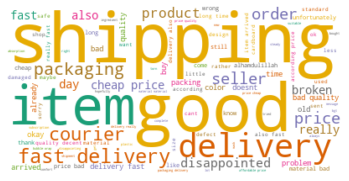

In [55]:
add_stop_words = ['...' , 'package', 'even', 'use','call','one','though', 'didnt', 'dont', 'hasnt', 'c',]
stop_words = add_stop_words + stop 
#wordcloud for top 100 words 
wc = WordCloud(stopwords=stop_words, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42, max_words = 100)

wordcloud = wc.generate(cloud_string)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

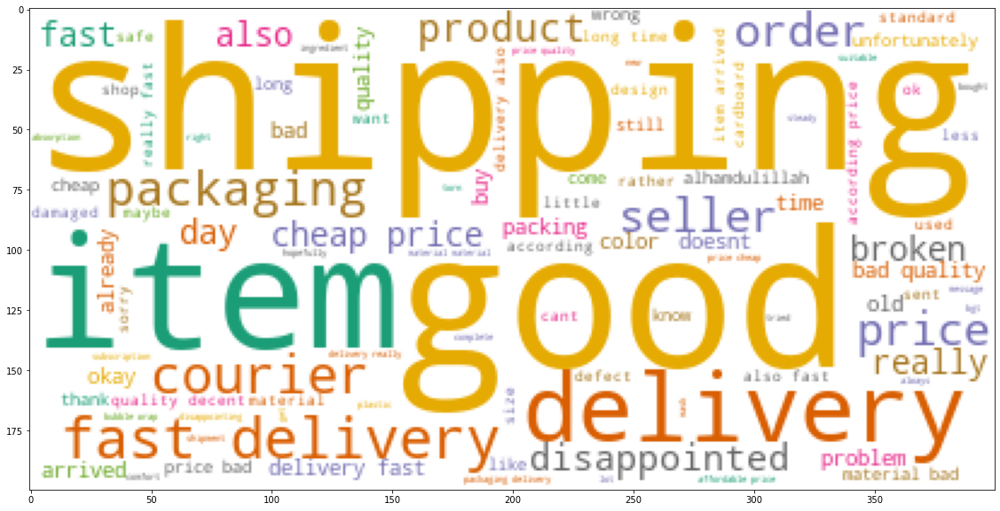

In [56]:
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)

In [69]:
late_words = ['slow', 'late', 'long']
df_late = df_neg[df_neg['Reviews'].str.contains('|'.join(late_words))]
df_late = df_late.rename(columns ={'Reviews':'Late reviews'})
df_late

,year,month,rating,Late reviews,Sentiment score
75,2022,01,5,item arrived damage high school delivery long ...,Negative
190,2022,02,5,nobodys siii nobody broken long delivery delivery,Negative
206,2022,02,5,long shipping items according expectations fun...,Negative
301,2021,12,4,sorry photo video packaging box remote courier...,Negative
559,2021,10,5,product good price cheapbut unfortunately deli...,Negative
...,...,...,...,...,...
38019,2020,09,5,bangettt bagusthe cloth also goodprice accordi...,Negative
38445,2022,02,5,packaging time rather slow arrived even though...,Negative
39147,2021,09,1,disappointed ive waiting long time doesnt anot...,Negative
39151,2021,09,5,good defectsonly shipping quite long usually d...,Negative


In [73]:
column_titles = ['rating','Late reviews','Sentiment score']

# df_late2.reset_index()

df_late2 = df_late.reindex(columns=column_titles)
df_late2

,rating,Late reviews,Sentiment score
75,5,item arrived damage high school delivery long ...,Negative
190,5,nobodys siii nobody broken long delivery delivery,Negative
206,5,long shipping items according expectations fun...,Negative
301,4,sorry photo video packaging box remote courier...,Negative
559,5,product good price cheapbut unfortunately deli...,Negative
...,...,...,...
38019,5,bangettt bagusthe cloth also goodprice accordi...,Negative
38445,5,packaging time rather slow arrived even though...,Negative
39147,1,disappointed ive waiting long time doesnt anot...,Negative
39151,5,good defectsonly shipping quite long usually d...,Negative


In [77]:
df_late2.to_csv('Late_reviews_shopeeINDO.csv', index=False)

# Unused

In [35]:
df['clean'] = df['clean'].str.replace('\n',' ')
# pengiriman means delivery

In [51]:
column_titles = ['date','comment','clean']
df1 = df1.reindex(columns=column_titles)
df1

,date,comment,clean
4,2022-02-23 11:11:52,Imut dan lucu..lumayan dipakai untuk foto self...,imut dan luculumayan dipakai untuk foto selfie...
6,2022-02-12 18:27:17,alatnya bagus dan mau berfungsi jugaa👍🏻👍🏻👍🏻👍🏻 ...,alatnya bagus dan mau berfungsi jugaa cuma pen...
8,2022-02-28 21:52:56,"Paket nya sudah datang dengan baik, respon pen...",paket nya sudah datang dengan baik respon penj...
9,2022-02-06 14:21:02,"Pengiriman cpt, packingannya kurang rapih cuma...",pengiriman cpt packingannya kurang rapih cuma ...
12,2022-02-15 11:11:45,"packing rapi, pengiriman cepet, barang bagus b...",packing rapi pengiriman cepet barang bagus ban...
...,...,...,...
255981,2021-01-21 19:34:15,Warna nya bagus kualitasnya barangnya juga bag...,warna nya bagus kualitasnya barangnya juga bag...
255984,2021-01-21 14:23:31,"Mantap, pengemasan pengiriman mantap dah pokok...",mantap pengemasan pengiriman mantap dah pokokn...
255985,2021-01-11 19:42:25,"Produk bagus,original dan tidak ada cacat.peng...",produk bagusoriginal dan tidak ada cacatpengir...
255987,2021-07-21 21:29:23,Harga:Terjangkau\nKualitas:Bagus\nDesain:Bagus...,hargaterjangkau kualitasbagus desainbagus peng...


## Split date to year and month for visualization purposes

In [53]:
df1['year'] = df_slow['date'].str.split(' ').str[0].str.split('-').str[0]
df1['month'] = df_slow['date'].str.split(' ').str[0].str.split('-').str[1]
df1.drop(['date'], axis =1)

/var/folders/5w/0kxl7gbj5vqb93sccvkxwrzc0000gn/T/ipykernel_36406/1553304258.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow['year'] = df_slow['date'].str.split(' ').str[0].str.split('-').str[0]
/var/folders/5w/0kxl7gbj5vqb93sccvkxwrzc0000gn/T/ipykernel_36406/1553304258.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow['month'] = df_slow['date'].str.split(' ').str[0].str.split('-').str[1]


,comment,clean,year,month
128,"Maaf packingnya kurang aman, pengiriman jga la...",maaf packingnya kurang aman pengiriman jga lam...,2022,02
160,Bluetooth smartphone remote variasi : pink. Se...,bluetooth smartphone remote variasi pink sesua...,2021,12
2020,berfungsi baik. pengiriman lambat sekali. beli...,berfungsi baik pengiriman lambat sekali beli t...,2021,11
2578,"Pengiriman cepat, sayang kurir yg ngantar lamb...",pengiriman cepat sayang kurir yg ngantar lamba...,2021,11
2702,"Prepare agak lambat, pengiriman standar\n\nPro...",prepare agak lambat pengiriman standar prouk m...,2021,10
...,...,...,...,...
253779,"Harga:ya lumayan lah\nKualitas:baguss, kokoh \...",hargaya lumayan lah kualitasbaguss kokoh desai...,2021,10
255040,Harga:murahh\nKualitas:baguusss\nDesain:baguss...,hargamurahh kualitasbaguusss desainbaguss bara...,2021,06
255089,bagusss... alhamdulillah tidak ada yang cacat👍...,bagusss alhamdulillah tidak ada yang cacat pen...,2021,07
255211,Harga:promo\nKualitas:oke\nDesain:oke\n\nPengi...,hargapromo kualitasoke desainoke pengiriman ag...,2021,08


## Sentiment Analysis

In [ ]:
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
def clean_text_round2(text):
    word_list = nltk.word_tokenize(text)
    lemmatized_output = ' '.join([lemmatizer.lemmatize(w) for w in word_list])
    return lemmatized_output
df1['clean_2'] = pd.DataFrame(df1['clean'].apply(clean_text_round2))

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

def sentiment_scores(sentence):
    sid_obj = SentimentIntensityAnalyzer() 
    sentiment_dict = sid_obj.polarity_scores(sentence) 
    if sentiment_dict['compound'] >= 0.05 : 
       return "Positive"
    elif sentiment_dict['compound'] <= - 0.05 : 
        return "Negative"
    else : 
       return "Neutral"
        
df1['sentiment'] = pd.DataFrame(d1['clean_2'].apply(sentiment_scores))

In [ ]:
df1.to_csv('df_try.csv')